# Temporal-Difference Methods

In this notebook, you will write your own implementations of many Temporal-Difference (TD) methods.

While we have provided some starter code, you are welcome to erase these hints and write your code from scratch.

---

### Part 0: Explore CliffWalkingEnv

We begin by importing the necessary packages.

In [1]:
import sys
import gym
import numpy as np
import random
import math
from collections import defaultdict, deque
import matplotlib.pyplot as plt
%matplotlib inline

import check_test
from plot_utils import plot_values

Use the code cell below to create an instance of the [CliffWalking](https://github.com/openai/gym/blob/master/gym/envs/toy_text/cliffwalking.py) environment.

In [2]:
env = gym.make('CliffWalking-v0')

The agent moves through a $4\times 12$ gridworld, with states numbered as follows:
```
[[ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11],
 [12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23],
 [24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35],
 [36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]]
```
At the start of any episode, state `36` is the initial state.  State `47` is the only terminal state, and the cliff corresponds to states `37` through `46`.

The agent has 4 potential actions:
```
UP = 0
RIGHT = 1
DOWN = 2
LEFT = 3
```

Thus, $\mathcal{S}^+=\{0, 1, \ldots, 47\}$, and $\mathcal{A} =\{0, 1, 2, 3\}$.  Verify this by running the code cell below.

In [3]:
print(env.action_space)
print(env.observation_space)

Discrete(4)
Discrete(48)


In this mini-project, we will build towards finding the optimal policy for the CliffWalking environment.  The optimal state-value function is visualized below.  Please take the time now to make sure that you understand _why_ this is the optimal state-value function.

_**Note**: You can safely ignore the values of the cliff "states" as these are not true states from which the agent can make decisions.  For the cliff "states", the state-value function is not well-defined._

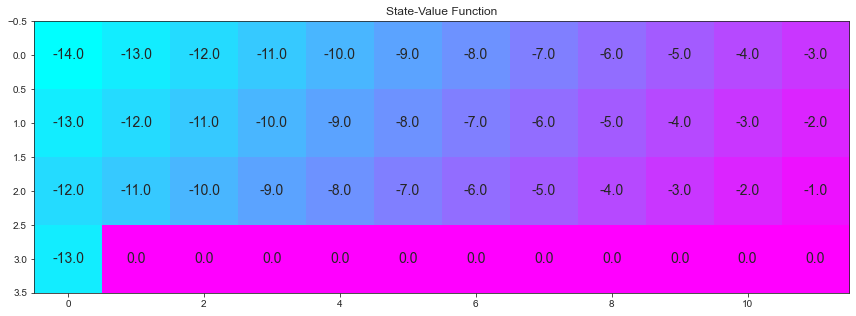

In [4]:
# define the optimal state-value function
V_opt = np.zeros((4,12))
V_opt[0][0:13] = -np.arange(3, 15)[::-1]
V_opt[1][0:13] = -np.arange(3, 15)[::-1] + 1
V_opt[2][0:13] = -np.arange(3, 15)[::-1] + 2
V_opt[3][0] = -13

plot_values(V_opt)

### Part 1: TD Control: Sarsa

In this section, you will write your own implementation of the Sarsa control algorithm.

Your algorithm has four arguments:
- `env`: This is an instance of an OpenAI Gym environment.
- `num_episodes`: This is the number of episodes that are generated through agent-environment interaction.
- `alpha`: This is the step-size parameter for the update step.
- `gamma`: This is the discount rate.  It must be a value between 0 and 1, inclusive (default value: `1`).

The algorithm returns as output:
- `Q`: This is a dictionary (of one-dimensional arrays) where `Q[s][a]` is the estimated action value corresponding to state `s` and action `a`.

Please complete the function in the code cell below.

(_Feel free to define additional functions to help you to organize your code._)

In [5]:
def update_Q_sarsa(alpha, gamma, Q, state, action, reward, next_state=None, next_action=None):
    """Returns updated Q-value for the most recent experience."""
    current = Q[state][action]  # estimate in Q-table (for current state, action pair)
    # get value of state, action pair at next time step
    Qsa_next = Q[next_state][next_action] if next_state is not None else 0    
    target = reward + (gamma * Qsa_next)               # construct TD target
    new_value = current + (alpha * (target - current)) # get updated value
    return new_value

def epsilon_greedy(Q, state, nA, eps):
    """Selects epsilon-greedy action for supplied state.
    
    Params
    ======
        Q (dictionary): action-value function
        state (int): current state
        nA (int): number actions in the environment
        eps (float): epsilon
    """
    if random.random() > eps: # select greedy action with probability epsilon
        return np.argmax(Q[state])
    else:                     # otherwise, select an action randomly
        return random.choice(np.arange(env.action_space.n))

In [7]:
def sarsa(env, num_episodes, alpha, gamma=1.0, plot_every=100):
    nA = env.action_space.n                # number of actions
    Q = defaultdict(lambda: np.zeros(nA))  # initialize empty dictionary of arrays
    
    # monitor performance
    tmp_scores = deque(maxlen=plot_every)     # deque for keeping track of scores
    avg_scores = deque(maxlen=num_episodes)   # average scores over every plot_every episodes
    
    for i_episode in range(1, num_episodes+1):
        # monitor progress
        if i_episode % 100 == 0:
            print("\rEpisode {}/{}".format(i_episode, num_episodes), end="")
            sys.stdout.flush()   
        score = 0                                             # initialize score
        state = env.reset()                                   # start episode
        
        eps = 1.0 / i_episode                                 # set value of epsilon
        action = epsilon_greedy(Q, state, nA, eps)            # epsilon-greedy action selection
        
        while True:
            next_state, reward, done, info = env.step(action) # take action A, observe R, S'
            score += reward                                   # add reward to agent's score
            if not done:
                next_action = epsilon_greedy(Q, next_state, nA, eps) # epsilon-greedy action
                print(f"Q[{state}][{action}] before: {Q[state][action]}")
                Q[state][action] = update_Q_sarsa(alpha, gamma, Q, \
                                                  state, action, reward, next_state, next_action)
                print(f"Q[{state}][{action}] after: {Q[state][action]}")
                state = next_state     # S <- S'
                action = next_action   # A <- A'
            if done:
                Q[state][action] = update_Q_sarsa(alpha, gamma, Q, \
                                                  state, action, reward)
                tmp_scores.append(score)    # append score
                break
        if (i_episode % plot_every == 0):
            avg_scores.append(np.mean(tmp_scores))

    # plot performance
    plt.plot(np.linspace(0,num_episodes,len(avg_scores),endpoint=False), np.asarray(avg_scores))
    plt.xlabel('Episode Number')
    plt.ylabel('Average Reward (Over Next %d Episodes)' % plot_every)
    plt.show()
    # print best 100-episode performance
    print(('Best Average Reward over %d Episodes: ' % plot_every), np.max(avg_scores))    
    return Q

Use the next code cell to visualize the **_estimated_** optimal policy and the corresponding state-value function.  

If the code cell returns **PASSED**, then you have implemented the function correctly!  Feel free to change the `num_episodes` and `alpha` parameters that are supplied to the function.  However, if you'd like to ensure the accuracy of the unit test, please do not change the value of `gamma` from the default.

Q[36][3] before: 0.0
Q[36][3] after: -0.01
Q[36][2] before: 0.0
Q[36][2] after: -0.01
Q[36][0] before: 0.0
Q[36][0] after: -0.01
Q[24][2] before: 0.0
Q[24][2] after: -0.0101
Q[36][2] before: -0.01
Q[36][2] after: -0.02
Q[36][2] before: -0.02
Q[36][2] after: -0.03
Q[36][2] before: -0.03
Q[36][2] after: -0.0398
Q[36][0] before: -0.01
Q[36][0] after: -0.0199
Q[24][1] before: 0.0
Q[24][1] after: -0.01
Q[25][1] before: 0.0
Q[25][1] after: -0.01
Q[26][0] before: 0.0
Q[26][0] after: -0.01
Q[14][1] before: 0.0
Q[14][1] after: -0.01
Q[15][0] before: 0.0
Q[15][0] after: -0.01
Q[3][0] before: 0.0
Q[3][0] after: -0.01
Q[3][3] before: 0.0
Q[3][3] after: -0.01
Q[2][3] before: 0.0
Q[2][3] after: -0.01
Q[1][1] before: 0.0
Q[1][1] after: -0.01
Q[2][1] before: 0.0
Q[2][1] after: -0.0101
Q[3][0] before: -0.01
Q[3][0] after: -0.02
Q[3][0] before: -0.02
Q[3][0] after: -0.029900000000000003
Q[3][3] before: -0.01
Q[3][3] after: -0.0199
Q[2][0] before: 0.0
Q[2][0] after: -0.01
Q[2][0] before: -0.01
Q[2][0] af

Q[3][2] before: -0.05064204224393124
Q[3][2] after: -0.06053664221750203
Q[15][0] before: -0.040102039601009803
Q[15][0] after: -0.050098058509989704
Q[3][1] before: -0.039703930499
Q[3][1] after: -0.04970393128803
Q[4][0] before: -0.039704009402
Q[4][0] after: -0.0496060087139899
Q[4][2] before: -0.02990394060099
Q[4][2] after: -0.0397049011949801
Q[16][2] before: -0.01
Q[16][2] after: -0.0203030388177717
Q[28][3] before: -0.04030388177717026
Q[28][3] after: -0.050100872755428454
Q[27][1] before: -0.020002979602990002
Q[27][1] after: -0.0298029498069601
Q[28][2] before: 0.0
Q[28][2] after: -1.0030228168525819
Q[36][0] before: -0.3022816852581955
Q[36][0] after: -0.31041993341483165
Q[24][3] before: -0.11610650092181321
Q[24][3] after: -0.13145071872215888
Q[24][2] before: -0.6505282809563813
Q[24][2] after: -0.8916839918234243
Q[36][1] before: -23.76609936766069
Q[36][1] after: -24.53154257331823
Q[36][0] before: -0.31041993341483165
Q[36][0] after: -0.3186302412679049
Q[24][3] before

Q[24][1] after: -1.3195144276136117
Q[25][2] before: -18.769704732565366
Q[25][2] after: -19.60816785351551
Q[36][2] before: -2.616016827579757
Q[36][2] after: -3.0864705271991837
Q[36][1] before: -48.66138678952245
Q[36][1] after: -49.181289270089586
Q[36][0] before: -0.651634846235519
Q[36][0] after: -0.659171043157439
Q[24][3] before: -0.405254538427519
Q[24][3] after: -0.4135498661747409
Q[24][0] before: -0.23478731314970702
Q[24][0] after: -0.24490510022987502
Q[12][3] before: -0.24656602116650683
Q[12][3] after: -0.25563621752037974
Q[12][1] before: -0.15358565655379966
Q[12][1] after: -0.16340368079973533
Q[13][3] before: -0.1353880811473665
Q[13][3] after: -0.14675337303199074
Q[12][2] before: -0.2719172696097886
Q[12][2] after: -0.308463322713622
Q[24][2] before: -2.9265225799931223
Q[24][2] after: -2.9600502275140745
Q[36][3] before: -5.2792873320883285
Q[36][3] after: -5.243086169199019
Q[36][0] before: -0.659171043157439
Q[36][0] after: -0.6757744770020008
Q[24][1] before: 

Q[2][2] before: -0.19596028516474376
Q[2][2] after: -0.206082394726794
Q[14][0] before: -0.2081712413697676
Q[14][0] after: -0.21816144627552192
Q[2][3] before: -0.20719173194519763
Q[2][3] after: -0.21681752211832775
Q[1][3] before: -0.16977074925821034
Q[1][3] after: -0.18017659522032617
Q[0][2] before: -0.21035534546979298
Q[0][2] after: -0.22102671637860383
Q[12][1] before: -0.2774924363508773
Q[12][1] after: -0.28667192369127587
Q[13][0] before: -0.19544117039073722
Q[13][0] after: -0.2055060012146409
Q[1][2] before: -0.2019242527811073
Q[1][2] after: -0.2119600702654426
Q[13][0] before: -0.2055060012146409
Q[13][0] after: -0.21600283135108367
Q[1][0] before: -0.255189014858918
Q[1][0] after: -0.26475672541298323
Q[1][2] before: -0.2119600702654426
Q[1][2] after: -0.22200049787629902
Q[13][0] before: -0.21600283135108367
Q[13][0] after: -0.22629905592327626
Q[1][1] before: -0.24562528857034335
Q[1][1] after: -0.25526358990788434
Q[2][0] before: -0.20945542232444048
Q[2][0] after: 

Q[6][3] after: -0.08179680542181109
Q[5][0] before: -0.07978947100334122
Q[5][0] after: -0.08978844031990207
Q[5][2] before: -0.07968640265942706
Q[5][2] after: -0.08958461962577863
Q[17][0] before: -0.06950809929458356
Q[17][0] after: -0.07971090270483674
Q[5][0] before: -0.08978844031990207
Q[5][0] after: -0.09931009621739119
Q[5][3] before: -0.041954030068812945
Q[5][3] after: -0.05280540903375499
Q[4][0] before: -0.12709192656301724
Q[4][0] after: -0.13661814304434305
Q[4][1] before: -0.07971357469559893
Q[4][1] after: -0.0894444930389805
Q[5][3] before: -0.05280540903375499
Q[5][3] after: -0.06364353637386087
Q[4][0] before: -0.13661814304434305
Q[4][0] after: -0.14614640654428943
Q[4][1] before: -0.0894444930389805
Q[4][1] after: -0.09944589430484849
Q[5][2] before: -0.08958461962577863
Q[5][2] after: -0.09919388198243638
Q[17][3] before: -0.05051085529155426
Q[17][3] after: -0.060790982018695684
Q[16][1] before: -0.07852352800569691
Q[16][1] after: -0.0883462025458269
Q[17][3] b

Q[36][1] after: -97.08962486943075
Q[36][1] before: -97.08962486943075
Q[36][1] after: -97.29602969129006
Q[36][2] before: -17.730107055361852
Q[36][2] after: -17.776653893456224
Q[36][3] before: -21.38479086479916
Q[36][3] after: -21.394790864799162
Q[36][3] before: -21.394790864799162
Q[36][3] after: -21.222810939231294
Q[36][0] before: -3.1967983080123017
Q[36][0] after: -3.1957260697421255
Q[24][3] before: -2.0895744809946972
Q[24][3] after: -2.2197842422576977
Q[24][2] before: -14.110550607294753
Q[24][2] after: -14.191673210614118
Q[36][3] before: -21.222810939231294
Q[36][3] after: -21.198349368773545
Q[36][2] before: -17.776653893456224
Q[36][2] after: -18.58184765143456
Q[36][1] before: -97.29602969129006
Q[36][1] after: -97.5088878708915
Q[36][2] before: -18.58184765143456
Q[36][2] after: -18.591847651434563
Q[36][2] before: -18.591847651434563
Q[36][2] after: -18.447886435617637
Q[36][0] before: -3.1957260697421255
Q[36][0] after: -3.1959666514672813
Q[24][3] before: -2.2197

Q[16][3] before: -0.1694577960085995
Q[16][3] after: -0.1797015762896198
Q[15][1] before: -0.19383582411062847
Q[15][1] after: -0.20369448163241838
Q[16][3] before: -0.1797015762896198
Q[16][3] after: -0.19914225442482322
Q[15][2] before: -1.1237693898099617
Q[15][2] after: -1.1239249474746555
Q[27][0] before: -0.13932515627934325
Q[27][0] after: -0.14965598050222684
Q[15][3] before: -0.17240757856770145
Q[15][3] after: -0.18746307031490064
Q[14][2] before: -0.6779567532876206
Q[14][2] after: -0.6835934444538124
Q[26][0] before: -0.24162586990680215
Q[26][0] after: -0.2526006283265608
Q[14][0] before: -0.33910171188266697
Q[14][0] after: -0.3493609880211159
Q[2][0] before: -0.3650293257275611
Q[2][0] after: -0.3750293257275611
Q[2][0] before: -0.3750293257275611
Q[2][0] after: -0.3850293257275611
Q[2][0] before: -0.3850293257275611
Q[2][0] after: -0.39459896913237313
Q[2][3] before: -0.3419936662087652
Q[2][3] after: -0.35282054090769016
Q[1][1] before: -0.4246811361012607
Q[1][1] afte

Q[12][1] after: -1.1003742883542778
Q[13][1] before: -0.6015100679689411
Q[13][1] after: -0.6187551616511315
Q[14][2] before: -1.3260194361879796
Q[14][2] after: -1.3253952006338172
Q[26][0] before: -0.2635958807717487
Q[26][0] after: -0.2749575663367259
Q[14][0] before: -0.3997644372694687
Q[14][0] after: -0.4095223107331365
Q[2][1] before: -0.3755517836362461
Q[2][1] after: -0.3847678537687563
Q[3][2] before: -0.29715879688726443
Q[3][2] after: -0.30649323828279296
Q[15][1] before: -0.23060293644011803
Q[15][1] after: -0.23945279543260825
Q[16][0] before: -0.11558883568914058
Q[16][0] after: -0.12649817879064537
Q[4][1] before: -0.2065231458396205
Q[4][1] after: -0.2160052455676572
Q[5][1] before: -0.15473311864329156
Q[5][1] after: -0.16425392023484287
Q[6][1] before: -0.10681327779842303
Q[6][1] after: -0.1160492843074692
Q[7][0] before: -0.03041392870303994
Q[7][0] after: -0.040730278143958416
Q[7][3] before: -0.06204887279488758
Q[7][3] after: -0.07234986282587635
Q[6][3] before:

Q[25][3] before: -2.5340521845261654
Q[25][3] after: -2.5310811046725203
Q[24][0] before: -1.236944199161664
Q[24][0] after: -1.2430451064513617
Q[12][0] before: -0.8470349281314137
Q[12][0] after: -0.855652925387966
Q[0][1] before: -0.7088346537866411
Q[0][1] after: -0.7167310291577026
Q[1][1] before: -0.4984721908927847
Q[1][1] after: -0.5078053317613501
Q[2][3] before: -0.4317862777493282
Q[2][3] after: -0.44254646828944844
Q[1][1] before: -0.5078053317613501
Q[1][1] after: -0.5170190273316093
Q[2][1] before: -0.42917488878726706
Q[2][1] after: -0.4381740408597321
Q[3][3] before: -0.32909009603377015
Q[3][3] after: -0.34018093548202977
Q[2][1] before: -0.4381740408597321
Q[2][1] after: -0.447068054618724
Q[3][1] before: -0.32757541675892443
Q[3][1] after: -0.33662697030954813
Q[4][0] before: -0.23273077182129626
Q[4][0] after: -0.24294001792160388
Q[4][1] before: -0.25365538185205816
Q[4][1] after: -0.26338663238861726
Q[5][0] before: -0.22678043550796878
Q[5][0] after: -0.236780435

Q[25][2] before: -73.6364162832077
Q[25][2] after: -74.43192665549371
Q[36][3] before: -53.187453511809125
Q[36][3] after: -53.19745351180912
Q[36][3] before: -53.19745351180912
Q[36][3] after: -53.20745351180912
Q[36][3] before: -53.20745351180912
Q[36][3] after: -53.21745351180912
Q[36][3] before: -53.21745351180912
Q[36][3] after: -53.22745351180912
Q[36][3] before: -53.22745351180912
Q[36][3] after: -53.25136217763756
Q[36][2] before: -54.61832009465361
Q[36][2] after: -54.62832009465361
Q[36][2] before: -54.62832009465361
Q[36][2] after: -54.63832009465361
Q[36][2] before: -54.63832009465361
Q[36][2] after: -54.204122210233784
Q[36][0] before: -10.218531652671476
Q[36][0] after: -10.23912661024838
Q[24][1] before: -11.278027410361894
Q[24][1] after: -11.185541126157442
Q[25][0] before: -1.029398989916841
Q[25][0] after: -1.0354613415737057
Q[13][0] before: -0.6356341556033234
Q[13][0] after: -0.6460648257343534
Q[1][3] before: -0.6787011687063274
Q[1][3] after: -0.6917301551119384

Q[13][0] before: -0.7640974935895262
Q[13][0] after: -0.773135236261219
Q[1][1] before: -0.6678717607588133
Q[1][1] after: -0.677075496766457
Q[2][3] before: -0.5882453615231803
Q[2][3] after: -0.6030421490882256
Q[1][2] before: -1.0679241180277155
Q[1][2] after: -1.0762685189956174
Q[13][1] before: -0.90236421481791
Q[13][1] after: -0.9298656676741579
Q[14][2] before: -2.6525095004426995
Q[14][2] after: -2.6778684109461164
Q[26][3] before: -4.188400550784398
Q[26][3] after: -4.195847010665702
Q[25][3] before: -3.9330465389147444
Q[25][3] after: -4.018552436826067
Q[24][1] before: -11.483636330047052
Q[24][1] after: -11.409563078666164
Q[25][1] before: -3.0763111919583253
Q[25][1] after: -3.0607925606366044
Q[26][0] before: -0.5244480597862387
Q[26][0] after: -0.537680089438899
Q[14][3] before: -0.847651025052277
Q[14][3] after: -0.9340795627639155
Q[13][2] before: -8.490504796216126
Q[13][2] after: -8.455785272622226
Q[25][3] before: -4.018552436826067
Q[25][3] after: -4.0041598393822

Q[24][1] after: -15.05923052936936
Q[25][3] before: -4.474224518999968
Q[25][3] after: -4.5900745791036615
Q[24][1] before: -15.05923052936936
Q[24][1] after: -14.92988737545701
Q[25][0] before: -1.1249151381343363
Q[25][0] after: -1.2143395806961965
Q[13][2] before: -9.067359394320365
Q[13][2] after: -9.825667766985042
Q[25][2] before: -83.89819666078814
Q[25][2] after: -84.66275681736435
Q[36][3] before: -60.35421231840944
Q[36][3] after: -60.364212318409436
Q[36][3] before: -60.364212318409436
Q[36][3] after: -59.887925216918106
Q[36][0] before: -11.73550216927626
Q[36][0] after: -11.647936594880417
Q[24][0] before: -1.9789447296918838
Q[24][0] after: -2.036879665076984
Q[12][2] before: -6.772438268201895
Q[12][2] after: -6.864012759274446
Q[24][1] before: -14.92988737545701
Q[24][1] after: -15.637216069876084
Q[25][2] before: -84.66275681736435
Q[25][2] after: -84.93260861513951
Q[36][0] before: -11.647936594880417
Q[36][0] after: -11.697829389630373
Q[24][1] before: -15.6372160698

Q[36][0] before: -14.816571891281791
Q[36][0] after: -14.908350283071652
Q[24][1] before: -22.99441107026784
Q[24][1] after: -22.787802188256542
Q[25][0] before: -1.333522869137921
Q[25][0] after: -1.339107758521191
Q[13][0] before: -0.8920118074649238
Q[13][0] after: -0.9011221523844153
Q[1][1] before: -0.8030462994140757
Q[1][1] after: -0.8122844962664101
Q[2][0] before: -0.7268659846475211
Q[2][0] after: -0.7368659846475211
Q[2][0] before: -0.7368659846475211
Q[2][0] after: -0.7468659846475211
Q[2][0] before: -0.7468659846475211
Q[2][0] after: -0.7568659846475211
Q[2][0] before: -0.7568659846475211
Q[2][0] after: -0.7660738132915831
Q[2][1] before: -0.6776488490537163
Q[2][1] after: -0.6854429098658604
Q[3][0] before: -0.45705493026812877
Q[3][0] after: -0.46749346297019445
Q[3][1] before: -0.5009082004746975
Q[3][1] after: -0.5088807122736765
Q[4][3] before: -0.29815938037259015
Q[4][3] after: -0.3105049714899891
Q[3][2] before: -0.5327184921124886
Q[3][2] after: -0.541525009852128

Q[9][3] before: -0.01
Q[9][3] after: -0.02031463992844377
Q[8][3] before: -0.041463992844377025
Q[8][3] after: -0.05196046022677646
Q[7][0] before: -0.09111073108432044
Q[7][0] after: -0.10123596278721542
Q[7][3] before: -0.10363390137381748
Q[7][3] after: -0.11449063656881293
Q[6][3] before: -0.1893074208733628
Q[6][3] after: -0.20036505892431813
Q[5][3] before: -0.29507122596889596
Q[5][3] after: -0.30701110957033784
Q[4][1] before: -0.48905958611308425
Q[4][1] after: -0.4974607995918492
Q[5][1] before: -0.32918093398957615
Q[5][1] after: -0.3381642994458436
Q[6][0] before: -0.22751747961632163
Q[6][0] after: -0.2372459554094016
Q[6][3] before: -0.20036505892431813
Q[6][3] after: -0.2117430513295334
Q[5][1] before: -0.3381642994458436
Q[5][1] after: -0.3463209645065456
Q[6][1] before: -0.15383080551604314
Q[6][1] after: -0.16330485708875486
Q[7][0] before: -0.10123596278721542
Q[7][0] after: -0.11140719792186213
Q[7][2] before: -0.11835947625188593
Q[7][2] after: -0.12853560567985856

Q[36][1] after: -171.22923529063894
Q[36][0] before: -19.19618566239261
Q[36][0] after: -19.049193157227947
Q[24][0] before: -3.496935145926177
Q[24][0] after: -3.4943154461976254
Q[12][3] before: -2.234965173071004
Q[12][3] after: -2.246512011697138
Q[12][1] before: -2.389649035684405
Q[12][1] after: -2.4963879176910595
Q[13][2] before: -12.063537236349859
Q[13][2] after: -11.971223123801419
Q[25][0] before: -1.8321259815058077
Q[25][0] after: -1.943516952928764
Q[13][2] before: -11.971223123801419
Q[13][2] after: -11.891658561929052
Q[25][1] before: -3.0147669365647722
Q[25][1] after: -3.029844496741541
Q[26][1] before: -3.522522954241632
Q[26][1] after: -3.515709091111291
Q[27][3] before: -1.8411366412075434
Q[27][3] after: -1.8678823657065808
Q[26][1] before: -3.515709091111291
Q[26][1] after: -3.509230823857244
Q[27][3] before: -1.8678823657065808
Q[27][3] after: -1.8942958502880876
Q[26][1] before: -3.509230823857244
Q[26][1] after: -3.487895037822627
Q[27][0] before: -0.37565222

Q[24][2] before: -69.74408908776094
Q[24][2] after: -69.26975495343555
Q[36][0] before: -21.310675655221814
Q[36][0] after: -21.800266448203953
Q[24][2] before: -69.26975495343555
Q[24][2] after: -68.80506006838324
Q[36][0] before: -21.800266448203953
Q[36][0] after: -21.883028868266894
Q[24][1] before: -29.076508454498075
Q[24][1] after: -28.90158457450512
Q[25][3] before: -10.584120455202573
Q[25][3] after: -10.777295096395598
Q[24][1] before: -28.90158457450512
Q[24][1] after: -29.789920460942685
Q[25][2] before: -116.73517321826185
Q[25][2] after: -118.30579158841246
Q[36][1] before: -173.79701023332237
Q[36][1] after: -173.2778704196718
Q[36][0] before: -21.883028868266894
Q[36][0] after: -21.71158994790503
Q[24][0] before: -3.739136832080451
Q[24][0] after: -3.8443670623283555
Q[12][2] before: -13.262159856870884
Q[12][2] after: -13.177981928925458
Q[24][0] before: -3.8443670623283555
Q[24][0] after: -3.8430473467021025
Q[12][3] before: -2.7123954997030366
Q[12][3] after: -2.7201

Q[33][0] after: -0.0103960301
Q[21][1] before: -0.03960301
Q[21][1] after: -0.0494069799
Q[22][0] before: -0.02
Q[22][0] after: -0.030099
Q[10][0] before: -0.029900000000000003
Q[10][0] after: -0.03980299
Q[10][2] before: -0.020199
Q[10][2] after: -0.030198019900000005
Q[22][1] before: -0.02010099
Q[22][1] after: -0.0301969901
Q[23][2] before: -0.029701
Q[23][2] after: -0.03950399
Q[36][2] before: -74.64811961240986
Q[36][2] after: -74.15421922819137
Q[36][0] before: -24.25808119056093
Q[36][0] after: -24.744032451715608
Q[24][2] before: -71.85320730602886
Q[24][2] after: -71.39211555748574
Q[36][0] before: -24.744032451715608
Q[36][0] after: -24.55126907044455
Q[24][0] before: -4.4676943246101075
Q[24][0] after: -4.461567686856209
Q[12][3] before: -2.8550305492202273
Q[12][3] after: -2.865030549220227
Q[12][3] before: -2.865030549220227
Q[12][3] after: -2.864878688636733
Q[12][0] before: -1.849844490870818
Q[12][0] after: -1.8770539017000447
Q[0][2] before: -3.570785573793493
Q[0][2] 

Q[8][0] before: -0.14968385698623313
Q[8][0] after: -0.15957501940003144
Q[8][2] before: -0.13880009836606522
Q[8][2] after: -0.14857966458997512
Q[20][1] before: -0.11675672075705637
Q[20][1] after: -0.12733859314657975
Q[21][2] before: -0.17494395970939494
Q[21][2] after: -0.1834024693567909
Q[33][0] before: -0.02079492444898929
Q[33][0] after: -0.031398394898077706
Q[21][3] before: -0.08114196935783113
Q[21][3] after: -0.09155441403327519
Q[20][0] before: -0.12238643690223604
Q[20][0] after: -0.132758322727214
Q[8][0] before: -0.15957501940003144
Q[8][0] after: -0.16945926385042956
Q[8][3] before: -0.1479994644398429
Q[8][3] after: -0.15858488540042948
Q[7][2] before: -0.20654156049850114
Q[7][2] after: -0.2162437671167839
Q[19][2] before: -0.17676222232677702
Q[19][2] after: -0.18602119272165868
Q[31][0] before: -0.10265926181494443
Q[31][0] after: -0.11344143378833155
Q[19][3] before: -0.18087645915365655
Q[19][3] after: -0.19166128367052235
Q[18][3] before: -0.2593589108402372
Q[

Q[3][0] before: -0.8397477646356868
Q[3][0] after: -0.8497477646356868
Q[3][0] before: -0.8497477646356868
Q[3][0] after: -0.8596829500364206
Q[3][2] before: -0.8432663047090698
Q[3][2] after: -0.8838223475278457
Q[15][2] before: -3.8988705865866544
Q[15][2] after: -3.8742350545208657
Q[27][1] before: -0.4353173800078039
Q[27][1] after: -0.44335508009457203
Q[28][1] before: -0.2390873886846176
Q[28][1] after: -0.24867954867524303
Q[29][0] before: -0.1983033877471617
Q[29][0] after: -0.2110081256293427
Q[17][3] before: -0.46877717596526325
Q[17][3] after: -0.4798829917789627
Q[16][1] before: -0.5793587573352096
Q[16][1] after: -0.5883639996796471
Q[17][3] before: -0.4798829917789627
Q[17][3] after: -0.4909082665623134
Q[16][3] before: -0.5824104701140318
Q[16][3] after: -0.5930361773404399
Q[15][1] before: -0.6449811927548438
Q[15][1] after: -0.6544038258939464
Q[16][0] before: -0.5872445066651061
Q[16][0] after: -0.5982051422688586
Q[4][0] before: -0.6833080670403581
Q[4][0] after: -0.

Q[3][2] before: -0.945827469099806
Q[3][2] after: -0.9536605934949163
Q[15][1] before: -0.7291399086108382
Q[15][1] after: -0.7383849388273579
Q[16][0] before: -0.6536429302628086
Q[16][0] after: -0.6647335440894743
Q[4][1] before: -0.7627043129293792
Q[4][1] after: -0.7710567528358485
Q[5][1] before: -0.5979483035763044
Q[5][1] after: -0.6065194537247067
Q[6][2] before: -0.4550633184165433
Q[6][2] after: -0.46464630624989534
Q[18][2] before: -0.4133621017517491
Q[18][2] after: -0.4213766421268842
Q[30][1] before: -0.2148161392652609
Q[30][1] after: -0.22518481157041784
Q[31][0] before: -0.2516833697809542
Q[31][0] after: -0.26248692280934444
Q[19][3] before: -0.3320386726199795
Q[19][3] after: -0.34287121449156394
Q[18][1] before: -0.415292859778426
Q[18][1] after: -0.42451002311554586
Q[19][0] before: -0.33700919349041425
Q[19][0] after: -0.34726009030019017
Q[7][2] before: -0.36209887446800754
Q[7][2] after: -0.3718032735742269
Q[19][2] before: -0.332538785089942
Q[19][2] after: -0.

Q[31][3] before: -0.35866896849373714
Q[31][3] after: -0.36845763625309375
Q[30][0] before: -0.3375357444293964
Q[30][0] after: -0.3491570828848257
Q[18][0] before: -0.49966958997233146
Q[18][0] after: -0.5100298397970597
Q[6][1] before: -0.5356945724451543
Q[6][1] after: -0.5447608435606331
Q[7][3] before: -0.44232168399303967
Q[7][3] after: -0.4533460755887156
Q[6][1] before: -0.5447608435606331
Q[6][1] after: -0.5536500761951065
Q[7][1] before: -0.4336841070079686
Q[7][1] after: -0.4427724594260624
Q[8][2] before: -0.3425193488173482
Q[8][2] after: -0.3521786831397763
Q[20][3] before: -0.3084527810601589
Q[20][3] after: -0.319502446141187
Q[19][1] before: -0.4134192891629696
Q[19][1] after: -0.42237349885309133
Q[20][2] before: -0.30884025817514327
Q[20][2] after: -0.3175136758683603
Q[32][3] before: -0.17618202749685086
Q[32][3] after: -0.18800900286095473
Q[31][0] before: -0.3588795639072379
Q[31][0] after: -0.36947631181113827
Q[19][3] before: -0.41855435429727633
Q[19][3] after:

Q[28][0] after: -0.26548162117815094
Q[16][1] before: -0.8063794650175184
Q[16][1] after: -0.815157240983055
Q[17][1] before: -0.6841570615711765
Q[17][1] after: -0.6928485296375144
Q[18][2] before: -0.5533038682049646
Q[18][2] after: -0.5616113090289735
Q[30][0] before: -0.3840479506058507
Q[30][0] after: -0.3958235841900819
Q[18][2] before: -0.5616113090289735
Q[18][2] after: -0.5698964848859397
Q[30][1] before: -0.39012889472559087
Q[30][1] after: -0.4008551006439376
Q[31][0] before: -0.46274948656026543
Q[31][0] after: -0.4728752930683844
Q[19][1] before: -0.47533013737215957
Q[19][1] after: -0.48406747690559987
Q[20][0] before: -0.3490640907161923
Q[20][0] after: -0.35940345313977096
Q[8][1] before: -0.3830003330740573
Q[8][1] after: -0.392240140201926
Q[9][2] before: -0.3069810458609289
Q[9][2] after: -0.3167245763546615
Q[21][1] before: -0.28133409523418734
Q[21][1] after: -0.2908446840872563
Q[22][0] before: -0.23239298054108307
Q[22][0] after: -0.2425606087614861
Q[10][0] befo

Q[8][3] after: -0.4514622831239744
Q[7][2] before: -0.5388808534613365
Q[7][2] after: -0.5487744523163667
Q[19][1] before: -0.528240738964353
Q[19][1] after: -0.5371761037697947
Q[20][1] before: -0.4217772195085258
Q[20][1] after: -0.43096031804653306
Q[21][2] before: -0.3400870733092533
Q[21][2] after: -0.3487736503043976
Q[33][1] before: -0.20874477282368448
Q[33][1] after: -0.21789693214774736
Q[34][1] before: -0.12396070522997303
Q[34][1] after: -0.13420652046672454
Q[36][0] before: -20.74882035830758
Q[36][0] after: -20.593534285695974
Q[24][0] before: -4.220213097147084
Q[24][0] after: -4.208413665964158
Q[12][0] before: -2.0402699788543983
Q[12][0] after: -2.0474214662620933
Q[0][0] before: -1.7554187196238769
Q[0][0] after: -1.7654187196238769
Q[0][0] before: -1.7654187196238769
Q[0][0] after: -1.7754005511407338
Q[0][1] before: -1.7636018713095611
Q[0][1] after: -1.7721996521776
Q[1][3] before: -1.623379958113443
Q[1][3] after: -1.63485997055504
Q[0][3] before: -1.771381202273

Q[10][0] before: -0.3588175853867916
Q[10][0] after: -0.36873154389228435
Q[10][1] before: -0.3502134359360703
Q[10][1] after: -0.3598004462776419
Q[11][1] before: -0.3089144700932321
Q[11][1] after: -0.3189144700932321
Q[11][1] before: -0.3189144700932321
Q[11][1] after: -0.32884480321867704
Q[11][2] before: -0.31194778263772427
Q[11][2] after: -0.3215162240321741
Q[23][1] before: -0.2687919220827063
Q[23][1] after: -0.2787919220827063
Q[23][1] before: -0.2787919220827063
Q[23][1] after: -0.2886987934225297
Q[23][3] before: -0.26947905606504285
Q[23][3] after: -0.2799912504118296
Q[22][3] before: -0.3206984907437144
Q[22][3] after: -0.33134298917087873
Q[21][1] before: -0.38514833346014654
Q[21][1] after: -0.3945267466024123
Q[22][2] before: -0.32298964768672694
Q[22][2] after: -0.3313775868982519
Q[34][3] before: -0.16178356883922404
Q[34][3] after: -0.17270637325104216
Q[33][3] before: -0.25406401002103474
Q[33][3] after: -0.26448352285314625
Q[32][1] before: -0.2960152932321852
Q[3

Q[6][0] before: -0.7553623937192928
Q[6][0] after: -0.7653155830989488
Q[6][1] before: -0.7506813316848887
Q[6][1] after: -0.7595849877590126
Q[7][1] before: -0.641046939097279
Q[7][1] after: -0.6501084473693609
Q[8][2] before: -0.5471977663054723
Q[8][2] after: -0.5569737150844042
Q[20][2] before: -0.5247926441986582
Q[20][2] after: -0.5330561848525809
Q[32][3] before: -0.3511467095909201
Q[32][3] after: -0.3635360315157778
Q[31][3] before: -0.5900789020766894
Q[31][3] after: -0.5991672606634729
Q[30][3] before: -0.4989147607550353
Q[30][3] after: -0.5070711656724977
Q[29][0] before: -0.3145552525012707
Q[29][0] after: -0.33005784690103385
Q[17][1] before: -0.8648146924775831
Q[17][1] after: -0.8731681052923695
Q[18][2] before: -0.7001559739562186
Q[18][2] after: -0.7081479403039965
Q[30][1] before: -0.49935260873400117
Q[30][1] after: -0.5103002831017897
Q[31][1] before: -0.5941200455128457
Q[31][1] after: -0.6017113976427862
Q[32][1] before: -0.3532552585068985
Q[32][1] after: -0.36

Q[20][3] before: -0.5966140393132902
Q[20][3] after: -0.6075751546133004
Q[19][2] before: -0.6927255693143162
Q[19][2] after: -0.70233409673413
Q[31][3] before: -0.6535783112956995
Q[31][3] after: -0.6626090556117782
Q[30][3] before: -0.556652742903559
Q[30][3] after: -0.5648545781534368
Q[29][0] before: -0.37683626789133295
Q[29][0] after: -0.39280035984508693
Q[17][0] before: -0.9732454632667287
Q[17][0] after: -0.9833762203579275
Q[5][3] before: -0.9863211723866048
Q[5][3] after: -0.9979487442724349
Q[4][2] before: -1.1490783609696116
Q[4][2] after: -1.158481602482592
Q[16][0] before: -1.089402512267642
Q[16][0] after: -1.100039056938359
Q[4][3] before: -1.1530569793393237
Q[4][3] after: -1.1648059140657736
Q[3][3] before: -1.327950451984308
Q[3][3] after: -1.340530777869406
Q[2][3] before: -1.5859830404941035
Q[2][3] after: -1.5983723020284801
Q[1][1] before: -1.8249091939317519
Q[1][1] after: -1.8325211786839108
Q[2][2] before: -1.5861076691476403
Q[2][2] after: -1.593144828119842

Q[10][1] after: -0.4743757100093492
Q[11][2] before: -0.4170427909217251
Q[11][2] after: -0.42652092733837094
Q[23][3] before: -0.3648564325863114
Q[23][3] after: -0.37552771086915937
Q[22][2] before: -0.43198426087110886
Q[22][2] after: -0.5512927180374267
Q[34][2] before: -11.362829977502894
Q[34][2] after: -12.436211518418238
Q[36][0] before: -18.70098406903732
Q[36][0] after: -18.564699751041402
Q[24][0] before: -4.072552269445566
Q[24][0] after: -4.063438255184302
Q[12][0] before: -2.1611508433191333
Q[12][0] after: -2.1702970097636998
Q[0][1] before: -2.0757674877757997
Q[0][1] after: -2.083872822065412
Q[1][0] before: -1.8863009167370353
Q[1][0] after: -1.8963009167370353
Q[1][0] before: -1.8963009167370353
Q[1][0] after: -1.9062620351783426
Q[1][3] before: -1.8924127608677639
Q[1][3] after: -1.9042904944121457
Q[0][3] before: -2.080186115305944
Q[0][3] after: -2.090186115305944
Q[0][3] before: -2.090186115305944
Q[0][3] after: -2.1000951940092216
Q[0][0] before: -2.081093985633

Q[3][0] after: -1.467676220593795
Q[3][0] before: -1.467676220593795
Q[3][0] after: -1.4776519982701923
Q[3][3] before: -1.465253988233535
Q[3][3] after: -1.4776502289775413
Q[2][2] before: -1.7048780626341689
Q[2][2] after: -1.7123821722226527
Q[14][1] before: -1.455289021482545
Q[14][1] after: -1.4640898400126807
Q[15][0] before: -1.3353708744961315
Q[15][0] after: -1.3466736432198463
Q[3][1] before: -1.465647746867604
Q[3][1] after: -1.4738734764265644
Q[4][1] before: -1.288220702763653
Q[4][1] after: -1.2964531998920439
Q[5][2] before: -1.1114704156027508
Q[5][2] after: -1.121389838005941
Q[17][2] before: -1.1034126559217747
Q[17][2] after: -1.107080818233313
Q[29][3] before: -0.4702288870756022
Q[29][3] after: -0.4799833035875833
Q[28][0] before: -0.44567053827371134
Q[28][0] after: -0.4637875645622867
Q[16][0] before: -1.2573731671312478
Q[16][0] after: -1.2677172706884408
Q[4][2] before: -1.291783522850534
Q[4][2] after: -1.3014955328740112
Q[16][1] before: -1.2629845251982459
Q

Q[6][0] before: -0.9745000753637323
Q[6][0] after: -0.9845000753637323
Q[6][0] before: -0.9845000753637323
Q[6][0] after: -0.994436338247338
Q[6][1] before: -0.9781263637243041
Q[6][1] after: -0.9867730517936771
Q[7][3] before: -0.8427951706616076
Q[7][3] after: -0.8541694654436063
Q[6][2] before: -0.9802246488614765
Q[6][2] after: -0.9895982580268704
Q[18][1] before: -0.9175855654008688
Q[18][1] after: -0.9265636206315662
Q[19][1] before: -0.8153910884706089
Q[19][1] after: -0.8243090089882679
Q[20][3] before: -0.7071831402365004
Q[20][3] after: -0.7182711088335653
Q[19][2] before: -0.8159799999429838
Q[19][2] after: -0.8253531550586455
Q[31][3] before: -0.7532955115091555
Q[31][3] after: -0.7624240832637466
Q[30][3] before: -0.6661526869682559
Q[30][3] after: -0.675286777198985
Q[29][1] before: -0.5795617100411592
Q[29][1] after: -0.590507379514698
Q[30][1] before: -0.6741286573950358
Q[30][1] after: -0.6849949844887465
Q[31][1] before: -0.760761366766105
Q[31][1] after: -0.768962096

Q[11][0] after: -0.5480963090862195
Q[11][3] before: -0.5282612574693593
Q[11][3] after: -0.5387718937354168
Q[10][3] before: -0.5793248840751121
Q[10][3] after: -0.5901604502705937
Q[9][1] before: -0.6628815036232806
Q[9][1] after: -0.6721301831039445
Q[10][1] before: -0.5877494516896713
Q[10][1] after: -0.5971759802206617
Q[11][2] before: -0.5304023047887051
Q[11][2] after: -0.5397787376766651
Q[23][1] before: -0.468045593584705
Q[23][1] after: -0.478045593584705
Q[23][1] before: -0.478045593584705
Q[23][1] after: -0.4879821390045712
Q[23][2] before: -0.4717001355713282
Q[23][2] after: -0.4800190020351192
Q[36][0] before: -17.519303978104578
Q[36][0] after: -17.394081165421355
Q[24][0] before: -3.9970227097821374
Q[24][0] after: -3.989522677125888
Q[12][0] before: -2.2470194441571674
Q[12][0] after: -2.257074322786428
Q[0][1] before: -2.252507307083214
Q[0][1] after: -2.260440022923691
Q[1][0] before: -2.0457788911309227
Q[1][0] after: -2.0557788911309225
Q[1][0] before: -2.055778891

Q[8][3] after: -0.8168128400697777
Q[7][0] before: -0.9289771983518261
Q[7][0] after: -0.9389771983518261
Q[7][0] before: -0.9389771983518261
Q[7][0] after: -0.948887479420722
Q[7][2] before: -0.9300053052414188
Q[7][2] after: -0.9396808842611225
Q[19][3] before: -0.8975632072117931
Q[19][3] after: -0.9086606030952259
Q[18][2] before: -1.007302795555074
Q[18][2] after: -1.015095305737495
Q[30][0] before: -0.7865538137971795
Q[30][0] after: -0.7988212406115643
Q[18][3] before: -1.0132964952356671
Q[18][3] after: -1.0254860234438679
Q[17][2] before: -1.2322493160557506
Q[17][2] after: -1.2374725757274057
Q[29][0] before: -0.7545752832212623
Q[29][0] after: -0.7693869929671414
Q[17][3] before: -1.2357462578091667
Q[17][3] after: -1.248028597597424
Q[16][1] before: -1.4639802366348944
Q[16][1] after: -1.4717150943821469
Q[17][0] before: -1.2374660113601337
Q[17][0] after: -1.2477722206462019
Q[5][2] before: -1.2680869399669623
Q[5][2] after: -1.2777807963245666
Q[17][2] before: -1.23747257

Q[17][1] before: -1.2842562352540254
Q[17][1] after: -1.291913461910975
Q[18][3] before: -1.0499789009489646
Q[18][3] after: -1.0623310482021622
Q[17][3] before: -1.2851936262687254
Q[17][3] after: -1.297668114015442
Q[16][1] before: -1.5326424009403998
Q[16][1] after: -1.5401887306114
Q[17][2] before: -1.2872753680404039
Q[17][2] after: -1.2931097765500694
Q[29][0] before: -0.8707162190069607
Q[29][0] after: -0.8849857379570455
Q[17][3] before: -1.297668114015442
Q[17][3] after: -1.3100309709452969
Q[16][3] before: -1.5339538070009364
Q[16][3] after: -1.5447065421805817
Q[15][3] before: -1.609227324965453
Q[15][3] after: -1.6202899063314125
Q[14][3] before: -1.7154854615613995
Q[14][3] after: -1.7246608314640663
Q[13][1] before: -1.6330224518280831
Q[13][1] after: -1.6438678285282973
Q[14][1] before: -1.717560121849494
Q[14][1] after: -1.7265228434019877
Q[15][0] before: -1.6138322770988545
Q[15][0] after: -1.6248251514870493
Q[3][1] before: -1.713119715918333
Q[3][1] after: -1.721282

Q[17][1] after: -1.3380373524745954
Q[18][2] before: -1.100247318244981
Q[18][2] after: -1.1080255279631512
Q[30][3] before: -0.8780682900619978
Q[30][3] after: -0.8886392904952057
Q[29][3] before: -0.9351683333827884
Q[29][3] after: -0.943869306703024
Q[28][1] before: -0.8052656654063548
Q[28][1] after: -0.8165834942638759
Q[29][1] before: -0.9370485511584677
Q[29][1] after: -0.9465251460239041
Q[30][0] before: -0.884708037702104
Q[30][0] after: -0.8968992624838624
Q[18][1] before: -1.103830515877943
Q[18][1] after: -1.1126481087069886
Q[19][2] before: -0.9855897987825168
Q[19][2] after: -0.994959299708231
Q[31][3] before: -0.9225398913539326
Q[31][3] after: -0.9321748200755172
Q[30][1] before: -0.886032763512396
Q[30][1] after: -0.8964364140798592
Q[31][1] before: -0.9263978202587116
Q[31][1] after: -0.9347902168825033
Q[32][1] before: -0.765637482637882
Q[32][1] after: -0.7747109853784774
Q[33][0] before: -0.672987756697421
Q[33][0] after: -0.6837898592385621
Q[21][2] before: -0.753

Q[18][0] after: -1.1622811357349292
Q[6][0] before: -1.2136134213558174
Q[6][0] after: -1.2236134213558174
Q[6][0] before: -1.2236134213558174
Q[6][0] after: -1.2335226579013583
Q[6][2] before: -1.214537075909899
Q[6][2] after: -1.223945743934554
Q[18][2] before: -1.1554038783753895
Q[18][2] after: -1.1634222993214622
Q[30][0] before: -0.9572459729826533
Q[30][0] after: -0.9692390795409052
Q[18][1] before: -1.1565566288078317
Q[18][1] after: -1.165318475377766
Q[19][2] before: -1.0327412858012588
Q[19][2] after: -1.04218129660146
Q[31][1] before: -0.9767423658213846
Q[31][1] after: -0.9851544793515613
Q[32][0] before: -0.8179537188390557
Q[32][0] after: -0.8288867043769192
Q[20][0] before: -0.9112522726254101
Q[20][0] after: -0.9214802408769237
Q[8][1] before: -0.9340490977767701
Q[8][1] after: -0.9428920921702996
Q[9][1] before: -0.818348537129715
Q[9][1] after: -0.8274082076448411
Q[10][2] before: -0.7243155886423245
Q[10][2] after: -0.7340214766236443
Q[22][0] before: -0.69490438677

Q[3][2] before: -1.861599551768748
Q[3][2] after: -1.870871595807845
Q[15][1] before: -1.7888039556784363
Q[15][1] after: -1.7978648321385502
Q[16][1] before: -1.694891601689831
Q[16][1] after: -1.7020966861505988
Q[17][1] before: -1.415400047766622
Q[17][1] after: -1.423161885565361
Q[18][1] before: -1.1915838276405142
Q[18][1] after: -1.2003231173706308
Q[19][3] before: -1.0655128006521777
Q[19][3] after: -1.0767986397322231
Q[18][0] before: -1.1940967086567245
Q[18][0] after: -1.204764264922936
Q[6][3] before: -1.2608523352778824
Q[6][3] after: -1.2728310650804586
Q[5][0] before: -1.4587253155355
Q[5][0] after: -1.4687253155355
Q[5][0] before: -1.4687253155355
Q[5][0] after: -1.4786506681619753
Q[5][2] before: -1.4612605781830352
Q[5][2] after: -1.470802554401429
Q[17][2] before: -1.4154582000224156
Q[17][2] after: -1.421776637618735
Q[29][3] before: -1.0473019596543496
Q[29][3] after: -1.0557940052797534
Q[28][1] before: -0.8965065221947416
Q[28][1] after: -0.9080528859766863
Q[29]

Q[3][0] after: -1.935842775654389
Q[3][0] before: -1.935842775654389
Q[3][0] after: -1.9457541888359833
Q[3][2] before: -1.9269840938138243
Q[3][2] after: -1.9363639130130041
Q[15][3] before: -1.8649660137318074
Q[15][3] after: -1.8761759534575342
Q[14][3] before: -1.9859599863044979
Q[14][3] after: -1.9960573991363757
Q[13][1] before: -1.9957012694922878
Q[13][1] after: -2.005669073669474
Q[14][1] before: -1.992481687210888
Q[14][1] after: -2.0012529999351827
Q[15][1] before: -1.8696129596403737
Q[15][1] after: -1.878510207389552
Q[16][1] before: -1.759337734558208
Q[16][1] after: -1.7664741337417862
Q[17][2] before: -1.4729776529160397
Q[17][2] after: -1.4793977348917926
Q[29][3] before: -1.114985850491345
Q[29][3] after: -1.1233794793120015
Q[28][1] before: -0.9543487325569948
Q[28][1] after: -0.9659831923021873
Q[29][1] before: -1.117794707076246
Q[29][1] after: -1.1273090597857331
Q[30][1] before: -1.0692299780249659
Q[30][1] after: -1.0791467600435225
Q[31][1] before: -1.06090817

Q[5][1] before: -1.560562758631985
Q[5][1] after: -1.5684880780982107
Q[6][0] before: -1.353094705254541
Q[6][0] after: -1.363094705254541
Q[6][0] before: -1.363094705254541
Q[6][0] after: -1.3730171390523707
Q[6][2] before: -1.3553380850375023
Q[6][2] after: -1.3647465424863368
Q[18][1] before: -1.2961838299209372
Q[18][1] after: -1.304892610340479
Q[19][3] before: -1.167061871875125
Q[19][3] after: -1.1783943404077644
Q[18][0] before: -1.3003087251390821
Q[18][0] after: -1.3108764537286108
Q[6][3] before: -1.3570815840919472
Q[6][3] after: -1.3691314563762162
Q[5][3] before: -1.5620688125188535
Q[5][3] after: -1.5743831489281126
Q[4][2] before: -1.7935024534447566
Q[4][2] after: -1.8037537229474974
Q[16][3] before: -1.818629403718845
Q[16][3] after: -1.8297690299112217
Q[15][3] before: -1.932592022956519
Q[15][3] after: -1.943907939024484
Q[14][0] before: -2.064183629753019
Q[14][0] after: -2.0755469317836948
Q[2][1] before: -2.200513832820609
Q[2][1] after: -2.2083322185938803
Q[3][

Q[31][0] before: -1.1633191952180695
Q[31][0] after: -1.1737682845902129
Q[19][0] before: -1.208228132432412
Q[19][0] after: -1.2185245576158568
Q[7][1] before: -1.2378706507768944
Q[7][1] after: -1.2464368504552519
Q[8][2] before: -1.0944906186126404
Q[8][2] after: -1.104296123395333
Q[20][0] before: -1.075041096881895
Q[20][0] after: -1.085250019684774
Q[8][0] before: -1.0959333771697888
Q[8][0] after: -1.1059333771697888
Q[8][0] before: -1.1059333771697888
Q[8][0] after: -1.1158733215487837
Q[8][3] before: -1.09992781506928
Q[8][3] after: -1.1113079070494316
Q[7][0] before: -1.2379370130844531
Q[7][0] after: -1.2479370130844532
Q[7][0] before: -1.2479370130844532
Q[7][0] after: -1.2578530783182704
Q[7][2] before: -1.2395435364661862
Q[7][2] after: -1.2492589567049526
Q[19][1] before: -1.2110855603428259
Q[19][1] after: -1.2197442856399747
Q[20][3] before: -1.0769580900577178
Q[20][3] after: -1.0883123595514732
Q[19][3] before: -1.2123850394332472
Q[19][3] after: -1.223744080614904
Q

Q[19][2] before: -1.261049450860835
Q[19][2] after: -1.2706483211512658
Q[31][1] before: -1.2209364799039197
Q[31][1] after: -1.2293170957302377
Q[32][1] before: -1.0589980625357232
Q[32][1] after: -1.0677001447582628
Q[33][1] before: -0.9292062847896885
Q[33][1] after: -0.9370325615114422
Q[34][1] before: -0.7118339569650645
Q[34][1] after: -0.7199262130825083
Q[35][0] before: -0.5210595687094477
Q[35][0] after: -0.5332342047777835
Q[23][3] before: -0.7385231755430232
Q[23][3] after: -0.749743178397011
Q[22][0] before: -0.8605234609418072
Q[22][0] after: -0.8708991746817462
Q[10][2] before: -0.8980948349357057
Q[10][2] after: -0.9077358224348732
Q[22][2] before: -0.8621935848524467
Q[22][2] after: -0.8707179139092386
Q[34][0] before: -0.7146264905316342
Q[34][0] after: -0.7261277817158577
Q[22][1] before: -0.8647556089539858
Q[22][1] after: -0.8735597579295366
Q[23][0] before: -0.74517050650906
Q[23][0] after: -0.7559895903178441
Q[11][3] before: -0.8270788873874616
Q[11][3] after: -0

Q[18][1] after: -1.4691205418229687
Q[19][1] before: -1.3147516940789827
Q[19][1] after: -1.3233638909398995
Q[20][2] before: -1.1759713801706575
Q[20][2] after: -1.1853726326617313
Q[32][3] before: -1.116096629278037
Q[32][3] after: -1.1276884741424924
Q[31][3] before: -1.275281115723571
Q[31][3] after: -1.285820344068226
Q[30][0] before: -1.329203950189083
Q[30][0] after: -1.3404915575491212
Q[18][0] before: -1.457964686192902
Q[18][0] after: -1.4683962062814666
Q[6][3] before: -1.5011166950493542
Q[6][3] after: -1.513075495747719
Q[5][3] before: -1.696996764885848
Q[5][3] after: -1.7092096919081576
Q[4][1] before: -1.918289467116825
Q[4][1] after: -1.9260851260302423
Q[5][0] before: -1.697855358458574
Q[5][0] after: -1.707855358458574
Q[5][0] before: -1.707855358458574
Q[5][0] after: -1.7177820123249048
Q[5][2] before: -1.7005207450916555
Q[5][2] after: -1.7101934100626996
Q[17][3] before: -1.6677872421960704
Q[17][3] after: -1.6802802253958868
Q[16][2] before: -1.9170855621777034
Q

Q[3][1] after: -2.174308074601293
Q[4][3] before: -1.9578945082483408
Q[4][3] after: -1.9700586439118704
Q[3][1] before: -2.174308074601293
Q[3][1] after: -2.1821526807000353
Q[4][0] before: -1.9587686844755134
Q[4][0] after: -1.9687686844755135
Q[4][0] before: -1.9687686844755135
Q[4][0] after: -1.9787284682304263
Q[4][2] before: -1.964747059966792
Q[4][2] after: -1.974644105893484
Q[16][0] before: -1.9544516526359972
Q[16][0] after: -1.9645601914883324
Q[4][1] before: -1.9653055378695141
Q[4][1] after: -1.973178238623661
Q[5][1] before: -1.7525756132841908
Q[5][1] after: -1.760595790457937
Q[6][2] before: -1.5545933306588224
Q[6][2] after: -1.564166568147693
Q[18][1] before: -1.5119170795458752
Q[18][1] after: -1.5204624859611358
Q[19][2] before: -1.366457721071924
Q[19][2] after: -1.376010909797741
Q[31][1] before: -1.3217765936536419
Q[31][1] after: -1.3301837536029448
Q[32][3] before: -1.1624925885839275
Q[32][3] after: -1.1741477324623244
Q[31][3] before: -1.3280069764236313
Q[31

Q[13][0] before: -2.452401517715711
Q[13][0] after: -2.4651091418895468
Q[1][0] before: -2.7231639350993007
Q[1][0] after: -2.7331639350993004
Q[1][0] before: -2.7331639350993004
Q[1][0] after: -2.7431043755837456
Q[1][1] before: -2.7272079835438037
Q[1][1] after: -2.73437243785727
Q[2][2] before: -2.4436534148904325
Q[2][2] after: -2.4527555930292038
Q[14][0] before: -2.3538712287675367
Q[14][0] after: -2.364797884950528
Q[2][0] before: -2.4465368470666626
Q[2][0] after: -2.4565368470666624
Q[2][0] before: -2.4565368470666624
Q[2][0] after: -2.4664548646303053
Q[2][1] before: -2.448338603430966
Q[2][1] after: -2.456003509774912
Q[3][0] before: -2.214829237825542
Q[3][0] after: -2.2248292378255417
Q[3][0] before: -2.2248292378255417
Q[3][0] after: -2.234729629080517
Q[3][3] before: -2.214868363323096
Q[3][3] after: -2.2272472356201574
Q[2][2] before: -2.4527555930292038
Q[2][2] after: -2.461789323353136
Q[14][3] before: -2.3561286254224143
Q[14][3] after: -2.3671419815414807
Q[13][1] b

Q[36][0] after: -11.654538359017826
Q[24][0] before: -3.84732750357371
Q[24][0] after: -3.8483497417700145
Q[12][0] before: -2.949551323204178
Q[12][0] after: -2.9611122995536387
Q[0][3] before: -3.105648958150228
Q[0][3] after: -3.115648958150228
Q[0][3] before: -3.115648958150228
Q[0][3] after: -3.1255490894329725
Q[0][1] before: -3.1056620864246973
Q[0][1] after: -3.1122607159629707
Q[1][2] before: -2.7655250402520366
Q[1][2] after: -2.773070713925537
Q[13][1] before: -2.520092407602074
Q[13][1] after: -2.5289747573594763
Q[14][0] before: -2.408327383342316
Q[14][0] after: -2.4191731891409907
Q[2][3] before: -2.4929079632097686
Q[2][3] after: -2.5056850659309196
Q[1][1] before: -2.7706182353248505
Q[1][1] after: -2.777856857917622
Q[2][1] before: -2.4944804946020294
Q[2][1] after: -2.502149646602625
Q[3][2] before: -2.261395694661581
Q[3][2] after: -2.271059394133988
Q[15][0] before: -2.2277656419022627
Q[15][0] after: -2.238129896016522
Q[3][3] before: -2.264191053328188
Q[3][3] af

Q[6][2] before: -1.6986063461844945
Q[6][2] after: -1.708281730782853
Q[18][2] before: -1.6661448060203528
Q[18][2] after: -1.6750418129762024
Q[30][1] before: -1.555845501605309
Q[30][1] after: -1.5650995545595496
Q[31][1] before: -1.4812507970293673
Q[31][1] after: -1.4897393153188314
Q[32][0] before: -1.3301026259757691
Q[32][0] after: -1.3405333494201597
Q[20][1] before: -1.3731749704148228
Q[20][1] after: -1.3817087489221707
Q[21][3] before: -1.2265528211495975
Q[21][3] after: -1.2380260193354693
Q[20][3] before: -1.3738726397367795
Q[20][3] after: -1.3853297901559458
Q[19][1] before: -1.519587681653397
Q[19][1] after: -1.528136427077329
Q[20][2] before: -1.3744622240465958
Q[20][2] after: -1.3840415203111098
Q[32][1] before: -1.3323918504980046
Q[32][1] after: -1.3410147562291994
Q[33][0] before: -1.1946824236174964
Q[33][0] after: -1.2050177885018876
Q[21][0] before: -1.2282189120566174
Q[21][0] after: -1.2384576264308742
Q[9][2] before: -1.2520903494823095
Q[9][2] after: -1.261

Episode 100/5000Q[36][0] before: -11.386412365365885
Q[36][0] after: -11.321077198350437
Q[24][0] before: -3.852895663821072
Q[24][0] after: -3.8541614070644097
Q[12][1] before: -2.9794699881548423
Q[12][1] after: -2.985235831801901
Q[13][1] before: -2.556054352860689
Q[13][1] after: -2.5652231584258436
Q[14][0] before: -2.4729349093761273
Q[14][0] after: -2.4836421031789286
Q[2][3] before: -2.5436542896562755
Q[2][3] after: -2.556246059033145
Q[1][0] before: -2.8028312273431943
Q[1][0] after: -2.812831227343194
Q[1][0] before: -2.812831227343194
Q[1][0] after: -2.822735074452696
Q[1][2] before: -2.8032159382933783
Q[1][2] after: -2.8108186162722424
Q[13][3] before: -2.563483736179798
Q[13][3] after: -2.5776909986906795
Q[12][0] before: -2.984209987267914
Q[12][0] after: -2.9958219326044824
Q[0][1] before: -3.145404520924772
Q[0][1] after: -3.1520227000575307
Q[1][1] before: -2.8072224342006704
Q[1][1] after: -2.814596024367265
Q[2][2] before: -2.5445814508601403
Q[2][2] after: -2.5539

Q[4][3] before: -2.1397605484345754
Q[4][3] after: -2.1519064648195645
Q[3][0] before: -2.3543521869334945
Q[3][0] after: -2.3643521869334942
Q[3][0] before: -2.3643521869334942
Q[3][0] after: -2.374259635371992
Q[3][1] before: -2.355097030783256
Q[3][1] after: -2.3629456740250543
Q[4][1] before: -2.1399613549630536
Q[4][1] after: -2.147930425236686
Q[5][0] before: -1.9368683823263073
Q[5][0] after: -1.946791333231302
Q[5][1] before: -1.9291634728257836
Q[5][1] after: -1.937244079540792
Q[6][2] before: -1.7372241443266243
Q[6][2] after: -1.7469417420488271
Q[18][3] before: -1.7089839165468999
Q[18][3] after: -1.721072308184634
Q[17][0] before: -1.9178230803203087
Q[17][0] after: -1.9280061172250094
Q[5][2] before: -1.9361267707903667
Q[5][2] after: -1.9459911664255736
Q[17][2] before: -1.9225663343110564
Q[17][2] after: -1.9301208581148155
Q[29][1] before: -1.678018714686973
Q[29][1] after: -1.6873502524427708
Q[30][1] before: -1.6111724902667588
Q[30][1] after: -1.620297131369618
Q[31

Q[2][2] after: -2.6107033566744247
Q[14][1] before: -2.5531161994754448
Q[14][1] after: -2.5611134004018745
Q[15][1] before: -2.3528362921183983
Q[15][1] after: -2.360678443716667
Q[16][1] before: -2.137051451945258
Q[16][1] after: -2.1450581565871834
Q[17][2] before: -1.9377219161377988
Q[17][2] after: -1.9453531332520715
Q[29][3] before: -1.7008436275650758
Q[29][3] after: -1.7115283993587835
Q[28][1] before: -1.76932080693584
Q[28][1] after: -1.7786630720884122
Q[29][0] before: -1.7035473221930792
Q[29][0] after: -1.7158930217499382
Q[17][0] before: -1.9381172778789828
Q[17][0] after: -1.948204018432506
Q[5][0] before: -1.946791333231302
Q[5][0] after: -1.956791333231302
Q[5][0] before: -1.956791333231302
Q[5][0] after: -1.9667348942041936
Q[5][3] before: -1.9511474305204506
Q[5][3] after: -1.963195066541732
Q[4][1] before: -2.1559110326485746
Q[4][1] after: -2.163886022137596
Q[5][1] before: -1.9534099815506922
Q[5][1] after: -1.9614422163637517
Q[6][2] before: -1.7566334628566453


Q[7][3] after: -1.6413441812859357
Q[6][3] before: -1.800061950498437
Q[6][3] after: -1.8119279555389023
Q[5][0] before: -1.9866624545449776
Q[5][0] after: -1.9966624545449776
Q[5][0] before: -1.9966624545449776
Q[5][0] after: -2.006567988987261
Q[5][3] before: -1.9872158987733033
Q[5][3] after: -1.9993002943794367
Q[4][1] before: -2.1956554593866393
Q[4][1] after: -2.203636269744879
Q[5][1] before: -1.9937364952106031
Q[5][1] after: -2.0018368293342266
Q[6][1] before: -1.8037699075729439
Q[6][1] after: -1.8120967082898733
Q[7][0] before: -1.6364499792658904
Q[7][0] after: -1.6464499792658904
Q[7][0] before: -1.6464499792658904
Q[7][0] after: -1.6563644657536345
Q[7][1] before: -1.6378986280403052
Q[7][1] after: -1.6463217229985145
Q[8][1] before: -1.4802081238612492
Q[8][1] after: -1.4886768708141385
Q[9][3] before: -1.3270828191501687
Q[9][3] after: -1.3386845233538083
Q[8][2] before: -1.487253239514135
Q[8][2] after: -1.4971270834002295
Q[20][1] before: -1.4746376281235838
Q[20][1] 

Q[31][0] before: -1.5899757370657335
Q[31][0] after: -1.600357286793279
Q[19][0] before: -1.6281307098202704
Q[19][0] after: -1.6383403640582859
Q[7][2] before: -1.6490961336218122
Q[7][2] after: -1.6589109407248877
Q[19][1] before: -1.6305768439293493
Q[19][1] after: -1.6391830089360457
Q[20][1] before: -1.4911933445989822
Q[20][1] after: -1.4994833003665826
Q[21][0] before: -1.3201889213590243
Q[21][0] after: -1.3304651119703403
Q[9][1] before: -1.3478079824906217
Q[9][1] after: -1.3563706654877103
Q[10][1] before: -1.2040762821994861
Q[10][1] after: -1.212992044056372
Q[11][1] before: -1.0956524678880586
Q[11][1] after: -1.1056524678880586
Q[11][1] before: -1.1056524678880586
Q[11][1] after: -1.1155827687503768
Q[11][2] before: -1.0986825541198697
Q[11][2] after: -1.1075029488906125
Q[23][2] before: -0.980722031194146
Q[23][2] after: -0.9875710423133054
Q[36][0] before: -10.645009064203693
Q[36][0] after: -10.587271106897933
Q[24][0] before: -3.87121333362783
Q[24][0] after: -3.8731

Q[21][0] before: -1.3406624648151613
Q[21][0] after: -1.3508733757948879
Q[9][3] before: -1.3617535627878266
Q[9][3] after: -1.3733607381055701
Q[8][1] before: -1.5224710945621929
Q[8][1] after: -1.530895752409305
Q[9][1] before: -1.364936879273397
Q[9][1] after: -1.373435478129745
Q[10][2] before: -1.2147967649082212
Q[10][2] after: -1.224285951194416
Q[22][2] before: -1.1637153935276996
Q[22][2] after: -1.171453862840655
Q[34][3] before: -0.9375623248232379
Q[34][3] after: -0.9510636053109849
Q[33][1] before: -1.2876903735979373
Q[33][1] after: -1.2942164506745863
Q[34][0] before: -0.9402980812628521
Q[34][0] after: -0.9526082732263099
Q[22][1] before: -1.17131727760864
Q[22][1] after: -1.1795769873539388
Q[23][0] before: -0.997288252138523
Q[23][0] after: -1.0084282048971278
Q[11][3] before: -1.111283527998996
Q[11][3] after: -1.1223899302984377
Q[10][1] before: -1.2219237579431597
Q[10][1] after: -1.230860348051232
Q[11][1] before: -1.1155827687503768
Q[11][1] after: -1.12558276875

Q[5][0] after: -2.066389161963555
Q[5][3] before: -2.047577658326398
Q[5][3] after: -2.059678623662439
Q[4][0] before: -2.257674191930502
Q[4][0] after: -2.2676741919305017
Q[4][0] before: -2.2676741919305017
Q[4][0] after: -2.277585223268645
Q[4][2] before: -2.258777325744834
Q[4][2] after: -2.268517883569962
Q[16][2] before: -2.2328331082576485
Q[16][2] after: -2.2396842810489215
Q[28][1] before: -1.9179503873849597
Q[28][1] after: -1.9271439144324831
Q[29][0] before: -1.8373030921373017
Q[29][0] after: -1.8492492489926782
Q[17][2] before: -2.0319187776749508
Q[17][2] after: -2.0400047955827865
Q[29][3] before: -1.8405205684585102
Q[29][3] after: -1.851380040306144
Q[28][0] before: -1.9264677532218926
Q[28][0] after: -1.9395363561164995
Q[16][1] before: -2.233328042682588
Q[16][1] after: -2.241348478634261
Q[17][1] before: -2.035371637849907
Q[17][1] after: -2.043328841397085
Q[18][0] before: -1.831091992567696
Q[18][0] after: -1.8413763824889813
Q[6][3] before: -1.8595309846962118
Q

Q[19][2] before: -1.702994743337383
Q[19][2] after: -1.712604880270489
Q[31][3] before: -1.6640084366479655
Q[31][3] after: -1.675205343939285
Q[30][0] before: -1.7836991657799224
Q[30][0] after: -1.794463118547902
Q[18][1] before: -1.8600944425778834
Q[18][1] after: -1.868554418970108
Q[19][3] before: -1.7060920818003553
Q[19][3] after: -1.7176505231096098
Q[18][0] before: -1.8619362127257881
Q[18][0] after: -1.8721500581763058
Q[6][3] before: -1.8833207577775526
Q[6][3] after: -1.895233327871716
Q[5][1] before: -2.0745777671938908
Q[5][1] after: -2.082701860880605
Q[6][1] before: -1.8869871358653298
Q[6][1] after: -1.8953399117218261
Q[7][1] before: -1.7222647215149605
Q[7][1] after: -1.7306860664600916
Q[8][1] before: -1.5643992160280664
Q[8][1] after: -1.5727441640404076
Q[9][2] before: -1.3988940172621924
Q[9][2] after: -1.4086181441570946
Q[21][0] before: -1.3713067067524185
Q[21][0] after: -1.3815838094141701
Q[9][1] before: -1.3990169729275854
Q[9][1] after: -1.407513189755449


Q[6][2] after: -1.9117892425984533
Q[18][2] before: -1.8756110318965433
Q[18][2] after: -1.884845647006691
Q[30][1] before: -1.799072542911304
Q[30][1] after: -1.8078686333978977
Q[31][1] before: -1.678681591570685
Q[31][1] after: -1.6866792986460324
Q[32][1] before: -1.4784522991054319
Q[32][1] after: -1.486939414297284
Q[33][1] before: -1.327163818290654
Q[33][1] after: -1.3337686335432768
Q[34][1] before: -0.9876453435529385
Q[34][1] after: -0.9947591920479653
Q[35][0] before: -0.6990301930556112
Q[35][0] after: -0.7122998673868168
Q[23][1] before: -1.0259976261761738
Q[23][1] after: -1.0359976261761739
Q[23][1] before: -1.0359976261761739
Q[23][1] after: -1.0458982738385216
Q[23][3] before: -1.0260623924109418
Q[23][3] after: -1.0378414460729442
Q[22][0] before: -1.2039677586111692
Q[22][0] after: -1.2145017737867434
Q[10][3] before: -1.2573692761685955
Q[10][3] after: -1.2688775094214266
Q[9][3] before: -1.4081926014516981
Q[9][3] after: -1.4198222504752838
Q[8][3] before: -1.5711

Q[5][1] after: -2.139141626251192
Q[6][1] before: -1.936815373209485
Q[6][1] after: -1.9451474673876377
Q[7][3] before: -1.7700247910247517
Q[7][3] after: -1.7817324223154116
Q[6][0] before: -1.9407879200907299
Q[6][0] after: -1.9507879200907299
Q[6][0] before: -1.9507879200907299
Q[6][0] after: -1.9606897028170573
Q[6][2] before: -1.9409661927234776
Q[6][2] after: -1.9506836138770864
Q[18][2] before: -1.9127083080843628
Q[18][2] after: -1.9220087459301383
Q[30][1] before: -1.842752092661909
Q[30][1] after: -1.8514717525115434
Q[31][0] before: -1.7147180776253597
Q[31][0] after: -1.72509464112927
Q[19][3] before: -1.7523744280163973
Q[19][3] after: -1.7639831886723323
Q[18][0] before: -1.9132504936098869
Q[18][0] after: -1.9235474094299376
Q[6][3] before: -1.9429420756149538
Q[6][3] after: -1.9548346902737064
Q[5][3] before: -2.132203541490202
Q[5][3] after: -2.144254976628133
Q[4][0] before: -2.337347055283314
Q[4][0] after: -2.347347055283314
Q[4][0] before: -2.347347055283314
Q[4][0

Q[20][2] before: -1.6186451663747239
Q[20][2] after: -1.6278336409952086
Q[32][1] before: -1.5374926284231987
Q[32][1] after: -1.5458452232606725
Q[33][0] before: -1.3727521121705926
Q[33][0] after: -1.3832827251117379
Q[21][1] before: -1.4258134062851153
Q[21][1] after: -1.4339103886848965
Q[22][0] before: -1.2355116462632418
Q[22][0] after: -1.2460080773159314
Q[10][0] before: -1.2851547515322101
Q[10][0] after: -1.2951547515322102
Q[10][0] before: -1.2951547515322102
Q[10][0] after: -1.3051103878959258
Q[10][2] before: -1.2907183879037718
Q[10][2] after: -1.3001811125640816
Q[22][1] before: -1.2369908539347523
Q[22][1] after: -1.2451524275956622
Q[23][0] before: -1.0531482200257518
Q[23][0] after: -1.064370402556584
Q[11][1] before: -1.1753664731089761
Q[11][1] after: -1.1853664731089761
Q[11][1] before: -1.1853664731089761
Q[11][1] after: -1.1952932612653009
Q[11][3] before: -1.1780452887414412
Q[11][3] after: -1.189183952329392
Q[10][3] before: -1.2919116475365144
Q[10][3] after: 

Q[6][2] after: -1.999505337087276
Q[18][0] before: -1.9646044301478807
Q[18][0] after: -1.9748647590448987
Q[6][3] before: -1.9906373198496765
Q[6][3] after: -2.0025371776070955
Q[5][3] before: -2.1806230955915895
Q[5][3] after: -2.1926778259249895
Q[4][1] before: -2.38609612893157
Q[4][1] after: -2.394052492434254
Q[5][2] before: -2.1817324791999755
Q[5][2] after: -2.191538355109928
Q[17][3] before: -2.1623200701952427
Q[17][3] after: -2.174237129141709
Q[16][2] before: -2.3540259648418833
Q[16][2] after: -2.36142221964112
Q[28][0] before: -2.0936514447655608
Q[28][0] after: -2.106283527522867
Q[16][3] before: -2.3568597204961996
Q[16][3] after: -2.369247412517091
Q[15][3] before: -2.5956289225852993
Q[15][3] after: -2.607807697135081
Q[14][1] before: -2.8135063775634497
Q[14][1] after: -2.821337006168916
Q[15][0] before: -2.5965692381100642
Q[15][0] after: -2.6067355765421723
Q[3][0] before: -2.613203081320859
Q[3][0] after: -2.6232030813208587
Q[3][0] before: -2.6232030813208587
Q[3

Q[20][2] after: -1.674076198610537
Q[32][1] before: -1.5966657274152527
Q[32][1] after: -1.605156019843778
Q[33][0] before: -1.445694970267787
Q[33][0] after: -1.4559767781719835
Q[21][0] before: -1.47387576068743
Q[21][0] after: -1.484054466749935
Q[9][1] before: -1.4917463669379245
Q[9][1] after: -1.5000238732285098
Q[10][1] before: -1.3194969959964618
Q[10][1] after: -1.3283054582033478
Q[11][3] before: -1.2003432166850572
Q[11][3] after: -1.2115903367381602
Q[10][0] before: -1.3250552219953617
Q[10][0] after: -1.3350552219953618
Q[10][0] before: -1.3350552219953618
Q[10][0] after: -1.3449720760597463
Q[10][3] before: -1.3267406284338272
Q[10][3] after: -1.3384178659259998
Q[9][0] before: -1.494464377651089
Q[9][0] after: -1.504464377651089
Q[9][0] before: -1.504464377651089
Q[9][0] after: -1.5143853433916514
Q[9][2] before: -1.4965609517073317
Q[9][2] after: -1.50633608623577
Q[21][1] before: -1.4740744045511645
Q[21][1] after: -1.4820047298693724
Q[22][0] before: -1.26710693637195

Q[13][0] after: -3.007454157474572
Q[1][1] before: -3.1510012663298523
Q[1][1] after: -3.158384604700714
Q[2][2] before: -2.8893351034160064
Q[2][2] after: -2.89903564836836
Q[14][0] before: -2.859389598651351
Q[14][0] after: -2.8697362854025874
Q[2][1] before: -2.8940582737749905
Q[2][1] after: -2.901697092230898
Q[3][3] before: -2.6579401193657515
Q[3][3] after: -2.670309616483086
Q[2][0] before: -2.8948898310992157
Q[2][0] after: -2.9048898310992155
Q[2][0] before: -2.9048898310992155
Q[2][0] after: -2.914831289271907
Q[2][2] before: -2.89903564836836
Q[2][2] after: -2.9086484149021556
Q[14][1] before: -2.860312301747917
Q[14][1] after: -2.8680845197617457
Q[15][1] before: -2.637534103130821
Q[15][1] after: -2.6451055109214265
Q[16][0] before: -2.3946748821913975
Q[16][0] after: -2.4050604290722633
Q[4][2] before: -2.4332295702779607
Q[4][2] after: -2.442884065378669
Q[16][2] before: -2.398679080348794
Q[16][2] after: -2.4062526977096867
Q[28][1] before: -2.156040816438062
Q[28][1] 

Q[19][0] before: -1.8619513963154717
Q[19][0] after: -1.872085628335014
Q[7][0] before: -1.875374598269697
Q[7][0] after: -1.885374598269697
Q[7][0] before: -1.885374598269697
Q[7][0] after: -1.895275409053141
Q[7][2] before: -1.8754556766140886
Q[7][2] after: -1.8853742114202057
Q[19][2] before: -1.8673091572258038
Q[19][2] after: -1.8770306438664959
Q[31][1] before: -1.8394578212950172
Q[31][1] after: -1.8475406360077127
Q[32][1] before: -1.6477392925645578
Q[32][1] after: -1.656321526566391
Q[33][1] before: -1.5059626927478937
Q[33][1] after: -1.5112845281595277
Q[34][0] before: -1.0381462339112975
Q[34][0] after: -1.0509429479767058
Q[22][1] before: -1.3178176404521393
Q[22][1] after: -1.3258350456983465
Q[23][2] before: -1.1195581650728483
Q[23][2] after: -1.1257877373544805
Q[36][0] before: -9.237123395086773
Q[36][0] after: -9.194207748944608
Q[24][0] before: -3.945558780870386
Q[24][0] after: -3.9490152934659353
Q[12][0] before: -3.291210040425335
Q[12][0] after: -3.30324156564

Q[0][1] before: -3.5390599931779834
Q[0][1] after: -3.5457454716623715
Q[1][2] before: -3.2076078416168134
Q[1][2] after: -3.21617989618767
Q[13][0] before: -3.064813298702473
Q[13][0] after: -3.076269781046533
Q[1][1] before: -3.2104615331084942
Q[1][1] after: -3.217924421553808
Q[2][3] before: -2.956750377639838
Q[2][3] after: -2.969313675899041
Q[1][3] before: -3.2130802035601342
Q[1][3] after: -3.2264068562411565
Q[0][1] before: -3.5457454716623715
Q[0][1] after: -3.5524498159076243
Q[1][2] before: -3.21617989618767
Q[1][2] after: -3.2246855875317806
Q[13][1] before: -3.0667490305986975
Q[13][1] after: -3.0753048927751916
Q[14][1] before: -2.9223352482481104
Q[14][1] after: -2.9300910578905746
Q[15][1] before: -2.6979162124945115
Q[15][1] after: -2.70540053111403
Q[16][0] before: -2.446348074446387
Q[16][0] after: -2.456699940223045
Q[4][2] before: -2.481534652112223
Q[4][2] after: -2.4912202219007504
Q[16][1] before: -2.4500916309650025
Q[16][1] after: -2.4581266034410216
Q[17][0]

Q[4][1] after: -2.512691923132198
Q[5][1] before: -2.292453750723298
Q[5][1] after: -2.3005315684590926
Q[6][0] before: -2.10023552430278
Q[6][0] after: -2.1102355243027797
Q[6][0] before: -2.1102355243027797
Q[6][0] after: -2.1201553399038984
Q[6][1] before: -2.1022170844146455
Q[6][1] after: -2.1104202635085842
Q[7][1] before: -1.9225349938085048
Q[7][1] after: -1.9307774278453846
Q[8][1] before: -1.7467783974964983
Q[8][1] after: -1.7550331299075752
Q[9][3] before: -1.5722516386041943
Q[9][3] after: -1.584079453517228
Q[8][1] before: -1.7550331299075752
Q[8][1] after: -1.7632240907194014
Q[9][0] before: -1.5741292110901943
Q[9][0] after: -1.5841292110901943
Q[9][0] before: -1.5841292110901943
Q[9][0] after: -1.59403493716546
Q[9][1] before: -1.5747018186167645
Q[9][1] after: -1.5830413367360365
Q[10][3] before: -1.4086536305439747
Q[10][3] after: -1.4203179777156716
Q[9][2] before: -1.5750883477136635
Q[9][2] after: -1.5848890089925205
Q[21][0] before: -1.555154475599362
Q[21][0] af

Q[13][3] after: -3.1471231924601435
Q[12][1] before: -3.3968844029010192
Q[12][1] after: -3.4042642650916983
Q[13][1] before: -3.1348706219689166
Q[13][1] after: -3.143325945573227
Q[14][3] before: -2.980402982399959
Q[14][3] after: -2.992032212031692
Q[13][1] before: -3.143325945573227
Q[13][1] after: -3.151725843893439
Q[14][0] before: -2.9833157775943984
Q[14][0] after: -2.9935638886540077
Q[2][1] before: -3.0081268835553225
Q[2][1] after: -3.015742653179716
Q[3][2] before: -2.769703845994669
Q[3][2] after: -2.7795109131121105
Q[15][1] before: -2.7504105577388573
Q[15][1] after: -2.75788852375443
Q[16][1] before: -2.498207159296129
Q[16][1] after: -2.5062468517194603
Q[17][2] before: -2.3021764016292465
Q[17][2] after: -2.31089751442154
Q[29][1] before: -2.1742876808585705
Q[29][1] after: -2.1830713657296155
Q[30][3] before: -2.052656167963086
Q[30][3] after: -2.0639120986509876
Q[29][3] before: -2.1782492367532464
Q[29][3] after: -2.1892084408578603
Q[28][1] before: -2.274169647214

Q[33][1] before: -1.5587824561873376
Q[33][1] after: -1.5639813070982396
Q[34][1] before: -1.078667547277537
Q[34][1] after: -1.0855755136215766
Q[36][0] before: -8.789883811464973
Q[36][0] after: -8.751851755575327
Q[24][0] before: -3.986678222500322
Q[24][0] after: -3.990821984175892
Q[12][3] before: -3.4010543900573054
Q[12][3] after: -3.411054390057305
Q[12][3] before: -3.411054390057305
Q[12][3] after: -3.420986488807649
Q[12][1] before: -3.4042642650916983
Q[12][1] after: -3.4116646152254866
Q[13][0] before: -3.1442992784705237
Q[13][0] after: -3.1555380535380686
Q[1][2] before: -3.2681767852249908
Q[1][2] after: -3.276966249297342
Q[13][3] before: -3.1471231924601435
Q[13][3] after: -3.159764631276673
Q[12][0] before: -3.411267074113123
Q[12][0] after: -3.4230208618877063
Q[0][0] before: -3.5866458515714688
Q[0][0] after: -3.5966458515714685
Q[0][0] before: -3.5966458515714685
Q[0][0] after: -3.6065684746613424
Q[0][2] before: -3.5889081605588435
Q[0][2] after: -3.59713572510551

Q[8][0] after: -1.8430542135880306
Q[8][2] before: -1.826137370434302
Q[8][2] after: -1.8360378273617866
Q[20][1] before: -1.8161830631827534
Q[20][1] after: -1.8241926268994229
Q[21][1] before: -1.6171394348497097
Q[21][1] after: -1.6251674487893315
Q[22][1] before: -1.4199408288118909
Q[22][1] after: -1.4276640065983874
Q[23][2] before: -1.1922586074615413
Q[23][2] after: -1.1981431281761135
Q[35][0] before: -0.7807106789187602
Q[35][0] after: -0.794844569761881
Q[23][3] before: -1.1940997632308372
Q[23][3] after: -1.206384932242768
Q[22][2] before: -1.4226166644239244
Q[22][2] after: -1.4294213505935602
Q[34][0] before: -1.1030852813875098
Q[34][0] after: -1.1163080148280804
Q[22][0] before: -1.4253586254445672
Q[22][0] after: -1.435869509503901
Q[10][1] before: -1.4764470313779392
Q[10][1] after: -1.4851068288586242
Q[11][2] before: -1.3424267794464366
Q[11][2] after: -1.3509839429337334
Q[23][2] before: -1.1981431281761135
Q[23][2] after: -1.2039693242006877
Q[36][0] before: -8.60

Q[0][2] after: -3.6394611241172985
Q[12][1] before: -3.4930551223884385
Q[12][1] after: -3.500455832420709
Q[13][0] before: -3.233126125615466
Q[13][0] after: -3.244094638678036
Q[1][1] before: -3.329977431872456
Q[1][1] after: -3.3374995599093653
Q[2][3] before: -3.082190235563374
Q[2][3] after: -3.0946743627935462
Q[1][2] before: -3.3306029585805903
Q[1][2] after: -3.3396470836656644
Q[13][1] before: -3.235015467087983
Q[13][1] after: -3.2432733173100456
Q[14][1] before: -3.060800489294221
Q[14][1] after: -3.0683980848929355
Q[15][0] before: -2.8205600491656724
Q[15][0] after: -2.8307395664627952
Q[3][2] before: -2.838511778877972
Q[3][2] after: -2.8483771449116455
Q[15][1] before: -2.8250483822453414
Q[15][1] after: -2.832486279261838
Q[16][2] before: -2.568838083895006
Q[16][2] after: -2.576704177670241
Q[28][1] before: -2.3554474614185317
Q[28][1] after: -2.3644466344908244
Q[29][3] before: -2.2553647686478016
Q[29][3] after: -2.2664555873062318
Q[28][1] before: -2.364446634490824

Q[20][2] after: -1.8623612986428106
Q[32][1] before: -1.7973652673501748
Q[32][1] after: -1.8054061256205127
Q[33][3] before: -1.6014510943839624
Q[33][3] after: -1.6134431136704694
Q[32][0] before: -1.8006530230346656
Q[32][0] after: -1.8111846181212725
Q[20][0] before: -1.8538125316953695
Q[20][0] after: -1.8638897708217363
Q[8][1] before: -1.8615364443320521
Q[8][1] after: -1.8696584855851996
Q[9][0] before: -1.6737405696468124
Q[9][0] after: -1.6837405696468124
Q[9][0] before: -1.6837405696468124
Q[9][0] after: -1.6936454366319647
Q[9][1] before: -1.6742272681620358
Q[9][1] after: -1.6824226514804093
Q[10][1] before: -1.4937655999993753
Q[10][1] after: -1.5023752246008089
Q[11][1] before: -1.3547280601427216
Q[11][1] after: -1.3647280601427216
Q[11][1] before: -1.3647280601427216
Q[11][1] after: -1.3746634566129001
Q[11][3] before: -1.3582677071605633
Q[11][3] after: -1.3696723509456405
Q[10][2] before: -1.498732085668287
Q[10][2] after: -1.5082087991708937
Q[22][0] before: -1.4464

Q[7][2] before: -2.053251599090575
Q[7][2] after: -2.063160740258463
Q[19][3] before: -2.04416571587938
Q[19][3] after: -2.055924554135638
Q[18][0] before: -2.2200495415051895
Q[18][0] after: -2.2302898940360487
Q[6][2] before: -2.244084794591119
Q[6][2] after: -2.2538913995959806
Q[18][3] before: -2.2247452950772666
Q[18][3] after: -2.236673903034572
Q[17][2] before: -2.4176060908078325
Q[17][2] after: -2.426535785555351
Q[29][3] before: -2.310575565559677
Q[29][3] after: -2.3216520017415374
Q[28][1] before: -2.418219183745741
Q[28][1] after: -2.4271723743923292
Q[29][1] before: -2.3135382484045706
Q[29][1] after: -2.322170491259448
Q[30][3] before: -2.176762533892336
Q[30][3] after: -2.18816685564191
Q[29][0] before: -2.3171947088497284
Q[29][0] after: -2.328228703194409
Q[17][1] before: -2.4205941433178038
Q[17][1] after: -2.4286403791507802
Q[18][2] before: -2.225217726615432
Q[18][2] after: -2.234739962012874
Q[30][1] before: -2.177441266359626
Q[30][1] after: -2.1858381860453613


Q[2][2] after: -3.1917941581481775
Q[14][1] before: -3.166979586355197
Q[14][1] after: -3.174520422500052
Q[15][1] before: -2.9210632008407034
Q[15][1] after: -2.9283859397885235
Q[16][0] before: -2.653337095622713
Q[16][0] after: -2.663661890648012
Q[4][1] before: -2.685816598152606
Q[4][1] after: -2.693673857609845
Q[5][3] before: -2.471542543876494
Q[5][3] after: -2.483760329435391
Q[4][3] before: -2.6933210997662007
Q[4][3] after: -2.7057102648960334
Q[3][0] before: -2.9322376127494745
Q[3][0] after: -2.9422376127494743
Q[3][0] before: -2.9422376127494743
Q[3][0] after: -2.952141700344521
Q[3][1] before: -2.932646372254171
Q[3][1] after: -2.940256647107728
Q[4][1] before: -2.693673857609845
Q[4][1] after: -2.7014853868587263
Q[5][0] before: -2.4748267824979666
Q[5][0] after: -2.4848267824979664
Q[5][0] before: -2.4848267824979664
Q[5][0] after: -2.494731390683487
Q[5][2] before: -2.4752876010500486
Q[5][2] after: -2.485033176316407
Q[17][3] before: -2.4498451276858697
Q[17][3] afte

Q[14][0] before: -3.1866568495851784
Q[14][0] after: -3.1967268375757696
Q[2][0] before: -3.1936556486443157
Q[2][0] after: -3.2036556486443155
Q[2][0] before: -3.2036556486443155
Q[2][0] after: -3.21356411500051
Q[2][3] before: -3.194502284263754
Q[2][3] after: -3.2069618069484798
Q[1][0] before: -3.440454552736328
Q[1][0] after: -3.450454552736328
Q[1][0] before: -3.450454552736328
Q[1][0] after: -3.460363895900948
Q[1][2] before: -3.441388869198345
Q[1][2] after: -3.4508146493496614
Q[13][0] before: -3.38396688432997
Q[13][0] after: -3.394556535586049
Q[1][1] before: -3.4429320099378558
Q[1][1] after: -3.4504781824823043
Q[2][1] before: -3.197549264382712
Q[2][1] after: -3.2050517154219005
Q[3][1] before: -2.9477943683015595
Q[3][1] after: -2.955373527267504
Q[4][3] before: -2.7057102648960334
Q[4][3] after: -2.718174579250518
Q[3][0] before: -2.952141700344521
Q[3][0] after: -2.962141700344521
Q[3][0] before: -2.962141700344521
Q[3][0] after: -2.9720740186137506
Q[3][1] before: -2.

Q[14][0] before: -3.216886600233657
Q[14][0] after: -3.226994060554552
Q[2][1] before: -3.2276326323231563
Q[2][1] after: -3.235165539102863
Q[3][3] before: -2.980923310293849
Q[3][3] after: -2.9934276561208586
Q[2][2] before: -3.231357892994797
Q[2][2] after: -3.2412141984350606
Q[14][3] before: -3.216988437021161
Q[14][3] after: -3.22907362923355
Q[13][3] before: -3.42550765826002
Q[13][3] after: -3.4382366281430414
Q[12][1] before: -3.698404646562183
Q[12][1] after: -3.7056830177064035
Q[13][0] before: -3.4262417609842526
Q[13][0] after: -3.436715696653978
Q[1][3] before: -3.4736353279567767
Q[1][3] after: -3.4863820365983433
Q[0][2] before: -3.7483061921134304
Q[0][2] after: -3.7578232811048635
Q[12][3] before: -3.700015091256729
Q[12][3] after: -3.7100150912567287
Q[12][3] before: -3.7100150912567287
Q[12][3] after: -3.719919688636202
Q[12][0] before: -3.700474829204051
Q[12][0] after: -3.7110205004434635
Q[0][1] before: -3.7550419531453185
Q[0][1] after: -3.762283407582291
Q[1][2

Q[15][3] after: -3.0033470767016244
Q[14][0] before: -3.247099194074638
Q[14][0] after: -3.2571625983492996
Q[2][0] before: -3.2534396215407932
Q[2][0] after: -3.263439621540793
Q[2][0] before: -3.263439621540793
Q[2][0] after: -3.2733733096118756
Q[2][3] before: -3.256808428649046
Q[2][3] after: -3.2692230620777045
Q[1][2] before: -3.4982717715148923
Q[1][2] after: -3.507866021076947
Q[13][0] before: -3.45769672772032
Q[13][0] after: -3.4681107249335508
Q[1][3] before: -3.4990964490434084
Q[1][3] after: -3.511800902104681
Q[0][1] before: -3.7695417551706996
Q[0][1] after: -3.776848056004744
Q[1][0] before: -3.500171838575179
Q[1][0] after: -3.510171838575179
Q[1][0] before: -3.510171838575179
Q[1][0] after: -3.5201020642031584
Q[1][1] before: -3.5031944013731384
Q[1][1] after: -3.510738848431511
Q[2][1] before: -3.2576391072104243
Q[2][1] after: -3.2651256335269814
Q[3][2] before: -3.0062917388661203
Q[3][2] after: -3.0161582861067515
Q[15][0] before: -2.992946462929252
Q[15][0] after

Q[0][2] before: -3.825663111487824
Q[0][2] after: -3.8355488292283133
Q[12][0] before: -3.8142348855367842
Q[12][0] after: -3.8243735239883394
Q[0][1] before: -3.828098730692296
Q[0][1] after: -3.8354512074194838
Q[1][1] before: -3.5633464034110847
Q[1][1] after: -3.570812924644064
Q[2][1] before: -3.3099985267090277
Q[2][1] after: -3.317454330448118
Q[3][2] before: -3.055578900618054
Q[3][2] after: -3.0654592969213157
Q[15][0] before: -3.0436185309442316
Q[15][0] after: -3.0537414740676154
Q[3][3] before: -3.055912843282614
Q[3][3] after: -3.0684613287945375
Q[2][2] before: -3.3107613944749623
Q[2][2] after: -3.320728045488074
Q[14][0] before: -3.3074264957861566
Q[14][0] after: -3.317484725156453
Q[2][0] before: -3.31324943281582
Q[2][0] after: -3.3232494328158197
Q[2][0] before: -3.3232494328158197
Q[2][0] after: -3.333191481792143
Q[2][1] before: -3.317454330448118
Q[2][1] after: -3.324883635805164
Q[3][1] before: -3.0603848661527238
Q[3][1] after: -3.067837276498783
Q[4][3] before

Q[15][0] after: -3.0739962462392505
Q[3][1] before: -3.0752638468242517
Q[3][1] after: -3.082694468084142
Q[4][1] before: -2.8183259728132857
Q[4][1] after: -2.8261657400811884
Q[5][2] before: -2.602302699603548
Q[5][2] after: -2.612087540619104
Q[17][1] before: -2.580786801159156
Q[17][1] after: -2.588773805535197
Q[18][2] before: -2.37948723876324
Q[18][2] after: -2.3892018725504904
Q[30][0] before: -2.3509506174883
Q[30][0] after: -2.361246811509496
Q[18][3] before: -2.380570019607891
Q[18][3] after: -2.3925833404467243
Q[17][3] before: -2.581902103491228
Q[17][3] after: -2.593811128175707
Q[16][3] before: -2.7728045719391474
Q[16][3] after: -2.785729932328902
Q[15][1] before: -3.065340610914623
Q[15][1] after: -3.072422399922585
Q[16][2] before: -2.7735195117108233
Q[16][2] after: -2.7811318191032575
Q[28][0] before: -2.534750250954257
Q[28][0] after: -2.54718709251229
Q[16][0] before: -2.7784344067575386
Q[16][0] after: -2.788911720090775
Q[4][1] before: -2.8261657400811884
Q[4][1

Q[5][3] after: -2.642521690242777
Q[4][0] before: -2.8553415131597983
Q[4][0] after: -2.865341513159798
Q[4][0] before: -2.865341513159798
Q[4][0] after: -2.8752469498507596
Q[4][3] before: -2.8558851822559634
Q[4][3] after: -2.868386951879215
Q[3][3] before: -3.106062144581114
Q[3][3] after: -3.1186226464851283
Q[2][1] before: -3.362112334982543
Q[2][1] after: -3.369606926771057
Q[3][0] before: -3.1115715138339586
Q[3][0] after: -3.1215715138339584
Q[3][0] before: -3.1215715138339584
Q[3][0] after: -3.1314806578172694
Q[3][1] before: -3.112485912165066
Q[3][1] after: -3.1199238076045117
Q[4][2] before: -2.8562754561096373
Q[4][2] after: -2.8657396612441137
Q[16][1] before: -2.8026959695572735
Q[16][1] after: -2.810770247631553
Q[17][2] before: -2.6101237769851906
Q[17][2] after: -2.6195329000940415
Q[29][1] before: -2.551036087870261
Q[29][1] after: -2.5593684365356397
Q[30][3] before: -2.3842709544081324
Q[30][3] after: -2.3959803997449005
Q[29][0] before: -2.5552154880849636
Q[29][0

Q[29][0] before: -2.576323124861856
Q[29][0] after: -2.5868463090147866
Q[17][1] before: -2.6286415401549084
Q[17][1] after: -2.6366408689200895
Q[18][3] before: -2.4285744166730416
Q[18][3] after: -2.4405786256206605
Q[17][2] before: -2.6289953114349416
Q[17][2] after: -2.638548159257883
Q[29][1] before: -2.5842800937290704
Q[29][1] after: -2.5925180263919803
Q[30][1] before: -2.408073360020053
Q[30][1] after: -2.4161077677917198
Q[31][1] before: -2.211514137186765
Q[31][1] after: -2.2191721799225888
Q[32][1] before: -1.977318410769141
Q[32][1] after: -1.9848974141548152
Q[33][3] before: -1.7352187493365585
Q[33][3] after: -1.7476568424243295
Q[32][0] before: -1.9790280581136626
Q[32][0] after: -1.989476730837019
Q[20][2] before: -2.023895330449293
Q[20][2] after: -2.0334967199444476
Q[32][3] before: -1.9840342799647526
Q[32][3] after: -1.9963637923980673
Q[31][0] before: -2.216985523296231
Q[31][0] after: -2.227104570547914
Q[19][2] before: -2.228890248464519
Q[19][2] after: -2.23877

Q[16][0] after: -2.862571461899471
Q[4][1] before: -2.903934866741418
Q[4][1] after: -2.911687767134741
Q[5][3] before: -2.679224906073725
Q[5][3] after: -2.691494692844311
Q[4][3] before: -2.9062035831323265
Q[4][3] after: -2.9188311196787953
Q[3][3] before: -3.1689572377791806
Q[3][3] after: -3.181557442338601
Q[2][1] before: -3.428977693721228
Q[2][1] after: -3.436401279896642
Q[3][0] before: -3.171336311262606
Q[3][0] after: -3.181336311262606
Q[3][0] before: -3.181336311262606
Q[3][0] after: -3.191239895949036
Q[3][1] before: -3.1716947799056
Q[3][1] after: -3.1790947097778917
Q[4][1] before: -2.911687767134741
Q[4][1] after: -2.919377293025942
Q[5][2] before: -2.6806403562548238
Q[5][2] after: -2.690439596853147
Q[17][1] before: -2.66056441608716
Q[17][1] after: -2.6684958828780267
Q[18][1] before: -2.453711095173823
Q[18][1] after: -2.4617117551899694
Q[19][1] before: -2.253777096788494
Q[19][1] after: -2.2616701884084334
Q[20][2] before: -2.043086258782421
Q[20][2] after: -2.05

Q[27][0] after: -0.6492915505585399
Q[15][3] before: -3.193209980770398
Q[15][3] after: -3.2057766897539466
Q[14][3] before: -3.4498808791252165
Q[14][3] after: -3.462199844867228
Q[13][3] before: -3.6817774533263887
Q[13][3] after: -3.694605762991453
Q[12][1] before: -3.9646084198328113
Q[12][1] after: -3.971792309363573
Q[13][0] before: -3.6829973729089875
Q[13][0] after: -3.6930504159486963
Q[1][3] before: -3.688301676879857
Q[1][3] after: -3.7007870947593764
Q[0][2] before: -3.9368434648317776
Q[0][2] after: -3.9471929532770957
Q[12][1] before: -3.971792309363573
Q[12][1] after: -3.9789254548615243
Q[13][1] before: -3.685106859158685
Q[13][1] after: -3.692811143262657
Q[14][1] before: -3.4555352695558916
Q[14][1] after: -3.462933240869438
Q[15][0] before: -3.1953324009105475
Q[15][0] after: -3.205316720369023
Q[3][1] before: -3.1937643467581074
Q[3][1] after: -3.2010976879607678
Q[4][1] before: -2.9270984670241256
Q[4][1] after: -2.934744232731936
Q[5][1] before: -2.691675037805174

Q[18][1] after: -2.5017815877209384
Q[19][0] before: -2.2967795548844734
Q[19][0] after: -2.306840799550088
Q[7][1] before: -2.3029040214459315
Q[7][1] after: -2.310722440243916
Q[8][1] before: -2.0847459012443887
Q[8][1] after: -2.0925796402100634
Q[9][1] before: -1.8681197978118362
Q[9][1] after: -1.8760227583718727
Q[10][2] before: -1.6584158538154852
Q[10][2] after: -1.6676850406292392
Q[22][3] before: -1.5853345351908747
Q[22][3] after: -1.5978338688119202
Q[21][1] before: -1.83526789729543
Q[21][1] after: -1.8427831145267664
Q[22][1] before: -1.5867896204290788
Q[22][1] after: -1.5941993171202347
Q[23][0] before: -1.3277592895446733
Q[23][0] after: -1.3395077803175324
Q[11][2] before: -1.5026083668305743
Q[11][2] after: -1.5108883095800507
Q[23][3] before: -1.3306026417782053
Q[23][3] after: -1.3432207182470195
Q[22][2] before: -1.5924102886596196
Q[22][2] after: -1.5996300302090474
Q[34][1] before: -1.3143844436023895
Q[34][1] after: -1.3198735991167996
Episode 200/5000Q[36][0] 

Q[2][0] after: -3.5225297247209797
Q[2][0] before: -3.5225297247209797
Q[2][0] after: -3.5324895000661765
Q[2][3] before: -3.5185072592406645
Q[2][3] after: -3.530857037631345
Q[1][2] before: -3.753485098308693
Q[1][2] after: -3.76353776377944
Q[13][3] before: -3.75875164538337
Q[13][3] after: -3.7715517018728137
Q[12][3] before: -4.03875729432775
Q[12][3] after: -4.04875729432775
Q[12][3] before: -4.04875729432775
Q[12][3] after: -4.058666244464083
Q[12][0] before: -4.03965230796105
Q[12][0] after: -4.049183115072956
Q[0][1] before: -3.9927330191516544
Q[0][1] after: -4.000398115662987
Q[1][0] before: -3.7592426702849795
Q[1][0] after: -3.769285621219924
Q[1][2] before: -3.76353776377944
Q[1][2] after: -3.773523397448456
Q[13][1] before: -3.7621011306810273
Q[13][1] after: -3.769783148456871
Q[14][1] before: -3.5303029082654223
Q[14][1] after: -3.537895188212745
Q[15][1] before: -3.289530902997705
Q[15][1] after: -3.295863763740618
Q[16][2] before: -2.9228169772889996
Q[16][2] after: 

Q[35][3] after: -0.8841231810267013
Q[34][0] before: -1.3356710721916443
Q[34][0] after: -1.348383245021778
Q[22][2] before: -1.6068883552050186
Q[22][2] after: -1.6141806993040608
Q[34][1] before: -1.3361227651092313
Q[34][1] after: -1.341461534012789
Q[36][0] before: -7.166477992915124
Q[36][0] after: -7.148165825011849
Q[24][0] before: -4.335261202587578
Q[24][0] after: -4.342590648455845
Q[12][0] before: -4.068205789414257
Q[12][0] after: -4.077726752099296
Q[0][2] before: -4.020302057918102
Q[0][2] after: -4.030822876060225
Q[12][1] before: -4.072383872130398
Q[12][1] after: -4.079630898338401
Q[13][3] before: -3.797086492930603
Q[13][3] after: -3.80989289552229
Q[12][0] before: -4.077726752099296
Q[12][0] after: -4.087173358678475
Q[0][3] before: -4.022387410017202
Q[0][3] after: -4.0323874100172015
Q[0][3] before: -4.0323874100172015
Q[0][3] after: -4.0422987048051136
Q[0][1] before: -4.023516888808452
Q[0][1] after: -4.031218286806875
Q[1][2] before: -3.7936566886507777
Q[1][2]

Q[14][3] before: -3.6094501192079114
Q[14][3] after: -3.621675785148759
Q[13][1] before: -3.8320167132927017
Q[13][1] after: -3.8398495858960824
Q[14][1] before: -3.6153039736307826
Q[14][1] after: -3.6230786434984408
Q[15][1] before: -3.392770960396592
Q[15][1] after: -3.3985427646215203
Q[16][1] before: -2.969951382889423
Q[16][1] after: -2.9777271111196413
Q[17][1] before: -2.7475242059112857
Q[17][1] after: -2.755407204175593
Q[18][0] before: -2.5358240323419916
Q[18][0] after: -2.5461436696792386
Q[6][3] before: -2.567787766066684
Q[6][3] after: -2.580046596737596
Q[5][0] before: -2.793670833157883
Q[5][0] after: -2.8036708331578826
Q[5][0] before: -2.8036708331578826
Q[5][0] after: -2.8136024368242887
Q[5][2] before: -2.796831199798479
Q[5][2] after: -2.806360724645808
Q[17][2] before: -2.749783684531381
Q[17][2] after: -2.758771043418396
Q[29][3] before: -2.648519573232904
Q[29][3] after: -2.655162880209975
Q[28][3] before: -2.312850270940008
Q[28][3] after: -2.314163746741467
Q

Q[7][0] before: -2.373768958623319
Q[7][0] after: -2.3836749907673505
Q[7][3] before: -2.3643721730264486
Q[7][3] after: -2.3766013224923346
Q[6][2] before: -2.5872871196150458
Q[6][2] after: -2.5969896693609114
Q[18][1] before: -2.5575420942016254
Q[18][1] after: -2.565512113341121
Q[19][3] before: -2.3545440081511857
Q[19][3] after: -2.3666130226762814
Q[18][3] before: -2.5614454606607695
Q[18][3] after: -2.5735769135049518
Q[17][3] before: -2.7745907450790157
Q[17][3] after: -2.7868581291435475
Q[16][3] before: -3.001329151532193
Q[16][3] after: -3.0158900609646904
Q[15][0] before: -3.4574200947819325
Q[15][0] after: -3.466750407846143
Q[3][0] before: -3.390451401202968
Q[3][0] after: -3.4004514012029676
Q[3][0] before: -3.4004514012029676
Q[3][0] after: -3.4103796553542134
Q[3][1] before: -3.393276816327551
Q[3][1] after: -3.4001985162661916
Q[4][1] before: -3.0854468101916064
Q[4][1] after: -3.092828353551384
Q[5][1] before: -2.8236011461693686
Q[5][1] after: -2.8312488591004312
Q

Q[4][1] before: -3.107545680469098
Q[4][1] after: -3.1148588462628877
Q[5][1] before: -2.8388622598480717
Q[5][1] after: -2.8464435339432
Q[6][2] before: -2.5969896693609114
Q[6][2] after: -2.6066748938007134
Q[18][1] before: -2.565512113341121
Q[18][1] after: -2.5734306428622773
Q[19][0] before: -2.3573650654567713
Q[19][0] after: -2.367521183301483
Q[7][1] before: -2.3729768499279476
Q[7][1] after: -2.3807147615842537
Q[8][1] before: -2.1467680155585547
Q[8][1] after: -2.154457691233193
Q[9][2] before: -1.9157355830224185
Q[9][2] after: -1.9253810420434474
Q[21][1] before: -1.8802814851253087
Q[21][1] after: -1.8877157412803798
Q[22][1] before: -1.6237071006324213
Q[22][1] after: -1.6310603247725945
Q[23][2] before: -1.359029514649751
Q[23][2] after: -1.364227531339683
Q[36][0] before: -7.043609792013025
Q[36][0] after: -7.02705181593877
Q[24][0] before: -4.387812184587525
Q[24][0] after: -4.3955171358366965
Q[12][3] before: -4.158307309504696
Q[12][3] after: -4.168307309504696
Q[12]

Q[23][3] after: -1.3812100105896266
Q[22][0] before: -1.637976329357099
Q[22][0] after: -1.6487422929901372
Q[10][1] before: -1.7145726926609264
Q[10][1] after: -1.7228671109154396
Q[11][1] before: -1.5440145181122618
Q[11][1] after: -1.5540145181122618
Q[11][1] before: -1.5540145181122618
Q[11][1] after: -1.5639228548758788
Q[11][0] before: -1.5448481944739654
Q[11][0] after: -1.5548481944739654
Q[11][0] before: -1.5548481944739654
Q[11][0] after: -1.564820564805373
Q[11][2] before: -1.552085227614718
Q[11][2] after: -1.5602582321860143
Q[23][2] before: -1.3693856847443513
Q[23][2] after: -1.3745161280834834
Q[36][0] before: -6.9946618841068
Q[36][0] after: -6.978826639997309
Q[24][0] before: -4.411137473157722
Q[24][0] after: -4.418991621150501
Q[12][1] before: -4.196552272435611
Q[12][1] after: -4.203900349166918
Q[13][0] before: -3.931359945566286
Q[13][0] after: -3.941196625982135
Q[1][2] before: -3.9150279871511615
Q[1][2] after: -3.925222316833295
Q[13][1] before: -3.93446095536

Q[17][1] after: -2.8256914851942097
Q[18][1] before: -2.5970899221869153
Q[18][1] after: -2.604997691460688
Q[19][0] before: -2.38786684956415
Q[19][0] after: -2.3979997527784467
Q[7][3] before: -2.401157170993838
Q[7][3] after: -2.4134284761465583
Q[6][0] before: -2.628287686265869
Q[6][0] after: -2.6382876862658686
Q[6][0] before: -2.6382876862658686
Q[6][0] after: -2.648200398758253
Q[6][3] before: -2.629558935504306
Q[6][3] after: -2.641996758066435
Q[5][0] before: -2.8733411917172496
Q[5][0] after: -2.8833411917172493
Q[5][0] before: -2.8833411917172493
Q[5][0] after: -2.8932746551096318
Q[5][1] before: -2.8766875309554747
Q[5][1] after: -2.8842326231898903
Q[6][1] before: -2.631196754397011
Q[6][1] after: -2.6389210127932805
Q[7][0] before: -2.4036225940239664
Q[7][0] after: -2.413622594023966
Q[7][0] before: -2.413622594023966
Q[7][0] after: -2.423524126940681
Q[7][1] before: -2.403775885695458
Q[7][1] after: -2.4114624067258923
Q[8][2] before: -2.1724279887389137
Q[8][2] after:

Q[31][1] after: -2.3652251822457537
Q[32][1] before: -2.126083298270229
Q[32][1] after: -2.133354217629146
Q[33][0] before: -1.85317523416194
Q[33][0] after: -1.863816662945334
Q[21][1] before: -1.917318112501349
Q[21][1] after: -1.9246752553444435
Q[22][1] before: -1.6530323968108072
Q[22][1] after: -1.6603141729485953
Q[23][3] before: -1.3812100105896266
Q[23][3] after: -1.3939795780384485
Q[22][2] before: -1.6581667554718276
Q[22][2] after: -1.665515274997309
Q[34][1] before: -1.3930187080199607
Q[34][1] after: -1.3979816229037678
Q[36][0] before: -6.903166006078949
Q[36][0] after: -6.888722769100413
Q[24][0] before: -4.4588423082253765
Q[24][0] after: -4.466894622582759
Q[12][0] before: -4.264073743963624
Q[12][0] after: -4.273237453347002
Q[0][1] before: -4.18044468230141
Q[0][1] after: -4.188403080805755
Q[1][2] before: -3.9762845327359124
Q[1][2] after: -3.9865212972485957
Q[13][0] before: -3.9999609840042627
Q[13][0] after: -4.009727537216942
Q[1][1] before: -3.976616305272157


Q[14][1] after: -3.8162052536336626
Q[15][1] before: -3.6090938509364614
Q[15][1] after: -3.6140764594998873
Q[16][1] before: -3.1073547072790424
Q[16][1] after: -3.1148954700918856
Q[17][3] before: -2.861430988563356
Q[17][3] after: -2.8739149871870486
Q[16][2] before: -3.1098308509326253
Q[16][2] after: -3.115326809521622
Q[28][3] before: -2.659426709832314
Q[28][3] after: -2.6655249555378564
Q[27][1] before: -2.2692512803865443
Q[27][1] after: -2.2831881803641467
Q[28][1] before: -2.6629412781467714
Q[28][1] after: -2.6736125651805587
Q[29][0] before: -2.7300699815255087
Q[29][0] after: -2.7414067806616673
Q[17][2] before: -2.863749895141381
Q[17][2] after: -2.872438617409163
Q[29][3] before: -2.732622121919623
Q[29][3] after: -2.7419511502558054
Q[28][3] before: -2.6655249555378564
Q[28][3] after: -2.6716018662817684
Q[27][0] before: -2.273216029929073
Q[27][0] after: -2.296624634224781
Q[15][1] before: -3.6140764594998873
Q[15][1] after: -3.6190443889424513
Q[16][0] before: -3.110

Q[20][0] after: -2.218328643629525
Q[8][3] before: -2.22589497806861
Q[8][3] after: -2.2382699996881668
Q[7][0] before: -2.463397140024312
Q[7][0] after: -2.473397140024312
Q[7][0] before: -2.473397140024312
Q[7][0] after: -2.4833117815547627
Q[7][1] before: -2.464861293069395
Q[7][1] after: -2.4725191925171712
Q[8][1] before: -2.230651237847012
Q[8][1] after: -2.2382702160839294
Q[9][0] before: -1.9925490615387715
Q[9][0] after: -2.0025490615387715
Q[9][0] before: -2.0025490615387715
Q[9][0] after: -2.0124497066341784
Q[9][2] before: -1.992613571079447
Q[9][2] after: -2.0021538862675414
Q[21][1] before: -1.9466450898888665
Q[21][1] after: -1.953927052815004
Q[22][1] before: -1.6748413825026003
Q[22][1] after: -1.682078295777166
Q[23][0] before: -1.3985327099591798
Q[23][0] after: -1.4104388907071008
Q[11][3] before: -1.5891507847512811
Q[11][3] after: -1.600857793587441
Q[10][2] before: -1.7598516683672707
Q[10][2] after: -1.769055538118973
Q[22][2] before: -1.6802386435375052
Q[22][2

Q[17][2] before: -2.9071708045890463
Q[17][2] after: -2.9158753645316025
Q[29][1] before: -2.7776267988446546
Q[29][1] after: -2.7860724648644903
Q[30][0] before: -2.622193400828216
Q[30][0] after: -2.632778606939022
Q[18][0] before: -2.6807140119088024
Q[18][0] after: -2.691061631307597
Q[6][1] before: -2.7154759517882425
Q[6][1] after: -2.723072468034858
Q[7][3] before: -2.4751275764498115
Q[7][3] after: -2.4875458731772238
Q[6][3] before: -2.7169572491910152
Q[6][3] after: -2.72947624956104
Q[5][3] before: -2.9688572861934617
Q[5][3] after: -2.9816998847242204
Q[4][2] before: -3.2531171392693303
Q[4][2] after: -3.262185155282735
Q[16][2] before: -3.159918740609771
Q[16][2] after: -3.165532431816296
Q[28][3] before: -2.721287861262244
Q[28][3] after: -2.7275984526762254
Q[27][1] before: -2.352347002660399
Q[27][1] after: -2.3660884293308913
Q[28][0] before: -2.726489669709623
Q[28][0] after: -2.7408249049865723
Q[16][1] before: -3.1600131974045778
Q[16][1] after: -3.167522202628492
Q

Q[0][3] before: -4.311263556750047
Q[0][3] after: -4.321188752768825
Q[0][0] before: -4.303783158627847
Q[0][0] after: -4.313783158627847
Q[0][0] before: -4.313783158627847
Q[0][0] after: -4.323721963806521
Q[0][1] before: -4.307663676495259
Q[0][1] after: -4.315674260368705
Q[1][1] before: -4.108722063839871
Q[1][1] after: -4.116429277989732
Q[2][2] before: -3.8794434788259213
Q[2][2] after: -3.8896859142264666
Q[14][1] before: -3.9036870188804396
Q[14][1] after: -3.9115657668190056
Q[15][3] before: -3.691561812737044
Q[15][3] after: -3.703725658999296
Q[14][0] before: -3.907946438962237
Q[14][0] after: -3.9176816855882257
Q[2][1] before: -3.881471101561092
Q[2][1] after: -3.8889019232099176
Q[3][2] before: -3.624553266443669
Q[3][2] after: -3.6352466986904575
Q[15][1] before: -3.6938964911225334
Q[15][1] after: -3.6988565108896427
Q[16][1] before: -3.1898984678334523
Q[16][1] after: -3.197363618529439
Q[17][3] before: -2.93641353743213
Q[17][3] after: -2.9489885110172613
Q[16][2] bef

Q[13][3] before: -4.152975707084991
Q[13][3] after: -4.165803805068153
Q[12][0] before: -4.435785505401196
Q[12][0] after: -4.444664468452633
Q[0][1] before: -4.323681810544915
Q[0][1] after: -4.331624744339721
Q[1][0] before: -4.117975190025468
Q[1][0] after: -4.1279751900254675
Q[1][0] before: -4.1279751900254675
Q[1][0] after: -4.137897541448336
Q[1][2] before: -4.120210332312307
Q[1][2] after: -4.1305398745489175
Q[13][1] before: -4.153164555973396
Q[13][1] after: -4.160889787168407
Q[14][3] before: -3.925687675474545
Q[14][3] after: -3.9379876198085215
Q[13][0] before: -4.155682108872171
Q[13][0] after: -4.165366827827869
Q[1][1] before: -4.124154004441934
Q[1][1] after: -4.131823273390814
Q[2][0] before: -3.891080899329949
Q[2][0] after: -3.9010808993299486
Q[2][0] before: -3.9010808993299486
Q[2][0] after: -3.9110337440462963
Q[2][1] before: -3.896365370964723
Q[2][1] after: -3.903823835822407
Q[3][3] before: -3.6422118567331307
Q[3][3] after: -3.654769163135255
Q[2][3] before: 

Q[1][2] before: -4.161599473660193
Q[1][2] after: -4.171927991097877
Q[13][0] before: -4.1944512174285915
Q[13][0] after: -4.204131794340251
Q[1][3] before: -4.162508908594508
Q[1][3] after: -4.1745199695624144
Q[0][0] before: -4.363615005385145
Q[0][0] after: -4.373615005385145
Q[0][0] before: -4.373615005385145
Q[0][0] after: -4.383552441690816
Q[0][2] before: -4.367358635952296
Q[0][2] after: -4.3784904583078585
Q[12][1] before: -4.4805408715086
Q[12][1] after: -4.487727504521336
Q[13][1] before: -4.199204172782206
Q[13][1] after: -4.206839064408451
Q[14][3] before: -3.9626933354066365
Q[14][3] after: -3.9751077199959726
Q[13][0] before: -4.204131794340251
Q[13][0] after: -4.213716093834365
Q[1][1] before: -4.162561743751713
Q[1][1] after: -4.170245481308726
Q[2][0] before: -3.9309354994529677
Q[2][0] after: -3.9409354994529675
Q[2][0] before: -3.9409354994529675
Q[2][0] after: -3.9508594119096703
Q[2][1] before: -3.933326745123255
Q[2][1] after: -3.9406824169532793
Q[3][1] before: 

Q[13][1] after: -4.229646954927619
Q[14][1] before: -3.9817840197843273
Q[14][1] after: -3.9895034601314245
Q[15][1] before: -3.753728054494068
Q[15][1] after: -3.7587449926688956
Q[16][3] before: -3.2554218719768313
Q[16][3] after: -3.2704076814401293
Q[15][0] before: -3.754002818306609
Q[15][0] after: -3.7633502410070294
Q[3][2] before: -3.688745088348667
Q[3][2] after: -3.699445087391869
Q[15][1] before: -3.7587449926688956
Q[15][1] after: -3.763726308921351
Q[16][1] before: -3.2568766179144353
Q[16][1] after: -3.264297864132255
Q[17][0] before: -2.999001239696395
Q[17][0] after: -3.009537741099284
Q[5][0] before: -3.0526513799853117
Q[5][0] after: -3.0626513799853115
Q[5][0] before: -3.0626513799853115
Q[5][0] after: -3.0725836650253724
Q[5][1] before: -3.055879883991415
Q[5][1] after: -3.0632445423677233
Q[6][3] before: -2.792345721622229
Q[6][3] after: -2.8050133271733197
Q[5][3] before: -3.0591062767312804
Q[5][3] after: -3.072028491895512
Q[4][1] before: -3.351327793154436
Q[4]

Q[22][3] after: -1.7499948933940799
Q[21][0] before: -2.0193933036601592
Q[21][0] after: -2.0298917194368733
Q[9][2] before: -2.069234881331552
Q[9][2] after: -2.0787851616388764
Q[21][3] before: -2.024262912063989
Q[21][3] after: -2.037052814541159
Q[20][1] before: -2.3032531597809744
Q[20][1] after: -2.310480392713866
Q[21][1] before: -2.0259764530701405
Q[21][1] after: -2.0331092484647453
Q[22][2] before: -1.7392559925306328
Q[22][2] after: -1.746637775446657
Q[34][1] before: -1.4774342841330654
Q[34][1] after: -1.48181610563847
Q[36][0] before: -6.57744983939685
Q[36][0] after: -6.568589241552057
Q[24][0] before: -4.691390054917529
Q[24][0] after: -4.6999812548362465
Q[12][0] before: -4.550510046789206
Q[12][0] after: -4.559239644430636
Q[0][0] before: -4.423469810932157
Q[0][0] after: -4.433469810932157
Q[0][0] before: -4.433469810932157
Q[0][0] after: -4.4434083096083
Q[0][1] before: -4.427319678546429
Q[0][1] after: -4.435284303759705
Q[1][2] before: -4.2237821998740115
Q[1][2] 

Q[19][1] after: -2.5895249609331152
Q[20][1] before: -2.310480392713866
Q[20][1] after: -2.3176580847274812
Q[21][2] before: -2.0282495940753815
Q[21][2] after: -2.037462065448025
Q[33][0] before: -1.949496731339716
Q[33][0] after: -1.9603006812206876
Q[21][0] before: -2.0298917194368733
Q[21][0] after: -2.040380653858893
Q[9][2] before: -2.0787851616388764
Q[9][2] after: -2.088328402507135
Q[21][1] before: -2.0331092484647453
Q[21][1] after: -2.0402407276683436
Q[22][0] before: -1.746257168824576
Q[22][0] after: -1.7571794502045694
Q[10][1] before: -1.8384853068239206
Q[10][1] after: -1.8466449541654548
Q[11][0] before: -1.6544500409773364
Q[11][0] after: -1.6644500409773364
Q[11][0] before: -1.6644500409773364
Q[11][0] after: -1.6743789118013876
Q[11][2] before: -1.6573371233824545
Q[11][2] after: -1.6652927575520926
Q[23][2] before: -1.4529005403462638
Q[23][2] after: -1.457536262707266
Q[35][1] before: -0.9164727764464953
Q[35][1] after: -0.9264727764464953
Q[35][1] before: -0.9264

Q[31][0] after: -2.6130306483345884
Q[19][0] before: -2.611671945002248
Q[19][0] after: -2.621779157528536
Q[7][1] before: -2.6223931976310633
Q[7][1] after: -2.6297791292364527
Q[8][0] before: -2.360986358170017
Q[8][0] after: -2.3709863581700166
Q[8][0] before: -2.3709863581700166
Q[8][0] after: -2.380910283091892
Q[8][3] before: -2.3633788503575555
Q[8][3] after: -2.3759733769763924
Q[7][0] before: -2.6228315122412407
Q[7][0] after: -2.6328315122412405
Q[7][0] before: -2.6328315122412405
Q[7][0] after: -2.6427496190575077
Q[7][3] before: -2.6246421938679503
Q[7][3] after: -2.6370694024042285
Q[6][0] before: -2.867363047495775
Q[6][0] after: -2.8773630474957748
Q[6][0] before: -2.8773630474957748
Q[6][0] after: -2.8872715203997577
Q[6][3] before: -2.868210337894081
Q[6][3] after: -2.880824939733215
Q[5][1] before: -3.129670521807471
Q[5][1] after: -3.1371118983893966
Q[6][1] before: -2.8738081800000503
Q[6][1] after: -2.8813248502497757
Q[7][2] before: -2.62547520497258
Q[7][2] after

Q[22][2] before: -1.7614014786073047
Q[22][2] after: -1.7687782693687564
Q[34][1] before: -1.4990805547524861
Q[34][1] after: -1.5033188907816624
Q[36][0] before: -6.503828220097496
Q[36][0] after: -6.496472503670548
Q[24][0] before: -4.768256577402623
Q[24][0] after: -4.776860698068608
Q[12][0] before: -4.628668644001194
Q[12][0] after: -4.637293727340604
Q[0][1] before: -4.491176977942206
Q[0][1] after: -4.499112663504454
Q[1][1] before: -4.284745534167088
Q[1][1] after: -4.292256575628153
Q[2][1] before: -4.035849680273607
Q[2][1] after: -4.043051545785582
Q[3][3] before: -3.7560362314710836
Q[3][3] after: -3.7689063846142283
Q[2][1] before: -4.043051545785582
Q[2][1] after: -4.050234938292402
Q[3][1] before: -3.7613907964675506
Q[3][1] after: -3.768007634211916
Q[4][0] before: -3.423074570904113
Q[4][0] after: -3.433074570904113
Q[4][0] before: -3.433074570904113
Q[4][0] after: -3.442999055551798
Q[4][2] before: -3.42552303567265
Q[4][2] after: -3.4346707694267082
Q[16][0] before: 

Q[28][3] before: -3.0928190437701235
Q[28][3] after: -3.1021788511905717
Q[27][0] before: -3.0287997858149396
Q[27][0] after: -3.0466045578954386
Q[15][1] before: -3.809276993864844
Q[15][1] after: -3.8148046012859
Q[16][0] before: -3.3620377359704268
Q[16][0] after: -3.372855717799951
Q[4][2] before: -3.443835918922836
Q[4][2] after: -3.453039920322183
Q[16][2] before: -3.364236058857523
Q[16][2] after: -3.3715706062858843
Q[28][0] before: -3.0976908016936515
Q[28][0] after: -3.1104018902087778
Q[16][1] before: -3.3687996532062674
Q[16][1] after: -3.3763595830101267
Q[17][3] before: -3.1247926335922065
Q[17][3] after: -3.1372604133191433
Q[16][2] before: -3.3715706062858843
Q[16][2] after: -3.3788460755483354
Q[28][1] before: -3.0991175325309857
Q[28][1] after: -3.1085571978062903
Q[29][0] before: -3.0430840600614464
Q[29][0] after: -3.053907774987878
Q[17][0] before: -3.1254555527046053
Q[17][0] after: -3.1358692460647806
Q[5][1] before: -3.1668248887221337
Q[5][1] after: -3.17422851

Q[34][3] after: -1.5308522478936841
Q[33][1] before: -1.9977857002795185
Q[33][1] after: -2.003007625024067
Q[34][1] before: -1.5199781747343408
Q[34][1] after: -1.5240670874667432
Q[36][0] before: -6.449348231255516
Q[36][0] after: -6.443219555597996
Q[24][0] before: -4.836480665503591
Q[24][0] after: -4.845003302622651
Q[12][0] before: -4.68874437740954
Q[12][0] after: -4.697243212870991
Q[0][1] before: -4.538627923554714
Q[0][1] after: -4.546551759485748
Q[1][3] before: -4.331011516658146
Q[1][3] after: -4.34310494333372
Q[0][3] before: -4.5403541842155395
Q[0][3] after: -4.550354184215539
Q[0][3] before: -4.550354184215539
Q[0][3] after: -4.560281732522711
Q[0][0] before: -4.5431090149327105
Q[0][0] after: -4.55310901493271
Q[0][0] before: -4.55310901493271
Q[0][0] after: -4.56304344237824
Q[0][1] before: -4.546551759485748
Q[0][1] after: -4.554457406500555
Q[1][0] before: -4.337116460966474
Q[1][0] after: -4.347116460966474
Q[1][0] before: -4.347116460966474
Q[1][0] after: -4.3570

Q[13][3] before: -4.424668870405989
Q[13][3] after: -4.437898405838051
Q[12][1] before: -4.747622413612211
Q[12][1] after: -4.75443597939392
Q[13][1] before: -4.428978991783068
Q[13][1] after: -4.43607801117002
Q[14][3] before: -4.138880930478225
Q[14][3] after: -4.1518330293073635
Q[13][0] before: -4.434090813392078
Q[13][0] after: -4.443566050792403
Q[1][1] before: -4.381614553424568
Q[1][1] after: -4.38895972362657
Q[2][2] before: -4.116131573624776
Q[2][2] after: -4.126383426829186
Q[14][0] before: -4.1413168940657545
Q[14][0] after: -4.151111934815731
Q[2][1] before: -4.120820969063361
Q[2][1] after: -4.127819485306163
Q[3][3] before: -3.8206725933435526
Q[3][3] after: -3.8336793642952447
Q[2][3] before: -4.121349688512762
Q[2][3] after: -4.1340257888639
Q[1][1] before: -4.38895972362657
Q[1][1] after: -4.3963339606585965
Q[2][2] before: -4.126383426829186
Q[2][2] after: -4.136558243208205
Q[14][1] before: -4.143865064731045
Q[14][1] after: -4.150803980652576
Q[15][2] before: -3.8

Q[5][3] before: -3.2392198420599754
Q[5][3] after: -3.2519445157997255
Q[4][3] before: -3.511687216034971
Q[4][3] after: -3.5249205629297706
Q[3][1] before: -3.8350219055149504
Q[3][1] after: -3.841827957585002
Q[4][1] before: -3.5156271125201117
Q[4][1] after: -3.5228808663097504
Q[5][2] before: -3.2410024914839792
Q[5][2] after: -3.250587688092017
Q[17][3] before: -3.199522152287744
Q[17][3] after: -3.211923807542224
Q[16][2] before: -3.439687677735723
Q[16][2] after: -3.4474883299647523
Q[28][1] before: -3.2197529006386683
Q[28][1] after: -3.2288776064564457
Q[29][3] before: -3.132223482416411
Q[29][3] after: -3.143122991221334
Q[28][0] before: -3.2221743629087105
Q[28][0] after: -3.234396870698572
Q[16][1] before: -3.444425141894863
Q[16][1] after: -3.4519986418100688
Q[17][2] before: -3.201775133415452
Q[17][2] after: -3.211093239045301
Q[29][1] before: -3.133585696400316
Q[29][1] after: -3.141603231031309
Q[30][0] before: -2.935339159499604
Q[30][0] after: -2.9455806140239713
Q[1

Q[18][2] after: -2.991828339587306
Q[30][3] before: -2.95674893083102
Q[30][3] after: -2.968833400698955
Q[29][3] before: -3.165195917624532
Q[29][3] after: -3.176225160471237
Q[28][3] before: -3.2681202022950178
Q[28][3] after: -3.27826236992089
Q[27][0] before: -3.2823369648822687
Q[27][0] after: -3.298296902235557
Q[15][1] before: -3.8783307002111034
Q[15][1] after: -3.8842579636766246
Q[16][2] before: -3.4710570467632427
Q[16][2] after: -3.4790532264878116
Q[28][0] before: -3.2706750192201257
Q[28][0] after: -3.2827025041581197
Q[16][3] before: -3.4734235130195388
Q[16][3] after: -3.4874751992800714
Q[15][0] before: -3.87859213907281
Q[15][0] after: -3.8884947053818424
Q[3][1] before: -3.8688487699760588
Q[3][1] after: -3.875586371368178
Q[4][0] before: -3.5426089091879924
Q[4][0] after: -3.552608909187992
Q[4][0] before: -3.552608909187992
Q[4][0] after: -3.562527519458138
Q[4][1] before: -3.5444699362025727
Q[4][1] after: -3.551643813904014
Q[5][0] before: -3.2618577063467007
Q[5

Q[24][0] after: -4.997574109249879
Q[12][3] before: -4.835766394623132
Q[12][3] after: -4.845766394623132
Q[12][3] before: -4.845766394623132
Q[12][3] after: -4.85566650217497
Q[12][1] before: -4.835777149806976
Q[12][1] after: -4.842518497313482
Q[13][0] before: -4.509911900457603
Q[13][0] after: -4.519362793484008
Q[1][1] before: -4.455001203098126
Q[1][1] after: -4.46229823648918
Q[2][3] before: -4.184704542203537
Q[2][3] after: -4.197424079437378
Q[1][0] before: -4.456658265587617
Q[1][0] after: -4.466658265587617
Q[1][0] before: -4.466658265587617
Q[1][0] after: -4.4766146652966325
Q[1][1] before: -4.46229823648918
Q[1][1] after: -4.469553823938485
Q[2][2] before: -4.187856981419721
Q[2][2] after: -4.198075667930105
Q[14][0] before: -4.20972563245819
Q[14][0] after: -4.219528070182559
Q[2][0] before: -4.189969404895047
Q[2][0] after: -4.199969404895047
Q[2][0] before: -4.199969404895047
Q[2][0] after: -4.209874197849347
Q[2][1] before: -4.190448700325071
Q[2][1] after: -4.19733275

Q[12][1] before: -4.8893202103974085
Q[12][1] after: -4.895999331589175
Q[13][0] before: -4.557232329574132
Q[13][0] after: -4.566670682661908
Q[1][3] before: -4.501067638351683
Q[1][3] after: -4.5132524778032455
Q[0][1] before: -4.719551583507869
Q[0][1] after: -4.727415113263088
Q[1][1] before: -4.50590455902982
Q[1][1] after: -4.513133277751635
Q[2][2] before: -4.228776431211286
Q[2][2] after: -4.238976836689814
Q[14][0] before: -4.248816979064112
Q[14][0] after: -4.258626578369868
Q[2][0] before: -4.229776909639677
Q[2][0] after: -4.2397769096396765
Q[2][0] before: -4.2397769096396765
Q[2][0] after: -4.249696754127223
Q[2][1] before: -4.231761358394322
Q[2][1] after: -4.2386306566696375
Q[3][0] before: -3.9186911859258937
Q[3][0] after: -3.9286911859258935
Q[3][0] before: -3.9286911859258935
Q[3][0] after: -3.9386327321185144
Q[3][1] before: -3.922845805188
Q[3][1] after: -3.9295649251423255
Q[4][1] before: -3.594757800620547
Q[4][1] after: -3.6019600359010937
Q[5][1] before: -3.31

Q[12][3] after: -4.925378736003886
Q[12][3] before: -4.925378736003886
Q[12][3] after: -4.935284396349611
Q[12][1] before: -4.915944770576455
Q[12][1] after: -4.922546675956818
Q[13][0] before: -4.576135308612805
Q[13][0] after: -4.585649839389842
Q[1][2] before: -4.527588386316506
Q[1][2] after: -4.538141683396313
Q[13][1] before: -4.582918094297302
Q[13][1] after: -4.589778566302429
Q[14][3] before: -4.268965294810027
Q[14][3] after: -4.282116565656034
Q[13][3] before: -4.584092379410817
Q[13][3] after: -4.597476922376277
Q[12][1] before: -4.922546675956818
Q[12][1] after: -4.9291777075911485
Q[13][0] before: -4.585649839389842
Q[13][0] after: -4.595069437734119
Q[1][1] before: -4.527609673817481
Q[1][1] after: -4.534825393995308
Q[2][2] before: -4.249181691600173
Q[2][2] after: -4.259416564266133
Q[14][1] before: -4.272668958196237
Q[14][1] after: -4.279266629586378
Q[15][1] before: -3.9324360972103323
Q[15][1] after: -3.9385374138252183
Q[16][1] before: -3.542567758698928
Q[16][1] 

Q[29][0] before: -3.2769505833142327
Q[29][0] after: -3.2874857342051236
Q[17][1] before: -3.3304656724032964
Q[17][1] after: -3.3379606859366473
Q[18][2] before: -3.079967025738372
Q[18][2] after: -3.0897518878632413
Q[30][1] before: -3.0584532382252974
Q[30][1] after: -3.0660047316617267
Q[31][3] before: -2.813602581868235
Q[31][3] after: -2.826124091097443
Q[30][3] before: -3.065753504789042
Q[30][3] after: -3.0779359501270713
Q[29][1] before: -3.2839980385919714
Q[29][1] after: -3.291818105522669
Q[30][1] before: -3.0660047316617267
Q[30][1] after: -3.0734858445289754
Q[31][0] before: -2.8141160183866125
Q[31][0] after: -2.824208860042349
Q[19][3] before: -2.8234001839602656
Q[19][3] after: -2.8359739776539996
Q[18][0] before: -3.080779553333683
Q[18][0] after: -3.090921940706543
Q[6][3] before: -3.095018290619683
Q[6][3] after: -3.107682453446841
Q[5][0] before: -3.361434573335497
Q[5][0] after: -3.3714345733354967
Q[5][0] before: -3.3714345733354967
Q[5][0] after: -3.381383256230

Q[28][0] after: -3.4476628832631264
Q[16][1] before: -3.595170944236646
Q[16][1] after: -3.6026510192041026
Q[17][0] before: -3.3431784409822636
Q[17][0] after: -3.353484035136487
Q[5][1] before: -3.3737378564045875
Q[5][1] after: -3.381065426147153
Q[6][0] before: -3.1064948306611333
Q[6][0] after: -3.116494830661133
Q[6][0] before: -3.116494830661133
Q[6][0] after: -3.1264067068889903
Q[6][3] before: -3.107682453446841
Q[6][3] after: -3.120365311500816
Q[5][2] before: -3.37596825884433
Q[5][2] after: -3.385642358881177
Q[17][2] before: -3.343378262529053
Q[17][2] after: -3.352924256624739
Q[29][0] before: -3.2979776720976592
Q[29][0] after: -3.308452798361526
Q[17][1] before: -3.3454902984843464
Q[17][1] after: -3.3529581010180984
Q[18][3] before: -3.092270551859564
Q[18][3] after: -3.1048394701754476
Q[17][3] before: -3.34916238344794
Q[17][3] after: -3.361648357830601
Q[16][0] before: -3.597759821714038
Q[16][0] after: -3.608357613455296
Q[4][3] before: -3.6575389958398303
Q[4][3] 

Q[0][2] before: -4.851841387301507
Q[0][2] after: -4.863664868902345
Q[12][1] before: -5.034189547385309
Q[12][1] after: -5.040698248237537
Q[13][1] before: -4.6850596326081275
Q[13][1] after: -4.691784009359498
Q[14][1] before: -4.357497307745216
Q[14][1] after: -4.363932501842417
Q[15][2] before: -4.001016717465269
Q[15][2] after: -4.006475223157938
Q[27][1] before: -3.54686728673215
Q[27][1] after: -3.556169882067895
Q[28][3] before: -3.477126820306672
Q[28][3] after: -3.4879172509242844
Q[27][1] before: -3.556169882067895
Q[27][1] after: -3.565431591727589
Q[28][0] before: -3.4823408480373135
Q[28][0] after: -3.4938135612407755
Q[16][0] before: -3.629612168383511
Q[16][0] after: -3.640195336381008
Q[4][1] before: -3.6879289681331797
Q[4][1] after: -3.695099548932668
Q[5][2] before: -3.404987048082039
Q[5][2] after: -3.4146915178919492
Q[17][1] before: -3.375434029073082
Q[17][1] after: -3.3828933812285853
Q[18][0] before: -3.121369244623415
Q[18][0] after: -3.1314860050054816
Q[6][

Q[21][2] before: -2.237837002693526
Q[21][2] after: -2.2469033906644036
Q[33][1] before: -2.1444757997812873
Q[33][1] after: -2.1493318640774226
Q[34][1] before: -1.6300822293948254
Q[34][1] after: -1.6333334100752157
Q[36][0] before: -6.298363769780118
Q[36][0] after: -6.2976127850654615
Q[24][0] before: -5.223265298314487
Q[24][0] after: -5.231504478397892
Q[12][1] before: -5.047183306654961
Q[12][1] after: -5.053696528531255
Q[13][1] before: -4.698505494284327
Q[13][1] after: -4.705185217049249
Q[14][0] before: -4.366477770776486
Q[14][0] after: -4.376305821657132
Q[2][0] before: -4.349282858841124
Q[2][0] after: -4.359282858841124
Q[2][0] before: -4.359282858841124
Q[2][0] after: -4.369200929532824
Q[2][3] before: -4.351089928011146
Q[2][3] after: -4.363934609770467
Q[1][3] before: -4.635558103943237
Q[1][3] after: -4.647823577799591
Q[0][0] before: -4.862105489578671
Q[0][0] after: -4.87210548957867
Q[0][0] before: -4.87210548957867
Q[0][0] after: -4.8820210833719075
Q[0][2] befor

Q[29][3] after: -3.3915805763182374
Q[28][0] before: -3.539504111740062
Q[28][0] after: -3.5508845714221193
Q[16][1] before: -3.6775500799457763
Q[16][1] after: -3.6849757243602332
Q[17][1] before: -3.420114521391489
Q[17][1] after: -3.427532336531415
Q[18][0] before: -3.1618960353840913
Q[18][0] after: -3.17198931707965
Q[6][3] before: -3.1712242049399775
Q[6][3] after: -3.1839794676144395
Q[5][1] before: -3.4467504723861873
Q[5][1] after: -3.454044382957179
Q[6][1] before: -3.17614152948536
Q[6][1] after: -3.183352755870629
Q[7][1] before: -2.8972641680122724
Q[7][1] after: -2.9043526056835343
Q[8][3] before: -2.606107935138457
Q[8][3] after: -2.6190635114302
Q[7][0] before: -2.901665564312771
Q[7][0] after: -2.911665564312771
Q[7][0] before: -2.911665564312771
Q[7][0] after: -2.921572826006776
Q[7][3] before: -2.9023917337132947
Q[7][3] after: -2.9151779703191436
Q[6][2] before: -3.181015394298184
Q[6][2] after: -3.1908754873795147
Q[18][1] before: -3.1670247024312825
Q[18][1] after

Q[7][3] after: -2.927993321884816
Q[6][3] before: -3.196713126886397
Q[6][3] after: -3.2094478929055392
Q[5][3] before: -3.470189728800617
Q[5][3] after: -3.483082918118054
Q[4][1] before: -3.7595086605442893
Q[4][1] after: -3.766643787213066
Q[5][2] before: -3.47302132742198
Q[5][2] after: -3.4827142225837684
Q[17][1] before: -3.442310843600811
Q[17][1] after: -3.449703296349468
Q[18][1] before: -3.1815561184665215
Q[18][1] after: -3.188814908361347
Q[19][1] before: -2.907435107949063
Q[19][1] after: -2.9142848578004736
Q[20][3] before: -2.5924100930901472
Q[20][3] after: -2.605560350762837
Q[19][2] before: -2.907435860359146
Q[19][2] after: -2.917356604295177
Q[31][1] before: -2.8995102539622053
Q[31][1] after: -2.9058672865935224
Q[32][1] before: -2.5352135170939154
Q[32][1] after: -2.541536949120217
Q[33][0] before: -2.1675567197240473
Q[33][0] after: -2.1784731527599765
Q[21][3] before: -2.259200023316988
Q[21][3] after: -2.2725562862579993
Q[20][1] before: -2.5948263174180775
Q[2

Q[18][1] after: -3.210465888740237
Q[19][3] before: -2.9248427582646057
Q[19][3] after: -2.937647688563344
Q[18][3] before: -3.205335788138412
Q[18][3] after: -3.2180009485650274
Q[17][1] before: -3.4718518307999178
Q[17][1] after: -3.4792092272103283
Q[18][2] before: -3.2075914718409653
Q[18][2] after: -3.2173588407949585
Q[30][1] before: -3.184328367240287
Q[30][1] after: -3.1916296806288247
Q[31][3] before: -2.914459706094062
Q[31][3] after: -2.9272017376519344
Q[30][3] before: -3.1886628618812978
Q[30][3] after: -3.2010054769816505
Q[29][1] before: -3.4229243719165594
Q[29][1] after: -3.4305993818164127
Q[30][0] before: -3.190425361901886
Q[30][0] after: -3.2006257671702696
Q[18][1] before: -3.210465888740237
Q[18][1] after: -3.2176335364192648
Q[19][2] before: -2.9272306566430175
Q[19][2] after: -2.937107612044745
Q[31][0] before: -2.9149261968157645
Q[31][0] after: -2.925057464729867
Q[19][1] before: -2.9280529882259887
Q[19][1] after: -2.9349332901456013
Q[20][2] before: -2.6160

Q[20][3] after: -2.631862606285626
Q[19][2] before: -2.937107612044745
Q[19][2] after: -2.946987110571596
Q[31][0] before: -2.925057464729867
Q[31][0] after: -2.9351833669682015
Q[19][3] before: -2.937647688563344
Q[19][3] after: -2.95044480008566
Q[18][2] before: -3.2173588407949585
Q[18][2] after: -3.2271742540961412
Q[30][1] before: -3.198900170913245
Q[30][1] after: -3.206183186580632
Q[31][3] before: -2.9272017376519344
Q[31][3] after: -2.9399359779471177
Q[30][0] before: -3.2006257671702696
Q[30][0] after: -3.2107958448627594
Q[18][1] before: -3.2176335364192648
Q[18][1] after: -3.2248748393943676
Q[19][1] before: -2.941763833929531
Q[19][1] after: -2.9485614489024274
Q[20][1] before: -2.6215253312191553
Q[20][1] after: -2.6281409491098704
Q[21][2] before: -2.2830871202906504
Q[21][2] after: -2.292150941975333
Q[33][0] before: -2.1894692887589464
Q[33][0] after: -2.2004206951302883
Q[21][1] before: -2.2846099258931325
Q[21][1] after: -2.291102689311108
Q[22][0] before: -1.9338862

Q[14][0] after: -4.626212907280865
Q[2][0] before: -4.548612500251852
Q[2][0] after: -4.558612500251852
Q[2][0] before: -4.558612500251852
Q[2][0] after: -4.568548493296343
Q[2][1] before: -4.552211804701005
Q[2][1] after: -4.558603794274451
Q[3][1] before: -4.191410762045591
Q[3][1] after: -4.197941717838247
Q[4][2] before: -3.844506341311122
Q[4][2] after: -3.853785557401731
Q[16][2] before: -3.772427950372019
Q[16][2] after: -3.7807230379547088
Q[28][1] before: -3.601936708640994
Q[28][1] after: -3.610452984277963
Q[29][1] before: -3.4535642723379114
Q[29][1] after: -3.461163622185315
Q[30][1] before: -3.2134992570782623
Q[30][1] after: -3.220763624286951
Q[31][3] before: -2.9399359779471177
Q[31][3] after: -2.9527442544105162
Q[30][1] before: -3.220763624286951
Q[30][1] after: -3.2279973740440244
Q[31][1] before: -2.9441385999943215
Q[31][1] after: -2.9504901075719427
Q[32][1] before: -2.5792893577564655
Q[32][1] after: -2.5855446566611637
Q[33][3] before: -2.2048192482262956
Q[33]

Q[14][1] before: -4.645072718614289
Q[14][1] after: -4.650171945437502
Q[15][2] before: -4.154995400935565
Q[15][2] after: -4.157558172618059
Q[27][3] before: -3.411272569185014
Q[27][3] after: -3.4111712204372906
Q[26][0] before: -2.401137694412646
Q[26][0] after: -2.4336239944990465
Q[14][3] before: -4.649767703052714
Q[14][3] after: -4.6624827328668195
Q[13][3] before: -4.921270684463285
Q[13][3] after: -4.934598223376204
Q[12][3] before: -5.25402457575519
Q[12][3] after: -5.26402457575519
Q[12][3] before: -5.26402457575519
Q[12][3] after: -5.273938386886798
Q[12][1] before: -5.255405688915998
Q[12][1] after: -5.262083744432353
Q[13][0] before: -4.923211240551461
Q[13][0] after: -4.932530138293739
Q[1][0] before: -4.855101014779299
Q[1][0] after: -4.865101014779299
Q[1][0] before: -4.865101014779299
Q[1][0] after: -4.875006199757057
Q[1][3] before: -4.855619512555161
Q[1][3] after: -4.867725022762565
Q[0][2] before: -5.066170533295565
Q[0][2] after: -5.078075409528343
Q[12][0] befor

Q[7][0] before: -3.001213110617315
Q[7][0] after: -3.011213110617315
Q[7][0] before: -3.011213110617315
Q[7][0] after: -3.0211212803680207
Q[7][2] before: -3.002030085687886
Q[7][2] after: -3.0118747197411593
Q[19][2] before: -2.9864934910152194
Q[19][2] after: -2.9963240453272646
Q[31][1] before: -2.9695489222197233
Q[31][1] after: -2.975895212897656
Q[32][1] before: -2.60417799001297
Q[32][1] after: -2.6103602115847377
Q[33][0] before: -2.2224001471897625
Q[33][0] after: -2.2334089766876004
Q[21][1] before: -2.323283096973534
Q[21][1] after: -2.3296688706549133
Q[22][3] before: -1.9618604651114617
Q[22][3] after: -1.9754886827304998
Q[21][0] before: -2.32468222701527
Q[21][0] after: -2.3352638955814187
Q[9][1] before: -2.38284908363015
Q[9][1] after: -2.3898528990706014
Q[10][2] before: -2.083230627675292
Q[10][2] after: -2.092030391321347
Q[22][1] before: -1.9632069922808033
Q[22][1] after: -1.9696112708166482
Q[23][1] before: -1.6036348458652983
Q[23][1] after: -1.6136348458652983


Q[2][1] after: -4.671356903040568
Q[3][0] before: -4.277459419127119
Q[3][0] after: -4.287459419127119
Q[3][0] before: -4.287459419127119
Q[3][0] after: -4.297407120068105
Q[3][1] before: -4.282229513225734
Q[3][1] after: -4.288612945214427
Q[4][1] before: -3.9205727120950646
Q[4][1] after: -3.9273723194359293
Q[5][0] before: -3.60053344618153
Q[5][0] after: -3.6105334461815297
Q[5][0] before: -3.6105334461815297
Q[5][0] after: -3.6204724800050743
Q[5][1] before: -3.604436828535993
Q[5][1] after: -3.6115093057636667
Q[6][1] before: -3.3116845513033693
Q[6][1] after: -3.318727108232953
Q[7][1] before: -3.015940244261706
Q[7][1] after: -3.022842601991717
Q[8][1] before: -2.706176017262827
Q[8][1] after: -2.713022322907459
Q[9][3] before: -2.390806581726029
Q[9][3] after: -2.4039878161788732
Q[8][2] before: -2.7089300270104406
Q[8][2] after: -2.718639240120852
Q[20][0] before: -2.6798513380516016
Q[20][0] after: -2.69014972335114
Q[8][0] before: -2.7096898680054458
Q[8][0] after: -2.71968

Q[18][2] before: -3.3049645821754132
Q[18][2] after: -3.3146659841096313
Q[30][3] before: -3.275104775597201
Q[30][3] after: -3.287435064458851
Q[29][0] before: -3.508133661762203
Q[29][0] after: -3.5188634214404355
Q[17][0] before: -3.5811096295854443
Q[17][0] after: -3.591624981841681
Q[5][1] before: -3.6326448552091324
Q[5][1] after: -3.639646316491509
Q[6][1] before: -3.3327909834467695
Q[6][1] after: -3.3397751478387923
Q[7][3] before: -3.0312074226490315
Q[7][3] after: -3.044273369482445
Q[6][2] before: -3.3378021059904026
Q[6][2] after: -3.34749213066826
Q[18][3] before: -3.306804573776153
Q[18][3] after: -3.3195512382528203
Q[17][1] before: -3.58147102144287
Q[17][1] after: -3.588763113181302
Q[18][1] before: -3.310680195286024
Q[18][1] after: -3.317726882458072
Q[19][0] before: -3.0153489124908055
Q[19][0] after: -3.025510698708696
Q[7][2] before: -3.031527534279842
Q[7][2] after: -3.041371701715442
Q[19][2] before: -3.015944277839868
Q[19][2] after: -3.025746296439714
Q[31][0

Q[27][3] after: -3.599817858678418
Q[26][1] before: -3.4201758830860864
Q[26][1] after: -3.4319723028420097
Q[27][3] before: -3.599817858678418
Q[27][3] after: -3.6081394031200538
Q[26][1] before: -3.4319723028420097
Q[26][1] after: -3.44373397384479
Q[27][3] before: -3.6081394031200538
Q[27][3] after: -3.616459077638194
Q[26][0] before: -3.4401068549340743
Q[26][0] after: -3.4640542256894085
Q[14][0] before: -4.8348439304675
Q[14][0] after: -4.843716163958508
Q[2][2] before: -4.7220672795682885
Q[2][2] after: -4.733209252123684
Q[14][1] before: -4.836264535107858
Q[14][1] after: -4.840358778250955
Q[15][3] before: -4.2456888494175775
Q[15][3] after: -4.2616115399367605
Q[14][3] before: -4.837957901335851
Q[14][3] after: -4.8503824732684615
Q[13][3] before: -5.080415094596938
Q[13][3] after: -5.093581951852684
Q[12][1] before: -5.397100820171595
Q[12][1] after: -5.403935537488509
Q[13][0] before: -5.0805725518630656
Q[13][0] after: -5.089773897148983
Q[1][3] before: -5.000707080454807


Q[1][2] before: -5.039718519071299
Q[1][2] after: -5.050513124902093
Q[13][1] before: -5.119179102150616
Q[13][1] after: -5.126675806623139
Q[14][1] before: -4.8688495494028805
Q[14][1] after: -4.872897867778957
Q[15][2] before: -4.273681387010556
Q[15][2] after: -4.277845610733824
Q[27][0] before: -3.6901037593373154
Q[27][0] after: -3.7059747825914724
Q[15][1] before: -4.277206084753013
Q[15][1] after: -4.283417518552306
Q[16][0] before: -3.8983494646823087
Q[16][0] after: -3.9092726393802235
Q[4][2] before: -3.9906669344738064
Q[4][2] after: -3.9997654327727035
Q[16][3] before: -3.900516764363524
Q[16][3] after: -3.9142872173186234
Q[15][3] before: -4.2775620598734685
Q[15][3] after: -4.293488826360352
Q[14][0] before: -4.870238708561827
Q[14][0] after: -4.879150612527046
Q[2][3] before: -4.761429105083741
Q[2][3] after: -4.7742576445516445
Q[1][1] before: -5.044283051874035
Q[1][1] after: -5.051461768206666
Q[2][1] before: -4.762154685137134
Q[2][1] after: -4.768117006853586
Q[3][1

Q[12][0] before: -5.466830662771992
Q[12][0] after: -5.474912768605492
Q[0][1] before: -5.2750412461219796
Q[0][1] after: -5.282903581177953
Q[1][2] before: -5.061274751719303
Q[1][2] after: -5.072077665406254
Q[13][1] before: -5.141566120414434
Q[13][1] after: -5.148960579679709
Q[14][1] before: -4.881012046941944
Q[14][1] after: -4.885097885247516
Q[15][1] before: -4.289595877499208
Q[15][1] after: -4.295821710338966
Q[16][1] before: -3.91217916147507
Q[16][1] after: -3.9193933198094393
Q[17][0] before: -3.633594994912017
Q[17][0] after: -3.644098076234122
Q[5][2] before: -3.683903127122524
Q[5][2] after: -3.6934228125796817
Q[17][2] before: -3.635871672838313
Q[17][2] after: -3.645152593109939
Q[29][3] before: -3.5639637000009268
Q[29][3] after: -3.57548754415042
Q[28][0] before: -3.7163481149502533
Q[28][0] after: -3.728327505973937
Q[16][3] before: -3.9142872173186234
Q[16][3] after: -3.9280489172150377
Q[15][2] before: -4.2904572069600455
Q[15][2] after: -4.294769932665397
Q[27][

Q[18][2] after: -3.411752229290745
Q[30][1] before: -3.37156467038388
Q[30][1] after: -3.3786259610675344
Q[31][0] before: -3.0776937387493004
Q[31][0] after: -3.0878835559123496
Q[19][0] before: -3.0966754550542257
Q[19][0] after: -3.1068262824396746
Q[7][1] before: -3.1117581935991203
Q[7][1] after: -3.1185326810376344
Q[8][3] before: -2.789206937450519
Q[8][3] after: -2.8025001948863904
Q[7][1] before: -3.1185326810376344
Q[7][1] after: -3.1252411752302622
Q[8][0] before: -2.7893821003004327
Q[8][0] after: -2.7993821003004324
Q[8][0] before: -2.7993821003004324
Q[8][0] after: -2.809331074664798
Q[8][1] before: -2.7942795367370135
Q[8][1] after: -2.8009974000015436
Q[9][2] before: -2.4660658631900296
Q[9][2] after: -2.475405309369548
Q[21][2] before: -2.4000104811418854
Q[21][2] after: -2.408983282065834
Q[33][1] before: -2.297290573536721
Q[33][1] after: -2.3016384776720233
Q[34][1] before: -1.73208098706695
Q[34][1] after: -1.7345075493482027
Q[36][0] before: -6.377088383326218
Q[3

Q[20][0] before: -2.7727205500568672
Q[20][0] after: -2.7830497273663175
Q[8][2] before: -2.805638281001881
Q[8][2] after: -2.815338732595222
Q[20][2] before: -2.7756834403359987
Q[20][2] after: -2.785055473793618
Q[32][1] before: -2.7128867860979353
Q[32][1] after: -2.71878041714658
Q[33][3] before: -2.302249890962438
Q[33][3] after: -2.316415196224279
Q[32][1] before: -2.71878041714658
Q[32][1] after: -2.724652525141296
Q[33][1] before: -2.305991216618154
Q[33][1] after: -2.3103242609320565
Q[34][1] before: -1.7392956480083717
Q[34][1] after: -1.7416575669799261
Q[36][0] before: -6.386949227182689
Q[36][0] after: -6.390337311382443
Q[24][0] before: -5.725757647158072
Q[24][0] after: -5.734128238998877
Q[12][0] before: -5.56281683123859
Q[12][0] after: -5.570723949036402
Q[0][1] before: -5.353528611019769
Q[0][1] after: -5.361334148668814
Q[1][3] before: -5.134082375924348
Q[1][3] after: -5.146312781273745
Q[0][3] before: -5.357122910864113
Q[0][3] after: -5.367122910864113
Q[0][3] be

Q[32][0] after: -2.7423479473148027
Q[20][3] before: -2.7913371394931867
Q[20][3] after: -2.8047410147759084
Q[19][3] before: -3.131724667765363
Q[19][3] after: -3.1448166613136515
Q[18][2] before: -3.4409240225942073
Q[18][2] after: -3.450635283279779
Q[30][3] before: -3.4120500911513743
Q[30][3] after: -3.424590010084713
Q[29][1] before: -3.666041984485225
Q[29][1] after: -3.673519691915938
Q[30][1] before: -3.4138127275565666
Q[30][1] after: -3.4207570568666297
Q[31][0] before: -3.1082456585628915
Q[31][0] after: -3.1184979570164875
Q[19][2] before: -3.133475503922487
Q[19][2] after: -3.143281489766314
Q[31][1] before: -3.1140740883051863
Q[31][1] after: -3.1202762014635925
Q[32][3] before: -2.7342854041458056
Q[32][3] after: -2.7481275296745125
Q[31][0] before: -3.1184979570164875
Q[31][0] after: -3.128676124469638
Q[19][1] before: -3.136314702331543
Q[19][1] after: -3.142885324929712
Q[20][0] before: -2.793376962148454
Q[20][0] after: -2.80369283898683
Q[8][2] before: -2.824964645

Q[26][1] after: -3.7155786397433466
Q[27][0] before: -3.890788904014406
Q[27][0] after: -3.9057823866027688
Q[15][1] before: -4.390137162850666
Q[15][1] after: -4.396476518349439
Q[16][3] before: -4.024072712727941
Q[16][3] after: -4.037758045461734
Q[15][2] before: -4.392605986107224
Q[15][2] after: -4.397625114226352
Q[27][1] before: -3.894518798019986
Q[27][1] after: -3.904131494065544
Q[28][1] before: -3.855788402575814
Q[28][1] after: -3.864040043915596
Q[29][1] before: -3.6809525365540385
Q[29][1] after: -3.6884141539978734
Q[30][0] before: -3.427114280937539
Q[30][0] after: -3.437349994584934
Q[18][1] before: -3.4506856456770474
Q[18][1] after: -3.45761160411794
Q[19][2] before: -3.143281489766314
Q[19][2] after: -3.153051436883287
Q[31][1] before: -3.1202762014635925
Q[31][1] after: -3.1264954151308366
Q[32][1] before: -2.742197568188006
Q[32][1] after: -2.748007644824536
Q[33][1] before: -2.3232052318410132
Q[33][1] after: -2.3274824107384506
Q[34][1] before: -1.75092312158475

Q[7][0] after: -3.190481542890346
Q[7][0] before: -3.190481542890346
Q[7][0] after: -3.200435197663172
Q[7][1] before: -3.185847020172939
Q[7][1] after: -3.1925304683476523
Q[8][1] before: -2.85419183764425
Q[8][1] after: -2.86078635765561
Q[9][1] before: -2.5136438387802427
Q[9][1] after: -2.5203858550155376
Q[10][2] before: -2.1878454623097316
Q[10][2] after: -2.1965421742691698
Q[22][1] before: -2.057516658253522
Q[22][1] after: -2.063625149604315
Q[23][0] before: -1.6683657933328546
Q[23][0] after: -1.6811489389299006
Q[11][2] before: -1.9466803530374504
Q[11][2] after: -1.9539110833047337
Q[23][2] before: -1.6697533797657862
Q[23][2] after: -1.672845024552382
Q[36][0] before: -6.442699558515228
Q[36][0] after: -6.446769321942272
Q[24][0] before: -5.8496759012196335
Q[24][0] after: -5.857933910537228
Q[12][1] before: -5.675476832979078
Q[12][1] after: -5.681916056060967
Q[13][0] before: -5.319399141167907
Q[13][0] after: -5.328541159590896
Q[1][1] before: -5.2336009834667685
Q[1][1

Q[28][1] after: -3.913348150056125
Q[29][0] before: -3.7213731129000833
Q[29][0] after: -3.731978149972062
Q[17][1] before: -3.781876820097942
Q[17][1] after: -3.7889468647199758
Q[18][0] before: -3.4888812823013233
Q[18][0] after: -3.4991244424095598
Q[6][2] before: -3.513197293124964
Q[6][2] after: -3.5229614484185405
Q[18][2] before: -3.4896128224826066
Q[18][2] after: -3.499340559268048
Q[30][3] before: -3.462386501026757
Q[30][3] after: -3.475016481544986
Q[29][1] before: -3.7253845528496763
Q[29][1] after: -3.7327555483633614
Q[30][1] before: -3.462484104218206
Q[30][1] after: -3.4694330047904325
Q[31][1] before: -3.1573741614408615
Q[31][1] after: -3.1635110514937117
Q[32][1] before: -2.7710631667258867
Q[32][1] after: -2.7767999766073816
Q[33][3] before: -2.3447441548753596
Q[33][3] after: -2.3590375911412806
Q[32][0] before: -2.7740877814674447
Q[32][0] after: -2.7846296677976543
Q[20][1] before: -2.828276414488401
Q[20][1] after: -2.8345938722455
Q[21][1] before: -2.460022190

Q[14][0] before: -5.050632256978613
Q[14][0] after: -5.059796076858672
Q[2][0] before: -4.967014244984504
Q[2][0] after: -4.977014244984503
Q[2][0] before: -4.977014244984503
Q[2][0] after: -4.986942952861158
Q[2][3] before: -4.969885032649949
Q[2][3] after: -4.983074512927863
Q[1][2] before: -5.28883306044133
Q[1][2] after: -5.299700341811674
Q[13][3] before: -5.375561197475725
Q[13][3] after: -5.389246310724901
Q[12][0] before: -5.744072522393291
Q[12][0] after: -5.751867564641595
Q[0][1] before: -5.5235767472236255
Q[0][1] after: -5.531277813089118
Q[1][3] before: -5.293683333772895
Q[1][3] after: -5.306059278566058
Q[0][1] before: -5.531277813089118
Q[0][1] after: -5.538915303158501
Q[1][1] before: -5.295026820027442
Q[1][1] after: -5.301782582264235
Q[2][1] before: -4.970603043706755
Q[2][1] after: -4.976498678359232
Q[3][1] before: -4.560166508954474
Q[3][1] after: -4.566478449823171
Q[4][1] before: -4.1913605958241815
Q[4][1] after: -4.198042822058376
Q[5][0] before: -3.85958321

Q[1][1] before: -5.315259658507218
Q[1][1] after: -5.321976491450757
Q[2][0] before: -4.986942952861158
Q[2][0] after: -4.996942952861158
Q[2][0] before: -4.996942952861158
Q[2][0] after: -5.006856671691697
Q[2][1] before: -4.988314835915086
Q[2][1] after: -4.994193598897595
Q[3][2] before: -4.57619113416595
Q[3][2] after: -4.585283339999791
Q[15][1] before: -4.485411717550115
Q[15][1] after: -4.4917555386608585
Q[16][3] before: -4.119793828624413
Q[16][3] after: -4.13345385224271
Q[15][2] before: -4.485796190454038
Q[15][2] after: -4.491180682574583
Q[27][0] before: -4.024245402508519
Q[27][0] after: -4.038883248534082
Q[15][0] before: -4.488030005064876
Q[15][0] after: -4.498912862981368
Q[3][0] before: -4.576315796714047
Q[3][0] after: -4.586315796714047
Q[3][0] before: -4.586315796714047
Q[3][0] after: -4.596242667110861
Q[3][1] before: -4.579002836395487
Q[3][1] after: -4.585259977619025
Q[4][1] before: -4.204716958749221
Q[4][1] after: -4.211418286994108
Q[5][1] before: -3.874849

Q[2][1] before: -5.011807938834494
Q[2][1] after: -5.017725059852391
Q[3][2] before: -4.603520040624213
Q[3][2] after: -4.612644269423746
Q[15][3] before: -4.515942920577499
Q[15][3] after: -4.531741016269314
Q[14][1] before: -5.095752489759075
Q[14][1] after: -5.099965861798671
Q[15][1] before: -4.517089693718597
Q[15][1] after: -4.523486194820281
Q[16][2] before: -4.156739803887013
Q[16][2] after: -4.165169898014273
Q[28][3] before: -3.999749216613042
Q[28][3] after: -4.010423132657097
Q[27][3] before: -4.067140821018538
Q[27][3] after: -4.075019441804395
Q[26][0] before: -3.8550028996042585
Q[26][0] after: -3.87741100160646
Q[14][3] before: -5.09581309982438
Q[14][3] after: -5.109144774138979
Q[13][0] before: -5.4289805312843695
Q[13][0] after: -5.4381223358637465
Q[1][3] before: -5.343160989222058
Q[1][3] after: -5.3555244998250195
Q[0][0] before: -5.579512049518171
Q[0][0] after: -5.589512049518171
Q[0][0] before: -5.589512049518171
Q[0][0] after: -5.599449370000927
Q[0][2] before

Q[8][2] after: -2.9410256951177063
Q[20][0] before: -2.8965506895059905
Q[20][0] after: -2.9069137074080897
Q[8][1] before: -2.932852479715917
Q[8][1] after: -2.939304444013772
Q[9][2] before: -2.578048909501419
Q[9][2] after: -2.5873375193125994
Q[21][2] before: -2.5069098906194385
Q[21][2] after: -2.5157350188278547
Q[33][1] before: -2.3894227114610773
Q[33][1] after: -2.393435612581019
Q[34][3] before: -1.7907128234552663
Q[34][3] after: -1.8067400513465237
Q[33][1] before: -2.393435612581019
Q[33][1] after: -2.39740957071392
Q[34][1] before: -1.7908314258711033
Q[34][1] after: -1.792755800725558
Q[36][0] before: -6.54584006026547
Q[36][0] after: -6.550731765968128
Q[24][0] before: -6.035010630531221
Q[24][0] after: -6.042942234899057
Q[12][1] before: -5.828171067314787
Q[12][1] after: -5.834376896630932
Q[13][1] before: -5.4487539989292735
Q[13][1] after: -5.455349879358669
Q[14][1] before: -5.108342041868836
Q[14][1] after: -5.112574585110657
Q[15][0] before: -4.531596366050966
Q[

Q[6][2] before: -3.620693719704818
Q[6][2] after: -3.630452910867761
Q[18][2] before: -3.5966128359990632
Q[18][2] after: -3.606356398067809
Q[30][0] before: -3.570969042873609
Q[30][0] after: -3.581265176637924
Q[18][1] before: -3.600582419305099
Q[18][1] after: -3.607281809154541
Q[19][2] before: -3.27052140424935
Q[19][2] after: -3.2803061385208863
Q[31][1] before: -3.248994831402979
Q[31][1] after: -3.255005984545112
Q[32][1] before: -2.850110145616242
Q[32][1] after: -2.8556300999705453
Q[33][3] before: -2.40210558104658
Q[33][3] after: -2.4166408262358194
Q[32][1] before: -2.8556300999705453
Q[32][1] after: -2.8611266194088087
Q[33][1] before: -2.4052820437968854
Q[33][1] after: -2.409213529492506
Q[34][1] before: -1.7984306133589436
Q[34][1] after: -1.8002887873466211
Q[36][0] before: -6.575634731365231
Q[36][0] after: -6.5807012387410015
Q[24][0] before: -6.082285468942351
Q[24][0] after: -6.090069149430621
Q[12][0] before: -5.8606535177693635
Q[12][0] after: -5.868369158155024

Q[20][1] before: -2.921029416041863
Q[20][1] after: -2.9271311843270573
Q[21][3] before: -2.531206244561284
Q[21][3] after: -2.5451565608394087
Q[20][2] before: -2.9262378723737523
Q[20][2] after: -2.9355684882102278
Q[32][3] before: -2.859299456021313
Q[32][3] after: -2.8732565213065513
Q[31][1] before: -3.255005984545112
Q[31][1] after: -3.261067190893749
Q[32][1] before: -2.8611266194088087
Q[32][1] after: -2.866622481773119
Q[33][0] before: -2.4107128558398334
Q[33][0] after: -2.421919261081102
Q[21][1] before: -2.5313533799666876
Q[21][1] after: -2.537190035969985
Q[22][0] before: -2.115018980296448
Q[22][0] after: -2.126469403843479
Q[10][1] before: -2.260061334999508
Q[10][1] after: -2.26747165051076
Q[11][3] before: -2.00109288612468
Q[11][3] after: -2.0136964007752782
Q[10][0] before: -2.2614443511844993
Q[10][0] after: -2.271444351184499
Q[10][0] before: -2.271444351184499
Q[10][0] after: -2.2813827235818533
Q[10][2] before: -2.265281590919929
Q[10][2] after: -2.2737803036787

Q[16][3] after: -4.2561720651953605
Q[15][0] before: -4.607636714604924
Q[15][0] after: -4.6185088286225975
Q[3][2] before: -4.694848116372282
Q[3][2] after: -4.703977833955102
Q[15][2] before: -4.607819874654328
Q[15][2] after: -4.613573666005742
Q[27][0] before: -4.18319900979575
Q[27][0] after: -4.197472873175794
Q[15][3] before: -4.610585347800189
Q[15][3] after: -4.626326847554054
Q[14][1] before: -5.184735323186677
Q[14][1] after: -5.189014328556031
Q[15][1] before: -4.612635860122043
Q[15][1] after: -4.6189591391615625
Q[16][0] before: -4.244963764074014
Q[16][0] after: -4.2557099249463075
Q[4][0] before: -4.319579851303388
Q[4][0] after: -4.329579851303388
Q[4][0] before: -4.329579851303388
Q[4][0] after: -4.339490780147577
Q[4][2] before: -4.320672735722355
Q[4][2] after: -4.32992804457558
Q[16][1] before: -4.246203621044848
Q[16][1] after: -4.253200757767428
Q[17][2] before: -3.945917293302855
Q[17][2] after: -3.955362832165468
Q[29][0] before: -3.8904711795641846
Q[29][0] af

Q[27][3] after: -4.208854066938629
Q[26][0] before: -3.9885972277654815
Q[26][0] after: -4.010686424628855
Q[14][1] before: -5.197516914102838
Q[14][1] after: -5.201795057646029
Q[15][1] before: -4.625331268421901
Q[15][1] after: -4.631664587134912
Q[16][2] before: -4.258663139722997
Q[16][2] after: -4.26721186288019
Q[28][0] before: -4.113535455442308
Q[28][0] after: -4.125001685710224
Q[16][1] before: -4.260158482233893
Q[16][1] after: -4.267125878070196
Q[17][0] before: -3.956898065864204
Q[17][0] after: -3.967312713740654
Q[5][3] before: -3.9983628535091706
Q[5][3] after: -4.011731701438687
Q[4][3] before: -4.335247646460749
Q[4][3] after: -4.348986678086235
Q[3][3] before: -4.709150809009409
Q[3][3] after: -4.723292880504626
Q[2][1] before: -5.123357958531186
Q[2][1] after: -5.129230063110932
Q[3][1] before: -4.710568416505772
Q[3][1] after: -4.716840293773102
Q[4][1] before: -4.337756143238738
Q[4][1] after: -4.34436906817702
Q[5][0] before: -3.9990486370669096
Q[5][0] after: -4.

Q[8][3] before: -3.0032100454425215
Q[8][3] after: -3.016776624066908
Q[7][0] before: -3.3598679078811915
Q[7][0] after: -3.3698679078811913
Q[7][0] before: -3.3698679078811913
Q[7][0] after: -3.3797804488742464
Q[7][3] before: -3.3611220071867103
Q[7][3] after: -3.3744984375142204
Q[6][2] before: -3.6987650399377405
Q[6][2] after: -3.7085234418470865
Q[18][2] before: -3.674605230872326
Q[18][2] after: -3.684318968370899
Q[30][1] before: -3.645978980729607
Q[30][1] after: -3.6526694627016383
Q[31][1] before: -3.3150271779327585
Q[31][1] after: -3.3209769882183475
Q[32][1] before: -2.910008206491644
Q[32][1] after: -2.9153519497946756
Q[33][0] before: -2.4443825367947967
Q[33][0] after: -2.4555996421558715
Q[21][1] before: -2.5660930729022566
Q[21][1] after: -2.571842362528851
Q[22][1] before: -2.141022035561688
Q[22][1] after: -2.146811381820298
Q[23][0] before: -1.7199566614227155
Q[23][0] after: -1.733020747371851
Q[11][3] before: -2.0263652563362666
Q[11][3] after: -2.03900938150296

Q[0][3] after: -5.785524428220068
Q[0][3] before: -5.785524428220068
Q[0][3] after: -5.795457578757766
Q[0][0] before: -5.778839481989861
Q[0][0] after: -5.788839481989861
Q[0][0] before: -5.788839481989861
Q[0][0] after: -5.798753140360498
Q[0][2] before: -5.780205319053559
Q[0][2] after: -5.79258316622277
Q[12][1] before: -6.01799003597464
Q[12][1] after: -6.023918471994408
Q[13][0] before: -5.610833637951448
Q[13][0] after: -5.61990333637666
Q[1][2] before: -5.51780348047265
Q[1][2] after: -5.528785244990482
Q[13][1] before: -5.6159799322559065
Q[13][1] after: -5.622266332003417
Q[14][1] before: -5.244619907007017
Q[14][1] after: -5.248885858952607
Q[15][2] before: -4.671215101566026
Q[15][2] after: -4.677046587112069
Q[27][0] before: -4.2543636561703755
Q[27][0] after: -4.268547667702085
Q[15][0] before: -4.672764809341315
Q[15][0] after: -4.683592851316828
Q[3][0] before: -4.755569006892649
Q[3][0] after: -4.765569006892648
Q[3][0] before: -4.765569006892648
Q[3][0] after: -4.7755

Q[6][0] after: -3.7638981854266
Q[6][1] before: -3.7462012491261762
Q[6][1] after: -3.7527572935124844
Q[7][1] before: -3.4018056877569802
Q[7][1] after: -3.4081619844313007
Q[8][2] before: -3.0374353551890416
Q[8][2] after: -3.047063092354443
Q[20][0] before: -3.000209071729154
Q[20][0] after: -3.0106225480616784
Q[8][1] before: -3.041556704981592
Q[8][1] after: -3.0478624130656944
Q[9][1] before: -2.6721275133918194
Q[9][1] after: -2.6785216185596106
Q[10][1] before: -2.311538030170944
Q[10][1] after: -2.3188127436842643
Q[11][3] before: -2.0390093815029604
Q[11][3] after: -2.0517821667155665
Q[10][2] before: -2.3162879027635688
Q[10][2] after: -2.324734897310117
Q[22][0] before: -2.160987357418411
Q[22][0] after: -2.1725656112810694
Q[10][1] before: -2.3188127436842643
Q[10][1] after: -2.3260784895036855
Q[11][2] before: -2.0453873256263693
Q[11][2] after: -2.052254624259814
Q[23][2] before: -1.7321171889708382
Q[23][2] after: -1.734680664743146
Q[36][0] before: -6.743855661456273
Q

Q[2][1] before: -5.228474634346103
Q[2][1] after: -5.234291271209964
Q[3][1] before: -4.810138320732144
Q[3][1] after: -4.816353364806748
Q[4][3] before: -4.431642728192533
Q[4][3] after: -4.445463629077394
Q[3][2] before: -4.813732816678653
Q[3][2] after: -4.8228663919512575
Q[15][1] before: -4.727090343939157
Q[15][1] after: -4.733433299613191
Q[16][2] before: -4.361385911342567
Q[16][2] after: -4.369937700241581
Q[28][3] before: -4.216564801244011
Q[28][3] after: -4.227589484503292
Q[27][3] before: -4.319033127172149
Q[27][3] after: -4.326878923872887
Q[26][1] before: -4.10361279724591
Q[26][1] after: -4.115787945980598
Q[27][1] before: -4.321127670714684
Q[27][1] after: -4.330159293946931
Q[28][1] before: -4.224289993939377
Q[28][1] after: -4.232087139440892
Q[29][3] before: -4.004004544090899
Q[29][3] after: -4.016240393495023
Q[28][3] before: -4.227589484503292
Q[28][3] after: -4.238562708452815
Q[27][0] before: -4.324911879455542
Q[27][0] after: -4.338962610933063
Q[15][2] befor

Q[15][2] after: -4.765887247357929
Q[27][1] before: -4.365986144186625
Q[27][1] after: -4.374945376981181
Q[28][0] before: -4.261909423642214
Q[28][0] after: -4.273277251324497
Q[16][1] before: -4.398692191870579
Q[16][1] after: -4.405520486042527
Q[17][0] before: -4.081521609065432
Q[17][0] after: -4.09193785401289
Q[5][1] before: -4.123146103811248
Q[5][1] after: -4.129702902346027
Q[6][1] before: -3.7788259572892144
Q[6][1] after: -3.7853210647419115
Q[7][3] before: -3.4283367025589246
Q[7][3] after: -3.441891513942756
Q[6][0] before: -3.7838178409420595
Q[6][0] after: -3.7938178409420593
Q[6][0] before: -3.7938178409420593
Q[6][0] after: -3.8037328731800577
Q[6][1] before: -3.7853210647419115
Q[6][1] after: -3.791803655572153
Q[7][1] before: -3.4335801477660586
Q[7][1] after: -3.439928397292001
Q[8][0] before: -3.0684051003603243
Q[8][0] after: -3.078405100360324
Q[8][0] before: -3.078405100360324
Q[8][0] after: -3.088333731170433
Q[8][3] before: -3.0712681813712117
Q[8][3] after: 

Q[36][0] before: -6.831785818261575
Q[36][0] after: -6.837760478114623
Q[24][0] before: -6.429251803566367
Q[24][0] after: -6.4365361527557186
Q[12][0] before: -6.15768672250152
Q[12][0] after: -6.165174466008402
Q[0][1] before: -5.906461073189692
Q[0][1] after: -5.913833903166213
Q[1][3] before: -5.643744070841861
Q[1][3] after: -5.656444969165105
Q[0][1] before: -5.913833903166213
Q[0][1] after: -5.921186820672551
Q[1][2] before: -5.649125653799981
Q[1][2] after: -5.660031154617861
Q[13][1] before: -5.739675735587919
Q[13][1] after: -5.7458042476099545
Q[14][1] before: -5.352526937791536
Q[14][1] after: -5.356842452979876
Q[15][1] before: -4.784078456625549
Q[15][1] after: -4.790402363858011
Q[16][0] before: -4.416469179871682
Q[16][0] after: -4.427182316522478
Q[4][2] before: -4.487782844951232
Q[4][2] after: -4.497096963144788
Q[16][1] before: -4.419194664306841
Q[16][1] after: -4.426063891742343
Q[17][3] before: -4.106117407857121
Q[17][3] after: -4.119257435554682
Q[16][3] before

Q[12][0] before: -6.210127850883261
Q[12][0] after: -6.21757513353566
Q[0][3] before: -5.954856116123213
Q[0][3] after: -5.9648561161232125
Q[0][3] before: -5.9648561161232125
Q[0][3] after: -5.9747865676035925
Q[0][1] before: -5.957901264161166
Q[0][1] after: -5.9652510263047915
Q[1][2] before: -5.692877478523646
Q[1][2] after: -5.70383050795081
Q[13][1] before: -5.7881804212400665
Q[13][1] after: -5.794170880761712
Q[14][1] before: -5.387226373404598
Q[14][1] after: -5.39159806754225
Q[15][0] before: -4.824395787169833
Q[15][0] after: -4.835229754898063
Q[3][3] before: -4.907792559992842
Q[3][3] after: -4.921998722366976
Q[2][2] before: -5.328408797406304
Q[2][2] after: -5.339040690107663
Q[14][1] before: -5.39159806754225
Q[14][1] after: -5.395943105307366
Q[15][2] before: -4.826101844053847
Q[15][2] after: -4.832132075881928
Q[27][3] before: -4.429125026861924
Q[27][3] after: -4.436965338797017
Q[26][1] before: -4.2131562203712045
Q[26][1] after: -4.225393807975762
Q[27][0] before:

Q[16][1] before: -4.473742522501474
Q[16][1] after: -4.4805453258880785
Q[17][0] before: -4.154022861161995
Q[17][0] after: -4.164405556773175
Q[5][2] before: -4.192292422279901
Q[5][2] after: -4.201911365334223
Q[17][2] before: -4.154186727712118
Q[17][2] after: -4.163693570802182
Q[29][1] before: -4.1048710367184835
Q[29][1] after: -4.111789530506802
Q[30][1] before: -3.7967204155503347
Q[30][1] after: -3.803134392443533
Q[31][1] before: -3.4381181048701324
Q[31][1] after: -3.4438815899961175
Q[32][3] before: -3.0144666174686265
Q[32][3] after: -3.028706788783688
Q[31][3] before: -3.4384837489747433
Q[31][3] after: -3.4520662720359856
Q[30][0] before: -3.796736055098955
Q[30][0] after: -3.807011718735672
Q[18][1] before: -3.824302418770683
Q[18][1] after: -3.8307162348293713
Q[19][2] before: -3.4656840246395424
Q[19][2] after: -3.475466000293108
Q[31][1] before: -3.4438815899961175
Q[31][1] after: -3.4496181094470386
Q[32][0] before: -3.017533535088221
Q[32][0] after: -3.028125168290

Q[31][3] before: -3.4657055084835404
Q[31][3] after: -3.479272588567698
Q[30][3] before: -3.822413516899289
Q[30][3] after: -3.8355138655799537
Q[29][1] before: -4.132448384965756
Q[29][1] after: -4.1393987953820455
Q[30][0] before: -3.8274894265946497
Q[30][0] after: -3.837761029223826
Q[18][3] before: -3.854649689512297
Q[18][3] after: -3.868024644701585
Q[17][2] before: -4.1921452084411355
Q[17][2] after: -4.2016177443105445
Q[29][1] before: -4.1393987953820455
Q[29][1] after: -4.14629298006837
Q[30][1] before: -3.8288172640144977
Q[30][1] after: -3.835196567871112
Q[31][0] before: -3.4667476496759537
Q[31][0] after: -3.4769977205505853
Q[19][3] before: -3.4917547371391
Q[19][3] after: -3.5054012572037228
Q[18][1] before: -3.856406743601398
Q[18][1] after: -3.8627860556323697
Q[19][0] before: -3.494337946698553
Q[19][0] after: -3.5045157100529774
Q[7][2] before: -3.5121142821409657
Q[7][2] after: -3.5219428074028762
Q[19][2] before: -3.4949668083320304
Q[19][2] after: -3.50468531910

Q[15][2] before: -4.899269731244671
Q[15][2] after: -4.905357217351873
Q[27][1] before: -4.5080183419648705
Q[27][1] after: -4.516878593600985
Q[28][3] before: -4.394043505576339
Q[28][3] after: -4.405258643842518
Q[27][3] before: -4.515557332194269
Q[27][3] after: -4.523385623696137
Q[26][1] before: -4.298386482381044
Q[26][1] after: -4.310571403493244
Q[27][1] before: -4.516878593600985
Q[27][1] after: -4.525693584956812
Q[28][0] before: -4.3983777291836335
Q[28][0] after: -4.409692600483612
Q[16][3] before: -4.529864859181487
Q[16][3] after: -4.543568196487614
Q[15][0] before: -4.900198589794219
Q[15][0] after: -4.910984832468812
Q[3][3] before: -4.978822857253475
Q[3][3] after: -4.993061900126988
Q[2][2] before: -5.402727144604733
Q[2][2] after: -5.413358988830164
Q[14][1] before: -5.4659115671478595
Q[14][1] after: -5.470292031779306
Q[15][1] before: -4.903958030292518
Q[15][1] after: -4.9102586058396005
Q[16][2] before: -4.534015585000773
Q[16][2] after: -4.542682155697429
Q[28][

Q[17][1] before: -4.2395119587150365
Q[17][1] after: -4.246093030978159
Q[18][0] before: -3.8976191850272333
Q[18][0] after: -3.9078618304847246
Q[6][3] before: -3.9218837307763486
Q[6][3] after: -3.9354448463203364
Q[5][0] before: -4.277995285175135
Q[5][0] after: -4.287995285175135
Q[5][0] before: -4.287995285175135
Q[5][0] after: -4.297905334208125
Q[5][2] before: -4.279000188474188
Q[5][2] after: -4.288605862353956
Q[17][2] before: -4.239567576450987
Q[17][2] after: -4.249047087712306
Q[29][1] before: -4.187518702582948
Q[29][1] after: -4.19432916126414
Q[30][0] before: -3.8685645707021328
Q[30][0] after: -3.878865671432478
Q[18][2] before: -3.89867464373666
Q[18][2] after: -3.908421783495473
Q[30][1] before: -3.8733886196179608
Q[30][1] after: -3.8797208680699264
Q[31][3] before: -3.5066134648145137
Q[31][3] after: -3.520296992893744
Q[30][3] before: -3.8749662727375775
Q[30][3] after: -3.8881121959291174
Q[29][3] before: -4.189558591891574
Q[29][3] after: -4.201986702397996
Q[28]

Q[2][1] before: -5.465652285265992
Q[2][1] after: -5.471380021291656
Q[3][1] before: -5.038425887832501
Q[3][1] after: -5.044544180980305
Q[4][1] before: -4.6502552026129065
Q[4][1] after: -4.656638709210317
Q[5][2] before: -4.288605862353956
Q[5][2] after: -4.298246858445879
Q[17][1] before: -4.25270547154622
Q[17][1] after: -4.2592626346657125
Q[18][2] before: -3.908421783495473
Q[18][2] after: -3.9181985913443524
Q[30][1] before: -3.886102568383398
Q[30][1] after: -3.892422346245587
Q[31][0] before: -3.518080354602326
Q[31][0] after: -3.5283521253861325
Q[19][1] before: -3.545257432982966
Q[19][1] after: -3.551263045486271
Q[20][0] before: -3.1458186833134665
Q[20][0] after: -3.156198648152273
Q[8][1] before: -3.183815167194108
Q[8][1] after: -3.1898721158838015
Q[9][0] before: -2.789510036163443
Q[9][0] after: -2.7995100361634426
Q[9][0] before: -2.7995100361634426
Q[9][0] after: -2.8094195422906982
Q[9][2] before: -2.7904606488890016
Q[9][2] after: -2.7996330748305835
Q[21][2] bef

Q[14][3] before: -5.552389640237986
Q[14][3] after: -5.566590017514247
Q[13][0] before: -5.972427367864089
Q[13][0] after: -5.981411137593118
Q[1][1] before: -5.870804340767
Q[1][1] after: -5.877070295498825
Q[2][3] before: -5.4973998139495555
Q[2][3] after: -5.511157172390324
Q[1][3] before: -5.873135658026417
Q[1][3] after: -5.885943479650401
Q[0][1] before: -6.153917820424875
Q[0][1] after: -6.161149345175614
Q[1][1] before: -5.877070295498825
Q[1][1] after: -5.883278031849936
Q[2][2] before: -5.4978439306099025
Q[2][2] after: -5.508402217555821
Q[14][1] before: -5.553672625201712
Q[14][1] after: -5.558053731479962
Q[15][2] before: -4.991783253026656
Q[15][2] after: -4.997962760717652
Q[27][3] before: -4.609734022126152
Q[27][3] after: -4.617594728503346
Q[26][1] before: -4.395804659845583
Q[26][1] after: -4.407981799750177
Q[27][1] before: -4.613518650305018
Q[27][1] after: -4.622223098369118
Q[28][3] before: -4.4839634567150615
Q[28][3] after: -4.495295213463076
Q[27][0] before: -

Q[12][1] before: -6.432696485770859
Q[12][1] after: -6.438198024775954
Q[13][1] before: -5.9828503862802895
Q[13][1] after: -5.9886877825926295
Q[14][3] before: -5.566590017514247
Q[14][3] after: -5.580810995165031
Q[13][1] before: -5.9886877825926295
Q[13][1] after: -5.994470038794563
Q[14][1] before: -5.5669134027859615
Q[14][1] after: -5.571285859562057
Q[15][2] before: -5.0041590803955085
Q[15][2] after: -5.01037193636863
Q[27][3] before: -4.625444677707675
Q[27][3] after: -4.633270048928099
Q[26][1] before: -4.407981799750177
Q[26][1] after: -4.42021138716001
Q[27][0] before: -4.630940540733471
Q[27][0] after: -4.644711635947066
Q[15][0] before: -5.008050062092938
Q[15][0] after: -5.018842653031619
Q[3][1] before: -5.087309155961083
Q[3][1] after: -5.0933841868778815
Q[4][3] before: -4.694812247640948
Q[4][3] after: -4.708752850375573
Q[3][2] before: -5.0888725211034185
Q[3][2] after: -5.09808751525607
Q[15][2] before: -5.01037193636863
Q[15][2] after: -5.016578059578265
Q[27][1] 

Q[9][2] before: -2.8362616269197254
Q[9][2] after: -2.8453400536138735
Q[21][3] before: -2.7441042963345454
Q[21][3] after: -2.758601640321347
Q[20][1] before: -3.1938386950147315
Q[20][1] after: -3.1993668755823284
Q[21][1] before: -2.7466567517744043
Q[21][1] after: -2.75187292956419
Q[22][1] before: -2.2682745307529886
Q[22][1] after: -2.2735100112268896
Q[23][2] before: -1.791822578143094
Q[23][2] after: -1.7938484074732
Q[36][0] before: -7.186202298288585
Q[36][0] after: -7.192567867898298
Q[24][0] before: -6.822759259259901
Q[24][0] after: -6.829354783287904
Q[12][1] before: -6.482311662060194
Q[12][1] after: -6.487779305715244
Q[13][1] before: -6.029076027565131
Q[13][1] after: -6.034849514138366
Q[14][1] before: -5.606424684888571
Q[14][1] after: -5.610777031579284
Q[15][1] before: -5.041659353959858
Q[15][1] after: -5.047913878853612
Q[16][3] before: -4.667111843335341
Q[16][3] after: -4.680917898681398
Q[15][2] before: -5.04771737794097
Q[15][2] after: -5.053962827917996
Q[27

Q[12][1] after: -6.5096985349218786
Q[13][1] before: -6.052142657891488
Q[13][1] after: -6.057857241145498
Q[14][3] before: -5.623600983292467
Q[14][3] after: -5.63789820434874
Q[13][3] before: -6.053323088919744
Q[13][3] after: -6.067845686998573
Q[12][0] before: -6.505582896802635
Q[12][0] after: -6.512855773647458
Q[0][1] before: -6.232870581284964
Q[0][1] after: -6.240043016436283
Q[1][3] before: -5.950114096416808
Q[1][3] after: -5.962950894443952
Q[0][3] before: -6.233793899131204
Q[0][3] after: -6.243793899131203
Q[0][3] before: -6.243793899131203
Q[0][3] after: -6.253728400857932
Q[0][0] before: -6.237244071804095
Q[0][0] after: -6.2472440718040945
Q[0][0] before: -6.2472440718040945
Q[0][0] after: -6.257172061250416
Q[0][1] before: -6.240043016436283
Q[0][1] after: -6.2471588251129555
Q[1][1] before: -5.951623884103547
Q[1][1] after: -5.957824152985523
Q[2][2] before: -5.57165077230118
Q[2][2] after: -5.58217403280508
Q[14][1] before: -5.6239768226911515
Q[14][1] after: -5.628

Q[4][0] after: -4.787852383505383
Q[4][0] before: -4.787852383505383
Q[4][0] after: -4.797758776097158
Q[4][3] before: -4.778491642682866
Q[4][3] after: -4.7924453510475145
Q[3][0] before: -5.173862479147715
Q[3][0] after: -5.183862479147715
Q[3][0] before: -5.183862479147715
Q[3][0] after: -5.193806779187319
Q[3][1] before: -5.178292483108064
Q[3][1] after: -5.1843443977979975
Q[4][1] before: -4.783483952101457
Q[4][1] after: -4.7897880515958615
Q[5][2] before: -4.41389390154193
Q[5][2] after: -4.423478194118418
Q[17][2] before: -4.372323159190729
Q[17][2] after: -4.381816355568249
Q[29][0] before: -4.321642796942752
Q[29][0] after: -4.332190272991081
Q[17][1] before: -4.376390401775626
Q[17][1] after: -4.382828230764983
Q[18][0] before: -4.020173300711341
Q[18][0] after: -4.030398304337315
Q[6][0] before: -4.042673663308748
Q[6][0] after: -4.052673663308748
Q[6][0] before: -4.052673663308748
Q[6][0] after: -4.062591301380307
Q[6][3] before: -4.044437470464661
Q[6][3] after: -4.058132

Q[4][2] after: -4.805350556245646
Q[16][1] before: -4.7276901702898675
Q[16][1] after: -4.734265827049114
Q[17][3] before: -4.385255846214571
Q[17][3] after: -4.398739264749479
Q[16][2] before: -4.733597699705332
Q[16][2] after: -4.742281293040869
Q[28][0] before: -4.601957033259
Q[28][0] after: -4.613280121196901
Q[16][1] before: -4.734265827049114
Q[16][1] after: -4.74081620809363
Q[17][1] before: -4.389303931500707
Q[17][1] after: -4.39573525877659
Q[18][1] before: -4.032436659089032
Q[18][1] after: -4.038590005436311
Q[19][0] before: -3.647771293816921
Q[19][0] after: -3.658034038114285
Q[7][3] before: -3.6740457235533066
Q[7][3] after: -3.6878860905568254
Q[6][1] before: -4.058082423905193
Q[6][1] after: -4.064248119471598
Q[7][1] before: -3.6746519805456295
Q[7][1] after: -3.6806789722290296
Q[8][2] before: -3.277351148885626
Q[8][2] after: -3.2868999395846576
Q[20][1] before: -3.232230218788788
Q[20][1] after: -3.237666850163984
Q[21][2] before: -2.775893356308384
Q[21][2] after

Q[6][2] before: -4.07992398898592
Q[6][2] after: -4.089668073373868
Q[18][2] before: -4.054332427780757
Q[18][2] after: -4.064080300288018
Q[30][1] before: -4.029119678506862
Q[30][1] after: -4.03524406019458
Q[31][0] before: -3.6415578472786705
Q[31][0] after: -3.651845127413972
Q[19][3] before: -3.670285860808848
Q[19][3] after: -3.684149973184647
Q[18][3] before: -4.056697098388785
Q[18][3] after: -4.070280235211667
Q[17][1] before: -4.4150107806770595
Q[17][1] after: -4.421429984076488
Q[18][1] before: -4.056931120619839
Q[18][1] after: -4.063106735879794
Q[19][1] before: -3.67449264661534
Q[19][1] after: -3.6802325108840113
Q[20][1] before: -3.248479073482471
Q[20][1] after: -3.253870836623969
Q[21][3] before: -2.7876553876322596
Q[21][3] after: -2.8022789041276233
Q[20][0] before: -3.2500070371686447
Q[20][0] after: -3.2604715828554416
Q[8][2] before: -3.2964616058483442
Q[8][2] after: -3.3060356981561005
Q[20][1] before: -3.253870836623969
Q[20][1] after: -3.2592103390633294
Q[2

Q[2][2] before: -5.6768270245474275
Q[2][2] after: -5.687309148093521
Q[14][1] before: -5.7250393791567955
Q[14][1] after: -5.7293913131993115
Q[15][2] before: -5.160232783408404
Q[15][2] after: -5.1665310646046185
Q[27][3] before: -4.790060903029894
Q[27][3] after: -4.797906338867159
Q[26][0] before: -4.574604486756396
Q[26][0] after: -4.596152355020825
Q[14][1] before: -5.7293913131993115
Q[14][1] after: -5.7337499144540995
Q[15][1] before: -5.165251438678151
Q[15][1] after: -5.171374903950114
Q[16][3] before: -4.777597965874459
Q[16][3] after: -4.79148729686176
Q[15][2] before: -5.1665310646046185
Q[15][2] after: -5.172816859941713
Q[27][1] before: -4.795110598313994
Q[27][1] after: -4.803632339595745
Q[28][0] before: -4.647284726489075
Q[28][0] after: -4.6586010550121815
Q[16][0] before: -4.778917578799737
Q[16][0] after: -4.789555777392404
Q[4][2] before: -4.842737438066455
Q[4][2] after: -4.852110000030486
Q[16][1] before: -4.779993634469637
Q[16][1] after: -4.786486202761765
Q[1

Q[31][0] before: -3.67248220285659
Q[31][0] after: -3.682746708690609
Q[19][0] before: -3.698932786258504
Q[19][0] after: -3.709214182562849
Q[7][2] before: -3.7270724166930074
Q[7][2] after: -3.7368335319526786
Q[19][1] before: -3.7031839426601123
Q[19][1] after: -3.708903815596987
Q[20][3] before: -3.275171236347586
Q[20][3] after: -3.2895045620059697
Q[19][2] before: -3.7085038021859873
Q[19][2] after: -3.71818972830681
Q[31][1] before: -3.67709641426828
Q[31][1] after: -3.6824176927652497
Q[32][0] before: -3.2092242639652615
Q[32][0] after: -3.2198845714651307
Q[20][1] before: -3.27525501395219
Q[20][1] after: -3.2805829293180637
Q[21][0] before: -2.8080465505395455
Q[21][0] after: -2.8189801692679466
Q[9][1] before: -2.9014084233796553
Q[9][1] after: -2.907351541071531
Q[10][1] before: -2.4957201925672043
Q[10][1] after: -2.502572685297635
Q[11][3] before: -2.180969465610274
Q[11][3] after: -2.194146267106374
Q[10][2] before: -2.498649615220244
Q[10][2] after: -2.506758966219389
Q

Q[21][2] after: -2.826282360453439
Q[33][1] before: -2.653749295404378
Q[33][1] after: -2.656358502982207
Q[34][1] before: -1.914670053187274
Q[34][1] after: -1.9154851672147135
Q[36][0] before: -7.434968504583938
Q[36][0] after: -7.441332811256357
Q[24][0] before: -7.071399171825919
Q[24][0] after: -7.077610655625624
Q[12][1] before: -6.692547551796379
Q[12][1] after: -6.697836239336019
Q[13][1] before: -6.221416305760419
Q[13][1] after: -6.226927144739021
Q[14][0] before: -5.772500203620596
Q[14][0] after: -5.781997883146074
Q[2][1] before: -5.722268156168437
Q[2][1] after: -5.727910341014412
Q[3][1] before: -5.2864866407658875
Q[3][1] after: -5.2925162756965936
Q[4][2] before: -4.889450133836484
Q[4][2] after: -4.898810049985519
Q[16][1] before: -4.825441748739937
Q[16][1] after: -4.83191128959831
Q[17][1] before: -4.472395834577189
Q[17][1] after: -4.478784227316069
Q[18][3] before: -4.111235108465169
Q[18][3] after: -4.124877365654986
Q[17][0] before: -4.475460827446845
Q[17][0] a

Q[18][0] before: -4.1326315157504725
Q[18][0] after: -4.142884708481798
Q[6][2] before: -4.15795078888307
Q[6][2] after: -4.167731875325972
Q[18][1] before: -4.136059433173224
Q[18][1] after: -4.142074071301374
Q[19][2] before: -3.73752324598824
Q[19][2] after: -3.747181415928674
Q[31][0] before: -3.7033402400316384
Q[31][0] after: -3.713705012695163
Q[19][3] before: -3.7398175063841133
Q[19][3] after: -3.753804940777471
Q[18][3] before: -4.1385609457199255
Q[18][3] after: -4.15222804266078
Q[17][2] before: -4.505270639805359
Q[17][2] after: -4.514768017954105
Q[29][1] before: -4.455008454679894
Q[29][1] after: -4.461536036040071
Q[30][1] before: -4.107766590697568
Q[30][1] after: -4.1137259521783
Q[31][1] before: -3.703702738770793
Q[31][1] after: -3.7089797820419936
Q[32][3] before: -3.2314070658908953
Q[32][3] after: -3.246182793052406
Q[31][1] before: -3.7089797820419936
Q[31][1] after: -3.7142359210253058
Q[32][1] before: -3.234593680373216
Q[32][1] after: -3.2388887693254738
Q[33

Q[32][1] before: -3.2474520237733047
Q[32][1] after: -3.251704198741367
Q[33][3] before: -2.6726695205795274
Q[33][3] after: -2.688459867361146
Q[32][1] before: -3.251704198741367
Q[32][1] after: -3.255914469251461
Q[33][0] before: -2.672731249750771
Q[33][0] after: -2.6844305230982544
Q[21][1] before: -2.842658584499115
Q[21][1] after: -2.84756340201345
Q[22][3] before: -2.3331403359326384
Q[22][3] after: -2.348238291310682
Q[21][2] before: -2.8429358737370247
Q[21][2] after: -2.8512488374696474
Q[33][1] before: -2.6742322469992974
Q[33][1] after: -2.676722202421583
Q[34][1] before: -1.9232277892278475
Q[34][1] after: -1.9239629980453528
Q[36][0] before: -7.536521946582255
Q[36][0] after: -7.5428455157406935
Q[24][0] before: -7.168878862426118
Q[24][0] after: -7.174901195188314
Q[12][1] before: -6.771112138645687
Q[12][1] after: -6.77628137889824
Q[13][3] before: -6.288036163900947
Q[13][3] after: -6.302884865077637
Q[12][0] before: -6.772906281569971
Q[12][0] after: -6.78005112359922

Q[6][2] before: -4.206887651393614
Q[6][2] after: -4.216658727205486
Q[18][1] before: -4.183995232580829
Q[18][1] after: -4.189966363872342
Q[19][0] before: -3.781108361732169
Q[19][0] after: -3.791347411768353
Q[7][2] before: -3.8050133653506
Q[7][2] after: -3.8147822242031446
Q[19][3] before: -3.781899250605059
Q[19][3] after: -3.795979921737732
Q[18][1] before: -4.189966363872342
Q[18][1] after: -4.195891175514768
Q[19][1] before: -3.7824475281148553
Q[19][1] after: -3.788007153557938
Q[20][1] before: -3.3384100724231254
Q[20][1] after: -3.3436212546508814
Q[21][2] before: -2.859528295198729
Q[21][2] after: -2.867798088242636
Q[33][1] before: -2.6865075995894223
Q[33][1] after: -2.688917879432966
Q[34][1] before: -1.9275355839438055
Q[34][1] after: -1.9282305266529824
Q[36][0] before: -7.593316930353299
Q[36][0] after: -7.59960956633349
Q[24][0] before: -7.222580528372429
Q[24][0] after: -7.228478074017259
Q[12][1] before: -6.812335092855451
Q[12][1] after: -6.8175088974122025
Q[13]

Q[14][1] after: -5.88043116895803
Q[15][2] before: -5.327837517542702
Q[15][2] after: -5.3345291436141675
Q[27][1] before: -4.9970001246893085
Q[27][1] after: -5.0052172278811105
Q[28][1] before: -4.818710443869468
Q[28][1] after: -4.8257857877314105
Q[29][1] before: -4.5262448300637255
Q[29][1] after: -4.532654092743793
Q[30][1] before: -4.1671710980704715
Q[30][1] after: -4.173059348631017
Q[31][1] before: -3.7559961541250257
Q[31][1] after: -3.761194035937136
Q[32][3] before: -3.2757843353360707
Q[32][3] after: -3.290592794392833
Q[31][3] before: -3.7566302410123025
Q[31][3] after: -3.77075431002336
Q[30][3] before: -4.169037142118048
Q[30][3] after: -4.182665000517408
Q[29][3] before: -4.5318229820540505
Q[29][3] after: -4.5447626101108245
Q[28][1] before: -4.8257857877314105
Q[28][1] after: -4.83284732400795
Q[29][0] before: -4.531939415385352
Q[29][0] after: -4.542366725546496
Q[17][3] before: -4.574670431499717
Q[17][3] after: -4.588303265858949
Q[16][0] before: -4.9379538674229

Q[33][1] after: -2.705376516031906
Q[34][1] before: -1.9341964393675617
Q[34][1] after: -1.9348281480567104
Q[36][0] before: -7.6685499485280735
Q[36][0] after: -7.674790799607399
Q[24][0] before: -7.292635056460612
Q[24][0] after: -7.298433195954644
Q[12][0] before: -6.87244900586382
Q[12][0] after: -6.8795010987831455
Q[0][1] before: -6.577658297796392
Q[0][1] after: -6.584621655958767
Q[1][1] before: -6.273994114033832
Q[1][1] after: -6.2799405271799085
Q[2][1] before: -5.868635428641451
Q[2][1] after: -5.874254757092777
Q[3][2] before: -5.430568273774074
Q[3][2] after: -5.439870882528552
Q[15][3] before: -5.36082914922198
Q[15][3] after: -5.376287585321009
Q[14][0] before: -5.906672759124857
Q[14][0] after: -5.916332176540884
Q[2][3] before: -5.872614500727571
Q[2][3] after: -5.886628855876323
Q[1][3] before: -6.27405001560278
Q[1][3] after: -6.28715573200634
Q[0][1] before: -6.584621655958767
Q[0][1] after: -6.591541836781968
Q[1][2] before: -6.2766397382789
Q[1][2] after: -6.2876

Q[11][0] after: -2.242390542708789
Q[11][0] before: -2.242390542708789
Q[11][0] after: -2.2523032430486194
Q[11][2] before: -2.233660576691853
Q[11][2] after: -2.2397278222306927
Q[23][2] before: -1.8403851305758263
Q[23][2] after: -1.8419562426337894
Q[36][0] before: -7.699709234884972
Q[36][0] after: -7.705927600140763
Q[24][0] before: -7.321545760464027
Q[24][0] after: -7.327307511529862
Q[12][3] before: -6.897720867047521
Q[12][3] after: -6.907720867047521
Q[12][3] before: -6.907720867047521
Q[12][3] after: -6.917631474925169
Q[12][1] before: -6.898781654812271
Q[12][1] after: -6.903824299358564
Q[13][0] before: -6.4030461094416316
Q[13][0] after: -6.411933880780096
Q[1][1] before: -6.291823243288098
Q[1][1] after: -6.297759589442952
Q[2][1] before: -5.885457858773519
Q[2][1] after: -5.89109471607532
Q[3][2] before: -5.449143588953595
Q[3][2] after: -5.458398888008509
Q[15][2] before: -5.37467349444505
Q[15][2] after: -5.381453593361804
Q[27][0] before: -5.052683386120431
Q[27][0] 

Q[13][1] before: -6.43481651408595
Q[13][1] after: -6.4400182104777555
Q[14][0] before: -5.9549861532664625
Q[14][0] after: -5.964627694365613
Q[2][1] before: -5.919140263181484
Q[2][1] after: -5.924750643173256
Q[3][3] before: -5.480178262358707
Q[3][3] after: -5.494607903909409
Q[2][0] before: -5.923142417428881
Q[2][0] after: -5.933142417428881
Q[2][0] before: -5.933142417428881
Q[2][0] after: -5.943058499686325
Q[2][1] before: -5.924750643173256
Q[2][1] after: -5.930332005495971
Q[3][1] before: -5.4828868754446916
Q[3][1] after: -5.488790699179604
Q[4][3] before: -5.073269248935894
Q[4][3] after: -5.087398515290549
Q[3][2] before: -5.486195884401391
Q[3][2] after: -5.495486762419168
Q[15][2] before: -5.4152836861791585
Q[15][2] after: -5.422083828952308
Q[27][1] before: -5.095297963494125
Q[27][1] after: -5.103400807959381
Q[28][0] before: -4.905582410019763
Q[28][0] after: -4.91670138291458
Q[16][1] before: -5.017479699501455
Q[16][1] after: -5.023777726967843
Q[17][1] before: -4.

Q[10][1] after: -2.5902204942875686
Q[11][3] before: -2.2472219028773037
Q[11][3] after: -2.260604242580422
Q[10][3] before: -2.5854558731891175
Q[10][3] after: -2.59977299629727
Q[9][2] before: -3.0171681840043667
Q[9][2] after: -3.0260847316316415
Q[21][2] before: -2.9088229467318456
Q[21][2] after: -2.9169460450305285
Q[33][1] before: -2.721132776600131
Q[33][1] after: -2.7233297565360166
Q[34][1] before: -1.9408307701886727
Q[34][1] after: -1.94140027039115
Q[36][0] before: -7.774012177475425
Q[36][0] after: -7.780171139033895
Q[24][0] before: -7.389908333322373
Q[24][0] after: -7.395508020571175
Q[12][0] before: -6.94987705820253
Q[12][0] after: -6.9569261732559555
Q[0][2] before: -6.6547885635451065
Q[0][2] after: -6.667779603519538
Q[12][1] before: -6.953892560988259
Q[12][1] after: -6.958876663090708
Q[13][3] before: -6.452302771233106
Q[13][3] after: -6.467349005253335
Q[12][0] before: -6.9569261732559555
Q[12][0] after: -6.963961465507931
Q[0][1] before: -6.66045539845349
Q[0

Q[29][1] before: -4.64701491864517
Q[29][1] after: -4.653319995531342
Q[30][1] before: -4.277522607262315
Q[30][1] after: -4.283222168179875
Q[31][1] before: -3.8474786990182595
Q[31][1] after: -3.85245794933326
Q[32][1] before: -3.3454037305182727
Q[32][1] after: -3.349290220609924
Q[33][1] before: -2.7340527396834116
Q[33][1] after: -2.736153898312329
Q[34][1] before: -1.944168602575149
Q[34][1] after: -1.9447066436872762
Q[36][0] before: -7.829246701178306
Q[36][0] after: -7.835356329320348
Q[24][0] before: -7.440209515382461
Q[24][0] after: -7.4457802098771255
Q[12][3] before: -6.997278964848928
Q[12][3] after: -7.007278964848928
Q[12][3] before: -7.007278964848928
Q[12][3] after: -7.017191358680385
Q[12][1] before: -6.998518347994676
Q[12][1] after: -7.003447707983277
Q[13][1] before: -6.491454346854707
Q[13][1] after: -6.496505256626518
Q[14][2] before: -5.996545324035887
Q[14][2] after: -5.992541394345737
Q[26][0] before: -4.596152355020825
Q[26][0] after: -4.620116245414074
Q[1

Q[26][1] after: -4.668280025994719
Q[27][0] before: -5.184124625188971
Q[27][0] after: -5.196983206596758
Q[15][1] before: -5.4699827659675915
Q[15][1] after: -5.476045254412592
Q[16][2] before: -5.076231610467722
Q[16][2] after: -5.085193925386723
Q[28][1] before: -4.972463102367859
Q[28][1] after: -4.979334167108753
Q[29][1] before: -4.659569576457267
Q[29][1] after: -4.665806102374493
Q[30][1] before: -4.283222168179875
Q[30][1] after: -4.288950692559205
Q[31][3] before: -3.856074606112933
Q[31][3] after: -3.870403366977396
Q[30][1] before: -4.288950692559205
Q[30][1] after: -4.2946354187036375
Q[31][1] before: -3.857423307002443
Q[31][1] after: -3.862341976138518
Q[32][1] before: -3.349290220609924
Q[32][1] after: -3.353160144614628
Q[33][3] before: -2.736282621080333
Q[33][3] after: -2.7524246473671354
Q[32][3] before: -3.3504852497605864
Q[32][3] after: -3.3655645355962394
Q[31][0] before: -3.858413833325892
Q[31][0] after: -3.8687514740583415
Q[19][1] before: -3.892177906570867


Q[13][1] after: -6.540200499326462
Q[14][2] before: -5.9314008282912845
Q[14][2] after: -5.930519298155668
Q[26][0] before: -4.843247814729613
Q[26][0] after: -4.864120529563874
Q[14][2] before: -5.930519298155668
Q[14][2] after: -5.929689176583095
Q[26][1] before: -4.847507140898335
Q[26][1] after: -4.862027888025791
Q[27][1] before: -5.299581853643959
Q[27][1] after: -5.307070486230337
Q[28][0] before: -5.048445112281811
Q[28][0] after: -5.059178223187075
Q[16][2] before: -5.12175620280824
Q[16][2] after: -5.131075743395371
Q[28][1] before: -5.053710261521338
Q[28][1] after: -5.060371585505866
Q[29][0] before: -4.719842659974172
Q[29][0] after: -4.730093927527273
Q[17][1] before: -4.744969415284265
Q[17][1] after: -4.7510557585752515
Q[18][1] before: -4.353603744382882
Q[18][1] after: -4.359316646504703
Q[19][0] before: -3.924893956564975
Q[19][0] after: -3.93517486941353
Q[7][1] before: -3.9529852414204605
Q[7][1] after: -3.9585191505018056
Q[8][1] before: -3.5063761495549732
Q[8][1

Q[13][0] after: -6.563625062974168
Q[1][3] before: -6.445291255265954
Q[1][3] after: -6.458665003919469
Q[0][1] before: -6.782666120617409
Q[0][1] after: -6.7893367630604144
Q[1][1] before: -6.449730364917896
Q[1][1] after: -6.455372298436475
Q[2][3] before: -6.013923716775893
Q[2][3] after: -6.02832238277917
Q[1][2] before: -6.453790317103632
Q[1][2] after: -6.464807136009281
Q[13][1] before: -6.555472207668512
Q[13][1] after: -6.559183489989176
Q[14][2] before: -5.926600439734995
Q[14][2] after: -5.926788585039352
Q[26][0] before: -4.945414970170757
Q[26][0] after: -4.965228706319443
Q[14][2] before: -5.926788585039352
Q[14][2] after: -5.9269976228989325
Q[26][1] before: -4.947692370997412
Q[26][1] after: -4.9617758117616795
Q[27][0] before: -5.356036447424096
Q[27][0] after: -5.367715171347506
Q[15][0] before: -5.523908839765139
Q[15][0] after: -5.53447941566104
Q[3][3] before: -5.5809664293552474
Q[3][3] after: -5.595302988707335
Q[2][1] before: -6.014622364564005
Q[2][1] after: -6

Q[4][1] before: -5.201251091666881
Q[4][1] after: -5.207343517933999
Q[5][2] before: -4.810493718378607
Q[5][2] after: -4.820339767769072
Q[17][0] before: -4.795098657425074
Q[17][0] after: -4.805263336652642
Q[5][1] before: -4.811566580181911
Q[5][1] after: -4.817548137403461
Q[6][1] before: -4.409722302336911
Q[6][1] after: -4.415488214513275
Q[7][1] before: -3.9863135199731845
Q[7][1] after: -3.991816300026847
Q[8][0] before: -3.536591525339437
Q[8][0] after: -3.5465915253394367
Q[8][0] before: -3.5465915253394367
Q[8][0] after: -3.5565163088797616
Q[8][1] before: -3.5390698793719375
Q[8][1] after: -3.5444752188353945
Q[9][1] before: -3.0796038257176432
Q[9][1] after: -3.0851491246412532
Q[10][2] before: -2.634133718078622
Q[10][2] after: -2.641978924295288
Q[22][2] before: -2.4186543397451943
Q[22][2] after: -2.424021174629734
Q[34][1] before: -1.9553378281991836
Q[34][1] after: -1.955769899465064
Q[36][0] before: -8.027558832320924
Q[36][0] after: -8.033449489062361
Q[24][0] befor

Q[18][0] before: -4.408512486052678
Q[18][0] after: -4.418639501570127
Q[6][0] before: -4.42121403779762
Q[6][0] after: -4.43121403779762
Q[6][0] before: -4.43121403779762
Q[6][0] after: -4.441114412373328
Q[6][1] before: -4.42125149536841
Q[6][1] after: -4.427012484989747
Q[7][0] before: -3.9973504575021273
Q[7][0] after: -4.0073504575021275
Q[7][0] before: -4.0073504575021275
Q[7][0] after: -4.017250838303528
Q[7][1] before: -3.9973885376421094
Q[7][1] after: -4.002913471844623
Q[8][1] before: -3.549881957893453
Q[8][1] after: -3.555266155255314
Q[9][0] before: -3.088301694079522
Q[9][0] after: -3.0983016940795216
Q[9][0] before: -3.0983016940795216
Q[9][0] after: -3.108202957638352
Q[9][2] before: -3.0884280499625882
Q[9][2] after: -3.097282543749004
Q[21][1] before: -2.973877428604176
Q[21][1] after: -2.97833048463608
Q[22][1] before: -2.4191830317945517
Q[22][1] after: -2.4236560041720274
Q[23][2] before: -1.8664802695421072
Q[23][2] after: -1.8678014897404287
Q[36][0] before: -8.

Q[11][2] before: -2.298665803329017
Q[11][2] after: -2.3043702416708047
Q[23][2] before: -1.8691096375078295
Q[23][2] after: -1.8704049791605266
Q[36][0] before: -8.068631315305193
Q[36][0] after: -8.074466826453857
Q[24][0] before: -7.652182430171576
Q[24][0] after: -7.6572270402388405
Q[12][3] before: -7.156643436898008
Q[12][3] after: -7.166643436898008
Q[12][3] before: -7.166643436898008
Q[12][3] after: -7.176545009064866
Q[12][1] before: -7.156800653583798
Q[12][1] after: -7.161161651453035
Q[13][1] before: -6.592900440507546
Q[13][1] after: -6.5968631661077355
Q[14][2] before: -5.989173000526454
Q[14][2] after: -5.992384798709368
Q[26][0] before: -5.310352818817915
Q[26][0] after: -5.327173138616829
Q[14][2] before: -5.992384798709368
Q[14][2] after: -5.995649964350305
Q[26][1] before: -5.318901362803049
Q[26][1] after: -5.330403172821873
Q[27][0] before: -5.4690823646853755
Q[27][0] after: -5.479981950689537
Q[15][2] before: -5.559040965101538
Q[15][2] after: -5.568162039841494


Q[0][1] before: -6.855144984980687
Q[0][1] after: -6.861700486299684
Q[1][1] before: -6.510695116880337
Q[1][1] after: -6.51619144321373
Q[2][1] before: -6.060327750219647
Q[2][1] after: -6.066045470138628
Q[3][0] before: -5.632099742117796
Q[3][0] after: -5.642099742117796
Q[3][0] before: -5.642099742117796
Q[3][0] after: -5.652034728141335
Q[3][2] before: -5.635598344471772
Q[3][2] after: -5.645060275958487
Q[15][1] before: -5.581791493143302
Q[15][1] after: -5.588075089472504
Q[16][0] before: -5.210151126063445
Q[16][0] after: -5.220410296467923
Q[4][0] before: -5.236068166511337
Q[4][0] after: -5.2460681665113365
Q[4][0] before: -5.2460681665113365
Q[4][0] after: -5.25598567658689
Q[4][1] before: -5.23781917406677
Q[4][1] after: -5.2439153111456775
Q[5][1] before: -4.847432881957554
Q[5][1] after: -4.853369697261711
Q[6][0] before: -4.441114412373328
Q[6][0] after: -4.451114412373328
Q[6][0] before: -4.451114412373328
Q[6][0] after: -4.461024271836491
Q[6][2] before: -4.44210035868

Q[0][1] after: -6.88778659611795
Q[1][1] before: -6.532610691634556
Q[1][1] after: -6.538108923145959
Q[2][0] before: -6.082433842774855
Q[2][0] after: -6.092433842774855
Q[2][0] before: -6.092433842774855
Q[2][0] after: -6.102341736376444
Q[2][1] before: -6.083223202933757
Q[2][1] after: -6.089006443244571
Q[3][1] before: -5.661547234015142
Q[3][1] after: -5.667552453165378
Q[4][1] before: -5.2620691490386955
Q[4][1] after: -5.268160197633052
Q[5][1] before: -4.871174008474385
Q[5][1] after: -4.877081118390399
Q[6][2] before: -4.461885000075889
Q[6][2] after: -4.4717631665169915
Q[18][1] before: -4.449701644186162
Q[18][1] after: -4.455288523547669
Q[19][1] before: -4.008389580336762
Q[19][1] after: -4.013534420165304
Q[20][0] before: -3.5228735631910015
Q[20][0] after: -3.5334653348050287
Q[8][1] before: -3.5820507245937208
Q[8][1] after: -3.5873805789529327
Q[9][2] before: -3.1150361605148955
Q[9][2] after: -3.123849037177506
Q[21][3] before: -2.996323826775937
Q[21][3] after: -3.01

Q[28][1] before: -5.234920539652448
Q[28][1] after: -5.241282693938438
Q[29][1] before: -4.871135968251478
Q[29][1] after: -4.877022469774877
Q[30][3] before: -4.459786120591408
Q[30][3] after: -4.473910410299194
Q[29][0] before: -4.8722150913699895
Q[29][0] after: -4.882315956565395
Q[17][1] before: -4.882301610910551
Q[17][1] after: -4.888198734014378
Q[18][1] before: -4.472013921293323
Q[18][1] after: -4.477532686674814
Q[19][1] before: -4.023890459442408
Q[19][1] after: -4.0290228778688055
Q[20][3] before: -3.5371323020821017
Q[20][3] after: -3.552033341014194
Q[19][0] before: -4.0272361952913105
Q[19][0] after: -4.037503953530505
Q[7][3] before: -4.054012019210775
Q[7][3] after: -4.0683680381042535
Q[6][3] before: -4.489613908558598
Q[6][3] after: -4.5036741557191755
Q[5][0] before: -4.895638624616328
Q[5][0] after: -4.905638624616328
Q[5][0] before: -4.905638624616328
Q[5][0] after: -4.915576515935605
Q[5][2] before: -4.8994277565440445
Q[5][2] after: -4.909296051784967
Q[17][0] 

Q[2][3] after: -6.1443918337489976
Q[1][0] before: -6.578358057635263
Q[1][0] after: -6.588358057635263
Q[1][0] before: -6.588358057635263
Q[1][0] after: -6.598273072168739
Q[1][3] before: -6.57985951098288
Q[1][3] after: -6.593365482982212
Q[0][2] before: -6.930456710916061
Q[0][2] after: -6.943714291124015
Q[12][3] before: -7.256214731711442
Q[12][3] after: -7.266214731711441
Q[12][3] before: -7.266214731711441
Q[12][3] after: -7.2761160281802395
Q[12][1] before: -7.256344378591286
Q[12][1] after: -7.260615415348556
Q[13][3] before: -6.6834480543182915
Q[13][3] after: -6.699202945951462
Q[12][0] before: -7.258937217635307
Q[12][0] after: -7.26566029199993
Q[0][3] before: -6.9312446540976325
Q[0][3] after: -6.941244654097632
Q[0][3] before: -6.941244654097632
Q[0][3] after: -6.9511647583680265
Q[0][1] before: -6.9332550811370695
Q[0][1] after: -6.939744196792468
Q[1][1] before: -6.582166646676872
Q[1][1] after: -6.58764529327079
Q[2][2] before: -6.130031306068636
Q[2][2] after: -6.139

Q[4][1] before: -5.34633942924525
Q[4][1] after: -5.352292980911541
Q[5][1] before: -4.94169459587426
Q[5][1] after: -4.947485038231311
Q[6][0] before: -4.520738831579376
Q[6][0] after: -4.5307388315793755
Q[6][0] before: -4.5307388315793755
Q[6][0] after: -4.540642173730302
Q[6][2] before: -4.521073046672088
Q[6][2] after: -4.530900501287152
Q[18][2] before: -4.5038185081784885
Q[18][2] after: -4.5136131643769355
Q[30][0] before: -4.483284128023152
Q[30][0] after: -4.493502598865827
Q[18][1] before: -4.505131212290593
Q[18][1] after: -4.51062619247311
Q[19][1] before: -4.054629230542315
Q[19][1] after: -4.0597262277739095
Q[20][1] before: -3.5643289537017235
Q[20][1] after: -3.568955200552333
Q[21][3] before: -3.0269536387626754
Q[21][3] after: -3.0423360976636027
Q[20][0] before: -3.565199528855421
Q[20][0] after: -3.5757649737482358
Q[8][3] before: -3.621744018136883
Q[8][3] after: -3.6363535615167524
Q[7][3] before: -4.08269835612381
Q[7][3] after: -4.097108917810057
Q[6][1] before

Q[23][2] before: -1.8826899646767197
Q[23][2] after: -1.8838537147405996
Q[36][0] before: -8.448781630040115
Q[36][0] after: -8.452622562389033
Q[24][0] before: -7.832874864932001
Q[24][0] after: -7.837705792289981
Q[12][3] before: -7.315967600729988
Q[12][3] after: -7.325967600729988
Q[12][3] before: -7.325967600729988
Q[12][3] after: -7.335893384292671
Q[12][1] before: -7.318545956998314
Q[12][1] after: -7.323242653244323
Q[13][1] before: -6.788215581599217
Q[13][1] after: -6.791913618889926
Q[14][2] before: -6.1580193106701175
Q[14][2] after: -6.15957175667612
Q[26][3] before: -5.313263911270313
Q[26][3] after: -5.304258511066847
Q[25][0] before: -3.4127238909238082
Q[25][0] after: -3.4565157882034696
Q[13][1] before: -6.791913618889926
Q[13][1] after: -6.795589299789769
Q[14][0] before: -6.159481708874153
Q[14][0] after: -6.169954407796228
Q[2][2] before: -6.206751601081673
Q[2][2] after: -6.216279802637618
Q[14][2] before: -6.15957175667612
Q[14][2] after: -6.161018624220027
Q[26]

Q[12][1] before: -7.337588658196919
Q[12][1] after: -7.342487901894229
Q[13][1] before: -6.827513027927824
Q[13][1] after: -6.8309297494537615
Q[14][2] before: -6.169185180521524
Q[14][2] after: -6.169910810000884
Q[26][3] before: -5.24174812845751
Q[26][3] after: -5.2380591940824095
Q[25][0] before: -3.872854690947434
Q[25][0] after: -3.912420189251952
Q[13][0] before: -6.8294045213992
Q[13][0] after: -6.837975725592817
Q[1][1] before: -6.68652494076097
Q[1][1] after: -6.691878522911972
Q[2][0] before: -6.221883155861185
Q[2][0] after: -6.231883155861185
Q[2][0] before: -6.231883155861185
Q[2][0] after: -6.241821856429339
Q[2][2] before: -6.22575321267653
Q[2][2] after: -6.235194788649773
Q[14][2] before: -6.169910810000884
Q[14][2] after: -6.1705922938416995
Q[26][3] before: -5.2380591940824095
Q[26][3] after: -5.234802804034105
Q[25][0] before: -3.912420189251952
Q[25][0] after: -3.95160528485397
Q[13][1] before: -6.8309297494537615
Q[13][1] after: -6.834319996037186
Q[14][0] before

Q[0][3] after: -7.070646567114162
Q[0][1] before: -7.052221003293221
Q[0][1] after: -7.058990398522193
Q[1][1] before: -6.72916052619042
Q[1][1] after: -6.734472973740157
Q[2][1] before: -6.260405281164108
Q[2][1] after: -6.265968424123799
Q[3][2] before: -5.816719577133207
Q[3][2] after: -5.826106652950698
Q[15][3] before: -5.7554271588823545
Q[15][3] after: -5.7696895635309
Q[14][2] before: -6.181667623736896
Q[14][2] after: -6.182382743207422
Q[26][3] before: -5.2531795707895075
Q[26][3] after: -5.257612935634824
Q[25][0] before: -4.696516055321128
Q[25][0] after: -4.728528254612181
Q[13][3] before: -6.897735984426408
Q[13][3] after: -6.912498120302237
Q[12][0] before: -7.37394957200931
Q[12][0] after: -7.380799980274438
Q[0][1] before: -7.058990398522193
Q[0][1] after: -7.065732153445024
Q[1][2] before: -6.733165890805349
Q[1][2] after: -6.744828259772339
Q[13][1] before: -6.899402787504323
Q[13][1] after: -6.902232587061354
Q[14][2] before: -6.182382743207422
Q[14][2] after: -6.18

Q[23][2] after: -1.8874492956956412
Q[36][0] before: -8.483729645465697
Q[36][0] after: -8.487668596114355
Q[24][0] before: -7.8776247103315
Q[24][0] after: -7.882724797352082
Q[12][0] before: -7.3876334123896745
Q[12][0] after: -7.3944635439369195
Q[0][3] before: -7.070646567114162
Q[0][3] after: -7.080646567114162
Q[0][3] before: -7.080646567114162
Q[0][3] after: -7.090565332588103
Q[0][1] before: -7.072523114508297
Q[0][1] after: -7.079299563946735
Q[1][1] before: -6.750168058352055
Q[1][1] after: -6.755423738981455
Q[2][3] before: -6.275736121292049
Q[2][3] after: -6.290516795926149
Q[1][3] before: -6.753803584702122
Q[1][3] after: -6.767025317470792
Q[0][2] before: -7.075976861569144
Q[0][2] after: -7.089107372539237
Q[12][1] before: -7.389027958578427
Q[12][1] after: -7.3944063340708075
Q[13][1] before: -6.926865507816473
Q[13][1] after: -6.9295142409404855
Q[14][2] before: -6.191738820217764
Q[14][2] after: -6.193472570440706
Q[26][3] before: -5.365113842512012
Q[26][3] after: -

Q[32][1] after: -3.4980871116534216
Q[33][3] before: -2.818288930672117
Q[33][3] after: -2.83508691248193
Q[32][1] before: -3.4980871116534216
Q[32][1] after: -3.501291254994942
Q[33][1] before: -2.8185014458054902
Q[33][1] after: -2.820011110063042
Q[34][1] before: -1.9694678715606453
Q[34][1] after: -1.9697649048900103
Q[36][0] before: -8.495581388393646
Q[36][0] after: -8.49955534332982
Q[24][0] before: -7.892976882011121
Q[24][0] after: -7.8981285069501075
Q[12][0] before: -7.408139375909793
Q[12][0] after: -7.414963635476576
Q[0][3] before: -7.090565332588103
Q[0][3] after: -7.100565332588102
Q[0][3] before: -7.100565332588102
Q[0][3] after: -7.110487552440664
Q[0][1] before: -7.092787317844286
Q[0][1] after: -7.099570405013495
Q[1][1] before: -6.771096034765152
Q[1][1] after: -6.776292458337695
Q[2][2] before: -6.290738392019473
Q[2][2] after: -6.299946658715641
Q[14][2] before: -6.211565061636307
Q[14][2] after: -6.215003977841956
Q[26][3] before: -5.555456682201222
Q[26][3] aft

Q[14][2] after: -6.235154939703509
Q[26][0] before: -5.642871653825045
Q[26][0] after: -5.658758653180523
Q[14][1] before: -6.231571589372774
Q[14][1] after: -6.237266641022949
Q[15][1] before: -5.801076754390265
Q[15][1] after: -5.806945483251794
Q[16][2] before: -5.387949640543124
Q[16][2] after: -5.396960576923304
Q[28][0] before: -5.289043278561079
Q[28][0] after: -5.300036192107738
Q[16][3] before: -5.3883346332269975
Q[16][3] after: -5.402476734738583
Q[15][2] before: -5.802544784385566
Q[15][2] after: -5.811848036366424
Q[27][3] before: -5.7328699824713505
Q[27][3] after: -5.7420298079884535
Q[26][3] before: -5.648852534181634
Q[26][3] after: -5.656141523631735
Q[25][1] before: -5.377751479191746
Q[25][1] after: -5.39050921236965
Q[26][1] before: -5.653524796982173
Q[26][1] after: -5.6643426147974605
Q[27][0] before: -5.735306578510974
Q[27][0] after: -5.746022967558382
Q[15][1] before: -5.806945483251794
Q[15][1] after: -5.812762701920526
Q[16][1] before: -5.388667350125047
Q[1

Q[14][2] before: -6.252222984450218
Q[14][2] after: -6.2565552394723225
Q[26][3] before: -5.685448486660664
Q[26][3] after: -5.692753608974828
Q[25][1] before: -5.41596071807703
Q[25][1] after: -5.4286608579687625
Q[26][1] before: -5.685974707250307
Q[26][1] after: -5.696718886232628
Q[27][3] before: -5.760392605482445
Q[27][3] after: -5.769691230696626
Q[26][0] before: -5.6902551269005155
Q[26][0] after: -5.7058962596813325
Q[14][1] before: -6.254368404982184
Q[14][1] after: -6.2600362194731884
Q[15][2] before: -5.821149854082645
Q[15][2] after: -5.830549442023684
Q[27][1] before: -5.761108648186543
Q[27][1] after: -5.766490624629622
Q[28][1] before: -5.299306292494462
Q[28][1] after: -5.30584858000091
Q[29][1] before: -4.953535043139232
Q[29][1] after: -4.959396787156333
Q[30][1] before: -4.539709444849344
Q[30][1] after: -4.544965789447845
Q[31][0] before: -4.065343904699479
Q[31][0] after: -4.075800398202169
Q[19][3] before: -4.110993254968426
Q[19][3] after: -4.125595299556662
Q[1

Q[15][0] after: -5.850088534678812
Q[3][1] before: -5.896117766654477
Q[3][1] after: -5.901837096037394
Q[4][3] before: -5.468050704946131
Q[4][3] after: -5.482335334206559
Q[3][3] before: -5.896513630988964
Q[3][3] after: -5.910962991248039
Q[2][0] before: -6.341449656896451
Q[2][0] after: -6.351449656896451
Q[2][0] before: -6.351449656896451
Q[2][0] after: -6.361370034106667
Q[2][1] before: -6.343487377918039
Q[2][1] after: -6.349063996332415
Q[3][2] before: -5.901149219355639
Q[3][2] after: -5.910537135761187
Q[15][2] before: -5.8399408599104135
Q[15][2] after: -5.849314342209866
Q[27][1] before: -5.777289089855727
Q[27][1] after: -5.782704629072969
Q[28][1] before: -5.318843011579882
Q[28][1] after: -5.325307106235876
Q[29][1] before: -4.965252477179248
Q[29][1] after: -4.971049765514604
Q[30][0] before: -4.544981310714914
Q[30][0] after: -4.555347641591031
Q[18][0] before: -4.581614398326617
Q[18][0] after: -4.591920107154227
Q[6][1] before: -4.612185281087569
Q[6][1] after: -4.61

Q[26][3] before: -5.74449336029591
Q[26][3] after: -5.75196777245107
Q[25][1] before: -5.491934575811917
Q[25][1] after: -5.504512156073087
Q[26][1] before: -5.749692601928924
Q[26][1] after: -5.760081209593735
Q[27][0] before: -5.788553368410005
Q[27][0] after: -5.799203154621867
Q[15][1] before: -5.853531989596175
Q[15][1] after: -5.859305016305605
Q[16][3] before: -5.430834660539195
Q[16][3] after: -5.445080881853593
Q[15][3] before: -5.855456791978983
Q[15][3] after: -5.86978656625794
Q[14][0] before: -6.288434219874642
Q[14][0] after: -6.2991943407865705
Q[2][3] before: -6.364446311067553
Q[2][3] after: -6.379192563870599
Q[1][2] before: -6.839071591372088
Q[1][2] after: -6.85081889452059
Q[13][1] before: -7.013801906222378
Q[13][1] after: -7.01654938389025
Q[14][1] before: -6.2885496730095864
Q[14][1] after: -6.294251201332752
Q[15][2] before: -5.858702505326214
Q[15][2] after: -5.868051154703156
Q[27][1] before: -5.793567443020439
Q[27][1] after: -5.798963562522909
Q[28][0] befo

Q[33][3] before: -2.83508691248193
Q[33][3] after: -2.8520621884103434
Q[32][1] before: -3.5326145053232865
Q[32][1] after: -3.5356469450959893
Q[33][1] before: -2.8358584825935744
Q[33][1] after: -2.8372336721414904
Q[34][1] before: -1.9733774373851598
Q[34][1] after: -1.9736370191330326
Q[36][0] before: -8.585491434574157
Q[36][0] after: -8.589688338983544
Q[24][0] before: -8.00518187551284
Q[24][0] after: -8.010230980504591
Q[12][0] before: -7.510092374687967
Q[12][0] after: -7.516828380146314
Q[0][0] before: -7.183692920522614
Q[0][0] after: -7.193692920522614
Q[0][0] before: -7.193692920522614
Q[0][0] after: -7.203625983142133
Q[0][1] before: -7.186999182474506
Q[0][1] after: -7.193637379594967
Q[1][2] before: -6.85081889452059
Q[1][2] after: -6.862531510580817
Q[13][1] before: -7.022080500543308
Q[13][1] after: -7.024851638945741
Q[14][0] before: -6.2991943407865705
Q[14][0] after: -6.309937015503544
Q[2][2] before: -6.373461812483881
Q[2][2] after: -6.382724139176217
Q[14][3] be

Q[15][0] before: -5.881879805760177
Q[15][0] after: -5.892449038852626
Q[3][2] before: -5.938803115005076
Q[3][2] after: -5.948240080783338
Q[15][1] before: -5.882499692831332
Q[15][1] after: -5.888267066361293
Q[16][3] before: -5.459237045827502
Q[16][3] after: -5.473485703483188
Q[15][3] before: -5.88410281139618
Q[15][3] after: -5.898431243815116
Q[14][3] before: -6.316946053289772
Q[14][3] after: -6.334147292707732
Q[13][0] before: -7.0370699950856785
Q[13][0] after: -7.045349378046414
Q[1][1] before: -6.865008291159192
Q[1][1] after: -6.870235271948007
Q[2][1] before: -6.387706370040723
Q[2][1] after: -6.39322909952133
Q[3][3] before: -5.939979318101359
Q[3][3] after: -5.954499564821783
Q[2][2] before: -6.392003990143824
Q[2][2] after: -6.401284687170001
Q[14][2] before: -6.320073692761615
Q[14][2] after: -6.324765294024789
Q[26][3] before: -5.789233819078985
Q[26][3] after: -5.796762626246191
Q[25][1] before: -5.5421145357995805
Q[25][1] after: -5.5546043939561764
Q[26][1] before

Q[32][1] before: -3.5447026573908933
Q[32][1] after: -3.547681967696605
Q[33][1] before: -2.8426336879620604
Q[33][1] after: -2.843958775416285
Q[34][1] before: -1.9751424333845202
Q[34][1] after: -1.9753849397532801
Q[36][0] before: -8.623552295491345
Q[36][0] after: -8.627819002423628
Q[24][0] before: -8.050222988719675
Q[24][0] after: -8.055194831317896
Q[12][1] before: -7.547407248541924
Q[12][1] after: -7.55240506959567
Q[13][1] before: -7.047189353916571
Q[13][1] after: -7.050031440103635
Q[14][0] before: -6.331397972622933
Q[14][0] after: -6.342126336740984
Q[2][1] before: -6.404234384427996
Q[2][1] after: -6.409737036231934
Q[3][3] before: -5.954499564821783
Q[3][3] after: -5.969042234069762
Q[2][3] before: -6.408766489619619
Q[2][3] after: -6.423537852668546
Q[1][1] before: -6.8859027945123215
Q[1][1] after: -6.891141136929518
Q[2][1] before: -6.409737036231934
Q[2][1] after: -6.415216650035825
Q[3][2] before: -5.957698416621092
Q[3][2] after: -5.967105744893033
Q[15][3] befor

Q[20][3] before: -3.657186512849824
Q[20][3] after: -3.672325648817251
Q[19][2] before: -4.171100109592487
Q[19][2] after: -4.180633558784995
Q[31][1] before: -4.124445028843317
Q[31][1] after: -4.128705793604085
Q[32][3] before: -3.55052150492013
Q[32][3] after: -3.5662981552273494
Q[31][0] before: -4.128186535642083
Q[31][0] after: -4.138622933223038
Q[19][0] before: -4.171826293737571
Q[19][0] after: -4.1822191019497605
Q[7][1] before: -4.211107114956479
Q[7][1] after: -4.21624404496456
Q[8][3] before: -3.7248001157644937
Q[8][3] after: -3.739682013303214
Q[7][2] before: -4.212989869636494
Q[7][2] after: -4.222597517129438
Q[19][1] before: -4.173754618930966
Q[19][1] after: -4.1786001659629886
Q[20][2] before: -3.6583093221332033
Q[20][2] after: -3.6672328076957736
Q[32][1] before: -3.5506578783902354
Q[32][1] after: -3.5536170651874075
Q[33][1] before: -2.846576558107432
Q[33][1] after: -2.8478717791046773
Q[34][1] before: -1.976098657831942
Q[34][1] after: -1.9763319571306044
Q[36

Q[3][1] after: -5.998109006449618
Q[4][0] before: -5.554817044300934
Q[4][0] after: -5.564817044300934
Q[4][0] before: -5.564817044300934
Q[4][0] after: -5.574744352345027
Q[4][2] before: -5.557547848710174
Q[4][2] after: -5.567096449848356
Q[16][1] before: -5.512407962528412
Q[16][1] after: -5.518234626903607
Q[17][1] before: -5.095074400047905
Q[17][1] after: -5.1006949170976945
Q[18][3] before: -4.657126105026866
Q[18][3] after: -4.671561793147575
Q[17][1] before: -5.1006949170976945
Q[17][1] after: -5.106278382803998
Q[18][2] before: -4.659041487728045
Q[18][2] after: -4.6687282559132415
Q[30][1] before: -4.627718306247687
Q[30][1] after: -4.632812956191685
Q[31][1] before: -4.1371833006475125
Q[31][1] after: -4.141406578023335
Q[32][1] before: -3.5595110382297577
Q[32][1] after: -3.5624328684466264
Q[33][1] before: -2.8516940599166416
Q[33][1] after: -2.8529473033052954
Q[34][1] before: -1.9770183987820336
Q[34][1] after: -1.9772428350608204
Q[36][0] before: -8.675181157742047
Q[3

Q[14][1] after: -6.401376140592031
Q[15][0] before: -5.955813968550595
Q[15][0] after: -5.966397698741097
Q[3][2] before: -6.01418698760072
Q[3][2] after: -6.023603921864074
Q[15][3] before: -5.955880413936057
Q[15][3] after: -5.970297428010109
Q[14][2] before: -6.397581821341233
Q[14][2] after: -6.40252427023443
Q[26][1] before: -5.8918267106609
Q[26][1] after: -5.901671734258859
Q[27][1] before: -5.876329070456825
Q[27][1] after: -5.881958998261394
Q[28][3] before: -5.439321850913603
Q[28][3] after: -5.453695617829286
Q[27][3] before: -5.876698542481908
Q[27][3] after: -5.886879567516448
Q[26][3] before: -5.89480104593595
Q[26][3] after: -5.902397660323824
Q[25][1] before: -5.654462484723289
Q[25][1] after: -5.666934577218645
Q[26][1] before: -5.901671734258859
Q[26][1] after: -5.911474606898885
Q[27][1] before: -5.881958998261394
Q[27][1] after: -5.887544515551451
Q[28][1] before: -5.44051072726721
Q[28][1] after: -5.4468022305180925
Q[29][0] before: -5.069661052355477
Q[29][0] afte

Q[25][1] after: -5.679379977515447
Q[26][1] before: -5.911474606898885
Q[26][1] after: -5.92122865650506
Q[27][3] before: -5.886879567516448
Q[27][3] after: -5.897186830959836
Q[26][3] before: -5.917605911855231
Q[26][3] after: -5.925223652511834
Q[25][1] before: -5.679379977515447
Q[25][1] after: -5.691784778355529
Q[26][0] before: -5.919860061523581
Q[26][0] after: -5.934787363669755
Q[14][1] before: -6.412590276141003
Q[14][1] after: -6.418163858072333
Q[15][2] before: -5.9699484692740175
Q[15][2] after: -5.979124429736792
Q[27][1] before: -5.887544515551451
Q[27][1] after: -5.89319990317299
Q[28][1] before: -5.453083277705261
Q[28][1] after: -5.459360004084656
Q[29][3] before: -5.080755915644803
Q[29][3] after: -5.094485312666647
Q[28][3] before: -5.453695617829286
Q[28][3] after: -5.468090660682723
Q[27][1] before: -5.89319990317299
Q[27][1] after: -5.898805917098647
Q[28][0] before: -5.453801295738694
Q[28][0] after: -5.464710519073847
Q[16][3] before: -5.544723629253995
Q[16][3]

Q[36][0] before: -8.74522835102391
Q[36][0] after: -8.749642267482972
Q[24][0] before: -8.186619996930132
Q[24][0] after: -8.191392396723568
Q[12][1] before: -7.663859976273877
Q[12][1] after: -7.6685709792424905
Q[13][1] before: -7.134960273135204
Q[13][1] after: -7.137977977680106
Q[14][3] before: -6.436730727625454
Q[14][3] after: -6.453717127050167
Q[13][3] before: -7.135370670096737
Q[13][3] after: -7.1506562753660425
Q[12][0] before: -7.663931197027229
Q[12][0] after: -7.6705724532430475
Q[0][2] before: -7.328056818609054
Q[0][2] after: -7.341461960215388
Q[12][1] before: -7.6685709792424905
Q[12][1] after: -7.673259523698155
Q[13][0] before: -7.137425424808908
Q[13][0] after: -7.145819043781973
Q[1][0] before: -6.976787322115353
Q[1][0] after: -6.986787322115353
Q[1][0] before: -6.986787322115353
Q[1][0] after: -6.996709767296017
Q[1][2] before: -6.9790318401818086
Q[1][2] after: -6.990621301556792
Q[13][1] before: -7.137977977680106
Q[13][1] after: -7.140975441115141
Q[14][2] b

Q[19][2] after: -4.237729536226963
Q[31][1] before: -4.178899412528894
Q[31][1] after: -4.182991313229733
Q[32][1] before: -3.5880894826127716
Q[32][1] after: -3.590861946612757
Q[33][0] before: -2.865335882611289
Q[33][0] after: -2.8779581829416667
Q[21][2] before: -3.12756591564905
Q[21][2] after: -3.1349512322802013
Q[33][1] before: -2.8660975787641814
Q[33][1] after: -2.867238266556702
Q[34][1] before: -1.9801663580162654
Q[34][1] after: -1.980360338316051
Q[36][0] before: -8.76733359813878
Q[36][0] after: -8.771764856078548
Q[24][0] before: -8.21045939211558
Q[24][0] after: -8.215192481926037
Q[12][0] before: -7.683768373161256
Q[12][0] after: -7.690361755777279
Q[0][0] before: -7.3431066347635765
Q[0][0] after: -7.353106634763576
Q[0][0] before: -7.353106634763576
Q[0][0] after: -7.363016073100373
Q[0][1] before: -7.344050468443271
Q[0][1] after: -7.35051665254271
Q[1][1] before: -6.990668878387164
Q[1][1] after: -6.995901203828501
Q[2][1] before: -6.513901422520847
Q[2][1] after

Q[13][1] after: -7.165338178373209
Q[14][2] before: -6.468453127133949
Q[14][2] after: -6.473632067491718
Q[26][3] before: -5.986347162910843
Q[26][3] after: -5.994021153021132
Q[25][1] before: -5.753746173939691
Q[25][1] after: -5.766095053979625
Q[26][1] before: -5.98863417793313
Q[26][1] after: -5.998131376426893
Q[27][1] before: -5.938354027309482
Q[27][1] after: -5.944053222796683
Q[28][0] before: -5.508273576029573
Q[28][0] after: -5.519127064667359
Q[16][1] before: -5.593622439808109
Q[16][1] after: -5.599385913270147
Q[17][2] before: -5.169969786011933
Q[17][2] after: -5.179583538780828
Q[29][1] before: -5.1313450629014445
Q[29][1] after: -5.136926069242606
Q[30][0] before: -4.689445697017639
Q[30][0] after: -4.699785558479296
Q[18][1] before: -4.723431843183352
Q[18][1] after: -4.7285748201137885
Q[19][2] before: -4.237729536226963
Q[19][2] after: -4.247222941060329
Q[31][1] before: -4.1870700195635635
Q[31][1] after: -4.19113557646605
Q[32][1] before: -3.5936257098121964
Q[32

Q[36][0] before: -8.80286405811634
Q[36][0] after: -8.8073171172473
Q[24][0] before: -8.248169971212238
Q[24][0] after: -8.252855700423376
Q[12][0] before: -7.7167428923261125
Q[12][0] after: -7.723337499592474
Q[0][1] before: -7.376203618962281
Q[0][1] after: -7.382608123049765
Q[1][0] before: -7.016654027710751
Q[1][0] after: -7.026654027710751
Q[1][0] before: -7.026654027710751
Q[1][0] after: -7.036555821698949
Q[1][1] before: -7.016833426530555
Q[1][1] after: -7.022080710028227
Q[2][3] before: -6.541561776297815
Q[2][3] after: -6.556363947927694
Q[1][3] before: -7.021778939285702
Q[1][3] after: -7.035377315309281
Q[0][2] before: -7.381616541643684
Q[0][2] after: -7.394994320444282
Q[12][1] before: -7.7193944217035
Q[12][1] after: -7.7239458456566314
Q[13][1] before: -7.174536817016618
Q[13][1] after: -7.177631770311715
Q[14][2] before: -6.484032146526284
Q[14][2] after: -6.489208969994453
Q[26][3] before: -6.001714493343251
Q[26][3] after: -6.009358298949615
Q[25][1] before: -5.766

Q[3][1] before: -6.1047377423582345
Q[3][1] after: -6.110317854204243
Q[4][2] before: -5.662748926959071
Q[4][2] after: -5.672344890231895
Q[16][1] before: -5.622345254241513
Q[16][1] after: -5.628066716585242
Q[17][0] before: -5.194491488614438
Q[17][0] after: -5.2047718484909655
Q[5][1] before: -5.222527476267214
Q[5][1] after: -5.227976410613195
Q[6][1] before: -4.767420910865363
Q[6][1] after: -4.772646898154254
Q[7][2] before: -4.290019639754457
Q[7][2] after: -4.299667679020708
Q[19][0] before: -4.2548235663794856
Q[19][0] after: -4.265201355344043
Q[7][1] before: -4.29260246283523
Q[7][1] after: -4.297631150731999
Q[8][0] before: -3.795471252512153
Q[8][0] after: -3.805471252512153
Q[8][0] before: -3.805471252512153
Q[8][0] after: -3.81538167032718
Q[8][1] before: -3.796513034014855
Q[8][1] after: -3.8014116399471556
Q[9][1] before: -3.286373627244914
Q[9][1] after: -3.2914092765969207
Q[10][3] before: -2.78993856244557
Q[10][3] after: -2.804914086578445
Q[9][0] before: -3.28749

Q[22][0] before: -2.532958289748772
Q[22][0] after: -2.545557222445314
Q[10][1] before: -2.7928515594029455
Q[10][1] after: -2.7988408224470294
Q[11][0] before: -2.391777863811322
Q[11][0] after: -2.4017778638113216
Q[11][0] before: -2.4017778638113216
Q[11][0] after: -2.411727650705885
Q[11][2] before: -2.396756553267655
Q[11][2] after: -2.4019034659862957
Q[23][2] before: -1.9114478251317009
Q[23][2] after: -1.9123296749186367
Q[36][0] before: -8.843018421345095
Q[36][0] after: -8.847488903829587
Q[24][0] before: -8.290066669794335
Q[24][0] after: -8.294676721316613
Q[12][1] before: -7.751071822022051
Q[12][1] after: -7.755585806371866
Q[13][1] before: -7.202470257003597
Q[13][1] after: -7.205600847932777
Q[14][2] before: -6.515529349921611
Q[14][2] after: -6.520824062861739
Q[26][1] before: -6.0450006439344275
Q[26][1] after: -6.05427733290699
Q[27][1] before: -5.972669541190634
Q[27][1] after: -5.978408147324428
Q[28][1] before: -5.546530154570057
Q[28][1] after: -5.552699321912102

Q[14][2] after: -6.536697712529524
Q[26][1] before: -6.063546893749996
Q[26][1] after: -6.0728104023559455
Q[27][1] before: -5.989897754344923
Q[27][1] after: -5.995625025287845
Q[28][0] before: -5.562624848637117
Q[28][0] after: -5.57346750750554
Q[16][0] before: -5.64689073547946
Q[16][0] after: -5.657262707233193
Q[4][1] before: -5.684087910852709
Q[4][1] after: -5.689689499028802
Q[5][1] before: -5.24424672846199
Q[5][1] after: -5.249687391447429
Q[6][1] before: -4.788313027005941
Q[6][1] after: -4.793523014473824
Q[7][2] before: -4.309311773794247
Q[7][2] after: -4.318952533282126
Q[19][1] before: -4.273387722582238
Q[19][1] after: -4.278016562891763
Q[20][1] before: -3.7362717535347008
Q[20][1] after: -3.7404440007441893
Q[21][0] before: -3.1534964744835654
Q[21][0] after: -3.1649389445985237
Q[9][2] before: -3.2977434859793737
Q[9][2] after: -3.3063295654820437
Q[21][1] before: -3.156351436246372
Q[21][1] after: -3.160174050387934
Q[22][1] before: -2.5386128504025645
Q[22][1] af

Q[23][2] after: -1.9149232660365965
Q[36][0] before: -8.887778458655182
Q[36][0] after: -8.892259769309462
Q[24][0] before: -8.335909524083208
Q[24][0] after: -8.340462722583268
Q[12][1] before: -7.791229374089309
Q[12][1] after: -7.7956209662663145
Q[13][0] before: -7.2303885917897945
Q[13][0] after: -7.238914482999839
Q[1][2] before: -7.082977712794172
Q[1][2] after: -7.094455764360751
Q[13][1] before: -7.230782869452076
Q[13][1] after: -7.233949104684265
Q[14][2] before: -6.54740639267094
Q[14][2] after: -6.5527962240452675
Q[26][3] before: -6.086389530103701
Q[26][3] after: -6.094115276212649
Q[25][0] before: -5.858964140998446
Q[25][0] after: -5.882713990635304
Q[13][1] before: -7.233949104684265
Q[13][1] after: -7.237117249877925
Q[14][1] before: -6.550763624050322
Q[14][1] after: -6.556233430925256
Q[15][2] before: -6.09774431154367
Q[15][2] after: -6.106811986938567
Q[27][0] before: -6.004511851033411
Q[27][0] after: -6.015469163381623
Q[15][1] before: -6.100243085854694
Q[15][

Q[3][3] before: -6.158150158344977
Q[3][3] after: -6.172734529423551
Q[2][2] before: -6.61658726620242
Q[2][2] after: -6.626075257853603
Q[14][0] before: -6.565386431320694
Q[14][0] after: -6.575904759478019
Q[2][1] before: -6.617219247053158
Q[2][1] after: -6.622650907462541
Q[3][1] before: -6.160385287991485
Q[3][1] after: -6.165923232462265
Q[4][0] before: -5.714179735069462
Q[4][0] after: -5.724179735069462
Q[4][0] before: -5.724179735069462
Q[4][0] after: -5.734112555671647
Q[4][1] before: -5.71746179528804
Q[4][1] after: -5.723000707015692
Q[5][1] before: -5.27135296805325
Q[5][1] after: -5.276730958838854
Q[6][1] before: -4.809152046613609
Q[6][1] after: -4.814345957883255
Q[7][2] before: -4.328543173578223
Q[7][2] after: -4.33817649681043
Q[19][1] before: -4.291875496798947
Q[19][1] after: -4.296444381674572
Q[20][1] before: -3.7487639843614415
Q[20][1] after: -3.7529175510919632
Q[21][2] before: -3.1641206574136005
Q[21][2] after: -3.1713326131343793
Q[33][1] before: -2.885316

Q[12][0] before: -7.827912264280272
Q[12][0] after: -7.834413194073862
Q[0][1] before: -7.478005243639295
Q[0][1] after: -7.484336429591534
Q[1][1] before: -7.11112383886319
Q[1][1] after: -7.116367455169276
Q[2][2] before: -6.635485469471858
Q[2][2] after: -6.644927522482854
Q[14][2] before: -6.579690770571514
Q[14][2] after: -6.5850669521661835
Q[26][3] before: -6.117308930038466
Q[26][3] after: -6.125031521922843
Q[25][1] before: -5.889568118476091
Q[25][1] after: -5.901858057021088
Q[26][1] before: -6.11856197297585
Q[26][1] after: -6.127620536183886
Q[27][3] before: -6.024418293779465
Q[27][3] after: -6.0354244260608985
Q[26][3] before: -6.125031521922843
Q[26][3] after: -6.132799787273825
Q[25][1] before: -5.901858057021088
Q[25][1] after: -5.914105059944764
Q[26][0] before: -6.126558349388631
Q[26][0] after: -6.1411273626707255
Q[14][1] before: -6.583459677598103
Q[14][1] after: -6.588874081415267
Q[15][2] before: -6.1249000593145055
Q[15][2] after: -6.133915358192636
Q[27][0] b

Q[7][2] after: -4.357383172232054
Q[19][1] before: -4.310158832957343
Q[19][1] after: -4.314709714297067
Q[20][1] before: -3.765246966929784
Q[20][1] after: -3.769310032995421
Q[21][1] before: -3.171553573493483
Q[21][1] after: -3.175335850348726
Q[22][1] before: -2.549781259017767
Q[22][1] after: -2.55345785577787
Q[23][2] before: -1.9174409350280939
Q[23][2] after: -1.9182636406977343
Q[36][0] before: -8.950555077617704
Q[36][0] after: -8.955040175478976
Q[24][0] before: -8.399064863744954
Q[24][0] after: -8.403509682980767
Q[12][1] before: -7.843546787326305
Q[12][1] after: -7.8478608318125085
Q[13][3] before: -7.274951235946606
Q[13][3] after: -7.290675655158926
Q[12][0] before: -7.847393157178609
Q[12][0] after: -7.853888549424066
Q[0][1] before: -7.496932381724282
Q[0][1] after: -7.503252763532716
Q[1][2] before: -7.128970562567688
Q[1][2] after: -7.140434111139567
Q[13][1] before: -7.275325419755562
Q[13][1] after: -7.2785317057934416
Q[14][2] before: -6.595954023543501
Q[14][2]

Q[24][0] before: -8.421271439167718
Q[24][0] after: -8.425665847361712
Q[12][1] before: -7.860712258567061
Q[12][1] after: -7.865011892532979
Q[13][3] before: -7.290675655158926
Q[13][3] after: -7.306419017532666
Q[12][1] before: -7.865011892532979
Q[12][1] after: -7.869276367782773
Q[13][1] before: -7.291459417512446
Q[13][1] after: -7.294704201158234
Q[14][1] before: -6.61593778209132
Q[14][1] after: -6.621339573698332
Q[15][0] before: -6.156116942792538
Q[15][0] after: -6.16660135232608
Q[3][1] before: -6.204557896146708
Q[3][1] after: -6.210052974321063
Q[4][0] before: -5.754065713582159
Q[4][0] after: -5.764065713582159
Q[4][0] before: -5.764065713582159
Q[4][0] after: -5.773984054698473
Q[4][3] before: -5.75589982521355
Q[4][3] after: -5.770439233810315
Q[3][0] before: -6.209840684889976
Q[3][0] after: -6.219840684889975
Q[3][0] before: -6.219840684889975
Q[3][0] after: -6.2297428077842865
Q[3][1] before: -6.210052974321063
Q[3][1] after: -6.2155131246467255
Q[4][1] before: -5.75

Q[24][0] after: -8.438900884520308
Q[12][1] before: -7.873530646116528
Q[12][1] after: -7.877778945967203
Q[13][0] before: -7.298360631184105
Q[13][0] after: -7.306896144401768
Q[1][2] before: -7.151911952950422
Q[1][2] after: -7.1634047109576615
Q[13][1] before: -7.301187753674355
Q[13][1] after: -7.304443231635881
Q[14][1] before: -6.626735549827033
Q[14][1] after: -6.632134207852023
Q[15][0] before: -6.16660135232608
Q[15][0] after: -6.177090470049286
Q[3][1] before: -6.2155131246467255
Q[3][1] after: -6.221062385738361
Q[4][3] before: -5.770439233810315
Q[4][3] after: -5.784899894059463
Q[3][3] before: -6.21650525872519
Q[3][3] after: -6.2310854571716305
Q[2][3] before: -6.674525103369214
Q[2][3] after: -6.689309902728076
Q[1][1] before: -7.153005039255414
Q[1][1] after: -7.158242147263649
Q[2][1] before: -6.676715840078843
Q[2][1] after: -6.682159305535438
Q[3][1] before: -6.221062385738361
Q[3][1] after: -6.226577035088791
Q[4][1] before: -5.772527320781328
Q[4][1] after: -5.7779

Q[1][1] after: -7.174018143156599
Q[2][1] before: -6.692981536692738
Q[2][1] after: -6.69836827695823
Q[3][2] before: -6.231655563241993
Q[3][2] after: -6.241128055172445
Q[15][2] before: -6.178904756287194
Q[15][2] after: -6.187911600674
Q[27][3] before: -6.079589194967807
Q[27][3] after: -6.0907416818060565
Q[26][3] before: -6.194837878792756
Q[26][3] after: -6.202644106900919
Q[25][1] before: -5.975460689609026
Q[25][1] after: -5.987697543114935
Q[26][1] before: -6.199146040199927
Q[26][1] after: -6.207968936914162
Q[27][0] before: -6.081435711623456
Q[27][0] after: -6.092411870377778
Q[15][1] before: -6.179051587055699
Q[15][1] after: -6.184664909113104
Q[16][0] before: -5.740383792796229
Q[16][0] after: -5.75075994208667
Q[4][1] before: -5.777998721840383
Q[4][1] after: -5.7834940004713555
Q[5][2] before: -5.327526584937622
Q[5][2] after: -5.337260485134148
Q[17][3] before: -5.300916604590245
Q[17][3] after: -5.31532000436461
Q[16][1] before: -5.741256582026709
Q[16][1] after: -5.

Q[1][3] before: -7.18574233665885
Q[1][3] after: -7.199452901733483
Q[0][2] before: -7.556798844122158
Q[0][2] after: -7.570352358110039
Q[12][0] before: -7.912150242910323
Q[12][0] after: -7.918626345512543
Q[0][1] before: -7.559760503132216
Q[0][1] after: -7.5660262852175295
Q[1][2] before: -7.18633871166363
Q[1][2] after: -7.197813420144897
Q[13][1] before: -7.3338095597902315
Q[13][1] after: -7.337072939167108
Q[14][0] before: -6.660147497477819
Q[14][0] after: -6.6706379081193905
Q[2][1] before: -6.709188561634984
Q[2][1] after: -6.714553353034906
Q[3][3] before: -6.245667701627195
Q[3][3] after: -6.260323535904367
Q[2][2] before: -6.7112511293444355
Q[2][2] after: -6.720756522915348
Q[14][2] before: -6.66179048643566
Q[14][2] after: -6.667340548214934
Q[26][1] before: -6.216796664363081
Q[26][1] after: -6.225552816423228
Q[27][0] before: -6.092411870377778
Q[27][0] after: -6.103456315973388
Q[15][2] before: -6.196856429938823
Q[15][2] after: -6.205828357777755
Q[27][1] before: -6

Q[19][2] before: -4.351371931238435
Q[19][2] after: -4.360821857028405
Q[31][0] before: -4.296364510235399
Q[31][0] after: -4.306952928672117
Q[19][1] before: -4.355206353907117
Q[19][1] after: -4.3596309507958635
Q[20][1] before: -3.7976660427817865
Q[20][1] after: -3.8016812258338826
Q[21][3] before: -3.199184347991382
Q[21][3] after: -3.215187194097308
Q[20][2] before: -3.7994689585839305
Q[20][2] after: -3.8081499727733945
Q[32][1] before: -3.6675703775303514
Q[32][1] after: -3.6699141367491266
Q[33][1] before: -2.9019462994078613
Q[33][1] after: -2.902800754830242
Q[34][1] before: -1.987391841645944
Q[34][1] after: -1.9875156336680861
Q[36][0] before: -9.053521524331645
Q[36][0] after: -9.057984264368304
Q[24][0] before: -8.499795527997598
Q[24][0] after: -8.504112580461157
Q[12][0] before: -7.931500774353482
Q[12][0] after: -7.937971189784252
Q[0][1] before: -7.578542317430459
Q[0][1] after: -7.584810852090923
Q[1][1] before: -7.2053957834768205
Q[1][1] after: -7.210595266483822


Q[1][2] before: -7.2207797673767065
Q[1][2] after: -7.232238521098813
Q[13][1] before: -7.366655139587292
Q[13][1] after: -7.369939353284569
Q[14][2] before: -6.695076509315006
Q[14][2] after: -6.700619086019481
Q[26][3] before: -6.249334179762473
Q[26][3] after: -6.257085181840357
Q[25][1] before: -6.024434387550898
Q[25][1] after: -6.0367072876065935
Q[26][1] before: -6.251724393120411
Q[26][1] after: -6.26043961314516
Q[27][1] before: -6.123246395595304
Q[27][1] after: -6.129054837991814
Q[28][1] before: -5.704090635246258
Q[28][1] after: -5.710079811787347
Q[29][3] before: -5.303008289355104
Q[29][3] after: -5.317079004579426
Q[28][1] before: -5.710079811787347
Q[28][1] after: -5.7160428793010665
Q[29][1] before: -5.306386563159253
Q[29][1] after: -5.311697210502332
Q[30][1] before: -4.837451297467112
Q[30][1] after: -4.842115241725426
Q[31][1] before: -4.303845723298494
Q[31][1] after: -4.307529770045585
Q[32][1] before: -3.6722503980076175
Q[32][1] after: -3.6745670093034635
Q[33

Q[15][2] after: -6.250621372659259
Q[27][0] before: -6.136649706881113
Q[27][0] after: -6.147743107731128
Q[15][1] before: -6.245989791882594
Q[15][1] after: -6.251555276569623
Q[16][1] before: -5.802538260585462
Q[16][1] after: -5.808073081370208
Q[17][1] before: -5.3560203390600645
Q[17][1] after: -5.361300867110307
Q[18][1] before: -4.884073144084349
Q[18][1] after: -4.88896183917681
Q[19][1] before: -4.3729426533304965
Q[19][1] after: -4.377349290136084
Q[20][1] before: -3.8136063338892057
Q[20][1] after: -3.8175796797933876
Q[21][0] before: -3.2109409243073928
Q[21][0] after: -3.222490555761326
Q[9][2] before: -3.365904069700717
Q[9][2] after: -3.3743681759892272
Q[21][1] before: -3.2123146985517232
Q[21][1] after: -3.2159417216439206
Q[22][1] before: -2.575017007771474
Q[22][1] after: -2.578527394788384
Q[23][2] before: -1.9260557094624742
Q[23][2] after: -1.926793102435944
Q[36][0] before: -9.102515752351517
Q[36][0] after: -9.10695839920458
Q[24][0] before: -8.546780437657876
Q

Q[3][0] before: -6.309368512502205
Q[3][0] after: -6.319368512502205
Q[3][0] before: -6.319368512502205
Q[3][0] after: -6.3293162301209644
Q[3][1] before: -6.314140274378155
Q[3][1] after: -6.319575071747352
Q[4][3] before: -5.857620011297832
Q[4][3] after: -5.872214487930227
Q[3][2] before: -6.317067674537389
Q[3][2] after: -6.326512794605917
Q[15][3] before: -6.26157968139019
Q[15][3] after: -6.276301423167334
Q[14][1] before: -6.7337538591046115
Q[14][1] after: -6.739043121740043
Q[15][1] before: -6.262680122647703
Q[15][1] after: -6.268212146217767
Q[16][2] before: -5.81588247965411
Q[16][2] after: -5.825080400430746
Q[28][0] before: -5.735674557317693
Q[28][0] after: -5.746493070500335
Q[16][3] before: -5.817525875581958
Q[16][3] after: -5.832032738288316
Q[15][1] before: -6.268212146217767
Q[15][1] after: -6.273721376096199
Q[16][1] before: -5.819135134060979
Q[16][1] after: -5.824635623821485
Q[17][0] before: -5.369184110111503
Q[17][0] after: -5.37944807135677
Q[5][2] before: -

Q[36][0] before: -9.151261846745609
Q[36][0] after: -9.155679562497799
Q[24][0] before: -8.593033421964599
Q[24][0] after: -8.597233746071796
Q[12][3] before: -8.013065832684266
Q[12][3] after: -8.023065832684265
Q[12][3] before: -8.023065832684265
Q[12][3] after: -8.032984143629225
Q[12][0] before: -8.014896927180159
Q[12][0] after: -8.021282021476674
Q[0][1] before: -7.653406356831685
Q[0][1] after: -7.659628514737867
Q[1][0] before: -7.275622147449924
Q[1][0] after: -7.285622147449923
Q[1][0] before: -7.285622147449923
Q[1][0] after: -7.2955458692805175
Q[1][2] before: -7.277994330509376
Q[1][2] after: -7.28941021848496
Q[13][1] before: -7.419583128067787
Q[13][1] after: -7.422896345328461
Q[14][2] before: -6.750904854135126
Q[14][2] after: -6.756517017249939
Q[26][1] before: -6.312121165616337
Q[26][1] after: -6.320699078998885
Q[27][3] before: -6.1699125038711715
Q[27][3] after: -6.181359686224321
Q[26][0] before: -6.314630739186155
Q[26][0] after: -6.3290289083351485
Q[14][0] bef

Q[34][1] before: -1.9894451637027175
Q[34][1] after: -1.9895489490046285
Q[36][0] before: -9.16891910606512
Q[36][0] after: -9.173327391983637
Q[24][0] before: -8.60974769791691
Q[24][0] after: -8.613923690222835
Q[12][1] before: -8.027346928509296
Q[12][1] after: -8.031401856098062
Q[13][1] before: -7.432839687385941
Q[13][1] after: -7.436189274862579
Q[14][2] before: -6.7677984350497375
Q[14][2] after: -6.773412371957809
Q[26][1] before: -6.329192125856898
Q[26][1] after: -6.3377138014605725
Q[27][3] before: -6.181359686224321
Q[27][3] after: -6.192897336641191
Q[26][3] before: -6.335124727911292
Q[26][3] after: -6.342943644356477
Q[25][0] before: -6.117016372429765
Q[25][0] after: -6.14017850794508
Q[13][3] before: -7.433229923961305
Q[13][3] after: -7.449174279585784
Q[12][0] before: -8.027665486409285
Q[12][0] after: -8.03404735846006
Q[0][1] before: -7.665852691486613
Q[0][1] after: -7.672031524432689
Q[1][1] before: -7.28373598609422
Q[1][1] after: -7.288973998515071
Q[2][3] bef

Q[32][1] after: -3.7013125466210455
Q[33][1] before: -2.9155501313222776
Q[33][1] after: -2.9162921650443216
Q[34][1] before: -1.9897535035266662
Q[34][1] after: -1.9898542918378725
Q[36][0] before: -9.190936520379697
Q[36][0] after: -9.195332260366373
Q[24][0] before: -8.630510519047158
Q[24][0] after: -8.634609328003695
Q[12][0] before: -8.040391414700782
Q[12][0] after: -8.046778671876888
Q[0][2] before: -7.679117132311484
Q[0][2] after: -7.692761442096051
Q[12][1] before: -8.04354811076823
Q[12][1] after: -8.047604372456405
Q[13][3] before: -7.449174279585784
Q[13][3] after: -7.465150323508695
Q[12][0] before: -8.046778671876888
Q[12][0] after: -8.053129724969638
Q[0][0] before: -7.681883981151949
Q[0][0] after: -7.691883981151949
Q[0][0] before: -7.691883981151949
Q[0][0] after: -7.70180978859527
Q[0][1] before: -7.684464725484046
Q[0][1] after: -7.690666492513445
Q[1][1] before: -7.3046414284239845
Q[1][1] after: -7.309851931210206
Q[2][2] before: -6.825691707046142
Q[2][2] after

Q[14][1] after: -6.8023516239053405
Q[15][2] before: -6.321775986343209
Q[15][2] after: -6.330602983954204
Q[27][3] before: -6.204475747442776
Q[27][3] after: -6.216061657027028
Q[26][1] before: -6.363066705868071
Q[26][1] after: -6.371487639496484
Q[27][1] before: -6.205160068709328
Q[27][1] after: -6.211062796993194
Q[28][3] before: -5.795432897095966
Q[28][3] after: -5.809589196094938
Q[27][1] before: -6.211062796993194
Q[27][1] after: -6.216936023024564
Q[28][1] before: -5.79838540013016
Q[28][1] after: -5.804220314134136
Q[29][0] before: -5.381876800527841
Q[29][0] after: -5.392263178190652
Q[17][0] before: -5.420514566808971
Q[17][0] after: -5.430770888385509
Q[5][1] before: -5.446146724462758
Q[5][1] after: -5.45134832061717
Q[6][1] before: -4.966306339903961
Q[6][1] after: -4.9712692485825904
Q[7][2] before: -4.462597207766885
Q[7][2] after: -4.472142610057452
Q[19][2] before: -4.417137436823575
Q[19][2] after: -4.426510685929117
Q[31][1] before: -4.354462347377771
Q[31][1] aft

Q[10][2] before: -2.8812994082121564
Q[10][2] after: -2.8884434673278743
Q[22][1] before: -2.5957053197839626
Q[22][1] after: -2.599065812249299
Q[23][2] before: -1.9317545663176083
Q[23][2] after: -1.9324355043190364
Q[36][0] before: -9.234769073266499
Q[36][0] after: -9.239136673913116
Q[24][0] before: -8.671529137928161
Q[24][0] after: -8.675600036550682
Q[12][0] before: -8.07861900018031
Q[12][0] after: -8.084986917990205
Q[0][1] before: -7.715410781169814
Q[0][1] after: -7.721609376166168
Q[1][2] before: -7.3352702808052825
Q[1][2] after: -7.3466927612603445
Q[13][0] before: -7.477518326311444
Q[13][0] after: -7.48609711656311
Q[1][0] before: -7.335397351478058
Q[1][0] after: -7.3453973514780575
Q[1][0] before: -7.3453973514780575
Q[1][0] after: -7.355303162415796
Q[1][1] before: -7.335978445251907
Q[1][1] after: -7.341162361183194
Q[2][2] before: -6.854370038380627
Q[2][2] after: -6.863955206271933
Q[14][1] before: -6.812886827511225
Q[14][1] after: -6.818110299121558
Q[15][3] be

Q[26][0] before: -6.400814796818203
Q[26][0] after: -6.415144529760548
Q[14][1] before: -6.8337880910527335
Q[14][1] after: -6.838957997197819
Q[15][1] before: -6.350778705561256
Q[15][1] after: -6.356259290902647
Q[16][2] before: -5.898837239700408
Q[16][2] after: -5.908086077454223
Q[28][3] before: -5.8237210150818886
Q[28][3] after: -5.837850729842171
Q[27][0] before: -6.236692491110174
Q[27][0] after: -6.247881150187725
Q[15][0] before: -6.3555583988652415
Q[15][0] after: -6.36602845386824
Q[3][2] before: -6.4025638991650915
Q[3][2] after: -6.4121008530824675
Q[15][1] before: -6.356259290902647
Q[15][1] after: -6.361710226815434
Q[16][1] before: -5.901352882181311
Q[16][1] after: -5.906796777354049
Q[17][3] before: -5.445742399455068
Q[17][3] after: -5.460331638768931
Q[16][3] before: -5.904666330841322
Q[16][3] after: -5.919190782813591
Q[15][2] before: -6.35711152806828
Q[15][2] after: -6.365932700435466
Q[27][3] before: -6.239228764786852
Q[27][3] after: -6.25088717082154
Q[26][

Q[7][2] before: -4.491227743903304
Q[7][2] after: -4.500739633742715
Q[19][1] before: -4.442416727844352
Q[19][1] after: -4.446676453401704
Q[20][2] before: -3.8683892835796074
Q[20][2] after: -3.876947471198115
Q[32][1] before: -3.724208045430388
Q[32][1] after: -3.726206565963824
Q[33][1] before: -2.924060098774036
Q[33][1] after: -2.9247311581869706
Q[34][1] before: -1.9911660400674862
Q[34][1] after: -1.991253022033725
Q[36][0] before: -9.282642487642509
Q[36][0] after: -9.28697572539822
Q[24][0] before: -8.715966263213668
Q[24][0] after: -8.719973392750676
Q[12][0] before: -8.11667921691447
Q[12][0] after: -8.1229941797126
Q[0][3] before: -7.748175496727484
Q[0][3] after: -7.758175496727484
Q[0][3] before: -7.758175496727484
Q[0][3] after: -7.768118781419221
Q[0][1] before: -7.752503965901197
Q[0][1] after: -7.758674664174639
Q[1][2] before: -7.369573793245357
Q[1][2] after: -7.381010527998298
Q[13][3] before: -7.5132472685394145
Q[13][3] after: -7.529309620676688
Q[12][1] before:

Q[0][3] before: -7.778118781419221
Q[0][3] after: -7.788047342484817
Q[0][1] before: -7.770974887978791
Q[0][1] after: -7.777145931632599
Q[1][1] before: -7.388079253359586
Q[1][1] after: -7.393260297925399
Q[2][1] before: -6.906183709940841
Q[2][1] after: -6.91144787725843
Q[3][1] before: -6.432600441699826
Q[3][1] after: -6.437942600800988
Q[4][1] before: -5.966816351816058
Q[4][1] after: -5.972080332492139
Q[5][0] before: -5.493214419424144
Q[5][0] after: -5.503214419424144
Q[5][0] before: -5.503214419424144
Q[5][0] after: -5.513118929752277
Q[5][3] before: -5.493665452237456
Q[5][3] after: -5.508430322385928
Q[4][2] before: -5.970152467084623
Q[4][2] after: -5.9797885845242105
Q[16][3] before: -5.933764211043362
Q[16][3] after: -5.948296434435526
Q[15][0] before: -6.386986550259691
Q[15][0] after: -6.397482346577585
Q[3][3] before: -6.436566182049047
Q[3][3] after: -6.451311208798642
Q[2][3] before: -6.911068857008512
Q[2][3] after: -6.925882844113493
Q[1][2] before: -7.39246756750

Q[28][1] after: -5.873653686391472
Q[29][0] before: -5.444186195237516
Q[29][0] after: -5.454566786223756
Q[17][0] before: -5.482245293861515
Q[17][0] after: -5.492507144146759
Q[5][3] before: -5.508430322385928
Q[5][3] after: -5.523172449060116
Q[4][1] before: -5.982642989804687
Q[4][1] after: -5.987937823465896
Q[5][2] before: -5.512126355925528
Q[5][2] after: -5.521861632490964
Q[17][1] before: -5.485654012469198
Q[17][1] after: -5.490737087192986
Q[18][3] before: -4.9939614848480005
Q[18][3] after: -5.008890936897385
Q[17][2] before: -5.4869066897863785
Q[17][2] after: -5.49648452051864
Q[29][3] before: -5.444689763012543
Q[29][3] after: -5.4589794022463325
Q[28][1] before: -5.873653686391472
Q[28][1] after: -5.879390040804759
Q[29][1] before: -5.447289127720134
Q[29][1] after: -5.452368752552019
Q[30][1] before: -4.955251610908658
Q[30][1] after: -4.959627706663873
Q[31][3] before: -4.392861186430161
Q[31][3] after: -4.408517948094238
Q[30][0] before: -4.9585373528378325
Q[30][0] 

Q[16][1] before: -5.960796919069038
Q[16][1] after: -5.966217087850307
Q[17][0] before: -5.502813797195893
Q[17][0] after: -5.513069228784627
Q[5][1] before: -5.528356956069274
Q[5][1] after: -5.533443473013531
Q[6][2] before: -5.037008650494966
Q[6][2] after: -5.046672769441641
Q[18][1] before: -5.003420545162545
Q[18][1] after: -5.0081198126681805
Q[19][2] before: -4.473347295726102
Q[19][2] after: -4.482639732013935
Q[31][1] before: -4.402590924509389
Q[31][1] after: -4.405945163770852
Q[32][1] before: -3.738014850655691
Q[32][1] after: -3.7399337252413085
Q[33][1] before: -2.9299023092174368
Q[33][1] after: -2.93052483918833
Q[34][1] before: -1.9921553063067792
Q[34][1] after: -1.9922325972764698
Q[36][0] before: -9.351584460439057
Q[36][0] after: -9.355864915821341
Q[24][0] before: -8.779629998667444
Q[24][0] after: -8.783558023186083
Q[12][3] before: -8.172432450531439
Q[12][3] after: -8.182432450531438
Q[12][3] before: -8.182432450531438
Q[12][3] after: -8.192344297444333
Q[12][

Q[7][1] after: -4.533204571136829
Q[8][1] before: -3.9889296033153747
Q[8][1] after: -3.9934137808060703
Q[9][1] before: -3.4373473523849505
Q[9][1] after: -3.4420704361381826
Q[10][2] before: -2.9096557277081785
Q[10][2] after: -2.916675485940773
Q[22][2] before: -2.6116315509676538
Q[22][2] after: -2.6154398348901724
Q[34][1] before: -1.9924599432195242
Q[34][1] after: -1.9925342444739842
Q[36][0] before: -9.372952225535688
Q[36][0] after: -9.3772152021983
Q[24][0] before: -8.799249891797047
Q[24][0] after: -8.803180835853519
Q[12][3] before: -8.192344297444333
Q[12][3] after: -8.202344297444332
Q[12][3] before: -8.202344297444332
Q[12][3] after: -8.212245619309568
Q[12][0] before: -8.19247648396796
Q[12][0] after: -8.19876552757601
Q[0][0] before: -7.821380844772871
Q[0][0] after: -7.8313808447728706
Q[0][0] before: -7.8313808447728706
Q[0][0] after: -7.841329793946683
Q[0][1] before: -7.826275762154119
Q[0][1] after: -7.832362788788418
Q[1][0] before: -7.434978425584067
Q[1][0] aft

Q[7][2] before: -4.538866614155442
Q[7][2] after: -4.548330998327194
Q[19][3] before: -4.485305031330658
Q[19][3] after: -4.500684716190479
Q[18][0] before: -5.023273517312733
Q[18][0] after: -5.033604496797688
Q[6][2] before: -5.056371465808244
Q[6][2] after: -5.066046189153855
Q[18][3] before: -5.023843800369354
Q[18][3] after: -5.038816903870212
Q[17][1] before: -5.521154150455133
Q[17][1] after: -5.526204307272467
Q[18][2] before: -5.026169832188498
Q[18][2] after: -5.035765238012092
Q[30][1] before: -4.9857104145479045
Q[30][1] after: -4.990012529173046
Q[31][1] before: -4.415921877062011
Q[31][1] after: -4.419207084076295
Q[32][3] before: -3.744442578490475
Q[32][3] after: -3.761190223546333
Q[31][1] before: -4.419207084076295
Q[31][1] after: -4.4224712631072
Q[32][1] before: -3.745624987166703
Q[32][1] after: -3.7475043183672825
Q[33][1] before: -2.93355810722466
Q[33][1] after: -2.9341493330559163
Q[34][1] before: -1.9926806903503
Q[34][1] after: -1.9927528380107444
Q[36][0] be

Q[33][2] after: -8.383255828301039
Q[36][0] before: -9.415425634457605
Q[36][0] after: -9.419653627570456
Q[24][0] before: -8.838224945742711
Q[24][0] after: -8.84213325693308
Q[12][1] before: -8.229056064779511
Q[12][1] after: -8.2329100090386
Q[13][0] before: -7.614450490688288
Q[13][0] after: -7.62296522810514
Q[1][1] before: -7.465924232373518
Q[1][1] after: -7.471114194496196
Q[2][1] before: -6.984920444641295
Q[2][1] after: -6.99014376434891
Q[3][2] before: -6.507252415402776
Q[3][2] after: -6.5167835823079265
Q[15][0] before: -6.460369105917769
Q[15][0] after: -6.470851337584056
Q[3][0] before: -6.508592272546515
Q[3][0] after: -6.518592272546515
Q[3][0] before: -6.518592272546515
Q[3][0] after: -6.528510094457504
Q[3][3] before: -6.510374463645371
Q[3][3] after: -6.5251224648228
Q[2][3] before: -6.985174581388364
Q[2][3] after: -7.0000339775194425
Q[1][1] before: -7.471114194496196
Q[1][1] after: -7.4762906811315455
Q[2][2] before: -6.9887628580311585
Q[2][2] after: -6.99839463

Q[36][0] after: -9.440742137555851
Q[24][0] before: -8.857570646498507
Q[24][0] after: -8.861422144502855
Q[12][0] before: -8.242720446933355
Q[12][0] after: -8.248998356362955
Q[0][2] before: -7.870511389893514
Q[0][2] after: -7.8842518891237745
Q[12][1] before: -8.244561312919526
Q[12][1] after: -8.24843053726572
Q[13][0] before: -7.631483747538945
Q[13][0] after: -7.640035415731138
Q[1][1] before: -7.48665056675825
Q[1][1] after: -7.491789863266207
Q[2][1] before: -7.000580217553933
Q[2][1] after: -7.005825640026622
Q[3][3] before: -6.5251224648228
Q[3][3] after: -6.539929496574839
Q[2][1] before: -7.005825640026622
Q[2][1] after: -7.011030626224962
Q[3][2] before: -6.526324259860687
Q[3][2] after: -6.53587010985886
Q[15][1] before: -6.480909259677968
Q[15][1] after: -6.486289692788781
Q[16][2] before: -6.01895257075934
Q[16][2] after: -6.028182361044969
Q[28][1] before: -5.941931599322271
Q[28][1] after: -5.947578011513568
Q[29][0] before: -5.506572818451949
Q[29][0] after: -5.5169

Q[16][1] after: -6.035299083020607
Q[17][1] before: -5.561263090394466
Q[17][1] after: -5.566199730847257
Q[18][2] before: -5.054927135673511
Q[18][2] after: -5.0645369493885255
Q[30][1] before: -5.015908507174967
Q[30][1] after: -5.020213021962176
Q[31][1] before: -4.446359985895846
Q[31][1] after: -4.449865468510214
Q[32][1] before: -3.796908247332618
Q[32][1] after: -3.7983038339519446
Q[33][1] before: -2.9364669092652753
Q[33][1] after: -2.9370352920070455
Q[34][1] before: -1.9933051834423108
Q[34][1] after: -1.9933712233896945
Q[36][0] before: -9.457548204963429
Q[36][0] after: -9.46174053983828
Q[24][0] before: -8.876781692448612
Q[24][0] after: -8.880613497201393
Q[12][1] before: -8.259962167726778
Q[12][1] after: -8.263783294560103
Q[13][3] before: -7.642074851059203
Q[13][3] after: -7.658269617112048
Q[12][0] before: -8.261551456343739
Q[12][0] after: -8.267811595664725
Q[0][1] before: -7.887565388442278
Q[0][1] after: -7.893711479281091
Q[1][1] before: -7.502174472323554
Q[1]

Q[19][1] before: -4.526002369146332
Q[19][1] after: -4.530108186475407
Q[20][3] before: -3.936584102053758
Q[20][3] after: -3.952480800725934
Q[19][0] before: -4.526253969271337
Q[19][0] after: -4.536734934785194
Q[7][1] before: -4.574350520657136
Q[7][1] after: -4.578884488237687
Q[8][3] before: -4.027747278712271
Q[8][3] after: -4.0432376061089785
Q[7][2] before: -4.57678001838301
Q[7][2] after: -4.586304413734392
Q[19][2] before: -4.529219553521162
Q[19][2] after: -4.538495491200592
Q[31][1] before: -4.4568133214642405
Q[31][1] after: -4.460269765004691
Q[32][1] before: -3.8024576755092814
Q[32][1] after: -3.803825688994628
Q[33][1] before: -2.939259024043912
Q[33][1] after: -2.9398027232298545
Q[34][1] before: -1.9936289426381768
Q[34][1] after: -1.9936917981423947
Q[36][0] before: -9.482647783569746
Q[36][0] after: -9.486817955179436
Q[24][0] before: -8.899664944538728
Q[24][0] after: -8.903471999912382
Q[12][0] before: -8.28037048190412
Q[12][0] after: -8.286643077258468
Q[0][3] 

Q[6][1] after: -5.116527130039898
Q[7][0] before: -4.584772527359213
Q[7][0] after: -4.594772527359213
Q[7][0] before: -4.594772527359213
Q[7][0] after: -4.604687846222965
Q[7][2] before: -4.586304413734392
Q[7][2] after: -4.59575631729221
Q[19][3] before: -4.53149476951623
Q[19][3] after: -4.546952262563627
Q[18][1] before: -5.077244074255954
Q[18][1] after: -5.081813885824338
Q[19][1] before: -4.534225231094326
Q[19][1] after: -4.538341593586598
Q[20][1] before: -3.94586148032151
Q[20][1] after: -3.949426548096377
Q[21][1] before: -3.302368257808212
Q[21][1] after: -3.3056594695106214
Q[22][1] before: -2.6314894280491408
Q[22][1] after: -2.634604829008393
Q[23][2] before: -1.9430295239743853
Q[23][2] after: -1.943598423703775
Q[36][0] before: -9.507615258383831
Q[36][0] after: -9.511763912071919
Q[24][0] before: -8.922480627192577
Q[24][0] after: -8.926247321165373
Q[12][0] before: -8.299150024472135
Q[12][0] after: -8.305412692142431
Q[0][2] before: -7.925416791501756
Q[0][2] after:

Q[8][3] after: -4.058762793220811
Q[7][2] before: -4.59575631729221
Q[7][2] after: -4.6051837090312935
Q[19][2] before: -4.538495491200592
Q[19][2] after: -4.54781594694958
Q[31][1] before: -4.470541066099363
Q[31][1] after: -4.4739278436497445
Q[32][1] before: -3.809218821137469
Q[32][1] after: -3.8105511739318185
Q[33][1] before: -2.9424541005724136
Q[33][1] after: -2.9429707079293514
Q[34][1] before: -1.9941148362661738
Q[34][1] after: -1.9941729145940736
Q[36][0] before: -9.524187510484259
Q[36][0] after: -9.528321178335588
Q[24][0] before: -8.93755429561719
Q[24][0] after: -8.941350649189964
Q[12][1] before: -8.317189652894681
Q[12][1] after: -8.320943351880281
Q[13][1] before: -7.69255955145465
Q[13][1] after: -7.695938321104818
Q[14][2] before: -7.030436516471507
Q[14][2] after: -7.036227565379617
Q[26][3] before: -6.6095414072824745
Q[26][3] after: -6.617384025910853
Q[25][0] before: -6.3938032701203715
Q[25][0] after: -6.416824620630216
Q[13][1] before: -7.695938321104818
Q[13

Q[4][1] before: -6.118179748252257
Q[4][1] after: -6.12328573424862
Q[5][2] before: -5.6287783478885975
Q[5][2] after: -5.638511466476147
Q[17][2] before: -5.602090206643549
Q[17][2] after: -5.611663599593628
Q[29][3] before: -5.559429501651486
Q[29][3] after: -5.573884369639768
Q[28][0] before: -6.0049163004796675
Q[28][0] after: -6.015666866244764
Q[16][3] before: -6.079972876989311
Q[16][3] after: -6.094676051446065
Q[15][1] before: -6.550290322664712
Q[15][1] after: -6.555612798005985
Q[16][1] before: -6.082537856792011
Q[16][1] after: -6.087768706839893
Q[17][0] before: -5.605622861580243
Q[17][0] after: -5.615892742604184
Q[5][0] before: -5.632610963974299
Q[5][0] after: -5.642610963974299
Q[5][0] before: -5.642610963974299
Q[5][0] after: -5.652520918753924
Q[5][1] before: -5.633606441936769
Q[5][1] after: -5.638576996462687
Q[6][1] before: -5.130661894528531
Q[6][1] after: -5.135377118735707
Q[7][3] before: -4.602184315246102
Q[7][3] after: -4.617482144381497
Q[6][3] before: -5.

Q[3][1] before: -6.622338851942335
Q[3][1] after: -6.627502157180522
Q[4][1] before: -6.1386693757609745
Q[4][1] after: -6.143767452163871
Q[5][1] before: -5.64847701605066
Q[5][1] after: -5.6534269493035225
Q[6][2] before: -5.1434703413368945
Q[6][2] after: -5.153176206832155
Q[18][3] before: -5.11405689086297
Q[18][3] after: -5.129135373350321
Q[17][3] before: -5.6219051395981365
Q[17][3] after: -5.636707651939175
Q[16][2] before: -6.102156373702017
Q[16][2] after: -6.111399212706397
Q[28][0] before: -6.026440274139991
Q[28][0] after: -6.0372099893132125
Q[16][1] before: -6.103411791462196
Q[16][1] after: -6.108633143239807
Q[17][1] before: -5.625546969223329
Q[17][1] after: -5.630452186500667
Q[18][0] before: -5.116068696957127
Q[18][0] after: -5.12635529487363
Q[6][1] before: -5.144728488607386
Q[6][1] after: -5.1494298579699835
Q[7][1] before: -4.614865424867124
Q[7][1] after: -4.6193404864829155
Q[8][2] before: -4.062371586446329
Q[8][2] after: -4.071432085781723
Q[20][3] before:

Q[7][1] before: -4.623787808920618
Q[7][1] after: -4.628234172126143
Q[8][1] before: -4.068424129473144
Q[8][1] after: -4.072758737529684
Q[9][1] before: -3.5018849351271633
Q[9][1] after: -3.5064124301169226
Q[10][1] before: -2.9546344341031117
Q[10][1] after: -2.960156793605482
Q[11][2] before: -2.506870384340139
Q[11][2] after: -2.5112706292816025
Q[23][2] before: -1.946894878486472
Q[23][2] after: -1.947425284364239
Q[36][0] before: -9.602100298637309
Q[36][0] after: -9.606163372169151
Q[24][0] before: -9.00840765182148
Q[24][0] after: -9.012099258097157
Q[12][1] before: -8.377568279389225
Q[12][1] after: -8.381348693926736
Q[13][3] before: -7.755609733140277
Q[13][3] after: -7.771854959018222
Q[12][0] before: -8.380132320934809
Q[12][0] after: -8.386338672644628
Q[0][0] before: -8.0007674919168
Q[0][0] after: -8.0107674919168
Q[0][0] before: -8.0107674919168
Q[0][0] after: -8.020694430852572
Q[0][1] before: -8.003461385493912
Q[0][1] after: -8.009529829031038
Q[1][1] before: -7.61

Q[6][1] after: -5.168110715527991
Q[7][3] before: -4.632839085006004
Q[7][3] after: -4.648191801311223
Q[6][1] before: -5.168110715527991
Q[6][1] after: -5.172765716481937
Q[7][2] before: -4.633610810922581
Q[7][2] after: -4.643063409132443
Q[19][1] before: -4.57887063190887
Q[19][1] after: -4.582858572173821
Q[20][1] before: -3.9776646584039614
Q[20][1] after: -3.9811659673504165
Q[21][0] before: -3.327795553049457
Q[21][0] after: -3.33962679632062
Q[9][1] before: -3.510919880165773
Q[9][1] after: -3.5153948944087867
Q[10][2] before: -2.958421304467132
Q[10][2] after: -2.965305501182684
Q[22][1] before: -2.646840976022349
Q[22][1] after: -2.649846819105768
Q[23][2] before: -1.947425284364239
Q[23][2] after: -1.9479504178111806
Q[36][0] before: -9.62237896598048
Q[36][0] after: -9.62642379145864
Q[24][0] before: -9.026861513796447
Q[24][0] after: -9.030518604500568
Q[12][0] before: -8.392570584208492
Q[12][0] after: -8.398800768042845
Q[0][1] before: -8.015588967643712
Q[0][1] after: -

Q[11][1] before: -2.519924315872188
Q[11][1] after: -2.5298355383689133
Q[11][3] before: -2.511046565544727
Q[11][3] after: -2.5255891549011067
Q[10][2] before: -2.965305501182684
Q[10][2] after: -2.972136456916605
Q[22][0] before: -2.6484010745747657
Q[22][0] after: -2.6615736085172994
Q[10][1] before: -2.965654468828149
Q[10][1] after: -2.9711106304326833
Q[11][2] before: -2.5112706292816025
Q[11][2] after: -2.515637427166898
Q[23][2] before: -1.9479504178111806
Q[23][2] after: -1.9484703300015207
Q[36][0] before: -9.764883650754598
Q[36][0] after: -9.767686854748629
Q[24][0] before: -9.04520405015758
Q[24][0] after: -9.048864425830288
Q[12][0] before: -8.411241617428534
Q[12][0] after: -8.417467316264302
Q[0][1] before: -8.033811501005447
Q[0][1] after: -8.039900168921863
Q[1][3] before: -7.642678292647019
Q[1][3] after: -7.656606647033091
Q[0][2] before: -8.035513731254285
Q[0][2] after: -8.049271526998446
Q[12][1] before: -8.41129330567029
Q[12][1] after: -8.415052931054667
Q[13][

Q[8][3] after: -4.105531588381905
Q[7][2] before: -4.652500996422169
Q[7][2] after: -4.661923444611982
Q[19][1] before: -4.5947458154035
Q[19][1] after: -4.598713842162103
Q[20][1] before: -3.991548491263754
Q[20][1] after: -3.9949797698521285
Q[21][1] before: -3.3346763501012253
Q[21][1] after: -3.337838376857143
Q[22][3] before: -2.650879025692994
Q[22][3] after: -2.6677486192046356
Q[21][1] before: -3.337838376857143
Q[21][1] after: -3.3409762262920686
Q[22][2] before: -2.6516233203497297
Q[22][2] after: -2.6550602466435644
Q[34][1] before: -1.9953159497331843
Q[34][1] after: -1.9953622352080573
Q[36][0] before: -9.778983577209745
Q[36][0] after: -9.781828293308068
Q[24][0] before: -9.063455187042125
Q[24][0] after: -9.067083130012609
Q[12][1] before: -8.426249484090475
Q[12][1] after: -8.430010886340337
Q[13][0] before: -7.8023897090767775
Q[13][0] after: -7.810930616188242
Q[1][1] before: -7.65648042022315
Q[1][1] after: -7.661627957339547
Q[2][1] before: -7.171234131862897
Q[2][1

Q[4][1] before: -6.209790748396302
Q[4][1] after: -6.21485431381281
Q[5][3] before: -5.716147290047085
Q[5][3] after: -5.73109182459512
Q[4][2] before: -6.210600744850569
Q[4][2] after: -6.220204076286111
Q[16][1] before: -6.170933888404685
Q[16][1] after: -6.1761846702544005
Q[17][3] before: -5.69601207337626
Q[17][3] after: -5.7108114211657846
Q[16][2] before: -6.175946852328725
Q[16][2] after: -6.185115007124928
Q[28][3] before: -6.092762331949085
Q[28][3] after: -6.10697473531936
Q[27][3] before: -6.51400266897667
Q[27][3] after: -6.526216982037841
Q[26][3] before: -6.735433975093793
Q[26][3] after: -6.743327344439846
Q[25][1] before: -6.524770909699168
Q[25][1] after: -6.536949552373194
Q[26][1] before: -6.742635177101786
Q[26][1] after: -6.750367960203278
Q[27][1] before: -6.515913487251008
Q[27][1] after: -6.52171740624889
Q[28][1] before: -6.096305387039216
Q[28][1] after: -6.101557612873525
Q[29][1] before: -5.621527970470142
Q[29][1] after: -5.62643856783534
Q[30][1] before: 

Q[6][1] after: -5.218781659608392
Q[7][1] before: -4.672211044993768
Q[7][1] after: -4.676559778450269
Q[8][1] before: -4.107084390643841
Q[8][1] after: -4.111346115748767
Q[9][1] before: -3.533256901136408
Q[9][1] after: -3.5376894567942068
Q[10][1] before: -2.9765124669162897
Q[10][1] after: -2.9819470512809696
Q[11][2] before: -2.519970903384292
Q[11][2] after: -2.5242761811115955
Q[23][2] before: -1.9504986761146172
Q[23][2] after: -1.9509931973852301
Q[36][0] before: -9.813619615422361
Q[36][0] after: -9.816552278484108
Q[24][0] before: -9.106885921597005
Q[24][0] after: -9.11048837283406
Q[12][1] before: -8.467131045302635
Q[12][1] after: -8.47083864432229
Q[13][1] before: -7.837890947268161
Q[13][1] after: -7.8412579186622375
Q[14][2] before: -7.17458808667589
Q[14][2] after: -7.180345885411164
Q[26][1] before: -6.750367960203278
Q[26][1] after: -6.758126450421623
Q[27][3] before: -6.526216982037841
Q[27][3] after: -6.538466935224704
Q[26][3] before: -6.751212300724064
Q[26][3] 

Q[3][1] before: -6.725265422629034
Q[3][1] after: -6.730407316382835
Q[4][2] before: -6.239454798009122
Q[4][2] after: -6.249040616775764
Q[16][3] before: -6.198036674673274
Q[16][3] after: -6.212849402342425
Q[15][2] before: -6.679309441588401
Q[15][2] after: -6.687907319083737
Q[27][1] before: -6.539097191122023
Q[27][1] after: -6.544879307120105
Q[28][1] before: -6.117308790930257
Q[28][1] after: -6.122498056094976
Q[29][1] before: -5.636235307402167
Q[29][1] after: -5.641162855715411
Q[30][1] before: -5.12899013872653
Q[30][1] after: -5.133047838451031
Q[31][1] before: -4.534760111176592
Q[31][1] after: -4.53779297100531
Q[32][1] before: -3.838046094048467
Q[32][1] after: -3.839219149802391
Q[33][1] before: -2.9553516694408617
Q[33][1] after: -2.9557562355914877
Q[34][3] before: -1.995808284503469
Q[34][3] after: -2.0154077640143493
Q[33][1] before: -2.9557562355914877
Q[33][1] after: -2.9561570962175048
Q[34][1] before: -1.9958422981932074
Q[34][1] after: -1.9958834073543732
Q[36]

Q[13][1] after: -7.871581148926756
Q[14][2] before: -7.203407901420117
Q[14][2] after: -7.209122315305495
Q[26][3] before: -6.7748492899580235
Q[26][3] after: -6.782713986075062
Q[25][1] before: -6.561318901661854
Q[25][1] after: -6.573518571571845
Q[26][1] before: -6.781285892661014
Q[26][1] after: -6.788980553442734
Q[27][3] before: -6.550751970833034
Q[27][3] after: -6.563071590985455
Q[26][3] before: -6.782713986075062
Q[26][3] after: -6.790622031930029
Q[25][1] before: -6.573518571571845
Q[25][1] after: -6.585639620991249
Q[26][0] before: -6.785623513512275
Q[26][0] after: -6.799821959667316
Q[14][3] before: -7.205468129016412
Q[14][3] after: -7.222108977742318
Q[13][3] before: -7.869553001606904
Q[13][3] after: -7.88589808222168
Q[12][1] before: -8.504061063084565
Q[12][1] after: -8.507727407429092
Q[13][0] before: -7.870695497537253
Q[13][0] after: -7.879218000342096
Q[1][1] before: -7.7229457780215744
Q[1][1] after: -7.728039225266563
Q[2][1] before: -7.232290502520349
Q[2][1] 

Q[12][1] after: -8.518768063402046
Q[13][1] before: -7.885021482104381
Q[13][1] after: -7.888378046373631
Q[14][2] before: -7.220677909029299
Q[14][2] after: -7.226456069598886
Q[26][3] before: -6.798493965987988
Q[26][3] after: -6.80636542253802
Q[25][1] before: -6.585639620991249
Q[25][1] after: -6.597781444378009
Q[26][0] before: -6.799821959667316
Q[26][0] after: -6.814044829848066
Q[14][3] before: -7.222108977742318
Q[14][3] after: -7.2387468687871115
Q[13][3] before: -7.88589808222168
Q[13][3] after: -7.902202835453571
Q[12][0] before: -8.516373405410807
Q[12][0] after: -8.52253171905643
Q[0][2] before: -8.1322047699731
Q[0][2] after: -8.14607040290739
Q[12][1] before: -8.518768063402046
Q[12][1] after: -8.522458021577844
Q[13][0] before: -7.887763880981813
Q[13][0] after: -7.896268544774517
Q[1][1] before: -7.738230260252174
Q[1][1] after: -7.74334984432247
Q[2][2] before: -7.250188667281748
Q[2][2] after: -7.259912943801726
Q[14][1] before: -7.22261631927954
Q[14][1] after: -7.

Q[23][2] after: -1.9538584930796643
Q[36][0] before: -9.873444780462147
Q[36][0] after: -9.876494324230515
Q[24][0] before: -9.17839915729897
Q[24][0] after: -9.181924087304651
Q[12][3] before: -8.530892157867106
Q[12][3] after: -8.540892157867106
Q[12][3] before: -8.540892157867106
Q[12][3] after: -8.550817506945242
Q[12][1] before: -8.53342706568064
Q[12][1] after: -8.537077488599428
Q[13][1] before: -7.8984693575594935
Q[13][1] after: -7.90185701983394
Q[14][1] before: -7.237235585004215
Q[14][1] after: -7.242086350833609
Q[15][2] before: -6.7223121679436275
Q[15][2] after: -6.730847769207511
Q[27][0] before: -6.575872294331914
Q[27][0] after: -6.587344547210584
Q[15][1] before: -6.7230975821989265
Q[15][1] after: -6.728267106093044
Q[16][2] before: -6.240049971610694
Q[16][2] after: -6.249146555107977
Q[28][3] before: -6.1497083213389665
Q[28][3] after: -6.164005004068847
Q[27][1] before: -6.5793765943270435
Q[27][1] after: -6.585116532642502
Q[28][1] before: -6.1533704258729145
Q[

Q[19][2] before: -4.657986036699605
Q[19][2] after: -4.667020981958106
Q[31][1] before: -4.561480562549655
Q[31][1] after: -4.564371777913844
Q[32][1] before: -3.8506020989685346
Q[32][1] after: -3.851699493204434
Q[33][1] before: -2.960341522558476
Q[33][1] after: -2.960702289664023
Q[34][1] before: -1.996418233113167
Q[34][1] after: -1.996453675733631
Q[36][0] before: -9.894892380012747
Q[36][0] after: -9.897974716497231
Q[24][0] before: -9.203126028461115
Q[24][0] after: -9.20662762332407
Q[12][0] before: -8.553285514756585
Q[12][0] after: -8.55948039317195
Q[0][1] before: -8.172773356293195
Q[0][1] after: -8.178749354043408
Q[1][2] before: -7.770373131314362
Q[1][2] after: -7.7818546927003425
Q[13][3] before: -7.918529269912368
Q[13][3] after: -7.934897918718747
Q[12][1] before: -8.555394150550223
Q[12][1] after: -8.559025968323024
Q[13][1] before: -7.918575927830314
Q[13][1] after: -7.921943982836548
Q[14][3] before: -7.255381428453776
Q[14][3] after: -7.27204591526882
Q[13][0] be

Q[26][0] after: -6.870937492165536
Q[14][1] before: -7.2761402305961616
Q[14][1] after: -7.280971003526661
Q[15][1] before: -6.759217523646131
Q[15][1] after: -6.764346734143465
Q[16][3] before: -6.272138573379454
Q[16][3] after: -6.287053783787857
Q[15][0] before: -6.7636596142197885
Q[15][0] after: -6.7740894232159485
Q[3][1] before: -6.806640513835797
Q[3][1] after: -6.811692084555599
Q[4][0] before: -6.31179758581603
Q[4][0] after: -6.32179758581603
Q[4][0] before: -6.32179758581603
Q[4][0] after: -6.331734512089089
Q[4][1] before: -6.315490213122025
Q[4][1] after: -6.320454554685036
Q[5][0] before: -5.811924369423135
Q[5][0] after: -5.821924369423135
Q[5][0] before: -5.821924369423135
Q[5][0] after: -5.831829299611957
Q[5][1] before: -5.8124173883053905
Q[5][1] after: -5.817129457795855
Q[6][3] before: -5.283624337351857
Q[6][3] after: -5.298930982831335
Q[5][2] before: -5.814288885299592
Q[5][2] after: -5.824139122686528
Q[17][1] before: -5.79931262399322
Q[17][1] after: -5.80382

Q[0][3] after: -8.226428043623416
Q[0][1] before: -8.208810244293263
Q[0][1] after: -8.214825383007236
Q[1][3] before: -7.8103241156906575
Q[1][3] after: -7.8243691283638235
Q[0][1] before: -8.214825383007236
Q[0][1] after: -8.220811557786925
Q[1][0] before: -7.81344286097616
Q[1][0] after: -7.82344286097616
Q[1][0] before: -7.82344286097616
Q[1][0] after: -7.833352489046099
Q[1][1] before: -7.814405667970078
Q[1][1] after: -7.819445668901458
Q[2][2] before: -7.318405761108
Q[2][2] after: -7.328176407315104
Q[14][1] before: -7.2954703818184745
Q[14][1] after: -7.300256572232449
Q[15][0] before: -6.7740894232159485
Q[15][0] after: -6.7845682404326295
Q[3][2] before: -6.821971144884077
Q[3][2] after: -6.831497624296284
Q[15][1] before: -6.774619086104796
Q[15][1] after: -6.779743433081626
Q[16][3] before: -6.287053783787857
Q[16][3] after: -6.301980680280795
Q[15][1] before: -6.779743433081626
Q[15][1] after: -6.784851192310061
Q[16][0] before: -6.290519355925056
Q[16][0] after: -6.30091

Q[27][1] after: -6.642111665063602
Q[28][3] before: -6.206973614826779
Q[28][3] after: -6.221278628538868
Q[27][3] before: -6.637474986035637
Q[27][3] after: -6.649951581415996
Q[26][0] before: -6.885134524071522
Q[26][0] after: -6.899381908982215
Q[14][1] before: -7.30987301514084
Q[14][1] after: -7.314673944834653
Q[15][1] before: -6.7899659845221585
Q[15][1] after: -6.795075508634251
Q[16][0] before: -6.300918395731384
Q[16][0] after: -6.31126478097664
Q[4][2] before: -6.335556920257014
Q[4][2] after: -6.345216742415574
Q[16][1] before: -6.301539136112995
Q[16][1] after: -6.306740547554197
Q[17][1] before: -5.821680280233244
Q[17][1] after: -5.826135452133358
Q[18][3] before: -5.26719747024465
Q[18][3] after: -5.282786850063537
Q[17][1] before: -5.826135452133358
Q[17][1] after: -5.830565535087327
Q[18][1] before: -5.269143747530313
Q[18][1] after: -5.273302154773333
Q[19][2] before: -4.684984471832296
Q[19][2] after: -4.6939206678774195
Q[31][1] before: -4.578604076344662
Q[31][1] 

Q[15][1] before: -6.805280496351273
Q[15][1] after: -6.810356123775384
Q[16][2] before: -6.3128432387624045
Q[16][2] after: -6.3219275926601695
Q[28][3] before: -6.221278628538868
Q[28][3] after: -6.235600614439093
Q[27][1] before: -6.653477218561395
Q[27][1] after: -6.6591581437249445
Q[28][0] before: -6.221569734916309
Q[28][0] after: -6.232522709844529
Q[16][3] before: -6.316867227738382
Q[16][3] after: -6.33175234365506
Q[15][0] before: -6.805378819406124
Q[15][0] after: -6.815797468253364
Q[3][0] before: -6.84724370413007
Q[3][0] after: -6.85724370413007
Q[3][0] before: -6.85724370413007
Q[3][0] after: -6.8671769572778105
Q[3][2] before: -6.8505690189040855
Q[3][2] after: -6.860139692917545
Q[15][2] before: -6.807636420250046
Q[15][2] after: -6.816121970312257
Q[27][0] before: -6.656191426471127
Q[27][0] after: -6.667733073444169
Q[15][1] before: -6.810356123775384
Q[15][1] after: -6.81542404169579
Q[16][1] before: -6.317147915815987
Q[16][1] after: -6.322326365670669
Q[17][1] bef

Q[36][0] after: -9.985804267342193
Q[24][0] before: -9.300622528996673
Q[24][0] after: -9.304069105962977
Q[12][0] before: -8.645280225627111
Q[12][0] after: -8.651396747251082
Q[0][2] before: -8.2569323880243
Q[0][2] after: -8.270824242293392
Q[12][1] before: -8.646117814933413
Q[12][1] after: -8.649709597366755
Q[13][1] before: -8.005296058267549
Q[13][1] after: -8.008630315853601
Q[14][3] before: -7.338721816872743
Q[14][3] after: -7.355405378837858
Q[13][0] before: -8.007078013384195
Q[13][0] after: -8.015606215694277
Q[1][1] before: -7.859898244392283
Q[1][1] after: -7.864933721023366
Q[2][1] before: -7.363445907500623
Q[2][1] after: -7.368481533408088
Q[3][1] before: -6.867008498247165
Q[3][1] after: -6.8719889256893065
Q[4][1] before: -6.365051242461344
Q[4][1] after: -6.3699923996009495
Q[5][1] before: -5.859166956421958
Q[5][1] after: -5.863837224886214
Q[6][1] before: -5.32619380284759
Q[6][1] after: -5.330572204241522
Q[7][0] before: -4.764033942240751
Q[7][0] after: -4.7740

Q[13][1] before: -8.025198249842646
Q[13][1] after: -8.028523785743687
Q[14][1] before: -7.357751839946753
Q[14][1] after: -7.36250600568269
Q[15][2] before: -6.833168413540417
Q[15][2] after: -6.841628899029141
Q[27][0] before: -6.67921696241285
Q[27][0] after: -6.690782165879655
Q[15][1] before: -6.835737309093355
Q[15][1] after: -6.8407800192548915
Q[16][2] before: -6.340008325246971
Q[16][2] after: -6.3490429710081075
Q[28][0] before: -6.243472901360641
Q[28][0] after: -6.25446138704311
Q[16][0] before: -6.342321469607499
Q[16][0] after: -6.35269689536227
Q[4][1] before: -6.379864045084584
Q[4][1] after: -6.3847821172496575
Q[5][0] before: -5.871671261591976
Q[5][0] after: -5.8816712615919755
Q[5][0] before: -5.8816712615919755
Q[5][0] after: -5.891585708032761
Q[5][1] before: -5.873115905670524
Q[5][1] after: -5.877751819274598
Q[6][2] before: -5.3367072660779415
Q[6][2] after: -5.346323840027618
Q[18][3] before: -5.298364661045599
Q[18][3] after: -5.313933714030785
Q[17][2] befor

Q[12][1] after: -8.703465262879163
Q[13][1] before: -8.054990572942442
Q[13][1] after: -8.058303545964883
Q[14][1] before: -7.386287875186558
Q[14][1] after: -7.3910314672705
Q[15][3] before: -6.860647083580809
Q[15][3] after: -6.875916203460695
Q[14][2] before: -7.387559071569375
Q[14][2] after: -7.393312537693826
Q[26][1] before: -6.96290568401452
Q[26][1] after: -6.9703770334533175
Q[27][1] before: -6.710040627894291
Q[27][1] after: -6.715660324571019
Q[28][1] before: -6.272010295567072
Q[28][1] after: -6.2769108478377476
Q[29][1] before: -5.76206552263461
Q[29][1] after: -5.766774671007052
Q[30][0] before: -5.232980359878806
Q[30][0] after: -5.2438297049127405
Q[18][2] before: -5.3179148632722075
Q[18][2] after: -5.32709136271944
Q[30][1] before: -5.235564807995424
Q[30][1] after: -5.239357525659315
Q[31][3] before: -4.614836574384579
Q[31][3] after: -4.631059982482553
Q[30][3] before: -5.237177384181951
Q[30][3] after: -5.252457066920973
Q[29][0] before: -5.765145658084174
Q[29][0

Q[8][1] after: -4.210648449278774
Q[9][1] before: -3.61146178958098
Q[9][1] after: -3.61569982356741
Q[10][3] before: -3.0352651882239745
Q[10][3] after: -3.05103576893712
Q[9][2] before: -3.612323259538509
Q[9][2] after: -3.620243442744821
Q[21][1] before: -3.4043415801697554
Q[21][1] after: -3.407236757563248
Q[22][2] before: -2.693859319518983
Q[22][2] after: -2.6968964288646835
Q[34][1] before: -1.9975702540890266
Q[34][1] after: -1.997594326910642
Q[36][0] before: -10.056339783781175
Q[36][0] after: -10.059567540032154
Q[24][0] before: -9.379115408879041
Q[24][0] after: -9.38250113742993
Q[12][1] before: -8.717688263967977
Q[12][1] after: -8.721259227078665
Q[13][1] before: -8.074784575036693
Q[13][1] after: -8.078082384724143
Q[14][0] before: -7.404565543781629
Q[14][0] after: -7.41477812508484
Q[2][2] before: -7.425823674102766
Q[2][2] after: -7.435612955645922
Q[14][2] before: -7.40475182841843
Q[14][2] after: -7.41048229673423
Q[26][1] before: -6.977798659998452
Q[26][1] after

Q[27][0] after: -6.748464696900254
Q[15][0] before: -6.889049353434011
Q[15][0] after: -6.899524560497446
Q[3][2] before: -6.936570059777502
Q[3][2] after: -6.946116481327508
Q[15][3] before: -6.89121221477805
Q[15][3] after: -6.906492921617839
Q[14][1] before: -7.419282898756992
Q[14][1] after: -7.424002508099737
Q[15][1] before: -6.891243833031494
Q[15][1] after: -6.896247024830955
Q[16][3] before: -6.391563012977639
Q[16][3] after: -6.406571584012232
Q[15][2] before: -6.892420116436896
Q[15][2] after: -6.900872606791832
Q[27][3] before: -6.737669151930415
Q[27][3] after: -6.750250300956934
Q[26][3] before: -6.995784054582324
Q[26][3] after: -7.003677047011098
Q[25][0] before: -6.785083297459725
Q[25][0] after: -6.808145211034408
Q[13][1] before: -8.091274654928128
Q[13][1] after: -8.094581373699716
Q[14][2] before: -7.421946532086896
Q[14][2] after: -7.427717667457694
Q[26][0] before: -6.999060069166718
Q[26][0] after: -7.013291609714879
Q[14][3] before: -7.422214123982861
Q[14][3] 

Q[17][1] after: -5.909746562908622
Q[18][1] before: -5.342600884805219
Q[18][1] after: -5.346588244793662
Q[19][1] before: -4.741336883649504
Q[19][1] after: -4.744894006067164
Q[20][1] before: -4.097049125415528
Q[20][1] after: -4.100203237226345
Q[21][3] before: -3.412460306497192
Q[21][3] after: -3.4293154281905944
Q[20][3] before: -4.097972475837434
Q[20][3] after: -4.1144416911397315
Q[19][1] before: -4.744894006067164
Q[19][1] after: -4.7484470983787554
Q[20][1] before: -4.100203237226345
Q[20][1] after: -4.103331297677935
Q[21][1] before: -3.4130092823853544
Q[21][1] after: -3.415878223639952
Q[22][2] before: -2.699903407845143
Q[22][2] after: -2.7028817123526108
Q[34][1] before: -1.9977338585919442
Q[34][1] after: -1.9977563188794827
Q[36][0] before: -10.091925572776864
Q[36][0] after: -10.095168667422811
Q[24][0] before: -9.416235037371568
Q[24][0] after: -9.419572144029948
Q[12][3] before: -8.749945703209624
Q[12][3] after: -8.759945703209624
Q[12][3] before: -8.7599457032096

Q[21][2] after: -3.4204949185549425
Q[33][1] before: -2.972799724531287
Q[33][1] after: -2.9730501668465994
Q[34][1] before: -1.9978439560625034
Q[34][1] after: -1.997865325232538
Q[36][0] before: -10.10815171083041
Q[36][0] after: -10.111400427796333
Q[24][0] before: -9.433023407422588
Q[24][0] after: -9.436367341430211
Q[12][1] before: -8.767416808184798
Q[12][1] after: -8.770950808619526
Q[13][1] before: -8.120816851657565
Q[13][1] after: -8.124084246997816
Q[14][1] before: -7.447556385682643
Q[14][1] after: -7.4522579338428905
Q[15][2] before: -6.917711201707372
Q[15][2] after: -6.92613401282844
Q[27][0] before: -6.759992313814132
Q[27][0] after: -6.77159690319176
Q[15][0] before: -6.92045125157697
Q[15][0] after: -6.930908874445726
Q[3][1] before: -6.966213538452585
Q[3][1] after: -6.9711275984520675
Q[4][1] before: -6.457619538400787
Q[4][1] after: -6.462415844319223
Q[5][1] before: -5.937250130244276
Q[5][1] after: -5.9417900308043645
Q[6][1] before: -5.391240186253101
Q[6][1] a

Q[4][2] before: -6.47015123104146
Q[4][2] after: -6.479755219452946
Q[16][2] before: -6.430550072190098
Q[16][2] after: -6.439598560888911
Q[28][1] before: -6.335398942071406
Q[28][1] after: -6.340252471163333
Q[29][0] before: -5.820751851264099
Q[29][0] after: -5.831815399393551
Q[17][1] before: -5.927106664209298
Q[17][1] after: -5.931444012212889
Q[18][3] before: -5.360841464568342
Q[18][3] after: -5.376547490044787
Q[17][1] before: -5.931444012212889
Q[17][1] after: -5.935754959628457
Q[18][1] before: -5.362538753769654
Q[18][1] after: -5.366503781516117
Q[19][1] before: -4.7590415284160095
Q[19][1] after: -4.76254681216868
Q[20][1] before: -4.109569903683089
Q[20][1] after: -4.112689706618157
Q[21][1] before: -3.4215501971899327
Q[21][1] after: -3.4243635123415594
Q[22][2] before: -2.7028817123526108
Q[22][2] after: -2.705832382407201
Q[34][1] before: -1.9979487178116275
Q[34][1] after: -1.997969052357987
Q[36][0] before: -10.130912040186681
Q[36][0] after: -10.134167066533667
Q[2

Q[19][2] before: -4.765208278616688
Q[19][2] after: -4.774066853026258
Q[31][1] before: -4.651065719573695
Q[31][1] after: -4.653434639650305
Q[32][1] before: -3.8879577272347445
Q[32][1] after: -3.888820836303262
Q[33][1] before: -2.9742686340865143
Q[33][1] after: -2.9745058396341877
Q[34][1] before: -1.9979891888538441
Q[34][1] after: -1.9980091257145485
Q[36][0] before: -10.14393618096029
Q[36][0] after: -10.147193940806995
Q[24][0] before: -9.469712165630733
Q[24][0] after: -9.473041489446471
Q[12][1] before: -8.802644547204448
Q[12][1] after: -8.806153162521257
Q[13][1] before: -8.153506078885309
Q[13][1] after: -8.156763905403048
Q[14][2] before: -7.479288730659206
Q[14][2] after: -7.485006564657538
Q[26][3] before: -7.0510721304923205
Q[26][3] after: -7.05896570191395
Q[25][1] before: -6.840429272655279
Q[25][1] after: -6.852541881834418
Q[26][1] before: -7.051690190569213
Q[26][1] after: -7.0590550055634385
Q[27][3] before: -6.788171689991774
Q[27][3] after: -6.800850858035479

Episode 1100/5000Q[36][0] before: -10.163491293200245
Q[36][0] after: -10.16675189212112
Q[24][0] before: -9.489551185287759
Q[24][0] after: -9.49285730772643
Q[12][1] before: -8.820163429154821
Q[12][1] after: -8.823659874316911
Q[13][1] before: -8.16980794536387
Q[13][1] after: -8.173074497672513
Q[14][0] before: -7.496463176228106
Q[14][0] after: -7.506663939213416
Q[2][0] before: -7.516539474759051
Q[2][0] after: -7.52653947475905
Q[2][0] before: -7.52653947475905
Q[2][0] after: -7.536441629978456
Q[2][1] before: -7.516754996699611
Q[2][1] after: -7.5216221376564825
Q[3][3] before: -7.003469092386759
Q[3][3] after: -7.018650622839456
Q[2][1] before: -7.5216221376564825
Q[2][1] after: -7.526460246058942
Q[3][1] before: -7.005432977902444
Q[3][1] after: -7.010337620769597
Q[4][1] before: -6.495897264617715
Q[4][1] after: -6.500650465386294
Q[5][0] before: -5.971217341475632
Q[5][0] after: -5.981217341475632
Q[5][0] before: -5.981217341475632
Q[5][0] after: -5.991121043962486
Q[5][2] 

Q[16][0] after: -6.477186717032102
Q[4][2] before: -6.5085408960331925
Q[4][2] after: -6.51814227366686
Q[16][1] before: -6.468678659399967
Q[16][1] after: -6.473610339803231
Q[17][2] before: -5.961846699726344
Q[17][2] after: -5.9708115787898315
Q[29][3] before: -5.85833460607511
Q[29][3] after: -5.873501167591647
Q[28][0] before: -6.3749907577287965
Q[28][0] after: -6.385976953549541
Q[16][1] before: -6.473610339803231
Q[16][1] after: -6.478501531044785
Q[17][0] before: -5.962729463958616
Q[17][0] after: -5.972924889391325
Q[5][1] before: -5.982272007229478
Q[5][1] after: -5.986744136988054
Q[6][1] before: -5.429484983086996
Q[6][1] after: -5.433698284683855
Q[7][3] before: -4.850815142772873
Q[7][3] after: -4.8666342333569315
Q[6][2] before: -5.432724201178707
Q[6][2] after: -5.442298704085892
Q[18][1] before: -5.390174491897171
Q[18][1] after: -5.394080272804763
Q[19][0] before: -4.780752582656418
Q[19][0] after: -4.791466677035472
Q[7][1] before: -4.852162020561858
Q[7][1] after: 

Q[15][3] before: -6.998597020020308
Q[15][3] after: -7.013925273792006
Q[14][1] before: -7.531422397190084
Q[14][1] after: -7.5360117666252275
Q[15][1] before: -6.99035934070443
Q[15][1] after: -6.995273368461414
Q[16][3] before: -6.481762116402871
Q[16][3] after: -6.496878831564868
Q[15][2] before: -6.993433632602601
Q[15][2] after: -7.001830251521802
Q[27][1] before: -6.833095524522648
Q[27][1] after: -6.838624338812917
Q[28][0] before: -6.385976953549541
Q[28][0] after: -6.396950929860076
Q[16][1] before: -6.4833745846031245
Q[16][1] after: -6.488270087651006
Q[17][0] before: -5.972924889391325
Q[17][0] after: -5.983152448191069
Q[5][1] before: -5.995680769365669
Q[5][1] after: -6.000145243667515
Q[6][1] before: -5.4421281995502815
Q[6][1] after: -5.44630811917001
Q[7][1] before: -4.860120161523142
Q[7][1] after: -4.864142894619868
Q[8][1] before: -4.262393471195777
Q[8][1] after: -4.266287231649013
Q[9][2] before: -3.6517695165193405
Q[9][2] after: -3.6596079626902265
Q[21][0] befo

Q[0][2] before: -8.479837256598184
Q[0][2] after: -8.493797841037418
Q[12][1] before: -8.875895700521518
Q[12][1] after: -8.879387715803906
Q[13][1] before: -8.225097228760358
Q[13][1] after: -8.228325109322839
Q[14][2] before: -7.547885285008449
Q[14][2] after: -7.553549733639699
Q[26][3] before: -7.114330148133456
Q[26][3] after: -7.122196342301808
Q[25][1] before: -6.900949564968648
Q[25][1] after: -6.913114106919882
Q[26][1] before: -7.117403760092071
Q[26][1] after: -7.124671439035492
Q[27][1] before: -6.8441716544341125
Q[27][1] after: -6.849711511425762
Q[28][1] before: -6.398157353599073
Q[28][1] after: -6.402945583266573
Q[29][1] before: -5.876980320349058
Q[29][1] after: -5.881442453799956
Q[30][1] before: -5.323193665438828
Q[30][1] after: -5.326710666943153
Q[31][0] before: -4.674893815871342
Q[31][0] after: -4.686117711374566
Q[19][1] before: -4.797283366193687
Q[19][1] after: -4.800682966265715
Q[20][1] before: -4.137243373396444
Q[20][1] after: -4.14028137266187
Q[21][1]

Q[28][1] after: -6.412540324106147
Q[29][3] before: -5.888707765395948
Q[29][3] after: -5.903900189830759
Q[28][0] before: -6.407950208877124
Q[28][0] after: -6.418947354409209
Q[16][1] before: -6.507664762085633
Q[16][1] after: -6.512522227668383
Q[17][0] before: -5.993411320360692
Q[17][0] after: -6.003656158109252
Q[5][1] before: -6.017895095216708
Q[5][1] after: -6.02233031799301
Q[6][2] before: -5.46141737284695
Q[6][2] after: -5.470977665540027
Q[18][1] before: -5.417446642154655
Q[18][1] after: -5.421279005395766
Q[19][1] before: -4.800682966265715
Q[19][1] after: -4.804090973002748
Q[20][0] before: -4.141483639969054
Q[20][0] after: -4.152802869942017
Q[8][0] before: -4.273406637265405
Q[8][0] after: -4.283406637265405
Q[8][0] before: -4.283406637265405
Q[8][0] after: -4.293313705322815
Q[8][1] before: -4.274113443006378
Q[8][1] after: -4.278020855914586
Q[9][3] before: -3.664854733827139
Q[9][3] after: -3.6809599010805907
Q[8][2] before: -4.275371459172296
Q[8][2] after: -4.28

Q[2][1] after: -7.608848653624718
Q[3][0] before: -7.086330563472399
Q[3][0] after: -7.0963305634723985
Q[3][0] before: -7.0963305634723985
Q[3][0] after: -7.106243021099567
Q[3][1] before: -7.087576326189182
Q[3][1] after: -7.092361865247219
Q[4][2] before: -6.566130231992907
Q[4][2] after: -6.575740315371568
Q[16][3] before: -6.527138569859012
Q[16][3] after: -6.542306852641874
Q[15][1] before: -7.043966848145227
Q[15][1] after: -7.048817770679834
Q[16][0] before: -6.529059101605906
Q[16][0] after: -6.539434264316234
Q[4][1] before: -6.566575372638704
Q[4][1] after: -6.5712452970255715
Q[5][3] before: -6.033567811325462
Q[5][3] after: -6.048939431039781
Q[4][0] before: -6.57072978275737
Q[4][0] after: -6.58072978275737
Q[4][0] before: -6.58072978275737
Q[4][0] after: -6.5906349379000515
Q[4][1] before: -6.5712452970255715
Q[4][1] after: -6.575888249935904
Q[5][1] before: -6.035540588058801
Q[5][1] after: -6.0399400642066805
Q[6][1] before: -5.475488202846768
Q[6][1] after: -5.4796521

Q[5][1] before: -6.0486721550075115
Q[5][1] after: -6.053030959865508
Q[6][3] before: -5.484552640807083
Q[6][3] after: -5.50019650870941
Q[5][3] before: -6.048939431039781
Q[5][3] after: -6.064301702519314
Q[4][1] before: -6.585166578993162
Q[4][1] after: -6.5898117769745586
Q[5][2] before: -6.049686377132855
Q[5][2] after: -6.059433077353774
Q[17][3] before: -6.024356399224821
Q[17][3] after: -6.039535903758992
Q[16][3] before: -6.542306852641874
Q[16][3] after: -6.5574858833399485
Q[15][3] before: -7.060209922449323
Q[15][3] after: -7.075673038352056
Q[14][3] before: -7.606521512722643
Q[14][3] after: -7.62331928663911
Q[13][1] before: -8.286298904369355
Q[13][1] after: -8.289520690027752
Q[14][0] before: -7.608477470209055
Q[14][0] after: -7.618625573457676
Q[2][1] before: -7.623287795071097
Q[2][1] after: -7.628117347331382
Q[3][0] before: -7.106243021099567
Q[3][0] after: -7.116243021099566
Q[3][0] before: -7.116243021099566
Q[3][0] after: -7.126147892702874
Q[3][1] before: -7.10

Q[3][2] before: -7.11773447338087
Q[3][2] after: -7.127287176926731
Q[15][1] before: -7.073004827966963
Q[15][1] after: -7.077831483373507
Q[16][1] before: -6.555670368621448
Q[16][1] after: -6.560405480021015
Q[17][1] before: -6.029181508578149
Q[17][1] after: -6.033370112894885
Q[18][1] before: -5.4480419402518105
Q[18][1] after: -5.451839169604376
Q[19][1] before: -4.827764875508421
Q[19][1] after: -4.831112449131924
Q[20][2] before: -4.162522237858754
Q[20][2] after: -4.169997144505238
Q[32][1] before: -3.9100129025071877
Q[32][1] after: -3.9107234492642986
Q[33][1] before: -2.9810675782182567
Q[33][1] after: -2.981243406771002
Q[34][1] before: -1.9986504334927853
Q[34][1] after: -1.9986638276119044
Q[36][0] before: -10.313563718492263
Q[36][0] after: -10.316820578472043
Q[24][0] before: -9.63924971647028
Q[24][0] after: -9.642456442706763
Q[12][0] before: -8.959922340118519
Q[12][0] after: -8.965909967265771
Q[0][0] before: -8.558685054843718
Q[0][0] after: -8.568685054843717
Q[0]

Q[0][0] before: -8.578593190336772
Q[0][0] after: -8.588593190336772
Q[0][0] before: -8.588593190336772
Q[0][0] after: -8.598536768353
Q[0][1] before: -8.582950991959708
Q[0][1] after: -8.588803241966602
Q[1][1] before: -8.168175992649111
Q[1][1] after: -8.173069783893501
Q[2][3] before: -7.6575551170881715
Q[2][3] after: -7.672699061065524
Q[1][0] before: -8.171949514823435
Q[1][0] after: -8.181949514823435
Q[1][0] before: -8.181949514823435
Q[1][0] after: -8.19186024698265
Q[1][2] before: -8.173022730744966
Q[1][2] after: -8.18457085070862
Q[13][1] before: -8.327834727110345
Q[13][1] after: -8.331000325174218
Q[14][2] before: -7.644394533497616
Q[14][2] after: -7.650042700664438
Q[26][3] before: -7.2092112501797985
Q[26][3] after: -7.217099151740112
Q[25][1] before: -6.9980014062111735
Q[25][1] after: -7.010133223854796
Q[26][1] before: -7.211183170573411
Q[26][1] after: -7.218338670958989
Q[27][1] before: -6.92673320913128
Q[27][1] after: -6.932204131743704
Q[28][0] before: -6.47382

Q[26][3] before: -7.225029492461259
Q[26][3] after: -7.232944841751651
Q[25][0] before: -7.016564421500515
Q[25][0] after: -7.03977581795847
Q[13][0] before: -8.337704067296041
Q[13][0] after: -8.346155850821395
Q[1][1] before: -8.18288241983143
Q[1][1] after: -8.18776711175994
Q[2][1] before: -7.671351612682529
Q[2][1] after: -7.676098689411155
Q[3][0] before: -7.146059285545112
Q[3][0] after: -7.156059285545112
Q[3][0] before: -7.156059285545112
Q[3][0] after: -7.165962532096085
Q[3][2] before: -7.146383940642449
Q[3][2] after: -7.155985553650724
Q[15][1] before: -7.10654524146986
Q[15][1] after: -7.111289750171944
Q[16][0] before: -6.58099611167832
Q[16][0] after: -6.591363268225341
Q[4][3] before: -6.617711766380466
Q[4][3] after: -6.633029201410453
Q[3][1] before: -7.14945526937919
Q[3][1] after: -7.1541815424537365
Q[4][1] before: -6.622082576833854
Q[4][1] after: -6.626652996993264
Q[5][1] before: -6.079124592774783
Q[5][1] after: -6.083491722453511
Q[6][3] before: -5.5158375606

Q[17][1] before: -6.0624176856596295
Q[17][1] after: -6.0665339321962515
Q[18][2] before: -5.474042339321812
Q[18][2] after: -5.483212254384378
Q[30][1] before: -5.391033845578454
Q[30][1] after: -5.394309881669769
Q[31][1] before: -4.718637454710024
Q[31][1] after: -4.720606707926893
Q[32][1] before: -3.915562776396961
Q[32][1] after: -3.916234706131399
Q[33][1] before: -2.9827557498407393
Q[33][1] after: -2.9829162193130347
Q[34][1] before: -1.998802697070294
Q[34][1] after: -1.998814584502121
Q[36][0] before: -10.368854565444487
Q[36][0] after: -10.372101073194676
Q[24][0] before: -9.693505340463489
Q[24][0] after: -9.696658863574061
Q[12][3] before: -9.008857651520696
Q[12][3] after: -9.018857651520696
Q[12][3] before: -9.018857651520696
Q[12][3] after: -9.02876642467266
Q[12][1] before: -9.009734966717275
Q[12][1] after: -9.013109135882285
Q[13][3] before: -8.34715188321823
Q[13][3] after: -8.36381145574487
Q[12][1] before: -9.013109135882285
Q[12][1] after: -9.016479144707759
Q[1

Q[32][1] before: -3.918874737503856
Q[32][1] after: -3.919522961282325
Q[33][1] before: -2.98369711535075
Q[33][1] after: -2.9838490897893224
Q[34][1] before: -1.9988945592079792
Q[34][1] after: -1.998905536203082
Q[36][0] before: -10.401282818800128
Q[36][0] after: -10.404520996905438
Q[24][0] before: -9.725100629331171
Q[24][0] after: -9.728250124997638
Q[12][1] before: -9.040050195977813
Q[12][1] after: -9.04344900407208
Q[13][0] before: -8.379931005404591
Q[13][0] after: -8.388350603200525
Q[1][1] before: -8.221890784998035
Q[1][1] after: -8.226765316353632
Q[2][1] before: -7.709343920557729
Q[2][1] after: -7.714097209693704
Q[3][2] before: -7.184672834155226
Q[3][2] after: -7.194225403317995
Q[15][0] before: -7.139929750432164
Q[15][0] after: -7.150388813534274
Q[3][3] before: -7.185836060643217
Q[3][3] after: -7.201081695359454
Q[2][2] before: -7.710399532266879
Q[2][2] after: -7.720248368441527
Q[14][2] before: -7.695283149731649
Q[14][2] after: -7.700897149297236
Q[26][3] befor

Q[3][1] before: -7.196452001010875
Q[3][1] after: -7.20112424582347
Q[4][3] before: -6.663676482270383
Q[4][3] after: -6.679050534401274
Q[3][3] before: -7.201081695359454
Q[3][3] after: -7.216353617064603
Q[2][1] before: -7.728273865874373
Q[2][1] after: -7.733002369673864
Q[3][1] before: -7.20112424582347
Q[3][1] after: -7.205789160421469
Q[4][1] before: -6.667615705623377
Q[4][1] after: -6.672118061597073
Q[5][1] before: -6.117851302992973
Q[5][1] after: -6.122122987407631
Q[6][1] before: -5.545019744458773
Q[6][1] after: -5.549002203443335
Q[7][0] before: -4.943265642914964
Q[7][0] after: -4.953265642914964
Q[7][0] before: -4.953265642914964
Q[7][0] after: -4.9631938096135695
Q[7][3] before: -4.946082312775557
Q[7][3] after: -4.962093520309698
Q[6][2] before: -5.5472030661895975
Q[6][2] after: -5.556698997162124
Q[18][1] before: -5.496796163442305
Q[18][1] after: -5.500473821192462
Q[19][3] before: -4.8645619384580225
Q[19][3] after: -4.880919944373126
Q[18][0] before: -5.500362529

Q[3][2] before: -7.213369620230974
Q[3][2] after: -7.222871256132964
Q[15][1] before: -7.163533210429937
Q[15][1] after: -7.1682340176232175
Q[16][3] before: -6.6336139297580035
Q[16][3] after: -6.648960130636656
Q[15][1] before: -7.1682340176232175
Q[15][1] after: -7.172905441130925
Q[16][1] before: -6.635376368393914
Q[16][1] after: -6.6400154711523935
Q[17][1] before: -6.099286644241804
Q[17][1] after: -6.103335506213421
Q[18][1] before: -5.5041728414035
Q[18][1] after: -5.507836211097757
Q[19][1] before: -4.870509810829234
Q[19][1] after: -4.873736225887628
Q[20][1] before: -4.193151316668565
Q[20][1] after: -4.196009547388533
Q[21][2] before: -3.4789743886653484
Q[21][2] after: -3.4840348008750555
Q[33][1] before: -2.985015609636074
Q[33][1] after: -2.985155449129981
Q[34][1] before: -1.9989995590267813
Q[34][1] after: -1.9990094948189632
Q[36][0] before: -10.440078586607193
Q[36][0] after: -10.443305098406418
Q[24][0] before: -9.762729766529613
Q[24][0] after: -9.765839924612559


Q[1][3] before: -8.275405189982639
Q[1][3] after: -8.289632600497496
Q[0][0] before: -8.698146241468462
Q[0][0] after: -8.708146241468462
Q[0][0] before: -8.708146241468462
Q[0][0] after: -8.718062272103735
Q[0][1] before: -8.699749304995645
Q[0][1] after: -8.705522221554144
Q[1][2] before: -8.27704096084547
Q[1][2] after: -8.28862110130114
Q[13][1] before: -8.43505500641253
Q[13][1] after: -8.43818073105599
Q[14][1] before: -7.747627470758649
Q[14][1] after: -7.752067750884175
Q[15][1] before: -7.191655483311185
Q[15][1] after: -7.196300330673267
Q[16][2] before: -6.656140219519411
Q[16][2] after: -6.665121067417899
Q[28][3] before: -6.554225009368146
Q[28][3] after: -6.568868945264582
Q[27][3] before: -7.018618599011807
Q[27][3] after: -7.031553237496232
Q[26][3] before: -7.31208244745427
Q[26][3] after: -7.3200321288269885
Q[25][1] before: -7.107050584726061
Q[25][1] after: -7.1191170069232435
Q[26][0] before: -7.313692804444246
Q[26][0] after: -7.328060859735223
Q[14][0] before: -7

Q[0][3] before: -8.704556173779787
Q[0][3] after: -8.714556173779787
Q[0][3] before: -8.714556173779787
Q[0][3] after: -8.724465834257531
Q[0][1] before: -8.705522221554144
Q[0][1] after: -8.711353210351614
Q[1][2] before: -8.28862110130114
Q[1][2] after: -8.300208593956071
Q[13][0] before: -8.447370366794162
Q[13][0] after: -8.455792989131195
Q[1][3] before: -8.289632600497496
Q[1][3] after: -8.303849806596038
Q[0][1] before: -8.711353210351614
Q[0][1] after: -8.717138848177123
Q[1][1] before: -8.289916992902526
Q[1][1] after: -8.294724319212996
Q[2][1] before: -7.770649623949588
Q[2][1] after: -7.775362919287596
Q[3][2] before: -7.241979157750355
Q[3][2] after: -7.251522369479584
Q[15][1] before: -7.196300330673267
Q[15][1] after: -7.200980264462258
Q[16][3] before: -6.664293709572348
Q[16][3] after: -6.679650704261756
Q[15][3] before: -7.199993178513124
Q[15][3] after: -7.215575632689477
Q[14][3] before: -7.75823859614841
Q[14][3] after: -7.77513215488471
Q[13][1] before: -8.4475944

Q[6][3] before: -5.578702591994117
Q[6][3] after: -5.594560216796882
Q[5][1] before: -6.164465072270645
Q[5][1] after: -6.168629672215653
Q[6][1] before: -5.580925066771397
Q[6][1] after: -5.584896838028055
Q[7][3] before: -4.978102192437145
Q[7][3] after: -4.994170138893054
Q[6][1] before: -5.584896838028055
Q[6][1] after: -5.58883114978015
Q[7][2] before: -4.978328013237587
Q[7][2] after: -4.987474866095483
Q[19][1] before: -4.893013299027182
Q[19][1] after: -4.896185150364481
Q[20][1] before: -4.2101984327570445
Q[20][1] after: -4.213034273107266
Q[21][1] before: -3.4937824677791895
Q[21][1] after: -3.4962883248956014
Q[22][1] before: -2.7443681794203854
Q[22][1] after: -2.746639607779739
Q[23][2] before: -1.971511015355732
Q[23][2] after: -1.9717958485125078
Q[36][0] before: -10.501199404158074
Q[36][0] after: -10.504404975642133
Q[24][0] before: -9.821756552563992
Q[24][0] after: -9.82482229737652
Q[12][3] before: -9.128331033816814
Q[12][3] after: -9.138331033816813
Q[12][3] befo

Q[36][0] before: -10.533196666613847
Q[36][0] after: -10.536389371163807
Q[24][0] before: -9.852467121609894
Q[24][0] after: -9.855544385804302
Q[12][1] before: -9.160193541050752
Q[12][1] after: -9.163486861950465
Q[13][0] before: -8.489525631022065
Q[13][0] after: -8.497914624465322
Q[1][1] before: -8.328424975347785
Q[1][1] after: -8.33322965327811
Q[2][2] before: -7.80889276838033
Q[2][2] after: -7.81876995300139
Q[14][2] before: -7.796611230486368
Q[14][2] after: -7.802213177495346
Q[26][0] before: -7.356805931384126
Q[26][0] after: -7.371240760124303
Q[14][1] before: -7.800288805401864
Q[14][1] after: -7.80462538261723
Q[15][0] before: -7.233946526938444
Q[15][0] after: -7.244382646141756
Q[3][3] before: -7.277558447269612
Q[3][3] after: -7.292873093710279
Q[2][3] before: -7.809023091336291
Q[2][3] after: -7.824245691923541
Q[1][0] before: -8.331283150061257
Q[1][0] after: -8.341283150061257
Q[1][0] before: -8.341283150061257
Q[1][0] after: -8.351192873760779
Q[1][3] before: -8.3

Q[2][1] before: -7.822094055542104
Q[2][1] after: -7.826718407529888
Q[3][1] before: -7.284529254320469
Q[3][1] after: -7.289083765687849
Q[4][0] before: -6.739980391058494
Q[4][0] after: -6.749980391058494
Q[4][0] before: -6.749980391058494
Q[4][0] after: -6.759886131022649
Q[4][3] before: -6.740554387473926
Q[4][3] after: -6.756003818067601
Q[3][0] before: -7.285497446841441
Q[3][0] after: -7.29549744684144
Q[3][0] before: -7.29549744684144
Q[3][0] after: -7.305433310029905
Q[3][1] before: -7.289083765687849
Q[3][1] after: -7.293629531558754
Q[4][1] before: -6.7436603527783525
Q[4][1] after: -6.74808023227081
Q[5][2] before: -6.185648302024139
Q[5][2] after: -6.195371440384312
Q[17][0] before: -6.157962138041429
Q[17][0] after: -6.168264763699865
Q[5][3] before: -6.18822470388497
Q[5][3] after: -6.2038232591688285
Q[4][1] before: -6.74808023227081
Q[4][1] after: -6.752494728519975
Q[5][1] before: -6.18952985718724
Q[5][1] after: -6.193719512892298
Q[6][1] before: -5.608495427693051
Q

Q[9][0] before: -3.7456148206670163
Q[9][0] after: -3.755614820667016
Q[9][0] before: -3.755614820667016
Q[9][0] after: -3.7655154192667024
Q[9][1] before: -3.7456746806356547
Q[9][1] after: -3.749567342617169
Q[10][2] before: -3.1349408787871176
Q[10][2] after: -3.141109787008983
Q[22][2] before: -2.7518317009736646
Q[22][2] after: -2.7543058195534127
Q[34][1] before: -1.9992435589484847
Q[34][1] after: -1.9992510765237756
Q[36][0] before: -10.561886147097141
Q[36][0] after: -10.565067372647865
Q[24][0] before: -9.880008702169542
Q[24][0] after: -9.883067990842976
Q[12][0] before: -9.185937569512996
Q[12][0] after: -9.191828905266437
Q[0][1] before: -8.775071144857126
Q[0][1] after: -8.780832362146162
Q[1][0] before: -8.351192873760779
Q[1][0] after: -8.361192873760778
Q[1][0] before: -8.361192873760778
Q[1][0] after: -8.371105321087107
Q[1][1] before: -8.352437606393586
Q[1][1] after: -8.35726593971293
Q[2][0] before: -7.835270938327932
Q[2][0] after: -7.845270938327932
Q[2][0] befor

Q[15][3] after: -7.278137855733043
Q[14][0] before: -7.831563283551535
Q[14][0] after: -7.841700170165429
Q[2][1] before: -7.845251944940897
Q[2][1] after: -7.849881735204449
Q[3][3] before: -7.308230971296119
Q[3][3] after: -7.323632086066288
Q[2][2] before: -7.8483424483130175
Q[2][2] after: -7.858208801704333
Q[14][1] before: -7.834977787444478
Q[14][1] after: -7.839281478794014
Q[15][0] before: -7.265346922398077
Q[15][0] after: -7.275781410822713
Q[3][2] before: -7.308795764861685
Q[3][2] after: -7.3183658647215015
Q[15][1] before: -7.265805750843323
Q[15][1] after: -7.270405498319953
Q[16][3] before: -6.725780498506307
Q[16][3] after: -6.741202753101351
Q[15][2] before: -7.268005958010746
Q[15][2] after: -7.2762137013852035
Q[27][1] before: -7.088780295456488
Q[27][1] after: -7.094122326548573
Q[28][1] before: -6.622983404665022
Q[28][1] after: -6.6275518957286685
Q[29][1] before: -6.079832511029684
Q[29][1] after: -6.083814486427332
Q[30][1] before: -5.478030050794461
Q[30][1] a

Q[4][0] before: -6.789800098036222
Q[4][0] after: -6.799734272193566
Q[4][1] before: -6.783217513770658
Q[4][1] after: -6.787579759722387
Q[5][3] before: -6.219442108943619
Q[5][3] after: -6.235116641461705
Q[4][3] before: -6.786895360752201
Q[4][3] after: -6.802372064676805
Q[3][1] before: -7.3345657532126305
Q[3][1] after: -7.339089901585904
Q[4][2] before: -6.78698059053998
Q[4][2] after: -6.796550870292101
Q[16][1] before: -6.744008565752075
Q[16][1] after: -6.748439550445188
Q[17][1] before: -6.1871070350633754
Q[17][1] after: -6.19099751044537
Q[18][1] before: -5.576154573262843
Q[18][1] after: -5.579694922142701
Q[19][3] before: -4.930189461248627
Q[19][3] after: -4.946684515857568
Q[18][1] before: -5.579694922142701
Q[18][1] after: -5.583201725532345
Q[19][2] before: -4.930375261107096
Q[19][2] after: -4.938840076220055
Q[31][0] before: -4.776856772403053
Q[31][0] after: -4.788393144576533
Q[19][1] before: -4.930493989751093
Q[19][1] after: -4.933568631266194
Q[20][1] before: -

Q[20][2] after: -4.249253182580619
Q[32][1] before: -3.939455905282868
Q[32][1] after: -3.9399535451009946
Q[33][1] before: -2.9892198870955458
Q[33][1] after: -2.989321111030649
Q[34][1] before: -1.999342280605888
Q[34][1] after: -1.9993488191060365
Q[36][0] before: -10.622100685023524
Q[36][0] after: -10.625256210424519
Q[24][0] before: -9.937653225123094
Q[24][0] after: -9.940664595340248
Q[12][1] before: -9.238790246838407
Q[12][1] after: -9.242043268286519
Q[13][3] before: -8.56409239164962
Q[13][3] after: -8.580839733432066
Q[12][0] before: -9.238826569894213
Q[12][0] after: -9.244679844790642
Q[0][3] before: -8.824154059537081
Q[0][3] after: -8.83415405953708
Q[0][3] before: -8.83415405953708
Q[0][3] after: -8.844082324693014
Q[0][1] before: -8.82698057513034
Q[0][1] after: -8.832744848565518
Q[1][3] before: -8.403407918648185
Q[1][3] after: -8.417682272957283
Q[0][2] before: -8.830843349558057
Q[0][2] after: -8.84495534874534
Q[12][1] before: -9.242043268286519
Q[12][1] after: 

Q[2][0] before: -7.895033396490604
Q[2][0] after: -7.905033396490603
Q[2][0] before: -7.905033396490603
Q[2][0] after: -7.9149437124605555
Q[2][1] before: -7.896064993485823
Q[2][1] after: -7.900669541140839
Q[3][2] before: -7.356519758987394
Q[3][2] after: -7.3660459223247985
Q[15][2] before: -7.309136092727799
Q[15][2] after: -7.3173837635286905
Q[27][0] before: -7.133903172816938
Q[27][0] after: -7.145660434861405
Q[15][3] before: -7.309629377263691
Q[15][3] after: -7.325355478209173
Q[14][1] before: -7.8822394718118876
Q[14][1] after: -7.886530716425233
Q[15][1] before: -7.311363933146437
Q[15][1] after: -7.315867612228936
Q[16][1] before: -6.761731841396325
Q[16][1] after: -6.7661417201312775
Q[17][1] before: -6.202719714891592
Q[17][1] after: -6.206618955712487
Q[18][2] before: -5.592643796981025
Q[18][2] after: -5.6017294346230395
Q[30][1] before: -5.50120756118246
Q[30][1] after: -5.504052905239423
Q[31][1] before: -4.785741966878729
Q[31][1] after: -4.787298775210752
Q[32][1] 

Q[6][1] before: -5.658782552237981
Q[6][1] after: -5.662616445710784
Q[7][2] before: -5.042171899518269
Q[7][2] after: -5.051268930321122
Q[19][1] before: -4.951874979803518
Q[19][1] after: -4.9548984223775285
Q[20][1] before: -4.254219237204499
Q[20][1] after: -4.256894511286677
Q[21][0] before: -3.5217466454223163
Q[21][0] after: -3.5342171152400006
Q[9][1] before: -3.7687936271907256
Q[9][1] after: -3.7726090422559784
Q[10][1] before: -3.1503351337159775
Q[10][1] after: -3.1551257112915607
Q[11][1] before: -2.6293928912743096
Q[11][1] after: -2.6393928912743094
Q[11][1] before: -2.6393928912743094
Q[11][1] after: -2.6492961574553187
Q[11][3] before: -2.62971950937521
Q[11][3] after: -2.644955934504314
Q[10][2] before: -3.1533620222855974
Q[10][2] after: -3.15944866533898
Q[22][1] before: -2.76202632762389
Q[22][1] after: -2.7641535371784816
Q[23][2] before: -1.9747472830830517
Q[23][2] after: -1.9749997773060908
Q[36][0] before: -10.672422051185682
Q[36][0] after: -10.67555510631164

Q[4][2] before: -6.834953002473677
Q[4][2] after: -6.844571094995422
Q[16][1] before: -6.796762254648253
Q[16][1] after: -6.801092578481306
Q[17][1] before: -6.229794637953586
Q[17][1] after: -6.233641006961788
Q[18][1] before: -5.6144315387737596
Q[18][1] after: -5.617844156922497
Q[19][2] before: -4.955693353647492
Q[19][2] after: -4.964100859449227
Q[31][1] before: -4.796443933820992
Q[31][1] after: -4.79793583911613
Q[32][1] before: -3.9456344633347857
Q[32][1] after: -3.9460845634405683
Q[33][1] before: -2.990644473913064
Q[33][1] after: -2.9907325892636982
Q[34][1] before: -1.9994560089764801
Q[34][1] after: -1.9994614178685874
Q[36][0] before: -10.69119685471123
Q[36][0] after: -10.694320622239623
Q[24][0] before: -10.003573607550582
Q[24][0] after: -10.006571255664655
Q[12][1] before: -9.303338418957908
Q[12][1] after: -9.30652957310475
Q[13][1] before: -8.6224538336421
Q[13][1] after: -8.62547781966075
Q[14][1] before: -7.9248524355072165
Q[14][1] after: -7.929077334764336
Q[1

Q[2][1] before: -7.941877940281728
Q[2][1] after: -7.946434157229982
Q[3][1] before: -7.397499635107135
Q[3][1] after: -7.401970349706017
Q[4][2] before: -6.844571094995422
Q[4][2] after: -6.854136309830281
Q[16][1] before: -6.801092578481306
Q[16][1] after: -6.805456309906233
Q[17][1] before: -6.237465720973946
Q[17][1] after: -6.241289045335813
Q[18][2] before: -5.619798157160725
Q[18][2] after: -5.628863830936613
Q[30][1] before: -5.526365534749546
Q[30][1] after: -5.529096052665644
Q[31][1] before: -4.799417326359374
Q[31][1] after: -4.800888463532768
Q[32][1] before: -3.9465310436987995
Q[32][1] after: -3.946973932037309
Q[33][1] before: -2.990819877549747
Q[33][1] after: -2.990906399534862
Q[34][1] before: -1.9994720760612228
Q[34][1] after: -1.9994773258026797
Q[36][0] before: -10.70680152320956
Q[36][0] after: -10.709918077304469
Q[24][0] before: -10.018456932700378
Q[24][0] after: -10.021423410322544
Q[12][0] before: -9.315104694916977
Q[12][0] after: -9.32092728104346
Q[0][0]

Q[1][0] after: -8.5105303833858
Q[1][1] before: -8.495022703407981
Q[1][1] after: -8.499718762268806
Q[2][1] before: -7.9646285894904745
Q[2][1] after: -7.969144187605267
Q[3][3] before: -7.416188400969796
Q[3][3] after: -7.431695788091567
Q[2][2] before: -7.966927113146867
Q[2][2] after: -7.976800913314781
Q[14][1] before: -7.954307129938226
Q[14][1] after: -7.9584902282189915
Q[15][3] before: -7.372616958014761
Q[15][3] after: -7.388471582652484
Q[14][2] before: -7.958079421787065
Q[14][2] after: -7.9636008527880815
Q[26][3] before: -7.5102225218886725
Q[26][3] after: -7.518126282811356
Q[25][1] before: -7.300598614157075
Q[25][1] after: -7.312715025511481
Q[26][1] before: -7.512239749597585
Q[26][1] after: -7.519044888352306
Q[27][0] before: -7.192753625069765
Q[27][0] after: -7.204567933724154
Q[15][1] before: -7.374184490508702
Q[15][1] after: -7.3786297292099805
Q[16][3] before: -6.818708360636549
Q[16][3] after: -6.834269158052236
Q[15][2] before: -7.374788102205225
Q[15][2] aft

Q[16][1] before: -6.827002261044619
Q[16][1] after: -6.831298162946708
Q[17][1] before: -6.256592451253507
Q[17][1] after: -6.260398938021401
Q[18][0] before: -5.6372411280429455
Q[18][0] after: -5.647828840528399
Q[6][0] before: -5.69601237658831
Q[6][0] after: -5.70601237658831
Q[6][0] before: -5.70601237658831
Q[6][0] after: -5.715918859723061
Q[6][1] before: -5.6966606900634265
Q[6][1] after: -5.700443654597952
Q[7][3] before: -5.074957143515979
Q[7][3] after: -5.091195484121688
Q[6][2] before: -5.698791204086891
Q[6][2] after: -5.708182495012307
Q[18][2] before: -5.6379202966283835
Q[18][2] after: -5.646940075958143
Q[30][1] before: -5.539898229604352
Q[30][1] after: -5.542580415151392
Q[31][1] before: -4.808116784308365
Q[31][1] after: -4.809534913405575
Q[32][0] before: -3.949929694029402
Q[32][0] after: -3.9631319245409373
Q[20][1] before: -4.270152745182952
Q[20][1] after: -4.272773705062105
Q[21][2] before: -3.5322487330981978
Q[21][2] after: -3.5368419466957355
Q[33][1] befo

Q[0][2] after: -8.958173668296554
Q[12][1] before: -9.363990713726757
Q[12][1] after: -9.367174491418032
Q[13][1] before: -8.682368482854297
Q[13][1] after: -8.685347070350112
Q[14][2] before: -7.98022723243582
Q[14][2] after: -7.985751841866269
Q[26][1] before: -7.5326881754806845
Q[26][1] after: -7.539512646635998
Q[27][1] before: -7.215135291012051
Q[27][1] after: -7.220333993259778
Q[28][1] before: -6.735005515784733
Q[28][1] after: -6.739379165295684
Q[29][1] before: -6.172370466879829
Q[29][1] after: -6.17609926181237
Q[30][1] before: -5.545249960133934
Q[30][1] after: -5.547906854330799
Q[31][1] before: -4.8109393798204545
Q[31][1] after: -4.81233241251746
Q[32][3] before: -3.9502426495209972
Q[32][3] after: -3.968856368218025
Q[31][0] before: -4.811614519223791
Q[31][0] after: -4.823296527658104
Q[19][3] before: -4.979815362655093
Q[19][3] after: -4.9964671296265415
Q[18][1] before: -5.6449920597999865
Q[18][1] after: -5.648350105027521
Q[19][2] before: -4.980796582553422
Q[19]

Q[13][1] after: -8.70318129846592
Q[14][2] before: -7.996741401523418
Q[14][2] after: -8.002272737150559
Q[26][3] before: -7.549874964237418
Q[26][3] after: -7.557817692334887
Q[25][0] before: -7.344147773984354
Q[25][0] after: -7.36773810922917
Q[13][1] before: -8.70318129846592
Q[13][1] after: -8.706151995529092
Q[14][1] before: -8.000251004783197
Q[14][1] after: -8.004405533527816
Q[15][2] before: -7.415703879245158
Q[15][2] after: -7.423853780841822
Q[27][1] before: -7.230694038911466
Q[27][1] after: -7.235868702552125
Q[28][1] before: -6.748160402977337
Q[28][1] after: -6.75255101561635
Q[29][1] before: -6.187221666878668
Q[29][1] after: -6.190907876039229
Q[30][1] before: -5.555842582934761
Q[30][1] after: -5.5584622505136565
Q[31][1] before: -4.817809340824288
Q[31][1] after: -4.819155584718138
Q[32][1] before: -3.9524337302093153
Q[32][1] after: -3.9528319913794188
Q[33][1] before: -2.9922598472196746
Q[33][1] after: -2.992332969090086
Q[34][1] before: -1.9995720342608365
Q[34]

Episode 1300/5000Q[36][0] before: -10.802691854939237
Q[36][0] after: -10.805759646401935
Q[24][0] before: -10.109471001208965
Q[24][0] after: -10.11236413206453
Q[12][1] before: -9.39878408676549
Q[12][1] after: -9.401946018263509
Q[13][1] before: -8.714977236567435
Q[13][1] after: -8.71795622621672
Q[14][3] before: -8.012876201495832
Q[14][3] after: -8.029899322474659
Q[13][3] before: -8.715188299378449
Q[13][3] after: -8.7320558765673
Q[12][1] before: -9.401946018263509
Q[12][1] after: -9.405084481795525
Q[13][0] before: -8.715792371465154
Q[13][0] after: -8.724138242194543
Q[1][0] before: -8.550379444404134
Q[1][0] after: -8.560379444404134
Q[1][0] before: -8.560379444404134
Q[1][0] after: -8.570289790301624
Q[1][1] before: -8.551414034153089
Q[1][1] after: -8.55608748840825
Q[2][1] before: -8.018759459669313
Q[2][1] after: -8.023219336061112
Q[3][0] before: -7.464747098849139
Q[3][0] after: -7.4747470988491385
Q[3][0] before: -7.4747470988491385
Q[3][0] after: -7.484681104821991
Q

Q[12][0] before: -9.414037816296014
Q[12][0] after: -9.41986758208268
Q[0][0] before: -8.997014394962735
Q[0][0] after: -9.007014394962734
Q[0][0] before: -9.007014394962734
Q[0][0] after: -9.016928026517983
Q[0][1] before: -8.998377550487483
Q[0][1] after: -9.004047917297239
Q[1][1] before: -8.565414231463071
Q[1][1] after: -8.570037214506192
Q[2][1] before: -8.027712535775159
Q[2][1] after: -8.032216984699232
Q[3][3] before: -7.478157428182517
Q[3][3] after: -7.493698023747685
Q[2][1] before: -8.032216984699232
Q[2][1] after: -8.036703601208107
Q[3][2] before: -7.480878635586671
Q[3][2] after: -7.490428313808825
Q[15][1] before: -7.435846457802057
Q[15][1] after: -7.4402122872036935
Q[16][0] before: -6.872429397965641
Q[16][0] after: -6.882862233822352
Q[4][1] before: -6.915712983636741
Q[4][1] after: -6.919909292773801
Q[5][1] before: -6.335343897342756
Q[5][1] after: -6.339260384659859
Q[6][2] before: -5.726992629053056
Q[6][2] after: -5.7364071521502
Q[18][1] before: -5.6684449387

Q[6][1] after: -5.744978979643791
Q[7][1] before: -5.107970140653717
Q[7][1] after: -5.111480973976636
Q[8][1] before: -4.459053472945578
Q[8][1] after: -4.462578179682304
Q[9][3] before: -3.811524146618274
Q[9][3] after: -3.8280346869489144
Q[8][1] before: -4.462578179682304
Q[8][1] after: -4.466070789081443
Q[9][2] before: -3.8118391195961987
Q[9][2] after: -3.8192146019346653
Q[21][3] before: -3.5493873534428806
Q[21][3] after: -3.566854063891142
Q[20][1] before: -4.296058398269009
Q[20][1] after: -4.298601496258142
Q[21][2] before: -3.550368197182265
Q[21][2] after: -3.554795452290828
Q[33][1] before: -2.9930937080385567
Q[33][1] after: -2.9931590503254855
Q[34][1] before: -1.9996279367314522
Q[34][1] after: -1.9996316387856437
Q[36][0] before: -10.848536694278186
Q[36][0] after: -10.851579929958662
Q[24][0] before: -10.152860262325765
Q[24][0] after: -10.15575809422727
Q[12][1] before: -9.442643452476277
Q[12][1] after: -9.445719894605297
Q[13][1] before: -8.750287665378162
Q[13][

Q[27][1] before: -7.287222747093776
Q[27][1] after: -7.2923092270431065
Q[28][1] before: -6.795870742026787
Q[28][1] after: -6.8001780773283
Q[29][0] before: -6.226604272178019
Q[29][0] after: -6.2375031028333945
Q[17][1] before: -6.316487337715569
Q[17][1] after: -6.3201717382579705
Q[18][1] before: -5.684927391955747
Q[18][1] after: -5.688209640130675
Q[19][3] before: -5.013152209448569
Q[19][3] after: -5.02990278375539
Q[18][1] before: -5.688209640130675
Q[18][1] after: -5.69146373412013
Q[19][1] before: -5.0136190390761195
Q[19][1] after: -5.016474570262171
Q[20][3] before: -4.299172157681313
Q[20][3] after: -4.3163189018282635
Q[19][2] before: -5.013846572376396
Q[19][2] after: -5.022034053323323
Q[31][3] before: -4.832594667069112
Q[31][3] after: -4.85010887998097
Q[30][1] before: -5.584015958254925
Q[30][1] after: -5.586509970051889
Q[31][1] before: -4.833417137951271
Q[31][1] after: -4.83466382636364
Q[32][1] before: -3.9580859791881613
Q[32][1] after: -3.9584392632390166
Q[33]

Q[8][0] before: -4.4725556084241065
Q[8][0] after: -4.482555608424106
Q[8][0] before: -4.482555608424106
Q[8][0] after: -4.4924603869652024
Q[8][1] before: -4.473033462533695
Q[8][1] after: -4.476495273927704
Q[9][2] before: -3.8192146019346653
Q[9][2] after: -3.8265704104382268
Q[21][2] before: -3.554795452290828
Q[21][2] after: -3.559183494914147
Q[33][1] before: -2.9935997146227287
Q[33][1] after: -2.993660350921039
Q[34][1] before: -1.9996633444537775
Q[34][1] after: -1.9996666945415438
Q[36][0] before: -10.884946318225074
Q[36][0] after: -10.88796960726078
Q[24][0] before: -10.187275221795707
Q[24][0] after: -10.190121748940484
Q[12][0] before: -9.471927936273435
Q[12][0] after: -9.477701901055806
Q[0][1] before: -9.04932441451053
Q[0][1] after: -9.054969533980076
Q[1][2] before: -8.613836361465257
Q[1][2] after: -8.625522447043581
Q[13][1] before: -8.78244491929763
Q[13][1] after: -8.785357554596752
Q[14][2] before: -8.073708449209855
Q[14][2] after: -8.07917952627378
Q[26][1] be

Q[17][3] before: -6.335122159573052
Q[17][3] after: -6.351016586875433
Q[16][0] before: -6.924564889811157
Q[16][0] after: -6.93501542680075
Q[4][1] before: -6.969618588770415
Q[4][1] after: -6.973705257711218
Q[5][1] before: -6.378285482850766
Q[5][1] after: -6.382171619424134
Q[6][1] before: -5.766899140187569
Q[6][1] after: -5.770554236867939
Q[7][2] before: -5.132408808224634
Q[7][2] after: -5.141334365820306
Q[19][1] before: -5.024964567791909
Q[19][1] after: -5.027776759190982
Q[20][1] before: -4.30618370769924
Q[20][1] after: -4.308706048758532
Q[21][1] before: -3.5584178136284623
Q[21][1] after: -3.5606770045247806
Q[22][2] before: -2.7843369032602823
Q[22][2] after: -2.786490331882304
Q[34][1] before: -1.9996797654624536
Q[34][1] after: -1.9996829524588602
Q[36][0] before: -10.906073075613225
Q[36][0] after: -10.909084274592223
Q[24][0] before: -10.207192973513008
Q[24][0] after: -10.210013684588107
Q[12][0] before: -9.489264081022938
Q[12][0] after: -9.495002931409887
Q[0][3]

Q[0][3] before: -9.083080471497679
Q[0][3] after: -9.093080471497679
Q[0][3] before: -9.093080471497679
Q[0][3] after: -9.102982113289283
Q[0][1] before: -9.083244650658036
Q[0][1] after: -9.088880146812167
Q[1][3] before: -8.646794266071106
Q[1][3] after: -8.661185672411088
Q[0][2] before: -9.085934900069303
Q[0][2] after: -9.100142609018253
Q[12][3] before: -9.50670579496424
Q[12][3] after: -9.51670579496424
Q[12][3] before: -9.51670579496424
Q[12][3] after: -9.52661452795077
Q[12][1] before: -9.507579093617258
Q[12][1] after: -9.51066193261626
Q[13][0] before: -8.815862993517595
Q[13][0] after: -8.824192997038514
Q[1][2] before: -8.64886334560953
Q[1][2] after: -8.660541061464706
Q[13][3] before: -8.816634931126991
Q[13][3] after: -8.833575201141883
Q[12][1] before: -9.51066193261626
Q[12][1] after: -9.513727488716855
Q[13][1] before: -8.817217542675778
Q[13][1] after: -8.820110345879762
Q[14][2] before: -8.106497863074232
Q[14][2] after: -8.11190925410378
Q[26][1] before: -7.647636

Q[28][3] before: -6.835026282917561
Q[28][3] after: -6.850005718341095
Q[27][1] before: -7.332969825271
Q[27][1] after: -7.3380159880255915
Q[28][0] before: -6.837586100730089
Q[28][0] after: -6.848664790581914
Q[16][0] before: -6.945455085912547
Q[16][0] after: -6.9558970215013955
Q[4][3] before: -6.989648644797356
Q[4][3] after: -7.005385465473281
Q[3][1] before: -7.563330712389872
Q[3][1] after: -7.567598179262982
Q[4][1] before: -6.990077399700832
Q[4][1] after: -6.994149126615004
Q[5][2] before: -6.397250091118018
Q[5][2] after: -6.4068301629539315
Q[17][0] before: -6.355257274709407
Q[17][0] after: -6.3656801245417824
Q[5][1] before: -6.397542257946973
Q[5][1] after: -6.401399386488917
Q[6][2] before: -5.783255112141424
Q[6][2] after: -5.792595677113964
Q[18][1] before: -5.717311609395455
Q[18][1] after: -5.720500446317605
Q[19][1] before: -5.036195301610498
Q[19][1] after: -5.038971796707045
Q[20][0] before: -4.313844811265258
Q[20][0] after: -4.325584166983558
Q[8][2] before: -

Q[20][1] before: -4.318658358711063
Q[20][1] after: -4.321140315762864
Q[21][3] before: -3.566854063891142
Q[21][3] after: -3.584396926409859
Q[20][1] before: -4.321140315762864
Q[20][1] after: -4.323602931873572
Q[21][1] before: -3.567401926833716
Q[21][1] after: -3.569614132290153
Q[22][2] before: -2.7886224724774564
Q[22][2] after: -2.7907334358868754
Q[34][1] before: -1.9997188134193744
Q[34][1] after: -1.999721612346872
Q[36][0] before: -10.957035733801836
Q[36][0] after: -10.960018250776523
Q[24][0] before: -10.255287431270567
Q[24][0] after: -10.258087446805023
Q[12][0] before: -9.535288984716098
Q[12][0] after: -9.541048741717807
Q[0][1] before: -9.111264684886986
Q[0][1] after: -9.116873979932295
Q[1][2] before: -8.672194189417944
Q[1][2] after: -8.683880833599734
Q[13][0] before: -8.840858607596848
Q[13][0] after: -8.849205773938651
Q[1][3] before: -8.67557524177716
Q[1][3] after: -8.689963499584682
Q[0][2] before: -9.114401022529222
Q[0][2] after: -9.128638716662747
Q[12][1]

Q[3][1] before: -7.593093431801421
Q[3][1] after: -7.597330787449829
Q[4][2] before: -7.016828996642262
Q[4][2] after: -7.026387653074912
Q[16][1] before: -6.972694639907244
Q[16][1] after: -6.97674928978733
Q[17][2] before: -6.378159627915853
Q[17][2] after: -6.387211272467621
Q[29][1] before: -6.283324083092672
Q[29][1] after: -6.286739184035452
Q[30][1] before: -5.624834177370685
Q[30][1] after: -5.627132174983942
Q[31][1] before: -4.854633938696362
Q[31][1] after: -4.855737067685037
Q[32][1] before: -3.9649468375638492
Q[32][1] after: -3.965245471420939
Q[33][1] before: -2.9948102232728404
Q[33][1] after: -2.9948595254483337
Q[34][1] before: -1.999740440822144
Q[34][1] after: -1.9997430248297596
Q[36][0] before: -10.989749381663362
Q[36][0] after: -10.992712997354413
Q[24][0] before: -10.28611095076856
Q[24][0] after: -10.28890496189546
Q[12][1] before: -9.565512063458579
Q[12][1] after: -9.568545789385784
Q[13][1] before: -8.868884656179045
Q[13][1] after: -8.87173609878074
Q[14][

Q[36][0] before: -11.010458022505102
Q[36][0] after: -11.013409429478406
Q[24][0] before: -10.305598719835535
Q[24][0] after: -10.30835496623847
Q[12][0] before: -9.581223360128966
Q[12][0] after: -9.58697196482285
Q[0][1] before: -9.156083829517282
Q[0][1] after: -9.161701437221975
Q[1][1] before: -8.717844599986513
Q[1][1] after: -8.722404236756551
Q[2][0] before: -8.173808276990371
Q[2][0] after: -8.183808276990371
Q[2][0] before: -8.183808276990371
Q[2][0] after: -8.193724424408662
Q[2][2] before: -8.175423018819451
Q[2][2] after: -8.185337328712173
Q[14][3] before: -8.166854008091622
Q[14][3] after: -8.184016629173492
Q[13][1] before: -8.883116116278517
Q[13][1] after: -8.885992386485777
Q[14][1] before: -8.170743137004433
Q[14][1] after: -8.174712439515217
Q[15][0] before: -7.567673388082812
Q[15][0] after: -7.57809665755998
Q[3][1] before: -7.610000335799578
Q[3][1] after: -7.614246009666875
Q[4][1] before: -7.0345677225292755
Q[4][1] after: -7.038576563841203
Q[5][2] before: -6

Q[25][1] before: -7.518146482255188
Q[25][1] after: -7.530240538303481
Q[26][1] before: -7.727552087084518
Q[26][1] after: -7.734159008364055
Q[27][1] before: -7.388244215038327
Q[27][1] after: -7.393249308268466
Q[28][1] before: -6.888753538052181
Q[28][1] after: -6.892897711065866
Q[29][0] before: -6.303170839420703
Q[29][0] after: -6.31410187400425
Q[17][2] before: -6.396274297775414
Q[17][2] after: -6.405347828174091
Q[29][1] before: -6.303627337643134
Q[29][1] after: -6.306953309241325
Q[30][1] before: -5.6362244974621705
Q[30][1] after: -5.638473698888138
Q[31][1] before: -4.861144640058947
Q[31][1] after: -4.862205911797948
Q[32][1] before: -3.9672718139590866
Q[32][1] after: -3.9675519241938586
Q[33][1] before: -2.995282837436293
Q[33][1] after: -2.9953276839862895
Q[34][1] before: -1.9997674924359155
Q[34][1] after: -1.9997698073462098
Q[36][0] before: -11.028139006053006
Q[36][0] after: -11.031079665929855
Q[24][0] before: -10.322204993737882
Q[24][0] after: -10.3249671405792

Q[7][1] before: -5.183918698976931
Q[7][1] after: -5.18728822963954
Q[8][1] before: -4.5208717652378345
Q[8][1] after: -4.5242421333734475
Q[9][1] before: -3.8579085787991194
Q[9][1] after: -3.8614863844569793
Q[10][1] before: -3.2156891445850966
Q[10][1] after: -3.2202169638888365
Q[11][2] before: -2.6684710749590863
Q[11][2] after: -2.6715976782813997
Q[23][2] before: -1.981131407190409
Q[23][2] after: -1.9813200840170813
Q[36][0] before: -11.060391926766497
Q[36][0] after: -11.063313609587492
Q[24][0] before: -10.352560208866011
Q[24][0] after: -10.355296413902812
Q[12][3] before: -9.626180712546022
Q[12][3] after: -9.636180712546022
Q[12][3] before: -9.636180712546022
Q[12][3] after: -9.646088424697247
Q[12][0] before: -9.626951927668557
Q[12][0] after: -9.63264434063002
Q[0][0] before: -9.196193223814848
Q[0][0] after: -9.206193223814848
Q[0][0] before: -9.206193223814848
Q[0][0] after: -9.216132124683424
Q[0][2] before: -9.200083310672548
Q[0][2] after: -9.214370073615491
Q[12][1

Q[22][0] before: -2.7978198034440362
Q[22][0] after: -2.812043775048484
Q[10][1] before: -3.2202169638888365
Q[10][1] after: -3.224706899749335
Q[11][1] before: -2.669210549938677
Q[11][1] after: -2.6792105499386767
Q[11][1] before: -2.6792105499386767
Q[11][1] after: -2.6891249699692077
Q[11][0] before: -2.6706525529917813
Q[11][0] after: -2.680652552991781
Q[11][0] before: -2.680652552991781
Q[11][0] after: -2.6905620042446774
Q[11][2] before: -2.6715976782813997
Q[11][2] after: -2.6746949023387567
Q[23][2] before: -1.9813200840170813
Q[23][2] after: -1.9815068745215472
Q[36][0] before: -11.074983045061265
Q[36][0] after: -11.077896095548704
Q[24][0] before: -10.366288093805261
Q[24][0] after: -10.369008465803523
Q[12][0] before: -9.638325293631418
Q[12][0] after: -9.64406095210993
Q[0][1] before: -9.211891141482608
Q[0][1] after: -9.217429245346855
Q[1][2] before: -8.765701527907224
Q[1][2] after: -8.777399684426822
Q[13][3] before: -8.93551717986709
Q[13][3] after: -8.9525689056606

Q[2][1] before: -8.234125857241912
Q[2][1] after: -8.238423816865176
Q[3][0] before: -7.663921819568233
Q[3][0] after: -7.673921819568233
Q[3][0] before: -7.673921819568233
Q[3][0] after: -7.683826016981519
Q[3][1] before: -7.664341560896873
Q[3][1] after: -7.668484580595217
Q[4][0] before: -7.078643530731242
Q[4][0] after: -7.088643530731241
Q[4][0] before: -7.088643530731241
Q[4][0] after: -7.098581022586249
Q[4][1] before: -7.082392716231964
Q[4][1] after: -7.086304299762927
Q[5][2] before: -6.473551069328212
Q[5][2] after: -6.483092224774355
Q[17][1] before: -6.427666613942447
Q[17][1] after: -6.431126985125423
Q[18][1] before: -5.773703732240038
Q[18][1] after: -5.776770973640004
Q[19][3] before: -5.080427872236706
Q[19][3] after: -5.097378847088375
Q[18][0] before: -5.775525357403602
Q[18][0] after: -5.7862551777386395
Q[6][2] before: -5.84850739090735
Q[6][2] after: -5.857790026734676
Q[18][1] before: -5.776770973640004
Q[18][1] after: -5.779830549439769
Q[19][1] before: -5.0827

Q[4][1] before: -7.086304299762927
Q[4][1] after: -7.090247350577852
Q[5][1] before: -6.480609381255441
Q[5][1] after: -6.484317272110141
Q[6][3] before: -5.8513984667255245
Q[6][3] after: -5.867715404306013
Q[5][2] before: -6.483092224774355
Q[5][2] after: -6.492607442734297
Q[17][1] before: -6.434614020768566
Q[17][1] after: -6.4380779471037535
Q[18][2] before: -5.781006654287282
Q[18][2] after: -5.78982161877648
Q[30][1] before: -5.662503103207077
Q[30][1] after: -5.66462164839868
Q[31][1] before: -4.874357622367404
Q[31][1] after: -4.875323982622498
Q[32][1] before: -3.970993647876802
Q[32][1] after: -3.9712436189665716
Q[33][1] before: -2.995990756853746
Q[33][1] after: -2.9960289649073366
Q[34][1] before: -1.9998115622128163
Q[34][1] after: -1.9998134388412103
Q[36][0] before: -11.106931984922406
Q[36][0] after: -11.109826753380485
Q[24][0] before: -10.396408830730344
Q[24][0] after: -10.399118262310166
Q[12][1] before: -9.667351988712523
Q[12][1] after: -9.670327620384654
Q[13][

Q[3][0] after: -7.693826016981519
Q[3][0] before: -7.693826016981519
Q[3][0] after: -7.703738072573135
Q[3][1] before: -7.685031576143109
Q[3][1] after: -7.689167070607541
Q[4][0] before: -7.098581022586249
Q[4][0] after: -7.1085810225862485
Q[4][0] before: -7.1085810225862485
Q[4][0] after: -7.118497805641068
Q[4][3] before: -7.100259328068243
Q[4][3] after: -7.116148405493636
Q[3][1] before: -7.689167070607541
Q[3][1] after: -7.693295838359116
Q[4][1] before: -7.102043845765126
Q[4][1] after: -7.105949481734817
Q[5][2] before: -6.492607442734297
Q[5][2] after: -6.502096628611552
Q[17][1] before: -6.44152603045978
Q[17][1] after: -6.444973321932569
Q[18][0] before: -5.7862551777386395
Q[18][0] after: -5.796986005579895
Q[6][1] before: -5.859337961864176
Q[6][1] after: -5.8628045765126275
Q[7][3] before: -5.205999426709301
Q[7][3] after: -5.222567478207334
Q[6][1] before: -5.8628045765126275
Q[6][1] after: -5.866250787738447
Q[7][1] before: -5.207425699094582
Q[7][1] after: -5.21076070

Q[29][1] after: -6.355917188644453
Q[30][1] before: -5.670936677191671
Q[30][1] after: -5.673027899356964
Q[31][1] before: -4.880058893721008
Q[31][1] after: -4.880985307855682
Q[32][1] before: -3.9727003071884077
Q[32][1] after: -3.9729361693834933
Q[33][1] before: -2.996286526696949
Q[33][1] after: -2.9963219565322405
Q[34][1] before: -1.99982951022609
Q[34][1] after: -1.9998312083234993
Q[36][0] before: -11.144426937468115
Q[36][0] after: -11.147298967652853
Q[24][0] before: -10.431629955941952
Q[24][0] after: -10.434322541300636
Q[12][0] before: -9.700888491810282
Q[12][0] after: -9.706596145428541
Q[0][2] before: -9.271653853636288
Q[0][2] after: -9.285964329996936
Q[12][1] before: -9.702701489701145
Q[12][1] after: -9.705601702520658
Q[13][1] before: -8.99272277165249
Q[13][1] after: -8.995483419342719
Q[14][2] before: -8.268787540675444
Q[14][2] after: -8.274165857939613
Q[26][0] before: -7.806619267092426
Q[26][0] after: -7.821253229614163
Q[14][3] before: -8.270015519266133
Q[

Q[15][1] before: -7.667541371234162
Q[15][1] after: -7.671580959455496
Q[16][1] before: -7.071500193367579
Q[16][1] after: -7.075380290756724
Q[17][2] before: -6.4595099322820495
Q[17][2] after: -6.468505715916745
Q[29][1] before: -6.359088295751578
Q[29][1] after: -6.3622691672627845
Q[30][1] before: -5.6771754468722415
Q[30][1] after: -5.679231913186465
Q[31][1] before: -4.88282207829455
Q[31][1] after: -4.883732443580767
Q[32][1] before: -3.9738586069162283
Q[32][1] after: -3.9740846241929515
Q[33][1] before: -2.9964603345885656
Q[33][1] after: -2.9964941095759285
Q[34][1] before: -1.9998378333248774
Q[34][1] after: -1.9998394485892532
Q[36][0] before: -11.161633332547588
Q[36][0] after: -11.164495023872165
Q[24][0] before: -10.447802465005356
Q[24][0] after: -10.450481469210601
Q[12][3] before: -9.715702885529776
Q[12][3] after: -9.725702885529776
Q[12][3] before: -9.725702885529776
Q[12][3] after: -9.735619099116663
Q[12][1] before: -9.717324244218519
Q[12][1] after: -9.7202178786

Q[13][0] after: -9.039751685167271
Q[1][2] before: -8.859537579510054
Q[1][2] after: -8.871283024415265
Q[13][1] before: -9.034082070031097
Q[13][1] after: -9.03680947342942
Q[14][1] before: -8.306822409863306
Q[14][1] after: -8.310671696048106
Q[15][1] before: -7.691751028343176
Q[15][1] after: -7.695750935751679
Q[16][0] before: -7.091741769193551
Q[16][0] after: -7.102156369327289
Q[4][1] before: -7.133201782567287
Q[4][1] after: -7.137080781979993
Q[5][3] before: -6.521101723837842
Q[5][3] after: -6.537261514419264
Q[4][1] before: -7.137080781979993
Q[4][1] after: -7.140956113098987
Q[5][1] before: -6.524613893879447
Q[5][1] after: -6.528236932158559
Q[6][1] before: -5.886917721790586
Q[6][1] after: -5.890350031553742
Q[7][2] before: -5.230148698106112
Q[7][2] after: -5.238964391813318
Q[19][1] before: -5.111718068826691
Q[19][1] after: -5.114291421933774
Q[20][1] before: -4.369053379535003
Q[20][1] after: -4.371380358453184
Q[21][1] before: -3.601751271353147
Q[21][1] after: -3.60

Q[3][2] after: -7.749248442717082
Q[15][2] before: -7.698801651232768
Q[15][2] after: -7.70682858908997
Q[27][1] before: -7.501495436953022
Q[27][1] after: -7.506335751306668
Q[28][3] before: -6.985526872317697
Q[28][3] after: -7.0006905969499735
Q[27][0] before: -7.501899335545349
Q[27][0] after: -7.51387849209077
Q[15][1] before: -7.699814990087435
Q[15][1] after: -7.703838665966395
Q[16][1] before: -7.102182577983425
Q[16][1] after: -7.105985092906742
Q[17][1] before: -6.482434070315203
Q[17][1] after: -6.485770953738624
Q[18][2] before: -5.816122412657232
Q[18][2] after: -5.824874319114943
Q[30][1] before: -5.691313058428327
Q[30][1] after: -5.693290561531503
Q[31][1] before: -4.8890633687459335
Q[31][1] after: -4.889931002686121
Q[32][1] before: -3.975826762764676
Q[32][1] after: -3.976036336342216
Q[33][1] before: -2.996784120518676
Q[33][1] after: -2.996814841215567
Q[34][1] before: -1.9998561902078227
Q[34][1] after: -1.9998576228543923
Q[36][0] before: -11.207206970598286
Q[36

Q[13][0] after: -9.06448980477401
Q[1][2] before: -8.88302047982891
Q[1][2] after: -8.894777101186005
Q[13][1] before: -9.058682615538437
Q[13][1] after: -9.061392449964455
Q[14][1] before: -8.32966605814018
Q[14][1] after: -8.333458862741631
Q[15][3] before: -7.708946518285293
Q[15][3] after: -7.725187043250291
Q[14][2] before: -8.332999014785136
Q[14][2] after: -8.338320863292887
Q[26][0] before: -7.865183865560271
Q[26][0] after: -7.879866615532084
Q[14][1] before: -8.333458862741631
Q[14][1] after: -8.337242769908881
Q[15][1] before: -7.711849579466559
Q[15][1] after: -7.715849156689719
Q[16][2] before: -7.11180730178258
Q[16][2] after: -7.1206674681809545
Q[28][1] before: -6.997823941620019
Q[28][1] after: -7.001749620751493
Q[29][1] before: -6.390391854767469
Q[29][1] after: -6.393460230084883
Q[30][1] before: -5.697229386508843
Q[30][1] after: -5.699182038856522
Q[31][1] before: -4.8924946212767555
Q[31][1] after: -4.893336227870954
Q[32][1] before: -3.9766552806965727
Q[32][1] 

Q[32][1] before: -3.9772584769860426
Q[32][1] after: -3.9774561111466706
Q[33][1] before: -2.997021893048826
Q[33][1] after: -2.997050359940366
Q[34][1] before: -1.9998685822028337
Q[34][1] after: -1.999869891500001
Q[36][0] before: -11.238277017221138
Q[36][0] after: -11.24109093469431
Q[24][0] before: -10.5196687645382
Q[24][0] after: -10.522311930433226
Q[12][1] before: -9.783985354040862
Q[12][1] after: -9.786867395291027
Q[13][3] before: -9.0721894790574
Q[13][3] after: -9.089324063447497
Q[12][0] before: -9.785647918067152
Q[12][0] after: -9.79129099425299
Q[0][1] before: -9.34995553665086
Q[0][1] after: -9.355403752296212
Q[1][2] before: -8.894777101186005
Q[1][2] after: -8.906552323361284
Q[13][1] before: -9.072299318713839
Q[13][1] after: -9.075012475456575
Q[14][2] before: -8.343614992987417
Q[14][2] after: -8.348977509212864
Q[26][0] before: -7.879866615532084
Q[26][0] after: -7.894510469268832
Q[14][0] before: -8.344251989206937
Q[14][0] after: -8.35421357960718
Q[2][1] bef

Q[12][1] before: -9.798340841174847
Q[12][1] after: -9.801216339175301
Q[13][1] before: -9.085890641220379
Q[13][1] after: -9.088592355343213
Q[14][1] before: -8.356062053503747
Q[14][1] after: -8.359818709858462
Q[15][1] before: -7.731727688975248
Q[15][1] after: -7.735697160010586
Q[16][1] before: -7.128674792509079
Q[16][1] after: -7.132433477383713
Q[17][2] before: -6.50454327997242
Q[17][2] after: -6.513524042098977
Q[29][1] before: -6.402619492628083
Q[29][1] after: -6.405643032583858
Q[30][1] before: -5.704973488205617
Q[30][1] after: -5.706881965622858
Q[31][1] before: -4.895821229929721
Q[31][1] after: -4.8966395409863015
Q[32][1] before: -3.9776523355877638
Q[32][1] after: -3.977846877176034
Q[33][1] before: -2.9971064944147994
Q[33][1] after: -2.9971341668885176
Q[34][1] before: -1.9998737417866428
Q[34][1] after: -1.999874999819548
Q[36][0] before: -11.257938862472791
Q[36][0] after: -11.26074081804349
Q[24][0] before: -10.538134419542633
Q[24][0] after: -10.54076523873896


Q[0][0] after: -9.385521430652016
Q[0][0] before: -9.385521430652016
Q[0][0] after: -9.395439425139982
Q[0][1] before: -9.377320879448519
Q[0][1] after: -9.382796143522265
Q[1][1] before: -8.924847286823182
Q[1][1] after: -8.929253954764183
Q[2][1] before: -8.365514080923266
Q[2][1] after: -8.36964544522127
Q[3][1] before: -7.778650510723635
Q[3][1] after: -7.782662558648501
Q[4][3] before: -7.179855303210246
Q[4][3] after: -7.1958833757646286
Q[3][1] before: -7.782662558648501
Q[3][1] after: -7.7866674174646375
Q[4][1] before: -7.183148440262116
Q[4][1] after: -7.186959183624389
Q[5][1] before: -6.564222776489481
Q[5][1] after: -6.567805727687512
Q[6][2] before: -5.922517896292602
Q[6][2] after: -5.931716763438329
Q[18][1] before: -5.842404610865309
Q[18][1] after: -5.845303485188493
Q[19][1] before: -5.132292043183768
Q[19][1] after: -5.134825444254701
Q[20][3] before: -4.385632150277065
Q[20][3] after: -4.403106385773959
Q[19][2] before: -5.133055699966426
Q[19][2] after: -5.1407236

Q[2][2] after: -8.38537735739713
Q[14][1] before: -8.382269495191435
Q[14][1] after: -8.385995317858914
Q[15][2] before: -7.754851761939293
Q[15][2] after: -7.7628027951148
Q[27][0] before: -7.54995507948996
Q[27][0] after: -7.5620048313725885
Q[15][0] before: -7.754930267752825
Q[15][0] after: -7.765298840822558
Q[3][3] before: -7.791787574726128
Q[3][3] after: -7.807649630955842
Q[2][1] before: -8.377993197697501
Q[2][1] after: -8.382159768022255
Q[3][1] before: -7.794650230172888
Q[3][1] after: -7.798662561628805
Q[4][3] before: -7.1958833757646286
Q[4][3] after: -7.211896218594821
Q[3][2] before: -7.7971676587838745
Q[3][2] after: -7.80675034222393
Q[15][1] before: -7.755436002789429
Q[15][1] after: -7.75935569062672
Q[16][1] before: -7.1474047865184875
Q[16][1] after: -7.151154956185331
Q[17][1] before: -6.522421753202852
Q[17][1] after: -6.525705336543479
Q[18][0] before: -5.850780087265516
Q[18][0] after: -5.861581836658073
Q[6][1] before: -5.9309550265212145
Q[6][1] after: -5.9

Q[14][1] after: -8.412023829802534
Q[15][2] before: -7.778772867313704
Q[15][2] after: -7.786746143448441
Q[27][3] before: -7.5761004807873435
Q[27][3] after: -7.589725009354006
Q[26][0] before: -7.93855333745357
Q[26][0] after: -7.95328804237706
Q[14][1] before: -8.412023829802534
Q[14][1] after: -8.415692333518967
Q[15][1] before: -7.778874201445826
Q[15][1] after: -7.782745191909938
Q[16][1] before: -7.165973247856952
Q[16][1] after: -7.169650077832862
Q[17][0] before: -6.5336562454479115
Q[17][0] after: -6.544245848247335
Q[5][1] before: -6.592616525390245
Q[5][1] after: -6.5961661970822325
Q[6][1] before: -5.947583694589009
Q[6][1] after: -5.9508991529127515
Q[7][1] before: -5.279129526963265
Q[7][1] after: -5.2823344523265625
Q[8][1] before: -4.599622063293027
Q[8][1] after: -4.602802760081779
Q[9][1] before: -3.9176917421682576
Q[9][1] after: -3.9211286027377716
Q[10][3] before: -3.261377799119674
Q[10][3] after: -3.2779653936806215
Q[9][2] before: -3.9201372552144242
Q[9][2] af

Q[17][1] before: -6.545347158586863
Q[17][1] after: -6.548604501868292
Q[18][1] before: -5.871081486729773
Q[18][1] after: -5.873905733903025
Q[19][0] before: -5.153506204055002
Q[19][0] after: -5.164789203787893
Q[7][0] before: -5.281806177344045
Q[7][0] after: -5.291806177344045
Q[7][0] before: -5.291806177344045
Q[7][0] after: -5.30171146009387
Q[7][1] before: -5.2823344523265625
Q[7][1] after: -5.285530480283197
Q[8][2] before: -4.6019372479899765
Q[8][2] after: -4.609948939367817
Q[20][3] before: -4.403106385773959
Q[20][3] after: -4.420624860129614
Q[19][1] before: -5.154953821339468
Q[19][1] after: -5.157435635567726
Q[20][1] before: -4.403135244165261
Q[20][1] after: -4.405343857170874
Q[21][1] before: -3.623996544726589
Q[21][1] after: -3.6259745127245413
Q[22][2] before: -2.82179334452179
Q[22][2] after: -2.823574437929935
Q[34][1] before: -1.9999026853362647
Q[34][1] after: -1.9999036551514866
Q[36][0] before: -11.34398256889937
Q[36][0] after: -11.34673045398532
Q[24][0] be

Q[21][1] after: -3.627935505026269
Q[22][1] before: -2.8220737428973353
Q[22][1] after: -2.8237032604607104
Q[23][2] before: -1.9850254992348535
Q[23][2] after: -1.9851752411060435
Q[36][0] before: -11.360442944736898
Q[36][0] after: -11.363180078377875
Q[24][0] before: -10.634156308834566
Q[24][0] after: -10.636732945434579
Q[12][1] before: -9.891819968835863
Q[12][1] after: -9.894617581380595
Q[13][1] before: -9.171581223309083
Q[13][1] after: -9.174206439622024
Q[14][1] before: -8.43410285460321
Q[14][1] after: -8.437782589962524
Q[15][1] before: -7.802076390534473
Q[15][1] after: -7.80591457359899
Q[16][0] before: -7.1858946969862485
Q[16][0] after: -7.1963990570050544
Q[4][2] before: -7.236330698866888
Q[4][2] after: -7.2458469208615925
Q[16][1] before: -7.18795289833742
Q[16][1] after: -7.191621373445872
Q[17][0] before: -6.554800409182664
Q[17][0] after: -6.565337238967888
Q[5][0] before: -6.608483387705004
Q[5][0] after: -6.6184833877050036
Q[5][0] before: -6.6184833877050036
Q

Q[16][1] after: -7.198910550104646
Q[17][3] before: -6.56073198153863
Q[17][3] after: -6.577088652293294
Q[16][0] before: -7.1963990570050544
Q[16][0] after: -7.20687511924714
Q[4][3] before: -7.244005281213685
Q[4][3] after: -7.260105755632018
Q[3][1] before: -7.854052723047003
Q[3][1] after: -7.857970665025149
Q[4][2] before: -7.2458469208615925
Q[4][2] after: -7.255377557154023
Q[16][1] before: -7.198910550104646
Q[16][1] after: -7.202536376694389
Q[17][1] before: -6.561493209078967
Q[17][1] after: -6.56470228649701
Q[18][1] before: -5.882400950883201
Q[18][1] after: -5.885224833412248
Q[19][0] before: -5.164789203787893
Q[19][0] after: -5.1760600754949255
Q[7][1] before: -5.2918763744911
Q[7][1] after: -5.295042681384163
Q[8][3] before: -4.608507063797445
Q[8][3] after: -4.625372419973313
Q[7][1] before: -5.295042681384163
Q[7][1] after: -5.298184341907909
Q[8][1] before: -4.609208733758828
Q[8][1] after: -4.61239624233189
Q[9][1] before: -3.9279595910650413
Q[9][1] after: -3.93136

Q[2][0] after: -8.472559829903547
Q[2][2] before: -8.45572891231499
Q[2][2] after: -8.465768263129348
Q[14][1] before: -8.459663993750722
Q[14][1] after: -8.46329720143072
Q[15][3] before: -7.822984761750579
Q[15][3] after: -7.839356076596547
Q[14][2] before: -8.460116246347411
Q[14][2] after: -8.46534273914404
Q[26][0] before: -7.982765526010207
Q[26][0] after: -7.997541351804454
Q[14][3] before: -8.46034810543497
Q[14][3] after: -8.477723565177243
Q[13][1] before: -9.197894079662131
Q[13][1] after: -9.200548110879817
Q[14][1] before: -8.46329720143072
Q[14][1] after: -8.466915735854116
Q[15][1] before: -7.82515064377023
Q[15][1] after: -7.828967888524999
Q[16][0] before: -7.20687511924714
Q[16][0] after: -7.217360143626209
Q[4][2] before: -7.255377557154023
Q[4][2] after: -7.264912099661908
Q[16][2] before: -7.208831807942582
Q[16][2] after: -7.217604491220986
Q[28][1] before: -7.086100135782959
Q[28][1] after: -7.089853163283359
Q[29][1] before: -6.461402885822937
Q[29][1] after: -6

Q[12][3] before: -9.934744101822574
Q[12][3] after: -9.944744101822574
Q[12][3] before: -9.944744101822574
Q[12][3] after: -9.954659924688197
Q[12][1] before: -9.936326388385012
Q[12][1] after: -9.939073461277605
Q[13][1] before: -9.211033677644302
Q[13][1] after: -9.213628953154398
Q[14][2] before: -8.470561228653844
Q[14][2] after: -8.475807150246125
Q[26][3] before: -7.995153387881892
Q[26][3] after: -8.00315641019113
Q[25][1] before: -7.795455618805734
Q[25][1] after: -7.807476476135721
Q[26][0] before: -7.997541351804454
Q[26][0] after: -8.012302236056872
Q[14][0] before: -8.4736297770462
Q[14][0] after: -8.483551161907032
Q[2][2] before: -8.465768263129348
Q[2][2] after: -8.475852167042634
Q[14][1] before: -8.474158654457847
Q[14][1] after: -8.477760868537795
Q[15][2] before: -7.834380062452678
Q[15][2] after: -7.842288039300358
Q[27][1] before: -7.625177747220615
Q[27][1] after: -7.629848470800834
Q[28][3] before: -7.092250105242482
Q[28][3] after: -7.107626088898066
Q[27][1] be

Q[12][1] before: -9.950131667595416
Q[12][1] after: -9.952896837086586
Q[13][1] before: -9.226648616712357
Q[13][1] after: -9.229244963207936
Q[14][2] before: -8.486283266270352
Q[14][2] after: -8.491531453167687
Q[26][3] before: -8.011101956003753
Q[26][3] after: -8.019065701205072
Q[25][1] before: -7.807476476135721
Q[25][1] after: -7.819518473605471
Q[26][1] before: -8.011676223110685
Q[26][1] after: -8.017950975911186
Q[27][1] before: -7.6391515031606785
Q[27][1] after: -7.643810430229129
Q[28][0] before: -7.105044210005698
Q[28][0] after: -7.116271292176883
Q[16][1] before: -7.227752427124259
Q[16][1] after: -7.231326021571755
Q[17][2] before: -6.585111871873885
Q[17][2] after: -6.5940153115548945
Q[29][1] before: -6.475455839974876
Q[29][1] after: -6.478226444319807
Q[30][3] before: -5.752516274468005
Q[30][3] after: -5.769773376166523
Q[29][1] before: -6.478226444319807
Q[29][1] after: -6.480975543005314
Q[30][1] before: -5.753136312870587
Q[30][1] after: -5.7547909137566045
Q[3

Q[13][1] before: -9.23443521998164
Q[13][1] after: -9.23704221762342
Q[14][3] before: -8.495134984159728
Q[14][3] after: -8.512554056494364
Q[13][1] before: -9.23704221762342
Q[13][1] after: -9.23962936306109
Q[14][1] before: -8.495756761390247
Q[14][1] after: -8.499354403844618
Q[15][1] before: -7.8555210068274635
Q[15][1] after: -7.85927967779359
Q[16][3] before: -7.231388103440084
Q[16][3] after: -7.247631951542752
Q[15][3] before: -7.855772913706948
Q[15][3] after: -7.872182576179845
Q[14][2] before: -8.496739160996578
Q[14][2] after: -8.501962426398663
Q[26][3] before: -8.019065701205072
Q[26][3] after: -8.027070228929077
Q[25][1] before: -7.819518473605471
Q[25][1] after: -7.831565634140083
Q[26][1] before: -8.024234527066712
Q[26][1] after: -8.030476667664203
Q[27][1] before: -7.648448586815818
Q[27][1] after: -7.653048184318733
Q[28][1] before: -7.108408337107243
Q[28][1] after: -7.112117522308643
Q[29][0] before: -6.47932685724719
Q[29][0] after: -6.49043509504046
Q[17][1] bef

Q[18][1] before: -5.9129288564259435
Q[18][1] after: -5.915666567518329
Q[19][1] before: -5.186699965664481
Q[19][1] after: -5.189104040728082
Q[20][1] before: -4.42710747202459
Q[20][1] after: -4.4292314614689365
Q[21][1] before: -3.6395064164591893
Q[21][1] after: -3.6413994728172057
Q[22][2] before: -2.82881205226083
Q[22][2] after: -2.8305232394902227
Q[34][1] before: -1.999930775200081
Q[34][1] after: -1.9999314652856497
Q[36][0] before: -11.460580799643765
Q[36][0] after: -11.463255163821156
Q[24][0] before: -10.728017217382796
Q[24][0] after: -10.730539678476134
Q[12][1] before: -9.980263326716576
Q[12][1] after: -9.98298637830216
Q[13][1] before: -9.252568485274862
Q[13][1] after: -9.255166924213706
Q[14][2] before: -8.512412379159237
Q[14][2] after: -8.51763844027293
Q[26][3] before: -8.035018490528689
Q[26][3] after: -8.042983961964802
Q[25][1] before: -7.831565634140083
Q[25][1] after: -7.84361753283661
Q[26][1] before: -8.036755503792712
Q[26][1] after: -8.043010522178351
Q

Q[23][2] before: -1.986320512731326
Q[23][2] after: -1.9864573055681274
Q[36][0] before: -11.476602258036387
Q[36][0] after: -11.479266304467677
Q[24][0] before: -10.74300690116547
Q[24][0] after: -10.745495714380818
Q[12][0] before: -9.991888222700242
Q[12][0] after: -9.997422092472672
Q[0][2] before: -9.545275199943239
Q[0][2] after: -9.559761334827066
Q[12][1] before: -9.993888688325875
Q[12][1] after: -9.996578504791394
Q[13][1] before: -9.262870334877853
Q[13][1] after: -9.265470445193749
Q[14][2] before: -8.522881366467464
Q[14][2] after: -8.528082392422437
Q[26][3] before: -8.042983961964802
Q[26][3] after: -8.05099029767352
Q[25][1] before: -7.84361753283661
Q[25][1] after: -7.855611462730027
Q[26][1] before: -8.043010522178351
Q[26][1] after: -8.04928511353627
Q[27][0] before: -7.670469657970266
Q[27][0] after: -7.682561327396852
Q[15][0] before: -7.87963660062889
Q[15][0] after: -7.890031580131164
Q[3][3] before: -7.91913455085626
Q[3][3] after: -7.935104891634039
Q[2][2] bef

Q[15][0] before: -7.890031580131164
Q[15][0] after: -7.900447063060921
Q[3][1] before: -7.931579873106839
Q[3][1] after: -7.93539422964144
Q[4][1] before: -7.31301552656683
Q[4][1] after: -7.316608008942398
Q[5][2] before: -6.67226376412364
Q[5][2] after: -6.681692302725011
Q[17][1] before: -6.615117624260787
Q[17][1] after: -6.6182047999352696
Q[18][1] before: -5.92383519170911
Q[18][1] after: -5.9265358367851
Q[19][1] before: -5.193899699308101
Q[19][1] after: -5.19628774247484
Q[20][0] before: -4.432704015981916
Q[20][0] after: -4.444799863830021
Q[8][3] before: -4.642288800792292
Q[8][3] after: -4.65921359183216
Q[7][2] before: -5.334767904779153
Q[7][2] after: -5.34338310315611
Q[19][1] before: -5.19628774247484
Q[19][1] after: -5.198659687566886
Q[20][1] before: -4.433482251679491
Q[20][1] after: -4.4355991283465075
Q[21][1] before: -3.645169918381096
Q[21][1] after: -3.6470403926839965
Q[22][2] before: -2.832217348671123
Q[22][2] after: -2.8338945489331335
Q[34][1] before: -1.99

Q[3][1] before: -7.93539422964144
Q[3][1] after: -7.939216870100304
Q[4][0] before: -7.3176582755278226
Q[4][0] after: -7.327658275527822
Q[4][0] before: -7.327658275527822
Q[4][0] after: -7.337583664209695
Q[4][1] before: -7.3201971437151006
Q[4][1] after: -7.3238120953051995
Q[5][2] before: -6.681692302725011
Q[5][2] after: -6.691058089890384
Q[17][0] before: -6.618271019262309
Q[17][0] after: -6.628911091201784
Q[5][1] before: -6.68227821320982
Q[5][1] after: -6.685647095419489
Q[6][1] before: -6.019166434176703
Q[6][1] after: -6.02236197076913
Q[7][1] before: -5.33872009341946
Q[7][1] after: -5.341801490029666
Q[8][1] before: -4.6468597544400465
Q[8][1] after: -4.649941215683801
Q[9][2] before: -3.955005878815479
Q[9][2] after: -3.961926223954164
Q[21][1] before: -3.6470403926839965
Q[21][1] after: -3.6489019265745677
Q[22][1] before: -2.8331937817410964
Q[22][1] after: -2.8347291119375995
Q[23][2] before: -1.9867268013913986
Q[23][2] after: -1.9868595315729065
Q[36][0] before: -11

Q[31][1] before: -4.929625403200647
Q[31][1] after: -4.93019529309694
Q[32][1] before: -3.9866143928299547
Q[32][1] after: -3.9867332263201907
Q[33][1] before: -2.9984977418535648
Q[33][1] after: -2.998512197893668
Q[34][1] before: -1.9999433458638878
Q[34][1] after: -1.9999439107232644
Q[36][0] before: -11.526923704574173
Q[36][0] after: -11.529555014421627
Q[24][0] before: -10.790054689319579
Q[24][0] after: -10.792514028428958
Q[12][0] before: -10.035988600257394
Q[12][0] after: -10.041509584490745
Q[0][1] before: -9.588087023592534
Q[0][1] after: -9.593415877958353
Q[1][1] before: -9.12097246017453
Q[1][1] after: -9.125256061448091
Q[2][1] before: -8.549332587530767
Q[2][1] after: -8.553350281039716
Q[3][3] before: -7.9511019384256665
Q[3][3] after: -7.967095910569339
Q[2][3] before: -8.55049915279291
Q[2][3] after: -8.56624672187946
Q[1][1] before: -9.125256061448091
Q[1][1] after: -9.129525342321562
Q[2][0] before: -8.552184148795238
Q[2][0] after: -8.562184148795238
Q[2][0] befo

Q[24][0] before: -10.802309756306261
Q[24][0] after: -10.804764669835548
Q[12][1] before: -10.047801109234891
Q[12][1] after: -10.050491411202236
Q[13][1] before: -9.316831305969355
Q[13][1] after: -9.319366029241412
Q[14][1] before: -8.570303633174907
Q[14][1] after: -8.573814401486928
Q[15][2] before: -7.921380464377008
Q[15][2] after: -7.929246609787585
Q[27][1] before: -7.707995005434687
Q[27][1] after: -7.712509079090873
Q[28][1] before: -7.159402371053344
Q[28][1] after: -7.162978620982459
Q[29][3] before: -6.517027363964887
Q[29][3] after: -6.533470408717498
Q[28][0] before: -7.1613318392259755
Q[28][0] after: -7.172596212362399
Q[16][2] before: -7.287769152868384
Q[16][2] after: -7.296521247549524
Q[28][1] before: -7.162978620982459
Q[28][1] after: -7.166536465770389
Q[29][1] before: -6.518763099775432
Q[29][1] after: -6.521390393314857
Q[30][1] before: -5.781492453717967
Q[30][1] after: -5.78299074493944
Q[31][1] before: -4.93132157586524
Q[31][1] after: -4.9318780392348
Q[32]

Q[12][0] before: -10.063451536066871
Q[12][0] after: -10.06896296618789
Q[0][0] before: -9.614594548168748
Q[0][0] after: -9.624594548168748
Q[0][0] before: -9.624594548168748
Q[0][0] after: -9.6344960941369
Q[0][1] before: -9.61474914498391
Q[0][1] after: -9.620067670530636
Q[1][1] before: -9.146601699656445
Q[1][1] after: -9.150856640761058
Q[2][0] before: -8.572095810117682
Q[2][0] after: -8.582095810117682
Q[2][0] before: -8.582095810117682
Q[2][0] after: -8.592007495544637
Q[2][1] before: -8.573264352813206
Q[2][1] after: -8.57723505507802
Q[3][2] before: -7.970334579294567
Q[3][2] after: -7.979967897273648
Q[15][1] before: -7.933666377202616
Q[15][1] after: -7.937294925906086
Q[16][2] before: -7.296521247549524
Q[16][2] after: -7.305257127072147
Q[28][1] before: -7.17010919981173
Q[28][1] after: -7.173648171781924
Q[29][1] before: -6.524006396831103
Q[29][1] after: -6.5266111290416156
Q[30][1] before: -5.784479617882393
Q[30][1] after: -5.785959102903322
Q[31][0] before: -4.93242

Q[26][3] before: -8.106806400100234
Q[26][3] after: -8.11477586053933
Q[25][1] before: -7.903752444009746
Q[25][1] after: -7.915828883477903
Q[26][1] before: -8.111396390825416
Q[26][1] after: -8.11755438994395
Q[27][3] before: -7.727196302678742
Q[27][3] after: -7.741072098257348
Q[26][3] before: -8.11477586053933
Q[26][3] after: -8.122786390768717
Q[25][1] before: -7.915828883477903
Q[25][1] after: -7.927830278160685
Q[26][0] before: -8.11596835175615
Q[26][0] after: -8.130790968744673
Q[14][1] before: -8.598230050608445
Q[14][1] after: -8.601693892631285
Q[15][1] before: -7.94461425289245
Q[15][1] after: -7.94825176006951
Q[16][1] before: -7.308364970598542
Q[16][1] after: -7.311782938414263
Q[17][0] before: -6.6501617521706
Q[17][0] after: -6.660784339406385
Q[5][1] before: -6.712420475749086
Q[5][1] after: -6.715773116863537
Q[6][1] before: -6.047684587194209
Q[6][1] after: -6.050813183279364
Q[7][2] before: -5.36054419570966
Q[7][2] after: -5.369112644296895
Q[19][1] before: -5.2

Q[36][0] after: -11.589604459791818
Q[24][0] before: -10.846221546001583
Q[24][0] after: -10.848663481660154
Q[12][1] before: -10.09041511185855
Q[12][1] after: -10.093058550418414
Q[13][1] before: -9.35475896784495
Q[13][1] after: -9.357262640941142
Q[14][1] before: -8.605126277464207
Q[14][1] after: -8.60859813023707
Q[15][0] before: -7.952311554750465
Q[15][0] after: -7.962684313497562
Q[3][2] before: -7.9895874294601175
Q[3][2] after: -7.999219488017909
Q[15][2] before: -7.952793285239247
Q[15][2] after: -7.960616252292201
Q[27][1] before: -7.735089990534624
Q[27][1] after: -7.739586334354721
Q[28][3] before: -7.184724372544246
Q[28][3] after: -7.200272992162351
Q[27][1] before: -7.739586334354721
Q[27][1] after: -7.744068558879948
Q[28][1] before: -7.187808786877397
Q[28][1] after: -7.191325042401886
Q[29][1] before: -6.539434339326289
Q[29][1] after: -6.541972228881259
Q[30][1] before: -5.793223294823331
Q[30][1] after: -5.794652885063331
Q[31][1] before: -4.936182318823317
Q[31]

Q[26][3] before: -8.130748877757703
Q[26][3] after: -8.138719691761734
Q[25][1] before: -7.927830278160685
Q[25][1] after: -7.939859885066525
Q[26][0] before: -8.130790968744673
Q[26][0] after: -8.145656475884053
Q[14][3] before: -8.617341682682671
Q[14][3] after: -8.63484488965082
Q[13][0] before: -9.367662379497595
Q[13][0] after: -9.375792273801117
Q[1][1] before: -9.180651809849792
Q[1][1] after: -9.184914190857876
Q[2][2] before: -8.606889910658163
Q[2][2] after: -8.617011016084437
Q[14][1] before: -8.619000453285512
Q[14][1] after: -8.622437916349968
Q[15][1] before: -7.96274675973104
Q[15][1] after: -7.966346090619771
Q[16][2] before: -7.322679848604135
Q[16][2] after: -7.331401365260761
Q[28][1] before: -7.1948315142666805
Q[28][1] after: -7.1983281894784445
Q[29][1] before: -6.54449903544308
Q[29][1] after: -6.547002903211079
Q[30][0] before: -5.794885812243025
Q[30][0] after: -5.806552929536338
Q[18][2] before: -5.961597541574303
Q[18][2] after: -5.969942299853033
Q[30][1] be

Q[8][1] before: -4.674492700350218
Q[8][1] after: -4.6775285744156605
Q[9][1] before: -3.978080106894542
Q[9][1] after: -3.981326546030759
Q[10][2] before: -3.3027240205162234
Q[10][2] after: -3.3081041706718572
Q[22][1] before: -2.8407390360796168
Q[22][1] after: -2.842209167866699
Q[23][2] before: -1.9877522147878468
Q[23][2] after: -1.9878746914567802
Q[36][0] before: -11.618005985717662
Q[36][0] after: -11.620577811519322
Q[24][0] before: -10.875188565883652
Q[24][0] after: -10.87760493434828
Q[12][1] before: -10.116825412346513
Q[12][1] after: -10.119454884904954
Q[13][1] before: -9.37977266819061
Q[13][1] after: -9.38229012215359
Q[14][2] before: -8.631518064488702
Q[14][2] after: -8.636670194780763
Q[26][3] before: -8.146731093694783
Q[26][3] after: -8.154697956409636
Q[25][0] before: -7.943417365180121
Q[25][0] after: -7.967806092749855
Q[13][1] before: -9.38229012215359
Q[13][1] after: -9.384790321909724
Q[14][0] before: -8.632310097767014
Q[14][0] after: -8.642154407363583
Q[

Q[2][0] after: -8.641826811838362
Q[2][0] before: -8.641826811838362
Q[2][0] after: -8.651732818354317
Q[2][1] before: -8.632427463433908
Q[2][1] after: -8.636327061758891
Q[3][0] before: -8.022387295932255
Q[3][0] after: -8.032444726265062
Q[3][2] before: -8.028130329213022
Q[3][2] after: -8.03769010568703
Q[15][2] before: -7.9841079766138465
Q[15][2] after: -7.99194167128067
Q[27][0] before: -7.767477443296213
Q[27][0] after: -7.7796459167131795
Q[15][1] before: -7.984324784992922
Q[15][1] after: -7.9879151559671335
Q[16][0] before: -7.343361882414036
Q[16][0] after: -7.3538765647760265
Q[4][1] before: -7.394830118613105
Q[4][1] after: -7.398336166993884
Q[5][1] before: -6.745434956691021
Q[5][1] after: -6.748707230976934
Q[6][1] before: -6.072662385282285
Q[6][1] after: -6.075749449034367
Q[7][0] before: -5.381368760490477
Q[7][0] after: -5.391368760490477
Q[7][0] before: -5.391368760490477
Q[7][0] after: -5.401297572293692
Q[7][1] before: -5.3842499408119915
Q[7][1] after: -5.38724

Q[14][0] before: -8.652018151916867
Q[14][0] after: -8.661870898205338
Q[2][2] before: -8.637292780763929
Q[2][2] after: -8.64744354645059
Q[14][3] before: -8.652369349430183
Q[14][3] after: -8.66991686257765
Q[13][1] before: -9.407120664176913
Q[13][1] after: -9.40958240108016
Q[14][1] before: -8.653294354501528
Q[14][1] after: -8.656711750371244
Q[15][1] before: -7.995033941473154
Q[15][1] after: -7.9986075645261865
Q[16][1] before: -7.352396246776385
Q[16][1] after: -7.355718698697997
Q[17][1] before: -6.684641438937596
Q[17][1] after: -6.687594768409052
Q[18][3] before: -5.979974386083179
Q[18][3] after: -5.997050589906438
Q[17][1] before: -6.687594768409052
Q[17][1] after: -6.690532287689232
Q[18][0] before: -5.981346696427009
Q[18][0] after: -5.992309401921008
Q[6][2] before: -6.077617245826941
Q[6][2] after: -6.086660398413484
Q[18][1] before: -5.981932504481202
Q[18][1] after: -5.984492581938858
Q[19][1] before: -5.237940250246822
Q[19][1] after: -5.240195848394659
Q[20][2] bef

Q[1][1] before: -9.231395748066246
Q[1][1] after: -9.235599118769127
Q[2][0] before: -8.651732818354317
Q[2][0] after: -8.661732818354317
Q[2][0] before: -8.661732818354317
Q[2][0] after: -8.6716346169026
Q[2][1] before: -8.651912673182679
Q[2][1] after: -8.65583625137872
Q[3][1] before: -8.044270492786787
Q[3][1] after: -8.047950193513827
Q[4][1] before: -7.412240565490944
Q[4][1] after: -7.4157358127891495
Q[5][1] before: -6.761765295311535
Q[5][1] after: -6.765014246342554
Q[6][2] before: -6.086660398413484
Q[6][2] after: -6.095658871877884
Q[18][2] before: -5.986507744853536
Q[18][2] after: -5.994754556187876
Q[30][1] before: -5.8111888782875445
Q[30][1] after: -5.812512686499614
Q[31][1] before: -4.943569699494504
Q[31][1] after: -4.9440326151148835
Q[32][1] before: -3.9898612615324724
Q[32][1] after: -3.989952149971194
Q[33][1] before: -2.9989501054046035
Q[33][1] after: -2.998960236160502
Q[34][1] before: -1.9999631809944711
Q[34][1] after: -1.9999635482167886
Q[36][0] before: -

Q[1][1] after: -9.244012606708319
Q[2][3] before: -8.660913151404777
Q[2][3] after: -8.676737005016992
Q[1][3] before: -9.243298512626215
Q[1][3] after: -9.258061929868857
Q[0][2] before: -9.719640236890454
Q[0][2] after: -9.7341805834191
Q[12][3] before: -10.173674889755068
Q[12][3] after: -10.183674889755068
Q[12][3] before: -10.183674889755068
Q[12][3] after: -10.193580601782852
Q[12][1] before: -10.174246092533442
Q[12][1] after: -10.176829706861913
Q[13][0] before: -9.432607525380488
Q[13][0] after: -9.440721576193766
Q[1][1] before: -9.244012606708319
Q[1][1] after: -9.24820881290626
Q[2][1] before: -8.663633226502458
Q[2][1] after: -8.667513293381443
Q[3][1] before: -8.05163991440093
Q[3][1] after: -8.055295825822245
Q[4][0] before: -7.417231056532396
Q[4][0] after: -7.427231056532396
Q[4][0] before: -7.427231056532396
Q[4][0] after: -7.437151031938319
Q[4][1] before: -7.419228597124683
Q[4][1] after: -7.422695649579668
Q[5][2] before: -6.765933842623139
Q[5][2] after: -6.775267

Q[5][1] before: -6.771504092425509
Q[5][1] after: -6.774732197345008
Q[6][0] before: -6.0943145843753666
Q[6][0] after: -6.104314584375366
Q[6][0] before: -6.104314584375366
Q[6][0] after: -6.114228027250392
Q[6][2] before: -6.095658871877884
Q[6][2] after: -6.104649181894699
Q[18][1] before: -5.994689873559371
Q[18][1] after: -5.997234597412848
Q[19][1] before: -5.249162258907069
Q[19][1] after: -5.251396201837982
Q[20][1] before: -4.472556551998275
Q[20][1] after: -4.474562980734479
Q[21][2] before: -3.6731994256187317
Q[21][2] after: -3.6764577161276195
Q[33][1] before: -2.999028476507517
Q[33][1] after: -2.999037858670345
Q[34][1] before: -1.9999666927903152
Q[34][1] after: -1.999967025004624
Q[36][0] before: -11.699482202518812
Q[36][0] after: -11.702000900570187
Q[24][0] before: -10.951352007656412
Q[24][0] after: -10.953709253563845
Q[12][1] before: -10.187076598399795
Q[12][1] after: -10.189670154425368
Q[13][1] before: -9.446432200957092
Q[13][1] after: -9.448873468297275
Q[14

Q[3][2] before: -8.066583583710601
Q[3][2] after: -8.07625699508358
Q[15][1] before: -8.033924721008622
Q[15][1] after: -8.037419550275535
Q[16][2] before: -7.383407647699989
Q[16][2] after: -7.392090738379334
Q[28][0] before: -7.251716715634559
Q[28][0] after: -7.263053798235959
Q[16][0] before: -7.38542497577462
Q[16][0] after: -7.395929788202826
Q[4][2] before: -7.435906218595276
Q[4][2] after: -7.445402182630804
Q[16][1] before: -7.3855026221481195
Q[16][1] after: -7.38878628820593
Q[17][1] before: -6.713869227929178
Q[17][1] after: -6.716760433865648
Q[18][2] before: -6.002989821576191
Q[18][2] after: -6.011175492330435
Q[30][1] before: -5.8215568970005025
Q[30][1] after: -5.822817428431806
Q[31][1] before: -4.947610040130852
Q[31][1] after: -4.948041297278811
Q[32][1] before: -3.9907357549268285
Q[32][1] after: -3.9908190520339697
Q[33][1] before: -2.9990654656409665
Q[33][1] after: -2.999074491003537
Q[34][1] before: -1.9999680018980286
Q[34][1] after: -1.9999683210714578
Q[36][

Q[30][1] after: -5.825313669452776
Q[31][1] before: -4.9484699003702595
Q[31][1] after: -4.948895035613082
Q[32][1] before: -3.990983424652471
Q[32][1] after: -3.991064513219765
Q[33][1] before: -2.9990922813818663
Q[33][1] after: -2.999101051164448
Q[34][1] before: -1.9999692596400098
Q[34][1] after: -1.9999695662755992
Q[36][0] before: -11.727099326597617
Q[36][0] after: -11.72960033271687
Q[24][0] before: -10.977199938523006
Q[24][0] after: -10.979533016682288
Q[12][0] before: -10.21050775445122
Q[12][0] after: -10.215924055324283
Q[0][1] before: -9.752137841757538
Q[0][1] after: -9.757349178021077
Q[1][1] before: -9.273271468111401
Q[1][1] after: -9.277445584394568
Q[2][1] before: -8.690683096428147
Q[2][1] after: -8.694548655932579
Q[3][1] before: -8.077239046871297
Q[3][1] after: -8.080899477931252
Q[4][1] before: -7.443282152866892
Q[4][1] after: -7.446695000359413
Q[5][2] before: -6.784566902118957
Q[5][2] after: -6.793896107792556
Q[17][2] before: -6.717487469478877
Q[17][2] a

Q[24][0] after: -10.991203951874134
Q[12][0] before: -10.221304518430664
Q[12][0] after: -10.22669586335182
Q[0][3] before: -9.760439010546241
Q[0][3] after: -9.77043901054624
Q[0][3] before: -9.77043901054624
Q[0][3] after: -9.780360538964699
Q[0][1] before: -9.762591852391965
Q[0][1] after: -9.7678237783878
Q[1][1] before: -9.285784451975392
Q[1][1] after: -9.289949224892514
Q[2][1] before: -8.702261743687574
Q[2][1] after: -8.706097812457052
Q[3][2] before: -8.0858686206355
Q[3][2] after: -8.095552693771578
Q[15][3] before: -8.054275934243332
Q[15][3] after: -8.070938791858353
Q[14][1] before: -8.720561695745436
Q[14][1] after: -8.72389897133878
Q[15][2] before: -8.05428925507985
Q[15][2] after: -8.062068608655823
Q[27][1] before: -7.832224612677162
Q[27][1] after: -7.83653285920017
Q[28][1] before: -7.26304926497786
Q[28][1] after: -7.266373098367121
Q[29][1] before: -6.59543260390398
Q[29][1] after: -6.597743814865561
Q[30][1] before: -5.82655370006214
Q[30][1] after: -5.827785513

Q[7][2] before: -5.4201149675675815
Q[7][2] after: -5.428557071654408
Q[19][2] before: -5.264325376250215
Q[19][2] after: -5.271191818964742
Q[31][1] before: -4.950969647702921
Q[31][1] after: -4.951375315326401
Q[32][1] before: -3.9915364100508963
Q[32][1] after: -3.991612647158536
Q[33][1] before: -2.999160120814848
Q[33][1] after: -2.9991682387251335
Q[34][1] before: -1.9999719118433699
Q[34][1] after: -1.999972192037307
Q[36][0] before: -11.754519948424738
Q[36][0] after: -11.757002778528514
Q[24][0] before: -11.002802958802324
Q[24][0] after: -11.00510898104337
Q[12][3] before: -10.233405182907044
Q[12][3] after: -10.243405182907043
Q[12][3] before: -10.243405182907043
Q[12][3] after: -10.253327827831331
Q[12][1] before: -10.235669675335869
Q[12][1] after: -10.238206167679966
Q[13][0] before: -9.489318909745617
Q[13][0] after: -9.49740847702199
Q[1][1] before: -9.298275637382996
Q[1][1] after: -9.302392065953484
Q[2][1] before: -8.709918494431802
Q[2][1] after: -8.7137748364252
Q[

Q[1][2] before: -9.308699738217813
Q[1][2] after: -9.320610219691506
Q[13][1] before: -9.49974788558707
Q[13][1] after: -9.502152384390563
Q[14][3] before: -8.740197765936324
Q[14][3] after: -8.757817312120867
Q[13][1] before: -9.502152384390563
Q[13][1] after: -9.504534349257451
Q[14][1] before: -8.740348871079483
Q[14][1] after: -8.743654770287272
Q[15][3] before: -8.070938791858353
Q[15][3] after: -8.08763597393586
Q[14][0] before: -8.740656999609024
Q[14][0] after: -8.750493261141045
Q[2][3] before: -8.724283152811054
Q[2][3] after: -8.740147336023824
Q[1][1] before: -9.310701474088031
Q[1][1] after: -9.314846947253033
Q[2][1] before: -8.725248790588283
Q[2][1] after: -8.729059573412956
Q[3][1] before: -8.10632707305543
Q[3][1] after: -8.109934629262815
Q[4][1] before: -7.467082693793917
Q[4][1] after: -7.470479203680741
Q[5][1] before: -6.806733682476305
Q[5][1] after: -6.809892456288057
Q[6][2] before: -6.122611063651493
Q[6][2] after: -6.13158353659455
Q[18][1] before: -6.019858

Q[17][1] before: -6.742446450452033
Q[17][1] after: -6.745275260201667
Q[18][0] before: -6.025327425415367
Q[18][0] after: -6.036379364745836
Q[6][1] before: -6.130521358462279
Q[6][1] after: -6.1335019502138595
Q[7][1] before: -5.428580533620288
Q[7][1] after: -5.43149325196457
Q[8][2] before: -4.719852368048467
Q[8][2] after: -4.727547146364478
Q[20][2] before: -4.489330199649635
Q[20][2] after: -4.494357461987091
Q[32][1] before: -3.992056433395206
Q[32][1] after: -3.9921280983830187
Q[33][1] before: -2.9992229321764374
Q[33][1] after: -2.9992304487684174
Q[34][1] before: -1.9999745913744214
Q[34][1] after: -1.999974844851173
Q[36][0] before: -11.784207509969892
Q[36][0] after: -11.786671019005356
Q[24][0] before: -11.030558413516172
Q[24][0] after: -11.032862259139916
Q[12][1] before: -10.260942975890568
Q[12][1] after: -10.263451072078071
Q[13][1] before: -9.511752594640921
Q[13][1] after: -9.514140001305922
Q[14][0] before: -8.750493261141045
Q[14][0] after: -8.760355428162715
Q[

Q[12][0] before: -10.2751098007816
Q[12][0] after: -10.28045360471549
Q[0][1] before: -9.809490194170642
Q[0][1] after: -9.814714678564734
Q[1][3] before: -9.33193863357971
Q[1][3] after: -9.346756696776646
Q[0][0] before: -9.813744953273211
Q[0][0] after: -9.823744953273211
Q[0][0] before: -9.823744953273211
Q[0][0] after: -9.833654650526126
Q[0][1] before: -9.814714678564734
Q[0][1] after: -9.819892986954162
Q[1][2] before: -9.33254551750765
Q[1][2] after: -9.344457060781243
Q[13][1] before: -9.523699844866972
Q[13][1] after: -9.526066400699928
Q[14][0] before: -8.760355428162715
Q[14][0] after: -8.770195037982473
Q[2][1] before: -8.744316410138659
Q[2][1] after: -8.748118272352409
Q[3][2] before: -8.124502631513643
Q[3][2] after: -8.134133964937865
Q[15][3] before: -8.08763597393586
Q[15][3] after: -8.104392935454316
Q[14][1] before: -8.763332125781314
Q[14][1] after: -8.76659150544507
Q[15][1] before: -8.08927009215686
Q[15][1] after: -8.09268529692733
Q[16][1] before: -7.430790569

Q[13][1] before: -9.537961298417969
Q[13][1] after: -9.540320722988788
Q[14][2] before: -8.773903755499948
Q[14][2] after: -8.778963566337925
Q[26][0] before: -8.279884839297626
Q[26][0] after: -8.29484051479033
Q[14][3] before: -8.775452388568013
Q[14][3] after: -8.793096506119364
Q[13][3] before: -9.53986414370304
Q[13][3] after: -9.55737507914054
Q[12][1] before: -10.290957687452968
Q[12][1] after: -10.293451317808326
Q[13][1] before: -9.540320722988788
Q[13][1] after: -9.542681302265004
Q[14][1] before: -8.776378650610326
Q[14][1] after: -8.779623585390869
Q[15][2] before: -8.100872128664635
Q[15][2] after: -8.108614284856904
Q[27][1] before: -7.875087747891505
Q[27][1] after: -7.879327718589329
Q[28][1] before: -7.299084817673953
Q[28][1] after: -7.3023198271702885
Q[29][1] before: -6.6225857673075295
Q[29][1] after: -6.624780021479957
Q[30][1] before: -5.842011184550273
Q[30][1] after: -5.843151051305261
Q[31][1] before: -4.955997860049045
Q[31][1] after: -4.956363335242906
Q[32]

Q[16][2] before: -7.452437701399873
Q[16][2] after: -7.461000716514526
Q[28][1] before: -7.308739212865168
Q[28][1] after: -7.311943189998535
Q[29][1] before: -6.629136926201874
Q[29][1] after: -6.631299633013703
Q[30][1] before: -5.845407607384794
Q[30][1] after: -5.846527970705831
Q[31][1] before: -4.957443939488542
Q[31][1] after: -4.957798265873718
Q[32][1] before: -3.992876578006189
Q[32][1] after: -3.9929410960709686
Q[33][1] before: -2.9993283844841523
Q[33][1] after: -2.9993348863726514
Q[34][1] before: -1.9999785733340825
Q[34][1] after: -1.9999787871072092
Q[36][0] before: -11.83559678961231
Q[36][0] after: -11.83802594394783
Q[24][0] before: -11.078512223164347
Q[24][0] after: -11.080786132505908
Q[12][1] before: -10.305903157320373
Q[12][1] after: -10.308413755408095
Q[13][1] before: -9.55696296609256
Q[13][1] after: -9.559291342376213
Q[14][0] before: -8.789800594457839
Q[14][0] after: -8.799610702485307
Q[2][1] before: -8.770811397204593
Q[2][1] after: -8.77456080168981
Q

Q[26][3] after: -8.306519122754965
Q[25][1] before: -8.096244337846407
Q[25][1] after: -8.108270138763379
Q[26][1] before: -8.298824429543567
Q[26][1] after: -8.304756782921826
Q[27][1] before: -7.892059767369572
Q[27][1] after: -7.896258601595862
Q[28][1] before: -7.311943189998535
Q[28][1] after: -7.315155829143548
Q[29][3] before: -6.633207104499861
Q[29][3] after: -6.650026591746298
Q[28][1] before: -7.315155829143548
Q[28][1] after: -7.318338901286315
Q[29][1] before: -6.633463043420141
Q[29][1] after: -6.635615870624567
Q[30][1] before: -5.848745763862692
Q[30][1] after: -5.849840542370793
Q[31][0] before: -4.958223614672761
Q[31][0] after: -4.971515066270494
Q[19][3] before: -5.287368774446072
Q[19][3] after: -5.304962839973299
Q[18][1] before: -6.046775327168791
Q[18][1] after: -6.049192329823451
Q[19][1] before: -5.288475592634827
Q[19][1] after: -5.290608391178879
Q[20][1] before: -4.501755447040061
Q[20][1] after: -4.503649191521087
Q[21][1] before: -3.691129895142673
Q[21][

Q[17][2] before: -6.778224131620276
Q[17][2] after: -6.786819471477494
Q[29][1] before: -6.637758117342029
Q[29][1] after: -6.639900599234053
Q[30][1] before: -5.852006306544424
Q[30][1] after: -5.8530781365101285
Q[31][1] before: -4.959189303114914
Q[31][1] after: -4.959530572089588
Q[32][1] before: -3.993316200582314
Q[32][1] after: -3.9933767646194607
Q[33][1] before: -2.999372604296971
Q[33][1] after: -2.999378680504371
Q[34][1] before: -1.999980225037011
Q[34][1] after: -1.9999804223447624
Q[36][0] before: -11.862229061846541
Q[36][0] after: -11.864640503025749
Q[24][0] before: -11.10337317976731
Q[24][0] after: -11.1056219885431
Q[12][1] before: -10.328254057346177
Q[12][1] after: -10.330720620393071
Q[13][3] before: -9.574910362035588
Q[13][3] after: -9.59244721640258
Q[12][0] before: -10.328595798734723
Q[12][0] after: -10.333967985483397
Q[0][2] before: -9.865814473602157
Q[0][2] after: -9.880463535070065
Q[12][1] before: -10.330720620393071
Q[12][1] after: -10.333170547952424

Q[23][0] before: -1.9901693880996065
Q[23][0] after: -2.0077076047903915
Q[11][2] before: -2.743991057178097
Q[11][2] after: -2.746452964467743
Q[23][2] before: -1.9901817861427054
Q[23][2] after: -1.9902799678652585
Q[36][0] before: -11.876675143842917
Q[36][0] after: -11.879077525751928
Q[24][0] before: -11.116913334743964
Q[24][0] after: -11.119149567549831
Q[12][1] before: -10.340536615330729
Q[12][1] after: -10.342992407559029
Q[13][0] before: -9.58611583816075
Q[13][0] after: -9.594167387760901
Q[1][3] before: -9.39127079817599
Q[1][3] after: -9.406093079080796
Q[0][0] before: -9.873498888656608
Q[0][0] after: -9.883498888656607
Q[0][0] before: -9.883498888656607
Q[0][0] after: -9.893432169804703
Q[0][1] before: -9.87682700346616
Q[0][1] after: -9.881980869127771
Q[1][2] before: -9.392213569627259
Q[1][2] after: -9.404165119927713
Q[13][1] before: -9.587368599672615
Q[13][1] after: -9.589687030892804
Q[14][0] before: -8.819211721691575
Q[14][0] after: -8.829019133408877
Q[2][2] b

Q[15][1] after: -8.153127102713992
Q[16][0] before: -7.480126019280571
Q[16][0] after: -7.490663438444463
Q[4][1] before: -7.533867935669705
Q[4][1] after: -7.537188610765845
Q[5][3] before: -6.865935445283626
Q[5][3] after: -6.88264319122327
Q[4][0] before: -7.536710039248022
Q[4][0] after: -7.546710039248022
Q[4][0] before: -7.546710039248022
Q[4][0] after: -7.5566137088435905
Q[4][3] before: -7.537076998804907
Q[4][3] after: -7.553553016421139
Q[3][1] before: -8.184678760428126
Q[3][1] after: -8.188203858931503
Q[4][1] before: -7.537188610765845
Q[4][1] after: -7.540478031185559
Q[5][1] before: -6.86613065273729
Q[5][1] after: -6.869209008260668
Q[6][0] before: -6.173966205075125
Q[6][0] after: -6.183966205075125
Q[6][0] before: -6.183966205075125
Q[6][0] after: -6.19387529071209
Q[6][1] before: -6.174874768771649
Q[6][1] after: -6.177785767835865
Q[7][1] before: -5.465974675193295
Q[7][1] after: -5.4688197864443255
Q[8][2] before: -4.7504858002963495
Q[8][2] after: -4.7580733138706

Q[12][1] after: -10.369856918486171
Q[13][0] before: -9.610265303743887
Q[13][0] after: -9.61829562695987
Q[1][1] before: -9.413297625342208
Q[1][1] after: -9.417361620411597
Q[2][3] before: -8.819697132281087
Q[2][3] after: -8.835661530641525
Q[1][2] before: -9.416136968325002
Q[1][2] after: -9.428081605124403
Q[13][1] before: -9.610600648265063
Q[13][1] after: -9.612930854881284
Q[14][1] before: -8.843621309887274
Q[14][1] after: -8.846779758363516
Q[15][0] before: -8.159466157511442
Q[15][0] after: -8.169804930307007
Q[3][3] before: -8.193343437068053
Q[3][3] after: -8.209613756982161
Q[2][2] before: -8.82037542847891
Q[2][2] after: -8.830611358645385
Q[14][2] before: -8.8439684451265
Q[14][2] after: -8.848929090294344
Q[26][1] before: -8.340032961910993
Q[26][1] after: -8.345898280798853
Q[27][0] before: -7.926564850696962
Q[27][0] after: -7.938896968099631
Q[15][1] before: -8.159776590963954
Q[15][1] after: -8.16308545943876
Q[16][0] before: -7.490663438444463
Q[16][0] after: -7.5

Q[13][1] before: -9.62218792389192
Q[13][1] after: -9.624496739419218
Q[14][1] before: -8.8530694766218
Q[14][1] after: -8.856235678367334
Q[15][1] before: -8.169689651175213
Q[15][1] after: -8.172957485175026
Q[16][1] before: -7.496473051156436
Q[16][1] after: -7.499512613712973
Q[17][1] before: -6.800429306810062
Q[17][1] after: -6.803108146067903
Q[18][1] before: -6.068313232594148
Q[18][1] after: -6.0706797286679395
Q[19][3] before: -5.304962839973299
Q[19][3] after: -5.322609476676426
Q[18][0] before: -6.06962651028604
Q[18][0] after: -6.0807664652531965
Q[6][1] before: -6.183622007001715
Q[6][1] after: -6.186530494134285
Q[7][1] before: -5.474470720258628
Q[7][1] after: -5.477297026305383
Q[8][1] before: -4.757101324934098
Q[8][1] after: -4.759958361232862
Q[9][2] before: -4.042804954810533
Q[9][2] after: -4.049386663003698
Q[21][1] before: -3.7009757741270795
Q[21][1] after: -3.7025810009476237
Q[22][1] before: -2.8614984561815002
Q[22][1] after: -2.862788205577428
Q[23][2] befo

Q[5][2] before: -6.886661740607829
Q[5][2] after: -6.895900720343869
Q[17][3] before: -6.810559714211798
Q[17][3] after: -6.827540939184097
Q[16][1] before: -7.508682211441722
Q[16][1] after: -7.511706897097327
Q[17][1] before: -6.811150777002231
Q[17][1] after: -6.81383977423035
Q[18][1] before: -6.080050499814124
Q[18][1] after: -6.082387152190252
Q[19][1] before: -5.313715737426891
Q[19][1] after: -5.315766693468723
Q[20][2] before: -4.518811341610125
Q[20][2] after: -4.523567031837058
Q[32][1] before: -3.9943803643034155
Q[32][1] after: -3.9944315457953654
Q[33][1] before: -2.9994985134984185
Q[33][1] after: -2.9995033775210236
Q[34][1] before: -1.9999849157589535
Q[34][1] after: -1.9999850662842142
Q[36][0] before: -11.94098312748993
Q[36][0] after: -11.943343022972714
Q[24][0] before: -11.17697267576834
Q[24][0] after: -11.179180450595723
Q[12][0] before: -10.397750158506717
Q[12][0] after: -10.403054353764693
Q[0][1] before: -9.928169684304274
Q[0][1] after: -9.933288674427947
Q

Q[18][1] before: -6.082387152190252
Q[18][1] after: -6.084702746279522
Q[19][0] before: -5.3139465611172385
Q[19][0] after: -5.325678584695251
Q[7][2] before: -5.4871489189185505
Q[7][2] after: -5.495435096664052
Q[19][1] before: -5.315766693468723
Q[19][1] after: -5.317831665513922
Q[20][1] before: -4.52226389798861
Q[20][1] after: -4.5240990780323775
Q[21][1] before: -3.705781902365346
Q[21][1] after: -3.7073654371594658
Q[22][2] before: -2.864135381777303
Q[22][2] after: -2.8654938844949087
Q[34][1] before: -1.9999856535378413
Q[34][1] after: -1.9999857967068586
Q[36][0] before: -11.957469170071466
Q[36][0] after: -11.959818120734576
Q[24][0] before: -11.192364236382536
Q[24][0] after: -11.19456656981497
Q[12][3] before: -10.41259757962588
Q[12][3] after: -10.42259757962588
Q[12][3] before: -10.42259757962588
Q[12][3] after: -10.432505063044898
Q[12][1] before: -10.413345921527673
Q[12][1] after: -10.41571580978522
Q[13][0] before: -9.65033474728239
Q[13][0] after: -9.65835214566515

Q[4][1] before: -7.579480205704734
Q[4][1] after: -7.582712172249971
Q[5][1] before: -6.902676860228354
Q[5][1] after: -6.905679163655516
Q[6][2] before: -6.202907202944533
Q[6][2] after: -6.211748471269806
Q[18][1] before: -6.0870340354718655
Q[18][1] after: -6.089342776186642
Q[19][2] before: -5.317908106949558
Q[19][2] after: -5.3243928636875255
Q[31][1] before: -4.96638378074637
Q[31][1] after: -4.966667715533854
Q[32][1] before: -3.9947772594946804
Q[32][1] after: -3.994824893261556
Q[33][1] before: -2.9995406361822785
Q[33][1] after: -2.9995450933729155
Q[34][1] before: -1.9999863552459731
Q[34][1] after: -1.999986491415208
Q[36][0] before: -11.971539858706217
Q[36][0] after: -11.973879333097646
Q[24][0] before: -11.205487297849073
Q[24][0] after: -11.207661314050158
Q[12][1] before: -10.422888917957522
Q[12][1] after: -10.42527199531018
Q[13][1] before: -9.66119665322334
Q[13][1] after: -9.663460923618885
Q[14][0] before: -8.887623692777861
Q[14][0] after: -8.897423363206972
Q[2

Q[0][3] after: -9.96966731177711
Q[0][3] before: -9.96966731177711
Q[0][3] after: -9.979610306821327
Q[0][1] before: -9.963966816198722
Q[0][1] after: -9.96906694143855
Q[1][1] before: -9.473979340181486
Q[1][1] after: -9.47799003412975
Q[2][1] before: -8.875048735007823
Q[2][1] after: -8.878702275481535
Q[3][2] before: -8.240402782378936
Q[3][2] after: -8.250053121349904
Q[15][1] before: -8.205436679475621
Q[15][1] after: -8.208649714898065
Q[16][1] before: -7.526740221720037
Q[16][1] after: -7.529748228894678
Q[17][3] before: -6.827540939184097
Q[17][3] after: -6.844546700905346
Q[16][3] before: -7.528117111308966
Q[16][3] after: -7.544921852475558
Q[15][2] before: -8.208591227968169
Q[15][2] after: -8.216254265770054
Q[27][1] before: -7.974895008156713
Q[27][1] after: -7.978919400030953
Q[28][0] before: -7.377334195580724
Q[28][0] after: -7.388854176706656
Q[16][2] before: -7.529332308173844
Q[16][2] after: -7.537839740195723
Q[28][1] before: -7.380075510361783
Q[28][1] after: -7.38

Q[33][1] after: -2.9995792337506306
Q[34][1] before: -1.9999875329911074
Q[34][1] after: -1.9999876574120188
Q[36][0] before: -11.997188747278898
Q[36][0] after: -11.999510887960973
Q[24][0] before: -11.229402815486432
Q[24][0] after: -11.231576061920334
Q[12][1] before: -10.44672745887661
Q[12][1] after: -10.449083793004155
Q[13][0] before: -9.682360871630943
Q[13][0] after: -9.690341666651015
Q[1][3] before: -9.48044037363823
Q[1][3] after: -9.495367480090106
Q[0][0] before: -9.973151018825982
Q[0][0] after: -9.983151018825982
Q[0][0] before: -9.983151018825982
Q[0][0] after: -9.993061070361376
Q[0][1] before: -9.974156172365461
Q[0][1] after: -9.979234880633598
Q[1][1] before: -9.482026999179064
Q[1][1] after: -9.486042284933292
Q[2][3] before: -8.883555574601866
Q[2][3] after: -8.89958044170518
Q[1][1] before: -9.486042284933292
Q[1][1] after: -9.49004215808544
Q[2][1] before: -8.886029600148161
Q[2][1] after: -8.889674956082514
Q[3][1] before: -8.250565193583487
Q[3][1] after: -8.

Q[15][1] after: -8.227892664450714
Q[16][1] before: -7.544658180530375
Q[16][1] after: -7.547638261984159
Q[17][0] before: -6.842666325908758
Q[17][0] after: -6.853475186847788
Q[5][2] before: -6.923552419811754
Q[5][2] after: -6.932745564229085
Q[17][1] before: -6.842866861544856
Q[17][1] after: -6.8454691170919215
Q[18][1] before: -6.103092416251412
Q[18][1] after: -6.105369759441228
Q[19][2] before: -5.3308267352329946
Q[19][2] after: -5.337207038541547
Q[31][1] before: -4.968857066088206
Q[31][1] after: -4.969120845767941
Q[32][1] before: -3.9952350340617717
Q[32][1] after: -3.9952785974012794
Q[33][1] before: -2.9995913680125623
Q[33][1] after: -2.9995953357605027
Q[34][1] before: -1.9999881428065833
Q[34][1] after: -1.9999882611462676
Q[36][0] before: -12.013411549109748
Q[36][0] after: -12.01572278142852
Q[24][0] before: -11.244534780987083
Q[24][0] after: -11.246697943587028
Q[12][1] before: -10.460851040981687
Q[12][1] after: -10.463222937313489
Q[13][3] before: -9.69804067416

Q[17][1] after: -6.850656793061082
Q[18][2] before: -6.106935078082239
Q[18][2] after: -6.114679451975292
Q[30][1] before: -5.881372467387508
Q[30][1] after: -5.882257737391551
Q[31][1] before: -4.969899467791795
Q[31][1] after: -4.970154962763343
Q[32][1] before: -3.995448964946507
Q[32][1] after: -3.9954906213420176
Q[33][1] before: -2.9996146044975753
Q[33][1] after: -2.9996183468062254
Q[34][1] before: -1.9999888353625668
Q[34][1] after: -1.9999889467902825
Q[36][0] before: -12.027256857420774
Q[36][0] after: -12.029559088653578
Q[24][0] before: -11.257479980701124
Q[24][0] after: -11.259620663225705
Q[12][0] before: -10.471548233159243
Q[12][0] after: -10.476812905345865
Q[0][2] before: -9.998015451821422
Q[0][2] after: -10.012758709617023
Q[12][3] before: -10.47234123138145
Q[12][3] after: -10.482341231381449
Q[12][3] before: -10.482341231381449
Q[12][3] after: -10.49224436321134
Q[12][1] before: -10.472654414370517
Q[12][1] after: -10.474990959823318
Q[13][0] before: -9.70630895

Q[26][0] before: -8.430120332208872
Q[26][0] after: -8.445215853772375
Q[14][1] before: -8.93967248855915
Q[14][1] after: -8.942696700011782
Q[15][0] before: -8.242093633822195
Q[15][0] after: -8.252422874802887
Q[3][3] before: -8.275017731891323
Q[3][3] after: -8.291418712092076
Q[2][1] before: -8.9151157519667
Q[2][1] after: -8.918742753140842
Q[3][1] before: -8.277815869380769
Q[3][1] after: -8.281193736970605
Q[4][2] before: -7.615602628364437
Q[4][2] after: -7.625040881976884
Q[16][1] before: -7.559427989609164
Q[16][1] after: -7.562366202112725
Q[17][1] before: -6.8532492399652245
Q[17][1] after: -6.855838382625857
Q[18][1] before: -6.112163506028435
Q[18][1] after: -6.114413941353566
Q[19][2] before: -5.337207038541547
Q[19][2] after: -5.343539051349623
Q[31][1] before: -4.970408319349129
Q[31][1] after: -4.970659555141604
Q[32][1] before: -3.9955318985966595
Q[32][1] after: -3.995572800149785
Q[33][1] before: -2.9996220539092224
Q[33][1] after: -2.999625726114603
Q[34][1] befor

Q[36][0] before: -12.054781234902318
Q[36][0] after: -12.057064901119283
Q[24][0] before: -11.283147856598841
Q[24][0] after: -11.285276479167337
Q[12][1] before: -10.496010113448444
Q[12][1] after: -10.498352248713049
Q[13][0] before: -9.730223639908953
Q[13][0] after: -9.73817391466953
Q[1][3] before: -9.525251115966622
Q[1][3] after: -9.540193077435895
Q[0][3] before: -10.019447262893879
Q[0][3] after: -10.029447262893878
Q[0][3] before: -10.029447262893878
Q[0][3] after: -10.039351233870347
Q[0][1] before: -10.019844360540812
Q[0][1] after: -10.02490528653171
Q[1][1] before: -9.525936959630698
Q[1][1] after: -9.529904567753716
Q[2][2] before: -8.92269777193254
Q[2][2] after: -8.932988356057646
Q[14][1] before: -8.951756184443086
Q[14][1] after: -8.954770629716974
Q[15][1] before: -8.253200711831816
Q[15][1] after: -8.256350533742165
Q[16][1] before: -7.568182902866734
Q[16][1] after: -7.571085302502867
Q[17][1] before: -6.858422866480117
Q[17][1] after: -6.860982777228852
Q[18][1] 

Q[36][0] before: -12.0684590953221
Q[36][0] after: -12.070733268091596
Q[24][0] before: -11.295876372271822
Q[24][0] after: -11.29800052284266
Q[12][0] before: -10.508291429355582
Q[12][0] after: -10.513507708959649
Q[0][1] before: -10.029919389762254
Q[0][1] after: -10.034998510756742
Q[1][1] before: -9.53783148921109
Q[1][1] after: -9.541783057879556
Q[2][2] before: -8.932988356057646
Q[2][2] after: -8.943281426686417
Q[14][2] before: -8.962295418934838
Q[14][2] after: -8.967171838549604
Q[26][1] before: -8.449937380411315
Q[26][1] after: -8.455663598437223
Q[27][3] before: -8.022559183002102
Q[27][3] after: -8.036839944008422
Q[26][3] before: -8.45063528363412
Q[26][3] after: -8.458654932167805
Q[25][1] before: -8.25260013700266
Q[25][1] after: -8.264630771617005
Q[26][1] before: -8.455663598437223
Q[26][1] after: -8.46133756829858
Q[27][1] before: -8.023060584572951
Q[27][1] after: -8.027040952495872
Q[28][3] before: -7.421097376865011
Q[28][3] after: -7.437141253546753
Q[27][0] be

Q[19][1] before: -5.346096645433252
Q[19][1] after: -5.34807411701447
Q[20][1] before: -4.543843803555006
Q[20][1] after: -4.545593837385748
Q[21][2] before: -3.7188471866291497
Q[21][2] after: -3.7216553859029173
Q[33][1] before: -2.999667114005916
Q[33][1] after: -2.9996703496632056
Q[34][1] before: -1.9999906797348719
Q[34][1] after: -1.9999907727657278
Q[36][0] before: -12.082081191392428
Q[36][0] after: -12.084345983023367
Q[24][0] before: -11.308560354486318
Q[24][0] after: -11.310661766572835
Q[12][0] before: -10.518701563138023
Q[12][0] after: -10.523937541337158
Q[0][2] before: -10.042299383051501
Q[0][2] after: -10.057068529473993
Q[12][1] before: -10.519214025300576
Q[12][1] after: -10.52152820233259
Q[13][1] before: -9.750631728501949
Q[13][1] after: -9.75282827536539
Q[14][3] before: -8.97028641484599
Q[14][3] after: -8.988093864102352
Q[13][3] before: -9.751031340482118
Q[13][3] after: -9.768736309100623
Q[12][1] before: -10.52152820233259
Q[12][1] after: -10.523841203062

Q[9][1] before: -4.078377547178422
Q[9][1] after: -4.081382176017625
Q[10][3] before: -3.3788404310986677
Q[10][3] after: -3.3958658485478574
Q[9][1] before: -4.081382176017625
Q[9][1] after: -4.084370202343783
Q[10][2] before: -3.3801848086334267
Q[10][2] after: -3.3851166057507327
Q[22][2] before: -2.8733645203640177
Q[22][2] after: -2.8746307865173653
Q[34][1] before: -1.9999911356987718
Q[34][1] after: -1.9999912241800424
Q[36][0] before: -12.095647601680055
Q[36][0] after: -12.097903445031895
Q[24][0] before: -11.321231936863967
Q[24][0] after: -11.323327262800149
Q[12][1] before: -10.530764530482188
Q[12][1] after: -10.533073043241233
Q[13][1] before: -9.761615806386773
Q[13][1] after: -9.763817930986146
Q[14][1] before: -8.98182826632415
Q[14][1] after: -8.984822641584053
Q[15][1] before: -8.281265792314356
Q[15][1] after: -8.284338584128687
Q[16][2] before: -7.588544973747375
Q[16][2] after: -7.5969573092083715
Q[28][1] before: -7.429778519847012
Q[28][1] after: -7.432624323456

Q[20][1] before: -4.549094337864048
Q[20][1] after: -4.550831928649993
Q[21][1] before: -3.7228534164585207
Q[21][1] after: -3.724363810902442
Q[22][1] before: -2.873892860850646
Q[22][1] after: -2.875072817194144
Q[23][2] before: -1.9918884952004468
Q[23][2] after: -1.9919696100961655
Q[36][0] before: -12.10915857920852
Q[36][0] after: -12.111404874135902
Q[24][0] before: -11.333788071946733
Q[24][0] after: -11.335895593435591
Q[12][1] before: -10.544540220832468
Q[12][1] after: -10.546798843208256
Q[13][1] before: -9.770402458411157
Q[13][1] after: -9.77257937246807
Q[14][3] before: -8.988093864102352
Q[14][3] after: -9.005938719186009
Q[13][1] before: -9.77257937246807
Q[13][1] after: -9.77476131399399
Q[14][1] before: -8.990773525060211
Q[14][1] after: -8.993739870966703
Q[15][1] before: -8.287408115709432
Q[15][1] after: -8.290489387554137
Q[16][3] before: -7.595535300179856
Q[16][3] after: -7.612482083733369
Q[15][3] before: -8.29021365553108
Q[15][3] after: -8.307226939101378
Q[

Q[3][2] after: -8.337126116805683
Q[15][1] before: -8.296617605065913
Q[15][1] after: -8.299678363170495
Q[16][1] before: -7.602693415524015
Q[16][1] after: -7.605552987331833
Q[17][2] before: -6.888650596305815
Q[17][2] after: -6.896978353314087
Q[29][1] before: -6.721426297133032
Q[29][1] after: -6.723168378567681
Q[30][1] before: -5.895634440597867
Q[30][1] after: -5.896424418241747
Q[31][1] before: -4.974632204985869
Q[31][1] after: -4.9748490614571645
Q[32][1] before: -3.996317852115473
Q[32][1] after: -3.9963517131024067
Q[33][1] before: -2.9997039508088386
Q[33][1] after: -2.9997068311188824
Q[34][1] before: -1.9999919818132323
Q[34][1] after: -1.9999920618502864
Q[36][0] before: -12.120375202481336
Q[36][0] after: -12.12261386164591
Q[24][0] before: -11.344241118938765
Q[24][0] after: -11.34631830060435
Q[12][3] before: -10.551959285497247
Q[12][3] after: -10.561959285497247
Q[12][3] before: -10.561959285497247
Q[12][3] after: -10.57187668955488
Q[12][1] before: -10.55369969126

Q[24][0] before: -11.35880535552978
Q[24][0] after: -11.36087298596711
Q[12][0] before: -10.565568399262643
Q[12][0] after: -10.570779184909428
Q[0][2] before: -10.086646963941188
Q[0][2] after: -10.101454523040571
Q[12][1] before: -10.567402873879463
Q[12][1] after: -10.569671958841557
Q[13][1] before: -9.794311370088922
Q[13][1] after: -9.796477714132347
Q[14][2] before: -9.010945774431494
Q[14][2] after: -9.015743902540816
Q[26][3] before: -8.490758585363652
Q[26][3] after: -8.498737428736838
Q[25][1] before: -8.288642922682236
Q[25][1] after: -8.30070990585305
Q[26][1] before: -8.49534123976381
Q[26][1] after: -8.500972183605821
Q[27][1] before: -8.058435623964801
Q[27][1] after: -8.062318567316073
Q[28][1] before: -7.446729959091938
Q[28][1] after: -7.449528899663234
Q[29][1] before: -6.726624016221517
Q[29][1] after: -6.728345377289697
Q[30][1] before: -5.898760123039615
Q[30][1] after: -5.899527415512634
Q[31][1] before: -4.975489370341528
Q[31][1] after: -4.975699317508471
Q[32

Q[8][3] before: -4.813236004608963
Q[8][3] after: -4.830564980534615
Q[7][1] before: -5.546133597174178
Q[7][1] after: -5.548830678058517
Q[8][1] before: -4.815841685608091
Q[8][1] after: -4.818566151876944
Q[9][2] before: -4.088288312493344
Q[9][2] after: -4.09467901480865
Q[21][1] before: -3.7273585440239465
Q[21][1] after: -3.7288473844653147
Q[22][1] before: -2.8762425881607636
Q[22][1] after: -2.877401456424968
Q[23][2] before: -1.992129414581196
Q[23][2] after: -1.9922081203120814
Q[36][0] before: -12.156009751462527
Q[36][0] after: -12.158223764138132
Q[24][0] before: -11.377411019023079
Q[24][0] after: -11.37949165626634
Q[12][1] before: -10.585474743349264
Q[12][1] after: -10.58771760039282
Q[13][0] before: -9.809760447704782
Q[13][0] after: -9.817672698065387
Q[1][1] before: -9.600985483765172
Q[1][1] after: -9.604922886743319
Q[2][2] before: -8.994725781579845
Q[2][2] after: -9.005032863697382
Q[14][2] before: -9.025433993333442
Q[14][2] after: -9.030247224935188
Q[26][3] be

Q[6][1] after: -6.282145851437806
Q[7][2] before: -5.553070460507346
Q[7][2] after: -5.5612235697944845
Q[19][2] before: -5.3683813892211685
Q[19][2] after: -5.374466809787568
Q[31][1] before: -4.976923445861085
Q[31][1] after: -4.977121860827454
Q[32][1] before: -3.9967649424979714
Q[32][1] after: -3.9967947364897425
Q[33][1] before: -2.9997443416750684
Q[33][1] after: -2.999746830648952
Q[34][1] before: -1.9999932390633945
Q[34][1] after: -1.9999933065566735
Q[36][0] before: -12.16927246976802
Q[36][0] after: -12.171477581918271
Q[24][0] before: -11.389783684793269
Q[24][0] after: -11.391830806725086
Q[12][1] before: -10.594495877974888
Q[12][1] after: -10.596752974895328
Q[13][1] before: -9.820205570018876
Q[13][1] after: -9.822339202223487
Q[14][0] before: -9.03356879047995
Q[14][0] after: -9.043279333044671
Q[2][1] before: -9.00462304695197
Q[2][1] after: -9.008141741977235
Q[3][2] before: -8.35649254947843
Q[3][2] after: -8.366170608843024
Q[15][3] before: -8.324298485937822
Q[15

Q[28][1] after: -7.471519094860665
Q[29][0] before: -6.740067816839851
Q[29][0] after: -6.751753419975325
Q[17][1] before: -6.908628130387275
Q[17][1] after: -6.9110825130552
Q[18][1] before: -6.154066397179695
Q[18][1] after: -6.156220063934643
Q[19][1] before: -5.369433072674526
Q[19][1] after: -5.371350271196071
Q[20][1] before: -4.561152924828979
Q[20][1] after: -4.562844697234627
Q[21][1] before: -3.730330165393822
Q[21][1] after: -3.7318008783041337
Q[22][1] before: -2.877401456424968
Q[22][1] after: -2.8785510736455397
Q[23][2] before: -1.9923631784821672
Q[23][2] after: -1.9924395465869478
Q[36][0] before: -12.180283080998882
Q[36][0] after: -12.18248091735298
Q[24][0] before: -11.400066716408569
Q[24][0] after: -11.402122971918635
Q[12][1] before: -10.605692267415147
Q[12][1] after: -10.607944769994159
Q[13][1] before: -9.830942525316335
Q[13][1] after: -9.833068473468538
Q[14][1] before: -9.04353734053672
Q[14][1] after: -9.046432222154285
Q[15][1] before: -8.333025502293351


Q[5][1] before: -7.0024288226388975
Q[5][1] after: -7.005280664825293
Q[6][1] before: -6.287613041278475
Q[6][1] after: -6.290342891835628
Q[7][0] before: -5.560598096993822
Q[7][0] after: -5.570598096993821
Q[7][0] before: -5.570598096993821
Q[7][0] after: -5.580502509486555
Q[7][3] before: -5.561039346267253
Q[7][3] after: -5.578332381722937
Q[6][1] before: -6.290342891835628
Q[6][1] after: -6.2930516986152165
Q[7][2] before: -5.5612235697944845
Q[7][2] after: -5.569356002194415
Q[19][2] before: -5.374466809787568
Q[19][2] after: -5.380504921645284
Q[31][1] before: -4.978277995559184
Q[31][1] after: -4.978465174401414
Q[32][1] before: -3.9969958797821685
Q[32][1] after: -3.997023579911224
Q[33][1] before: -2.99976589268772
Q[33][1] after: -2.9997681726056347
Q[34][1] before: -1.99999388447915
Q[34][1] after: -1.9999939455314608
Q[36][0] before: -12.19563656285914
Q[36][0] after: -12.197823929588742
Q[24][0] before: -11.414373235819447
Q[24][0] after: -11.4164034288117
Q[12][0] before

Q[15][1] before: -8.348005047877765
Q[15][1] after: -8.350989351864655
Q[16][3] before: -7.646435446566741
Q[16][3] after: -7.663480985619721
Q[15][1] before: -8.350989351864655
Q[15][1] after: -8.353951309179163
Q[16][2] before: -7.647185083315421
Q[16][2] after: -7.65550919807191
Q[28][1] before: -7.479596558964411
Q[28][1] after: -7.482268106382333
Q[29][1] before: -6.746751300756593
Q[29][1] after: -6.74838107620637
Q[30][1] before: -5.9097288457343415
Q[30][1] after: -5.910419904888301
Q[31][1] before: -4.9788347611303285
Q[31][1] after: -4.979017195717857
Q[32][1] before: -3.9970782198831354
Q[32][1] after: -3.997105208415551
Q[33][1] before: -2.9997770731246884
Q[33][1] after: -2.9997792448111653
Q[34][1] before: -1.9999942417723662
Q[34][1] after: -1.999994299258735
Q[36][0] before: -12.210916012394508
Q[36][0] after: -12.213092655287191
Q[24][0] before: -11.428580301662906
Q[24][0] after: -11.430596700748064
Q[12][1] before: -10.630220210178596
Q[12][1] after: -10.632461999915

Q[24][0] before: -11.440684282341994
Q[24][0] after: -11.442709005999983
Q[12][0] before: -10.643156648140955
Q[12][0] after: -10.648313260666294
Q[0][3] before: -10.158817900674812
Q[0][3] after: -10.168817900674812
Q[0][3] before: -10.168817900674812
Q[0][3] after: -10.178730800762823
Q[0][1] before: -10.160107909476
Q[0][1] after: -10.165061512091075
Q[1][1] before: -9.655468170983452
Q[1][1] after: -9.65935613105346
Q[2][3] before: -9.044264177984196
Q[2][3] after: -9.060387178374102
Q[1][2] before: -9.656564216974692
Q[1][2] after: -9.668626774025006
Q[13][1] before: -9.862819922006015
Q[13][1] after: -9.864914722334463
Q[14][1] before: -9.072299954850811
Q[14][1] after: -9.075162150231124
Q[15][3] before: -8.35851949288216
Q[15][3] after: -8.375670387434239
Q[14][2] before: -9.073608948090156
Q[14][2] after: -9.078385906558953
Q[26][0] before: -8.551304794969843
Q[26][0] after: -8.566543368522456
Q[14][1] before: -9.075162150231124
Q[14][1] after: -9.078008799869822
Q[15][2] befo

Q[36][0] before: -12.236932934814154
Q[36][0] after: -12.239091034535234
Q[24][0] before: -11.452742906922033
Q[24][0] after: -11.454749857009688
Q[12][0] before: -10.653437915687514
Q[12][0] after: -10.658603968018138
Q[0][1] before: -10.17004314874998
Q[0][1] after: -10.175000725961915
Q[1][0] before: -9.66580086994359
Q[1][0] after: -9.67580086994359
Q[1][0] before: -9.67580086994359
Q[1][0] after: -9.68571379177697
Q[1][1] before: -9.667093053281473
Q[1][1] after: -9.67095756894976
Q[2][1] before: -9.053544620110216
Q[2][1] after: -9.05704334941624
Q[3][1] before: -8.403417550712547
Q[3][1] after: -8.406640381852354
Q[4][1] before: -7.725700664693297
Q[4][1] after: -7.72869499003166
Q[5][1] before: -7.025133198529633
Q[5][1] after: -7.0279470941480735
Q[6][1] before: -6.3065227603737
Q[6][1] after: -6.30921182866228
Q[7][1] before: -5.575429589231684
Q[7][1] after: -5.578077412635039
Q[8][1] before: -4.8402119295672374
Q[8][1] after: -4.842889483172347
Q[9][1] before: -4.1079672900

Q[3][1] before: -8.406640381852354
Q[3][1] after: -8.409860549646044
Q[4][2] before: -7.728657161221413
Q[4][2] after: -7.73806436072421
Q[16][1] before: -7.669377111501133
Q[16][1] after: -7.672083935021102
Q[17][1] before: -6.940059463498061
Q[17][1] after: -6.94243363599604
Q[18][1] before: -6.177476713295941
Q[18][1] after: -6.179566882628727
Q[19][2] before: -5.386493646574573
Q[19][2] after: -5.392436306519061
Q[31][1] before: -4.980759641023319
Q[31][1] after: -4.980925907319075
Q[32][1] before: -3.997386270598921
Q[32][1] after: -3.9974104450825196
Q[33][1] before: -2.9998037189587774
Q[33][1] after: -2.999805632727328
Q[34][1] before: -1.9999950958138635
Q[34][1] after: -1.999995144776489
Q[36][0] before: -12.252008227517111
Q[36][0] after: -12.254155825664686
Q[24][0] before: -11.466768042274557
Q[24][0] after: -11.468777628446178
Q[12][1] before: -10.667726659436678
Q[12][1] after: -10.669908862933033
Q[13][1] before: -9.885947009072266
Q[13][1] after: -9.888040455611836
Q[1

Q[15][1] before: -8.38332606300355
Q[15][1] after: -8.386214306692407
Q[16][2] before: -7.672150431889333
Q[16][2] after: -7.680447128646431
Q[28][3] before: -7.501820107599089
Q[28][3] after: -7.51810998940135
Q[27][1] before: -8.13080828782518
Q[27][1] after: -8.134534572062693
Q[28][1] before: -7.503436711576315
Q[28][1] after: -7.506037630749341
Q[29][0] before: -6.763528628878865
Q[29][0] after: -6.775341601032966
Q[17][1] before: -6.944825844288925
Q[17][1] after: -6.947195779194411
Q[18][0] before: -6.181819334837507
Q[18][0] after: -6.193169324224194
Q[6][2] before: -6.31681827350622
Q[6][2] after: -6.325476818829474
Q[18][2] before: -6.182672805831578
Q[18][2] after: -6.190016793267701
Q[30][1] before: -5.9170715494439445
Q[30][1] after: -5.91771174387166
Q[31][1] before: -4.981090992215474
Q[31][1] after: -4.981254663763663
Q[32][1] before: -3.9974581470343966
Q[32][1] after: -3.997481678192745
Q[33][1] before: -2.999811262869227
Q[33][1] after: -2.9998131031280506
Q[34][1] b

Q[6][1] after: -6.325175886847755
Q[7][1] before: -5.585943445898545
Q[7][1] after: -5.588559868826419
Q[8][2] before: -4.847585738685939
Q[8][2] after: -4.854905583811601
Q[20][1] before: -4.579570251252218
Q[20][1] after: -4.581207750713353
Q[21][1] before: -3.743320197365755
Q[21][1] after: -3.744739277411847
Q[22][1] before: -2.8852282019749427
Q[22][1] after: -2.886305451582752
Q[23][2] before: -1.9929531627558932
Q[23][2] after: -1.9930236310588032
Q[36][0] before: -12.279811589308375
Q[36][0] after: -12.281940096953196
Q[24][0] before: -11.492662353790413
Q[24][0] after: -11.494630382024669
Q[12][1] before: -10.68946517721605
Q[12][1] after: -10.691659472916793
Q[13][1] before: -9.908894747290365
Q[13][1] after: -9.910972406107229
Q[14][2] before: -9.116660628976753
Q[14][2] after: -9.121392544023061
Q[26][1] before: -8.58985213360766
Q[26][1] after: -8.595331563495202
Q[27][3] before: -8.137795122361867
Q[27][3] after: -8.152367579649374
Q[26][3] before: -8.595040851112572
Q[26

Q[12][1] before: -10.702506416078409
Q[12][1] after: -10.704673865121569
Q[13][1] before: -9.91925132039443
Q[13][1] after: -9.921320292208918
Q[14][2] before: -9.126148501843218
Q[14][2] after: -9.130894623152903
Q[26][1] before: -8.600760632811706
Q[26][1] after: -8.606209378816168
Q[27][1] before: -8.145635233257902
Q[27][1] after: -8.149345675005447
Q[28][0] before: -7.516679408012385
Q[28][0] after: -7.528427817705518
Q[16][0] before: -7.691520377325766
Q[16][0] after: -7.702100069528165
Q[4][1] before: -7.749489597565675
Q[4][1] after: -7.75246032337757
Q[5][0] before: -7.046562178755188
Q[5][0] after: -7.056562178755188
Q[5][0] before: -7.056562178755188
Q[5][0] after: -7.066471510555679
Q[5][1] before: -7.047495358804267
Q[5][1] after: -7.050272164084702
Q[6][1] before: -6.325175886847755
Q[6][1] after: -6.327835695705145
Q[7][1] before: -5.591156772586824
Q[7][1] after: -5.593781058354871
Q[8][1] before: -4.853585349391582
Q[8][1] after: -4.856244972529089
Q[9][1] before: -4.1

Q[27][1] before: -8.153033318149406
Q[27][1] after: -8.156717563312448
Q[28][1] before: -7.521457834453536
Q[28][1] after: -7.523990675709742
Q[29][1] before: -6.774741960074101
Q[29][1] after: -6.776221293064814
Q[30][1] before: -5.922675259145424
Q[30][1] after: -5.923276690202569
Q[31][1] before: -4.982818364859961
Q[31][1] after: -4.982967659416085
Q[32][1] before: -3.9977478204723265
Q[32][1] after: -3.9977687129392856
Q[33][1] before: -2.9998370671682415
Q[33][1] after: -2.9998386567727584
Q[34][1] before: -1.9999960276199251
Q[34][1] after: -1.9999960672827108
Q[36][0] before: -12.307367395942766
Q[36][0] after: -12.309476615598248
Q[24][0] before: -11.518289361491014
Q[24][0] after: -11.520260949948048
Q[12][1] before: -10.715448207194449
Q[12][1] after: -10.717609761197618
Q[13][1] before: -9.931603607511356
Q[13][1] after: -9.933684427445058
Q[14][1] before: -9.139685600881533
Q[14][1] after: -9.142410615877345
Q[15][1] before: -8.412187100462859
Q[15][1] after: -8.4150417679

Q[36][0] before: -12.320002120236168
Q[36][0] after: -12.322102948504767
Q[24][0] before: -11.53008494709608
Q[24][0] after: -11.532035166075326
Q[12][0] before: -10.725106845020758
Q[12][0] after: -10.730208645989583
Q[0][2] before: -10.23528694190321
Q[0][2] after: -10.250196173403076
Q[12][1] before: -10.726210091889735
Q[12][1] after: -10.728346651972668
Q[13][1] before: -9.939866100182966
Q[13][1] after: -9.941919092227117
Q[14][1] before: -9.145165304597976
Q[14][1] after: -9.14790841843131
Q[15][2] before: -8.419476687931358
Q[15][2] after: -8.426909711598672
Q[27][0] before: -8.162779054662725
Q[27][0] after: -8.175358416495257
Q[15][1] before: -8.420715237915942
Q[15][1] after: -8.42356007509495
Q[16][2] before: -7.7051989558167495
Q[16][2] after: -7.713431244435637
Q[28][0] before: -7.528427817705518
Q[28][0] after: -7.540210611642848
Q[16][1] before: -7.7067072114384985
Q[16][1] after: -7.7093230439422475
Q[17][1] before: -6.968290461813383
Q[17][1] after: -6.970609740482435

Q[14][0] after: -9.168714663942096
Q[2][1] before: -9.122317451011055
Q[2][1] after: -9.125727006562823
Q[3][2] before: -8.463273006187864
Q[3][2] after: -8.472961351845019
Q[15][1] before: -8.432107571903408
Q[15][1] after: -8.43493195432451
Q[16][1] before: -7.7145458140134995
Q[16][1] after: -7.717129636338216
Q[17][0] before: -6.972928046485103
Q[17][0] after: -6.983885332869265
Q[5][3] before: -7.068656684901273
Q[5][3] after: -7.085726509217728
Q[4][0] before: -7.7756391165467456
Q[4][0] after: -7.785639116546745
Q[4][0] before: -7.785639116546745
Q[4][0] after: -7.795542746044308
Q[4][1] before: -7.776002066303065
Q[4][1] after: -7.778937965123841
Q[5][1] before: -7.069591948380658
Q[5][1] after: -7.072323770278836
Q[6][2] before: -6.342774138198408
Q[6][2] after: -6.3513915566958135
Q[18][0] before: -6.204515987939004
Q[18][0] after: -6.21590720665499
Q[6][1] before: -6.343637859537572
Q[6][1] after: -6.346269169170348
Q[7][1] before: -5.606768822815169
Q[7][1] after: -5.609342

Q[34][1] before: -1.9999966506471698
Q[34][1] after: -1.9999966840912926
Q[36][0] before: -12.35136412598583
Q[36][0] after: -12.353443577403707
Q[24][0] before: -11.559309267773527
Q[24][0] after: -11.561226682556276
Q[12][3] before: -10.75105074604845
Q[12][3] after: -10.76105074604845
Q[12][3] before: -10.76105074604845
Q[12][3] after: -10.770957338910053
Q[12][1] before: -10.75171003220869
Q[12][1] after: -10.753836493005808
Q[13][1] before: -9.964356111920456
Q[13][1] after: -9.96638323419301
Q[14][3] before: -9.167068339175897
Q[14][3] after: -9.18504358943031
Q[13][3] before: -9.964593364617185
Q[13][3] after: -9.982485795901072
Q[12][1] before: -10.753836493005808
Q[12][1] after: -10.75596196041768
Q[13][1] before: -9.96638323419301
Q[13][1] after: -9.968406548490501
Q[14][0] before: -9.168714663942096
Q[14][0] after: -9.178318600247731
Q[2][1] before: -9.12910829450574
Q[2][1] after: -9.132518761861746
Q[3][1] before: -8.470155030106358
Q[3][1] after: -8.473301001278122
Q[4][1

Q[36][0] before: -12.363819690897488
Q[36][0] after: -12.365890895213138
Q[24][0] before: -11.570940122462506
Q[24][0] after: -11.572875171730724
Q[12][1] before: -10.764445049284209
Q[12][1] after: -10.766555627101628
Q[13][0] before: -9.97550283102612
Q[13][0] after: -9.983334862470473
Q[1][1] before: -9.758705975461547
Q[1][1] after: -9.762511646252502
Q[2][1] before: -9.139273054556972
Q[2][1] after: -9.142675873101103
Q[3][1] before: -8.479554908970163
Q[3][1] after: -8.48266504412672
Q[4][1] before: -7.790568424625952
Q[4][1] after: -7.7934681152868155
Q[5][1] before: -7.0805374907123175
Q[5][1] after: -7.0832798276269395
Q[6][3] before: -6.354771182174547
Q[6][3] after: -6.372056268629071
Q[5][1] before: -7.0832798276269395
Q[5][1] after: -7.086014511975337
Q[6][1] before: -6.356748262466711
Q[6][1] after: -6.359350792217155
Q[7][1] before: -5.617001237511063
Q[7][1] after: -5.619539157689258
Q[8][0] before: -4.870793255330509
Q[8][0] after: -4.8807932553305085
Q[8][0] before: -

Q[13][1] before: -9.984523758752015
Q[13][1] after: -9.98653842679286
Q[14][1] before: -9.185990562836539
Q[14][1] after: -9.188703535878762
Q[15][1] before: -8.457287867058971
Q[15][1] after: -8.46005485117753
Q[16][0] before: -7.733986278914837
Q[16][0] after: -7.744601843586132
Q[4][0] before: -7.795542746044308
Q[4][0] after: -7.805542746044308
Q[4][0] before: -7.805542746044308
Q[4][0] after: -7.815451225576126
Q[4][1] before: -7.796390699226125
Q[4][1] after: -7.7992869373536164
Q[5][1] before: -7.086014511975337
Q[5][1] after: -7.088747874777756
Q[6][1] before: -6.359350792217155
Q[6][1] after: -6.361934647675947
Q[7][2] before: -5.61773633809639
Q[7][2] after: -5.625734000067517
Q[19][1] before: -5.417502535209145
Q[19][1] after: -5.419284534724971
Q[20][1] before: -4.595702486791711
Q[20][1] after: -4.597289789491761
Q[21][1] before: -3.7544327567966462
Q[21][1] after: -3.7557936566213965
Q[22][1] before: -2.890522739271666
Q[22][1] after: -2.891553137800316
Q[23][2] before: -

Q[21][0] after: -3.770280426301001
Q[9][1] before: -4.139573568597757
Q[9][1] after: -4.142409162625251
Q[10][1] before: -3.423132971347146
Q[10][1] after: -3.426752082542264
Q[11][2] before: -2.7850440908589325
Q[11][2] after: -2.787130556915029
Q[23][2] before: -1.9936906964686076
Q[23][2] after: -1.9937537894643167
Q[36][0] before: -12.396792219607047
Q[36][0] after: -12.398840983622485
Q[24][0] before: -11.601668621150882
Q[24][0] after: -11.603569559157991
Q[12][1] before: -10.791762421861781
Q[12][1] after: -10.793848492244528
Q[13][3] before: -10.000369460136513
Q[13][3] after: -10.018304250457593
Q[12][1] before: -10.793848492244528
Q[12][1] after: -10.795915151342989
Q[13][1] before: -10.000514402090614
Q[13][1] after: -10.00252641751733
Q[14][2] before: -9.201715944762196
Q[14][2] after: -9.206372336060879
Q[26][3] before: -8.667355074630574
Q[26][3] after: -8.675367012161326
Q[25][1] before: -8.468548827705655
Q[25][1] after: -8.480572867342893
Q[26][1] before: -8.6709527914

Q[34][1] before: -2.000350148375191
Q[34][1] after: -2.0003466468541515
Q[36][0] before: -12.409064150251208
Q[36][0] after: -12.411104639720307
Q[24][0] before: -11.613113097161028
Q[24][0] after: -11.615003113383299
Q[12][1] before: -10.802114719388102
Q[12][1] after: -10.804198262674483
Q[13][1] before: -10.010469048026124
Q[13][1] after: -10.01243882054779
Q[14][1] before: -9.207446300192572
Q[14][1] after: -9.21011051806234
Q[15][1] before: -8.473868087169324
Q[15][1] after: -8.476622218895308
Q[16][3] before: -7.749281259767768
Q[16][3] after: -7.766554669359043
Q[15][1] before: -8.476622218895308
Q[15][1] after: -8.47936136410956
Q[16][1] before: -7.750536740320494
Q[16][1] after: -7.753079248976642
Q[17][1] before: -7.004787605935235
Q[17][1] after: -7.007002911792524
Q[18][1] before: -6.226318191664126
Q[18][1] after: -6.228318676164458
Q[19][1] before: -5.426366641697289
Q[19][1] after: -5.428121771007632
Q[20][2] before: -4.601879572731632
Q[20][2] after: -4.605843916737522


Q[16][0] before: -7.755199514465645
Q[16][0] after: -7.765860287538508
Q[4][3] before: -7.82127682175183
Q[4][3] after: -7.838182268164235
Q[3][2] before: -8.511821462992305
Q[3][2] after: -8.52155166646273
Q[15][1] before: -8.4848418100348
Q[15][1] after: -8.487549455584778
Q[16][1] before: -7.7556063650327225
Q[16][1] after: -7.758142462076758
Q[17][1] before: -7.009216069436244
Q[17][1] after: -7.011426968189665
Q[18][1] before: -6.230305944778294
Q[18][1] after: -6.2322841030405876
Q[19][1] before: -5.428121771007632
Q[19][1] after: -5.429876271812899
Q[20][1] before: -4.603571851534283
Q[20][1] after: -4.605121039410377
Q[21][1] before: -3.758490639143717
Q[21][1] after: -3.7598314841954497
Q[22][1] before: -2.892575144316956
Q[22][1] after: -2.893587555389095
Q[23][2] before: -1.9938162515308566
Q[23][2] after: -1.9938780889804428
Q[36][0] before: -12.421285188551824
Q[36][0] after: -12.42331714614605
Q[24][0] before: -11.624480947974412
Q[24][0] after: -11.626381773790218
Q[12][

Q[32][1] before: -3.998422254500329
Q[32][1] after: -3.99843728680587
Q[33][1] before: -2.9999254850544563
Q[33][1] after: -2.999929365212569
Q[34][1] before: -2.0003135008657194
Q[34][1] after: -2.0003103658240113
Q[36][0] before: -12.4334565257252
Q[36][0] after: -12.435480079850882
Q[24][0] before: -11.635811938293449
Q[24][0] after: -11.637702868236563
Q[12][1] before: -10.82490493260484
Q[12][1] after: -10.826959129611843
Q[13][0] before: -10.030324633305165
Q[13][0] after: -10.038134710154669
Q[1][3] before: -9.81133231825546
Q[1][3] after: -9.826485022308246
Q[0][1] before: -10.326602723534068
Q[0][1] after: -10.331450205228085
Q[1][1] before: -9.811350892935879
Q[1][1] after: -9.81510072653359
Q[2][1] before: -9.186334252706972
Q[2][1] after: -9.18968642684453
Q[3][2] before: -8.52155166646273
Q[3][2] after: -8.531238703654601
Q[15][1] before: -8.490255385649698
Q[15][1] after: -8.492977144047256
Q[16][2] before: -7.762431225405508
Q[16][2] after: -7.770558378315466
Q[28][1] be

Q[7][0] before: -5.650234270488684
Q[7][0] after: -5.660148771015967
Q[7][2] before: -5.641684323216975
Q[7][2] after: -5.649601188699418
Q[19][1] before: -5.43337087146136
Q[19][1] after: -5.4351038441853285
Q[20][1] before: -4.6066681438582275
Q[20][1] after: -4.608213119728185
Q[21][1] before: -3.7611657308539255
Q[21][1] after: -3.7624973410975695
Q[22][2] before: -2.894326755218339
Q[22][2] after: -2.895386469026614
Q[34][1] before: -2.000298136045823
Q[34][1] after: -2.0002951546545593
Q[36][0] before: -12.447592229174532
Q[36][0] after: -12.44960603960092
Q[24][0] before: -11.648973271813235
Q[24][0] after: -11.650848180951359
Q[12][0] before: -10.83646418562568
Q[12][0] after: -10.8414802000314
Q[0][3] before: -10.338065626197784
Q[0][3] after: -10.348065626197783
Q[0][3] before: -10.348065626197783
Q[0][3] after: -10.357983122243493
Q[0][2] before: -10.339815230768618
Q[0][2] after: -10.354789392916793
Q[12][1] before: -10.837231445586054
Q[12][1] after: -10.839259301020817
Q[

Q[31][1] before: -4.987800669554526
Q[31][1] after: -4.987907916150783
Q[32][1] before: -3.998525329180246
Q[32][1] after: -3.9985396543774523
Q[33][1] before: -2.999957848900868
Q[33][1] after: -2.9999610773018057
Q[34][1] before: -2.0002806889946534
Q[34][1] after: -2.000277882075994
Q[36][0] before: -12.461660720521317
Q[36][0] after: -12.463664988023098
Q[24][0] before: -11.662087470699388
Q[24][0] after: -11.66394082489886
Q[12][1] before: -10.84742289064663
Q[12][1] after: -10.84948570678834
Q[13][1] before: -10.053704504817617
Q[13][1] after: -10.055650287844657
Q[14][2] before: -9.248282807521603
Q[14][2] after: -9.252880791387046
Q[26][1] before: -8.708081194065938
Q[26][1] after: -8.713389107148654
Q[27][1] before: -8.238872502337493
Q[27][1] after: -8.242328111197418
Q[28][1] before: -7.584433388329921
Q[28][1] after: -7.586734370398916
Q[29][1] before: -6.8145315952294485
Q[29][1] after: -6.815790560557014
Q[30][0] before: -5.940428127985964
Q[30][0] after: -5.9534834557158

Q[27][1] before: -8.245781653522442
Q[27][1] after: -8.249214211381933
Q[28][1] before: -7.589037439471541
Q[28][1] after: -7.591329906998419
Q[29][1] before: -6.818284192159313
Q[29][1] after: -6.819523977713812
Q[30][1] before: -5.942262747609302
Q[30][1] after: -5.942722365455087
Q[31][1] before: -4.988224532187803
Q[31][1] after: -4.988328245371593
Q[32][1] before: -3.9985958505668764
Q[32][1] after: -3.9986096260227852
Q[33][1] before: -2.999973396157763
Q[33][1] after: -2.9999763048257186
Q[34][1] before: -2.000264262953334
Q[34][1] after: -2.0002616202970382
Q[36][0] before: -12.475660501118947
Q[36][0] after: -12.47765508904188
Q[24][0] before: -11.675119293412218
Q[24][0] after: -11.676983196746464
Q[12][0] before: -10.861509626836897
Q[12][0] after: -10.866474361790964
Q[0][3] before: -10.357983122243493
Q[0][3] after: -10.367983122243492
Q[0][3] before: -10.367983122243492
Q[0][3] after: -10.377906674274461
Q[0][1] before: -10.360338325340392
Q[0][1] after: -10.3651517346058

Q[36][0] after: -12.493561664777145
Q[24][0] before: -11.689936572197066
Q[24][0] after: -11.69179555455724
Q[12][1] before: -10.875834808214519
Q[12][1] after: -10.87784611913962
Q[13][1] before: -10.076965900724751
Q[13][1] after: -10.078899384479726
Q[14][1] before: -9.270314276222205
Q[14][1] after: -9.272888982228489
Q[15][1] before: -8.52778487685051
Q[15][1] after: -8.530435936725937
Q[16][1] before: -7.792890864393308
Q[16][1] after: -7.795317705461981
Q[17][1] before: -7.035574971260599
Q[17][1] after: -7.037736549728138
Q[18][1] before: -6.251732818014552
Q[18][1] after: -6.253652823143831
Q[19][1] before: -5.443733330942452
Q[19][1] after: -5.445454514191105
Q[20][1] before: -4.615851655807728
Q[20][1] after: -4.617357608940795
Q[21][1] before: -3.7664469691143503
Q[21][1] after: -3.767748192511929
Q[22][1] before: -2.8965693088722237
Q[22][1] after: -2.897545397017408
Q[23][2] before: -1.9941781233906406
Q[23][2] after: -1.9942363421322864
Q[36][0] before: -12.4935616647771

Q[24][0] after: -11.702825362150879
Q[12][1] before: -10.883894251067408
Q[12][1] after: -10.885920955093594
Q[13][1] before: -10.086564653685935
Q[13][1] after: -10.088504629775604
Q[14][2] before: -9.280562262652914
Q[14][2] after: -9.28515261055793
Q[26][1] before: -8.739597053154531
Q[26][1] after: -8.74483020460583
Q[27][1] before: -8.262912198284386
Q[27][1] after: -8.266309307816188
Q[28][1] before: -7.602623151464583
Q[28][1] after: -7.6048409753179715
Q[29][1] before: -6.824405536803503
Q[29][1] after: -6.825611187336907
Q[30][1] before: -5.944970590143941
Q[30][1] after: -5.945410211238457
Q[31][1] before: -4.988932699595472
Q[31][1] after: -4.9890305345082675
Q[32][1] before: -3.9987161908749616
Q[32][1] after: -3.99872905342685
Q[33][1] before: -3.0000024460638293
Q[33][1] after: -3.0000047639871794
Q[34][1] before: -2.000234238398842
Q[34][1] after: -2.000231895991836
Q[36][0] before: -12.505435054181893
Q[36][0] after: -12.507408957261584
Q[24][0] before: -11.702825362150

Q[36][0] before: -12.517257244208464
Q[36][0] after: -12.519222956067917
Q[24][0] before: -11.713828430153782
Q[24][0] after: -11.71565446346484
Q[12][0] before: -10.896431761259525
Q[12][0] after: -10.90144567817673
Q[0][3] before: -10.397823452980061
Q[0][3] after: -10.407823452980061
Q[0][3] before: -10.407823452980061
Q[0][3] after: -10.417732575677459
Q[0][1] before: -10.398735722719794
Q[0][1] after: -10.403501530231505
Q[1][2] before: -9.87531647389093
Q[1][2] after: -9.887525062906823
Q[13][1] before: -10.09617537548025
Q[13][1] after: -10.098070188768865
Q[14][1] before: -9.28565670434184
Q[14][1] after: -9.28823636651184
Q[15][1] before: -8.54362292134205
Q[15][1] after: -8.546236989671717
Q[16][1] before: -7.805029754308727
Q[16][1] after: -7.807464703368933
Q[17][1] before: -7.048524660329388
Q[17][1] after: -7.05065229939898
Q[18][1] before: -6.261288567288593
Q[18][1] after: -6.263181478226803
Q[19][1] before: -5.450579661109629
Q[19][1] after: -5.452266311336836
Q[20][0]

Q[4][0] after: -7.895091269178807
Q[4][1] before: -7.875876335218205
Q[4][1] after: -7.8786609906951774
Q[5][3] before: -7.154341882915466
Q[5][3] after: -7.171584720290379
Q[4][2] before: -7.878625620406796
Q[4][2] after: -7.887938233478582
Q[16][1] before: -7.809886927585496
Q[16][1] after: -7.812295616660567
Q[17][2] before: -7.050755835092579
Q[17][2] after: -7.0585637000397226
Q[29][1] before: -6.831542329806939
Q[29][1] after: -6.832706723361059
Q[30][1] before: -5.94798168521899
Q[30][1] after: -5.948398788355577
Q[31][1] before: -4.989691998877688
Q[31][1] after: -4.989783361555873
Q[32][1] before: -3.9988282666962394
Q[32][1] after: -3.9988402197037964
Q[33][1] before: -3.0000235674519677
Q[33][1] after: -3.0000254290011723
Q[34][1] before: -2.000209722372404
Q[34][1] after: -2.000207625128482
Q[36][0] before: -12.530988116952285
Q[36][0] after: -12.532944215071225
Q[24][0] before: -11.726597928846354
Q[24][0] after: -11.728411249993597
Q[12][1] before: -10.907930043570591
Q[1

Q[18][2] after: -6.274743233033867
Q[30][1] before: -5.949224144862244
Q[30][1] after: -5.9496324305403645
Q[31][1] before: -4.9900527126742915
Q[31][1] after: -4.990140940478928
Q[32][1] before: -3.998875493137897
Q[32][1] after: -3.998887063059859
Q[33][1] before: -3.000032485334082
Q[33][1] after: -3.000034154918673
Q[34][1] before: -2.0001994437931634
Q[34][1] after: -2.000197449336216
Episode 2000/5000Q[36][0] before: -12.542703913076672
Q[36][0] after: -12.544651756450937
Q[24][0] before: -11.737488250503212
Q[24][0] after: -11.739311331346356
Q[12][1] before: -10.919796334817635
Q[12][1] after: -10.921769408197118
Q[13][1] before: -10.117103672765904
Q[13][1] after: -10.118992630783389
Q[14][1] before: -9.30599947451434
Q[14][1] after: -9.308532367864675
Q[15][1] before: -8.55928880954782
Q[15][1] after: -8.561884746337707
Q[16][2] before: -7.8188824885365955
Q[16][2] after: -7.826862706101688
Q[28][3] before: -7.61690424504585
Q[28][3] after: -7.633567476193013
Q[27][1] before:

Q[5][0] after: -7.176019987903063
Q[5][0] before: -7.176019987903063
Q[5][0] after: -7.185942403628137
Q[5][1] before: -7.168261560410469
Q[5][1] after: -7.170858238960946
Q[6][1] before: -6.427929415458183
Q[6][1] after: -6.430420970950182
Q[7][1] before: -5.677084964658082
Q[7][1] after: -5.679521728737263
Q[8][1] before: -4.920761372576186
Q[8][1] after: -4.923256347146935
Q[9][1] before: -4.170258829651042
Q[9][1] after: -4.173001439892236
Q[10][1] before: -3.444519853770428
Q[10][1] after: -3.448027545629603
Q[11][2] before: -2.795289039687967
Q[11][2] after: -2.797281885595179
Q[23][2] before: -1.994573630409141
Q[23][2] after: -1.994627894087852
Q[36][0] before: -12.562122400191155
Q[36][0] after: -12.56405699839671
Q[24][0] before: -11.755582220746648
Q[24][0] after: -11.757388797757294
Q[12][0] before: -10.936239921811225
Q[12][0] after: -10.941191058815726
Q[0][0] before: -10.431353622261186
Q[0][0] after: -10.441353622261186
Q[0][0] before: -10.441353622261186
Q[0][0] after:

Q[0][3] before: -10.44763320059497
Q[0][3] after: -10.457573350872861
Q[0][1] before: -10.441648228384164
Q[0][1] after: -10.446410062271285
Q[1][3] before: -9.917831617096217
Q[1][3] after: -9.93310169482442
Q[0][2] before: -10.44483938991662
Q[0][2] after: -10.459863918165084
Q[12][1] before: -10.947292214763056
Q[12][1] after: -10.949235608687012
Q[13][1] before: -10.141631607158633
Q[13][1] after: -10.143510527920053
Q[14][3] before: -9.329523683300657
Q[14][3] after: -9.347663551746852
Q[13][1] before: -10.143510527920053
Q[13][1] after: -10.145384593930372
Q[14][2] before: -9.3309171289518
Q[14][2] after: -9.335470170576304
Q[26][1] before: -8.786221291402313
Q[26][1] after: -8.791350388587022
Q[27][3] before: -8.299131009873093
Q[27][3] after: -8.314020039132103
Q[26][3] before: -8.788033935774045
Q[26][3] after: -8.796060992565105
Q[25][0] before: -8.59073961487998
Q[25][0] after: -8.616274347959218
Q[13][3] before: -10.144212922803664
Q[13][3] after: -10.162263149662497
Q[12][

Q[2][0] before: -9.288959411879365
Q[2][0] after: -9.298959411879364
Q[2][0] before: -9.298959411879364
Q[2][0] after: -9.308879354909251
Q[2][1] before: -9.290953714868042
Q[2][1] after: -9.294143403663531
Q[3][0] before: -8.609922594416991
Q[3][0] after: -8.619922594416991
Q[3][0] before: -8.619922594416991
Q[3][0] after: -8.629823418953618
Q[3][1] before: -8.610005048079763
Q[3][1] after: -8.612967037109495
Q[4][3] before: -7.9062039510529765
Q[4][3] after: -7.923271581913542
Q[3][1] before: -8.612967037109495
Q[3][1] after: -8.615903310183409
Q[4][2] before: -7.906594344500912
Q[4][2] after: -7.915935998240521
Q[16][1] before: -7.840759718461717
Q[16][1] after: -7.843092836350685
Q[17][2] before: -7.07407150735849
Q[17][2] after: -7.081781180621118
Q[29][1] before: -6.845038833621311
Q[29][1] after: -6.846120161058501
Q[30][1] before: -5.953171577340255
Q[30][1] after: -5.9535504970445015
Q[31][1] before: -4.991063547764895
Q[31][1] after: -4.991143200154502
Q[32][1] before: -3.999

Q[34][1] before: -2.000155131281014
Q[34][1] after: -2.0001535799544174
Q[36][0] before: -12.604376560919295
Q[36][0] after: -12.606281659749772
Q[24][0] before: -11.794886443966973
Q[24][0] after: -11.796663117914283
Q[12][1] before: -10.972553838697946
Q[12][1] after: -10.974487504797938
Q[13][1] before: -10.165920448697134
Q[13][1] after: -10.167765973624652
Q[14][0] before: -9.35047294144897
Q[14][0] after: -9.359973969275755
Q[2][1] before: -9.30057572412752
Q[2][1] after: -9.303787575905584
Q[3][1] before: -8.6217609019339
Q[3][1] after: -8.624686592282817
Q[4][1] before: -7.914329936825655
Q[4][1] after: -7.91705773343563
Q[5][2] before: -7.187109597823238
Q[5][2] after: -7.196059159692392
Q[17][1] before: -7.082065784738559
Q[17][1] after: -7.084127451626124
Q[18][2] before: -6.288232473495022
Q[18][2] after: -6.294896850447923
Q[30][1] before: -5.954670168785212
Q[30][1] after: -5.955038018384405
Q[31][1] before: -4.9914551287045885
Q[31][1] after: -4.991531467626545
Q[32][1] 

Q[17][3] after: -7.105153363656917
Q[16][1] before: -7.8570568496382425
Q[16][1] after: -7.85936891157642
Q[17][1] before: -7.088263043455924
Q[17][1] after: -7.090327080824641
Q[18][3] before: -6.294666780327592
Q[18][3] after: -6.312614572324496
Q[17][2] before: -7.089445980017965
Q[17][2] after: -7.0970762429353655
Q[29][1] before: -6.8524722717579865
Q[29][1] after: -6.853508790703749
Q[30][1] before: -5.9561241663342885
Q[30][1] after: -5.956480489779187
Q[31][1] before: -4.991756510824126
Q[31][1] after: -4.9918303136658695
Q[32][1] before: -3.9991367949984697
Q[32][1] after: -3.9991460962983107
Q[33][1] before: -3.00006692498256
Q[33][1] after: -3.0000676728826026
Q[34][1] before: -2.0001417149868486
Q[34][1] after: -2.000140297824512
Q[36][0] before: -12.623368185155332
Q[36][0] after: -12.625259935236883
Q[24][0] before: -11.812543193310502
Q[24][0] after: -11.814297088871658
Q[12][1] before: -10.98793274942613
Q[12][1] after: -10.989856832006636
Q[13][3] before: -10.180341007

Q[17][0] after: -7.104916439609742
Q[5][1] before: -7.201548371796664
Q[5][1] after: -7.204059900915481
Q[6][0] before: -6.452701283678347
Q[6][0] after: -6.462701283678347
Q[6][0] before: -6.462701283678347
Q[6][0] after: -6.472610994619787
Q[6][2] before: -6.453672377822388
Q[6][2] after: -6.462097090918709
Q[18][0] before: -6.296143687454521
Q[18][0] after: -6.30773193423168
Q[6][1] before: -6.454968365170462
Q[6][1] after: -6.457408040864219
Q[7][1] before: -5.698935934546177
Q[7][1] after: -5.701328784019074
Q[8][1] before: -4.938220881835898
Q[8][1] after: -4.940695466315734
Q[9][3] before: -4.185679329819513
Q[9][3] after: -4.203229491184476
Q[8][1] before: -4.940695466315734
Q[8][1] after: -4.943154556329335
Q[9][1] before: -4.186604467675849
Q[9][1] after: -4.189296435191855
Q[10][2] before: -3.4558012192764087
Q[10][2] after: -3.4602877208464555
Q[22][2] before: -2.904451376281094
Q[22][2] after: -2.9054082102131096
Q[34][1] before: -2.000134769482651
Q[34][1] after: -2.00013

Q[33][1] after: -3.0000734069278594
Q[34][1] before: -2.0001281643812163
Q[34][1] after: -2.0001268827263528
Q[36][0] before: -12.645980399717658
Q[36][0] after: -12.647855951111064
Q[24][0] before: -11.833535539058145
Q[24][0] after: -11.83527106746396
Q[12][1] before: -11.007088379639612
Q[12][1] after: -11.008988766565528
Q[13][1] before: -10.19712707223127
Q[13][1] after: -10.198963178874921
Q[14][2] before: -9.380737736596462
Q[14][2] after: -9.385213040065889
Q[26][3] before: -8.82826808353908
Q[26][3] after: -8.836348041575217
Q[25][1] before: -8.636263887152863
Q[25][1] after: -8.64822146822023
Q[26][1] before: -8.832021993889526
Q[26][1] after: -8.837059288801047
Q[27][1] before: -8.335751485041605
Q[27][1] after: -8.33895251129862
Q[28][1] before: -7.655854110743114
Q[28][1] after: -7.657877098006653
Q[29][3] before: -6.858152837096991
Q[29][3] after: -6.876150079706088
Q[28][1] before: -7.657877098006653
Q[28][1] after: -7.659884331658865
Q[29][1] before: -6.8586004632278295

Q[36][0] before: -12.662811947472578
Q[36][0] after: -12.664675577884735
Q[24][0] before: -11.849174988688162
Q[24][0] after: -11.850905806621356
Q[12][1] before: -11.022256782007473
Q[12][1] after: -11.024150947946955
Q[13][1] before: -10.211673375955657
Q[13][1] after: -10.21347752203289
Q[14][1] before: -9.392087983679023
Q[14][1] after: -9.394490912385994
Q[15][1] before: -8.632380854376105
Q[15][1] after: -8.634833939768537
Q[16][1] before: -7.877689393619217
Q[16][1] after: -7.879959313905601
Q[17][2] before: -7.104681422257557
Q[17][2] after: -7.112240572613504
Q[29][1] before: -6.860596457852209
Q[29][1] after: -6.861586189691172
Q[30][1] before: -5.959569641748504
Q[30][1] after: -5.959899958173154
Q[31][1] before: -4.992601284213518
Q[31][1] after: -4.99266786628225
Q[32][1] before: -3.999259491086743
Q[32][1] after: -3.9992676552099655
Q[33][1] before: -3.0000759034089675
Q[33][1] after: -3.0000763389499436
Q[34][1] before: -2.000119457506564
Q[34][1] after: -2.0001182629215

Q[14][1] after: -9.404014293557234
Q[15][2] before: -8.63770082511487
Q[15][2] after: -8.64480925071594
Q[27][1] before: -8.34854338522193
Q[27][1] after: -8.351729146390314
Q[28][3] before: -7.6671195020603164
Q[28][3] after: -7.683965598503616
Q[27][1] before: -8.351729146390314
Q[27][1] after: -8.35488991883196
Q[28][1] before: -7.667806390554864
Q[28][1] after: -7.669763785754062
Q[29][1] before: -6.863545910474774
Q[29][1] after: -6.864515978365261
Q[30][1] before: -5.960552699523419
Q[30][1] after: -5.9608751653581065
Q[31][1] before: -4.99279928299221
Q[31][1] after: -4.992864127765031
Q[32][1] before: -3.9992837602743894
Q[32][1] after: -3.9992916979287365
Q[33][1] before: -3.0000775257090906
Q[33][1] after: -3.000077886480523
Q[34][1] before: -2.000113602852316
Q[34][1] after: -2.000112466814383
Q[36][0] before: -12.675828940095503
Q[36][0] after: -12.677683229833791
Q[24][0] before: -11.861257913924348
Q[24][0] after: -11.862992615729224
Q[12][0] before: -11.034728094411896
Q

Q[30][1] before: -5.961828448000281
Q[30][1] after: -5.962141342936677
Q[31][1] before: -4.993117941639884
Q[31][1] after: -4.993180064837976
Q[32][1] before: -3.999330261449072
Q[32][1] after: -3.999337753220731
Q[33][1] before: -3.0000794386149403
Q[33][1] after: -3.0000797030809916
Q[34][1] before: -2.000105885220053
Q[34][1] after: -2.000104826359082
Q[36][0] before: -12.688782595620241
Q[36][0] after: -12.690627879209336
Q[24][0] before: -11.873310954529677
Q[24][0] after: -11.8750225342331
Q[12][0] before: -11.044468924871975
Q[12][0] after: -11.04937771539249
Q[0][2] before: -10.535347976923546
Q[0][2] after: -10.550442997107995
Q[12][1] before: -11.044849995368375
Q[12][1] after: -11.046720708464488
Q[13][0] before: -10.231921304979574
Q[13][0] after: -10.239613762407604
Q[1][1] before: -10.001167047782612
Q[1][1] after: -10.004731560304887
Q[2][1] before: -9.357618300009989
Q[2][1] after: -9.360738535773708
Q[3][0] before: -8.669641876381876
Q[3][0] after: -8.679641876381876
Q

Q[1][1] after: -10.011861497323524
Q[2][1] before: -9.366999070832382
Q[2][1] after: -9.370102307522103
Q[3][2] before: -8.677322739804518
Q[3][2] after: -8.68708639320617
Q[15][0] before: -8.653688079969735
Q[15][0] after: -8.66394707361801
Q[3][1] before: -8.679587444797265
Q[3][1] after: -8.68244495198904
Q[4][1] before: -7.9653381639748435
Q[4][1] after: -7.968001435395421
Q[5][2] before: -7.231665306032613
Q[5][2] after: -7.24053337272133
Q[17][1] before: -7.118471974904323
Q[17][1] after: -7.120448594112532
Q[18][1] before: -6.316133895725232
Q[18][1] after: -6.317887404341758
Q[19][1] before: -5.491484757377777
Q[19][1] after: -5.4930643201503155
Q[20][1] before: -4.649441034631567
Q[20][1] after: -4.650845697487287
Q[21][2] before: -3.789907320203556
Q[21][2] after: -3.792009053311296
Q[33][1] before: -3.000080630977533
Q[33][1] after: -3.000080831625246
Q[34][1] before: -2.0001006957488294
Q[34][1] after: -2.000099688783084
Q[36][0] before: -12.69983503058744
Q[36][0] after: -

Q[16][1] before: -7.900095253732683
Q[16][1] after: -7.902318531017505
Q[17][1] before: -7.122422982214824
Q[17][1] after: -7.124391765789839
Q[18][0] before: -6.319301339716286
Q[18][0] after: -6.330947302667999
Q[6][1] before: -6.483897634887625
Q[6][1] after: -6.486286731159129
Q[7][1] before: -5.722807262038018
Q[7][1] after: -5.7251578126532925
Q[8][1] before: -4.957862323565408
Q[8][1] after: -4.960310217958502
Q[9][1] before: -4.202651762874791
Q[9][1] after: -4.205312443373494
Q[10][1] before: -3.4687198127450065
Q[10][1] after: -3.472102301223292
Q[11][2] before: -2.8069686605735655
Q[11][2] after: -2.8088518326076355
Q[23][2] before: -1.99528586398057
Q[23][2] after: -1.9953330053331448
Q[36][0] before: -12.714500585056012
Q[36][0] after: -12.716327668689313
Q[24][0] before: -11.897208948386174
Q[24][0] after: -11.898909063792843
Q[12][1] before: -11.067220489053032
Q[12][1] after: -11.069076579063147
Q[13][3] before: -10.252829490064615
Q[13][3] after: -10.270989654867218
Q[

Q[14][0] before: -9.435770996274302
Q[14][0] after: -9.445238835307471
Q[2][1] before: -9.382554899591138
Q[2][1] after: -9.385639401510096
Q[3][1] before: -8.691005091486948
Q[3][1] after: -8.693841351526821
Q[4][3] before: -7.9746310954742
Q[4][3] after: -7.991823198034726
Q[3][1] before: -8.693841351526821
Q[3][1] after: -8.696650326665733
Q[4][0] before: -7.9747388654180345
Q[4][0] after: -7.984738865418034
Q[4][0] before: -7.984738865418034
Q[4][0] after: -7.9946505487622685
Q[4][1] before: -7.975907199841489
Q[4][1] after: -7.9785534615702876
Q[5][2] before: -7.24053337272133
Q[5][2] after: -7.249400721147364
Q[17][2] before: -7.127268215324623
Q[17][2] after: -7.134725550876965
Q[29][1] before: -6.873001770558792
Q[29][1] after: -6.8739173575414165
Q[30][1] before: -5.964560468821204
Q[30][1] after: -5.964852587725461
Q[31][1] before: -4.993772359246947
Q[31][1] after: -4.993828791210606
Q[32][1] before: -3.9994155556128383
Q[32][1] after: -3.9994222207961467
Q[33][1] before: -3

Q[28][1] before: -7.687053170381631
Q[28][1] after: -7.688930905776248
Q[29][1] before: -6.874826709843257
Q[29][1] after: -6.875729866242427
Q[30][1] before: -5.965142349760312
Q[30][1] after: -5.965429774177708
Q[31][1] before: -4.993884791499859
Q[31][1] after: -4.993940297126783
Q[32][1] before: -3.999435354192279
Q[32][1] after: -3.9994418238659937
Q[33][1] before: -3.0000823215637373
Q[33][1] after: -3.000082355728763
Q[34][1] before: -2.000085738066265
Q[34][1] after: -2.0000848806788487
Q[36][0] before: -12.736341513197786
Q[36][0] after: -12.738153253941775
Q[24][0] before: -11.917515587596597
Q[24][0] after: -11.91919674488953
Q[12][1] before: -11.085631316890025
Q[12][1] after: -11.087480130295955
Q[13][1] before: -10.270512657482938
Q[13][1] after: -10.272259919261183
Q[14][0] before: -9.445238835307471
Q[14][0] after: -9.454692793226808
Q[2][2] before: -9.390634627241129
Q[2][2] after: -9.401190857871622
Q[14][1] before: -9.446257690290444
Q[14][1] after: -9.44857692216948

Q[0][1] before: -10.582427042360283
Q[0][1] after: -10.587045015151368
Q[1][0] before: -10.04422432146867
Q[1][0] after: -10.05422432146867
Q[1][0] before: -10.05422432146867
Q[1][0] after: -10.064153893836899
Q[1][2] before: -10.047181558291596
Q[1][2] after: -10.05950276053308
Q[13][1] before: -10.279301782440069
Q[13][1] after: -10.281055692547936
Q[14][0] before: -9.454692793226808
Q[14][0] after: -9.46412649207234
Q[2][1] before: -9.398062677779938
Q[2][1] after: -9.401148490544413
Q[3][2] before: -8.706643954227447
Q[3][2] after: -8.716421672633329
Q[15][0] before: -8.68441579481573
Q[15][0] after: -8.694648891693896
Q[3][3] before: -8.707725482632371
Q[3][3] after: -8.724659712711492
Q[2][1] before: -9.401148490544413
Q[2][1] after: -9.404216668243317
Q[3][1] before: -8.707966260434683
Q[3][1] after: -8.710791961694694
Q[4][2] before: -7.990536386435845
Q[4][2] after: -7.9998295937494746
Q[16][1] before: -7.9198571177988475
Q[16][1] after: -7.922038419949827
Q[17][1] before: -7.

Q[5][2] before: -7.258267359846523
Q[5][2] after: -7.267103186725172
Q[17][1] before: -7.14185004771136
Q[17][1] after: -7.143770679078354
Q[18][2] before: -6.333913184410835
Q[18][2] after: -6.34024240377374
Q[30][1] before: -5.966835120701294
Q[30][1] after: -5.967109401914842
Q[31][1] before: -4.994263242056083
Q[31][1] after: -4.994315463027621
Q[32][1] before: -3.999485339209919
Q[32][1] after: -3.9996512863991294
Q[33][3] before: -3.0160800581309397
Q[33][3] after: -3.0359157704136215
Q[32][1] before: -3.9996512863991294
Q[32][1] after: -3.999835489155136
Q[33][0] before: -3.0180715619998018
Q[33][0] after: -3.03587258292428
Q[21][1] before: -3.7981736544476052
Q[21][1] after: -3.7993120566193026
Q[22][1] before: -2.9120138716173467
Q[22][1] after: -2.9128493502459394
Q[23][2] before: -1.9955617344766217
Q[23][2] after: -1.995606117125929
Q[36][0] before: -12.761590683937294
Q[36][0] after: -12.763384688207644
Q[24][0] before: -11.940991110972249
Q[24][0] after: -11.9426568432626

Q[18][1] before: -6.336949572041573
Q[18][1] after: -6.3386510007315655
Q[19][1] before: -5.507092441040811
Q[19][1] after: -5.508630183279395
Q[20][2] before: -4.660866664899239
Q[20][2] after: -4.66431381336998
Q[32][0] before: -4.00558151197337
Q[32][0] after: -4.022144905898781
Q[20][1] before: -4.661920904514505
Q[20][1] after: -4.663328600156028
Q[21][1] before: -3.8026904686667566
Q[21][1] after: -3.8038003375531186
Q[22][1] before: -2.913677357302968
Q[22][1] after: -2.914497519283774
Q[23][2] before: -1.995693555383564
Q[23][2] after: -1.9957366198240922
Q[36][0] before: -12.770548398762555
Q[36][0] after: -12.772336376048596
Q[24][0] before: -11.949346127366706
Q[24][0] after: -11.951018412464627
Q[12][1] before: -11.116574637158834
Q[12][1] after: -11.11837612997426
Q[13][1] before: -10.296723918701415
Q[13][1] after: -10.298453477522811
Q[14][2] before: -9.469679800840987
Q[14][2] after: -9.47407192646557
Q[26][3] before: -8.908892363299127
Q[26][3] after: -8.91699292767332

Q[28][1] before: -7.705434880646626
Q[28][1] after: -7.707229556617185
Q[29][0] before: -6.884902477702506
Q[29][0] after: -6.897548538629696
Q[17][1] before: -7.149508570421473
Q[17][1] after: -7.151416992642829
Q[18][1] before: -6.340350792557044
Q[18][1] after: -6.342055453187435
Q[19][2] before: -5.510816855596148
Q[19][2] after: -5.515660294290345
Q[31][1] before: -4.9951607250159045
Q[31][1] after: -4.995341255378518
Q[32][1] before: -4.013213761277273
Q[32][1] after: -4.01445758837562
Q[33][1] before: -3.137596471112045
Q[33][1] after: -3.1362212291231706
Q[34][1] before: -2.0000722722245783
Q[34][1] after: -2.000071549497132
Q[36][0] before: -12.784817386525631
Q[36][0] after: -12.786595131842262
Q[24][0] before: -11.962591918188753
Q[24][0] after: -11.964234819092047
Q[12][0] before: -11.126882008518196
Q[12][0] after: -11.131719725099
Q[0][0] before: -10.610653666598566
Q[0][0] after: -10.620653666598566
Q[0][0] before: -10.620653666598566
Q[0][0] after: -10.630557257455523
Q

Q[1][1] before: -10.078815708311266
Q[1][1] after: -10.082311085441976
Q[2][0] before: -9.428353421382205
Q[2][0] after: -9.438353421382205
Q[2][0] before: -9.438353421382205
Q[2][0] after: -9.448257537793225
Q[2][1] before: -9.428765062484178
Q[2][1] after: -9.431837011834935
Q[3][1] before: -8.73595999755983
Q[3][1] after: -8.73872355947851
Q[4][1] before: -8.012316189427864
Q[4][1] after: -8.01490297501572
Q[5][1] before: -7.270994748213567
Q[5][1] after: -7.273407636244988
Q[6][2] before: -6.512283551355717
Q[6][2] after: -6.520615187742572
Q[18][1] before: -6.345447190041251
Q[18][1] after: -6.347140772036387
Q[19][1] before: -5.5148053895548745
Q[19][1] after: -5.516335236745558
Q[20][2] before: -4.667790108623216
Q[20][2] after: -4.671292409270499
Q[32][1] before: -4.0180201733514895
Q[32][1] after: -4.019148534940614
Q[33][1] before: -3.130856332263953
Q[33][1] after: -3.129548449369665
Q[34][1] before: -2.000068042835168
Q[34][1] after: -2.000067362401969
Q[36][0] before: -12.

Q[27][0] after: -8.431449178978811
Q[15][1] before: -8.720122279283167
Q[15][1] after: -8.722398897782643
Q[16][1] before: -7.947784129230798
Q[16][1] after: -7.9498921768764435
Q[17][3] before: -7.158588893795367
Q[17][3] after: -7.176501926626178
Q[16][1] before: -7.9498921768764435
Q[16][1] after: -7.951983211491901
Q[17][1] before: -7.158995638422156
Q[17][1] after: -7.160877089758299
Q[18][1] before: -6.347140772036387
Q[18][1] after: -6.348825967258927
Q[19][2] before: -5.515660294290345
Q[19][2] after: -5.520471129676668
Q[31][3] before: -4.996743832922634
Q[31][3] after: -5.016482105721486
Q[30][1] before: -5.970571112807769
Q[30][1] after: -5.9708346205748075
Q[31][1] before: -4.996921889511633
Q[31][1] after: -4.997176559990194
Q[32][1] before: -4.022388937367792
Q[32][1] after: -4.023422075109429
Q[33][1] before: -3.1257027115315004
Q[33][1] after: -3.124446331496547
Q[34][1] before: -2.000064708036162
Q[34][1] after: -2.0000640609512823
Q[36][0] before: -12.80959191399987
Q

Q[13][1] after: -10.339612990152913
Q[14][2] before: -9.509077790802639
Q[14][2] after: -9.513441502643655
Q[26][1] before: -8.94544897490416
Q[26][1] after: -8.950244018224245
Q[27][1] before: -8.424953306912656
Q[27][1] after: -8.427882452453673
Q[28][3] before: -7.717867861014436
Q[28][3] after: -7.7349680069288285
Q[27][1] before: -8.427882452453673
Q[27][1] after: -8.430799622745397
Q[28][1] before: -7.719599481626011
Q[28][1] after: -7.721337523516194
Q[29][1] before: -6.893403670644345
Q[29][1] after: -6.894188520239499
Q[30][1] before: -5.971888630159841
Q[30][1] after: -5.972155518450826
Q[31][1] before: -4.99857745925841
Q[31][1] after: -4.99887372028526
Q[32][1] before: -4.028203561943379
Q[32][1] after: -4.029093200384433
Q[33][1] before: -3.1171674060487686
Q[33][1] after: -3.115996335109167
Q[34][1] before: -2.000060312088632
Q[34][1] after: -2.000059708963577
Q[36][0] before: -12.823636488251337
Q[36][0] after: -12.825386438519242
Q[24][0] before: -11.99863151504183
Q[24

Q[29][1] before: -6.894188520239499
Q[29][1] after: -6.894970862041796
Q[30][1] before: -5.972422700469171
Q[30][1] after: -5.9726933112470055
Q[31][1] before: -4.9994837782527055
Q[31][1] after: -4.99979705026061
Q[32][1] before: -4.030810979043132
Q[32][1] after: -4.031639761037255
Q[33][1] before: -3.1136891784554765
Q[33][1] after: -3.112552866026278
Q[34][1] before: -2.0000579355355956
Q[34][1] after: -2.0000573561763146
Q[36][0] before: -12.834117468335664
Q[36][0] after: -12.83585996105567
Q[24][0] before: -12.008366740336205
Q[24][0] after: -12.009984546651747
Q[12][1] before: -11.170147371890389
Q[12][1] after: -11.171913167908194
Q[13][0] before: -10.346726973670888
Q[13][0] after: -10.354360912704896
Q[1][1] before: -10.110120877071772
Q[1][1] after: -10.113560565720777
Q[2][2] before: -9.45408974197218
Q[2][2] after: -9.464689201438011
Q[14][1] before: -9.514035688555301
Q[14][1] after: -9.516255790641235
Q[15][1] before: -8.736045897148692
Q[15][1] after: -8.73828902642984

Q[15][2] before: -8.743007155421674
Q[15][2] after: -8.749921580728738
Q[27][3] before: -8.43444968612809
Q[27][3] after: -8.449678239780514
Q[26][3] before: -8.957305051370414
Q[26][3] after: -8.965410590930748
Q[25][1] before: -8.767859007403809
Q[25][1] after: -8.779778778203076
Q[26][1] before: -8.95983608733057
Q[26][1] after: -8.964603843681212
Q[27][1] before: -8.436611722394725
Q[27][1] after: -8.439527554839769
Q[28][1] before: -7.7281949668992285
Q[28][1] after: -7.729885890715031
Q[29][1] before: -6.897287348479472
Q[29][1] after: -6.898049527733814
Q[30][1] before: -5.973505273913697
Q[30][1] after: -5.973778117229038
Q[31][1] before: -5.000789605447819
Q[31][1] after: -5.001128887365016
Q[32][1] before: -4.03471779716748
Q[32][1] after: -4.035441013190453
Q[33][1] before: -3.1070393994647523
Q[33][1] after: -3.1059695454668983
Q[34][1] before: -2.0000539996793476
Q[34][1] after: -2.000053459678932
Q[36][0] before: -12.848022747785402
Q[36][0] after: -12.849755171764233
Q[2

Q[30][1] after: -5.974876642629689
Q[31][1] before: -5.002182413831747
Q[31][1] after: -5.002542163822443
Q[32][1] before: -4.0381574129012945
Q[32][1] after: -4.038793798590982
Q[33][1] before: -3.101795981870063
Q[33][1] after: -3.1007785304474194
Q[34][1] before: -2.0000508396056853
Q[34][1] after: -2.0000503312062863
Q[36][0] before: -12.861847120524892
Q[36][0] after: -12.863569403433262
Q[24][0] before: -12.0340754113618
Q[24][0] after: -12.035675227527697
Q[12][0] before: -11.19405702795158
Q[12][0] after: -11.19882039471279
Q[0][0] before: -10.670393704072545
Q[0][0] after: -10.680393704072545
Q[0][0] before: -10.680393704072545
Q[0][0] after: -10.690308036130283
Q[0][2] before: -10.671826909846262
Q[0][2] after: -10.687054719769458
Q[12][1] before: -11.194607902165885
Q[12][1] after: -11.19635788496424
Q[13][0] before: -10.36960618200136
Q[13][0] after: -10.37721812658882
Q[1][1] before: -10.130800640747298
Q[1][1] after: -10.134234941563184
Q[2][1] before: -9.474230722335907


Q[6][1] before: -6.544726891651151
Q[6][1] after: -6.547017847644338
Q[7][1] before: -5.773822490969884
Q[7][1] after: -5.776093732436965
Q[8][1] before: -5.0009466376779015
Q[8][1] after: -5.0033031174336555
Q[9][1] before: -4.236594613253333
Q[9][1] after: -4.239149390613325
Q[10][1] before: -3.492072349252578
Q[10][1] after: -3.4953495489106117
Q[11][2] before: -2.819792315055962
Q[11][2] after: -2.8215566019480156
Q[23][2] before: -1.9962210042613517
Q[23][2] after: -1.9962587942156234
Q[36][0] before: -12.873878285651605
Q[36][0] after: -12.875592245735113
Q[24][0] before: -12.045274294002423
Q[24][0] after: -12.046857300952773
Q[12][0] before: -11.203574989037362
Q[12][0] after: -11.20837338324406
Q[0][1] before: -10.683414409707224
Q[0][1] after: -10.687957215539496
Q[1][1] before: -10.13769499293442
Q[1][1] after: -10.141150416081087
Q[2][1] before: -9.483237307601188
Q[2][1] after: -9.486231872642461
Q[3][1] before: -8.782693811728477
Q[3][1] after: -8.785410715639518
Q[4][0] 

Q[32][1] before: -4.042724350022435
Q[32][1] after: -4.043217776931212
Q[33][1] before: -3.0920670409002002
Q[33][1] after: -3.0911468211254176
Q[34][1] before: -2.0000450634219327
Q[34][1] after: -2.000044612784839
Q[36][0] before: -12.887555013138025
Q[36][0] after: -12.889259347524247
Q[24][0] before: -12.05798845176018
Q[24][0] after: -12.059579996425215
Q[12][1] before: -11.217142918263871
Q[12][1] after: -11.21886966394496
Q[13][1] before: -10.389817486372602
Q[13][1] after: -10.391473743564962
Q[14][1] before: -9.55544320560871
Q[14][1] after: -9.557582945774783
Q[15][1] before: -8.769417222215901
Q[15][1] after: -8.77161457561999
Q[16][1] before: -7.989152562624745
Q[16][1] after: -7.991183212657991
Q[17][1] before: -7.1922175659493455
Q[17][1] after: -7.19401640151119
Q[18][1] before: -6.372101122133769
Q[18][1] after: -6.373727400434768
Q[19][2] before: -5.534728952233706
Q[19][2] after: -5.539436435457154
Q[31][1] before: -5.005477274578517
Q[31][1] after: -5.005854679602044

Q[24][0] after: -12.07059870432853
Q[12][1] before: -11.225729156562542
Q[12][1] after: -11.227436071911923
Q[13][1] before: -10.396420691500646
Q[13][1] after: -10.398067239687
Q[14][2] before: -9.561075510136087
Q[14][2] after: -9.56536103519415
Q[26][3] before: -8.989628015942353
Q[26][3] after: -8.997697741164602
Q[25][0] before: -8.796600538167294
Q[25][0] after: -8.82261520518249
Q[13][1] before: -10.398067239687
Q[13][1] after: -10.399705424775862
Q[14][1] before: -9.56188574857305
Q[14][1] after: -9.564030680500364
Q[15][0] before: -8.776378941304484
Q[15][0] after: -8.786577220908393
Q[3][1] before: -8.79620690169536
Q[3][1] after: -8.798900475449411
Q[4][1] before: -8.065564277100544
Q[4][1] after: -8.068072155851821
Q[5][1] before: -7.316352152228224
Q[5][1] after: -7.3187041791006235
Q[6][1] before: -6.551554839468152
Q[6][1] after: -6.55382294933634
Q[7][1] before: -5.778365826286931
Q[7][1] after: -5.780641657112363
Q[8][3] before: -5.005948908830091
Q[8][3] after: -5.023

Q[0][1] after: -10.715235955125555
Q[1][1] before: -10.165093082193446
Q[1][1] after: -10.168512935000617
Q[2][1] before: -9.507078362910677
Q[2][1] after: -9.510050399832489
Q[3][1] before: -8.804282055091745
Q[3][1] after: -8.806969967028666
Q[4][1] before: -8.073073248783858
Q[4][1] after: -8.075552914384685
Q[5][1] before: -7.3210398088665025
Q[5][1] after: -7.323390411054852
Q[6][1] before: -6.556100027701454
Q[6][1] after: -6.55836817875864
Q[7][1] before: -5.78291513341997
Q[7][1] after: -5.785183596320027
Q[8][2] before: -5.0097614234256875
Q[8][2] after: -5.016555463923643
Q[20][2] before: -4.689165473221239
Q[20][2] after: -4.692742816281233
Q[32][3] before: -4.046899779220608
Q[32][3] after: -4.066516110730484
Q[31][1] before: -5.008532930208294
Q[31][1] after: -5.008918098961749
Q[32][1] before: -4.047049805553788
Q[32][1] after: -4.047411986069325
Q[33][1] before: -3.0832678571075807
Q[33][1] after: -3.082435577971553
Q[34][1] before: -2.000039943504818
Q[34][1] after: -2.

Q[19][1] before: -5.543416867375167
Q[19][1] after: -5.544895372546119
Q[20][3] before: -4.691267384470327
Q[20][3] after: -4.70979590757545
Q[19][2] before: -5.544119694982604
Q[19][2] after: -5.548786872029409
Q[31][1] before: -5.010837399663155
Q[31][1] after: -5.011219107212355
Q[32][1] before: -4.049008154583207
Q[32][1] after: -4.049294210090808
Q[33][1] before: -3.077613705343258
Q[33][1] after: -3.0768379368662115
Q[34][1] before: -2.000036857638598
Q[34][1] after: -2.000036489059954
Q[36][0] before: -12.928125690290097
Q[36][0] after: -12.929801219828716
Q[24][0] before: -12.095678644152004
Q[24][0] after: -12.097234340653241
Q[12][1] before: -11.251248294275616
Q[12][1] after: -11.25292873890707
Q[13][1] before: -10.41929275742101
Q[13][1] after: -10.420924729141834
Q[14][2] before: -9.582489929503419
Q[14][2] after: -9.586782137037751
Q[26][1] before: -9.011710682936739
Q[26][1] after: -9.016385674793726
Q[27][1] before: -8.479209868635468
Q[27][1] after: -8.481960885307982


Q[0][1] before: -10.733333591604882
Q[0][1] after: -10.737834068877408
Q[1][2] before: -10.183381318857464
Q[1][2] after: -10.19584952515045
Q[13][0] before: -10.430201948156157
Q[13][0] after: -10.43773590997443
Q[1][0] before: -10.183598129983476
Q[1][0] after: -10.193598129983476
Q[1][0] before: -10.193598129983476
Q[1][0] after: -10.203517185822527
Q[1][1] before: -10.185503713888473
Q[1][1] after: -10.18889669642488
Q[2][1] before: -9.524801967529232
Q[2][1] after: -9.527757394394746
Q[3][1] before: -8.820344654080552
Q[3][1] after: -8.823020092003127
Q[4][1] before: -8.087888446337999
Q[4][1] after: -8.090360565374091
Q[5][1] before: -7.335100349947193
Q[5][1] after: -7.337423461864794
Q[6][1] before: -6.567411541707299
Q[6][1] after: -6.5696568010300895
Q[7][1] before: -5.791937473986331
Q[7][1] after: -5.794183653885704
Q[8][2] before: -5.016555463923643
Q[8][2] after: -5.023337278495743
Q[20][1] before: -4.69473692113361
Q[20][1] after: -4.696046829125176
Q[21][1] before: -3.8

Q[24][0] after: -12.117394636129976
Q[12][0] before: -11.270086892557552
Q[12][0] after: -11.274809470583506
Q[0][1] before: -10.742344695152882
Q[0][1] after: -10.746844101235398
Q[1][1] before: -10.192285303404578
Q[1][1] after: -10.19566955058424
Q[2][1] before: -9.53071002137083
Q[2][1] after: -9.533644344060745
Q[3][2] before: -8.82414229036243
Q[3][2] after: -8.833970525987727
Q[15][0] before: -8.806965852892262
Q[15][0] after: -8.817153129330707
Q[3][1] before: -8.825693496736836
Q[3][1] after: -8.828362298534977
Q[4][2] before: -8.092573676550861
Q[4][2] after: -8.101846792705382
Q[16][2] before: -8.019885292002987
Q[16][2] after: -8.027291688455104
Q[28][1] before: -7.7605249372147656
Q[28][1] after: -7.7620583828157725
Q[29][1] before: -6.913869497315483
Q[29][1] after: -6.914547924874589
Q[30][1] before: -5.981712253226101
Q[30][1] after: -5.98203009945041
Q[31][1] before: -5.013496875656941
Q[31][1] after: -5.01387156699947
Q[32][1] before: -4.050966009909798
Q[32][1] after

Q[7][1] after: -5.805317675285787
Q[8][1] before: -5.024221574577009
Q[8][1] after: -5.026540332835206
Q[9][3] before: -4.2560974003967145
Q[9][3] after: -4.2738018297211
Q[8][1] before: -5.026540332835206
Q[8][1] after: -5.028843686165752
Q[9][1] before: -4.256875665889799
Q[9][1] after: -4.259386612668575
Q[10][2] before: -3.5079703437673717
Q[10][2] after: -3.5121475953039347
Q[22][2] before: -2.925695497423673
Q[22][2] after: -2.926438850031165
Q[34][1] before: -2.0000307581728882
Q[34][1] after: -2.0000304505893673
Q[36][0] before: -12.966368160534547
Q[36][0] after: -12.968016847586908
Q[24][0] before: -12.131236865770683
Q[24][0] after: -12.132766963753358
Q[12][0] before: -11.284246664038278
Q[12][0] after: -11.288962630175
Q[0][1] before: -10.75584327771041
Q[0][1] after: -10.760320016791532
Q[1][0] before: -10.203517185822527
Q[1][0] after: -10.213517185822527
Q[1][0] before: -10.213517185822527
Q[1][0] after: -10.223439924674587
Q[1][1] before: -10.205791071028612
Q[1][1] af

Q[16][1] after: -8.032616684895096
Q[17][1] before: -7.224239928054277
Q[17][1] after: -7.225992087888154
Q[18][1] before: -6.399455911442036
Q[18][1] after: -6.401034122453435
Q[19][3] before: -5.557277012581943
Q[19][3] after: -5.575714486442607
Q[18][2] before: -6.401024398648318
Q[18][2] after: -6.406859904375348
Q[30][1] before: -5.984574971351223
Q[30][1] after: -5.98489372230762
Q[31][1] before: -5.016450066990935
Q[31][1] after: -5.016810879145858
Q[32][1] before: -4.052531282483201
Q[32][1] after: -4.052640837114215
Q[33][1] before: -3.063486745584562
Q[33][1] after: -3.062852167710706
Q[34][1] before: -2.0000289581989796
Q[34][1] after: -2.0000286686153195
Q[36][0] before: -12.977883306964085
Q[36][0] after: -12.979523567244453
Q[24][0] before: -12.141909335000886
Q[24][0] after: -12.1434266092785
Q[12][0] before: -11.293636762762238
Q[12][0] after: -11.298333328841135
Q[0][2] before: -10.763293370651896
Q[0][2] after: -10.778607824784842
Q[12][1] before: -11.294738783946496


Q[32][1] after: -4.052906930334276
Q[33][1] before: -3.060986238420778
Q[33][1] after: -3.060376651426081
Q[34][1] before: -2.0000275389510693
Q[34][1] after: -2.000027263559986
Q[36][0] before: -12.9877075758354
Q[36][0] after: -12.989340904708977
Q[24][0] before: -12.151040463193178
Q[24][0] after: -12.152559939823083
Q[12][1] before: -11.302988126183767
Q[12][1] after: -11.304637213557191
Q[13][0] before: -10.467896863526288
Q[13][0] after: -10.475425139219151
Q[1][2] before: -10.220724432812538
Q[1][2] after: -10.2332051223667
Q[13][1] before: -10.46879338822872
Q[13][1] after: -10.470350371647632
Q[14][1] before: -9.624491730119852
Q[14][1] after: -9.626538144501128
Q[15][1] before: -8.829133168247475
Q[15][1] after: -8.831206650764736
Q[16][1] before: -8.036481419973596
Q[16][1] after: -8.038398899786214
Q[17][2] before: -7.228229401235535
Q[17][2] after: -7.235145968693391
Q[29][1] before: -6.919886147021177
Q[29][1] after: -6.9205426456857
Q[30][1] before: -5.985536013473433
Q[

Q[23][2] after: -1.9967170132471916
Q[36][0] before: -13.000740727141064
Q[36][0] after: -13.002364777203821
Q[24][0] before: -12.163145733416787
Q[24][0] after: -12.16465919912933
Q[12][1] before: -11.314492304671052
Q[12][1] after: -11.316113143025865
Q[13][1] before: -10.476576140152222
Q[13][1] after: -10.47814366023002
Q[14][2] before: -9.633328147932003
Q[14][2] after: -9.637527579052213
Q[26][1] before: -9.053271259953036
Q[26][1] after: -9.057841806692114
Q[27][0] before: -8.510325933860809
Q[27][0] after: -8.523597022534014
Q[15][1] before: -8.83743480118137
Q[15][1] after: -8.839496822699433
Q[16][0] before: -8.043636952987688
Q[16][0] after: -8.054372955188603
Q[4][1] before: -8.117237173079198
Q[4][1] after: -8.11966961358928
Q[5][1] before: -7.360481224087361
Q[5][1] after: -7.362774157799892
Q[6][1] before: -6.589774595340451
Q[6][1] after: -6.59199446287383
Q[7][2] before: -5.8117613486782975
Q[7][2] after: -5.819270104271393
Q[19][2] before: -5.562636907987783
Q[19][2] 

Q[16][2] before: -8.049383597363196
Q[16][2] after: -8.056688748483477
Q[28][1] before: -7.779898709391291
Q[28][1] after: -7.781343852594303
Q[29][1] before: -6.924413029692525
Q[29][1] after: -6.925047045417279
Q[30][1] before: -5.987814602167925
Q[30][1] after: -5.988142496242694
Q[31][1] before: -5.02060400964485
Q[31][1] after: -5.020931330919218
Q[32][1] before: -4.053336137081716
Q[32][1] after: -4.0533433778437695
Q[33][1] before: -3.0540602132871295
Q[33][1] after: -3.053519850397551
Q[34][1] before: -2.0000239243293
Q[34][1] after: -2.000023685084681
Q[36][0] before: -13.01531610759405
Q[36][0] after: -13.016929586131617
Q[24][0] before: -12.17666396135075
Q[24][0] after: -12.178156213094098
Q[12][1] before: -11.325889135685662
Q[12][1] after: -11.327533116694916
Q[13][3] before: -10.490287236611119
Q[13][3] after: -10.508649188962389
Q[12][0] before: -11.3264824717381
Q[12][0] after: -11.331156659522582
Q[0][2] before: -10.79390125018631
Q[0][2] after: -10.809237568851398
Q[

Q[1][1] before: -10.2460140585749
Q[1][1] after: -10.249372338337352
Q[2][2] before: -9.581842034820149
Q[2][2] after: -9.592550984619033
Q[14][1] before: -9.652737014708626
Q[14][1] after: -9.654727156354301
Q[15][1] before: -8.851751179276292
Q[15][1] after: -8.8537698905075
Q[16][1] before: -8.05362230239722
Q[16][1] after: -8.055506350187057
Q[17][2] before: -7.242027081380882
Q[17][2] after: -7.248869902910705
Q[29][1] before: -6.926309234363194
Q[29][1] after: -6.926937465696242
Q[30][1] before: -5.989132367668027
Q[30][1] after: -5.989463124715334
Q[31][1] before: -5.022208072398658
Q[31][1] after: -5.022518970645553
Q[32][1] before: -4.053297897088167
Q[32][1] after: -4.053273897945185
Q[33][1] before: -3.0508979827899725
Q[33][1] after: -3.0503892282048084
Q[34][1] before: -2.000022524273559
Q[34][1] after: -2.000022299029588
Q[36][0] before: -13.026587058869744
Q[36][0] after: -13.028192842382118
Q[24][0] before: -12.187165410107294
Q[24][0] after: -12.188651830393125
Q[12][0

Q[4][1] after: -8.136492513525377
Q[5][1] before: -7.3741453214530415
Q[5][1] after: -7.376411819190943
Q[6][1] before: -6.6007950952431855
Q[6][1] after: -6.602981496022711
Q[7][0] before: -5.819435173195723
Q[7][0] after: -5.829435173195723
Q[7][0] before: -5.829435173195723
Q[7][0] after: -5.839348999991446
Q[7][1] before: -5.820817852768034
Q[7][1] after: -5.823011962196102
Q[8][1] before: -5.040228795574809
Q[8][1] after: -5.042494992060802
Q[9][1] before: -4.266848444174154
Q[9][1] after: -4.269325927693385
Q[10][1] before: -3.5145967960972166
Q[10][1] after: -3.5177355703837745
Q[11][1] before: -2.828474224752992
Q[11][1] after: -2.838474224752992
Q[11][1] before: -2.838474224752992
Q[11][1] after: -2.8483888272957367
Q[11][0] before: -2.82993447902748
Q[11][0] after: -2.83993447902748
Q[11][0] before: -2.83993447902748
Q[11][0] after: -2.8498364698612995
Q[11][2] before: -2.8301335624094577
Q[11][2] after: -2.831800690545555
Q[23][2] before: -1.9968463760191901
Q[23][2] after: 

Q[4][2] before: -8.138822947170414
Q[4][2] after: -8.148086031554058
Q[16][0] before: -8.065131385534865
Q[16][0] after: -8.075868988745338
Q[4][1] before: -8.138891706582033
Q[4][1] after: -8.14128955350336
Q[5][1] before: -7.3786763987145605
Q[5][1] after: -7.380919449687642
Q[6][1] before: -6.602981496022711
Q[6][1] after: -6.6051945628718975
Q[7][3] before: -5.824288180941388
Q[7][3] after: -5.842097244760693
Q[6][1] before: -6.6051945628718975
Q[6][1] after: -6.607394685168126
Q[7][1] before: -5.825206792494749
Q[7][1] after: -5.827390075330842
Q[8][2] before: -5.043535076104123
Q[8][2] after: -5.050213433049635
Q[20][1] before: -4.711370770655296
Q[20][1] after: -4.712619950987176
Q[21][1] before: -3.8362888038433987
Q[21][1] after: -3.837219300297975
Q[22][2] before: -2.9293384493010546
Q[22][2] after: -2.9300452664763603
Q[34][1] before: -2.000020166831631
Q[34][1] after: -2.00001996516223
Q[36][0] before: -13.047371687313928
Q[36][0] after: -13.048962642022804
Q[24][0] before:

Q[13][0] after: -10.52795548067969
Q[1][1] before: -10.269297783731778
Q[1][1] after: -10.27262591531088
Q[2][3] before: -9.60211094164189
Q[2][3] after: -9.618796601519808
Q[1][2] before: -10.270676929433803
Q[1][2] after: -10.283184688859563
Q[13][1] before: -10.521452872009924
Q[13][1] after: -10.522983369657181
Q[14][1] before: -9.674502636735726
Q[14][1] after: -9.676476158121753
Q[15][1] before: -8.871854775338383
Q[15][1] after: -8.873840541591749
Q[16][1] before: -8.070431400674922
Q[16][1] after: -8.072283779149158
Q[17][2] before: -7.255669248098516
Q[17][2] after: -7.262423219768357
Q[29][3] before: -6.931066415082611
Q[29][3] after: -6.949682475748324
Q[28][1] before: -7.792672481653892
Q[28][1] after: -7.794058358799738
Q[29][1] before: -6.9312601962384655
Q[29][1] after: -6.931868758130911
Q[30][1] before: -5.9921163854829835
Q[30][1] after: -5.9924495762173215
Q[31][1] before: -5.025435458916812
Q[31][1] after: -5.025707095123372
Q[32][1] before: -4.052599079572815
Q[32]

Q[12][1] after: -11.372385551363347
Q[13][0] before: -10.52795548067969
Q[13][0] after: -10.53546795853742
Q[1][1] before: -10.279203266452818
Q[1][1] after: -10.282486598686454
Q[2][0] before: -9.60753648981646
Q[2][0] after: -9.61753648981646
Q[2][0] before: -9.61753648981646
Q[2][0] after: -9.627448770279914
Q[2][1] before: -9.608764536161837
Q[2][1] after: -9.611613819065195
Q[3][1] before: -8.89369282649755
Q[3][1] after: -8.896263897288705
Q[4][1] before: -8.150799905613049
Q[4][1] after: -8.153168946460822
Q[5][1] before: -7.387703990390352
Q[5][1] after: -7.389947174181819
Q[6][0] before: -6.612022369537013
Q[6][0] after: -6.622022369537013
Q[6][0] before: -6.622022369537013
Q[6][0] after: -6.631941588852325
Q[6][1] before: -6.6139443010682735
Q[6][1] after: -6.616122240075955
Q[7][1] before: -5.8317382018364805
Q[7][1] after: -5.833920129169211
Q[8][0] before: -5.049930935109588
Q[8][0] after: -5.059930935109588
Q[8][0] before: -5.059930935109588
Q[8][0] after: -5.069833760088

Q[15][1] before: -8.881769845234576
Q[15][1] after: -8.883736521685451
Q[16][2] before: -8.078437490322083
Q[16][2] after: -8.085648362113709
Q[28][1] before: -7.799524669484666
Q[28][1] after: -7.800872245438236
Q[29][1] before: -6.934282264841719
Q[29][1] after: -6.934880499225056
Q[30][1] before: -5.994105703175366
Q[30][1] after: -5.994434744811036
Q[31][1] before: -5.0270098667423255
Q[31][1] after: -5.027259044071421
Q[32][1] before: -4.05192759965187
Q[32][1] after: -4.051816376801338
Q[33][1] before: -3.04080531459866
Q[33][1] after: -3.040397434899055
Q[34][1] before: -2.000017344638134
Q[34][1] after: -2.000017171190857
Q[36][0] before: -13.077404865593397
Q[36][0] after: -13.078974463065741
Q[24][0] before: -12.234364612827685
Q[24][0] after: -12.23582329755462
Q[12][1] before: -11.380233085521299
Q[12][1] after: -11.381812281585812
Q[13][1] before: -10.538152691972638
Q[13][1] after: -10.539656891663432
Q[14][0] before: -9.688572661052055
Q[14][0] after: -9.697831537640008


Q[19][1] before: -5.581879800295342
Q[19][1] after: -5.583261053090703
Q[20][1] before: -4.720005079831431
Q[20][1] after: -4.721213339152048
Q[21][0] before: -3.840831011893169
Q[21][0] after: -3.855213880196265
Q[9][1] before: -4.27911784220281
Q[9][1] after: -4.281535425996636
Q[10][1] before: -3.520876221585392
Q[10][1] after: -3.5240019802101195
Q[11][2] before: -2.833452084058118
Q[11][2] after: -2.835087872473713
Q[23][2] before: -1.9970309256175929
Q[23][2] after: -1.9970606163605735
Q[36][0] before: -13.086805505380015
Q[36][0] after: -13.088368228865749
Q[24][0] before: -12.243077853953423
Q[24][0] after: -12.244517201004388
Q[12][0] before: -11.387012559049921
Q[12][0] after: -11.391639289995465
Q[0][0] before: -10.84968565360436
Q[0][0] after: -10.85968565360436
Q[0][0] before: -10.85968565360436
Q[0][0] after: -10.869624098344014
Q[0][1] before: -10.853530127569659
Q[0][1] after: -10.857951736195373
Q[1][1] before: -10.29569099014104
Q[1][1] after: -10.298963792996027
Q[2]

Q[8][2] after: -5.063517952923615
Q[20][1] before: -4.72241911014761
Q[20][1] after: -4.723619227701854
Q[21][2] before: -3.842430865572022
Q[21][2] after: -3.8443719196997224
Q[33][1] before: -3.0365362783420773
Q[33][1] after: -3.0361710692988106
Q[34][1] before: -2.000015374015398
Q[34][1] after: -2.0000152202744736
Q[36][0] before: -13.100828580975282
Q[36][0] after: -13.102381200427763
Q[24][0] before: -12.256090526223394
Q[24][0] after: -12.257535283004104
Q[12][1] before: -11.400566204294357
Q[12][1] after: -11.40213742962136
Q[13][1] before: -10.557688736994749
Q[13][1] after: -10.559182856686313
Q[14][0] before: -9.707100706151161
Q[14][0] after: -9.71630418679245
Q[2][0] before: -9.627448770279914
Q[2][0] after: -9.637448770279914
Q[2][0] before: -9.637448770279914
Q[2][0] after: -9.647360627232512
Q[2][1] before: -9.62863446553974
Q[2][1] after: -9.631471113992916
Q[3][3] before: -8.912299310857273
Q[3][3] after: -8.929491028888629
Q[2][1] before: -9.631471113992916
Q[2][1] 

Q[27][1] before: -8.563030128199749
Q[27][1] after: -8.565489476018346
Q[28][0] before: -7.808964910059501
Q[28][0] after: -7.821834944367057
Q[16][1] before: -8.095968340815087
Q[16][1] after: -8.097758133851531
Q[17][1] before: -7.2749476444594245
Q[17][1] after: -7.276592290755518
Q[18][1] before: -6.439412274068791
Q[18][1] after: -6.440905552440601
Q[19][1] before: -5.588740111249784
Q[19][1] after: -5.590093559025735
Q[20][0] before: -4.724084888844861
Q[20][0] after: -4.737436990605101
Q[8][3] before: -5.0592950648687935
Q[8][3] after: -5.077149808083103
Q[7][1] before: -5.844769386299719
Q[7][1] after: -5.8469261178696055
Q[8][1] before: -5.060442543288391
Q[8][1] after: -5.062670801631437
Q[9][0] before: -4.283268377592935
Q[9][0] after: -4.293268377592935
Q[9][0] before: -4.293268377592935
Q[9][0] after: -4.303175350458129
Q[9][1] before: -4.283965664112337
Q[9][1] after: -4.286397135862541
Q[10][1] before: -3.5271128391327555
Q[10][1] after: -3.5302087867405536
Q[11][2] befo

Q[24][0] after: -12.276165779180218
Q[12][1] before: -11.417624797008331
Q[12][1] after: -11.41917369212459
Q[13][1] before: -10.572514308634082
Q[13][1] after: -10.573995054208906
Q[14][2] before: -9.720588866116413
Q[14][2] after: -9.72465373277405
Q[26][3] before: -9.12707553187994
Q[26][3] after: -9.135153774745609
Q[25][1] before: -8.93489981844672
Q[25][1] after: -8.946843409334686
Q[26][1] before: -9.129258907243454
Q[26][1] after: -9.133621212931203
Q[27][1] before: -8.565489476018346
Q[27][1] after: -8.567948880907053
Q[28][1] before: -7.81142996488902
Q[28][1] after: -7.81272301434498
Q[29][1] before: -6.940734910485124
Q[29][1] after: -6.941311039726353
Q[30][1] before: -5.99834783460801
Q[30][1] after: -5.998667860533765
Q[31][1] before: -5.0303504271835076
Q[31][1] after: -5.030542914211117
Q[32][1] before: -4.049599129944461
Q[32][1] after: -4.049436916503429
Q[33][1] before: -3.0333777858412114
Q[33][1] after: -3.033044145632165
Q[34][1] before: -2.0000137649365746
Q[34]

Q[3][3] before: -8.929491028888629
Q[3][3] after: -8.946707688969726
Q[2][1] before: -9.651157036998256
Q[2][1] after: -9.653963966095299
Q[3][1] before: -8.931849946702433
Q[3][1] after: -8.934369259980235
Q[4][1] before: -8.18378127448249
Q[4][1] after: -8.18610489979134
Q[5][2] before: -7.416143805367459
Q[5][2] after: -7.4248225970188315
Q[17][0] before: -7.284022970504683
Q[17][0] after: -7.295349749145666
Q[5][1] before: -7.416700834603015
Q[5][1] after: -7.4188895525988485
Q[6][1] before: -6.635572634186372
Q[6][1] after: -6.637729186930402
Q[7][1] before: -5.8512279085893875
Q[7][1] after: -5.853364666382154
Q[8][1] before: -5.064903687866024
Q[8][1] after: -5.067118622345989
Q[9][1] before: -4.286397135862541
Q[9][1] after: -4.2888195133077005
Q[10][2] before: -3.528634880378508
Q[10][2] after: -3.5326832770791485
Q[22][2] before: -2.933474550442568
Q[22][2] after: -2.93413993453225
Q[34][1] before: -2.0000129594107494
Q[34][1] after: -2.000012829816018
Q[36][0] before: -13.13

Q[26][3] before: -9.1432706710915
Q[26][3] after: -9.151372800775707
Q[25][0] before: -8.953483639512198
Q[25][0] after: -8.979864432918644
Q[13][1] before: -10.591562980156866
Q[13][1] after: -10.593024123301989
Q[14][1] before: -9.73767729466918
Q[14][1] after: -9.739524122999951
Q[15][1] before: -8.922360127746346
Q[15][1] after: -8.924256828407058
Q[16][1] before: -8.112030193817494
Q[16][1] after: -8.113789252426896
Q[17][1] before: -7.287936054757666
Q[17][1] after: -7.28953997582027
Q[18][1] before: -6.44832816101812
Q[18][1] after: -6.449786607718086
Q[19][3] before: -5.594172831014733
Q[19][3] after: -5.612719193891064
Q[18][0] before: -6.448809118647901
Q[18][0] after: -6.460741444545093
Q[6][1] before: -6.642041708367088
Q[6][1] after: -6.644186901209542
Q[7][2] before: -5.856560992612433
Q[7][2] after: -5.863950217232337
Q[19][1] before: -5.595483454602796
Q[19][1] after: -5.596812537904588
Q[20][3] before: -4.728391784782023
Q[20][3] after: -4.747075992313248
Q[19][1] befo

Q[29][1] after: -6.946958100496523
Q[30][1] before: -6.002113968577968
Q[30][1] after: -6.002419853851492
Q[31][1] before: -5.032702495930456
Q[31][1] after: -5.032843546814657
Q[32][1] before: -4.046807584350599
Q[32][1] after: -4.046620883995237
Q[33][1] before: -3.0281375488143607
Q[33][1] after: -3.0278562870477
Q[34][1] before: -2.000011372148289
Q[34][1] after: -2.000011258426275
Q[36][0] before: -13.15752969135079
Q[36][0] after: -13.159041217675226
Q[24][0] before: -12.308682323794313
Q[24][0] after: -12.310073977663517
Q[12][3] before: -11.447847710714658
Q[12][3] after: -11.457847710714658
Q[12][3] before: -11.457847710714658
Q[12][3] after: -11.467751585450388
Q[12][1] before: -11.448235184287661
Q[12][1] after: -11.449756004629586
Q[13][1] before: -10.600317218480187
Q[13][1] after: -10.601764720174295
Q[14][1] before: -9.745067387890849
Q[14][1] after: -9.74691578835624
Q[15][1] before: -8.929907434429905
Q[15][1] after: -8.931797418677775
Q[16][0] before: -8.1189058592167

Q[32][1] before: -4.046430453511641
Q[32][1] after: -4.046239170652755
Q[33][1] before: -3.027302167623107
Q[33][1] after: -3.027029255187258
Q[34][1] before: -2.0000109240382202
Q[34][1] after: -2.000010814797338
Q[36][0] before: -13.166581787898993
Q[36][0] after: -13.168086679630962
Q[24][0] before: -12.317070961095943
Q[24][0] after: -12.318460744371505
Q[12][0] before: -11.456049288652034
Q[12][0] after: -11.460637034705472
Q[0][1] before: -10.914823893995923
Q[0][1] after: -10.919181323629374
Q[1][3] before: -10.350566857340988
Q[1][3] after: -10.36621928777755
Q[0][3] before: -10.915809900997239
Q[0][3] after: -10.925809900997239
Q[0][3] before: -10.925809900997239
Q[0][3] after: -10.935719455810677
Q[0][2] before: -10.916765382341072
Q[0][2] after: -10.932170564110093
Q[12][1] before: -11.45728355924308
Q[12][1] after: -11.458786329293062
Q[13][1] before: -10.607560564241235
Q[13][1] after: -10.608998116531417
Q[14][3] before: -9.751315793259582
Q[14][3] after: -9.7698926164923

Q[3][1] after: -8.959349144574235
Q[4][2] before: -8.20346244701082
Q[4][2] after: -8.212710436781277
Q[16][2] before: -8.128261424056515
Q[16][2] after: -8.13524457107447
Q[28][1] before: -7.826576125851979
Q[28][1] after: -7.827807189350942
Q[29][3] before: -6.949682475748324
Q[29][3] after: -6.9684637228843505
Q[28][1] before: -7.827807189350942
Q[28][1] after: -7.829026198109402
Q[29][0] before: -6.949708065196895
Q[29][0] after: -6.963234460781815
Q[17][1] before: -7.302347623688903
Q[17][1] after: -7.303924579493658
Q[18][1] before: -6.46004320416432
Q[18][1] after: -6.461489958317076
Q[19][1] before: -5.604718619439892
Q[19][1] after: -5.606024921490901
Q[20][1] before: -4.735348824540796
Q[20][1] after: -4.736501150231308
Q[21][1] before: -3.8505813935920146
Q[21][1] after: -3.85143008750039
Q[22][2] before: -2.935450784429571
Q[22][2] after: -2.936096377386221
Q[34][1] before: -2.0000100800945813
Q[34][1] after: -2.000009979293174
Q[36][0] before: -13.178591121525507
Q[36][0] 

Q[0][0] before: -10.939379357720572
Q[0][0] after: -10.949307269784468
Q[0][2] before: -10.932170564110093
Q[0][2] after: -10.94760186132711
Q[12][1] before: -11.475300285811688
Q[12][1] after: -11.476794766437404
Q[13][0] before: -10.624748348383308
Q[13][0] after: -10.632129699456575
Q[1][0] before: -10.362883455710088
Q[1][0] after: -10.372883455710088
Q[1][0] before: -10.372883455710088
Q[1][0] after: -10.382795268572206
Q[1][1] before: -10.364064741921885
Q[1][1] after: -10.36728238188031
Q[2][3] before: -9.685828737764385
Q[2][3] after: -9.702632643264517
Q[1][3] before: -10.36621928777755
Q[1][3] after: -10.3818791307002
Q[0][1] before: -10.932203580042513
Q[0][1] after: -10.936554368060891
Q[1][1] before: -10.36728238188031
Q[1][1] after: -10.370481315779253
Q[2][0] before: -9.687175771774605
Q[2][0] after: -9.697175771774605
Q[2][0] before: -9.697175771774605
Q[2][0] after: -9.707077001791841
Q[2][1] before: -9.687298773498329
Q[2][1] after: -9.690044771845372
Q[3][2] before: 

Q[14][1] before: -9.7725306533984
Q[14][1] after: -9.774327256012644
Q[15][1] before: -8.952190914822781
Q[15][1] after: -8.954033007679396
Q[16][1] before: -8.136400200484303
Q[16][1] after: -8.138122314986967
Q[17][1] before: -7.308611650750773
Q[17][1] after: -7.310169430452232
Q[18][1] before: -6.464389620896645
Q[18][1] after: -6.465832043178937
Q[19][1] before: -5.608631849125817
Q[19][1] after: -5.609922035030599
Q[20][1] before: -4.737650439603999
Q[20][1] after: -4.73879668025729
Q[21][1] before: -3.852274504933132
Q[21][1] after: -3.8531166251758813
Q[22][1] before: -2.936486529208033
Q[22][1] after: -2.9370956096639826
Q[23][2] before: -1.9973945748029929
Q[23][2] after: -1.997420629054558
Q[36][0] before: -13.197958360077607
Q[36][0] after: -13.199440767261759
Q[24][0] before: -12.346199078492855
Q[24][0] after: -12.347572128039536
Q[12][0] before: -11.483504033160832
Q[12][0] after: -11.488077929204605
Q[0][1] before: -10.940893637538075
Q[0][1] after: -10.945195588422804


Q[24][0] after: -12.35574934109762
Q[12][1] before: -11.490176056557496
Q[12][1] after: -11.491652766284187
Q[13][3] before: -10.637847029226434
Q[13][3] after: -10.65638508659701
Q[12][1] before: -11.491652766284187
Q[12][1] after: -11.493125609977655
Q[13][1] before: -10.638937135630984
Q[13][1] after: -10.640355932409049
Q[14][0] before: -9.780816813437518
Q[14][0] after: -9.790009803333769
Q[2][2] before: -9.700115803062557
Q[2][2] after: -9.710927809950077
Q[14][2] before: -9.781316491814433
Q[14][2] after: -9.785312599360827
Q[26][1] before: -9.180927246453887
Q[26][1] after: -9.185157777318322
Q[27][0] before: -8.603980332897397
Q[27][0] after: -8.617535820210163
Q[15][1] before: -8.959529064174038
Q[15][1] after: -8.961349079847082
Q[16][1] before: -8.1415306314784
Q[16][1] after: -8.143232585729411
Q[17][1] before: -7.3117260565794995
Q[17][1] after: -7.313281525444679
Q[18][1] before: -6.467272943097453
Q[18][1] after: -6.468712411022318
Q[19][1] before: -5.611219735584046
Q[

Q[20][1] before: -4.742217078642932
Q[20][1] after: -4.743345763528201
Q[21][2] before: -3.8550855671698576
Q[21][2] after: -3.8567449716569433
Q[33][1] before: -3.0210260158784057
Q[33][1] after: -3.020815836524663
Q[34][1] before: -2.0000080805041334
Q[34][1] after: -2.0000079996987403
Q[36][0] before: -13.218610905750221
Q[36][0] after: -13.22007812683623
Q[24][0] before: -12.365333014350972
Q[24][0] after: -12.366696881404627
Q[12][0] before: -11.501719719716414
Q[12][0] after: -11.506258800568581
Q[0][3] before: -10.95562780493318
Q[0][3] after: -10.96562780493318
Q[0][3] before: -10.96562780493318
Q[0][3] after: -10.975552785310107
Q[0][1] before: -10.958125842626048
Q[0][1] after: -10.962441417607268
Q[1][1] before: -10.389683340748078
Q[1][1] after: -10.392851496453593
Q[2][1] before: -9.706498911299617
Q[2][1] after: -9.709245773174786
Q[3][3] before: -8.981185098816525
Q[3][3] after: -8.998444017846278
Q[2][0] before: -9.707077001791841
Q[2][0] after: -9.717077001791841
Q[2][

Q[36][0] before: -13.231776034465302
Q[36][0] after: -13.233233129271044
Q[24][0] before: -12.377485515039536
Q[24][0] after: -12.378846952026956
Q[12][1] before: -11.513629213781579
Q[12][1] after: -11.515079466673779
Q[13][1] before: -10.658654503001602
Q[13][1] after: -10.66004352218348
Q[14][1] before: -9.797556421189398
Q[14][1] after: -9.799321113411503
Q[15][1] before: -8.974025643399862
Q[15][1] after: -8.975819242686677
Q[16][1] before: -8.153385572081357
Q[16][1] after: -8.155066214265613
Q[17][2] before: -7.321449790506955
Q[17][2] after: -7.327811793816834
Q[29][1] before: -6.957650121494793
Q[29][1] after: -6.958161763414517
Q[30][0] before: -6.008814313467201
Q[30][0] after: -6.023484110826402
Q[18][1] before: -6.475794049387319
Q[18][1] after: -6.477199643086405
Q[19][1] before: -5.616353419295958
Q[19][1] after: -5.617634529549948
Q[20][1] before: -4.744464444694882
Q[20][1] after: -4.745575961120717
Q[21][1] before: -3.855616087278438
Q[21][1] after: -3.856442889760523

Q[34][1] before: -2.000007019899852
Q[34][1] after: -2.000006949700554
Q[36][0] before: -13.241954927014243
Q[36][0] after: -13.243404929160054
Q[24][0] before: -12.386955141595276
Q[24][0] after: -12.388294364654719
Q[12][1] before: -11.520877447539615
Q[12][1] after: -11.522324506274403
Q[13][1] before: -10.665583321018385
Q[13][1] after: -10.666980108199885
Q[14][2] before: -9.805262039168362
Q[14][2] after: -9.80920945314756
Q[26][3] before: -9.200003437088142
Q[26][3] after: -9.208067954499953
Q[25][1] before: -9.006455178269249
Q[25][1] after: -9.018410338962479
Q[26][1] before: -9.20197124759214
Q[26][1] after: -9.206149295841191
Q[27][1] before: -8.619776072497302
Q[27][1] after: -8.622032922175467
Q[28][1] before: -7.8454610403138085
Q[28][1] after: -7.846598190255015
Q[29][1] before: -6.959176034434394
Q[29][1] after: -6.959682095981663
Q[30][1] before: -6.00978218916133
Q[30][1] after: -6.0100393839281185
Q[31][1] before: -5.035501665840173
Q[31][1] after: -5.035541584999356

Q[12][1] before: -11.532448026127755
Q[12][1] after: -11.533888727900877
Q[13][0] before: -10.67651820344003
Q[13][0] after: -10.683872119452188
Q[1][1] before: -10.411909804655693
Q[1][1] after: -10.415100615939728
Q[2][1] before: -9.730990933059246
Q[2][1] after: -9.733691102800424
Q[3][1] before: -9.001007907177094
Q[3][1] after: -9.003430023108184
Q[4][1] before: -8.243219500286049
Q[4][1] after: -8.245467315940862
Q[5][2] before: -7.4680010657673765
Q[5][2] after: -7.476615541827151
Q[17][0] before: -7.3294486717448315
Q[17][0] after: -7.340841622214828
Q[5][1] before: -7.468743718744532
Q[5][1] after: -7.470877231444745
Q[6][1] before: -6.682094988765779
Q[6][1] after: -6.684186652588035
Q[7][1] before: -5.891261370991401
Q[7][1] after: -5.893325285681544
Q[8][1] before: -5.097652840005669
Q[8][1] after: -5.099803203183703
Q[9][1] before: -4.3126891578091255
Q[9][1] after: -4.315046076752545
Q[10][1] before: -3.5483810521510666
Q[10][1] after: -3.551358319765838
Q[11][2] before: 

Q[13][1] after: -10.68490584094967
Q[14][1] before: -9.820343009572657
Q[14][1] after: -9.822075404470057
Q[15][1] before: -8.9935824993128
Q[15][1] after: -8.995346879474186
Q[16][1] before: -8.170020515451204
Q[16][1] after: -8.171661615265077
Q[17][2] before: -7.334130496838482
Q[17][2] after: -7.340415879957338
Q[29][1] before: -6.962668808724091
Q[29][1] after: -6.963159933479482
Q[30][1] before: -6.011781284263244
Q[30][1] after: -6.0120212843101015
Q[31][1] before: -5.0357812889489955
Q[31][1] after: -5.035795416989966
Q[32][1] before: -4.037194093046042
Q[32][1] after: -4.036985712558638
Q[33][1] before: -3.0163560443056596
Q[33][1] after: -3.016192544847653
Q[34][1] before: -2.0000060985049934
Q[34][1] after: -2.000006037519691
Q[36][0] before: -13.266461202959615
Q[36][0] after: -13.267893361973236
Q[24][0] before: -12.409677104321661
Q[24][0] after: -12.411004796854803
Q[12][0] before: -11.542446357635844
Q[12][0] after: -11.546962044061871
Q[0][2] before: -10.99401500023847

Q[18][1] after: -6.4911320323610315
Q[19][2] before: -5.62804676105199
Q[19][2] after: -5.632124366640927
Q[31][1] before: -5.035807319945653
Q[31][1] after: -5.035814949844902
Q[32][1] before: -4.036570309870457
Q[32][1] after: -4.03636172463586
Q[33][1] before: -3.0157117864108374
Q[33][1] after: -3.015554726542893
Q[34][1] before: -2.000005799616367
Q[34][1] after: -2.0000057416199684
Q[36][0] before: -13.276464606809615
Q[36][0] after: -13.277889390427708
Q[24][0] before: -12.41894296861896
Q[24][0] after: -12.420263391004143
Q[12][1] before: -11.550985207137241
Q[12][1] after: -11.552406386669704
Q[13][1] before: -10.693103160383407
Q[13][1] after: -10.694462244547488
Q[14][2] before: -9.829011576791421
Q[14][2] after: -9.832948604351387
Q[26][1] before: -9.222714332787978
Q[26][1] after: -9.226818819314715
Q[27][1] before: -8.633162985461768
Q[27][1] after: -8.635364594862475
Q[28][1] before: -7.853323925532533
Q[28][1] after: -7.854423030885026
Q[29][0] before: -6.96323446078181

Q[7][2] after: -5.908012422305844
Q[19][1] before: -5.630229940634801
Q[19][1] after: -5.631470717107897
Q[20][1] before: -4.754307587944362
Q[20][1] after: -4.755379612899996
Q[21][2] before: -3.8615100835076968
Q[21][2] after: -3.863044402983592
Q[33][1] before: -3.014942031097255
Q[33][1] after: -3.014792665388506
Q[34][1] before: -2.0000054602223414
Q[34][1] after: -2.000005405619901
Q[36][0] before: -13.287833310427994
Q[36][0] after: -13.289249960403433
Q[24][0] before: -12.429498307971935
Q[24][0] after: -12.430811781838417
Q[12][1] before: -11.560845694620168
Q[12][1] after: -11.562263322149503
Q[13][1] before: -10.702608447553638
Q[13][1] after: -10.703950985556954
Q[14][2] before: -9.836862247885174
Q[14][2] after: -9.84076181359947
Q[26][1] before: -9.226818819314715
Q[26][1] after: -9.230912899724546
Q[27][3] before: -8.63622686029778
Q[27][3] after: -8.652173720692048
Q[26][1] before: -9.230912899724546
Q[26][1] after: -9.234979322519527
Q[27][1] before: -8.6375551792227
Q

Q[26][0] before: -9.237089300150437
Q[26][0] after: -9.253168899692598
Q[14][0] before: -9.84504925436656
Q[14][0] after: -9.854177542235362
Q[2][1] before: -9.757878041246821
Q[2][1] after: -9.76055060451534
Q[3][1] before: -9.025134368098637
Q[3][1] after: -9.02753834209659
Q[4][1] before: -8.265531767893783
Q[4][1] after: -8.26774580172694
Q[5][3] before: -7.4869351512094156
Q[5][3] after: -7.5047432577145905
Q[4][1] before: -8.26774580172694
Q[4][1] after: -8.269946495022365
Q[5][1] before: -7.4878151312694925
Q[5][1] after: -7.489923327554022
Q[6][1] before: -6.698634759722425
Q[6][1] after: -6.7006850703631216
Q[7][1] before: -5.903665823792067
Q[7][1] after: -5.905723465433247
Q[8][2] before: -5.1094299879100875
Q[8][2] after: -5.115879791997645
Q[20][2] before: -4.7544103966658
Q[20][2] after: -4.757209266139538
Q[32][1] before: -4.034297344039664
Q[32][1] after: -4.0340936436918815
Q[33][1] before: -3.0139273092614225
Q[33][1] after: -3.013788086552704
Q[34][1] before: -2.0000

Q[23][2] before: -1.9977136846122514
Q[23][2] after: -1.9977365477659403
Q[36][0] before: -13.307571244322302
Q[36][0] after: -13.308973330363802
Q[24][0] before: -12.447779848472264
Q[24][0] after: -12.449086269580464
Q[12][0] before: -11.578421959292324
Q[12][0] after: -11.582902753915556
Q[0][1] before: -11.026501421615622
Q[0][1] after: -11.030733672753191
Q[1][1] before: -10.449726535372605
Q[1][1] after: -10.45286147483779
Q[2][1] before: -9.763220481891151
Q[2][1] after: -9.765868800221204
Q[3][0] before: -9.028052314896462
Q[3][0] after: -9.038052314896461
Q[3][0] before: -9.038052314896461
Q[3][0] after: -9.047971215428682
Q[3][1] before: -9.029942368118446
Q[3][1] after: -9.032342409387486
Q[4][1] before: -8.269946495022365
Q[4][1] after: -8.272167339521962
Q[5][1] before: -7.492030944982114
Q[5][1] after: -7.494137990075431
Q[6][1] before: -6.702735454313823
Q[6][1] after: -6.704785725938718
Q[7][1] before: -5.907762616803423
Q[7][1] after: -5.909810738167153
Q[8][1] before:

Q[36][0] after: -13.31876018847669
Q[24][0] before: -12.45686982590229
Q[24][0] after: -12.458161617374667
Q[12][1] before: -11.586048973140059
Q[12][1] after: -11.587428764140313
Q[13][1] before: -10.724028073165448
Q[13][1] after: -10.725351660828037
Q[14][2] before: -9.856386839424365
Q[14][2] after: -9.86029491190017
Q[26][1] before: -9.247194087004825
Q[26][1] after: -9.251243883341697
Q[27][3] before: -8.652173720692048
Q[27][3] after: -8.668138299722134
Q[26][3] before: -9.248631623700758
Q[26][3] after: -9.256739092478341
Q[25][0] before: -9.059378501458982
Q[25][0] after: -9.086038233052673
Q[13][1] before: -10.725351660828037
Q[13][1] after: -10.726675936721694
Q[14][1] before: -9.857779250193628
Q[14][1] after: -9.859465709671403
Q[15][1] before: -9.02642519797101
Q[15][1] after: -9.028105249994985
Q[16][0] before: -8.194430400368498
Q[16][0] after: -8.205251911237157
Q[4][1] before: -8.27658148723451
Q[4][1] after: -8.278778117036506
Q[5][1] before: -7.496244467434064
Q[5][

Q[16][1] before: -8.20072851752431
Q[16][1] after: -8.202307115802784
Q[17][1] before: -7.358588345371772
Q[17][1] after: -7.360049596646208
Q[18][1] before: -6.504713472815388
Q[18][1] after: -6.506054786829957
Q[19][1] before: -5.638844874272299
Q[19][1] after: -5.640056166082837
Q[20][2] before: -4.759974055326093
Q[20][2] after: -4.762693186946268
Q[32][1] before: -4.031887217343604
Q[32][1] after: -4.0316894348326695
Q[33][1] before: -3.012108966250158
Q[33][1] after: -3.011989409818526
Q[34][1] before: -2.0001533230869404
Q[34][1] after: -2.000151789855907
Q[36][0] before: -13.3271079932676
Q[36][0] after: -13.328495418993587
Q[24][0] before: -12.465850565866244
Q[24][0] after: -12.467149662228264
Q[12][1] before: -11.595760202068309
Q[12][1] after: -11.597148371553226
Q[13][1] before: -10.734577150560085
Q[13][1] after: -10.735892821730234
Q[14][1] before: -9.86614426757501
Q[14][1] after: -9.86779952499892
Q[15][3] before: -9.031670009966193
Q[15][3] after: -9.050031305116521
Q

Q[25][1] after: -9.077962279979184
Q[26][1] before: -9.259294919766523
Q[26][1] after: -9.263291812736034
Q[27][1] before: -8.658984216717636
Q[27][1] after: -8.661097417911222
Q[28][1] before: -7.870304336076225
Q[28][1] after: -7.8713222226709965
Q[29][1] before: -6.972092995553384
Q[29][1] after: -6.972541127248526
Q[30][1] before: -6.016906165067585
Q[30][1] after: -6.017090152136943
Q[31][1] before: -5.035304872003358
Q[31][1] after: -5.035258946613467
Q[32][1] before: -4.03071233301422
Q[32][1] after: -4.030519300245432
Q[33][1] before: -3.0114090561354496
Q[33][1] after: -3.011296394645448
Q[34][1] before: -2.000142907135292
Q[34][1] after: -2.000141478063788
Q[36][0] before: -13.33818089200762
Q[36][0] after: -13.33956053297
Q[24][0] before: -12.47614498824559
Q[24][0] after: -12.477423753818401
Q[12][1] before: -11.604021545526782
Q[12][1] after: -11.605393168413814
Q[13][1] before: -10.741183834230004
Q[13][1] after: -10.742496206578053
Q[14][0] before: -9.872421069034926
Q[1

Q[3][2] before: -9.050824106658649
Q[3][2] after: -9.060731278374558
Q[15][1] before: -9.04154127824958
Q[15][1] after: -9.043211781999238
Q[16][1] before: -8.208591653215404
Q[16][1] after: -8.21014999455182
Q[17][1] before: -7.364425786856995
Q[17][1] after: -7.365882128513577
Q[18][1] before: -6.5100599525151335
Q[18][1] after: -6.511388113559882
Q[19][0] before: -5.6428760569899366
Q[19][0] after: -5.655626298153811
Q[7][1] before: -5.917900173377351
Q[7][1] after: -5.919931355211704
Q[8][1] before: -5.121018356812611
Q[8][1] after: -5.123107166355762
Q[9][2] before: -4.329899311127748
Q[9][2] after: -4.335268086059286
Q[21][1] before: -3.866776804281542
Q[21][1] after: -3.8675426415986722
Q[22][2] before: -2.943360535994565
Q[22][2] after: -2.9439282896672494
Q[34][1] before: -2.000135903263
Q[34][1] after: -2.0001345442302276
Q[36][0] before: -13.346443022837171
Q[36][0] after: -13.34781624855029
Q[24][0] before: -12.483765594148975
Q[24][0] after: -12.485036689362227
Q[12][1] be

Q[18][1] before: -6.511388113559882
Q[18][1] after: -6.512711028855111
Q[19][1] before: -5.643679643082751
Q[19][1] after: -5.644886826404182
Q[20][0] before: -4.7643979752258465
Q[20][0] after: -4.778005878968092
Q[8][1] before: -5.125188349450433
Q[8][1] after: -5.127271616905379
Q[9][1] before: -4.333515094945049
Q[9][1] after: -4.335782382676965
Q[10][2] before: -3.560243868136565
Q[10][2] after: -3.5640757298882075
Q[22][1] before: -2.9434300433007903
Q[22][1] after: -2.9439742176622445
Q[23][2] before: -1.9978474794462129
Q[23][2] after: -1.997869004651618
Q[36][0] before: -13.356034828425033
Q[36][0] after: -13.357401258274463
Q[24][0] before: -12.492677813368022
Q[24][0] after: -12.493941032962775
Q[12][1] before: -11.61899977284327
Q[12][1] after: -11.620365162732107
Q[13][1] before: -10.755538761726866
Q[13][1] after: -10.756818772568337
Q[14][2] before: -9.88353984587398
Q[14][2] after: -9.887397268063834
Q[26][0] before: -9.269282064859425
Q[26][0] after: -9.2854316831586
Q

Episode 2500/5000Q[36][0] before: -13.364218192300866
Q[36][0] after: -13.365578457842986
Q[24][0] before: -12.50024474651287
Q[24][0] after: -12.501500409550335
Q[12][1] before: -11.625811050259365
Q[12][1] after: -11.627172957828835
Q[13][1] before: -10.76200180720633
Q[13][1] after: -10.763294147096122
Q[14][2] before: -9.891235796185537
Q[14][2] after: -9.895075627847971
Q[26][1] before: -9.275218962428953
Q[26][1] after: -9.27918950742594
Q[27][0] before: -8.672273462127697
Q[27][0] after: -8.686082081308436
Q[15][1] before: -9.053135380201676
Q[15][1] after: -9.054772584077686
Q[16][2] before: -8.216855767802594
Q[16][2] after: -8.22345065148638
Q[28][1] before: -7.876344136181157
Q[28][1] after: -7.877336771182724
Q[29][1] before: -6.975607636337854
Q[29][1] after: -6.976036343127744
Q[30][1] before: -6.018478315326829
Q[30][1] after: -6.018641166467063
Q[31][1] before: -5.034763429350251
Q[31][1] after: -5.034700130029356
Q[32][1] before: -4.02843349726075
Q[32][1] after: -4.02

Q[31][1] after: -5.034365757744279
Q[32][1] before: -4.027515093387627
Q[32][1] after: -4.027333491224402
Q[33][1] before: -3.0093548770651526
Q[33][1] after: -3.009262462425912
Q[34][1] before: -2.0001134131410794
Q[34][1] after: -2.0001122790095534
Q[36][0] before: -13.375071329642836
Q[36][0] after: -13.376423486196346
Q[24][0] before: -12.510286984993929
Q[24][0] after: -12.511547989757322
Q[12][0] before: -11.636387461333285
Q[12][0] after: -11.640836901443787
Q[0][1] before: -11.081331472383454
Q[0][1] after: -11.085512341717706
Q[1][1] before: -10.499418405808681
Q[1][1] after: -10.502479277696958
Q[2][1] before: -9.805505594636351
Q[2][1] after: -9.808128269662532
Q[3][3] before: -9.067773097254543
Q[3][3] after: -9.08516169098572
Q[2][0] before: -9.806632470372167
Q[2][0] after: -9.816632470372166
Q[2][0] before: -9.816632470372166
Q[2][0] after: -9.82654742836507
Q[2][1] before: -9.808128269662532
Q[2][1] after: -9.810724903249334
Q[3][1] before: -9.067791628342611
Q[3][1] af

Q[18][1] after: -6.5232088728418365
Q[19][1] before: -5.651983125109823
Q[19][1] after: -5.653152651392277
Q[20][1] before: -4.768935753355255
Q[20][1] after: -4.769944570283008
Q[21][1] before: -3.8698174461305417
Q[21][1] after: -3.870569736822851
Q[22][2] before: -2.945046515361483
Q[22][2] after: -2.9455971287555496
Q[34][1] before: -2.0001078547681463
Q[34][1] after: -2.0001067762203575
Q[36][0] before: -13.384516155878977
Q[36][0] after: -13.385861407632833
Q[24][0] before: -12.519041331264622
Q[24][0] after: -12.520284202235505
Q[12][1] before: -11.643328428352849
Q[12][1] after: -11.644669170684201
Q[13][1] before: -10.77740266148819
Q[13][1] after: -10.77868168974941
Q[14][1] before: -9.905305487610104
Q[14][1] after: -9.906900252557485
Q[15][2] before: -9.064781982348268
Q[15][2] after: -9.070930421912086
Q[27][1] before: -8.679625938729973
Q[27][1] after: -8.68164216132486
Q[28][1] before: -7.8812481982185085
Q[28][1] after: -7.882213023781008
Q[29][1] before: -6.97773075446

Q[33][1] after: -3.0081408538472276
Q[34][1] before: -2.0000985271900387
Q[34][1] after: -2.000097541918041
Q[36][0] before: -13.397923245739646
Q[36][0] after: -13.399258451951367
Q[24][0] before: -12.53144386691178
Q[24][0] after: -12.532682715428209
Q[12][1] before: -11.655328718554697
Q[12][1] after: -11.656651234216872
Q[13][1] before: -10.787580284772185
Q[13][1] after: -10.788852972042335
Q[14][1] before: -9.914849011787298
Q[14][1] after: -9.916426976764434
Q[15][1] before: -9.07264550950082
Q[15][1] after: -9.074251841274597
Q[16][1] before: -8.233278686878506
Q[16][1] after: -8.234804003906605
Q[17][1] before: -7.385810389688385
Q[17][1] after: -7.38721035012377
Q[18][1] before: -6.5258064332268795
Q[18][1] after: -6.527103202269902
Q[19][1] before: -5.655483337529109
Q[19][1] after: -5.656637986913509
Q[20][1] before: -4.770948275969108
Q[20][1] after: -4.771944490577646
Q[21][1] before: -3.870569736822851
Q[21][1] after: -3.8713197994494717
Q[22][1] before: -2.9455759994849

Q[32][1] before: -4.024876653141727
Q[32][1] after: -4.024706905627228
Q[33][1] before: -3.0079019016918718
Q[33][1] after: -3.0078238196587224
Q[34][1] before: -2.0000936983769098
Q[34][1] after: -2.00009276139305
Q[36][0] before: -13.407249461697857
Q[36][0] after: -13.408577832102658
Q[24][0] before: -12.540086502177946
Q[24][0] after: -12.541315537876676
Q[12][0] before: -11.662990072050903
Q[12][0] after: -11.667387087574891
Q[0][2] before: -11.102691624449752
Q[0][2] after: -11.118297250734761
Q[12][1] before: -11.663254252950644
Q[12][1] after: -11.664585938996616
Q[13][1] before: -10.796422857547894
Q[13][1] after: -10.79767037362165
Q[14][1] before: -9.921174464923503
Q[14][1] after: -9.922753248123493
Q[15][1] before: -9.079052784922611
Q[15][1] after: -9.080638721559762
Q[16][0] before: -8.237646448637614
Q[16][0] after: -8.248471053671897
Q[4][1] before: -8.32010695206601
Q[4][1] after: -8.322260886830149
Q[5][1] before: -7.535500428479918
Q[5][1] after: -7.537539229196536


Q[14][1] after: -9.929024015890393
Q[15][1] before: -9.083796966836449
Q[15][1] after: -9.085389447348145
Q[16][2] before: -8.243045018006162
Q[16][2] after: -8.249502880552827
Q[28][1] before: -7.88883127267267
Q[28][1] after: -7.889760946466226
Q[29][1] before: -6.981798652028258
Q[29][1] after: -6.982192351634609
Q[30][1] before: -6.021168612663373
Q[30][1] after: -6.021286734992659
Q[31][1] before: -5.032980845591935
Q[31][1] after: -5.032889756014305
Q[32][1] before: -4.02387188782895
Q[32][1] after: -4.023707617072036
Q[33][1] before: -3.0074448121376043
Q[33][1] after: -3.007371237346325
Q[34][1] before: -2.000087333009681
Q[34][1] after: -2.0000864596795007
Q[36][0] before: -13.417849332012802
Q[36][0] after: -13.419169928321041
Q[24][0] before: -12.549908962836742
Q[24][0] after: -12.551127647288746
Q[12][0] before: -11.671777408037157
Q[12][0] after: -11.676206891081517
Q[0][1] before: -11.114725712473133
Q[0][1] after: -11.118878740761977
Q[1][1] before: -10.530028541357474


Q[30][1] before: -6.021628603633391
Q[30][1] after: -6.021738438998487
Q[31][1] before: -5.032612140142991
Q[31][1] after: -5.032518199712637
Q[32][1] before: -4.023218097107636
Q[32][1] after: -4.023056757505092
Q[33][1] before: -3.00708413685326
Q[33][1] after: -3.007014126012956
Q[34][1] before: -2.000083052822834
Q[34][1] after: -2.000082222294527
Q[36][0] before: -13.42575759134088
Q[36][0] after: -13.427072346471814
Q[24][0] before: -12.55723310443435
Q[24][0] after: -12.558464268093918
Q[12][1] before: -11.680349470391215
Q[12][1] after: -11.681647589242095
Q[13][1] before: -10.81016135547911
Q[13][1] after: -10.811412210740048
Q[14][1] before: -9.935246881572885
Q[14][1] after: -9.936796119357032
Q[15][1] before: -9.090170659987553
Q[15][1] after: -9.0917524697266
Q[16][1] before: -8.248351633892208
Q[16][1] after: -8.249837794238434
Q[17][1] before: -7.396967668514977
Q[17][1] after: -7.398333047314319
Q[18][1] before: -6.53350554844921
Q[18][1] after: -6.534771536396849
Q[19]

Q[0][1] after: -11.131361575183519
Q[1][0] before: -10.542113300286497
Q[1][0] after: -10.552113300286496
Q[1][0] before: -10.552113300286496
Q[1][0] after: -10.562014151556218
Q[1][1] before: -10.542198427258647
Q[1][1] after: -10.545220553136964
Q[2][1] before: -9.844411015090346
Q[2][1] after: -9.846992660423037
Q[3][3] before: -9.102575548359512
Q[3][3] after: -9.120014505845022
Q[2][0] before: -9.846471296910476
Q[2][0] after: -9.856471296910476
Q[2][0] before: -9.856471296910476
Q[2][0] after: -9.866376510545601
Q[2][1] before: -9.846992660423037
Q[2][1] after: -9.849549104245718
Q[3][1] before: -9.102637042691022
Q[3][1] after: -9.104939997458787
Q[4][1] before: -8.332932519467539
Q[4][1] after: -8.335059940863037
Q[5][1] before: -7.545674659017294
Q[5][1] after: -7.547690618301744
Q[6][2] before: -6.747270587462333
Q[6][2] after: -6.755158360445556
Q[18][1] before: -6.536047885784588
Q[18][1] after: -6.537319616010874
Q[19][2] before: -5.663220908413205
Q[19][2] after: -5.66691

Q[12][1] before: -11.693309709980918
Q[12][1] after: -11.694602249773817
Q[13][1] before: -10.822563689270787
Q[13][1] after: -10.823789646557206
Q[14][0] before: -9.945159417912617
Q[14][0] after: -9.954228853865269
Q[2][1] before: -9.852103013177848
Q[2][1] after: -9.854654198389818
Q[3][1] before: -9.107221534374952
Q[3][1] after: -9.109521181507578
Q[4][1] before: -8.337186247637424
Q[4][1] after: -8.339311415349586
Q[5][1] before: -7.549703018853664
Q[5][1] after: -7.551714996555435
Q[6][1] before: -6.750900789030805
Q[6][1] after: -6.752870992781749
Q[7][1] before: -5.94792116412525
Q[7][1] after: -5.949920418785646
Q[8][2] before: -5.147846630164805
Q[8][2] after: -5.154149597081081
Q[20][2] before: -4.778143321792338
Q[20][2] after: -4.78058138416343
Q[32][1] before: -4.021949558901539
Q[32][1] after: -4.021794846485083
Q[33][1] before: -3.006478317255998
Q[33][1] after: -3.0064142776871243
Q[34][1] before: -2.000074360368632
Q[34][1] after: -2.0000736167648774
Q[36][0] before:

Q[36][0] before: -13.453168330940391
Q[36][0] after: -13.45446311076368
Q[24][0] before: -12.58264631326921
Q[24][0] after: -12.583845049463308
Q[12][0] before: -11.702519932678975
Q[12][0] after: -11.706891032482174
Q[0][1] before: -11.139629912998828
Q[0][1] after: -11.14374666670553
Q[1][1] before: -10.551305283669036
Q[1][1] after: -10.554338772816244
Q[2][1] before: -9.854654198389818
Q[2][1] after: -9.857210731697867
Q[3][2] before: -9.110307529194763
Q[3][2] after: -9.12025708519168
Q[15][3] before: -9.105263128886447
Q[15][3] after: -9.123747744092254
Q[14][1] before: -9.953724649467116
Q[14][1] after: -9.955245153383858
Q[15][1] before: -9.105775041141356
Q[15][1] after: -9.107310380091688
Q[16][0] before: -8.259308936174483
Q[16][0] after: -8.270124697904407
Q[4][3] before: -8.34088510916687
Q[4][3] after: -8.35859444891366
Q[3][1] before: -9.111819083845997
Q[3][1] after: -9.114115210404503
Q[4][2] before: -8.341431739696588
Q[4][2] after: -8.35061890990739
Q[16][1] before: 

Q[12][1] before: -11.709882923774636
Q[12][1] after: -11.711169009801482
Q[13][1] before: -10.838491526459343
Q[13][1] after: -10.839701700844422
Q[14][2] before: -9.959508964967254
Q[14][2] after: -9.963247892777234
Q[26][1] before: -9.333401745965235
Q[26][1] after: -9.337195417956535
Q[27][1] before: -8.71276894509526
Q[27][1] after: -8.714653291482827
Q[28][0] before: -7.90120358385207
Q[28][0] after: -7.914822292565525
Q[16][1] before: -8.263074455197547
Q[16][1] after: -8.264535670041866
Q[17][1] before: -7.4091959396295275
Q[17][1] after: -7.410552497771791
Q[18][1] before: -6.5448517538559114
Q[18][1] after: -6.546089870699933
Q[19][3] before: -5.6686634382580525
Q[19][3] after: -5.687426398298039
Q[18][0] before: -6.544959442256688
Q[18][0] after: -6.557097200252221
Q[6][1] before: -6.758735241810021
Q[6][1] after: -6.7607061614469925
Q[7][1] before: -5.9558272055072425
Q[7][1] after: -5.95778911220957
Q[8][1] before: -5.152017875739991
Q[8][1] after: -5.154057761788303
Q[9][1

Q[29][1] before: -6.988135021036337
Q[29][1] after: -6.988484964331761
Q[30][1] before: -6.02312935057876
Q[30][1] after: -6.023205898033539
Q[31][1] before: -5.0307840960567285
Q[31][1] after: -5.030676274853981
Q[32][1] before: -4.020001975781976
Q[32][1] after: -4.019857769846388
Q[33][1] before: -3.00558138222325
Q[33][1] after: -3.005526195216674
Q[34][1] before: -2.000062681565622
Q[34][1] after: -2.00006205474991
Q[36][0] before: -13.47120646232676
Q[36][0] after: -13.472487742357895
Q[24][0] before: -12.599334465440203
Q[24][0] after: -12.600529514351301
Q[12][1] before: -11.718839356550067
Q[12][1] after: -11.720096235666
Q[13][1] before: -10.844527268143418
Q[13][1] after: -10.845739962179822
Q[14][1] before: -9.965796671783803
Q[14][1] after: -9.967319194776772
Q[15][1] before: -9.1180489710808
Q[15][1] after: -9.119569728349036
Q[16][0] before: -8.270124697904407
Q[16][0] after: -8.280943444941148
Q[4][1] before: -8.35199940157851
Q[4][1] after: -8.354101836344695
Q[5][2] b

Q[32][1] before: -4.019149498678563
Q[32][1] after: -4.0190100671308295
Q[33][1] before: -3.0052063439051886
Q[33][1] after: -3.0051548646992856
Q[34][1] before: -2.000058423314904
Q[34][1] after: -2.0000578390817036
Q[36][0] before: -13.480156563530583
Q[36][0] after: -13.481431427600109
Q[24][0] before: -12.607642970483191
Q[24][0] after: -12.608817732015568
Q[12][1] before: -11.725119123720887
Q[12][1] after: -11.726384966596779
Q[13][0] before: -10.851703411309993
Q[13][0] after: -10.85894088119575
Q[1][1] before: -10.575450399885629
Q[1][1] after: -10.578439289969289
Q[2][2] before: -9.874339408251663
Q[2][2] after: -9.885314568110152
Q[14][1] before: -9.971855394100539
Q[14][1] after: -9.973348770543234
Q[15][0] before: -9.121193038370128
Q[15][0] after: -9.131257424411903
Q[3][0] before: -9.127631642547588
Q[3][0] after: -9.137631642547587
Q[3][0] before: -9.137631642547587
Q[3][0] after: -9.1475330141347
Q[3][1] before: -9.127768801258881
Q[3][1] after: -9.130053099754505
Q[4][

Q[34][1] before: -2.000055004390952
Q[34][1] after: -2.0000544543469947
Q[36][0] before: -13.489059754302133
Q[36][0] after: -13.490327871144661
Q[24][0] before: -12.615871438554864
Q[24][0] after: -12.617044199586253
Q[12][0] before: -11.733147541693754
Q[12][0] after: -11.73750013831369
Q[0][0] before: -11.168407203687405
Q[0][0] after: -11.178407203687405
Q[0][0] before: -11.178407203687405
Q[0][0] after: -11.188307721101921
Q[0][1] before: -11.168458945139102
Q[0][1] after: -11.172588665555377
Q[1][1] before: -10.581430986766588
Q[1][1] after: -10.58441802462055
Q[2][1] before: -9.880134772162885
Q[2][1] after: -9.882656778000678
Q[3][1] before: -9.132335355942246
Q[3][1] after: -9.13459794687196
Q[4][3] before: -8.35859444891366
Q[4][3] after: -8.376354483893243
Q[3][1] before: -9.13459794687196
Q[3][1] after: -9.13684998204944
Q[4][2] before: -8.359801464620011
Q[4][2] after: -8.3689779789154
Q[16][1] before: -8.277452894158827
Q[16][1] after: -8.278877819866935
Q[17][1] before: 

Q[13][1] before: -10.866172221670075
Q[13][1] after: -10.867365910571532
Q[14][2] before: -9.985541111815834
Q[14][2] after: -9.989227566596432
Q[26][3] before: -9.354186589875535
Q[26][3] after: -9.362309238599124
Q[25][0] before: -9.16645146223434
Q[25][0] after: -9.193460606717712
Q[13][1] before: -10.867365910571532
Q[13][1] after: -10.868558839085077
Q[14][1] before: -9.986658761925995
Q[14][1] after: -9.988108904145728
Q[15][1] before: -9.131672983899273
Q[15][1] after: -9.13316962561377
Q[16][2] before: -8.281337155348881
Q[16][2] after: -8.287614570076737
Q[28][1] before: -7.909078628134443
Q[28][1] after: -7.9098997253126555
Q[29][1] before: -6.991188345955657
Q[29][1] after: -6.9915144443836095
Q[30][1] before: -6.023798188750854
Q[30][1] after: -6.023853595925343
Q[31][1] before: -5.029338906199699
Q[31][1] after: -5.0292247672573644
Q[32][1] before: -4.017925011966199
Q[32][1] after: -4.0177928997666
Q[33][1] before: -3.004713792006304
Q[33][1] after: -3.0046671667631055
Q[

Q[12][1] before: -11.751318869004402
Q[12][1] after: -11.7525506235161
Q[13][1] before: -10.874494320174215
Q[13][1] after: -10.875674263694064
Q[14][1] before: -9.992488672159123
Q[14][1] after: -9.993969470837918
Q[15][1] before: -9.140568540038608
Q[15][1] after: -9.14203900033899
Q[16][2] before: -8.287614570076737
Q[16][2] after: -8.293845615440155
Q[28][1] before: -7.91071910641852
Q[28][1] after: -7.911533500660498
Q[29][1] before: -6.992158530616423
Q[29][1] after: -6.992477042362887
Q[30][1] before: -6.02400970526283
Q[30][1] after: -6.024057247636472
Q[31][1] before: -5.028763942627055
Q[31][1] after: -5.028647745158054
Q[32][1] before: -4.017144195726897
Q[32][1] after: -4.017016723178747
Q[33][1] before: -3.0043969409119464
Q[33][1] after: -3.0043534493511643
Q[34][1] before: -2.0000477848337432
Q[34][1] after: -2.0000473069853655
Q[36][0] before: -13.511742479836315
Q[36][0] after: -13.51299390093803
Q[24][0] before: -12.636884590007831
Q[24][0] after: -12.638041250342914


Q[5][1] before: -7.579671924673378
Q[5][1] after: -7.5816600447341145
Q[6][3] before: -6.7784839307470115
Q[6][3] after: -6.796515691886882
Q[5][1] before: -7.5816600447341145
Q[5][1] after: -7.583630802936958
Q[6][2] before: -6.778735865018474
Q[6][2] after: -6.786580341654698
Q[18][1] before: -6.563183528640903
Q[18][1] after: -6.564376073868937
Q[19][1] before: -5.682438051444302
Q[19][1] after: -5.683515366813578
Q[20][1] before: -4.790169588371938
Q[20][1] after: -4.79108834220974
Q[21][1] before: -3.8820449721521184
Q[21][1] after: -3.8827276039911336
Q[22][2] before: -2.950308156053653
Q[22][2] after: -2.9508055289221287
Q[34][1] before: -2.0000454429012335
Q[34][1] after: -2.0000449884721836
Q[36][0] before: -13.519236719100553
Q[36][0] after: -13.520482453884823
Q[24][0] before: -12.643810197527609
Q[24][0] after: -12.644964133872707
Q[12][0] before: -11.75920383203741
Q[12][0] after: -11.76354248569228
Q[0][1] before: -11.193069197524414
Q[0][1] after: -11.197157030774987
Q[1

Q[24][0] after: -12.653018009893044
Q[12][3] before: -11.766329645791638
Q[12][3] after: -11.776329645791638
Q[12][3] before: -11.776329645791638
Q[12][3] after: -11.786239276206107
Q[12][1] before: -11.767292687238665
Q[12][1] after: -11.768505819726762
Q[13][1] before: -10.888605936048329
Q[13][1] after: -10.889776046489333
Q[14][1] before: -10.005616980148814
Q[14][1] after: -10.007054471254088
Q[15][1] before: -9.149366090676358
Q[15][1] after: -9.150844573512298
Q[16][1] before: -8.297214374270503
Q[16][1] after: -8.298596260062066
Q[17][2] before: -7.435402953426899
Q[17][2] after: -7.440992239752774
Q[29][1] before: -6.994331586014332
Q[29][1] after: -6.9946317198893935
Q[30][1] before: -6.02434497352049
Q[30][1] after: -6.024379792413973
Q[31][1] before: -5.027826862868837
Q[31][1] after: -5.027708846488322
Q[32][1] before: -4.016025224817295
Q[32][1] after: -4.015904387341151
Q[33][1] before: -3.0039414772028916
Q[33][1] after: -3.003902485988396
Q[34][1] before: -2.0000423557

Q[12][1] before: -11.775780253029188
Q[12][1] after: -11.776990271987104
Q[13][1] before: -10.896782148820822
Q[13][1] after: -10.897942152798924
Q[14][1] before: -10.012782546630984
Q[14][1] after: -10.014221940460555
Q[15][1] before: -9.156721929588183
Q[15][1] after: -9.158180414679212
Q[16][0] before: -8.302570438691001
Q[16][0] after: -8.313376964705519
Q[4][1] before: -8.383223040142749
Q[4][1] after: -8.385286051891962
Q[5][1] before: -7.589524215063991
Q[5][1] after: -7.591487893389285
Q[6][1] before: -6.785892047593318
Q[6][1] after: -6.787820289510935
Q[7][0] before: -5.978716239355008
Q[7][0] after: -5.988716239355008
Q[7][0] before: -5.988716239355008
Q[7][0] after: -5.998620059905214
Q[7][1] before: -5.979098294375612
Q[7][1] after: -5.981028099496429
Q[8][1] before: -5.1720788064572645
Q[8][1] after: -5.1740509027789825
Q[9][1] before: -4.369288438629088
Q[9][1] after: -4.371469825207242
Q[10][3] before: -3.5874270964445887
Q[10][3] after: -3.6052675237322154
Q[9][1] befo

Q[16][2] before: -8.306217430025901
Q[16][2] after: -8.312349803196359
Q[28][1] before: -7.919454747071673
Q[28][1] after: -7.920223977652412
Q[29][1] before: -6.996377805145594
Q[29][1] after: -6.996659748928068
Q[30][1] before: -6.024572183393019
Q[30][1] after: -6.024592835681992
Q[31][1] before: -5.026637412290321
Q[31][1] after: -5.026517320592838
Q[32][1] before: -4.0146282425420035
Q[32][1] after: -4.014516595615761
Q[33][1] before: -3.003463549917707
Q[33][1] after: -3.00342927870272
Q[34][1] before: -2.000036428419045
Q[34][1] after: -2.000036064134825
Q[36][0] before: -13.551325505633411
Q[36][0] after: -13.552547384522928
Q[24][0] before: -12.67351339458501
Q[24][0] after: -12.674640653401221
Q[12][3] before: -11.786239276206107
Q[12][3] after: -11.796239276206107
Q[12][3] before: -11.796239276206107
Q[12][3] after: -11.806143446097897
Q[12][1] before: -11.786656265385204
Q[12][1] after: -11.787860920790191
Q[13][1] before: -10.907121805883916
Q[13][1] after: -10.90827214594

Q[23][2] before: -1.998359041636783
Q[23][2] after: -1.998375451220388
Q[36][0] before: -13.559859390481407
Q[36][0] after: -13.561074804273359
Q[24][0] before: -12.68140076967664
Q[24][0] after: -12.682524539036676
Q[12][0] before: -11.793777705680082
Q[12][0] after: -11.798096055637567
Q[0][1] before: -11.225612701428643
Q[0][1] after: -11.229675931079925
Q[1][1] before: -10.631935666556798
Q[1][1] after: -10.634868594994177
Q[2][1] before: -9.925228510294842
Q[2][1] after: -9.927700566811946
Q[3][3] before: -9.172434162005283
Q[3][3] after: -9.189970943297416
Q[2][0] before: -9.926112291218638
Q[2][0] after: -9.936112291218638
Q[2][0] before: -9.936112291218638
Q[2][0] after: -9.946028173974572
Q[2][1] before: -9.927700566811946
Q[2][1] after: -9.930149979535745
Q[3][1] before: -9.17264183919172
Q[3][1] after: -9.174856590470373
Q[4][3] before: -8.394116967057148
Q[4][3] after: -8.41192436329128
Q[3][1] before: -9.174856590470373
Q[3][1] after: -9.177063365164434
Q[4][1] before: -8.

Q[32][1] before: -4.013650910652933
Q[32][1] after: -4.0135457582495055
Q[33][1] before: -3.003135670310177
Q[33][1] after: -3.0031046365030676
Q[34][1] before: -2.0000322895992317
Q[34][1] after: -2.0000319667032143
Q[36][0] before: -13.568346954569337
Q[36][0] after: -13.569555728917416
Q[24][0] before: -12.689224389377273
Q[24][0] after: -12.690354442719821
Q[12][1] before: -11.802229723631996
Q[12][1] after: -11.803416138262671
Q[13][1] before: -10.920871186699461
Q[13][1] after: -10.922003111670879
Q[14][1] before: -10.034063683841234
Q[14][1] after: -10.035448624498324
Q[15][2] before: -9.172557749550187
Q[15][2] after: -9.178372361442484
Q[27][1] before: -8.754018938780026
Q[27][1] after: -8.755718832010485
Q[28][1] before: -7.924008261825887
Q[28][1] after: -7.9247511577146375
Q[29][1] before: -6.9982978507009515
Q[29][1] after: -6.998561824939012
Q[30][1] before: -6.024695274507002
Q[30][1] after: -6.024703913125331
Q[31][1] before: -5.025559136339839
Q[31][1] after: -5.025439

Q[27][0] after: -8.770385879423108
Q[15][3] before: -9.179388851565035
Q[15][3] after: -9.198005296027654
Q[14][1] before: -10.041033297826948
Q[14][1] after: -10.042418867824786
Q[15][1] before: -9.17959029761082
Q[15][1] after: -9.18099927378302
Q[16][1] before: -8.32048791483068
Q[16][1] after: -8.321832206170631
Q[17][1] before: -7.454917048825717
Q[17][1] after: -7.456176007844529
Q[18][1] before: -6.580812950706916
Q[18][1] after: -6.581956377774756
Q[19][1] before: -5.695155657490976
Q[19][1] after: -5.696195781044869
Q[20][1] before: -4.799168012880287
Q[20][1] after: -4.80004508462779
Q[21][2] before: -3.8868751876305914
Q[21][2] after: -3.8880353940625207
Q[33][1] before: -3.002895830823508
Q[33][1] after: -3.0028671704658345
Q[34][1] before: -2.000029795056189
Q[34][1] after: -2.000029497105604
Q[36][0] before: -13.57919500846061
Q[36][0] after: -13.580395866924608
Q[24][0] before: -12.699280854860426
Q[24][0] after: -12.700393209630674
Q[12][1] before: -11.810516331885125
Q

Q[16][1] before: -8.324497806297865
Q[16][1] after: -8.325827166350324
Q[17][1] before: -7.457433811543831
Q[17][1] after: -7.458681045799441
Q[18][2] before: -6.582157237104789
Q[18][2] after: -6.586582920659526
Q[30][1] before: -6.024725592578525
Q[30][1] after: -6.0247243050805315
Q[31][1] before: -5.024596842779191
Q[31][1] after: -5.024476200453183
Q[32][1] before: -4.012532610178351
Q[32][1] after: -4.012434837335583
Q[33][1] before: -3.002755325901546
Q[33][1] after: -3.0027280531570684
Q[34][1] before: -2.000028051453822
Q[34][1] after: -2.0000277709392624
Q[36][0] before: -13.588775798425877
Q[36][0] after: -13.589969263128953
Q[24][0] before: -12.708122268733616
Q[24][0] after: -12.70922888146158
Q[12][1] before: -11.818783541530012
Q[12][1] after: -11.819962344507687
Q[13][3] before: -10.93666383929758
Q[13][3] after: -10.955492394425674
Q[12][0] before: -11.819519352106875
Q[12][0] after: -11.823782147503836
Q[0][1] before: -11.245798891803087
Q[0][1] after: -11.24984995786

Q[31][1] after: -5.0236355726239905
Q[32][1] before: -4.011769161769037
Q[32][1] after: -4.011676663721042
Q[33][1] before: -3.002519356969477
Q[33][1] after: -3.0024944170921004
Q[34][1] before: -2.0000253692318206
Q[34][1] after: -2.0000251155394833
Q[36][0] before: -13.601856856694868
Q[36][0] after: -13.603040720885039
Q[24][0] before: -12.720243275712024
Q[24][0] after: -12.72133430802309
Q[12][1] before: -11.829346506818595
Q[12][1] after: -11.83050883862667
Q[13][1] before: -10.945579687626132
Q[13][1] after: -10.946685794947587
Q[14][1] before: -10.056190419771594
Q[14][1] after: -10.057549889102614
Q[15][1] before: -9.192137352873564
Q[15][1] after: -9.193526982968823
Q[16][1] before: -8.331100362399523
Q[16][1] after: -8.332418684377627
Q[17][2] before: -7.462932560209861
Q[17][2] after: -7.468313863015219
Q[29][1] before: -7.001062840745618
Q[29][1] after: -7.001299085041859
Q[30][1] before: -6.024687270369756
Q[30][1] after: -6.024676753392298
Q[31][1] before: -5.0236355726

Q[31][1] before: -5.023158897928069
Q[31][1] after: -5.023039551164723
Q[32][1] before: -4.011224221593403
Q[32][1] after: -4.011135713002258
Q[33][1] before: -3.0023733624788815
Q[33][1] after: -3.0023498653119103
Q[34][1] before: -2.0000236457817575
Q[34][1] after: -2.0000234093239224
Q[36][0] before: -13.612479239034686
Q[36][0] after: -13.613655071813353
Q[24][0] before: -12.730062516901455
Q[24][0] after: -12.73114819026664
Q[12][1] before: -11.838629853420015
Q[12][1] after: -11.83978782967577
Q[13][1] before: -10.95442747899539
Q[13][1] after: -10.955534959472846
Q[14][2] before: -10.065175526740969
Q[14][2] after: -10.06871602784572
Q[26][3] before: -9.419225637216156
Q[26][3] after: -9.427359515005893
Q[25][1] before: -9.232613416189805
Q[25][1] after: -9.244496247963905
Q[26][1] before: -9.420896593599776
Q[26][1] after: -9.42439148645801
Q[27][0] before: -8.770385879423108
Q[27][0] after: -8.784686400937021
Q[15][1] before: -9.200438030814459
Q[15][1] after: -9.2017989673916

Q[12][1] before: -11.84552592265593
Q[12][1] after: -11.846663563544553
Q[13][0] before: -10.959290011518203
Q[13][0] after: -10.966454245885778
Q[1][1] before: -10.675713448275726
Q[1][1] after: -10.678601534906628
Q[2][1] before: -9.964522111365916
Q[2][1] after: -9.9669542558592
Q[3][1] before: -9.207736560694213
Q[3][1] after: -9.209899182310366
Q[4][2] before: -8.423998722309438
Q[4][2] after: -8.433167908980577
Q[16][3] before: -8.340917389423259
Q[16][3] after: -8.359553376574874
Q[15][1] before: -9.204516104584744
Q[15][1] after: -9.205886830158853
Q[16][1] before: -8.341588661995562
Q[16][1] after: -8.34288292956849
Q[17][1] before: -7.471015419288342
Q[17][1] after: -7.47222747081711
Q[18][1] before: -6.5922205721651075
Q[18][1] after: -6.593352547816237
Q[19][1] before: -5.70541813727808
Q[19][1] after: -5.706418336275009
Q[20][0] before: -4.805438036970901
Q[20][0] after: -4.819301672791145
Q[8][1] before: -5.191801618995356
Q[8][1] after: -5.1937488548406385
Q[9][1] before

Q[33][1] before: -3.00210623194215
Q[33][1] after: -3.0020853771194322
Q[34][1] before: -2.000020749670398
Q[34][1] after: -2.000020542173679
Q[36][0] before: -13.630024790152435
Q[36][0] after: -13.631187582267893
Q[24][0] before: -12.74630400169834
Q[24][0] after: -12.747377725358135
Q[12][0] before: -11.853676367677924
Q[12][0] after: -11.85791876779794
Q[0][1] before: -11.277916379679647
Q[0][1] after: -11.281923231231916
Q[1][1] before: -10.678601534906628
Q[1][1] after: -10.681509350913966
Q[2][1] before: -9.969383135640438
Q[2][1] after: -9.971788296107137
Q[3][1] before: -9.209899182310366
Q[3][1] after: -9.212059697750071
Q[4][1] before: -8.425950726280945
Q[4][1] after: -8.427973842138206
Q[5][1] before: -7.628262312007066
Q[5][1] after: -7.630160886194025
Q[6][1] before: -6.818119730703008
Q[6][1] after: -6.819977754638025
Q[7][3] before: -6.003922124204697
Q[7][3] after: -6.022082680509031
Q[6][1] before: -6.819977754638025
Q[6][1] after: -6.821834715348601
Q[7][1] before: 

Q[14][1] before: -10.08442526550107
Q[14][1] after: -10.085747697299997
Q[15][3] before: -9.216668445393822
Q[15][3] after: -9.235359237912883
Q[14][1] before: -10.085747697299997
Q[14][1] after: -10.087057121288069
Q[15][1] before: -9.216690096107225
Q[15][1] after: -9.218029413047393
Q[16][1] before: -8.350621790123975
Q[16][1] after: -8.351899764889769
Q[17][0] before: -7.478419266703357
Q[17][0] after: -7.489975012209551
Q[5][1] before: -7.6339938173227555
Q[5][1] after: -7.635909251283827
Q[6][2] before: -6.825537213429925
Q[6][2] after: -6.833277765533453
Q[18][2] before: -6.599592423782787
Q[18][2] after: -6.603840172133629
Q[30][1] before: -6.024367258867026
Q[30][1] after: -6.024337594148739
Q[31][1] before: -5.021400787038273
Q[31][1] after: -5.021285582775086
Q[32][1] before: -4.009880360719565
Q[32][1] after: -4.009801398628713
Q[33][1] before: -3.001984151634279
Q[33][1] after: -3.001964501584418
Q[34][1] before: -2.00001914664816
Q[34][1] after: -2.0000189551816647
Q[36][

Q[2][1] before: -9.983960724904874
Q[2][1] after: -9.986371917520326
Q[3][3] before: -9.225079986450229
Q[3][3] after: -9.24267440589567
Q[2][2] before: -9.984521930994234
Q[2][2] after: -9.995625514637446
Q[14][1] before: -10.094880295315459
Q[14][1] after: -10.096171129000352
Q[15][2] before: -9.22396366380478
Q[15][2] after: -9.229542479935496
Q[27][1] before: -8.781845276876389
Q[27][1] after: -8.783421039014245
Q[28][1] before: -7.939421490661988
Q[28][1] after: -7.940074732736381
Q[29][1] before: -7.004745698101305
Q[29][1] after: -7.004940676282644
Q[30][1] before: -6.024243516235157
Q[30][1] after: -6.0242093498395
Q[31][1] before: -5.020826876669498
Q[31][1] after: -5.02071275635032
Q[32][1] before: -4.009414844751622
Q[32][1] after: -4.00933901919909
Q[33][1] before: -3.001832289498465
Q[33][1] after: -3.0018141415114123
Q[34][1] before: -2.0000174907932124
Q[34][1] after: -2.000017315885268
Q[36][0] before: -13.65425822683925
Q[36][0] after: -13.655402817501347
Q[24][0] befo

Q[5][1] before: -7.6434921088793555
Q[5][1] after: -7.6453841927468
Q[6][3] before: -6.832700495623801
Q[6][3] after: -6.850811973110791
Q[5][0] before: -7.64384824432289
Q[5][0] after: -7.65384824432289
Q[5][0] before: -7.65384824432289
Q[5][0] after: -7.663763603807129
Q[5][1] before: -7.6453841927468
Q[5][1] after: -7.647260016648074
Q[6][1] before: -6.832966582874218
Q[6][1] after: -6.834806010429679
Q[7][1] before: -6.016909338420251
Q[7][1] after: -6.018772341398249
Q[8][3] before: -5.203209636220026
Q[8][3] after: -5.221362882835177
Q[7][0] before: -6.01853429773505
Q[7][0] after: -6.02853429773505
Q[7][0] before: -6.02853429773505
Q[7][0] after: -6.038436678171681
Q[7][1] before: -6.018772341398249
Q[7][1] after: -6.020618487356166
Q[8][1] before: -5.203386937189981
Q[8][1] after: -5.205303204173429
Q[9][1] before: -4.395013635534822
Q[9][1] after: -4.397116174416795
Q[10][3] before: -3.6052675237322154
Q[10][3] after: -3.623186010239061
Q[9][1] before: -4.397116174416795
Q[9][

Q[19][2] after: -5.720167314687723
Q[31][1] before: -5.019921156992787
Q[31][1] after: -5.01980875950528
Q[32][1] before: -4.008681408242103
Q[32][1] after: -4.008611016622139
Q[33][1] before: -3.001642246245741
Q[33][1] after: -3.0016259788190274
Q[34][1] before: -2.000015503574368
Q[34][1] after: -2.000015348538614
Q[36][0] before: -13.671337476754587
Q[36][0] after: -13.67246955581143
Q[24][0] before: -12.784545382438921
Q[24][0] after: -12.785597271836435
Q[12][1] before: -11.889734322190295
Q[12][1] after: -11.890857906302477
Q[13][1] before: -11.002092733408574
Q[13][1] after: -11.003187264376956
Q[14][1] before: -10.111545830246742
Q[14][1] after: -10.112807870760946
Q[15][1] before: -9.237749881667076
Q[15][1] after: -9.2390479843533
Q[16][0] before: -8.367560150289421
Q[16][0] after: -8.378403041438181
Q[4][1] before: -8.451849265165459
Q[4][1] after: -8.453822127279663
Q[5][1] before: -7.64913547658589
Q[5][1] after: -7.651010763172021
Q[6][1] before: -6.8366641351989434
Q[6]

Q[36][0] before: -13.68037128671062
Q[36][0] after: -13.68149675748213
Q[24][0] before: -12.792918363861578
Q[24][0] after: -12.793954317330826
Q[12][1] before: -11.89651371078641
Q[12][1] after: -11.897645565206947
Q[13][1] before: -11.00969915284018
Q[13][1] after: -11.010780788224881
Q[14][1] before: -10.11786269131031
Q[14][1] after: -10.119126183701805
Q[15][1] before: -9.24421193045999
Q[15][1] after: -9.245490235195813
Q[16][1] before: -8.372042404042299
Q[16][1] after: -8.373282599264483
Q[17][1] before: -7.496061926260705
Q[17][1] after: -7.497223344045435
Q[18][2] before: -6.612203704733698
Q[18][2] after: -6.616320660788271
Q[30][1] before: -6.023899310191042
Q[30][1] after: -6.02385615550183
Q[31][1] before: -5.019583841269856
Q[31][1] after: -5.019472032017983
Q[32][1] before: -4.008402916082589
Q[32][1] after: -4.008334511892176
Q[33][1] before: -3.001562497041325
Q[33][1] after: -3.001547016574355
Q[34][1] before: -2.000014450344368
Q[34][1] after: -2.000014305840915
Q[3

Q[36][0] before: -13.68935165719157
Q[36][0] after: -13.690470781818764
Q[24][0] before: -12.801264119910934
Q[24][0] after: -12.802306718226982
Q[12][1] before: -11.905523951515706
Q[12][1] after: -11.906641335960881
Q[13][1] before: -11.017262396033223
Q[13][1] after: -11.0183359494465
Q[14][2] before: -10.124617737360962
Q[14][2] after: -10.12882620263235
Q[26][0] before: -9.545464264499829
Q[26][0] after: -9.56126362844278
Q[14][1] before: -10.125400658794923
Q[14][1] after: -10.126652931685205
Q[15][1] before: -9.250627947823078
Q[15][1] after: -9.251904201020933
Q[16][3] before: -8.37825326760848
Q[16][3] after: -8.396984546444042
Q[15][2] before: -9.251381151164605
Q[15][2] after: -9.256733042752206
Q[27][1] before: -8.786570309924713
Q[27][1] after: -8.788137479928379
Q[28][1] before: -7.9432873102912644
Q[28][1] after: -7.943918572277837
Q[29][1] before: -7.006413508948467
Q[29][1] after: -7.006587029648089
Q[30][1] before: -6.023765578910712
Q[30][1] after: -6.023719301819382

Q[12][1] before: -11.912258178945807
Q[12][1] after: -11.91338378222306
Q[13][1] before: -11.024818506671101
Q[13][1] after: -11.02590066112355
Q[14][2] before: -10.133033951915982
Q[14][2] after: -10.137362791918045
Q[26][3] before: -9.565917952122382
Q[26][3] after: -9.574081948815332
Q[25][0] before: -9.382317621417329
Q[25][0] after: -9.408753451814391
Q[13][1] before: -11.02590066112355
Q[13][1] after: -11.026975145039074
Q[14][0] before: -10.133349052675959
Q[14][0] after: -10.142166858489993
Q[2][1] before: -10.015129634079466
Q[2][1] after: -10.017506186827095
Q[3][1] before: -9.252784908842449
Q[3][1] after: -9.254911625471044
Q[4][3] before: -8.465456571701882
Q[4][3] after: -8.483351122239574
Q[3][1] before: -9.254911625471044
Q[3][1] after: -9.257018785094317
Q[4][1] before: -8.465627587798297
Q[4][1] after: -8.467593918805898
Q[5][1] before: -7.6622606885584235
Q[5][1] after: -7.66413295575313
Q[6][1] before: -6.849487408029148
Q[6][1] after: -6.851308552980768
Q[7][1] bef

Q[12][1] before: -11.917923165792914
Q[12][1] after: -11.919045877559274
Q[13][1] before: -11.030194342429013
Q[13][1] after: -11.031282800685908
Q[14][1] before: -10.139040168118518
Q[14][1] after: -10.140267124419863
Q[15][0] before: -9.261735798252941
Q[15][0] after: -9.271709685634725
Q[3][1] before: -9.259124536431433
Q[3][1] after: -9.261228847223677
Q[4][1] before: -8.46955561565591
Q[4][1] after: -8.471501389056883
Q[5][1] before: -7.66413295575313
Q[5][1] after: -7.665999745926707
Q[6][3] before: -6.850811973110791
Q[6][3] after: -6.86896385083895
Q[5][1] before: -7.665999745926707
Q[5][1] after: -7.667849395438697
Q[6][0] before: -6.850964697125688
Q[6][0] after: -6.860964697125688
Q[6][0] before: -6.860964697125688
Q[6][0] after: -6.870868135684239
Q[6][1] before: -6.851308552980768
Q[6][1] after: -6.853129810265062
Q[7][1] before: -6.033434281410168
Q[7][1] after: -6.035267124381731
Q[8][1] before: -5.216718578566458
Q[8][1] after: -5.218606176163314
Q[9][1] before: -4.4054

Q[13][0] before: -11.037155084320267
Q[13][0] after: -11.044195880118119
Q[1][0] before: -10.741234664105429
Q[1][0] after: -10.751234664105429
Q[1][0] before: -10.751234664105429
Q[1][0] after: -10.76113996355534
Q[1][1] before: -10.741764609096544
Q[1][1] after: -10.744603636757892
Q[2][0] before: -10.025667375231466
Q[2][0] after: -10.035667375231466
Q[2][0] before: -10.035667375231466
Q[2][0] after: -10.04558116506574
Q[2][1] before: -10.0270463586588
Q[2][1] after: -10.02940904017429
Q[3][1] before: -9.263314510207675
Q[3][1] after: -9.265435277923038
Q[4][1] before: -8.475391281744011
Q[4][1] after: -8.47733439092244
Q[5][1] before: -7.669702199586961
Q[5][1] after: -7.671554689425154
Q[6][1] before: -6.854951183406229
Q[6][1] after: -6.85676089266758
Q[7][2] before: -6.035922109541358
Q[7][2] after: -6.042839930896169
Q[19][1] before: -5.727704245022378
Q[19][1] after: -5.728636852302914
Q[20][2] before: -4.820964973076033
Q[20][2] after: -4.822828377860027
Q[32][1] before: -4.0

Q[20][1] before: -4.822404509887042
Q[20][1] after: -4.8231800167932635
Q[21][2] before: -3.8999552005092273
Q[21][2] after: -3.900967829905694
Q[33][1] before: -3.0012181401559155
Q[33][1] after: -3.0012060678138903
Q[34][1] before: -2.0000109059534004
Q[34][1] after: -2.0000107968938594
Q[36][0] before: -13.719296023004137
Q[36][0] after: -13.720394631268585
Q[24][0] before: -12.829156849448937
Q[24][0] after: -12.830178959111267
Q[12][1] before: -11.931367815681947
Q[12][1] after: -11.93249589781375
Q[13][1] before: -11.04417602886228
Q[13][1] after: -11.045246130184553
Q[14][1] before: -10.151186161089674
Q[14][1] after: -10.152391396335124
Q[15][0] before: -9.271709685634725
Q[15][0] after: -9.281662301763486
Q[3][0] before: -9.266971298510834
Q[3][0] after: -9.276971298510833
Q[3][0] before: -9.276971298510833
Q[3][0] after: -9.286877128216256
Q[3][1] before: -9.267554269053031
Q[3][1] after: -9.269668618074961
Q[4][2] before: -8.478989171246042
Q[4][2] after: -8.488151035319829


Q[29][1] before: -7.008192728963941
Q[29][1] after: -7.008340617439831
Q[30][1] before: -6.022981576552944
Q[30][1] after: -6.022922717432545
Q[31][1] before: -5.017095664513062
Q[31][1] after: -5.016991941349857
Q[32][1] before: -4.006723348192554
Q[32][1] after: -4.0066675894812604
Q[33][1] before: -3.0011474770631725
Q[33][1] after: -3.0011361049699268
Q[34][1] before: -2.000010267738598
Q[34][1] after: -2.0000101650612057
Q[36][0] before: -13.726970542630836
Q[36][0] after: -13.728064052853783
Q[24][0] before: -12.836321564925544
Q[24][0] after: -12.837339212778545
Q[12][1] before: -11.938086350225689
Q[12][1] after: -11.939204132460711
Q[13][3] before: -11.049864573727895
Q[13][3] after: -11.068757969315223
Q[12][1] before: -11.939204132460711
Q[12][1] after: -11.940318240981991
Q[13][1] before: -11.05061498458868
Q[13][1] after: -11.05169198733887
Q[14][1] before: -10.158315259607596
Q[14][1] after: -10.159509915835368
Q[15][2] before: -9.277780882384802
Q[15][2] after: -9.282962

Q[17][1] before: -7.522155680473558
Q[17][1] after: -7.52325773455673
Q[18][2] before: -6.632361088790745
Q[18][2] after: -6.636265514528371
Q[30][1] before: -6.022803662553312
Q[30][1] after: -6.022743485263772
Q[31][1] before: -5.01678593359922
Q[31][1] after: -5.016683101688755
Q[32][1] before: -4.006502742552712
Q[32][1] after: -4.006448632421866
Q[33][1] before: -3.001091729468057
Q[33][1] after: -3.0010809078754095
Q[34][1] before: -2.0000095702033063
Q[34][1] after: -2.0000094745012675
Q[36][0] before: -13.736787899352723
Q[36][0] after: -13.737875329571866
Q[24][0] before: -12.845530921266858
Q[24][0] after: -12.846545409330425
Q[12][1] before: -11.946979727623464
Q[12][1] after: -11.948092379334744
Q[13][0] before: -11.058244898751383
Q[13][0] after: -11.065250617517664
Q[1][1] before: -10.758816775379527
Q[1][1] after: -10.761654392050737
Q[2][3] before: -10.042578442500487
Q[2][3] after: -10.059764057711035
Q[1][0] before: -10.76113996355534
Q[1][0] after: -10.77113996355534

Q[5][1] before: -7.682621520335262
Q[5][1] after: -7.684470943034385
Q[6][1] before: -6.867563790247503
Q[6][1] after: -6.869367836056872
Q[7][1] before: -6.047968371184485
Q[7][1] after: -6.049768966668597
Q[8][2] before: -5.228027919595647
Q[8][2] after: -5.2340101964938395
Q[20][1] before: -4.8262556094149405
Q[20][1] after: -4.827014433176177
Q[21][1] before: -3.902137985538583
Q[21][1] after: -3.902710213514773
Q[22][2] before: -2.9593607831575786
Q[22][2] after: -2.959767265427567
Q[34][1] before: -2.000009010156405
Q[34][1] after: -2.0000089200548357
Q[36][0] before: -13.744384999738424
Q[36][0] after: -13.74546758407413
Q[24][0] before: -12.852643433308948
Q[24][0] after: -12.853663902912574
Q[12][0] before: -11.954690393671505
Q[12][0] after: -11.958873911736333
Q[0][1] before: -11.37304220015434
Q[0][1] after: -11.37698309922873
Q[1][2] before: -10.767132107593318
Q[1][2] after: -10.780116705053688
Q[13][1] before: -11.065591853630275
Q[13][1] after: -11.066649025723256
Q[14]

Q[20][1] after: -4.828523279038626
Q[21][2] before: -3.9029601968858154
Q[21][2] after: -3.9039403790658747
Q[33][1] before: -3.0009784148917245
Q[33][1] after: -3.000968715571641
Q[34][1] before: -2.0000084828833677
Q[34][1] after: -2.000008398054529
Q[36][0] before: -13.75302724888704
Q[36][0] after: -13.754104670947758
Q[24][0] before: -12.860769454958874
Q[24][0] after: -12.861787177140743
Q[12][1] before: -11.962541673145743
Q[12][1] after: -11.963646990394253
Q[13][1] before: -11.073073397996579
Q[13][1] after: -11.074148226627504
Q[14][1] before: -10.180556261089146
Q[14][1] after: -10.181688382942546
Q[15][1] before: -9.293768446429109
Q[15][1] after: -9.294970853431625
Q[16][1] before: -8.414009146680655
Q[16][1] after: -8.415163044374934
Q[17][2] before: -7.529398916108534
Q[17][2] after: -7.5341980785059945
Q[29][1] before: -7.009315155854508
Q[29][1] after: -7.009445672569334
Q[30][1] before: -6.022366827337104
Q[30][1] after: -6.022301918062104
Q[31][1] before: -5.01587589

Q[36][0] before: -13.761628523974753
Q[36][0] after: -13.762700644982342
Q[24][0] before: -12.868840624733624
Q[24][0] after: -12.869855122581505
Q[12][1] before: -11.970290409521763
Q[12][1] after: -11.97139313940841
Q[13][1] before: -11.080563398186507
Q[13][1] after: -11.081620791448644
Q[14][1] before: -10.18630272440015
Q[14][1] after: -10.187455214361854
Q[15][0] before: -9.301551720570565
Q[15][0] after: -9.311483574681954
Q[3][1] before: -9.294737131709498
Q[3][1] after: -9.296802531746524
Q[4][3] before: -8.50127713541213
Q[4][3] after: -8.519220078008505
Q[3][3] before: -9.295571395049684
Q[3][3] after: -9.313238886135712
Q[2][1] before: -10.062320503652547
Q[2][1] after: -10.064665323933486
Q[3][1] before: -9.296802531746524
Q[3][1] after: -9.29885894665956
Q[4][1] before: -8.502444023050295
Q[4][1] after: -8.504355615995633
Q[5][1] before: -7.693603317584161
Q[5][1] after: -7.695414719473166
Q[6][1] before: -6.8747435064846165
Q[6][1] after: -6.87652934085735
Q[7][1] before

Q[13][1] after: -11.087947901252956
Q[14][1] before: -10.193154987839108
Q[14][1] after: -10.194291157106557
Q[15][1] before: -9.306771914584036
Q[15][1] after: -9.307924413260505
Q[16][1] before: -8.422021782230853
Q[16][1] after: -8.423153559685073
Q[17][1] before: -7.535199527652793
Q[17][1] after: -7.536275522165355
Q[18][0] before: -6.642798978909017
Q[18][0] after: -6.655165695501655
Q[6][2] before: -6.8794706381728075
Q[6][2] after: -6.887105698693629
Q[18][1] before: -6.642976690254979
Q[18][1] after: -6.643978144108362
Q[19][1] before: -5.743122075593266
Q[19][1] after: -5.744005874844318
Q[20][1] before: -4.8315020006985
Q[20][1] after: -4.8322366669882735
Q[21][1] before: -3.9049686296758574
Q[21][1] after: -3.905524623937022
Q[22][2] before: -2.9605680557922907
Q[22][2] after: -2.9609650318951344
Q[34][1] before: -2.000265666076667
Q[34][1] after: -2.000263009415896
Q[36][0] before: -13.84936529867368
Q[36][0] after: -13.84964068600159
Q[24][0] before: -12.876904031464745
Q

Q[2][1] before: -10.073966765476737
Q[2][1] after: -10.07627750176998
Q[3][1] before: -9.30504039480111
Q[3][1] after: -9.307090834984772
Q[4][1] before: -8.51008441316733
Q[4][1] after: -8.511992042762174
Q[5][1] before: -7.700847372651614
Q[5][1] after: -7.702657560741472
Q[6][1] before: -6.8818661816374505
Q[6][1] after: -6.8836309363785535
Q[7][0] before: -6.058341655747722
Q[7][0] after: -6.068341655747722
Q[7][0] before: -6.068341655747722
Q[7][0] after: -6.0782429028344005
Q[7][3] before: -6.058466364415553
Q[7][3] after: -6.076718010135183
Q[6][1] before: -6.8836309363785535
Q[6][1] after: -6.885381489366819
Q[7][1] before: -6.058686235205087
Q[7][1] after: -6.060472585063324
Q[8][1] before: -5.237321221028763
Q[8][1] after: -5.23916726477639
Q[9][2] before: -4.421925595791462
Q[9][2] after: -4.426761586072918
Q[21][1] before: -3.905524623937022
Q[21][1] after: -3.906078145002602
Q[22][1] before: -2.9608767304950168
Q[22][1] after: -2.961256066564609
Q[23][2] before: -1.9988103

Q[2][1] before: -10.07627750176998
Q[2][1] after: -10.078606125222905
Q[3][1] before: -9.309139847062546
Q[3][1] after: -9.311205061621207
Q[4][2] before: -8.51566130292868
Q[4][2] after: -8.52482653263547
Q[16][1] before: -8.432184273607906
Q[16][1] after: -8.433299478870335
Q[17][1] before: -7.543704799850894
Q[17][1] after: -7.544756743002068
Q[18][1] before: -6.648899114968325
Q[18][1] after: -6.649868677501653
Q[19][2] before: -5.74585536830109
Q[19][2] after: -5.748540194035337
Q[31][1] before: -5.0143379417258345
Q[31][1] after: -5.014245494657865
Q[32][1] before: -4.0050932349288955
Q[32][1] after: -4.005050335949842
Q[33][1] before: -3.0008033370235148
Q[33][1] after: -3.000797634928953
Q[34][1] before: -2.0002331275673253
Q[34][1] after: -2.0002307962916483
Q[36][0] before: -13.854605526995613
Q[36][0] after: -13.8549887880926
Q[24][0] before: -12.89293163669439
Q[24][0] after: -12.893925410792562
Q[12][1] before: -11.992309046511627
Q[12][1] after: -11.993413348062383
Q[13][

Q[22][1] before: -2.9616317282397597
Q[22][1] after: -2.962003867673577
Q[23][2] before: -1.9988456716214955
Q[23][2] after: -1.9988572149052772
Q[36][0] before: -13.857414625247657
Q[36][0] after: -13.85783943151419
Q[24][0] before: -12.89989525190102
Q[24][0] after: -12.900896239395495
Q[12][1] before: -11.999994001348476
Q[12][1] after: -12.001073978247655
Q[13][1] before: -11.107991691266369
Q[13][1] after: -11.109033865475766
Q[14][0] before: -10.21220911220605
Q[14][0] after: -10.220941020893411
Q[2][0] before: -10.08539998094208
Q[2][0] after: -10.09539998094208
Q[2][0] before: -10.09539998094208
Q[2][0] after: -10.10530020713137
Q[2][2] before: -10.08542259987107
Q[2][2] after: -10.096700494231248
Q[14][1] before: -10.213212035888931
Q[14][1] after: -10.2143095502117
Q[15][2] before: -9.322963468165758
Q[15][2] after: -9.327799437609228
Q[27][1] before: -8.806560412512741
Q[27][1] after: -8.80806258110509
Q[28][1] before: -7.956777271747664
Q[28][1] after: -7.957316919844725
Q[

Q[12][1] before: -12.006518115386633
Q[12][1] after: -12.00759591626712
Q[13][1] before: -11.114298203435181
Q[13][1] after: -11.115346634020252
Q[14][2] before: -10.219141261942315
Q[14][2] after: -10.224404118569954
Q[26][3] before: -9.745426924706123
Q[26][3] after: -9.753616092154523
Q[25][0] before: -9.56434366954602
Q[25][0] after: -9.589853699190762
Q[13][1] before: -11.115346634020252
Q[13][1] after: -11.116391074190037
Q[14][1] before: -10.219790650998846
Q[14][1] after: -10.220878225790088
Q[15][1] before: -9.328548130123128
Q[15][1] after: -9.329683725640987
Q[16][1] before: -8.442107681909063
Q[16][1] after: -8.443197262983556
Q[17][1] before: -7.551065789358505
Q[17][1] after: -7.552106788419937
Q[18][0] before: -6.655165695501655
Q[18][0] after: -6.66752175024916
Q[6][0] before: -6.890771170252179
Q[6][0] after: -6.900771170252178
Q[6][0] before: -6.900771170252178
Q[6][0] after: -6.910687852856476
Q[6][1] before: -6.89243943068199
Q[6][1] after: -6.8942084745271375
Q[7][

Q[13][1] before: -11.121579755145445
Q[13][1] after: -11.12260799877969
Q[14][2] before: -10.224404118569954
Q[14][2] after: -10.229696238305799
Q[26][3] before: -9.753616092154523
Q[26][3] after: -9.761737943827493
Q[25][1] before: -9.565801259451549
Q[25][1] after: -9.577729889328085
Q[26][0] before: -9.758664247105125
Q[26][0] after: -9.773329623421194
Q[14][1] before: -10.225201878712047
Q[14][1] after: -10.226275880615368
Q[15][2] before: -9.332602069044187
Q[15][2] after: -9.33737159959867
Q[27][1] before: -8.809555124492487
Q[27][1] after: -8.81104342577313
Q[28][1] before: -7.958385252556811
Q[28][1] after: -7.958913900911005
Q[29][1] before: -7.011250087976245
Q[29][1] after: -7.011345886262497
Q[30][1] before: -6.020829916601359
Q[30][1] after: -6.020755043232024
Q[31][1] before: -5.013342579667798
Q[31][1] after: -5.013254398890522
Q[32][1] before: -4.004524501940201
Q[32][1] after: -4.004486413607084
Q[33][1] before: -3.0007156686284633
Q[33][1] after: -3.000710437968993
Q[

Q[17][1] after: -7.560318198021953
Q[18][1] before: -6.661323766579152
Q[18][1] after: -6.662262268763397
Q[19][1] before: -5.755173985003705
Q[19][1] after: -5.756009640821608
Q[20][1] before: -4.838739566793943
Q[20][1] after: -4.839448263079796
Q[21][2] before: -3.9096091953792635
Q[21][2] after: -3.9105198504753615
Q[33][1] before: -3.000674704989046
Q[33][1] after: -3.000669717397869
Q[34][1] before: -2.0001759458713644
Q[34][1] after: -2.0001741864126483
Q[36][0] before: -13.870163951553478
Q[36][0] after: -13.870718773265043
Q[24][0] before: -12.925646122709981
Q[24][0] after: -12.926638922197306
Q[12][1] before: -12.02492607144247
Q[12][1] after: -12.02599620811711
Q[13][1] before: -11.131939738906503
Q[13][1] after: -11.132970508071049
Q[14][2] before: -10.235016655361015
Q[14][2] after: -10.240447442810808
Q[26][3] before: -9.77809540034035
Q[26][3] after: -9.786212983328854
Q[25][0] before: -9.589853699190762
Q[25][0] after: -9.615284867279565
Q[13][1] before: -11.1329705080

Q[13][1] after: -11.13913086499672
Q[14][3] before: -10.240187381903198
Q[14][3] after: -10.259176816734133
Q[13][1] before: -11.13913086499672
Q[13][1] after: -11.14014403077486
Q[14][2] before: -10.240447442810808
Q[14][2] after: -10.245905098215989
Q[26][3] before: -9.786212983328854
Q[26][3] after: -9.794365736991677
Q[25][1] before: -9.601488349611165
Q[25][1] after: -9.613352484437376
Q[26][0] before: -9.787901832232293
Q[26][0] after: -9.802434227616292
Q[14][1] before: -10.24114137063209
Q[14][1] after: -10.242198082009958
Q[15][2] before: -9.346812508419042
Q[15][2] after: -9.351484451820435
Q[27][1] before: -8.814006848558295
Q[27][1] after: -8.815476652079234
Q[28][1] before: -7.960987200652128
Q[28][1] after: -7.961496130241854
Q[29][1] before: -7.011880159624773
Q[29][1] after: -7.0119628255307145
Q[30][1] before: -6.020146750218951
Q[30][1] after: -6.020069263547114
Q[31][1] before: -5.01239808303527
Q[31][1] after: -5.012314979400161
Q[32][1] before: -4.004087719524286
Q

Episode 2900/5000Q[36][0] before: -13.878917131737643
Q[36][0] after: -13.879531399555757
Q[24][0] before: -12.940343913549064
Q[24][0] after: -12.941315863511097
Q[12][0] before: -12.037538909752248
Q[12][0] after: -12.041635501994293
Q[0][0] before: -11.447198133956718
Q[0][0] after: -11.457198133956718
Q[0][0] before: -11.457198133956718
Q[0][0] after: -11.467115044028871
Q[0][2] before: -11.448889141172062
Q[0][2] after: -11.464778267073068
Q[12][1] before: -12.037801731272747
Q[12][1] after: -12.03886759143958
Q[13][3] before: -11.144387747956078
Q[13][3] after: -11.163332546390913
Q[12][1] before: -12.03886759143958
Q[12][1] after: -12.039931625305467
Q[13][1] before: -11.145270978028291
Q[13][1] after: -11.146292575008488
Q[14][1] before: -10.247430676047875
Q[14][1] after: -10.248467452494198
Q[15][0] before: -9.3511083206802
Q[15][0] after: -9.361001717097661
Q[3][2] before: -9.340447962426197
Q[3][2] after: -9.350558327320138
Q[15][2] before: -9.351484451820435
Q[15][2] after

Q[13][1] after: -11.152403598966046
Q[14][1] before: -10.252646787640241
Q[14][1] after: -10.253681883794297
Q[15][1] before: -9.356156403045734
Q[15][1] after: -9.35724085344202
Q[16][1] before: -8.464601442674352
Q[16][1] after: -8.46565893643127
Q[17][1] before: -7.570350818366152
Q[17][1] after: -7.5713350185840715
Q[18][1] before: -6.668770840158058
Q[18][1] after: -6.669693011224366
Q[19][1] before: -5.760987946788856
Q[19][1] after: -5.761800519532595
Q[20][1] before: -4.84224522116267
Q[20][1] after: -4.842937192312358
Q[21][1] before: -3.911442336131523
Q[21][1] after: -3.9119624865327145
Q[22][1] before: -2.9634573762506746
Q[22][1] after: -2.9638121509842987
Q[23][2] before: -1.998934849613086
Q[23][2] after: -1.9989455011169532
Q[36][0] before: -13.883931851818788
Q[36][0] after: -13.884574397046311
Q[24][0] before: -12.948186374571074
Q[24][0] after: -12.949161791279518
Q[12][0] before: -12.045728045415462
Q[12][0] after: -12.049808117537777
Q[0][3] before: -11.45373525764

Q[8][1] before: -5.261018675008774
Q[8][1] after: -5.262806777107001
Q[9][1] before: -4.439828884831472
Q[9][1] after: -4.441787810686342
Q[10][0] before: -3.635721470318439
Q[10][0] after: -3.645721470318439
Q[10][0] before: -3.645721470318439
Q[10][0] after: -3.6556242610030694
Q[10][1] before: -3.636000538781497
Q[10][1] after: -3.63849795568812
Q[11][2] before: -2.885742229443804
Q[11][2] after: -2.8868743676104236
Q[23][2] before: -1.9989560461057818
Q[23][2] after: -1.998966485644722
Q[36][0] before: -13.889162779291233
Q[36][0] after: -13.889830661151
Q[24][0] before: -12.95595096526805
Q[24][0] after: -12.956917946762616
Q[12][1] before: -12.05264911472458
Q[12][1] after: -12.05370735282141
Q[13][1] before: -11.158472924407528
Q[13][1] after: -11.159479963330794
Q[14][3] before: -10.259176816734133
Q[14][3] after: -10.2781798482001
Q[13][1] before: -11.159479963330794
Q[13][1] after: -11.160483932428145
Q[14][1] before: -10.259876873065902
Q[14][1] after: -10.260893484005596
Q[

Q[22][1] after: -2.964511514497216
Q[23][2] before: -1.998966485644722
Q[23][2] after: -1.998976820788273
Q[36][0] before: -13.894588038177268
Q[36][0] after: -13.895279208078058
Q[24][0] before: -12.963705028256346
Q[24][0] after: -12.964679257156845
Q[12][1] before: -12.061127918306367
Q[12][1] after: -12.062181422797805
Q[13][1] before: -11.166478367450063
Q[13][1] after: -11.167483706958805
Q[14][1] before: -10.26701231832423
Q[14][1] after: -10.268031770413746
Q[15][1] before: -9.368957527275843
Q[15][1] after: -9.370007582355386
Q[16][1] before: -8.473963035230147
Q[16][1] after: -8.47499573179902
Q[17][1] before: -7.577232692117298
Q[17][1] after: -7.578212023581197
Q[18][1] before: -6.6751658385071915
Q[18][1] after: -6.67606462595334
Q[19][1] before: -5.765044583122036
Q[19][1] after: -5.765845674836608
Q[20][2] before: -4.845153754579234
Q[20][2] after: -4.846737021193109
Q[32][1] before: -4.00348041596672
Q[32][1] after: -4.003451071925315
Q[33][1] before: -3.000546011826164

Q[13][1] after: -11.172559112720748
Q[14][0] before: -10.272872529582658
Q[14][0] after: -10.2814794933148
Q[2][1] before: -10.133568902796778
Q[2][1] after: -10.13584021370319
Q[3][2] before: -9.360699993437938
Q[3][2] after: -9.370824437338957
Q[15][1] before: -9.373144383539817
Q[15][1] after: -9.374183534917076
Q[16][1] before: -8.477059521265723
Q[16][1] after: -8.47808705657601
Q[17][2] before: -7.579813052294496
Q[17][2] after: -7.584141819650567
Q[29][1] before: -7.01268978790154
Q[29][1] after: -7.012752513766058
Q[30][1] before: -6.0189623743533405
Q[30][1] after: -6.018881629550271
Q[31][1] before: -5.010887894046392
Q[31][1] after: -5.0108126596913
Q[32][1] before: -4.003364458537207
Q[32][1] after: -4.003336067490426
Q[33][1] before: -3.0005253538591248
Q[33][1] after: -3.0005213012471628
Q[34][1] before: -2.000120092662909
Q[34][1] after: -2.000118891736278
Q[36][0] before: -13.90019381572994
Q[36][0] after: -13.900906283599959
Q[24][0] before: -12.971440602731823
Q[24][0

Q[34][1] after: -2.0001119342096243
Q[36][0] before: -13.905232418808007
Q[36][0] after: -13.905961855023044
Q[24][0] before: -12.978176040311745
Q[24][0] after: -12.979137168671123
Q[12][0] before: -12.074288876249597
Q[12][0] after: -12.078362506644055
Q[0][1] before: -11.481651915695526
Q[0][1] after: -11.485482195856298
Q[1][1] before: -10.864679931772653
Q[1][1] after: -10.86741412984156
Q[2][1] before: -10.138099738663378
Q[2][1] after: -10.140356648695851
Q[3][1] before: -9.363790741910734
Q[3][1] after: -9.365777396914387
Q[4][1] before: -8.56245624227605
Q[4][1] after: -8.564303701602915
Q[5][1] before: -7.747202174962506
Q[5][1] after: -7.748949867558526
Q[6][1] before: -6.9219714345644565
Q[6][1] after: -6.923688855248507
Q[7][1] before: -6.093713502969466
Q[7][1] after: -6.0954399842702545
Q[8][1] before: -5.266361633048317
Q[8][1] after: -5.268123462379618
Q[9][0] before: -4.442544566178426
Q[9][0] after: -4.4525445661784255
Q[9][0] before: -4.4525445661784255
Q[9][0] afte

Q[34][1] after: -2.0001032866980446
Q[36][0] before: -13.912627688710744
Q[36][0] after: -13.913379167196691
Q[24][0] before: -12.987775537305508
Q[24][0] after: -12.988729264402151
Q[12][1] before: -12.083148246969841
Q[12][1] after: -12.08419098911889
Q[13][1] before: -11.187422461874595
Q[13][1] after: -11.188400777036886
Q[14][2] before: -10.2852539781037
Q[14][2] after: -10.29107884485152
Q[26][3] before: -9.867740652885557
Q[26][3] after: -9.875910410266236
Q[25][1] before: -9.684716390953563
Q[25][1] after: -9.69657973863014
Q[26][1] before: -9.871051158611296
Q[26][1] after: -9.870596963855023
Q[27][1] before: -8.825631682984016
Q[27][1] after: -8.82704834398488
Q[28][1] before: -7.96729778307033
Q[28][1] after: -7.967755781238851
Q[29][1] before: -7.013097599922399
Q[29][1] after: -7.013149769649803
Q[30][1] before: -6.018314572662763
Q[30][1] after: -6.0182336829992265
Q[31][1] before: -5.010225606309128
Q[31][1] after: -5.010153999200637
Q[32][1] before: -4.003064895459995
Q

Q[36][0] after: -13.919462268616762
Q[24][0] before: -12.995416551875888
Q[24][0] after: -12.996367849002077
Q[12][0] before: -12.090546264494833
Q[12][0] after: -12.094610352348264
Q[0][1] before: -11.496955049837867
Q[0][1] after: -11.500768502559234
Q[1][1] before: -10.878300321974578
Q[1][1] after: -10.881032592037847
Q[2][1] before: -10.151527328301466
Q[2][1] after: -10.153749249480516
Q[3][1] before: -9.373719446206488
Q[3][1] after: -9.375699088029842
Q[4][1] before: -8.571683628541805
Q[4][1] after: -8.573526162310554
Q[5][1] before: -7.755937005416671
Q[5][1] after: -7.757682529786887
Q[6][1] before: -6.930489442438262
Q[6][1] after: -6.932166138311768
Q[7][0] before: -6.098159029788853
Q[7][0] after: -6.108159029788853
Q[7][0] before: -6.108159029788853
Q[7][0] after: -6.1180662816857065
Q[7][1] before: -6.0988842194742405
Q[7][1] after: -6.1005945677209885
Q[8][1] before: -5.269919044148997
Q[8][1] after: -5.271716068984346
Q[9][1] before: -4.449621527683909
Q[9][1] after: 

Q[15][1] before: -9.392697197284278
Q[15][1] after: -9.39370178657533
Q[16][1] before: -8.49315612638949
Q[16][1] after: -8.494151345092776
Q[17][2] before: -7.592677996718129
Q[17][2] after: -7.596885101242295
Q[29][1] before: -7.013388449134726
Q[29][1] after: -7.013431219272
Q[30][1] before: -6.017665462862135
Q[30][1] after: -6.017584765373198
Q[31][1] before: -5.0095957139684
Q[31][1] after: -5.009527912525437
Q[32][1] before: -4.002815569672085
Q[32][1] after: -4.002791767463009
Q[33][1] before: -3.0004353487645097
Q[33][1] after: -3.0004319107945303
Q[34][1] before: -2.000091551766581
Q[34][1] after: -2.000090636248914
Q[36][0] before: -13.924883135222641
Q[36][0] after: -13.925664386911944
Q[24][0] before: -13.003008304152814
Q[24][0] after: -13.003953891124644
Q[12][1] before: -12.097567001335774
Q[12][1] after: -12.098582542105945
Q[13][1] before: -11.199121078352825
Q[13][1] after: -11.200096845617052
Q[14][1] before: -10.296697804775508
Q[14][1] after: -10.297667844593507
Q

Q[32][1] before: -4.002675742303909
Q[32][1] after: -4.002653102693183
Q[33][1] before: -3.0004117812313638
Q[33][1] after: -3.000408508208119
Q[34][1] before: -2.000084478906869
Q[34][1] after: -2.000083634117799
Q[36][0] before: -13.931178110100396
Q[36][0] after: -13.931971975463357
Q[24][0] before: -13.010564646396508
Q[24][0] after: -13.011505895032121
Q[12][1] before: -12.104689509957828
Q[12][1] after: -12.105700951316447
Q[13][1] before: -11.205833645819773
Q[13][1] after: -11.206781109494607
Q[14][1] before: -10.300580013303092
Q[14][1] after: -10.301551403178795
Q[15][1] before: -9.397719000873458
Q[15][1] after: -9.398716693223916
Q[16][0] before: -8.497488235919253
Q[16][0] after: -8.50832127847436
Q[4][1] before: -8.580792491430046
Q[4][1] after: -8.582613284412481
Q[5][1] before: -7.762871789673526
Q[5][1] after: -7.764598762147328
Q[6][1] before: -6.935569037053649
Q[6][1] after: -6.937255236290554
Q[7][2] before: -6.104188960744142
Q[7][2] after: -6.110907630336565
Q[19

Q[2][1] before: -10.164936110976656
Q[2][1] after: -10.16715103900141
Q[3][0] before: -9.386428913452093
Q[3][0] after: -9.396428913452093
Q[3][0] before: -9.396428913452093
Q[3][0] after: -9.406339495953372
Q[3][1] before: -9.38748716357999
Q[3][1] after: -9.389456492443538
Q[4][1] before: -8.5844200499346
Q[4][1] after: -8.586221837056728
Q[5][1] before: -7.764598762147328
Q[5][1] after: -7.76632532688876
Q[6][1] before: -6.937255236290554
Q[6][1] after: -6.9389399760526835
Q[7][1] before: -6.105729212503528
Q[7][1] after: -6.10742476558138
Q[8][1] before: -5.275284520288658
Q[8][1] after: -5.277066707346355
Q[9][1] before: -4.453503226058471
Q[9][1] after: -4.455449268775227
Q[10][2] before: -3.6481074977340624
Q[10][2] after: -3.6512875109241025
Q[22][2] before: -2.9661088167380965
Q[22][2] after: -2.966448515969333
Q[34][1] before: -2.000078739861715
Q[34][1] after: -2.0000779524630965
Q[36][0] before: -13.937568931020731
Q[36][0] after: -13.938374099875809
Q[24][0] before: -13.01

Q[28][1] before: -7.972123822520165
Q[28][1] after: -7.972539835424355
Q[29][1] before: -7.013725112939201
Q[29][1] after: -7.013755626551379
Q[30][1] before: -6.016776474157074
Q[30][1] after: -6.01669614619276
Q[31][1] before: -5.008743677725684
Q[31][1] after: -5.00868081833073
Q[32][1] before: -4.002457738230239
Q[32][1] after: -4.0024369311160015
Q[33][1] before: -3.0003770268064622
Q[33][1] after: -3.0003739978585653
Q[34][1] before: -2.000074132016765
Q[34][1] after: -2.000073390696597
Q[36][0] before: -13.94323219028633
Q[36][0] after: -13.944046128932838
Q[24][0] before: -13.024626054937132
Q[24][0] after: -13.025557204179238
Q[12][1] before: -12.117740979147792
Q[12][1] after: -12.118735838145081
Q[13][0] before: -11.217226878876806
Q[13][0] after: -11.224054149539198
Q[1][1] before: -10.8999539451159
Q[1][1] after: -10.9026481466001
Q[2][1] before: -10.169374093535831
Q[2][1] after: -10.171591610145095
Q[3][2] before: -9.391125754462285
Q[3][2] after: -9.401267667072815
Q[15

Q[33][1] after: -3.000356299189091
Q[34][1] before: -2.0000697938222145
Q[34][1] after: -2.0000690958839913
Q[36][0] before: -13.949774866711872
Q[36][0] after: -13.95059749855501
Q[24][0] before: -13.032038051025703
Q[24][0] after: -13.03296387871081
Q[12][3] before: -12.12462081953641
Q[12][3] after: -12.13462081953641
Q[12][3] before: -12.13462081953641
Q[12][3] after: -12.144521237701056
Q[12][1] before: -12.124662636001005
Q[12][1] after: -12.125643529874992
Q[13][1] before: -11.222752023399721
Q[13][1] after: -11.223683065456006
Q[14][0] before: -10.315856229028174
Q[14][0] after: -10.324457526112683
Q[2][1] before: -10.175985937479018
Q[2][1] after: -10.17817955298781
Q[3][1] before: -9.395347488358215
Q[3][1] after: -9.397306384125685
Q[4][3] before: -8.59123706510513
Q[4][3] after: -8.609297758295336
Q[3][1] before: -9.397306384125685
Q[3][1] after: -9.399249547269012
Q[4][1] before: -8.59162269845847
Q[4][1] after: -8.593435124158482
Q[5][2] before: -7.77286526845966
Q[5][2] 

Q[32][1] after: -4.002200350444735
Q[33][1] before: -3.0003366152696604
Q[33][1] after: -3.0003338866955676
Q[34][1] before: -2.0000637578603535
Q[34][1] after: -2.0000631202817494
Q[36][0] before: -13.958046620855809
Q[36][0] after: -13.9588790839159
Q[24][0] before: -13.04129292686491
Q[24][0] after: -13.042214649497188
Q[12][1] before: -12.133465190092709
Q[12][1] after: -12.134439476482697
Q[13][0] before: -11.230893829091588
Q[13][0] after: -11.237695818037347
Q[1][2] before: -10.911092723667421
Q[1][2] after: -10.924292117833124
Q[13][1] before: -11.2310321402378
Q[13][1] after: -11.231945866016481
Q[14][1] before: -10.322404718105826
Q[14][1] after: -10.323336076040315
Q[15][1] before: -9.415540511554719
Q[15][1] after: -9.41651136302972
Q[16][1] before: -8.51262565905493
Q[16][1] after: -8.513573696510473
Q[17][1] before: -7.607429404609384
Q[17][1] after: -7.608341721257588
Q[18][1] before: -6.698661069429828
Q[18][1] after: -6.699496508181393
Q[19][3] before: -5.7822049445863

Q[1][1] before: -10.921377723711924
Q[1][1] after: -10.924040649782759
Q[2][2] before: -10.18767033079547
Q[2][2] after: -10.199073640294259
Q[14][1] before: -10.328001280674444
Q[14][1] after: -10.328925219503928
Q[15][1] before: -9.42039516362289
Q[15][1] after: -9.421364654703455
Q[16][1] before: -8.517344271679265
Q[16][1] after: -8.518281589068692
Q[17][1] before: -7.611076010621969
Q[17][1] after: -7.6119824490181
Q[18][3] before: -6.701719850235125
Q[18][3] after: -6.7208224762229545
Q[17][1] before: -7.6119824490181
Q[17][1] after: -7.612882443272524
Q[18][1] before: -6.701981874460475
Q[18][1] after: -6.702805838427362
Q[19][1] before: -5.784378271149158
Q[19][1] after: -5.785120512545949
Q[20][1] before: -4.8586024108283095
Q[20][1] after: -4.859220110161198
Q[21][1] before: -3.9203723441171303
Q[21][1] after: -3.9208430912490613
Q[22][2] before: -2.9674470573102125
Q[22][2] after: -2.9677731691761613
Q[34][1] before: -2.000058243905089
Q[34][1] after: -2.0000576614660375
Q[3

Q[22][1] before: -2.9674981063651846
Q[22][1] after: -2.9678142364749736
Q[23][2] before: -1.9991111173440852
Q[23][2] after: -1.9991200061706438
Q[36][0] before: -13.973150497486342
Q[36][0] after: -13.973996373970154
Q[24][0] before: -13.057738145867582
Q[24][0] after: -13.058649607263526
Q[12][1] before: -12.148884285462014
Q[12][1] after: -12.14983227534222
Q[13][1] before: -11.243683273482574
Q[13][1] after: -11.244581855565778
Q[14][1] before: -10.33354148180293
Q[14][1] after: -10.334458269250792
Q[15][1] before: -9.425220226589033
Q[15][1] after: -9.42617151654313
Q[16][2] before: -8.520349221998764
Q[16][2] after: -8.524910674506295
Q[28][1] before: -7.976494472751792
Q[28][1] after: -7.976869964871336
Q[29][1] before: -7.014043684706251
Q[29][1] after: -7.0140574092536285
Q[30][1] before: -6.015416139444007
Q[30][1] after: -6.015337011447463
Q[31][1] before: -5.007503339789662
Q[31][1] after: -5.007448341038002
Q[32][1] before: -4.002003464623674
Q[32][1] after: -4.0019864319

Q[24][0] before: -13.064091629530685
Q[24][0] after: -13.06499661659433
Q[12][1] before: -12.154590335895156
Q[12][1] after: -12.155543600160469
Q[13][1] before: -11.249916762426464
Q[13][1] after: -11.250798813748213
Q[14][1] before: -10.338121894601448
Q[14][1] after: -10.339040366229058
Q[15][1] before: -9.429969057362548
Q[15][1] after: -9.430918201103031
Q[16][1] before: -8.524883431410816
Q[16][1] after: -8.52581116831702
Q[17][0] before: -7.6176571220311775
Q[17][0] after: -7.629332125957945
Q[5][1] before: -7.785157514707957
Q[5][1] after: -7.7868626410648325
Q[6][1] before: -6.955670150395541
Q[6][1] after: -6.957339070337808
Q[7][1] before: -6.12256214462221
Q[7][1] after: -6.124224638430344
Q[8][0] before: -5.288811525435697
Q[8][0] after: -5.2988115254356964
Q[8][0] before: -5.2988115254356964
Q[8][0] after: -5.308716637378965
Q[8][1] before: -5.2893227197625645
Q[8][1] after: -5.291054059261319
Q[9][0] before: -4.462456669638005
Q[9][0] after: -4.472456669638005
Q[9][0] be

Q[16][1] before: -8.527658918268918
Q[16][1] after: -8.528582107586512
Q[17][1] before: -7.61997785002832
Q[17][1] after: -7.620855061640223
Q[18][1] before: -6.707699011218615
Q[18][1] after: -6.708517105752974
Q[19][1] before: -5.789508464654531
Q[19][1] after: -5.790228459775416
Q[20][0] before: -4.861507976743019
Q[20][0] after: -4.875817067974919
Q[8][2] before: -5.292417099932924
Q[8][2] after: -5.298109321172754
Q[20][2] before: -4.8616392239160096
Q[20][2] after: -4.863041226447557
Q[32][1] before: -4.001839477070738
Q[32][1] after: -4.001823823808164
Q[33][1] before: -3.000274150813317
Q[33][1] after: -3.000271885686124
Q[34][1] before: -2.000047638094033
Q[34][1] after: -2.000047161713092
Q[36][0] before: -13.986752813660413
Q[36][0] after: -13.987607085412153
Q[24][0] before: -13.07217998883432
Q[24][0] after: -13.073079690049946
Q[12][1] before: -12.162150110396876
Q[12][1] after: -12.163089313351849
Q[13][1] before: -11.256070405894178
Q[13][1] after: -11.256945309372796
Q

Q[36][0] after: -13.997030116596147
Q[24][0] before: -13.082020063956195
Q[24][0] after: -13.082910217877055
Q[12][0] before: -12.171035456042258
Q[12][0] after: -12.174992287273664
Q[0][0] before: -11.566718579182812
Q[0][0] after: -11.576718579182812
Q[0][0] before: -11.576718579182812
Q[0][0] after: -11.586638151868952
Q[0][1] before: -11.568675847796818
Q[0][1] after: -11.57239251451795
Q[1][0] before: -10.940342519909999
Q[1][0] after: -10.950342519909999
Q[1][0] before: -10.950342519909999
Q[1][0] after: -10.960249902465934
Q[1][3] before: -10.941080775503536
Q[1][3] after: -10.95739389289368
Q[0][1] before: -11.57239251451795
Q[0][1] after: -11.576094479013971
Q[1][1] before: -10.942588964119976
Q[1][1] after: -10.945211829637756
Q[2][0] before: -10.204875515898005
Q[2][0] after: -10.214875515898004
Q[2][0] before: -10.214875515898004
Q[2][0] after: -10.224793338468688
Q[2][1] before: -10.20665777296634
Q[2][1] after: -10.208835243245606
Q[3][1] before: -9.424404800892841
Q[3][1

Q[14][1] after: -10.355269628653959
Q[15][2] before: -9.443164122430144
Q[15][2] after: -9.447307699845743
Q[27][1] before: -8.857521863990021
Q[27][1] after: -8.858754324893907
Q[28][1] before: -7.980767954378625
Q[28][1] after: -7.9811017258771
Q[29][1] before: -7.014145104226133
Q[29][1] after: -7.014143832760835
Q[30][1] before: -6.014017957696394
Q[30][1] after: -6.013941984502354
Q[31][1] before: -5.0064206382924175
Q[31][1] after: -5.006372751708912
Q[32][1] before: -4.001631979941857
Q[32][1] after: -4.001618079829193
Q[33][1] before: -3.000241968675396
Q[33][1] after: -3.0002399546068954
Q[34][1] before: -2.0000405618253567
Q[34][1] after: -2.0000401562071026
Q[36][0] before: -14.003907722761156
Q[36][0] after: -14.004768391826017
Q[24][0] before: -13.089974629247315
Q[24][0] after: -13.090853630441599
Q[12][1] before: -12.177874748675684
Q[12][1] after: -12.178786786143979
Q[13][1] before: -11.269078495505187
Q[13][1] after: -11.269932088394228
Q[14][3] before: -10.3544377844

Q[15][1] before: -9.447735191643218
Q[15][1] after: -9.448652755422799
Q[16][1] before: -8.5394915696012
Q[16][1] after: -8.540389975164768
Q[17][0] before: -7.629332125957945
Q[17][0] after: -7.641025681656889
Q[5][1] before: -7.798687695852307
Q[5][1] after: -7.800357165970039
Q[6][1] before: -6.965634707625512
Q[6][1] after: -6.967287538502158
Q[7][2] before: -6.130917795290206
Q[7][2] after: -6.137553434592407
Q[19][1] before: -5.794481725510311
Q[19][1] after: -5.795181180997034
Q[20][2] before: -4.8644272741826
Q[20][2] after: -4.865798503892465
Q[32][1] before: -4.0015502451690805
Q[32][1] after: -4.001537024602521
Q[33][1] before: -3.0002281885130917
Q[33][1] after: -3.000226280910052
Q[34][1] before: -2.000037428209141
Q[34][1] after: -2.000037053927049
Q[36][0] before: -14.010797912128638
Q[36][0] after: -14.011659895474356
Q[24][0] before: -13.096996246700478
Q[24][0] after: -13.097869011933122
Q[12][1] before: -12.18427276996489
Q[12][1] after: -12.185189028298744
Q[13][1] 

Q[14][1] before: -10.364950246391578
Q[14][1] after: -10.365823878289957
Q[15][1] before: -9.452313436229515
Q[15][1] after: -9.453220933546278
Q[16][1] before: -8.543063167905888
Q[16][1] after: -8.543953617923338
Q[17][1] before: -7.6321081696508495
Q[17][1] after: -7.6329605670964575
Q[18][0] before: -6.7173479142116435
Q[18][0] after: -6.729896468661517
Q[6][1] before: -6.972203359198934
Q[6][1] after: -6.973839626764661
Q[7][1] before: -6.1358301157716415
Q[7][1] after: -6.137468523682579
Q[8][1] before: -5.299670906865432
Q[8][1] after: -5.301381654349219
Q[9][1] before: -4.4707456552441425
Q[9][1] after: -4.472630394121597
Q[10][3] before: -3.659219542989657
Q[10][3] after: -3.67734639918217
Q[9][3] before: -4.471905162240947
Q[9][3] after: -4.49019992716203
Q[8][1] before: -5.301381654349219
Q[8][1] after: -5.303094141746943
Q[9][1] before: -4.472630394121597
Q[9][1] after: -4.4745069598238425
Q[10][1] before: -3.660286964346083
Q[10][1] after: -3.6626395195010844
Q[11][2] befo

Q[13][1] after: -11.2884956522496
Q[14][1] before: -10.371050535112431
Q[14][1] after: -10.371917555766268
Q[15][1] before: -9.457752600496084
Q[15][1] after: -9.458650020391326
Q[16][1] before: -8.54749459002036
Q[16][1] after: -8.548383040375723
Q[17][1] before: -7.636339625556665
Q[17][1] after: -7.637180853966581
Q[18][1] before: -6.720462466548299
Q[18][1] after: -6.721239943884178
Q[19][2] before: -5.798210200136146
Q[19][2] after: -5.800285448690397
Q[31][1] before: -5.00573505556126
Q[31][1] after: -5.005691811550549
Q[32][1] before: -4.001410654490204
Q[32][1] after: -4.001398575943827
Q[33][1] before: -3.0002027998524774
Q[33][1] after: -3.0002010937583923
Q[34][1] before: -2.0000321904439655
Q[34][1] after: -2.0000318685395255
Q[36][0] before: -14.027190207304852
Q[36][0] after: -14.028053493276206
Q[24][0] before: -13.11351880444032
Q[24][0] after: -13.114378843736116
Q[12][1] before: -12.199522734019988
Q[12][1] after: -12.200412463202284
Q[13][1] before: -11.2884956522496

Q[12][1] after: -12.206625850325679
Q[13][1] before: -11.294264303673229
Q[13][1] after: -11.29508060642102
Q[14][0] before: -10.375894578452423
Q[14][0] after: -10.38446141679508
Q[2][1] before: -10.23257841271827
Q[2][1] after: -10.234714100119014
Q[3][0] before: -9.446147152792534
Q[3][0] after: -9.456147152792534
Q[3][0] before: -9.456147152792534
Q[3][0] after: -9.466058702995486
Q[3][1] before: -9.447302173087682
Q[3][1] after: -9.449178979318667
Q[4][2] before: -8.634982796186241
Q[4][2] after: -8.64414914110522
Q[16][0] before: -8.551617288084232
Q[16][0] after: -8.56246140335681
Q[4][1] before: -8.636028815341993
Q[4][1] after: -8.637772808521612
Q[5][1] before: -7.810428133303879
Q[5][1] after: -7.812100953957282
Q[6][2] before: -6.977710198644184
Q[6][2] after: -6.985153300376088
Q[18][1] before: -6.722020371834566
Q[18][1] after: -6.722793463564015
Q[19][1] before: -5.799329544779465
Q[19][1] after: -5.8000179450321205
Q[20][1] before: -4.868169570044969
Q[20][1] after: -4.

Q[11][2] before: -2.8965788529301824
Q[11][2] after: -2.8976051854794913
Q[23][2] before: -1.9992121078610607
Q[23][2] after: -1.9992199867824498
Q[36][0] before: -14.040132270994388
Q[36][0] after: -14.040994209103275
Q[24][0] before: -13.126326081883034
Q[24][0] after: -13.127181786282081
Q[12][1] before: -12.211896521787807
Q[12][1] after: -12.212766068508351
Q[13][0] before: -11.298851193842289
Q[13][0] after: -11.30562906370469
Q[1][1] before: -10.976638180082324
Q[1][1] after: -10.97921893928269
Q[2][1] before: -10.234714100119014
Q[2][1] after: -10.236858748911011
Q[3][1] before: -9.449178979318667
Q[3][1] after: -9.45108235042524
Q[4][1] before: -8.639516089975968
Q[4][1] after: -8.641265050095038
Q[5][2] before: -7.814412101882891
Q[5][2] after: -7.822681318992945
Q[17][1] before: -7.6413338128882495
Q[17][1] after: -7.6421606040651735
Q[18][2] before: -6.724012930580606
Q[18][2] after: -6.726897445606358
Q[30][1] before: -6.012464433155884
Q[30][1] after: -6.012392943861
Q[31

Q[32][1] before: -4.001229307862328
Q[32][1] after: -4.00121877029338
Q[33][1] before: -3.000175550967489
Q[33][1] after: -3.0001740587456887
Q[34][1] before: -2.0000263287874382
Q[34][1] after: -2.0000260654995636
Q[36][0] before: -14.047025662074901
Q[36][0] after: -14.047886827494558
Q[24][0] before: -13.133142204040535
Q[24][0] after: -13.133990462827189
Q[12][1] before: -12.217968082705958
Q[12][1] after: -12.21883720383496
Q[13][1] before: -11.304880195606168
Q[13][1] after: -11.305687758253066
Q[14][1] before: -10.385636460296048
Q[14][1] after: -10.386474182368147
Q[15][0] before: -9.469408667505935
Q[15][0] after: -9.479235369811517
Q[3][2] before: -9.452078898064252
Q[3][2] after: -9.462260124859384
Q[15][1] before: -9.47020157757744
Q[15][1] after: -9.471079625366148
Q[16][1] before: -8.558006356448354
Q[16][1] after: -8.558869032225918
Q[17][2] before: -7.644273934204646
Q[17][2] after: -7.647970667201491
Q[29][1] before: -7.013947233889183
Q[29][1] after: -7.01392956493851

Q[30][1] before: -6.0118306621404365
Q[30][1] after: -6.011761215228554
Q[31][1] before: -5.00488597095221
Q[31][1] after: -5.004848585648017
Q[32][1] before: -4.00114744053289
Q[32][1] after: -4.0011375916569065
Q[33][1] before: -3.0001625529345413
Q[33][1] after: -3.00016116551803
Q[34][1] before: -2.0000238112834143
Q[34][1] after: -2.00002357317058
Q[36][0] before: -14.056488270406614
Q[36][0] after: -14.057347046737636
Q[24][0] before: -13.142365903508775
Q[24][0] after: -13.143199367991228
Q[12][1] before: -12.225712351753948
Q[12][1] after: -12.22656847424444
Q[13][1] before: -11.311324600803061
Q[13][1] after: -11.312126548127573
Q[14][1] before: -10.391519333254163
Q[14][1] after: -10.392358938592952
Q[15][1] before: -9.475479867133108
Q[15][1] after: -9.476349682495345
Q[16][0] before: -8.56246140335681
Q[16][0] after: -8.573284260392521
Q[4][1] before: -8.644747106927984
Q[4][1] after: -8.646486760290205
Q[5][1] before: -7.8187124431502415
Q[5][1] after: -7.820361333819051
Q

Q[19][1] before: -5.806087327832257
Q[19][1] after: -5.806750852459535
Q[20][2] before: -4.872439790560007
Q[20][2] after: -4.873726383004594
Q[32][1] before: -4.001099035018712
Q[32][1] after: -4.001089588658712
Q[33][1] before: -3.0001543990187134
Q[33][1] after: -3.000153076965248
Q[34][1] before: -2.0000221936721574
Q[34][1] after: -2.0000219717354355
Q[36][0] before: -14.064206705640752
Q[36][0] after: -14.06506283851468
Q[24][0] before: -13.149819993033473
Q[24][0] after: -13.15065542246349
Q[12][1] before: -12.233362936035126
Q[12][1] after: -12.234206007235782
Q[13][1] before: -11.317670056100773
Q[13][1] after: -11.318454424380901
Q[14][2] before: -10.396106884113495
Q[14][2] after: -10.400815792682549
Q[26][1] before: -9.86699774101889
Q[26][1] after: -9.867096895685245
Q[27][0] before: -8.876913207654425
Q[27][0] after: -8.892942113480112
Q[15][2] before: -9.479803790223102
Q[15][2] after: -9.483779966863507
Q[27][1] before: -8.877421454263581
Q[27][1] after: -8.878520899654

Q[1][1] before: -10.997310887289387
Q[1][1] after: -10.999876735342676
Q[2][1] before: -10.253895692618222
Q[2][1] after: -10.256017322721995
Q[3][0] before: -9.466058702995486
Q[3][0] after: -9.476058702995486
Q[3][0] before: -9.476058702995486
Q[3][0] after: -9.485959802240338
Q[3][1] before: -9.466168627480705
Q[3][1] after: -9.468039904606062
Q[4][2] before: -8.653296340016427
Q[4][2] after: -8.662454214095016
Q[16][1] before: -8.569083747875412
Q[16][1] after: -8.569920588754568
Q[17][1] before: -7.652767835790943
Q[17][1] after: -7.653566199342878
Q[18][1] before: -6.732604190984427
Q[18][1] after: -6.733345657599178
Q[19][1] before: -5.806750852459535
Q[19][1] after: -5.807410452247373
Q[20][1] before: -4.872710831243287
Q[20][1] after: -4.873267112865179
Q[21][2] before: -3.92833899343248
Q[21][2] after: -3.9290570572243375
Q[33][1] before: -3.000145372618218
Q[33][1] after: -3.0001441257515635
Q[34][1] before: -2.000020685952759
Q[34][1] after: -2.0000204790932314
Q[36][0] bef

Q[36][0] before: -14.078723313930062
Q[36][0] after: -14.079574164923743
Q[24][0] before: -13.163808413298147
Q[24][0] after: -13.164621271795763
Q[12][1] before: -12.2450942630597
Q[12][1] after: -12.245921806199018
Q[13][1] before: -11.327848576991533
Q[13][1] after: -11.328626901155323
Q[14][1] before: -10.40568099337055
Q[14][1] after: -10.406501392625964
Q[15][2] before: -9.487720918911993
Q[15][2] after: -9.491661505199469
Q[27][1] before: -8.881779547659601
Q[27][1] after: -8.882850833629188
Q[28][1] before: -7.988908144618365
Q[28][1] after: -7.989155150868452
Q[29][1] before: -7.0136087696271465
Q[29][1] after: -7.013581514257736
Q[30][1] before: -6.010883232686119
Q[30][1] after: -6.010817570956332
Q[31][1] before: -5.00431705970744
Q[31][1] after: -5.004283627576192
Q[32][1] before: -4.000973846582641
Q[32][1] after: -4.00096546484378
Q[33][1] before: -3.00013567269656
Q[33][1] after: -3.0001345049393406
Q[34][1] before: -2.0000188969746246
Q[34][1] after: -2.000018708004878

Q[32][1] after: -4.000932607916497
Q[33][1] before: -3.0001299255566853
Q[33][1] after: -3.0001288042123835
Q[34][1] before: -2.0000177911264916
Q[34][1] after: -2.0000176132152263
Q[36][0] before: -14.086366182772759
Q[36][0] after: -14.087213278428669
Q[24][0] before: -13.171075748363732
Q[24][0] after: -13.171882313995592
Q[12][1] before: -12.251732311549686
Q[12][1] after: -12.252555668954745
Q[13][1] before: -11.334068052055613
Q[13][1] after: -11.334833100338427
Q[14][1] before: -10.410572880336943
Q[14][1] after: -10.411385048040527
Q[15][1] before: -9.491789650695312
Q[15][1] after: -9.492629287916246
Q[16][1] before: -8.575753372788856
Q[16][1] after: -8.576581572121219
Q[17][3] before: -7.658573306025167
Q[17][3] after: -7.677753388686127
Q[16][1] before: -8.576581572121219
Q[16][1] after: -8.577404110342313
Q[17][2] before: -7.658835394230591
Q[17][2] after: -7.662382298838938
Q[29][1] before: -7.013525855065216
Q[29][1] after: -7.013497462048224
Q[30][1] before: -6.01068655

Q[2][3] before: -10.267466949356065
Q[2][3] after: -10.284919425547942
Q[1][1] before: -11.01271456854387
Q[1][1] after: -11.01526441591129
Q[2][2] before: -10.267699305285813
Q[2][2] after: -10.27916903228832
Q[14][2] before: -10.414672005536517
Q[14][2] after: -10.419201618170769
Q[26][1] before: -9.867633268961796
Q[26][1] after: -9.86781711467316
Q[27][1] before: -8.886017840098154
Q[27][1] after: -8.887058815856385
Q[28][1] before: -7.990115415921288
Q[28][1] after: -7.990348651166283
Q[29][1] before: -7.013438940420738
Q[29][1] after: -7.013408835229353
Q[30][1] before: -6.010428421282299
Q[30][1] after: -6.010364696716159
Q[31][1] before: -5.00405596466824
Q[31][1] after: -5.004024413602601
Q[32][1] before: -4.000900858104408
Q[32][1] after: -4.00089308288128
Q[33][1] before: -3.000123335791657
Q[33][1] after: -3.0001222682586657
Q[34][1] before: -2.000016582492502
Q[34][1] after: -2.0000164166675765
Q[36][0] before: -14.093132182584146
Q[36][0] after: -14.093976235512752
Q[24][

Q[20][1] before: -4.8765510405681916
Q[20][1] after: -4.877090244246002
Q[21][2] before: -3.930471408349271
Q[21][2] after: -3.931167864909645
Q[33][1] before: -3.0001170643866777
Q[33][1] after: -3.0001160498636863
Q[34][1] before: -2.0000156120875174
Q[34][1] after: -2.000015455966642
Q[36][0] before: -14.099031581575167
Q[36][0] after: -14.099872596036993
Q[24][0] before: -13.183133027757835
Q[24][0] after: -13.18392507029867
Q[12][1] before: -12.262337281841296
Q[12][1] after: -12.263153508332444
Q[13][1] before: -11.34395993095616
Q[13][1] after: -11.344712347828306
Q[14][2] before: -10.419201618170769
Q[14][2] after: -10.423687773135793
Q[26][1] before: -9.86781711467316
Q[26][1] after: -9.868009531684992
Q[27][1] before: -8.887058815856385
Q[27][1] after: -8.888094017183752
Q[28][1] before: -7.990578948593062
Q[28][1] after: -7.990806635304264
Q[29][1] before: -7.013347619713299
Q[29][1] after: -7.013315888786811
Q[30][1] before: -6.010174527064483
Q[30][1] after: -6.01011178674

Q[32][1] after: -4.000811799043084
Q[33][1] before: -3.0001111001585703
Q[33][1] after: -3.0001101346718424
Q[34][1] before: -2.0000145514857826
Q[34][1] after: -2.0000144059709246
Q[36][0] before: -14.106583438463064
Q[36][0] after: -14.10742021546717
Q[24][0] before: -13.190261138873668
Q[24][0] after: -13.191054124922502
Q[12][0] before: -12.269559743757164
Q[12][0] after: -12.273433076394008
Q[0][1] before: -11.656893007441665
Q[0][1] after: -11.660524051602353
Q[1][0] before: -11.01999742351051
Q[1][0] after: -11.02999742351051
Q[1][0] before: -11.02999742351051
Q[1][0] after: -11.03990093946694
Q[1][1] before: -11.020349019153459
Q[1][1] after: -11.02289509901085
Q[2][1] before: -10.274957004892451
Q[2][1] after: -10.277054886953897
Q[3][1] before: -9.484745211036987
Q[3][1] after: -9.48660342599686
Q[4][1] before: -8.670566707024228
Q[4][1] after: -8.67227775495349
Q[5][1] before: -7.841671499950386
Q[5][1] after: -7.843299689973951
Q[6][1] before: -7.004490502306934
Q[6][1] aft

Q[29][1] before: -7.013084223329181
Q[29][1] after: -7.013049586564449
Q[30][1] before: -6.009620546855992
Q[30][1] after: -6.009560398754274
Q[31][1] before: -5.003605736684231
Q[31][1] after: -5.003577385017989
Q[32][1] before: -4.000770570059996
Q[32][1] after: -4.000763900312748
Q[33][1] before: -3.000103595335256
Q[33][1] after: -3.0001026923122356
Q[34][1] before: -2.0000132930332373
Q[34][1] after: -2.0000131601029048
Q[36][0] before: -14.114929288630254
Q[36][0] after: -14.115761046409945
Q[24][0] before: -13.198105066599462
Q[24][0] after: -13.198891922297364
Q[12][1] before: -12.27679063638968
Q[12][1] after: -12.277574897944922
Q[13][1] before: -11.355216791913737
Q[13][1] after: -11.355962281691417
Q[14][1] before: -10.429765769681815
Q[14][1] after: -10.430552532587484
Q[15][1] before: -9.508442060248784
Q[15][1] after: -9.509253416562146
Q[16][1] before: -8.589577691584928
Q[16][1] after: -8.590375579439463
Q[17][2] before: -7.669366477038477
Q[17][2] after: -7.6728033081

Q[12][0] after: -12.285131242194845
Q[0][1] before: -11.671363198744505
Q[0][1] after: -11.674954838007913
Q[1][1] before: -11.030527125085282
Q[1][1] after: -11.033067124233217
Q[2][0] before: -10.284527039878835
Q[2][0] after: -10.294527039878835
Q[2][0] before: -10.294527039878835
Q[2][0] after: -10.304430963735525
Q[2][3] before: -10.284919425547942
Q[2][3] after: -10.302400902534794
Q[1][1] before: -11.033067124233217
Q[1][1] after: -11.035590608756646
Q[2][1] before: -10.285415576576199
Q[2][1] after: -10.287489035687754
Q[3][2] before: -9.492761487731643
Q[3][2] after: -9.502950739059276
Q[15][1] before: -9.511686620495025
Q[15][1] after: -9.512497376934492
Q[16][1] before: -8.592762264441658
Q[16][1] after: -8.593557053631425
Q[17][1] before: -7.672241183418357
Q[17][1] after: -7.672996127771071
Q[18][1] before: -6.7477356186898305
Q[18][1] after: -6.748434974308489
Q[19][1] before: -5.8176711805556645
Q[19][1] after: -5.818294056168193
Q[20][2] before: -4.879958741808512
Q[20]

Q[24][0] before: -13.210522641831849
Q[24][0] after: -13.211295470904416
Q[12][1] before: -12.287805549088565
Q[12][1] after: -12.28858924563212
Q[13][0] before: -11.366175203444179
Q[13][0] after: -11.372869357497304
Q[1][1] before: -11.035590608756646
Q[1][1] after: -11.038130240510554
Q[2][1] before: -10.289553784147433
Q[2][1] after: -10.29161622895158
Q[3][1] before: -9.49579826456213
Q[3][1] after: -9.497648185632409
Q[4][1] before: -8.680790371590138
Q[4][1] after: -8.682464105327123
Q[5][1] before: -7.848163745288587
Q[5][1] after: -7.8497747399471125
Q[6][1] before: -7.0092632111411906
Q[6][1] after: -7.010852977384798
Q[7][1] before: -6.168239835501947
Q[7][1] after: -6.16984069249516
Q[8][1] before: -5.328325534823126
Q[8][1] after: -5.3299715657265825
Q[9][1] before: -4.4929286251687595
Q[9][1] after: -4.494741393880232
Q[10][1] before: -3.674205496315992
Q[10][1] after: -3.6764795529197962
Q[11][2] before: -2.90161115669642
Q[11][2] after: -2.902588268797289
Q[23][2] befor

Q[29][1] before: -7.01271955986689
Q[29][1] after: -7.012681510464119
Q[30][1] before: -6.008914619589694
Q[30][1] after: -6.008857491473289
Q[31][1] before: -5.003201807949126
Q[31][1] after: -5.003176435349901
Q[32][1] before: -4.000664548026575
Q[32][1] after: -4.000658779263178
Q[33][1] before: -3.000087671686912
Q[33][1] after: -3.0000869026074377
Q[34][1] before: -2.000010763739463
Q[34][1] after: -2.0000106561020683
Q[36][0] before: -14.13474952828902
Q[36][0] after: -14.135568684892498
Q[24][0] before: -13.216665188636755
Q[24][0] after: -13.217426989159362
Q[12][0] before: -12.2928452408975
Q[12][0] after: -12.296702654408856
Q[0][1] before: -11.67858659203294
Q[0][1] after: -11.682191983568668
Q[1][3] before: -11.03912574560578
Q[1][3] after: -11.055556407985408
Q[0][1] before: -11.682191983568668
Q[0][1] after: -11.68576907312765
Q[1][0] before: -11.03990093946694
Q[1][0] after: -11.049900939466939
Q[1][0] before: -11.049900939466939
Q[1][0] after: -11.0598084845824
Q[1][1] 

Q[15][1] before: -9.522877934456151
Q[15][1] after: -9.523670892835325
Q[16][1] before: -8.602173772373622
Q[16][1] after: -8.602947733183811
Q[17][2] before: -7.679569853392586
Q[17][2] after: -7.682899800433067
Q[29][1] before: -7.01256455744071
Q[29][1] after: -7.012525228376415
Q[30][1] before: -6.008631651011229
Q[30][1] after: -6.0085758593354015
Q[31][1] before: -5.003052483428474
Q[31][1] after: -5.003028265066952
Q[32][1] before: -4.000630647276273
Q[32][1] after: -4.000625165003948
Q[33][1] before: -3.0000824200437317
Q[33][1] after: -3.0000816951651292
Q[34][1] before: -2.0000099321834814
Q[34][1] after: -2.0000098328616467
Q[36][0] before: -14.14210075694141
Q[36][0] after: -14.142914666606181
Q[24][0] before: -13.223491723418539
Q[24][0] after: -13.224250674040439
Q[12][1] before: -12.299386785608556
Q[12][1] after: -12.300149364154114
Q[13][1] before: -11.375644640164381
Q[13][1] after: -11.376364577549875
Q[14][1] before: -10.447638378713725
Q[14][1] after: -10.448398703

Q[1][1] before: -11.048213340498457
Q[1][1] after: -11.050730707240746
Q[2][1] before: -10.299950014727326
Q[2][1] after: -10.302009176964832
Q[3][0] before: -9.505866238477903
Q[3][0] after: -9.515866238477903
Q[3][0] before: -9.515866238477903
Q[3][0] after: -9.525775579045327
Q[3][1] before: -9.506800295220254
Q[3][1] after: -9.508624458219998
Q[4][1] before: -8.689216595194717
Q[4][1] after: -8.690902812172125
Q[5][1] before: -7.8578382929355675
Q[5][1] after: -7.859446906924371
Q[6][1] before: -7.018699691815966
Q[6][1] after: -7.02027452133794
Q[7][1] before: -6.17618264401336
Q[7][1] after: -6.177753428001447
Q[8][1] before: -5.333261042822068
Q[8][1] after: -5.334893926574186
Q[9][1] before: -4.496549418033938
Q[9][1] after: -4.498348719382797
Q[10][1] before: -3.6764795529197962
Q[10][1] after: -3.678740640078571
Q[11][2] before: -2.902588268797289
Q[11][2] after: -2.903555811040991
Q[23][2] before: -1.9993424931675141
Q[23][2] after: -1.9993490682358388
Q[36][0] before: -14.1

Q[18][2] after: -6.7590713460055145
Q[30][1] before: -6.00824722514547
Q[30][1] after: -6.0081933873221205
Q[31][1] before: -5.002863442810488
Q[31][1] after: -5.002840587211195
Q[32][1] before: -4.000577882881155
Q[32][1] after: -4.000572851799402
Q[33][1] before: -3.000074774705838
Q[33][1] after: -3.0000741149961514
Q[34][1] before: -2.0000088037371806
Q[34][1] after: -2.0000087156998085
Q[36][0] before: -14.15425199290189
Q[36][0] after: -14.155057566844954
Q[24][0] before: -13.23480938720828
Q[24][0] after: -13.235553940664524
Q[12][1] before: -12.309264732832679
Q[12][1] after: -12.310021049566336
Q[13][1] before: -11.38489640619831
Q[13][1] after: -11.385599541589807
Q[14][1] before: -10.45520994534806
Q[14][1] after: -10.455957650836329
Q[15][2] before: -9.529980494174906
Q[15][2] after: -9.533708398310164
Q[27][1] before: -8.902770907700724
Q[27][1] after: -8.903693209224926
Q[28][1] before: -7.995001060121006
Q[28][1] after: -7.995174284705435
Q[29][1] before: -7.012323518563

Q[15][2] before: -9.533708398310164
Q[15][2] after: -9.537417411634792
Q[27][1] before: -8.904609730772986
Q[27][1] after: -8.90551877664853
Q[28][1] before: -7.995514318327307
Q[28][1] after: -7.995681167642821
Q[29][1] before: -7.01219924987867
Q[29][1] after: -7.01215759018038
Q[30][1] before: -6.008033280049712
Q[30][1] after: -6.0079804551321985
Q[31][1] before: -5.002750788298414
Q[31][1] after: -5.002728763860389
Q[32][1] before: -4.000548344495872
Q[32][1] after: -4.000543563760574
Q[33][1] before: -3.0000702709660056
Q[33][1] after: -3.0000696494923633
Q[34][1] before: -2.0000081236017735
Q[34][1] after: -2.0000080423657556
Q[36][0] before: -14.160679627169618
Q[36][0] after: -14.161480278262825
Q[24][0] before: -13.240744736490436
Q[24][0] after: -13.241482694346326
Q[12][1] before: -12.314540522079346
Q[12][1] after: -12.315293232795511
Q[13][1] before: -11.389811593695834
Q[13][1] after: -11.39051045652894
Q[14][1] before: -10.45969787700637
Q[14][1] after: -10.460439110400

Q[16][1] before: -8.615848329403523
Q[16][1] after: -8.616596426208986
Q[17][1] before: -7.690658009949819
Q[17][1] after: -7.691367028969597
Q[18][2] before: -6.761559911927654
Q[18][2] after: -6.764021012071328
Q[30][1] before: -6.007669926295105
Q[30][1] after: -6.007619019610479
Q[31][1] before: -5.002579257832382
Q[31][1] after: -5.002558532758431
Q[32][1] before: -4.00050675043726
Q[32][1] after: -4.000502325827432
Q[33][1] before: -3.000064289454453
Q[33][1] after: -3.000063719293623
Q[34][1] before: -2.0000072733714296
Q[34][1] after: -2.0000072006377154
Q[36][0] before: -14.17103930461949
Q[36][0] after: -14.171832087783459
Q[24][0] before: -13.250317621016553
Q[24][0] after: -13.251051029950327
Q[12][3] before: -12.323658514394035
Q[12][3] after: -12.333658514394035
Q[12][3] before: -12.333658514394035
Q[12][3] after: -12.343559427473851
Q[12][0] before: -12.32374982237572
Q[12][0] after: -12.327573822674758
Q[0][0] before: -11.706149852279404
Q[0][0] after: -11.7161498522794

Q[2][1] before: -10.318466453288833
Q[2][1] after: -10.320515273848159
Q[3][2] before: -9.523348509221346
Q[3][2] after: -9.533537263930906
Q[15][1] before: -9.542223980177381
Q[15][1] after: -9.542975181697972
Q[16][1] before: -8.617344132236592
Q[16][1] after: -8.6180914264844
Q[17][1] before: -7.692073557017307
Q[17][1] after: -7.692786135904128
Q[18][1] before: -6.763331445699425
Q[18][1] after: -6.7639858627981635
Q[19][2] before: -5.828773155573309
Q[19][2] after: -5.830510397322966
Q[31][1] before: -5.00249733053901
Q[31][1] after: -5.002477207163164
Q[32][1] before: -4.0004849929543695
Q[32][1] after: -4.000480752419753
Q[33][1] before: -3.000060939492654
Q[33][1] after: -3.000060397890302
Q[34][1] before: -2.0000067792574723
Q[34][1] after: -2.0000067114648976
Q[36][0] before: -14.177364816992698
Q[36][0] after: -14.178152772091332
Q[24][0] before: -13.256160326856088
Q[24][0] after: -13.25688430924275
Q[12][1] before: -12.328558565522263
Q[12][1] after: -12.329281986771658
Q[

Q[19][2] before: -5.830510397322966
Q[19][2] after: -5.832229082427585
Q[31][1] before: -5.0023789077848635
Q[31][1] after: -5.002359679301056
Q[32][1] before: -4.0004560594041045
Q[32][1] after: -4.000452066174649
Q[33][1] before: -3.0000567364585344
Q[33][1] after: -3.000056231023635
Q[34][1] before: -2.000006192968626
Q[34][1] after: -2.0000061310389396
Q[36][0] before: -14.185215637151083
Q[36][0] after: -14.185997141711457
Q[24][0] before: -13.263366093188399
Q[24][0] after: -13.264083695136229
Q[12][1] before: -12.335126287971466
Q[12][1] after: -12.335852051148565
Q[13][1] before: -11.407702605681461
Q[13][1] after: -11.408376786305176
Q[14][1] before: -10.475120668053014
Q[14][1] after: -10.47584891849216
Q[15][0] before: -9.547945711967536
Q[15][0] after: -9.557724010638314
Q[3][0] before: -9.525775579045327
Q[3][0] after: -9.535775579045326
Q[3][0] before: -9.535775579045326
Q[3][0] after: -9.545685495069677
Q[3][1] before: -9.526767181480347
Q[3][1] after: -9.528575814248873

Q[34][1] before: -2.000005830557027
Q[34][1] after: -2.000005772251457
Q[36][0] before: -14.190672692649347
Q[36][0] after: -14.191449773989698
Q[24][0] before: -13.268380826684501
Q[24][0] after: -13.269091751735345
Q[12][1] before: -12.339473331768987
Q[12][1] after: -12.340195221154644
Q[13][3] before: -11.411662270334642
Q[13][3] after: -11.430947599842842
Q[12][1] before: -12.340195221154644
Q[12][1] after: -12.340910755955129
Q[13][1] before: -11.4117487012031
Q[13][1] after: -11.412418460085053
Q[14][1] before: -10.478724589398489
Q[14][1] after: -10.479441791686806
Q[15][1] before: -9.550444818230158
Q[15][1] after: -9.551190770121735
Q[16][3] before: -8.625040007387886
Q[16][3] after: -8.644301515015224
Q[15][1] before: -9.551190770121735
Q[15][1] after: -9.55193352707434
Q[16][1] before: -8.625466465382157
Q[16][1] after: -8.626195870309175
Q[17][1] before: -7.698406958083979
Q[17][1] after: -7.69909948046292
Q[18][0] before: -6.767659195978035
Q[18][0] after: -6.780283966904

Q[33][1] before: -3.0000500476679752
Q[33][1] after: -3.0000496004544397
Q[34][1] before: -2.000005326314406
Q[34][1] after: -2.000005273051262
Q[36][0] before: -14.199187178935812
Q[36][0] after: -14.199957559900351
Q[24][0] before: -13.276225275389779
Q[24][0] after: -13.276930244717537
Q[12][0] before: -12.34672220816556
Q[12][0] after: -12.350515591466847
Q[0][0] before: -11.726060538294364
Q[0][0] after: -11.736060538294364
Q[0][0] before: -11.736060538294364
Q[0][0] after: -11.745985469749765
Q[0][1] before: -11.728553683834594
Q[0][1] after: -11.73209967595503
Q[1][1] before: -11.083152895878193
Q[1][1] after: -11.085628538504963
Q[2][1] before: -10.330717158555268
Q[2][1] after: -10.332745359609024
Q[3][2] before: -9.533537263930906
Q[3][2] after: -9.543758401767859
Q[15][2] before: -9.555651047626077
Q[15][2] after: -9.559236979132907
Q[27][1] before: -8.914244198309031
Q[27][1] after: -8.915081005643387
Q[28][1] before: -7.997924931744528
Q[28][1] after: -7.998058508502207
Q[

Q[16][1] after: -8.63265071114429
Q[17][1] before: -7.70322200218545
Q[17][1] after: -7.703902192130583
Q[18][2] before: -6.77124099669867
Q[18][2] after: -6.773593792504775
Q[30][1] before: -6.006520577309099
Q[30][1] after: -6.006475918078041
Q[31][1] before: -5.0020546542033015
Q[31][1] after: -5.002037931344807
Q[32][1] before: -4.00038236835387
Q[32][1] after: -4.000379006253352
Q[33][1] before: -3.000046158302064
Q[33][1] after: -3.000045744889276
Q[34][1] before: -2.0000048170232736
Q[34][1] after: -2.000004768853041
Q[36][0] before: -14.207625298933733
Q[36][0] after: -14.20838839748136
Q[24][0] before: -13.283935153696323
Q[24][0] after: -13.284631912816648
Q[12][1] before: -12.353611065728856
Q[12][1] after: -12.354318808176354
Q[13][1] before: -11.424385310478518
Q[13][1] after: -11.425041861144113
Q[14][2] before: -10.490040377037888
Q[14][2] after: -10.493874411073138
Q[26][1] before: -9.873443780563024
Q[26][1] after: -9.873876691471905
Q[27][1] before: -8.916734871451105

Q[5][1] before: -7.8832887978910255
Q[5][1] after: -7.884860363495309
Q[6][1] before: -7.0404453583194195
Q[6][1] after: -7.041974321466858
Q[7][1] before: -6.193341673063315
Q[7][1] after: -6.194893628254509
Q[8][0] before: -5.3485371921827385
Q[8][0] after: -5.358537192182738
Q[8][0] before: -5.358537192182738
Q[8][0] after: -5.36844721378171
Q[8][1] before: -5.349539352079899
Q[8][1] after: -5.351133862527853
Q[9][1] before: -4.508990396875278
Q[9][1] after: -4.510747859371749
Q[10][2] before: -3.6847366465223317
Q[10][2] after: -3.687639786032199
Q[22][1] before: -2.9750505975090697
Q[22][1] after: -2.9752942046237836
Q[23][2] before: -1.9994113089804382
Q[23][2] after: -1.9994171958906337
Q[36][0] before: -14.213711116974864
Q[36][0] after: -14.214468876557032
Q[24][0] before: -13.289487075191696
Q[24][0] after: -13.290177540050873
Q[12][1] before: -12.358533561109407
Q[12][1] after: -12.359231528056798
Q[13][1] before: -11.428330255848413
Q[13][1] after: -11.42898569740066
Q[14][

Q[29][1] before: -7.0107804340993445
Q[29][1] after: -7.01073432911715
Q[30][1] before: -6.006169935879896
Q[30][1] after: -6.006127166267752
Q[31][1] before: -5.0018929746654885
Q[31][1] after: -5.001877483864733
Q[32][1] before: -4.000343894589929
Q[32][1] after: -4.00034086617539
Q[33][1] before: -3.0000410531359694
Q[33][1] after: -3.000040684033821
Q[34][1] before: -2.00000414292111
Q[34][1] after: -2.000004101491899
Q[36][0] before: -14.219754760755476
Q[36][0] after: -14.22050733743322
Q[24][0] before: -13.295012428529855
Q[24][0] after: -13.29569691789942
Q[12][3] before: -12.363461365486284
Q[12][3] after: -12.373461365486284
Q[12][3] before: -12.373461365486284
Q[12][3] after: -12.383367614287101
Q[12][1] before: -12.364086245567963
Q[12][1] after: -12.364773544808958
Q[13][0] before: -11.432816169667554
Q[13][0] after: -11.439456251143596
Q[1][2] before: -11.096824317271786
Q[1][2] after: -11.110185258202815
Q[13][1] before: -11.432918410374768
Q[13][1] after: -11.4335674597

Q[1][0] before: -11.099627370828191
Q[1][0] after: -11.109627370828191
Q[1][0] before: -11.109627370828191
Q[1][0] after: -11.119535374130756
Q[1][1] before: -11.100427701084723
Q[1][1] after: -11.102892532512106
Q[2][1] before: -10.346910843823096
Q[2][1] after: -10.34892428877764
Q[3][1] before: -9.548255339277514
Q[3][1] after: -9.550037980715532
Q[4][2] before: -8.726519483079292
Q[4][2] after: -8.735665372840565
Q[16][1] before: -8.641108459206505
Q[16][1] after: -8.641810320341273
Q[17][1] before: -7.711294572683347
Q[17][1] after: -7.711961048175292
Q[18][1] before: -6.7779421218778975
Q[18][1] after: -6.778555490471828
Q[19][1] before: -5.839278981270976
Q[19][1] after: -5.839822750134395
Q[20][2] before: -4.89365586761291
Q[20][2] after: -4.894722569978936
Q[32][1] before: -4.000326104215472
Q[32][1] after: -4.000323228522304
Q[33][1] before: -3.000038534898632
Q[33][1] after: -3.0000381877782303
Q[34][1] before: -2.0000038228584733
Q[34][1] after: -2.0000037846298886
Q[36][0]

Q[7][1] after: -6.202607859513493
Q[8][1] before: -5.354327650921681
Q[8][1] after: -5.355915786381737
Q[9][2] before: -4.513141196927314
Q[9][2] after: -4.517411897964094
Q[21][2] before: -3.940211300605346
Q[21][2] after: -3.9408095525681075
Q[33][1] before: -3.000036496881493
Q[33][1] after: -3.0000361675442173
Q[34][1] before: -2.0000035631539124
Q[34][1] after: -2.0000035275223733
Q[36][0] before: -14.233201991159753
Q[36][0] after: -14.233942802497882
Q[24][0] before: -13.307283124972658
Q[24][0] after: -13.30796050655794
Q[12][1] before: -12.375021283500784
Q[12][1] after: -12.375697205505611
Q[13][1] before: -11.442613483983491
Q[13][1] after: -11.443254534166552
Q[14][1] before: -10.506718502289582
Q[14][1] after: -10.507394204511659
Q[15][1] before: -9.574288724497341
Q[15][1] after: -9.57498885240252
Q[16][3] before: -8.644301515015224
Q[16][3] after: -8.663608388389097
Q[15][1] before: -9.57498885240252
Q[15][1] after: -9.575684668500346
Q[16][1] before: -8.644570462185044


Q[16][1] before: -8.647326972878298
Q[16][1] after: -8.648012610562224
Q[17][1] before: -7.715890741270884
Q[17][1] after: -7.716536828310434
Q[18][2] before: -6.7804994452259475
Q[18][2] after: -6.782750392722929
Q[30][1] before: -6.005594194924075
Q[30][1] after: -6.005554844659314
Q[31][1] before: -5.0016591684479
Q[31][1] after: -5.001645508742449
Q[32][1] before: -4.000293197902823
Q[32][1] after: -4.000290608440118
Q[33][1] before: -3.0000342516323264
Q[33][1] after: -3.000033941994817
Q[34][1] before: -2.000003287881368
Q[34][1] after: -2.000003255002554
Q[36][0] before: -14.240581342727939
Q[36][0] after: -14.241315704556893
Q[24][0] before: -13.31401752562332
Q[24][0] after: -13.314686582356904
Q[12][0] before: -12.3809231989817
Q[12][0] after: -12.384716194211293
Q[0][1] before: -11.760222721941005
Q[0][1] after: -11.763722347303624
Q[1][2] before: -11.110185258202815
Q[1][2] after: -11.123566751238053
Q[13][1] before: -11.44833456172662
Q[13][1] after: -11.448970073888153
Q[

Q[12][1] before: -12.387178226687844
Q[12][1] after: -12.387846358658223
Q[13][1] before: -11.453991423725665
Q[13][1] after: -11.454613287688229
Q[14][2] before: -10.51617781998205
Q[14][2] after: -10.519777710636298
Q[26][1] before: -9.876166885406915
Q[26][1] after: -9.876658968608286
Q[27][1] before: -8.925375205544036
Q[27][1] after: -8.926123949859422
Q[28][1] before: -8.000249637082579
Q[28][1] after: -8.000347974269715
Q[29][1] before: -7.010083355796157
Q[29][1] after: -7.01003652220371
Q[30][1] before: -6.005399996551463
Q[30][1] after: -6.005361783878499
Q[31][1] before: -5.001578729255026
Q[31][1] after: -5.001565697221654
Q[32][1] before: -4.000275525917883
Q[32][1] after: -4.0002730862746585
Q[33][1] before: -3.0000315615954802
Q[33][1] after: -3.000031275714535
Q[34][1] before: -2.0000029735009734
Q[34][1] after: -2.0000029437659634
Q[36][0] before: -14.248623009618118
Q[36][0] after: -14.249350223285875
Q[24][0] before: -13.32134437639374
Q[24][0] after: -13.32200939621

Q[4][3] before: -8.736421714000471
Q[4][3] after: -8.754681741022459
Q[3][1] before: -9.562424416199196
Q[3][1] after: -9.564172210256388
Q[4][1] before: -8.73720382191833
Q[4][1] after: -8.738836204794149
Q[5][1] before: -7.9004421095001565
Q[5][1] after: -7.901995034829454
Q[6][1] before: -7.055734642429965
Q[6][1] after: -7.057249374576764
Q[7][1] before: -6.207207857109828
Q[7][1] after: -6.2087266197870346
Q[8][1] before: -5.3590841248304795
Q[8][1] after: -5.360667402561815
Q[9][2] before: -4.517411897964094
Q[9][2] after: -4.521656629314245
Q[21][1] before: -3.9418850329792234
Q[21][1] after: -3.9422302284745703
Q[22][2] before: -2.976404582513889
Q[22][2] after: -2.9766405644037226
Q[34][1] before: -2.000002771497219
Q[34][1] after: -2.0000027437822467
Q[36][0] before: -14.254422682120994
Q[36][0] after: -14.2551447150392
Q[24][0] before: -13.326625973941576
Q[24][0] after: -13.3272825148983
Q[12][0] before: -12.392280069613978
Q[12][0] after: -12.396054164340146
Q[0][2] before

Q[32][1] before: -4.000252070971167
Q[32][1] after: -4.000249835791836
Q[33][1] before: -3.0000285530380335
Q[33][1] after: -3.000028293864316
Q[34][1] before: -2.000002635666278
Q[34][1] after: -2.0000026093096155
Q[36][0] before: -14.25946374223024
Q[36][0] after: -14.260181424731467
Q[24][0] before: -13.331231992352867
Q[24][0] after: -13.331884337450802
Q[12][1] before: -12.396466502146257
Q[12][1] after: -12.397122693946116
Q[13][1] before: -11.462085682132175
Q[13][1] after: -11.462699100010916
Q[14][1] before: -10.523427470006265
Q[14][1] after: -10.524087437172202
Q[15][1] before: -9.589424186600036
Q[15][1] after: -9.590097767349343
Q[16][1] before: -8.656782261530717
Q[16][1] after: -8.657445512143825
Q[17][2] before: -7.723107322841569
Q[17][2] after: -7.7259738088403935
Q[29][1] before: -7.009755922723961
Q[29][1] after: -7.009709372426333
Q[30][1] before: -6.005100892961187
Q[30][1] after: -6.005064534513279
Q[31][1] before: -5.001465048170354
Q[31][1] after: -5.0014528960

Q[10][2] before: -3.693370421257458
Q[10][2] after: -3.69620378874739
Q[22][1] before: -2.9767071702506516
Q[22][1] after: -2.976934774532087
Q[23][2] before: -1.999467598394189
Q[23][2] after: -1.999472922410247
Q[36][0] before: -14.268033350062934
Q[36][0] after: -14.268743258046735
Q[24][0] before: -13.339024148442965
Q[24][0] after: -13.339666627579453
Q[12][3] before: -12.403272062091776
Q[12][3] after: -12.413272062091776
Q[12][3] before: -12.413272062091776
Q[12][3] after: -12.423175134949659
Q[12][0] before: -12.403579347880125
Q[12][0] after: -12.40735495627384
Q[0][1] before: -11.78114018725163
Q[0][1] after: -11.784602155157849
Q[1][1] before: -11.127336977873561
Q[1][1] after: -11.129777392353553
Q[2][2] before: -10.371378425872669
Q[2][2] after: -10.382957930494877
Q[14][1] before: -10.529328888093442
Q[14][1] after: -10.529976906121135
Q[15][1] before: -9.594130690862823
Q[15][1] after: -9.594796838723568
Q[16][1] before: -8.660745476937338
Q[16][1] after: -8.661399125682

Q[29][1] before: -7.009337290989899
Q[29][1] after: -7.009291040596645
Q[30][1] before: -6.004712251664482
Q[30][1] after: -6.004678164132642
Q[31][1] before: -5.0013034984804685
Q[31][1] after: -5.001292649023572
Q[32][1] before: -4.000218552790817
Q[32][1] after: -4.000216609505572
Q[33][1] before: -3.0000242242663604
Q[33][1] after: -3.000024003580994
Q[34][1] before: -2.0000021557297334
Q[34][1] after: -2.000002134172436
Q[36][0] before: -14.27580671373545
Q[36][0] after: -14.276509593875364
Q[24][0] before: -13.34609472772673
Q[24][0] after: -13.34673535554183
Q[12][1] before: -12.410157509236722
Q[12][1] after: -12.410798266762702
Q[13][1] before: -11.4742332618347
Q[13][1] after: -11.474835829297021
Q[14][1] before: -10.53449000806685
Q[14][1] after: -10.535126323507647
Q[15][1] before: -9.598121552146614
Q[15][1] after: -9.598776420509038
Q[16][3] before: -8.663608388389097
Q[16][3] after: -8.682960068710296
Q[15][1] before: -9.598776420509038
Q[15][1] after: -9.599428767665968

Q[36][0] before: -14.282807984530676
Q[36][0] after: -14.283504778624566
Q[24][0] before: -13.352487393919708
Q[24][0] after: -13.353121637975164
Q[12][1] before: -12.415911799465293
Q[12][1] after: -12.416548970381138
Q[13][1] before: -11.479628891049718
Q[13][1] after: -11.480222259160932
Q[14][1] before: -10.53896570217115
Q[14][1] after: -10.539602914822554
Q[15][1] before: -9.602686967311536
Q[15][1] after: -9.603332505319566
Q[16][1] before: -8.667240768114592
Q[16][1] after: -8.667884510843518
Q[17][2] before: -7.731615041007071
Q[17][2] after: -7.734389953341324
Q[29][1] before: -7.009106274432416
Q[29][1] after: -7.009060323518751
Q[30][1] before: -6.004511183065854
Q[30][1] after: -6.004478364475287
Q[31][1] before: -5.001229324009149
Q[31][1] after: -5.001219065510853
Q[32][1] before: -4.000203474179551
Q[32][1] after: -4.000201662512919
Q[33][1] before: -3.0000223075163888
Q[33][1] after: -3.0000221039372583
Q[34][1] before: -2.000001949603329
Q[34][1] after: -2.00000193010

Q[34][1] after: -2.0000017809962665
Q[36][0] before: -14.289056817002786
Q[36][0] after: -14.289747975684293
Q[24][0] before: -13.358172685153416
Q[24][0] after: -13.35880092780087
Q[12][1] before: -12.420996949898644
Q[12][1] after: -12.421630591024664
Q[13][1] before: -11.484361062500737
Q[13][1] after: -11.484951476170707
Q[14][1] before: -10.543402429497826
Q[14][1] after: -10.544033704559888
Q[15][0] before: -9.606529935704108
Q[15][0] after: -9.616264146399708
Q[3][1] before: -9.579951005264004
Q[3][1] after: -9.581691115394202
Q[4][2] before: -8.75396201828389
Q[4][2] after: -8.763126879962913
Q[16][1] before: -8.670448186186212
Q[16][1] after: -8.671087603857762
Q[17][2] before: -7.734389953341324
Q[17][2] after: -7.737135283217904
Q[29][1] before: -7.008922940999227
Q[29][1] after: -7.008877203904955
Q[30][1] before: -6.004349231572029
Q[30][1] after: -6.004317428656214
Q[31][1] before: -5.001168939990573
Q[31][1] after: -5.001159161804789
Q[32][1] before: -4.000191121412119
Q

Q[21][2] before: -3.944832492496835
Q[21][2] after: -3.9453843673830358
Q[33][1] before: -3.0000199811168873
Q[33][1] after: -3.000019798242816
Q[34][1] before: -2.0000016937097276
Q[34][1] after: -2.00000167677263
Q[36][0] before: -14.293881561653349
Q[36][0] after: -14.294568181365964
Q[24][0] before: -13.362543532914886
Q[24][0] after: -13.363165863334702
Q[12][1] before: -12.424776574896418
Q[12][1] after: -12.42540188858711
Q[13][1] before: -11.487307943965707
Q[13][1] after: -11.487893907288413
Q[14][1] before: -10.545904276236266
Q[14][1] after: -10.546530026961777
Q[15][1] before: -9.60847934878748
Q[15][1] after: -9.609118136145744
Q[16][1] before: -8.672358084613888
Q[16][1] after: -8.672988220667278
Q[17][1] before: -7.735371689952805
Q[17][1] after: -7.735975500529316
Q[18][2] before: -6.795752747603845
Q[18][2] after: -6.797837764949521
Q[30][1] before: -6.004254482171439
Q[30][1] after: -6.004223335652399
Q[31][1] before: -5.00113983026738
Q[31][1] after: -5.0011302759251

Q[24][0] after: -13.368133677520488
Q[12][1] before: -12.429760776602544
Q[12][1] after: -12.430382718762788
Q[13][1] before: -11.491954992626997
Q[13][1] after: -11.492531939022381
Q[14][1] before: -10.54964963216538
Q[14][1] after: -10.550269859244008
Q[15][1] before: -9.611672340028077
Q[15][1] after: -9.612310455762318
Q[16][1] before: -8.675483913452137
Q[16][1] after: -8.676100847086955
Q[17][1] before: -7.737177276933952
Q[17][1] after: -7.737777600783361
Q[18][1] before: -6.797209661874862
Q[18][1] after: -6.7977709022697965
Q[19][0] before: -5.853333701368261
Q[19][0] after: -5.86702328806877
Q[7][1] before: -6.22229237141915
Q[7][1] after: -6.223770184810785
Q[8][1] before: -5.3700737105826395
Q[8][1] after: -5.371642392705779
Q[9][3] before: -4.5269419228965715
Q[9][3] after: -4.545388927594663
Q[8][1] before: -5.371642392705779
Q[8][1] after: -5.373206945975488
Q[9][1] before: -4.5280977196767305
Q[9][1] after: -4.529801304225757
Q[10][1] before: -3.6984561745794577
Q[10][1

Q[18][1] after: -6.799437334919573
Q[19][1] before: -5.8543689692783305
Q[19][1] after: -5.854862388399163
Q[20][1] before: -4.903710881361598
Q[20][1] after: -4.904127616221812
Q[21][2] before: -3.9453843673830358
Q[21][2] after: -3.945930700997868
Q[33][1] before: -3.000017728866232
Q[33][1] after: -3.0000175662916018
Q[34][1] before: -2.000001471403233
Q[34][1] after: -2.000001456689201
Q[36][0] before: -14.305469223969801
Q[36][0] after: -14.306145497861587
Q[24][0] before: -13.373096613148393
Q[24][0] after: -13.373712861616672
Q[12][1] before: -12.434721459976279
Q[12][1] after: -12.435339758673242
Q[13][1] before: -11.496551329672638
Q[13][1] after: -11.497125369074674
Q[14][0] before: -10.553955269876274
Q[14][0] after: -10.562342742435126
Q[2][1] before: -10.392702525761486
Q[2][1] after: -10.39466164497722
Q[3][1] before: -9.588614447334875
Q[3][1] after: -9.590358296986789
Q[4][1] before: -8.762999412526352
Q[4][1] after: -8.764588848084834
Q[5][1] before: -7.921942968374569

Q[27][1] before: -8.939858446352002
Q[27][1] after: -8.94048560378961
Q[28][1] before: -8.002574190112727
Q[28][1] after: -8.002631793265273
Q[29][1] before: -7.008334505367433
Q[29][1] after: -7.008289809451644
Q[30][1] before: -6.003864913788567
Q[30][1] after: -6.003836308530658
Q[31][1] before: -5.001004387997642
Q[31][1] after: -5.000995927246787
Q[32][1] before: -4.000158312912216
Q[32][1] after: -4.000156897536424
Q[33][1] before: -3.0000167753330187
Q[33][1] after: -3.000016621294128
Q[34][1] before: -2.0000013714439655
Q[34][1] after: -2.0000013577295257
Q[36][0] before: -14.310862784633295
Q[36][0] after: -14.311534252406034
Q[24][0] before: -13.378009561907223
Q[24][0] after: -13.37861975089596
Q[12][1] before: -12.439028460780802
Q[12][1] after: -12.439637795871198
Q[13][1] before: -11.49996196982038
Q[13][1] after: -11.500536541182674
Q[14][2] before: -10.557419106049842
Q[14][2] after: -10.56067601047791
Q[26][1] before: -9.883109548856632
Q[26][1] after: -9.8836833094059

Q[28][1] before: -8.002688373427137
Q[28][1] after: -8.002743498700317
Q[29][1] before: -7.008200900745187
Q[29][1] after: -7.008156407874574
Q[30][1] before: -6.003751613683814
Q[30][1] after: -6.003723725377177
Q[31][1] before: -5.0009627830201175
Q[31][1] after: -5.0009546687855755
Q[32][1] before: -4.0001513595658835
Q[32][1] after: -4.000150004689193
Q[33][1] before: -3.00001587189681
Q[33][1] after: -3.000015726089715
Q[34][1] before: -2.000001291187269
Q[34][1] after: -2.000001278275396
Q[36][0] before: -14.316217376816873
Q[36][0] after: -14.316883881943612
Q[24][0] before: -13.382867889490795
Q[24][0] after: -13.383469996917249
Q[12][3] before: -12.443078632136283
Q[12][3] after: -12.453078632136283
Q[12][3] before: -12.453078632136283
Q[12][3] after: -12.462980707233296
Q[12][1] before: -12.443286141837568
Q[12][1] after: -12.443892942176848
Q[13][1] before: -11.503966175765676
Q[13][1] after: -11.504533274112799
Q[14][2] before: -10.56067601047791
Q[14][2] after: -10.5639060

Q[32][1] after: -4.0001421214563955
Q[33][1] before: -3.0000148783742375
Q[33][1] after: -3.0000147415048573
Q[34][1] before: -2.0000011914362013
Q[34][1] after: -2.0000011795218393
Q[36][0] before: -14.321532035962328
Q[36][0] after: -14.32219367401216
Q[24][0] before: -13.387695840945659
Q[24][0] after: -13.38829993117107
Q[12][1] before: -12.448104863486854
Q[12][1] after: -12.448703018891967
Q[13][1] before: -11.507920403998158
Q[13][1] after: -11.50848026079285
Q[14][2] before: -10.56390608346719
Q[14][2] after: -10.56710763067409
Q[26][3] before: -9.884060804157363
Q[26][3] after: -9.89218599350209
Q[25][1] before: -9.69657973863014
Q[25][1] after: -9.708456578294834
Q[26][1] before: -9.88426370509952
Q[26][1] after: -9.884844398898137
Q[27][1] before: -8.942333084961177
Q[27][1] after: -8.94293783207234
Q[28][0] before: -8.002807796077468
Q[28][0] after: -8.019639224032021
Q[16][1] before: -8.685950591532777
Q[16][1] after: -8.686556775075736
Q[17][1] before: -7.746568945828782


Q[26][1] before: -9.884844398898137
Q[26][1] after: -9.88543132969706
Q[27][1] before: -8.94353747879031
Q[27][1] after: -8.944131632380762
Q[28][1] before: -8.002952837835467
Q[28][1] after: -8.003002230891239
Q[29][1] before: -7.007892143412615
Q[29][1] after: -7.007848557088238
Q[30][1] before: -6.0035335109748456
Q[30][1] after: -6.003507020414664
Q[31][1] before: -5.000884454956656
Q[31][1] after: -5.000876969059689
Q[32][1] before: -4.000135865260068
Q[32][1] after: -4.000134647359702
Q[33][1] before: -3.000014075223421
Q[33][1] after: -3.0000139455761508
Q[34][1] before: -2.0000011104963975
Q[34][1] after: -2.0000010993914334
Q[36][0] before: -14.327465955085714
Q[36][0] after: -14.328122439571255
Q[24][0] before: -13.393114403639832
Q[24][0] after: -13.393711780446626
Q[12][1] before: -12.452852084319382
Q[12][1] after: -12.453447361654883
Q[13][1] before: -11.51237981786941
Q[13][1] after: -11.512934358137906
Q[14][1] before: -10.567833844719004
Q[14][1] after: -10.56842835170

Q[8][2] before: -5.380347963300935
Q[8][2] after: -5.38561445867512
Q[20][1] before: -4.90699750071947
Q[20][1] after: -4.907402348865705
Q[21][1] before: -3.9474823153429477
Q[21][1] after: -3.947794274783585
Q[22][1] before: -2.9786782594066517
Q[22][1] after: -2.9788868048765673
Q[23][2] before: -1.9995328063982218
Q[23][2] after: -1.9995374783342397
Q[36][0] before: -14.33270153899174
Q[36][0] after: -14.333353336574433
Q[24][0] before: -13.397881297260932
Q[24][0] after: -13.398472591263873
Q[12][1] before: -12.457010697554972
Q[12][1] after: -12.457603170130383
Q[13][1] before: -11.51625795509606
Q[13][1] after: -11.51680345984339
Q[14][1] before: -10.570808429828958
Q[14][1] after: -10.57139892273598
Q[15][2] before: -9.629857720531287
Q[15][2] after: -9.63300635155596
Q[27][1] before: -8.944720822998486
Q[27][1] after: -8.945304592778218
Q[28][1] before: -8.003097800971785
Q[28][1] after: -8.003144003452967
Q[29][1] before: -7.007718049089966
Q[29][1] after: -7.007674898057289


Q[12][1] before: -12.46172219216211
Q[12][1] after: -12.462305736116173
Q[13][1] before: -11.520076587568463
Q[13][1] after: -11.520619328714158
Q[14][1] before: -10.574350702137977
Q[14][1] after: -10.574941052903803
Q[15][1] before: -9.633385778720513
Q[15][1] after: -9.63398326534911
Q[16][1] before: -8.693134441580293
Q[16][1] after: -8.693725826323236
Q[17][1] before: -7.752272915874604
Q[17][1] after: -7.752836041885112
Q[18][1] before: -6.80858551692531
Q[18][1] after: -6.80910586685561
Q[19][1] before: -5.860620509955263
Q[19][1] after: -5.861090726886755
Q[20][2] before: -4.907642203104493
Q[20][2] after: -4.908567000364836
Q[32][1] before: -4.000121929138771
Q[32][1] after: -4.000120833480825
Q[33][1] before: -3.0000123633440747
Q[33][1] after: -3.000012249166042
Q[34][1] before: -2.0000009455407874
Q[34][1] after: -2.0000009360853794
Q[36][0] before: -14.339192500230762
Q[36][0] after: -14.339838243813642
Q[24][0] before: -13.403766858518738
Q[24][0] after: -13.4043522472947

Episode 3500/5000Q[36][0] before: -14.34370004032242
Q[36][0] after: -14.344341632546385
Q[24][0] before: -13.407859262719061
Q[24][0] after: -13.408444463941384
Q[12][1] before: -12.466379384951379
Q[12][1] after: -12.466959716630964
Q[13][1] before: -11.524412552909794
Q[13][1] after: -11.524958882593644
Q[14][1] before: -10.57904552129484
Q[14][1] after: -10.579618790521378
Q[15][1] before: -9.636372443948497
Q[15][1] after: -9.636968632379238
Q[16][2] before: -8.695991287022533
Q[16][2] after: -8.699064983678982
Q[28][1] before: -8.003360952667338
Q[28][1] after: -8.0034015229204
Q[29][1] before: -7.007417977973664
Q[29][1] after: -7.0073755875910235
Q[30][1] before: -6.003178939709567
Q[30][1] after: -6.003154867587798
Q[31][1] before: -5.000771727532724
Q[31][1] after: -5.00076516522055
Q[32][1] before: -4.00011549631524
Q[32][1] after: -4.000114457209679
Q[33][1] before: -3.000011585759148
Q[33][1] after: -3.000011478714615
Q[34][1] before: -2.000000881305803
Q[34][1] after: -2.

Q[24][0] before: -13.413084947136207
Q[24][0] after: -13.413664163993397
Q[12][1] before: -12.471006632855275
Q[12][1] after: -12.471578438669168
Q[13][1] before: -11.528187214244527
Q[13][1] after: -11.52873022082456
Q[14][1] before: -10.58248787224781
Q[14][1] after: -10.583056777744641
Q[15][1] before: -9.639378421930918
Q[15][1] after: -9.639975287548399
Q[16][2] before: -8.699064983678982
Q[16][2] after: -8.702109127308622
Q[28][1] before: -8.003479346643083
Q[28][1] after: -8.003517045973622
Q[29][1] before: -7.007249279696974
Q[29][1] after: -7.00720738943988
Q[30][1] before: -6.003060253987589
Q[30][1] after: -6.003036982682224
Q[31][1] before: -5.000733123451107
Q[31][1] after: -5.000726876370679
Q[32][1] before: -4.000108415408261
Q[32][1] after: -4.000107439817688
Q[33][1] before: -3.000010856351
Q[33][1] after: -3.0000107559196927
Q[34][1] before: -2.0000008132202534
Q[34][1] after: -2.000000805088051
Q[36][0] before: -14.350089644777956
Q[36][0] after: -14.35072538997011
Q

Q[13][1] before: -11.531962752044544
Q[13][1] after: -11.532501014984478
Q[14][2] before: -10.585789046037869
Q[14][2] after: -10.58881548823217
Q[26][1] before: -9.888433265467947
Q[26][1] after: -9.889052186269147
Q[27][1] before: -8.95032534558793
Q[27][1] after: -8.950857988647925
Q[28][1] before: -8.003589651587548
Q[28][1] after: -8.00362458342325
Q[29][1] before: -7.007082835157653
Q[29][1] after: -7.007041688050409
Q[30][1] before: -6.00296812443327
Q[30][1] after: -6.0029454670145315
Q[31][1] before: -5.000702382559412
Q[31][1] after: -5.000696385611332
Q[32][1] before: -4.000102687751361
Q[32][1] after: -4.000101762596543
Q[33][1] before: -3.000010172269597
Q[33][1] after: -3.0000100780508476
Q[34][1] before: -2.0000007503946735
Q[34][1] after: -2.0000007428907267
Q[36][0] before: -14.355791186946025
Q[36][0] after: -14.356421833900022
Q[24][0] before: -13.418855882345797
Q[24][0] after: -13.419428650153582
Q[12][1] before: -12.476132663124394
Q[12][1] after: -12.476696346642

Q[30][1] before: -6.002900650832307
Q[30][1] after: -6.002878489758432
Q[31][1] before: -5.000684543444883
Q[31][1] after: -5.000678688368182
Q[32][1] before: -4.000099035774821
Q[32][1] after: -4.000098142514758
Q[33][1] before: -3.000009709768478
Q[33][1] after: -3.000009619806972
Q[34][1] before: -2.0000007136178675
Q[34][1] after: -2.0000007064816887
Q[36][0] before: -14.360193609385659
Q[36][0] after: -14.360820164422451
Q[24][0] before: -13.4228491130649
Q[24][0] after: -13.423415929263257
Q[12][1] before: -12.479530732900479
Q[12][1] after: -12.480097442177026
Q[13][1] before: -11.536201660555323
Q[13][1] after: -11.536727134437308
Q[14][1] before: -10.588749048753881
Q[14][1] after: -10.589316092714462
Q[15][0] before: -9.645453444811949
Q[15][0] after: -9.655170713344146
Q[3][3] before: -9.617180298031792
Q[3][3] after: -9.635262401420368
Q[2][3] before: -10.425390636889269
Q[2][3] after: -10.443013149428161
Q[1][3] before: -11.187641890778496
Q[1][3] after: -11.204263475399
Q

Q[24][0] before: -13.427382263796806
Q[24][0] after: -13.427948948302832
Q[12][1] before: -12.484050714399425
Q[12][1] after: -12.484613962285222
Q[13][1] before: -11.54037550297909
Q[13][1] after: -11.540893201388124
Q[14][1] before: -10.59214534388249
Q[14][1] after: -10.592708620006697
Q[15][2] before: -9.648472956303161
Q[15][2] after: -9.651512502053578
Q[27][1] before: -8.95242753134487
Q[27][1] after: -8.952941127997308
Q[28][1] before: -8.003787196588577
Q[28][1] after: -8.003817296343113
Q[29][1] before: -7.006797172042225
Q[29][1] after: -7.006756899718115
Q[30][1] before: -6.002769939631266
Q[30][1] after: -6.0027486860035175
Q[31][1] before: -5.000644576856454
Q[31][1] after: -5.000639052135287
Q[32][1] before: -4.00009210473976
Q[32][1] after: -4.000091272985411
Q[33][1] before: -3.000008929304813
Q[33][1] after: -3.000008846530787
Q[34][1] before: -2.00000065190223
Q[34][1] after: -2.0000006453832078
Q[36][0] before: -14.365811551200444
Q[36][0] after: -14.366432925171468

Q[18][1] after: -6.81824499813482
Q[19][2] before: -5.867119352893212
Q[19][2] after: -5.868454333550476
Q[31][1] before: -5.000617418619618
Q[31][1] after: -5.000612124635348
Q[32][1] before: -4.000088020192534
Q[32][1] after: -4.000087225218011
Q[33][1] before: -3.0000085227402775
Q[33][1] after: -3.0000084436504046
Q[34][1] before: -2.0000006137530084
Q[34][1] after: -2.0000006076154784
Q[36][0] before: -14.370766794442577
Q[36][0] after: -14.371383629511886
Q[24][0] before: -13.432450301373523
Q[24][0] after: -13.433011242405682
Q[12][1] before: -12.488544404589502
Q[12][1] after: -12.48910420780291
Q[13][1] before: -11.544524725930211
Q[13][1] after: -11.545045754864288
Q[14][1] before: -10.59662761933787
Q[14][1] after: -10.597183241294822
Q[15][1] before: -9.652189815033028
Q[15][1] after: -9.652759859882973
Q[16][1] before: -8.709194300027674
Q[16][1] after: -8.70975689440423
Q[17][2] before: -7.765453737683267
Q[17][2] after: -7.767865568380292
Q[29][1] before: -7.006636807385

Q[12][1] before: -12.492425750657647
Q[12][1] after: -12.49297311963818
Q[13][3] before: -11.547162648710865
Q[13][3] after: -11.566618615897289
Q[12][0] before: -12.492759367353278
Q[12][0] after: -12.496431389230919
Q[0][1] before: -11.859961555117371
Q[0][1] after: -11.863351585319013
Q[1][1] before: -11.198964575281584
Q[1][1] after: -11.201310008122592
Q[2][1] before: -10.433507859382344
Q[2][1] after: -10.435425929064998
Q[3][0] before: -9.625314827647792
Q[3][0] after: -9.635314827647791
Q[3][0] before: -9.635314827647791
Q[3][0] after: -9.645219173873189
Q[3][2] before: -9.625749450187529
Q[3][2] after: -9.636037223568783
Q[15][2] before: -9.654526788313015
Q[15][2] after: -9.657521064667831
Q[27][1] before: -8.953954423794551
Q[27][1] after: -8.954454163338879
Q[28][1] before: -8.003928378227355
Q[28][1] after: -8.00395427679823
Q[29][1] before: -7.006518235314975
Q[29][1] after: -7.006479093936053
Q[30][1] before: -6.002604097422805
Q[30][1] after: -6.002584021404815
Q[31][1]

Q[5][1] after: -7.954926544701297
Q[6][2] before: -7.102299099312615
Q[6][2] after: -7.10948790747023
Q[18][1] before: -6.821179915074054
Q[18][1] after: -6.821665871950933
Q[19][2] before: -5.86977560276202
Q[19][2] after: -5.87108355982624
Q[31][1] before: -5.0005713091840365
Q[31][1] after: -5.000566392586514
Q[32][1] before: -4.000079649431737
Q[32][1] after: -4.00007892772166
Q[33][1] before: -3.000007478423977
Q[33][1] after: -3.000007408865585
Q[34][1] before: -2.000000522584768
Q[34][1] after: -2.00000051735892
Q[36][0] before: -14.381782035284797
Q[36][0] after: -14.382388644808307
Q[24][0] before: -13.442442987635877
Q[24][0] after: -13.442991935735595
Q[12][1] before: -12.497337797607663
Q[12][1] after: -12.497877121866402
Q[13][1] before: -11.551270223481563
Q[13][1] after: -11.551789994465699
Q[14][1] before: -10.603247321895132
Q[14][1] after: -10.60379005932286
Q[15][2] before: -9.657521064667831
Q[15][2] after: -9.660495345665888
Q[27][1] before: -8.954949164473472
Q[27

Q[14][1] after: -10.606495003305385
Q[15][1] before: -9.660083974357255
Q[15][1] after: -9.660641639493006
Q[16][1] before: -8.715850487932482
Q[16][1] after: -8.716397813778581
Q[17][0] before: -7.770583072542514
Q[17][0] after: -7.782426507264101
Q[5][1] before: -7.954926544701297
Q[5][1] after: -7.95640813660084
Q[6][1] before: -7.103085734655531
Q[6][1] after: -7.104528959172044
Q[7][1] before: -6.247408186306834
Q[7][1] after: -6.248851132036907
Q[8][1] before: -5.391702759314139
Q[8][1] after: -5.393217952098264
Q[9][1] before: -4.54322203772663
Q[9][1] after: -4.544879396361123
Q[10][1] before: -3.7089579011760017
Q[10][1] after: -3.7110213572490682
Q[11][2] before: -2.9153035084826797
Q[11][2] after: -2.9161462904348148
Q[23][2] before: -1.9995817036961825
Q[23][2] after: -1.9995858866592207
Q[36][0] before: -14.38661898417306
Q[36][0] after: -14.387221065908005
Q[24][0] before: -13.446827157667459
Q[24][0] after: -13.447375344434558
Q[12][1] before: -12.501645834377403
Q[12][1

Q[33][1] before: -3.000006499571427
Q[33][1] after: -3.0000064390253014
Q[34][1] before: -2.000000444958861
Q[34][1] after: -2.000000440509272
Q[36][0] before: -14.392615281417555
Q[36][0] after: -14.393211874300862
Q[24][0] before: -13.452274569748155
Q[24][0] after: -13.452816956974063
Q[12][1] before: -12.50651329233883
Q[12][1] after: -12.507052313876859
Q[13][1] before: -11.560415446141597
Q[13][1] after: -11.560919153890064
Q[14][1] before: -10.610786220988173
Q[14][1] after: -10.611317988758914
Q[15][1] before: -9.663962998062372
Q[15][1] after: -9.664514453443015
Q[16][1] before: -8.719108536126697
Q[16][1] after: -8.719645019728187
Q[17][1] before: -7.772756896275696
Q[17][1] after: -7.773270094370284
Q[18][1] before: -6.824076705734516
Q[18][1] after: -6.824554704068511
Q[19][1] before: -5.8718765391340355
Q[19][1] after: -5.872305622077994
Q[20][2] before: -4.914784833529897
Q[20][2] after: -4.915637680001129
Q[32][1] before: -4.000069480653201
Q[32][1] after: -4.00006885023

Q[14][1] before: -10.613439640625572
Q[14][1] after: -10.613969178865597
Q[15][2] before: -9.666393464628028
Q[15][2] after: -9.669312394324818
Q[27][1] before: -8.958286434307023
Q[27][1] after: -8.958745475676578
Q[28][1] before: -8.004190571262416
Q[28][1] after: -8.004208124384906
Q[29][1] before: -7.005945883511358
Q[29][1] after: -7.005908880776336
Q[30][1] before: -6.0022456100092185
Q[30][1] after: -6.002228042347033
Q[31][1] before: -5.000488843790702
Q[31][1] after: -5.0004846192037675
Q[32][1] before: -4.000066385097277
Q[32][1] after: -4.000065782689002
Q[33][1] before: -3.0000061442697366
Q[33][1] after: -3.0000060869328733
Q[34][1] before: -2.000000410583428
Q[34][1] after: -2.000000406477594
Q[36][0] before: -14.397964646099169
Q[36][0] after: -14.398556216323483
Q[24][0] before: -13.457121668530508
Q[24][0] after: -13.457658605656801
Q[12][1] before: -12.51081538115981
Q[12][1] after: -12.511349190503616
Q[13][0] before: -11.564196315540368
Q[13][0] after: -11.570684275

Q[17][1] after: -7.77682290914479
Q[18][2] before: -6.8265621789691835
Q[18][2] after: -6.828318318538351
Q[30][1] before: -6.002176135885925
Q[30][1] after: -6.002159095966772
Q[31][1] before: -5.000472143970633
Q[31][1] after: -5.000468056790617
Q[32][1] before: -4.000063425969071
Q[32][1] after: -4.000062849790736
Q[33][1] before: -3.0000058081356347
Q[33][1] after: -3.0000057539198397
Q[34][1] before: -2.0000003865561466
Q[34][1] after: -2.000000382690585
Q[36][0] before: -14.402681256228774
Q[36][0] after: -14.403268263723115
Q[24][0] before: -13.46138200566287
Q[24][0] after: -13.461915562744622
Q[12][0] before: -12.514737713838166
Q[12][0] after: -12.518391896766701
Q[0][1] before: -11.880156006691625
Q[0][1] after: -11.883531115858084
Q[1][1] before: -11.217666923337617
Q[1][1] after: -11.219997560056948
Q[2][1] before: -10.450730595270604
Q[2][1] after: -10.452620530540518
Q[3][1] before: -9.639724122261944
Q[3][1] after: -9.64141168802326
Q[4][1] before: -8.808480698393476
Q[

Q[14][1] before: -10.620353046926459
Q[14][1] after: -10.62088139317068
Q[15][1] before: -9.673187671348664
Q[15][1] after: -9.673721158419223
Q[16][1] before: -8.726536378404504
Q[16][1] after: -8.727059264932084
Q[17][1] before: -7.778825031162557
Q[17][1] after: -7.7793247662786165
Q[18][1] before: -6.828798542768516
Q[18][1] after: -6.82926337407019
Q[19][1] before: -5.875281672935933
Q[19][1] after: -5.87570156150186
Q[20][1] before: -4.917270529528648
Q[20][1] after: -4.9176260993093495
Q[21][1] before: -3.952827507598812
Q[21][1] after: -3.9531078777412016
Q[22][1] before: -2.9808645218377805
Q[22][1] after: -2.9810518986631744
Q[23][2] before: -1.9996022043771593
Q[23][2] after: -1.9996061823333877
Q[36][0] before: -14.409108616638727
Q[36][0] after: -14.409689645983425
Q[24][0] before: -13.46721155110845
Q[24][0] after: -13.46773690604524
Q[12][1] before: -12.519747044787398
Q[12][1] after: -12.52026750628722
Q[13][1] before: -11.571793194769782
Q[13][1] after: -11.57228071095

Q[17][1] before: -7.780323188392412
Q[17][1] after: -7.780820517068439
Q[18][2] before: -6.830056055995136
Q[18][2] after: -6.831775446498483
Q[30][1] before: -6.001995106329789
Q[30][1] after: -6.001979371149796
Q[31][1] before: -5.000421588330442
Q[31][1] after: -5.000417925494733
Q[32][1] before: -4.000055304759491
Q[32][1] after: -4.000054801225455
Q[33][1] before: -3.0000049513559284
Q[33][1] after: -3.0000049050359747
Q[34][1] before: -2.000000319360559
Q[34][1] after: -2.000000316166953
Q[36][0] before: -14.414318130804604
Q[36][0] after: -14.41489428036708
Q[24][0] before: -13.47193308705213
Q[24][0] after: -13.472457949733487
Q[12][1] before: -12.524419355187803
Q[12][1] after: -12.524936946845806
Q[13][1] before: -11.576178520988176
Q[13][1] after: -11.576667224840136
Q[14][1] before: -10.625048906184244
Q[14][1] after: -10.625562193058835
Q[15][1] before: -9.676377593643423
Q[15][1] after: -9.676905175576618
Q[16][1] before: -8.729135786962969
Q[16][1] after: -8.729652634264

Q[34][1] before: -2.0000003006716263
Q[34][1] after: -2.00000029766491
Q[36][0] before: -14.418912782097566
Q[36][0] after: -14.419484719186826
Q[24][0] before: -13.476106491023529
Q[24][0] after: -13.47662578481946
Q[12][1] before: -12.528035870616588
Q[12][1] after: -12.528551101931646
Q[13][1] before: -11.579559002122423
Q[13][1] after: -11.580039629420362
Q[14][1] before: -10.627621731916381
Q[14][1] after: -10.628135636340156
Q[15][1] before: -9.679012174293902
Q[15][1] after: -9.67953402056133
Q[16][1] before: -8.731196801036772
Q[16][1] after: -8.731707839321725
Q[17][1] before: -7.782300629532154
Q[17][1] after: -7.782790147434848
Q[18][0] before: -6.831252419801562
Q[18][0] after: -6.844071480626755
Q[6][1] before: -7.113158502320854
Q[6][1] after: -7.114587675659309
Q[7][1] before: -6.256075836166365
Q[7][1] after: -6.257522291573794
Q[8][1] before: -5.400721376909308
Q[8][1] after: -5.402212411778159
Q[9][1] before: -4.549824863794343
Q[9][1] after: -4.551465269271717
Q[10][

Q[34][1] before: -2.0000002802456036
Q[34][1] after: -2.0000002774431476
Q[36][0] before: -14.423473394072689
Q[36][0] after: -14.424041026617587
Q[24][0] before: -13.480236648562538
Q[24][0] after: -13.480750633258788
Q[12][1] before: -12.531635118187465
Q[12][1] after: -12.532147768574042
Q[13][1] before: -11.582900156845202
Q[13][1] after: -11.583373043720739
Q[14][1] before: -10.630188844398953
Q[14][1] after: -10.630697943811757
Q[15][1] before: -9.681098785679398
Q[15][1] after: -9.68162010980789
Q[16][1] before: -8.733231198528685
Q[16][1] after: -8.733739277194452
Q[17][2] before: -7.784039065105358
Q[17][2] after: -7.786251378769462
Q[29][1] before: -7.005270431515731
Q[29][1] after: -7.005236449326082
Q[30][1] before: -6.001872212550797
Q[30][1] after: -6.001857353644634
Q[31][1] before: -5.000386321934513
Q[31][1] after: -5.000382954246123
Q[32][1] before: -4.000049553095532
Q[32][1] after: -4.000049101380349
Q[33][1] before: -3.0000043815773094
Q[33][1] after: -3.0000043405

Q[10][0] after: -3.7352493122251316
Q[10][2] before: -3.7154230957957353
Q[10][2] after: -3.718081610496355
Q[22][2] before: -2.981274565857715
Q[22][2] after: -2.9814618227850893
Q[34][1] before: -2.000000258595144
Q[34][1] after: -2.0000002560091925
Q[36][0] before: -14.428562582756273
Q[36][0] after: -14.429125299686316
Q[24][0] before: -13.484834275760592
Q[24][0] after: -13.485348199656016
Q[12][1] before: -12.536226665302985
Q[12][1] after: -12.536731103513183
Q[13][1] before: -11.58667048632288
Q[13][1] after: -11.587141266118817
Q[14][1] before: -10.633748465916428
Q[14][1] after: -10.634253024184138
Q[15][1] before: -9.684204292687532
Q[15][1] after: -9.68471983240607
Q[16][1] before: -8.7357582645414
Q[16][1] after: -8.736262469703664
Q[17][1] before: -7.786178780767918
Q[17][1] after: -7.786664462193734
Q[18][1] before: -6.834746923349506
Q[18][1] after: -6.835193541023928
Q[19][1] before: -5.87940869079168
Q[19][1] after: -5.879811915339503
Q[20][1] before: -4.9197311455739

Q[0][1] after: -11.90358963953492
Q[1][1] before: -11.233896165049128
Q[1][1] after: -11.236194109953349
Q[2][0] before: -10.463690655471218
Q[2][0] after: -10.473690655471218
Q[2][0] before: -10.473690655471218
Q[2][0] after: -10.483593768156293
Q[2][1] before: -10.464001923978707
Q[2][1] after: -10.465895380322173
Q[3][3] before: -9.653347558325333
Q[3][3] after: -9.671458634853359
Q[2][2] before: -10.464455211127943
Q[2][2] after: -10.476178267135916
Q[14][2] before: -10.63676081192531
Q[14][2] after: -10.639392023954748
Q[26][1] before: -9.899882014869167
Q[26][1] after: -9.90053048974003
Q[27][1] before: -8.964729501955404
Q[27][1] after: -8.965126513960628
Q[28][1] before: -8.004430702477805
Q[28][1] after: -8.004436425859266
Q[29][1] before: -7.005003040623961
Q[29][1] after: -7.00497029466401
Q[30][1] before: -6.00172844462878
Q[30][1] after: -6.0017146377781625
Q[31][1] before: -5.000347759567043
Q[31][1] after: -5.000344721838212
Q[32][1] before: -4.000043986684028
Q[32][1] a

Q[15][1] after: -9.689813625537793
Q[16][1] before: -8.739747644889675
Q[16][1] after: -8.740240859859448
Q[17][1] before: -7.789069141866842
Q[17][1] after: -7.789545853458337
Q[18][3] before: -6.8367403010163414
Q[18][3] after: -6.856268356540761
Q[17][1] before: -7.789545853458337
Q[17][1] after: -7.790018656811011
Q[18][2] before: -6.836826188725701
Q[18][2] after: -6.8384746654385244
Q[30][1] before: -6.001673860008011
Q[30][1] after: -6.0016604789498595
Q[31][1] before: -5.000335754192923
Q[31][1] after: -5.0003328167929535
Q[32][1] before: -4.000042014195963
Q[32][1] after: -4.000041630345771
Q[33][1] before: -3.000003629176695
Q[33][1] after: -3.000003595108997
Q[34][1] before: -2.0000002224069133
Q[34][1] after: -2.000000220182844
Q[36][0] before: -14.438617792112565
Q[36][0] after: -14.439171776599597
Q[24][0] before: -13.49401624081579
Q[24][0] after: -13.494518283196783
Q[12][1] before: -12.544220478914937
Q[12][1] after: -12.54471955706473
Q[13][1] before: -11.594128293894

Q[30][1] after: -6.001607877982058
Q[31][1] before: -5.000321320333843
Q[31][1] after: -5.000318504743573
Q[32][1] before: -4.000039761306872
Q[32][1] after: -4.000039397666048
Q[33][1] before: -3.0000033972244395
Q[33][1] after: -3.000003365304443
Q[34][1] before: -2.000000205224799
Q[34][1] after: -2.000000203172551
Q[36][0] before: -14.443585324079626
Q[36][0] after: -14.444134723533404
Q[24][0] before: -13.498525269457442
Q[24][0] after: -13.499021960652259
Q[12][1] before: -12.548194388939157
Q[12][1] after: -12.548685947883236
Q[13][1] before: -11.597350283347097
Q[13][1] after: -11.597808817690055
Q[14][1] before: -10.643203717642898
Q[14][1] after: -10.643699865577167
Q[15][1] before: -9.692818511069792
Q[15][1] after: -9.693312546964048
Q[16][1] before: -8.742222100495399
Q[16][1] after: -8.742714143456734
Q[17][1] before: -7.791426396628979
Q[17][1] after: -7.791896879317075
Q[18][2] before: -6.8384746654385244
Q[18][2] after: -6.84010599756396
Q[30][1] before: -6.00160787798

Q[36][0] before: -14.447966012805649
Q[36][0] after: -14.448511266550389
Q[24][0] before: -13.5024913872796
Q[24][0] after: -13.502982936309046
Q[12][1] before: -12.551646290224234
Q[12][1] after: -12.552144267748524
Q[13][1] before: -11.601444042653313
Q[13][1] after: -11.601896084939675
Q[14][1] before: -10.646648271289546
Q[14][1] after: -10.647129782897611
Q[15][1] before: -9.694799432096
Q[15][1] after: -9.695295222550724
Q[16][2] before: -8.744378477568523
Q[16][2] after: -8.746979312577343
Q[28][1] before: -8.00446197845054
Q[28][1] after: -8.004463877090327
Q[29][1] before: -7.004651842429388
Q[29][1] after: -7.004620892252012
Q[30][1] before: -6.001556824691775
Q[30][1] after: -6.001544304313714
Q[31][1] before: -5.000304786885626
Q[31][1] after: -5.000302111849067
Q[32][1] before: -4.00003728322974
Q[32][1] after: -4.000036941897795
Q[33][1] before: -3.0000031500352042
Q[33][1] after: -3.000003120409616
Q[34][1] before: -2.0000001874763926
Q[34][1] after: -2.0000001856016287


Q[36][0] after: -14.453394980759462
Q[24][0] before: -13.506912156361729
Q[24][0] after: -13.507403944372975
Q[12][1] before: -12.556090957486374
Q[12][1] after: -12.556580611250832
Q[13][1] before: -11.605056333932161
Q[13][1] after: -11.60550595032924
Q[14][1] before: -10.650017973639963
Q[14][1] after: -10.650495542815873
Q[15][1] before: -9.69777489123094
Q[15][1] after: -9.698266935444405
Q[16][2] before: -8.746979312577343
Q[16][2] after: -8.749554195639973
Q[28][1] before: -8.004467618840284
Q[28][1] after: -8.00446823042973
Q[29][1] before: -7.0045287777848255
Q[29][1] after: -7.004498441489244
Q[30][1] before: -6.001495148226706
Q[30][1] after: -6.00148308757145
Q[31][1] before: -5.000289082701097
Q[31][1] after: -5.0002865446827345
Q[32][1] before: -4.000035280864874
Q[32][1] after: -4.000034957540166
Q[33][1] before: -3.0000029483940294
Q[33][1] after: -3.0000029206574914
Q[34][1] before: -2.000000174740249
Q[34][1] after: -2.0000001729928463
Q[36][0] before: -14.45339498075

Q[16][1] after: -8.749954993547151
Q[17][2] before: -7.7969638437792055
Q[17][2] after: -7.799038288244886
Q[29][1] before: -7.004408290347293
Q[29][1] after: -7.004378565342836
Q[30][1] before: -6.001435789901625
Q[30][1] after: -6.001424173739859
Q[31][1] before: -5.00027417372504
Q[31][1] after: -5.000271762775077
Q[32][1] before: -4.000033078728714
Q[32][1] after: -4.000032775536724
Q[33][1] before: -3.0000027595296626
Q[33][1] after: -3.0000027335467725
Q[34][1] before: -2.0000001612406373
Q[34][1] after: -2.000000159628231
Q[36][0] before: -14.458239123964823
Q[36][0] after: -14.45877507386365
Q[24][0] before: -13.511834113847561
Q[24][0] after: -13.51232513340036
Q[12][1] before: -12.56093606912744
Q[12][1] after: -12.561417676345773
Q[13][1] before: -11.609096790960809
Q[13][1] after: -11.609544130939861
Q[14][1] before: -10.653830788866058
Q[14][1] after: -10.654304432534742
Q[15][1] before: -9.701195155734426
Q[15][1] after: -9.701678746133481
Q[16][2] before: -8.749554195639

Q[31][1] before: -5.000260008958396
Q[31][1] after: -5.000257718993752
Q[32][1] before: -4.000031012494063
Q[32][1] after: -4.000030727952013
Q[33][1] before: -3.0000025582891565
Q[33][1] after: -3.000002534179226
Q[34][1] before: -2.000000147296103
Q[34][1] after: -2.000000145823142
Q[36][0] before: -14.463577648003112
Q[36][0] after: -14.464108893430353
Q[24][0] before: -13.516702190727202
Q[24][0] after: -13.517187423754397
Q[12][1] before: -12.565225493446803
Q[12][1] after: -12.565699574505297
Q[13][1] before: -11.612633599296238
Q[13][1] after: -11.613074110298633
Q[14][1] before: -10.656684699535734
Q[14][1] after: -10.657154290843927
Q[15][0] before: -9.703643830354908
Q[15][0] after: -9.713320081464552
Q[3][1] before: -9.67126894131935
Q[3][1] after: -9.672915917821499
Q[4][1] before: -8.83596659153404
Q[4][1] after: -8.837476834906203
Q[5][1] before: -7.986990928750359
Q[5][1] after: -7.988417719251017
Q[6][0] before: -7.129669978816138
Q[6][0] after: -7.139669978816138
Q[6][

Q[18][1] before: -6.845549669798475
Q[18][1] after: -6.845966216091251
Q[19][1] before: -5.887204299076194
Q[19][1] after: -5.887579789641092
Q[20][1] before: -4.924753355565995
Q[20][1] after: -4.925076735554061
Q[21][2] before: -3.9570913543726056
Q[21][2] after: -3.957520464544502
Q[33][1] before: -3.0000023715622683
Q[33][1] after: -3.0000023491922208
Q[34][1] before: -2.00000013455753
Q[34][1] after: -2.000000133211955
Q[36][0] before: -14.46834143703199
Q[36][0] after: -14.468868326897741
Q[24][0] before: -13.521030423607169
Q[24][0] after: -13.521510203726953
Q[12][1] before: -12.569008435585632
Q[12][1] after: -12.569476147785672
Q[13][0] before: -11.615779655589533
Q[13][0] after: -11.622205945213738
Q[1][2] before: -11.258408618009963
Q[1][2] after: -11.271985919900084
Q[13][1] before: -11.616138807022166
Q[13][1] after: -11.616574410504594
Q[14][2] before: -10.659699155264999
Q[14][2] after: -10.662153061158902
Q[26][1] before: -9.905089744655271
Q[26][1] after: -9.905741739

Q[3][1] before: -9.676180129121168
Q[3][1] after: -9.677808190267452
Q[4][1] before: -8.838986243749652
Q[4][1] after: -8.84049487793532
Q[5][1] before: -7.989849662316452
Q[5][1] after: -7.991281303352854
Q[6][1] before: -7.133013765956611
Q[6][1] after: -7.134415571440238
Q[7][1] before: -6.273194314319262
Q[7][1] after: -6.274603200335617
Q[8][1] before: -5.414082915954729
Q[8][1] after: -5.415553976652078
Q[9][1] before: -4.56118898568975
Q[9][1] after: -4.562788659067892
Q[10][1] before: -3.7211563235039944
Q[10][1] after: -3.7231471325043297
Q[11][2] before: -2.920237223537508
Q[11][2] after: -2.921031430027644
Q[23][2] before: -1.9996578725511354
Q[23][2] after: -1.999661293825624
Q[36][0] before: -14.47619297566247
Q[36][0] after: -14.476712586727123
Q[24][0] before: -13.528154082127893
Q[24][0] after: -13.52862835428361
Q[12][1] before: -12.575581297699603
Q[12][1] after: -12.57604764991122
Q[13][1] before: -11.62221651886142
Q[13][1] after: -11.622640301320128
Q[14][1] before

Q[0][1] after: -11.94002712470797
Q[1][1] before: -11.265957982988574
Q[1][1] after: -11.268237897926184
Q[2][1] before: -10.493949476749552
Q[2][1] after: -10.495804483339924
Q[3][1] before: -9.679450135786672
Q[3][1] after: -9.681090732841085
Q[4][1] before: -8.843509841227938
Q[4][1] after: -8.845016179756165
Q[5][1] before: -7.994143694050683
Q[5][1] after: -7.995574451113505
Q[6][1] before: -7.137219400332888
Q[6][1] after: -7.138620495265304
Q[7][0] before: -6.277328893574536
Q[7][0] after: -6.287328893574536
Q[7][0] before: -6.287328893574536
Q[7][0] after: -6.297229801289452
Q[7][1] before: -6.277419665066219
Q[7][1] after: -6.278815651863997
Q[8][1] before: -5.4170183448440445
Q[8][1] after: -5.4184760479862835
Q[9][1] before: -4.562788659067892
Q[9][1] after: -4.564392243802256
Q[10][1] before: -3.7231471325043297
Q[10][1] after: -3.7251259754795627
Q[11][2] before: -2.921031430027644
Q[11][2] after: -2.921817762536241
Q[23][2] before: -1.9996646808873677
Q[23][2] after: -1.9

Q[32][1] before: -4.00002372459815
Q[32][1] after: -4.0000235060597245
Q[33][1] before: -3.0000018707555802
Q[33][1] after: -3.000001853063556
Q[34][1] before: -2.0000001015531614
Q[34][1] after: -2.0000001005376298
Q[36][0] before: -14.485474932561996
Q[36][0] after: -14.485986293938758
Q[24][0] before: -13.536611070238187
Q[24][0] after: -13.537078631850132
Q[12][0] before: -12.583367231432693
Q[12][0] after: -12.586933830365446
Q[0][1] before: -11.94002712470797
Q[0][1] after: -11.943309232440154
Q[1][1] before: -11.268237897926184
Q[1][1] after: -11.270516869883933
Q[2][3] before: -10.496135093701065
Q[2][3] after: -10.513878911462895
Q[1][1] before: -11.270516869883933
Q[1][1] after: -11.272788274643442
Q[2][1] before: -10.497657345834936
Q[2][1] after: -10.49950807224969
Q[3][1] before: -9.682729987310235
Q[3][1] after: -9.684365462226545
Q[4][3] before: -8.846277478941149
Q[4][3] after: -8.864658358774003
Q[3][1] before: -9.684365462226545
Q[3][1] after: -9.685986975701551
Q[4][

Q[36][0] before: -14.492086658865272
Q[36][0] after: -14.492591979928855
Q[24][0] before: -13.542618765223637
Q[24][0] after: -13.543076677531438
Q[12][1] before: -12.588409996003861
Q[12][1] after: -12.588862219811256
Q[13][1] before: -11.633632376743398
Q[13][1] after: -11.634050653030503
Q[14][1] before: -10.675460005453814
Q[14][1] after: -10.675905244067922
Q[15][1] before: -9.719983866864466
Q[15][1] after: -9.720435286047072
Q[16][1] before: -8.76512578512518
Q[16][1] after: -8.7655678367067
Q[17][1] before: -7.809330943277095
Q[17][1] after: -7.809758305163129
Q[18][1] before: -6.852067131880503
Q[18][1] after: -6.852466366564693
Q[19][1] before: -5.891990600299494
Q[19][1] after: -5.892349882265144
Q[20][1] before: -4.927918796864468
Q[20][1] after: -4.928227430966052
Q[21][2] before: -3.958782207022887
Q[21][2] after: -3.959194401643589
Q[33][1] before: -3.0000016690930993
Q[33][1] after: -3.0000016532933187
Q[34][1] before: -2.0000000891150336
Q[34][1] after: -2.000000088223

Q[32][1] after: -4.000019895191081
Q[33][1] before: -3.0000015467916845
Q[33][1] after: -3.000001532146072
Q[34][1] before: -2.0000000822304242
Q[34][1] after: -2.00000008140812
Q[36][0] before: -14.497118956986535
Q[36][0] after: -14.497619697625774
Q[24][0] before: -13.547193020910468
Q[24][0] after: -13.547650032846649
Q[12][1] before: -12.592894214528476
Q[12][1] after: -12.593339281567484
Q[13][1] before: -11.637400918429218
Q[13][1] after: -11.637815065391969
Q[14][0] before: -10.678815614704327
Q[14][0] after: -10.687041092699676
Q[2][1] before: -10.501363414239224
Q[2][1] after: -10.503225851894891
Q[3][1] before: -9.687607179805946
Q[3][1] after: -9.689226081117734
Q[4][1] before: -8.849497310984761
Q[4][1] after: -8.850986498642568
Q[5][1] before: -7.9984160767654044
Q[5][1] after: -7.999832036860515
Q[6][1] before: -7.140012086276442
Q[6][1] after: -7.1414001219323175
Q[7][1] before: -6.278815651863997
Q[7][1] after: -6.28021225582522
Q[8][1] before: -5.4184760479862835
Q[8]

Q[32][1] after: -4.000018993376619
Q[33][1] before: -3.0000014609265846
Q[33][1] after: -3.00000144708376
Q[34][1] before: -2.000000076644128
Q[34][1] after: -2.000000075877687
Q[36][0] before: -14.501609645397552
Q[36][0] after: -14.502106336240418
Q[24][0] before: -13.551278729684068
Q[24][0] after: -13.551730401204098
Q[12][1] before: -12.596445881687139
Q[12][1] after: -12.596888408931726
Q[13][1] before: -11.640698606145836
Q[13][1] after: -11.641107938980122
Q[14][1] before: -10.681631889574478
Q[14][1] after: -10.682069103084118
Q[15][1] before: -9.725353240538446
Q[15][1] after: -9.725792151555986
Q[16][2] before: -8.769244342292435
Q[16][2] after: -8.77159514631936
Q[28][1] before: -8.004324744984878
Q[28][1] after: -8.004315837725654
Q[29][1] before: -7.0034340190626
Q[29][1] after: -7.003409683458062
Q[30][1] before: -6.0010004586088055
Q[30][1] after: -6.0009921811432285
Q[31][1] before: -5.000172712051085
Q[31][1] after: -5.00017117486434
Q[32][1] before: -4.00001899337661

Q[36][0] before: -14.505570456321792
Q[36][0] after: -14.50606345846014
Q[24][0] before: -13.554870670156705
Q[24][0] after: -13.555317160622064
Q[12][1] before: -12.599519716692644
Q[12][1] after: -12.599956065080661
Q[13][1] before: -11.643154555494483
Q[13][1] after: -11.643559950265209
Q[14][3] before: -10.68369403256708
Q[14][3] after: -10.703292691744062
Q[13][1] before: -11.643559950265209
Q[13][1] after: -11.6439624295957
Q[14][1] before: -10.683807883314325
Q[14][1] after: -10.684241014825744
Q[15][1] before: -9.727121034456237
Q[15][1] after: -9.727565775574869
Q[16][2] before: -8.77159514631936
Q[16][2] after: -8.773922165696357
Q[28][1] before: -8.004297084019033
Q[28][1] after: -8.004287488735251
Q[29][1] before: -7.003337555640915
Q[29][1] after: -7.003313777484017
Q[30][1] before: -6.000959739951109
Q[30][1] after: -6.0009517941456405
Q[31][1] before: -5.000165159404199
Q[31][1] after: -5.000163687455814
Q[32][1] before: -4.000017964565687
Q[32][1] after: -4.000017798587

Q[31][1] after: -5.000156521304877
Q[32][1] before: -4.00001714921186
Q[32][1] after: -4.0000169905047
Q[33][1] before: -3.0000012784958514
Q[33][1] after: -3.000001266363485
Q[34][1] before: -2.0000000652592376
Q[34][1] after: -2.000000064606645
Q[36][0] before: -14.509991018157189
Q[36][0] after: -14.51047993899041
Q[24][0] before: -13.558883101479323
Q[24][0] after: -13.559328725811325
Q[12][1] before: -12.603445534679592
Q[12][1] after: -12.603878846343136
Q[13][1] before: -11.646776701033982
Q[13][1] after: -11.647177318889012
Q[14][1] before: -10.686838486537013
Q[14][1] after: -10.68727221185569
Q[15][1] before: -9.73021101840476
Q[15][1] after: -9.730648129877675
Q[16][2] before: -8.773922165696357
Q[16][2] after: -8.776225719193638
Q[28][1] before: -8.004277515424405
Q[28][1] after: -8.004267173384136
Q[29][1] before: -7.00324331139738
Q[29][1] after: -7.003220084389387
Q[30][1] before: -6.0009206105979995
Q[30][1] after: -6.000912969705069
Q[31][1] before: -5.000156521304877


Q[4][1] after: -8.859916259499688
Q[5][1] before: -8.008335462096191
Q[5][1] after: -8.009747860030465
Q[6][0] before: -7.149575255523654
Q[6][0] after: -7.159575255523654
Q[6][0] before: -7.159575255523654
Q[6][0] after: -7.169476282565737
Q[6][1] before: -7.1496779597319655
Q[6][1] after: -7.151067030893489
Q[7][1] before: -6.288585075884333
Q[7][1] after: -6.289967945664928
Q[8][2] before: -5.426872053943791
Q[8][2] after: -5.431912734500403
Q[20][1] before: -4.93094010960497
Q[20][1] after: -4.931234772607789
Q[21][2] before: -3.9604064098868816
Q[21][2] after: -3.960802357862034
Q[33][1] before: -3.000001207402118
Q[33][1] after: -3.0000011959363553
Q[34][1] before: -2.0000000608258737
Q[34][1] after: -2.000000060217615
Q[36][0] before: -14.514860475030728
Q[36][0] after: -14.515344953159858
Q[24][0] before: -13.56330828794358
Q[24][0] after: -13.56374852211618
Q[12][1] before: -12.607331705203647
Q[12][1] after: -12.607762070596669
Q[13][1] before: -11.650368244505797
Q[13][1] af

Q[32][1] before: -4.000015195812726
Q[32][1] after: -4.000015055041193
Q[33][1] before: -3.000001118659393
Q[33][1] after: -3.0000011080340667
Q[34][1] before: -2.000000056126752
Q[34][1] after: -2.0000000555654847
Q[36][0] before: -14.518723975692224
Q[36][0] after: -14.519204977799454
Q[24][0] before: -13.566824186415193
Q[24][0] after: -13.567263599480901
Q[12][1] before: -12.610765492985923
Q[12][1] after: -12.611193308804062
Q[13][1] before: -11.65354707479975
Q[13][1] after: -11.653943907077656
Q[14][1] before: -10.693230302590322
Q[14][1] after: -10.693647857535657
Q[15][1] before: -9.734985797123718
Q[15][1] after: -9.735416480219376
Q[16][1] before: -8.778054106689487
Q[16][1] after: -8.778470072559877
Q[17][1] before: -7.819650693728534
Q[17][1] after: -7.8200484882309516
Q[18][1] before: -6.859430143970223
Q[18][1] after: -6.859804941249248
Q[19][1] before: -5.89690987187274
Q[19][1] after: -5.897253120880091
Q[20][1] before: -4.931234772607789
Q[20][1] after: -4.93152770920

Q[14][1] after: -10.695738082603642
Q[15][1] before: -9.737125701179318
Q[15][1] after: -9.737547458754294
Q[16][1] before: -8.779301458677034
Q[16][1] after: -8.779716843438203
Q[17][1] before: -7.820839934793943
Q[17][1] after: -7.821237071320831
Q[18][1] before: -6.860553587482734
Q[18][1] after: -6.860925554929442
Q[19][2] before: -5.897750332153489
Q[19][2] after: -5.898774184758035
Q[31][1] before: -5.0001355926081
Q[31][1] after: -5.000134379050258
Q[32][1] before: -4.000014236823957
Q[32][1] after: -4.000014104819573
Q[33][1] before: -3.000001036385504
Q[33][1] after: -3.0000010265343766
Q[34][1] before: -2.0000000512727563
Q[34][1] after: -2.0000000507600286
Q[36][0] before: -14.52351488400284
Q[36][0] after: -14.523991588911334
Q[24][0] before: -13.571185374852337
Q[24][0] after: -13.571619321563817
Q[12][1] before: -12.61458004600034
Q[12][1] after: -12.615001326625325
Q[13][1] before: -11.656708108498822
Q[13][1] after: -11.65709840823987
Q[14][1] before: -10.69573808260364

Q[12][0] before: -12.618931937064758
Q[12][0] after: -12.622457738594836
Q[0][3] before: -11.971512090072478
Q[0][3] after: -11.981512090072478
Q[0][3] before: -11.981512090072478
Q[0][3] after: -11.991424324825475
Q[0][1] before: -11.972735565372238
Q[0][1] after: -11.975995668582014
Q[1][0] before: -11.298745886349842
Q[1][0] after: -11.308745886349842
Q[1][0] before: -11.308745886349842
Q[1][0] after: -11.318650230736976
Q[1][2] before: -11.299180325063379
Q[1][2] after: -11.312794491872474
Q[13][1] before: -11.660597005972853
Q[13][1] after: -11.660981870518658
Q[14][1] before: -10.699083460553314
Q[14][1] after: -10.699500036046892
Q[15][2] before: -9.740741009911135
Q[15][2] after: -9.74312251973681
Q[27][1] before: -8.978891992478623
Q[27][1] after: -8.979144264746258
Q[28][1] before: -8.00411921924217
Q[28][1] after: -8.004106700557154
Q[29][1] before: -7.002867350740529
Q[29][1] after: -7.00284639894307
Q[30][1] before: -6.000772170994566
Q[30][1] after: -6.00076569976782
Q[31

Q[19][2] before: -5.899787727626334
Q[19][2] after: -5.900791056598804
Q[31][1] before: -5.000120624873316
Q[31][1] after: -5.000119543580243
Q[32][1] before: -4.000012495566068
Q[32][1] after: -4.000012379589986
Q[33][1] before: -3.0000008979578707
Q[33][1] after: -3.0000008894104924
Q[34][1] before: -2.000000043220021
Q[34][1] after: -2.000000042787821
Q[36][0] before: -14.532964720185376
Q[36][0] after: -14.53343248754184
Q[24][0] before: -13.579741455831694
Q[24][0] after: -13.580165187198526
Q[12][1] before: -12.622114592514867
Q[12][1] after: -12.622530209710945
Q[13][1] before: -11.663676312122572
Q[13][1] after: -11.664059320546238
Q[14][1] before: -10.701977154489258
Q[14][1] after: -10.702387111783553
Q[15][1] before: -9.742972883918691
Q[15][1] after: -9.743385534622698
Q[16][1] before: -8.784237954319448
Q[16][1] after: -8.784643366564396
Q[17][1] before: -7.824779178814308
Q[17][1] after: -7.825169938770582
Q[18][1] before: -6.863855174441745
Q[18][1] after: -6.86421616042

Q[8][1] before: -5.429997144821472
Q[8][1] after: -5.431435986202204
Q[9][1] before: -4.573881282894605
Q[9][1] after: -4.575452381280886
Q[10][1] before: -3.7309911215227367
Q[10][1] after: -3.732918077682193
Q[11][3] before: -2.9236867374683473
Q[11][3] after: -2.941760579650155
Q[10][2] before: -3.731070955649097
Q[10][2] after: -3.733604648322458
Q[22][1] before: -2.9844402229851887
Q[22][1] after: -2.984592878259629
Q[23][2] before: -1.9997057504292512
Q[23][2] after: -1.9997086929249588
Q[36][0] before: -14.537622227003576
Q[36][0] after: -14.538085639632591
Q[24][0] before: -13.583963489905068
Q[24][0] after: -13.584383786184965
Q[12][0] before: -12.625993117894707
Q[12][0] after: -12.629525523652118
Q[0][1] before: -11.979233693635868
Q[0][1] after: -11.982484179048448
Q[1][1] before: -11.304282234893915
Q[1][1] after: -11.306528433644711
Q[2][1] before: -10.528902109973616
Q[2][1] after: -10.530714814818893
Q[3][1] before: -9.71017259450134
Q[3][1] after: -9.711773704220384
Q[

Q[36][0] after: -14.542236781737005
Q[24][0] before: -13.587729769001449
Q[24][0] after: -13.588147523055309
Q[12][1] before: -12.629505174387502
Q[12][1] after: -12.629911261933797
Q[13][1] before: -11.67011392901706
Q[13][1] after: -11.670489013878264
Q[14][2] before: -10.707622415137541
Q[14][2] after: -10.70973146639569
Q[26][1] before: -9.918527540952468
Q[26][1] after: -9.91914828423838
Q[27][1] before: -8.980601869543712
Q[27][1] after: -8.980835730477294
Q[28][1] before: -8.00398796290196
Q[28][1] after: -8.00397413696123
Q[29][1] before: -7.002605368828957
Q[29][1] after: -7.002586118738301
Q[30][1] before: -6.000680359763398
Q[30][1] after: -6.000674628960207
Q[31][1] before: -5.000107279444331
Q[31][1] after: -5.000106315283468
Q[32][1] before: -4.000010863358148
Q[32][1] after: -4.000010762355779
Q[33][1] before: -3.000000763121214
Q[33][1] after: -3.0000007558470725
Q[34][1] before: -2.000000035707025
Q[34][1] after: -2.0000000353499545
Q[36][0] before: -14.542236781737005

Q[2][1] after: -10.532525403712908
Q[3][1] before: -9.711773704220384
Q[3][1] after: -9.713362313087904
Q[4][0] before: -8.870634590972326
Q[4][0] after: -8.880634590972326
Q[4][0] before: -8.880634590972326
Q[4][0] after: -8.89054572924008
Q[4][1] before: -8.871748417747646
Q[4][1] after: -8.873212601893423
Q[5][1] before: -8.018166832325207
Q[5][1] after: -8.019564732616729
Q[6][1] before: -7.157956861477348
Q[6][1] after: -7.159331835129456
Q[7][1] before: -6.295454226688173
Q[7][1] after: -6.296828339198061
Q[8][1] before: -5.432865477677001
Q[8][1] after: -5.43429134671304
Q[9][1] before: -4.575452381280886
Q[9][1] after: -4.577020185218492
Q[10][3] before: -3.732232775041458
Q[10][3] after: -3.750680649143228
Q[9][1] before: -4.577020185218492
Q[9][1] after: -4.578579164143129
Q[10][1] before: -3.732918077682193
Q[10][1] after: -3.7348302032038814
Q[11][2] before: -2.924130629851062
Q[11][2] after: -2.9248864396125085
Q[23][2] before: -1.9997116059957092
Q[23][2] after: -1.999714

Q[32][1] after: -4.000009710666072
Q[33][1] before: -3.0000006802458925
Q[33][1] after: -3.0000006737567704
Q[34][1] before: -2.0000000313336646
Q[34][1] after: -2.0000000310203276
Q[36][0] before: -14.549532910229576
Q[36][0] after: -14.549985402519278
Q[24][0] before: -13.594782139199767
Q[24][0] after: -13.595193716809343
Q[12][1] before: -12.635939900157425
Q[12][1] after: -12.636337304704647
Q[13][1] before: -11.675680354879587
Q[13][1] after: -11.676044389766473
Q[14][1] before: -10.7120838435682
Q[14][1] after: -10.712481864124156
Q[15][0] before: -9.751885899163714
Q[15][0] after: -9.761532603130256
Q[3][1] before: -9.71655629581799
Q[3][1] after: -9.718152076328977
Q[4][1] before: -8.876134346916688
Q[4][1] after: -8.877593794907952
Q[5][0] before: -8.022079146043163
Q[5][0] after: -8.032079146043163
Q[5][0] before: -8.032079146043163
Q[5][0] after: -8.04198182483396
Q[5][1] before: -8.022347025122722
Q[5][1] after: -8.023730552033088
Q[6][1] before: -7.160699716159371
Q[6][1]

Q[15][1] before: -9.754262865400785
Q[15][1] after: -9.754657716982576
Q[16][1] before: -8.793748023580001
Q[16][1] after: -8.794134486856109
Q[17][1] before: -7.8323943511907625
Q[17][1] after: -7.832765629027406
Q[18][1] before: -6.86952213485513
Q[18][1] after: -6.86986852613733
Q[19][1] before: -5.9041612630750855
Q[19][1] after: -5.9044765895450055
Q[20][2] before: -4.935693910067115
Q[20][2] after: -4.936337062771651
Q[32][1] before: -4.000009180520717
Q[32][1] after: -4.000009095015661
Q[33][1] before: -3.0000006300150877
Q[33][1] after: -3.000000624001175
Q[34][1] before: -2.0000000286238424
Q[34][1] after: -2.000000028337604
Q[36][0] before: -14.55403881592129
Q[36][0] after: -14.554487061859904
Q[24][0] before: -13.598863409782757
Q[24][0] after: -13.599270072775436
Q[12][1] before: -12.639529709050665
Q[12][1] after: -12.639927692722168
Q[13][1] before: -11.67932807620089
Q[13][1] after: -11.679694493280534
Q[14][2] before: -10.715969784165289
Q[14][2] after: -10.71802002752

Q[18][1] after: -6.870214606771406
Q[19][1] before: -5.9044765895450055
Q[19][1] after: -5.904792252353065
Q[20][1] before: -4.936042870350964
Q[20][1] after: -4.93631488717026
Q[21][1] before: -3.9632445522805853
Q[21][1] after: -3.9634625265276044
Q[22][1] before: -2.9850419769825254
Q[22][1] after: -2.9851887589285604
Q[23][2] before: -1.9997201715860302
Q[23][2] after: -1.99972296987017
Q[36][0] before: -14.557167581492429
Q[36][0] after: -14.557612803566096
Q[24][0] before: -13.601689788859055
Q[24][0] after: -13.60209186663686
Q[12][1] before: -12.641897566639583
Q[12][1] after: -12.642290217842556
Q[13][1] before: -11.681162686936815
Q[13][1] after: -11.681530134243248
Q[14][1] before: -10.717907417579987
Q[14][1] after: -10.718290561507139
Q[15][1] before: -9.756221810295221
Q[15][1] after: -9.756616220292079
Q[16][1] before: -8.795662809981032
Q[16][1] after: -8.796041217486623
Q[17][1] before: -7.833503560540247
Q[17][1] after: -7.833870671002559
Q[18][1] before: -6.870214606

Q[15][1] after: -9.758959687670572
Q[16][1] before: -8.797549306456094
Q[16][1] after: -8.79792346706568
Q[17][1] before: -7.834965367414617
Q[17][1] after: -7.835328152624756
Q[18][1] before: -6.871243888428439
Q[18][1] after: -6.871585647289574
Q[19][1] before: -5.905419774541941
Q[19][1] after: -5.90573144043216
Q[20][1] before: -4.936586363563833
Q[20][1] after: -4.936855152841464
Q[21][2] before: -3.9634652913269646
Q[21][2] after: -3.963830643921689
Q[33][1] before: -3.00000055079943
Q[33][1] after: -3.0000005455351557
Q[34][1] before: -2.000000024371992
Q[34][1] after: -2.000000024128272
Q[36][0] before: -14.562041162730496
Q[36][0] after: -14.562481626331888
Q[24][0] before: -13.606087522869629
Q[24][0] after: -13.606488567315145
Q[12][1] before: -12.646191967421284
Q[12][1] after: -12.646578010517171
Q[13][1] before: -11.684796277009898
Q[13][1] after: -11.68515419095668
Q[14][1] before: -10.720587671688087
Q[14][1] after: -10.720971391847911
Q[15][1] before: -9.75895968767057

Q[12][1] before: -12.649259113059513
Q[12][1] after: -12.649639508740886
Q[13][1] before: -11.687298681196914
Q[13][1] after: -11.687654441190261
Q[14][1] before: -10.722874680531552
Q[14][1] after: -10.723254857959189
Q[15][1] before: -9.760892423295251
Q[15][1] after: -9.761277703905822
Q[16][1] before: -8.799420484352373
Q[16][1] after: -8.799793991956216
Q[17][1] before: -7.8367712447366165
Q[17][1] after: -7.837129554352461
Q[18][1] before: -6.872602206321043
Q[18][1] after: -6.8729397041431355
Q[19][1] before: -5.906351988530341
Q[19][1] after: -5.906659702587543
Q[20][1] before: -4.93712339425055
Q[20][1] after: -4.937390466747262
Q[21][2] before: -3.963830643921689
Q[21][2] after: -3.9641923425831176
Q[33][1] before: -3.000000510064555
Q[33][1] after: -3.0000005051888006
Q[34][1] before: -2.000000022489126
Q[34][1] after: -2.000000022264235
Q[36][0] before: -14.56599122194242
Q[36][0] after: -14.566428196948156
Q[24][0] before: -13.609688722515967
Q[24][0] after: -13.6100882303

Q[24][0] before: -13.612863320938692
Q[24][0] after: -13.613257841323142
Q[12][1] before: -12.652315359383705
Q[12][1] after: -12.652696860556938
Q[13][1] before: -11.690465476707098
Q[13][1] after: -11.69081601206537
Q[14][1] before: -10.725519012534281
Q[14][1] after: -10.725895725046703
Q[15][1] before: -9.763190263776515
Q[15][1] after: -9.763567854083773
Q[16][0] before: -8.800949294502358
Q[16][0] after: -8.811770617427147
Q[4][3] before: -8.883081586981254
Q[4][3] after: -8.90149933197017
Q[3][0] before: -9.724856085872853
Q[3][0] after: -9.734856085872853
Q[3][0] before: -9.734856085872853
Q[3][0] after: -9.744766912667044
Q[3][3] before: -9.725938765292032
Q[3][3] after: -9.744131148619179
Q[2][1] before: -10.545177098006691
Q[2][1] after: -10.546986317997423
Q[3][1] before: -9.726099097079802
Q[3][1] after: -9.727672658522502
Q[4][1] before: -8.883455241349857
Q[4][1] after: -8.884913480436733
Q[5][1] before: -8.029279150037494
Q[5][1] after: -8.030660930541707
Q[6][1] before

Q[10][0] before: -3.7452493122251314
Q[10][0] after: -3.7551580040352612
Q[10][2] before: -3.7361184932381377
Q[10][2] after: -3.7386120890285692
Q[22][1] before: -2.985478072281277
Q[22][1] after: -2.985620603537885
Q[23][2] before: -1.9997311979420558
Q[23][2] after: -1.9997338859626352
Q[36][0] before: -14.573797372463817
Q[36][0] after: -14.574227261071748
Q[24][0] before: -13.61678623325698
Q[24][0] after: -13.617175718357514
Q[12][1] before: -12.655734743310399
Q[12][1] after: -12.656113548671797
Q[13][1] before: -11.693615279450302
Q[13][1] after: -11.693960519277342
Q[14][1] before: -10.728139262154265
Q[14][1] after: -10.728512332273155
Q[15][1] before: -9.765446274043311
Q[15][1] after: -9.76581940386878
Q[16][1] before: -8.802759256590269
Q[16][1] after: -8.803126785100343
Q[17][2] before: -7.839512107597723
Q[17][2] after: -7.841137617744063
Q[29][1] before: -7.002063122231709
Q[29][1] after: -7.002047604762482
Q[30][1] before: -6.000511375309003
Q[30][1] after: -6.00051335

Q[14][1] before: -10.731114100523724
Q[14][1] after: -10.731484253836859
Q[15][2] before: -9.768129431837139
Q[15][2] after: -9.77029447933577
Q[27][1] before: -8.984634181700345
Q[27][1] after: -8.984823704601176
Q[28][1] before: -8.003586471783432
Q[28][1] after: -8.003570628141285
Q[29][1] before: -7.00200210756861
Q[29][1] after: -7.00198728847269
Q[30][1] before: -6.000520197976625
Q[30][1] after: -6.000521680426342
Q[31][1] before: -5.000668442948264
Q[31][1] after: -5.0006618216138214
Q[32][1] before: -4.000006309504042
Q[32][1] after: -4.000006250497819
Q[33][1] before: -3.0000004088817636
Q[33][1] after: -3.000000404966122
Q[34][1] before: -2.0000000173175976
Q[34][1] after: -2.0000000171444214
Q[36][0] before: -14.578078190501149
Q[36][0] after: -14.578504018064669
Q[24][0] before: -13.620660946853219
Q[24][0] after: -13.621045660734444
Q[12][1] before: -12.659132334975697
Q[12][1] after: -12.659508295439123
Q[13][1] before: -11.69672838131834
Q[13][1] after: -11.697075940043

Q[27][1] before: -8.985011173836577
Q[27][1] after: -8.985196451829422
Q[28][1] before: -8.003538973121074
Q[28][1] after: -8.003523021385408
Q[29][1] before: -7.0019437995545495
Q[29][1] after: -7.00192961739007
Q[30][1] before: -6.0005255831066195
Q[30][1] after: -6.00052668711317
Q[31][1] before: -5.000635983761676
Q[31][1] after: -5.0006296835592225
Q[32][1] before: -4.000005963516398
Q[32][1] after: -4.000005907703676
Q[33][1] before: -3.000000382244185
Q[33][1] after: -3.0000003785815403
Q[34][1] before: -2.0000000159797207
Q[34][1] after: -2.0000000158199236
Q[36][0] before: -14.582318149669797
Q[36][0] after: -14.582739856438357
Q[24][0] before: -13.624488826525658
Q[24][0] after: -13.624868904351528
Q[12][1] before: -12.662496609112601
Q[12][1] after: -12.662866586310919
Q[13][1] before: -11.699494328944404
Q[13][1] after: -11.69983842171288
Q[14][2] before: -10.73390360579194
Q[14][2] after: -10.735822721846363
Q[26][1] before: -9.925815211234143
Q[26][1] after: -9.9264090236

Q[18][1] before: -6.879188986916412
Q[18][1] after: -6.879509105079731
Q[19][2] before: -5.911200803248339
Q[19][2] after: -5.912094609971537
Q[31][1] before: -5.000581475568183
Q[31][1] after: -5.00057571458555
Q[32][1] before: -4.00000537730487
Q[32][1] after: -4.0000053269371305
Q[33][1] before: -3.000000340530903
Q[33][1] after: -3.0000003372658193
Q[34][1] before: -2.0000000140225405
Q[34][1] after: -2.000000013882315
Q[36][0] before: -14.588184448224318
Q[36][0] after: -14.588600345900986
Q[24][0] before: -13.62977421589101
Q[24][0] after: -13.630152941999434
Q[12][1] before: -12.66764682673348
Q[12][1] after: -12.668009631353717
Q[13][1] before: -11.703927288757356
Q[13][1] after: -11.704265301718426
Q[14][2] before: -10.7377285848643
Q[14][2] after: -10.739621286321446
Q[26][1] before: -9.926998730578944
Q[26][1] after: -9.927586143038463
Q[27][1] before: -8.985739976530716
Q[27][1] after: -8.98591716945775
Q[28][1] before: -8.003459269234021
Q[28][1] after: -8.00344328638748
Q

Q[23][2] before: -1.9997443719175023
Q[23][2] after: -1.9997469281983273
Q[36][0] before: -14.593150904111834
Q[36][0] after: -14.59356244216275
Q[24][0] before: -13.63430470920346
Q[24][0] after: -13.634677675843655
Q[12][1] before: -12.671601373222947
Q[12][1] after: -12.67195833917837
Q[13][1] before: -11.70729796876531
Q[13][1] after: -11.707637116663072
Q[14][1] before: -10.741212758541542
Q[14][1] after: -10.741564857926281
Q[15][1] before: -9.776422697015603
Q[15][1] after: -9.776778217114984
Q[16][2] before: -8.811974706953666
Q[16][2] after: -8.813888913635246
Q[28][1] before: -8.003395375111639
Q[28][1] after: -8.00337938037891
Q[29][1] before: -7.001795901838613
Q[29][1] after: -7.001783281230825
Q[30][1] before: -6.0005338410598155
Q[30][1] after: -6.000533872198037
Q[31][1] before: -5.000536954881959
Q[31][1] after: -5.000531634738412
Q[32][1] before: -4.000004940527265
Q[32][1] after: -4.000004894214426
Q[33][1] before: -3.000000309243342
Q[33][1] after: -3.00000030627645

Q[27][1] after: -8.986938867913594
Q[28][1] before: -8.003331479835083
Q[28][1] after: -8.003315505467715
Q[29][1] before: -7.001734043098268
Q[29][1] after: -7.001722035129391
Q[30][1] before: -6.000533246210529
Q[30][1] after: -6.000532921780976
Q[31][1] before: -5.00050080325517
Q[31][1] after: -5.000495841475054
Q[32][1] before: -4.000004625243581
Q[32][1] after: -4.00000458185401
Q[33][1] before: -3.0000002862864728
Q[33][1] after: -3.0000002835382995
Q[34][1] before: -2.000000011469132
Q[34][1] after: -2.0000000113544405
Q[36][0] before: -14.597656975801005
Q[36][0] after: -14.5980643807441
Q[24][0] before: -13.63839747011044
Q[24][0] after: -13.638765247805253
Q[12][1] before: -12.675175239591717
Q[12][1] after: -12.675536188946454
Q[13][0] before: -11.711270175065494
Q[13][0] after: -11.717576431154859
Q[1][1] before: -11.341895784002048
Q[1][1] after: -11.344072377063636
Q[2][1] before: -10.559555090160817
Q[2][1] after: -10.561346418116946
Q[3][1] before: -9.738687885773748
Q

Episode 4000/5000Q[36][0] before: -14.60090528959056
Q[36][0] after: -14.60130960724967
Q[24][0] before: -13.64133705550152
Q[24][0] after: -13.641704027632503
Q[12][1] before: -12.678034268599854
Q[12][1] after: -12.678389917406532
Q[13][1] before: -11.713599149267775
Q[13][1] after: -11.71392413187707
Q[14][1] before: -10.746097410197212
Q[14][1] after: -10.746444027455642
Q[15][0] before: -9.780759136040096
Q[15][0] after: -9.790354205018525
Q[3][1] before: -9.740266033883051
Q[3][1] after: -9.74184277868833
Q[4][1] before: -8.897940514410902
Q[4][1] after: -8.899377614513886
Q[5][1] before: -8.041650524709393
Q[5][1] after: -8.04301641411643
Q[6][1] before: -7.178239465413117
Q[6][1] after: -7.179588746730868
Q[7][1] before: -6.313167597188199
Q[7][1] after: -6.314506524493592
Q[8][1] before: -5.447060327727538
Q[8][1] after: -5.448452584342787
Q[9][1] before: -4.586285989252446
Q[9][1] after: -4.587809327419536
Q[10][1] before: -3.738619805961439
Q[10][1] after: -3.740497366125194

Q[33][1] after: -3.0000002453302232
Q[34][1] before: -2.0000000097654804
Q[34][1] after: -2.0000000096678257
Q[36][0] before: -14.604931103133158
Q[36][0] after: -14.605331546231668
Q[24][0] before: -13.644975412984197
Q[24][0] after: -13.645337899953015
Q[12][1] before: -12.681224109865942
Q[12][1] after: -12.681576999721756
Q[13][1] before: -11.716513095447334
Q[13][1] after: -11.716836375867498
Q[14][1] before: -10.748841137463664
Q[14][1] after: -10.749181986765217
Q[15][2] before: -9.782926067618988
Q[15][2] after: -9.784971048538576
Q[27][1] before: -8.987424159577795
Q[27][1] after: -8.987582275841065
Q[28][1] before: -8.003235785904842
Q[28][1] after: -8.003219839264162
Q[29][1] before: -7.0016411218368955
Q[29][1] after: -7.0016299890700395
Q[30][1] before: -6.000527845151282
Q[30][1] after: -6.000527055135698
Q[31][1] before: -5.000448843592807
Q[31][1] after: -5.000444395688703
Q[32][1] before: -4.000004053182468
Q[32][1] after: -4.000004015103945
Q[33][1] before: -3.0000002

Q[15][1] before: -9.784449473929758
Q[15][1] after: -9.7847945638926
Q[16][1] before: -8.818958470213943
Q[16][1] after: -8.819294495242021
Q[17][3] before: -7.852560973021713
Q[17][3] after: -7.872228308243916
Q[16][1] before: -8.819294495242021
Q[16][1] after: -8.819629120581265
Q[17][1] before: -7.852757029166402
Q[17][1] after: -7.8530776719212065
Q[18][1] before: -6.884821304646799
Q[18][1] after: -6.885126925370367
Q[19][1] before: -5.915383377003537
Q[19][1] after: -5.915659260692381
Q[20][1] before: -4.942971745887952
Q[20][1] after: -4.943211733108348
Q[21][1] before: -3.9669704679275486
Q[21][1] after: -3.9671652337577976
Q[22][1] before: -2.98644705095246
Q[22][1] after: -2.9865801248897745
Q[23][2] before: -1.9997544446839088
Q[23][2] after: -1.9997569002370696
Q[36][0] before: -14.608521161140798
Q[36][0] after: -14.608918087718893
Q[24][0] before: -13.648213818950236
Q[24][0] after: -13.648571949318633
Q[12][1] before: -12.684026855789954
Q[12][1] after: -12.6843741874795

Q[7][1] before: -6.314506524493592
Q[7][1] after: -6.315842147268717
Q[8][0] before: -5.448068802006065
Q[8][0] after: -5.458068802006065
Q[8][0] before: -5.458068802006065
Q[8][0] after: -5.467972639829433
Q[8][1] before: -5.448452584342787
Q[8][1] after: -5.449846151773555
Q[9][1] before: -4.587809327419536
Q[9][1] after: -4.589336207806593
Q[10][1] before: -3.740497366125194
Q[10][1] after: -3.74236348805097
Q[11][2] before: -2.9271095587027585
Q[11][2] after: -2.9278360321181016
Q[23][2] before: -1.9997569002370696
Q[23][2] after: -1.9997593312346988
Q[36][0] before: -14.611685808722031
Q[36][0] after: -14.612079680457855
Q[24][0] before: -13.651072982304353
Q[24][0] after: -13.651430228679498
Q[12][1] before: -12.686797619818893
Q[12][1] after: -12.687142700568776
Q[13][1] before: -11.721305694807159
Q[13][1] after: -11.721619516945692
Q[14][0] before: -10.75268790866054
Q[14][0] after: -10.760863404489822
Q[2][1] before: -10.570237491588683
Q[2][1] after: -10.572000593869168
Q[3]

Q[32][1] after: -4.000003419506309
Q[33][1] before: -3.000000204200945
Q[33][1] after: -3.0000002022372185
Q[34][1] before: -2.0000000078283064
Q[34][1] after: -2.0000000077500233
Q[36][0] before: -14.614826661460297
Q[36][0] after: -14.61521766913897
Q[24][0] before: -13.653927429327501
Q[24][0] after: -13.654283607641993
Q[12][1] before: -12.689545260776779
Q[12][1] after: -12.689884815650544
Q[13][1] before: -11.723500748153196
Q[13][1] after: -11.723815078909064
Q[14][1] before: -10.754933823740062
Q[14][1] after: -10.75526993967313
Q[15][1] before: -9.788545417046974
Q[15][1] after: -9.788882672507432
Q[16][1] before: -8.822270963092786
Q[16][1] after: -8.82259811814872
Q[17][1] before: -7.854986468686236
Q[17][1] after: -7.855302784893849
Q[18][2] before: -6.886618089447547
Q[18][2] after: -6.887757038922944
Q[30][1] before: -6.000513036987284
Q[30][1] after: -6.000511695986564
Q[31][1] before: -5.000378936915281
Q[31][1] after: -5.000375181741191
Q[32][1] before: -4.000003419506

Q[24][0] before: -13.656772038501204
Q[24][0] after: -13.657126842195678
Q[12][1] before: -12.69225240794871
Q[12][1] after: -12.692589975782903
Q[13][1] before: -11.726009191368053
Q[13][1] after: -11.726321813107237
Q[14][1] before: -10.757271365286355
Q[14][1] after: -10.757602193683677
Q[15][0] before: -9.790354205018525
Q[15][0] after: -9.799947048533651
Q[3][1] before: -9.749638556531135
Q[3][1] after: -9.751193295494774
Q[4][1] before: -8.905112452895132
Q[4][1] after: -8.906559444501218
Q[5][1] before: -8.049811613503746
Q[5][1] after: -8.05117610054429
Q[6][1] before: -7.1862603175581485
Q[6][1] after: -7.187582942142207
Q[7][1] before: -6.318522775963967
Q[7][1] after: -6.319855934135697
Q[8][2] before: -5.451838593137068
Q[8][2] after: -5.456759489980461
Q[20][1] before: -4.9439282774763695
Q[20][1] after: -4.944165156970759
Q[21][2] before: -3.9676162269152853
Q[21][2] after: -3.9679400665545557
Q[33][1] before: -3.0000001908423277
Q[33][1] after: -3.0000001890061396
Q[34][

Q[32][1] after: -4.000003023925125
Q[33][1] before: -3.000000178352897
Q[33][1] after: -3.0000001766360227
Q[34][1] before: -2.000000006665471
Q[34][1] after: -2.000000006598816
Q[36][0] before: -14.621426764267682
Q[36][0] after: -14.62181184182977
Q[24][0] before: -13.659934520476417
Q[24][0] after: -13.660284785729521
Q[12][1] before: -12.694961045786869
Q[12][1] after: -12.695299525259541
Q[13][1] before: -11.728808993054132
Q[13][1] after: -11.729120009518024
Q[14][1] before: -10.759910639443305
Q[14][1] after: -10.760236816439052
Q[15][1] before: -9.792528339018055
Q[15][1] after: -9.792854855858325
Q[16][1] before: -8.825180023045084
Q[16][1] after: -8.825499992275939
Q[17][1] before: -7.857176946130613
Q[17][1] after: -7.857486422294147
Q[18][1] before: -6.888124562484031
Q[18][1] after: -6.888418898724599
Q[19][1] before: -5.91755818654083
Q[19][1] after: -5.917826614162101
Q[20][1] before: -4.944400948667937
Q[20][1] after: -4.9446362907811325
Q[21][1] before: -3.967935159987

Q[33][1] before: -3.00000016829604
Q[33][1] after: -3.000000166675834
Q[34][1] before: -2.0000000062754086
Q[34][1] after: -2.0000000062126544
Q[36][0] before: -14.624497506661905
Q[36][0] after: -14.624879716957318
Q[24][0] before: -13.66271853620327
Q[24][0] after: -13.663064549145803
Q[12][1] before: -12.697319830456516
Q[12][1] after: -12.697653337363233
Q[13][1] before: -11.730670521128157
Q[13][1] after: -11.730977170113142
Q[14][2] before: -10.761335419626706
Q[14][2] after: -10.763060658737553
Q[26][1] before: -9.933859330711474
Q[26][1] after: -9.934412797958995
Q[27][1] before: -8.98920605546356
Q[27][1] after: -8.98934367711196
Q[28][1] before: -8.002968220303467
Q[28][1] after: -8.002952711878024
Q[29][1] before: -7.001417377759178
Q[29][1] after: -7.001408140210398
Q[30][1] before: -6.000493622881171
Q[30][1] after: -6.000491950144012
Q[31][1] before: -5.000326349165244
Q[31][1] after: -5.000323114514903
Q[32][1] before: -4.000002884131169
Q[32][1] after: -4.00000285695661

Q[17][2] after: -7.860799073253296
Q[29][1] before: -7.001380843769609
Q[29][1] after: -7.001371886409251
Q[30][1] before: -6.000485107733799
Q[30][1] after: -6.000483361588788
Q[31][1] before: -5.000310493232692
Q[31][1] after: -5.00030741554847
Q[32][1] before: -4.000002724810437
Q[32][1] after: -4.000002699119925
Q[33][1] before: -3.0000001557592806
Q[33][1] after: -3.000000154259015
Q[34][1] before: -2.000000005732693
Q[34][1] after: -2.000000005675366
Q[36][0] before: -14.627924526674896
Q[36][0] after: -14.628303495117338
Q[24][0] before: -13.665821370919112
Q[24][0] after: -13.666163048918818
Q[12][1] before: -12.699989170889848
Q[12][1] after: -12.700323349139612
Q[13][1] before: -11.733406995866165
Q[13][1] after: -11.733707593359199
Q[14][1] before: -10.763466745169596
Q[14][1] after: -10.763786782439945
Q[15][1] before: -9.795470472204538
Q[15][1] after: -9.795796313764688
Q[16][1] before: -8.82805462821952
Q[16][1] after: -8.828370545907063
Q[17][1] before: -7.8596463969738

Q[34][1] before: -2.0000000052898117
Q[34][1] after: -2.0000000052369136
Q[36][0] before: -14.631322025064021
Q[36][0] after: -14.631697722420451
Q[24][0] before: -13.668891760707087
Q[24][0] after: -13.669230397815841
Q[12][0] before: -12.702755471582485
Q[12][0] after: -12.706208698720099
Q[0][2] before: -12.048078185343819
Q[0][2] after: -12.064627252902206
Q[12][1] before: -12.702984941182567
Q[12][1] after: -12.703316159959348
Q[13][1] before: -11.736106818860701
Q[13][1] after: -11.736405948711798
Q[14][1] before: -10.766019803970396
Q[14][1] after: -10.766336957280942
Q[15][1] before: -9.797735135024915
Q[15][1] after: -9.798057234228484
Q[16][1] before: -8.829945055381852
Q[16][1] after: -8.830257398171138
Q[17][1] before: -7.861179334310436
Q[17][1] after: -7.861483381556994
Q[18][1] before: -6.891584058966223
Q[18][1] after: -6.891865546188009
Q[19][2] before: -5.919732781144819
Q[19][2] after: -5.920538349132062
Q[31][1] before: -5.0002895798690545
Q[31][1] after: -5.0002867

Q[29][1] after: -7.0013025999112175
Q[30][1] before: -6.0004667335965
Q[30][1] after: -6.00046482135548
Q[31][1] before: -5.000275509494451
Q[31][1] after: -5.00027277848937
Q[32][1] before: -4.000002408986277
Q[32][1] after: -4.000002386256544
Q[33][1] before: -3.000000136012972
Q[33][1] after: -3.000000134701654
Q[34][1] before: -2.0000000048811457
Q[34][1] after: -2.000000004832334
Q[36][0] before: -14.634690809858661
Q[36][0] after: -14.635063439513436
Q[24][0] before: -13.671953775336148
Q[24][0] after: -13.672293583379483
Q[12][1] before: -12.705934579669787
Q[12][1] after: -12.706260108974217
Q[13][1] before: -11.738487510112767
Q[13][1] after: -11.738784299131417
Q[14][2] before: -10.768166411977724
Q[14][2] after: -10.769845284388698
Q[26][1] before: -9.936053653075135
Q[26][1] after: -9.93659447652298
Q[27][1] before: -8.990135997859745
Q[27][1] after: -8.99026278983139
Q[28][1] before: -8.002815195024047
Q[28][1] after: -8.002800069072919
Q[29][1] before: -7.0013025999112175

Q[12][1] before: -12.708854136386867
Q[12][1] after: -12.70917706336257
Q[13][1] before: -11.741146833957306
Q[13][1] after: -11.74143957503175
Q[14][1] before: -10.770420941401818
Q[14][1] after: -10.770732261378633
Q[15][1] before: -9.801552939083345
Q[15][1] after: -9.801867885334445
Q[16][1] before: -8.833047564193373
Q[16][1] after: -8.83335304456796
Q[17][2] before: -7.863595601652033
Q[17][2] after: -7.864972340360809
Q[29][1] before: -7.001269472529621
Q[29][1] after: -7.001261328207997
Q[30][1] before: -6.000455040367232
Q[30][1] after: -6.000453059473829
Q[31][1] before: -5.000256951026882
Q[31][1] after: -5.000254403846586
Q[32][1] before: -4.000002232997258
Q[32][1] after: -4.0000022119138325
Q[33][1] before: -3.00000012465466
Q[33][1] after: -3.0000001234522573
Q[34][1] before: -2.00000000441442
Q[34][1] after: -2.0000000043702757
Q[36][0] before: -14.638770821776006
Q[36][0] after: -14.63913966441905
Q[24][0] before: -13.675655086080274
Q[24][0] after: -13.675990305853098

Q[24][0] before: -13.678322299115111
Q[24][0] after: -13.678656567084854
Q[12][1] before: -12.711749096089354
Q[12][1] after: -12.712066435817517
Q[13][1] before: -11.743483068905572
Q[13][1] after: -11.743774164395953
Q[14][1] before: -10.772592617943713
Q[14][1] after: -10.772900931472186
Q[15][1] before: -9.803423970791037
Q[15][1] after: -9.803732419750613
Q[16][1] before: -8.834268866748559
Q[16][1] after: -8.834573963397101
Q[17][1] before: -7.864778531602875
Q[17][1] after: -7.865074283525822
Q[18][2] before: -6.8943537238976305
Q[18][2] after: -6.895414656757488
Q[30][1] before: -6.000447009883412
Q[30][1] after: -6.000444984430898
Q[31][1] before: -5.000244464631961
Q[31][1] after: -5.0002420410796
Q[32][1] before: -4.000002109395875
Q[32][1] after: -4.000002089466689
Q[33][1] before: -3.0000001164772145
Q[33][1] after: -3.0000001153531763
Q[34][1] before: -2.000000004073382
Q[34][1] after: -2.000000004032648
Q[36][0] before: -14.642078000159158
Q[36][0] after: -14.64244378582

Q[17][1] before: -7.865660284769285
Q[17][1] after: -7.8659530176233945
Q[18][1] before: -6.8949335701802825
Q[18][1] after: -6.8952066453818945
Q[19][1] before: -5.922241090341527
Q[19][1] after: -5.922492724140934
Q[20][2] before: -4.947404470282211
Q[20][2] after: -4.947930445505131
Q[32][1] before: -4.0000019925742185
Q[32][1] after: -4.000001973736804
Q[33][1] before: -3.0000001088328263
Q[33][1] after: -3.0000001077824647
Q[34][1] before: -2.000000003796658
Q[34][1] after: -2.0000000037586916
Q[36][0] before: -14.644995318047954
Q[36][0] after: -14.645358489598737
Q[24][0] before: -13.681312473126237
Q[24][0] after: -13.681642152225258
Q[12][1] before: -12.714280383028312
Q[12][1] after: -12.714595589244402
Q[13][1] before: -11.745801004637324
Q[13][1] after: -11.74609042650278
Q[14][1] before: -10.774743191183068
Q[14][1] after: -10.775048458108689
Q[15][1] before: -9.805269883745027
Q[15][1] after: -9.805575016547728
Q[16][1] before: -8.835783164015183
Q[16][1] after: -8.836084

Q[29][1] before: -7.0011754302773035
Q[29][1] after: -7.001167940292058
Q[30][1] before: -6.000426431752806
Q[30][1] after: -6.0004243365953
Q[31][1] before: -5.000216916002208
Q[31][1] after: -5.0002147654860805
Q[32][1] before: -4.0000018643894295
Q[32][1] after: -4.000001846762419
Q[33][1] before: -3.0000001016884474
Q[33][1] after: -3.0000001007065964
Q[34][1] before: -2.0000000035033465
Q[34][1] after: -2.000000003468313
Q[36][0] before: -14.648251960585197
Q[36][0] after: -14.648612152584725
Q[24][0] before: -13.684271160538039
Q[24][0] after: -13.684596393557825
Q[12][1] before: -12.71679446251668
Q[12][1] after: -12.71710751163173
Q[13][1] before: -11.748099374021656
Q[13][1] after: -11.748384085459795
Q[14][1] before: -10.776570517835655
Q[14][1] after: -10.776872763948559
Q[15][1] before: -9.806795129126018
Q[15][1] after: -9.807100006729955
Q[16][1] before: -8.837282889519862
Q[16][1] after: -8.837584059455562
Q[17][1] before: -7.86739988308979
Q[17][1] after: -7.86768342766

Q[36][0] after: -14.651481287270649
Q[24][0] before: -13.686869367732095
Q[24][0] after: -13.687193475040713
Q[12][1] before: -12.719280098593918
Q[12][1] after: -12.719588134433529
Q[13][1] before: -11.750083682554944
Q[13][1] after: -11.750363665778288
Q[14][1] before: -10.778082004889264
Q[14][1] after: -10.778383350844082
Q[15][2] before: -9.808216600371118
Q[15][2] after: -9.810048954753164
Q[27][1] before: -8.9914520385757
Q[27][1] after: -8.991563453802625
Q[28][1] before: -8.002593561268274
Q[28][1] after: -8.0025791566622
Q[29][1] before: -7.001153100660906
Q[29][1] after: -7.001145750140967
Q[30][1] before: -6.000418048667072
Q[30][1] after: -6.000415952585928
Q[31][1] before: -5.000208440552679
Q[31][1] after: -5.000206373925902
Q[32][1] before: -4.000001777874947
Q[32][1] after: -4.0000017610555725
Q[33][1] before: -3.000000095937554
Q[33][1] after: -3.0000000950111616
Q[34][1] before: -2.000000003298331
Q[34][1] after: -2.0000000032653475
Q[36][0] before: -14.6514812872706

Q[28][1] before: -8.002550486433135
Q[28][1] after: -8.002536221684425
Q[29][1] before: -7.0011240115621485
Q[29][1] after: -7.001116867714518
Q[30][1] before: -6.000409626799047
Q[30][1] after: -6.0004075136315755
Q[31][1] before: -5.000198310051932
Q[31][1] after: -5.000196343744453
Q[32][1] before: -4.000001679304036
Q[32][1] after: -4.00000166340737
Q[33][1] before: -3.0000000896374415
Q[33][1] after: -3.000000088771502
Q[34][1] before: -2.000000003043517
Q[34][1] after: -2.000000003013082
Q[36][0] before: -14.654328939456477
Q[36][0] after: -14.65468342652668
Q[24][0] before: -13.689777646476676
Q[24][0] after: -13.690100296498882
Q[12][1] before: -12.72204264869729
Q[12][1] after: -12.722348248369428
Q[13][1] before: -11.752602615911107
Q[13][1] after: -11.752881376346167
Q[14][1] before: -10.780478659417174
Q[14][1] after: -10.78077509199139
Q[15][1] before: -9.810121916838828
Q[15][1] after: -9.810420342179679
Q[16][1] before: -8.83996445092396
Q[16][1] after: -8.84025866568555

Q[36][0] before: -14.659262356964838
Q[36][0] after: -14.659612275637025
Q[24][0] before: -13.694254224183544
Q[24][0] after: -13.694571724978706
Q[12][1] before: -12.726004303699815
Q[12][1] after: -12.726306415600176
Q[13][1] before: -11.756215493735844
Q[13][1] after: -11.75649352645755
Q[14][1] before: -10.784018765906511
Q[14][1] after: -10.784312287658361
Q[15][1] before: -9.81337094109156
Q[15][1] after: -9.813663178236274
Q[16][1] before: -8.842594655563028
Q[16][1] after: -8.842884856933065
Q[17][1] before: -7.871614792566629
Q[17][1] after: -7.871890799266133
Q[18][1] before: -6.899215462517009
Q[18][1] after: -6.899475344155905
Q[19][1] before: -5.925203626406652
Q[19][1] after: -5.9254448403840785
Q[20][1] before: -4.949325024149328
Q[20][1] after: -4.949538343134858
Q[21][1] before: -3.9706569227023683
Q[21][1] after: -3.970829963807462
Q[22][1] before: -2.9879610332117568
Q[22][1] after: -2.988079332079818
Q[23][2] before: -1.9997909200178792
Q[23][2] after: -1.9997930108

Q[36][0] before: -14.663785382738242
Q[36][0] after: -14.66413096355528
Q[24][0] before: -13.698343464442056
Q[24][0] after: -13.698656396720482
Q[12][1] before: -12.729636692284753
Q[12][1] after: -12.729938155793334
Q[13][1] before: -11.759783043142939
Q[13][1] after: -11.760054494191035
Q[14][1] before: -10.786928147952601
Q[14][1] after: -10.787215859966077
Q[15][1] before: -9.81569934930024
Q[15][1] after: -9.815988351983002
Q[16][1] before: -8.844599617576408
Q[16][1] after: -8.844883037113647
Q[17][2] before: -7.872941571300319
Q[17][2] after: -7.874222500343526
Q[29][1] before: -7.0010344756210765
Q[29][1] after: -7.001027888361783
Q[30][1] before: -6.000375749691762
Q[30][1] after: -6.000373633223145
Q[31][1] before: -5.000164102829993
Q[31][1] after: -5.000162475552624
Q[32][1] before: -4.000001375093118
Q[32][1] after: -4.000001362059142
Q[33][1] before: -3.0000000716955357
Q[33][1] after: -3.0000000710022534
Q[34][1] before: -2.000000002367311
Q[34][1] after: -2.00000000234

Q[17][2] before: -7.874222500343526
Q[17][2] after: -7.875490359062383
Q[29][1] before: -7.001008372229192
Q[29][1] after: -7.0010019405242385
Q[30][1] before: -6.000365201733823
Q[30][1] after: -6.000363095491499
Q[31][1] before: -5.000154577501418
Q[31][1] after: -5.000153044590336
Q[32][1] before: -4.000001286393289
Q[32][1] after: -4.000001274192686
Q[33][1] before: -3.0000000663329733
Q[33][1] after: -3.0000000656912693
Q[34][1] before: -2.0000000021625786
Q[34][1] after: -2.0000000021409527
Q[36][0] before: -14.667568328277833
Q[36][0] after: -14.667910202015793
Q[24][0] before: -13.701755702073992
Q[24][0] after: -13.702064454643606
Q[12][1] before: -12.732630959035383
Q[12][1] after: -12.732926806160414
Q[13][1] before: -11.762215671538417
Q[13][1] after: -11.76248476487069
Q[14][2] before: -10.789125004765694
Q[14][2] after: -10.790662056833828
Q[26][1] before: -9.942830211579048
Q[26][1] after: -9.943328954320933
Q[27][1] before: -8.992704485767478
Q[27][1] after: -8.99280099

Q[14][1] after: -10.791493910739172
Q[15][0] before: -9.81913963017456
Q[15][0] after: -9.828722421407505
Q[3][1] before: -9.77741875346921
Q[3][1] after: -9.778936780730456
Q[4][1] before: -8.929221479593842
Q[4][1] after: -8.930621785081966
Q[5][3] before: -8.069252028406241
Q[5][3] after: -8.087863025285598
Q[4][0] before: -8.930351716341848
Q[4][0] after: -8.940351716341848
Q[4][0] before: -8.940351716341848
Q[4][0] after: -8.95025441702925
Q[4][1] before: -8.930621785081966
Q[4][1] after: -8.932015856527924
Q[5][1] before: -8.070028929677731
Q[5][1] after: -8.071348923820246
Q[6][1] before: -7.202028343929143
Q[6][1] after: -7.203338606528464
Q[7][1] before: -6.3330546038612505
Q[7][1] after: -6.334360209076431
Q[8][1] before: -5.46361512537926
Q[8][1] after: -5.464977739799202
Q[9][1] before: -4.5998765673734345
Q[9][1] after: -4.601361740379418
Q[10][2] before: -3.7483938679717648
Q[10][2] after: -3.7507919922667843
Q[22][2] before: -2.9882062974736963
Q[22][2] after: -2.9883242

Q[33][1] after: -3.000000056226484
Q[34][1] before: -2.0000000018229303
Q[34][1] after: -2.000000001804701
Q[36][0] before: -14.674009419097297
Q[36][0] after: -14.674345228683887
Q[24][0] before: -13.707590377756249
Q[24][0] after: -13.70789322605259
Q[12][1] before: -12.737875207390294
Q[12][1] after: -12.738164115066278
Q[13][1] before: -11.766765974988612
Q[13][1] after: -11.767032341249275
Q[14][0] before: -10.793402601054842
Q[14][0] after: -10.801522210333548
Q[2][1] before: -10.605363528925558
Q[2][1] after: -10.607114569351188
Q[3][1] before: -9.780467571488431
Q[3][1] after: -9.781996987645556
Q[4][1] before: -8.933409187200848
Q[4][1] after: -8.934801783535313
Q[5][1] before: -8.072668820647328
Q[5][1] after: -8.073988620666395
Q[6][1] before: -7.204648822553944
Q[6][1] after: -7.205956737416402
Q[7][3] before: -6.3354403087998215
Q[7][3] after: -6.354145473085987
Q[6][1] before: -7.205956737416402
Q[6][1] after: -7.2072538338860745
Q[7][1] before: -6.335666384383659
Q[7][1]

Q[6][1] before: -7.2072538338860745
Q[6][1] after: -7.20855102653863
Q[7][1] before: -6.33697309914164
Q[7][1] after: -6.338280218056017
Q[8][1] before: -5.467684990579283
Q[8][1] after: -5.469021758077284
Q[9][1] before: -4.601361740379418
Q[9][1] after: -4.602845161596345
Q[10][1] before: -3.7497038620720855
Q[10][1] after: -3.751513532799662
Q[11][2] before: -2.930670934829706
Q[11][2] after: -2.931362257034881
Q[23][2] before: -1.9998031553471958
Q[23][2] after: -1.9998051237937238
Q[36][0] before: -14.677019994086974
Q[36][0] after: -14.677352901449831
Q[24][0] before: -13.710310730372624
Q[24][0] after: -13.710612048460847
Q[12][0] before: -12.7404425391949
Q[12][0] after: -12.74384994394363
Q[0][2] before: -12.08118301406794
Q[0][2] after: -12.097775741249562
Q[12][1] before: -12.740455732229977
Q[12][1] after: -12.740739984964408
Q[13][1] before: -11.76888100567315
Q[13][1] after: -11.769144173671473
Q[14][2] before: -10.795197805505497
Q[14][2] after: -10.79668899959456
Q[26][

Q[17][1] before: -7.878857959701305
Q[17][1] after: -7.879117427527262
Q[18][1] before: -6.904804742297074
Q[18][1] after: -6.9050508062484575
Q[19][1] before: -5.9294111374354
Q[19][1] after: -5.929637213352941
Q[20][1] before: -4.95201872918948
Q[20][1] after: -4.952220022701692
Q[21][2] before: -3.9721480804106473
Q[21][2] after: -3.9724266000971933
Q[33][1] before: -3.0000000490652337
Q[33][1] after: -3.0000000485899476
Q[34][1] before: -2.000000001536626
Q[34][1] after: -2.0000000015212596
Q[36][0] before: -14.680334964556389
Q[36][0] after: -14.68066476247955
Q[24][0] before: -13.713314756872522
Q[24][0] after: -13.713614496652733
Q[12][1] before: -12.743288734893657
Q[12][1] after: -12.743570856336397
Q[13][1] before: -11.771500879167721
Q[13][1] after: -11.771761570347858
Q[14][1] before: -10.79756999718133
Q[14][1] after: -10.79784181672288
Q[15][1] before: -9.82475195133625
Q[15][1] after: -9.825027826078905
Q[16][1] before: -8.852339425601832
Q[16][1] after: -8.8526072056210

Q[30][1] after: -6.000309880380245
Q[31][1] before: -5.000113488021473
Q[31][1] after: -5.000112362265251
Q[32][1] before: -4.000000912399278
Q[32][1] after: -4.000000903724777
Q[33][1] before: -3.000000044949124
Q[33][1] after: -3.0000000445135298
Q[34][1] before: -2.000000001389697
Q[34][1] after: -2.0000000013758
Q[36][0] before: -14.68394566500457
Q[36][0] after: -14.684272019443412
Q[24][0] before: -13.716581108888766
Q[24][0] after: -13.716876492149511
Q[12][1] before: -12.746119434963248
Q[12][1] after: -12.746399178808238
Q[13][1] before: -11.774093819462248
Q[13][1] after: -11.774350359403359
Q[14][1] before: -10.799747813573335
Q[14][1] after: -10.80002249213562
Q[15][1] before: -9.827215669801772
Q[15][1] after: -9.827487069236803
Q[16][2] before: -8.854355613304906
Q[16][2] after: -8.8558335139673
Q[28][1] before: -8.002145679544256
Q[28][1] after: -8.002132974636426
Q[29][1] before: -7.000875188761258
Q[29][1] after: -7.000869535677448
Q[30][1] before: -6.000309880380245
Q

Q[19][1] before: -5.930979455623537
Q[19][1] after: -5.93119979772239
Q[20][1] before: -4.953013665508833
Q[20][1] after: -4.953210147162977
Q[21][1] before: -3.9726618309232036
Q[21][1] after: -3.9728219227787473
Q[22][2] before: -2.988671016477587
Q[22][2] after: -2.9887843063257638
Q[34][1] before: -2.000000001295288
Q[34][1] after: -2.000000001282335
Q[36][0] before: -14.686547832419896
Q[36][0] after: -14.686871670203942
Q[24][0] before: -13.71893161082451
Q[24][0] after: -13.719223023796449
Q[12][1] before: -12.748072908018315
Q[12][1] after: -12.74835108149899
Q[13][1] before: -11.775890256085782
Q[13][1] after: -11.776145202039375
Q[14][1] before: -10.801384851445036
Q[14][1] after: -10.801656637495633
Q[15][1] before: -9.828563456504728
Q[15][1] after: -9.828830282320762
Q[16][1] before: -8.855246038108161
Q[16][1] after: -8.85550995928334
Q[17][2] before: -7.881638155626132
Q[17][2] after: -7.882830357269728
Q[29][1] before: -7.0008583199857295
Q[29][1] after: -7.000852757099

Q[13][1] after: -11.779145228929632
Q[14][1] before: -10.80379785146661
Q[14][1] after: -10.804064206709578
Q[15][1] before: -9.830433375763429
Q[15][1] after: -9.830699819816497
Q[16][1] before: -8.857077781070224
Q[16][1] after: -8.857336460993093
Q[17][1] before: -7.882945773357033
Q[17][1] after: -7.883198189002092
Q[18][1] before: -6.908187337862956
Q[18][1] after: -6.9084240360898885
Q[19][1] before: -5.9318571605561985
Q[19][1] after: -5.932074581326378
Q[20][1] before: -4.953599237574138
Q[20][1] after: -4.953792998314431
Q[21][2] before: -3.972975311603442
Q[21][2] after: -3.9732455588683018
Q[33][1] before: -3.0000000380894134
Q[33][1] after: -3.0000000377200005
Q[34][1] before: -2.000000001148123
Q[34][1] after: -2.0000000011366414
Q[36][0] before: -14.690732913074935
Q[36][0] after: -14.691052609205029
Q[24][0] before: -13.722702526084202
Q[24][0] after: -13.722989656959099
Q[12][1] before: -12.75141561357388
Q[12][1] after: -12.751692909727437
Q[13][1] before: -11.77914522

Q[24][0] after: -13.724996657852106
Q[12][1] before: -12.753346617196224
Q[12][1] after: -12.753619441855863
Q[13][1] before: -11.780629083160111
Q[13][1] after: -11.780876658146529
Q[14][1] before: -10.805386581801802
Q[14][1] after: -10.805649478297275
Q[15][3] before: -9.831676231349162
Q[15][3] after: -9.851413749173815
Q[14][2] before: -10.80542801381444
Q[14][2] after: -10.806850421890308
Q[26][1] before: -9.94766882140117
Q[26][1] after: -9.948134076730506
Q[27][1] before: -8.994194354334844
Q[27][1] after: -8.994272744374133
Q[28][1] before: -8.002033358263626
Q[28][1] after: -8.002021171511931
Q[29][1] before: -7.0008146830940525
Q[29][1] after: -7.0008093650832155
Q[30][1] before: -6.000282882010368
Q[30][1] after: -6.000281011141624
Q[31][1] before: -5.00009579513594
Q[31][1] after: -5.000094844720391
Q[32][1] before: -4.000000753581007
Q[32][1] after: -4.0000007464044565
Q[33][1] before: -3.0000000359259382
Q[33][1] after: -3.00000003557738
Q[34][1] before: -2.0000000010701

Q[14][1] after: -10.807210106648839
Q[15][1] before: -9.832809202510674
Q[15][1] after: -9.833069378732013
Q[16][3] before: -8.85882682464459
Q[16][3] after: -8.878569250185464
Q[15][1] before: -9.833069378732013
Q[15][1] after: -9.833327510168157
Q[16][1] before: -8.858882522346452
Q[16][1] after: -8.859138129331464
Q[17][1] before: -7.884443220847768
Q[17][1] after: -7.884690104182141
Q[18][1] before: -6.90913155428515
Q[18][1] after: -6.909365325708901
Q[19][1] before: -5.932508696660238
Q[19][1] after: -5.932726689886675
Q[20][2] before: -4.954308019303897
Q[20][2] after: -4.954764946226023
Q[32][1] before: -4.0000007115164244
Q[32][1] after: -4.000000704736818
Q[33][1] before: -3.0000000335558474
Q[33][1] after: -3.0000000332302634
Q[34][1] before: -2.000000000997426
Q[34][1] after: -2.000000000987452
Q[36][0] before: -14.695809800649192
Q[36][0] after: -14.696124408387284
Q[24][0] before: -13.727270574458444
Q[24][0] after: -13.72755575167853
Q[12][1] before: -12.75578829646694
Q

Q[15][1] before: -9.835384038316072
Q[15][1] after: -9.835639346372691
Q[16][1] before: -8.860914843977955
Q[16][1] after: -8.861167230744192
Q[17][1] before: -7.886153520601628
Q[17][1] after: -7.886394939856814
Q[18][1] before: -6.910295446120246
Q[18][1] after: -6.9105262425546865
Q[19][1] before: -5.933375089564324
Q[19][1] after: -5.933588988130941
Q[20][2] before: -4.954764946226023
Q[20][2] after: -4.955217303354259
Q[32][1] before: -4.000000659049686
Q[32][1] after: -4.000000652766551
Q[33][1] before: -3.000000030736219
Q[33][1] after: -3.000000030437877
Q[34][1] before: -2.000000000902054
Q[34][1] after: -2.000000000893033
Q[36][0] before: -14.699254496121387
Q[36][0] after: -14.699565931590062
Q[24][0] before: -13.730398042988913
Q[24][0] after: -13.730681329201632
Q[12][1] before: -12.758726664260827
Q[12][1] after: -12.758992480848507
Q[13][1] before: -11.785308323028842
Q[13][1] after: -11.785551538364539
Q[14][0] before: -10.809629856598574
Q[14][0] after: -10.81771188819

Q[21][2] before: -3.973777972912455
Q[21][2] after: -3.974040193459417
Q[33][1] before: -3.0000000276086425
Q[33][1] after: -3.0000000273405516
Q[34][1] before: -2.0000000007995666
Q[34][1] after: -2.000000000791571
Q[36][0] before: -14.703281306314375
Q[36][0] after: -14.703589037737332
Q[24][0] before: -13.734054448610161
Q[24][0] after: -13.734332867936178
Q[12][1] before: -12.761896381211905
Q[12][1] after: -12.762159560119068
Q[13][1] before: -11.788214271928268
Q[13][1] after: -11.788455860832244
Q[14][1] before: -10.812373162325748
Q[14][1] after: -10.812628627756082
Q[15][1] before: -9.837919705359045
Q[15][1] after: -9.838170485095409
Q[16][2] before: -8.862997678995374
Q[16][2] after: -8.864386606684352
Q[28][1] before: -8.001890447893137
Q[28][1] after: -8.001878875843296
Q[29][1] before: -7.0007332429090505
Q[29][1] after: -7.000728397114138
Q[30][1] before: -6.000248663417763
Q[30][1] after: -6.0002469460401135
Q[31][1] before: -5.000076925652787
Q[31][1] after: -5.0000761

Q[17][2] before: -7.888611383148483
Q[17][2] after: -7.889732409443427
Q[29][1] before: -7.000714012642946
Q[29][1] after: -7.000709274013849
Q[30][1] before: -6.000240149733252
Q[30][1] after: -6.0002384728145035
Q[31][1] before: -5.000072457858397
Q[31][1] after: -5.000071738826249
Q[32][1] before: -4.000000554643647
Q[32][1] after: -4.000000549350081
Q[33][1] before: -3.0000000252870778
Q[33][1] after: -3.0000000250414383
Q[34][1] before: -2.000000000723113
Q[34][1] after: -2.000000000715882
Episode 4300/5000Q[36][0] before: -14.70665044607491
Q[36][0] after: -14.706954991692582
Q[24][0] before: -13.737105007842061
Q[24][0] after: -13.737379137722833
Q[12][1] before: -12.764517995919192
Q[12][1] after: -12.76477890059895
Q[13][1] before: -11.790608463894953
Q[13][1] after: -11.79084634021433
Q[14][1] before: -10.814396095832619
Q[14][1] after: -10.814646332125259
Q[15][1] before: -9.839419725096544
Q[15][1] after: -9.839669393912422
Q[16][2] before: -8.864386606684352
Q[16][2] after

Q[36][0] after: -14.709983994197522
Q[24][0] before: -13.739840242392091
Q[24][0] after: -13.74011299911417
Q[12][1] before: -12.767115914599973
Q[12][1] after: -12.767372172476184
Q[13][1] before: -11.792741702221146
Q[13][1] after: -11.792978184114958
Q[14][1] before: -10.816389891602293
Q[14][1] after: -10.816637515382583
Q[15][1] before: -9.841152269631245
Q[15][1] after: -9.841398358797273
Q[16][2] before: -8.865761186234117
Q[16][2] after: -8.86712168139028
Q[28][1] before: -8.001810701850403
Q[28][1] after: -8.001799500573961
Q[29][1] before: -7.00069057420624
Q[29][1] after: -7.000685970504676
Q[30][1] before: -6.000230204049736
Q[30][1] after: -6.0002285710235315
Q[31][1] before: -5.000066901429254
Q[31][1] after: -5.000066237502751
Q[32][1] before: -4.000000508778977
Q[32][1] after: -4.000000503922788
Q[33][1] before: -3.000000023160034
Q[33][1] after: -3.000000022934973
Q[34][1] before: -2.00000000065397
Q[34][1] after: -2.0000000006474306
Q[36][0] before: -14.70998399419752

Q[29][1] before: -7.000676835884897
Q[29][1] after: -7.000672304825713
Q[30][1] before: -6.000223729966543
Q[30][1] after: -6.000222135516941
Q[31][1] before: -5.000064285006314
Q[31][1] after: -5.000063647005753
Q[32][1] before: -4.00000048495026
Q[32][1] after: -4.000000480319176
Q[33][1] before: -3.0000000218419025
Q[33][1] after: -3.000000021629579
Q[34][1] before: -2.000000000609543
Q[34][1] after: -2.0000000006034475
Q[36][0] before: -14.712684799584247
Q[36][0] after: -14.712983373816012
Q[24][0] before: -13.742542222760694
Q[24][0] after: -13.742810948402585
Q[12][1] before: -12.76941478694982
Q[12][1] after: -12.76966915974631
Q[13][1] before: -11.794852066598937
Q[13][1] after: -11.79508242787818
Q[14][2] before: -10.817888194523164
Q[14][2] after: -10.819231055031493
Q[26][1] before: -9.952174245355994
Q[26][1] after: -9.952605901843985
Q[27][1] before: -8.995339894154958
Q[27][1] after: -8.995404268169265
Q[28][1] before: -8.001777295585635
Q[28][1] after: -8.00176624567803

Q[36][0] before: -14.715657208461602
Q[36][0] after: -14.71595278811159
Q[24][0] before: -13.745215173460394
Q[24][0] after: -13.745479978962157
Q[12][1] before: -12.771695723636652
Q[12][1] after: -12.771947997861547
Q[13][1] before: -11.796923146126211
Q[13][1] after: -11.797152164803434
Q[14][1] before: -10.819825013848426
Q[14][1] after: -10.82006751151012
Q[15][1] before: -9.844074780017749
Q[15][1] after: -9.844316498954575
Q[16][1] before: -8.868246673700362
Q[16][1] after: -8.868483610817483
Q[17][2] before: -7.891940385412419
Q[17][2] after: -7.893027525968578
Q[29][1] before: -7.000654441028323
Q[29][1] after: -7.000650039496823
Q[30][1] before: -6.0002142878782845
Q[30][1] after: -6.000212744497803
Q[31][1] before: -5.000059949830186
Q[31][1] after: -5.000059354866244
Q[32][1] before: -4.0000004534360025
Q[32][1] after: -4.0000004491016785
Q[33][1] before: -3.0000000200035757
Q[33][1] after: -3.000000019809108
Q[34][1] before: -2.0000000005568275
Q[34][1] after: -2.000000000

Q[1][1] before: -11.419133175621981
Q[1][1] after: -11.421239357383806
Q[2][2] before: -10.62975135180445
Q[2][2] after: -10.641669008749185
Q[14][1] before: -10.821517046277974
Q[14][1] after: -10.821757092361688
Q[15][1] before: -9.84552165464938
Q[15][1] after: -9.84576297488862
Q[16][1] before: -8.869653678573414
Q[16][1] after: -8.869887417047366
Q[17][2] before: -7.893027525968578
Q[17][2] after: -7.894103620765183
Q[29][1] before: -7.000637005629041
Q[29][1] after: -7.000632702227324
Q[30][1] before: -6.000206665457347
Q[30][1] after: -6.00020516347589
Q[31][1] before: -5.000056467311564
Q[31][1] after: -5.000055906877963
Q[32][1] before: -4.000000423951402
Q[32][1] after: -4.000000419898699
Q[33][1] before: -3.000000018681127
Q[33][1] after: -3.0000000184994535
Q[34][1] before: -2.0000000005138094
Q[34][1] after: -2.0000000005086713
Q[36][0] before: -14.718306496291692
Q[36][0] after: -14.718599369580508
Q[24][0] before: -13.747593825173277
Q[24][0] after: -13.747857465807918
Q

Q[13][1] after: -11.801010962232969
Q[14][2] before: -10.82320520047236
Q[14][2] after: -10.824511962693833
Q[26][1] before: -9.953881422619583
Q[26][1] after: -9.954300345251289
Q[27][1] before: -8.995773685790216
Q[27][1] after: -8.99583264208189
Q[28][1] before: -8.00166931495761
Q[28][1] after: -8.001658821401683
Q[29][1] before: -7.000619959364914
Q[29][1] after: -7.00061575226445
Q[30][1] before: -6.000199249318454
Q[30][1] after: -6.0001977886948135
Q[31][1] before: -5.000053186954386
Q[31][1] after: -5.000052659048616
Q[32][1] before: -4.000000396377447
Q[32][1] after: -4.000000392586433
Q[33][1] before: -3.0000000172759833
Q[33][1] after: -3.0000000171079173
Q[34][1] before: -2.000000000469374
Q[34][1] after: -2.0000000004646803
Q[36][0] before: -14.72122164203499
Q[36][0] after: -14.721511481487095
Q[24][0] before: -13.750205587245528
Q[24][0] after: -13.750465543335148
Q[12][1] before: -12.77620119620752
Q[12][1] after: -12.776449293867774
Q[13][1] before: -11.80101096223296

Q[36][0] before: -14.723532156413201
Q[36][0] after: -14.72381972252149
Q[24][0] before: -13.752288767242042
Q[24][0] after: -13.752550042234219
Q[12][1] before: -12.778416266459653
Q[12][1] after: -12.778660127468987
Q[13][1] before: -11.802802367393049
Q[13][1] after: -11.803025214453026
Q[14][1] before: -10.825087073390794
Q[14][1] after: -10.825322366765201
Q[15][1] before: -9.848616410831596
Q[15][1] after: -9.848852276465077
Q[16][1] before: -8.872202974179745
Q[16][1] after: -8.872432631858748
Q[17][2] before: -7.895168742080175
Q[17][2] after: -7.8962230466264085
Q[29][1] before: -7.000599196703526
Q[29][1] after: -7.000595110983145
Q[30][1] before: -6.000190624665445
Q[30][1] after: -6.000189219389827
Q[31][1] before: -5.000050097103723
Q[31][1] after: -5.000049599838578
Q[32][1] before: -4.000000370589167
Q[32][1] after: -4.000000367044606
Q[33][1] before: -3.000000016133103
Q[33][1] after: -3.000000015976103
Q[34][1] before: -2.000000000433112
Q[34][1] after: -2.000000000428

Q[24][0] before: -13.754374072509002
Q[24][0] after: -13.754633944280213
Q[12][1] before: -12.780361249630218
Q[12][1] after: -12.780603362000697
Q[13][1] before: -11.804572486678113
Q[13][1] after: -11.80479171851989
Q[14][1] before: -10.826495670855845
Q[14][1] after: -10.826728595861965
Q[15][1] before: -9.849788171467939
Q[15][1] after: -9.850021467002772
Q[16][1] before: -8.87311772495123
Q[16][1] after: -8.873347407704525
Q[17][1] before: -7.896086000280667
Q[17][1] after: -7.896304938589519
Q[18][1] before: -6.917979831165834
Q[18][1] after: -6.918187108172475
Q[19][1] before: -5.938707531829946
Q[19][1] after: -5.938902950646431
Q[20][3] before: -4.958249413478417
Q[20][3] after: -4.978055324080565
Q[19][2] before: -5.938840473693214
Q[19][2] after: -5.939452540822257
Q[31][1] before: -5.000047186597504
Q[31][1] after: -5.0000467182297195
Q[32][1] before: -4.000000349819029
Q[32][1] after: -4.000000346471495
Q[33][1] before: -3.00000001506565
Q[33][1] after: -3.0000000149190305

Q[12][1] before: -12.782051260078218
Q[12][1] after: -12.782291768409289
Q[13][1] before: -11.806102093185283
Q[13][1] after: -11.80632000373119
Q[14][1] before: -10.827893147776027
Q[14][1] after: -10.828123726953816
Q[15][1] before: -9.850951065554966
Q[15][1] after: -9.851181861448648
Q[16][1] before: -8.87403065492317
Q[16][1] after: -8.874257793729674
Q[17][1] before: -7.896744535573555
Q[17][1] after: -7.89696425821422
Q[18][2] before: -6.918716799640052
Q[18][2] after: -6.919531414146326
Q[30][1] before: -6.000178250267534
Q[30][1] after: -6.0001769166719034
Q[31][1] before: -5.000044890704478
Q[31][1] after: -5.0000444450994985
Q[32][1] before: -4.000000330206492
Q[32][1] after: -4.000000327045114
Q[33][1] before: -3.000000014068623
Q[33][1] after: -3.000000013931662
Q[34][1] before: -2.000000000372502
Q[34][1] after: -2.000000000368777
Q[36][0] before: -14.728385300598758
Q[36][0] after: -14.728668372858031
Q[24][0] before: -13.756692526526107
Q[24][0] after: -13.7569485189449

Q[36][0] before: -14.730642358738445
Q[36][0] after: -14.730923295450395
Q[24][0] before: -13.758736029933466
Q[24][0] after: -13.758990747616712
Q[12][1] before: -12.784207798258
Q[12][1] after: -12.784446345301802
Q[13][1] before: -11.808062502638258
Q[13][1] after: -11.808279142710132
Q[14][1] before: -10.829726509825782
Q[14][1] after: -10.82995319317174
Q[15][2] before: -9.852394844421479
Q[15][2] after: -9.853833677098763
Q[27][1] before: -8.996278112149863
Q[27][1] after: -8.996330696891494
Q[28][1] before: -8.001536586312964
Q[28][1] after: -8.001526737845717
Q[29][1] before: -7.000551739588342
Q[29][1] after: -7.000547938727621
Q[30][1] before: -6.000171653516186
Q[30][1] after: -6.000170359805508
Q[31][1] before: -5.000042282448381
Q[31][1] after: -5.000041862710903
Q[32][1] before: -4.0000003087006535
Q[32][1] after: -4.000000305743742
Q[33][1] before: -3.0000000130095232
Q[33][1] after: -3.0000000128828654
Q[34][1] before: -2.000000000343724
Q[34][1] after: -2.0000000003402

Q[36][0] before: -14.733439341873947
Q[36][0] after: -14.7337175158177
Q[24][0] before: -13.761256736249313
Q[24][0] after: -13.761507639276642
Q[12][1] before: -12.786347038982166
Q[12][1] after: -12.786583663414865
Q[13][1] before: -11.81000948225196
Q[13][1] after: -11.810224743025046
Q[14][1] before: -10.831535559560564
Q[14][1] after: -10.831759595546336
Q[15][1] before: -9.853939158137822
Q[15][1] after: -9.8541664165586
Q[16][0] before: -8.87666500021574
Q[16][0] after: -8.887467798118765
Q[4][3] before: -8.956944790518328
Q[4][3] after: -8.975451962858303
Q[3][1] before: -9.807662024515883
Q[3][1] after: -9.809155060674012
Q[4][1] before: -8.956965640328729
Q[4][1] after: -8.958333503750302
Q[5][1] before: -8.093751982486008
Q[5][1] after: -8.095040880650783
Q[6][1] before: -7.222641798963463
Q[6][1] after: -7.223915246013068
Q[7][2] before: -6.349986503923903
Q[7][2] after: -6.355892831787943
Q[19][1] before: -5.940619290327977
Q[19][1] after: -5.9408067472202575
Q[20][1] befo

Episode 4400/5000Q[36][0] before: -14.735657165383543
Q[36][0] after: -14.735933165910387
Q[24][0] before: -13.763257218067949
Q[24][0] after: -13.763504629306146
Q[12][1] before: -12.787998341887603
Q[12][1] after: -12.788231333486523
Q[13][1] before: -11.811297501779725
Q[13][1] after: -11.811511086343105
Q[14][1] before: -10.832655958117629
Q[14][1] after: -10.83288008438725
Q[15][1] before: -9.855068585079719
Q[15][1] after: -9.855293040744506
Q[16][2] before: -8.877514151558431
Q[16][2] after: -8.878753888009332
Q[28][1] before: -8.001487796648478
Q[28][1] after: -8.001478174233338
Q[29][1] before: -7.000525555134388
Q[29][1] after: -7.0005219024442225
Q[30][1] before: -6.000160286117876
Q[30][1] after: -6.000159062133778
Q[31][1] before: -5.00003788770806
Q[31][1] after: -5.000037511554851
Q[32][1] before: -4.000000272387154
Q[32][1] after: -4.000000269776721
Q[33][1] before: -3.000000011343834
Q[33][1] after: -3.0000000112333223
Q[34][1] before: -2.000000000292666
Q[34][1] after

Q[30][1] before: -6.000154246892378
Q[30][1] after: -6.00015306128429
Q[31][1] before: -5.000035686083581
Q[31][1] after: -5.000035331769001
Q[32][1] before: -4.000000254625601
Q[32][1] after: -4.000000252184236
Q[33][1] before: -3.000000010489148
Q[33][1] after: -3.0000000103869304
Q[34][1] before: -2.000000000267355
Q[34][1] after: -2.0000000002646816
Q[36][0] before: -14.738677674728367
Q[36][0] after: -14.738950605307325
Q[24][0] before: -13.76597073262428
Q[24][0] after: -13.766216530641504
Q[12][1] before: -12.790550534346629
Q[12][1] after: -12.790781326116116
Q[13][1] before: -11.81362971129544
Q[13][1] after: -11.81383992566545
Q[14][2] before: -10.83465114829647
Q[14][2] after: -10.835879334806167
Q[26][3] before: -9.957469799266223
Q[26][3] after: -9.965666005194414
Q[25][0] before: -9.777090392085423
Q[25][0] after: -9.807457887421224
Q[13][1] before: -11.81383992566545
Q[13][1] after: -11.814048104093752
Q[14][1] before: -10.834657768495713
Q[14][1] after: -10.834879700207

Q[12][1] before: -12.791942333184437
Q[12][1] after: -12.792173874757413
Q[13][1] before: -11.81509649048212
Q[13][1] after: -11.815305400599273
Q[14][1] before: -10.83598750219759
Q[14][1] after: -10.83620833259256
Q[15][2] before: -9.858070541694623
Q[15][2] after: -9.859456641799035
Q[27][1] before: -8.996680552135746
Q[27][1] after: -8.996728054703414
Q[28][1] before: -8.001430808902594
Q[28][1] after: -8.00142147004669
Q[29][1] before: -7.000496923312206
Q[29][1] after: -7.000493437991982
Q[30][1] before: -6.000148391289792
Q[30][1] after: -6.000147243499725
Q[31][1] before: -5.000033612283146
Q[31][1] after: -5.000033278563514
Q[32][1] before: -4.000000240319946
Q[32][1] after: -4.000000238014689
Q[33][1] before: -3.0000000097941912
Q[33][1] after: -3.0000000096987414
Q[34][1] before: -2.0000000002491922
Q[34][1] after: -2.0000000002467004
Q[36][0] before: -14.740853398139928
Q[36][0] after: -14.741124090881744
Q[24][0] before: -13.767922672321594
Q[24][0] after: -13.768165184345

Q[5][2] after: -8.107820148482947
Q[17][2] before: -7.9023276523467585
Q[17][2] after: -7.903309172888367
Q[29][1] before: -7.000479706507563
Q[29][1] after: -7.000476325572459
Q[30][1] before: -6.000141612997098
Q[30][1] after: -6.000140510313058
Q[31][1] before: -5.000031344593115
Q[31][1] after: -5.000031033371989
Q[32][1] before: -4.000000222480462
Q[32][1] after: -4.000000220345334
Q[33][1] before: -3.0000000089677195
Q[33][1] after: -3.000000008880296
Q[34][1] before: -2.000000000225365
Q[34][1] after: -2.0000000002231113
Q[36][0] before: -14.743815790170029
Q[36][0] after: -14.744083466578088
Q[24][0] before: -13.770583430975936
Q[24][0] after: -13.770822368380536
Q[12][1] before: -12.794477171435961
Q[12][1] after: -12.794706295589235
Q[13][1] before: -11.817389586763333
Q[13][1] after: -11.817597479246999
Q[14][1] before: -10.838178835129922
Q[14][1] after: -10.838395976020086
Q[15][1] before: -9.859892924146335
Q[15][1] after: -9.860106815034975
Q[16][1] before: -8.8812820130

Q[13][1] after: -11.819246296882293
Q[14][2] before: -10.839504368057197
Q[14][2] after: -10.84069634070232
Q[26][1] before: -9.9587016325695
Q[26][1] after: -9.959083735243523
Q[27][1] before: -8.996911899971733
Q[27][1] after: -8.996956446833991
Q[28][1] before: -8.00136658619744
Q[28][1] after: -8.001357583307733
Q[29][1] before: -7.000466297226689
Q[29][1] after: -7.000462995947115
Q[30][1] before: -6.000136169269244
Q[30][1] after: -6.000135102805733
Q[31][1] before: -5.000029522918079
Q[31][1] after: -5.00002922976846
Q[32][1] before: -4.000000207956133
Q[32][1] after: -4.000000205959488
Q[33][1] before: -3.0000000082916154
Q[33][1] after: -3.000000008210758
Q[34][1] before: -2.0000000002058744
Q[34][1] after: -2.0000000002038156
Q[36][0] before: -14.746214683415532
Q[36][0] after: -14.746479837767655
Q[24][0] before: -13.772730118627731
Q[24][0] after: -13.772968114943767
Q[12][1] before: -12.796529750231308
Q[12][1] after: -12.796756915697818
Q[13][1] before: -11.81924629688229

Q[17][2] before: -7.9042807773694985
Q[17][2] after: -7.905242501643547
Q[29][1] before: -7.0004532047742964
Q[29][1] after: -7.000449981864566
Q[30][1] before: -6.000130913801299
Q[30][1] after: -6.000129885522685
Q[31][1] before: -5.000028085939867
Q[31][1] after: -5.000027807043068
Q[32][1] before: -4.000000196259982
Q[32][1] after: -4.000000194375563
Q[33][1] before: -3.00000000781808
Q[33][1] after: -3.000000007741818
Q[34][1] before: -2.000000000191888
Q[34][1] after: -2.000000000189969
Q[36][0] before: -14.748328392516687
Q[36][0] after: -14.748591407666941
Q[24][0] before: -13.774629907542124
Q[24][0] after: -13.77486701715727
Q[12][1] before: -12.798340869056721
Q[12][1] after: -12.798566260412489
Q[13][1] before: -11.820880004633409
Q[13][1] after: -11.821082985864258
Q[14][3] before: -10.8411781277183
Q[14][3] after: -10.860977176299759
Q[13][1] before: -11.821082985864258
Q[13][1] after: -11.82128410803033
Q[14][1] before: -10.841195202471374
Q[14][1] after: -10.84140771167

Q[24][0] before: -13.777009037918537
Q[24][0] after: -13.777247066075734
Q[12][1] before: -12.800811853638256
Q[12][1] after: -12.801034513439838
Q[13][1] before: -11.823077833796406
Q[13][1] after: -11.823275963611941
Q[14][1] before: -10.84289081535001
Q[14][1] after: -10.84310104326457
Q[15][1] before: -9.863913606805877
Q[15][1] after: -9.864122113551597
Q[16][2] before: -8.884764281377809
Q[16][2] after: -8.885929685115553
Q[28][1] before: -8.00130465515227
Q[28][1] after: -8.001295981482444
Q[29][1] before: -7.000437288169726
Q[29][1] after: -7.000434163737853
Q[30][1] before: -6.000124844982373
Q[30][1] after: -6.00012385844065
Q[31][1] before: -5.000026190810057
Q[31][1] after: -5.000025930718748
Q[32][1] before: -4.000000181679184
Q[32][1] after: -4.00000017993397
Q[33][1] before: -3.000000007157833
Q[33][1] after: -3.00000000708799
Q[34][1] before: -2.0000000001735394
Q[34][1] after: -2.000000000171804
Q[36][0] before: -14.751208006212437
Q[36][0] after: -14.75146839681107
Q[

Q[30][1] after: -6.000119976954443
Q[31][1] before: -5.000024915899128
Q[31][1] after: -5.000024668454677
Q[32][1] before: -4.000000171454022
Q[32][1] after: -4.000000169806311
Q[33][1] before: -3.000000006683005
Q[33][1] after: -3.000000006617792
Q[34][1] before: -2.0000000001617497
Q[34][1] after: -2.0000000001601324
Q[36][0] before: -14.75354284342083
Q[36][0] after: -14.75380105577235
Q[24][0] before: -13.77936407857275
Q[24][0] after: -13.779598403805618
Q[12][1] before: -12.802796601859566
Q[12][1] after: -12.803015170376835
Q[13][1] before: -11.824653453586517
Q[13][1] after: -11.824849157645724
Q[14][2] before: -10.844223859507212
Q[14][2] after: -10.845383732719618
Q[26][1] before: -9.960211180747926
Q[26][1] after: -9.960581185485307
Q[27][1] before: -8.997211654486005
Q[27][1] after: -8.997252325943933
Q[28][1] before: -8.001278800278797
Q[28][1] after: -8.001270261264049
Q[29][1] before: -7.000424898804011
Q[29][1] after: -7.000421849585516
Q[30][1] before: -6.0001199769544

Q[7][1] before: -6.358838613524447
Q[7][1] after: -6.360100308145007
Q[8][1] before: -5.48500807558054
Q[8][1] after: -5.486331350492484
Q[9][1] before: -4.617335566774984
Q[9][1] after: -4.618764199542516
Q[10][2] before: -3.7601988435282165
Q[10][2] after: -3.7625037417191622
Q[22][1] before: -2.9906886626227878
Q[22][1] after: -2.9907802753656907
Q[23][2] before: -1.9998499369130749
Q[23][2] after: -1.999851437543944
Q[36][0] before: -14.755858221619203
Q[36][0] after: -14.756114301303818
Q[24][0] before: -13.781466190080659
Q[24][0] after: -13.781696916106949
Q[12][1] before: -12.804538792709616
Q[12][1] after: -12.804755557820448
Q[13][1] before: -11.826215303792845
Q[13][1] after: -11.826409226041125
Q[14][1] before: -10.845607528620992
Q[14][1] after: -10.845813480584729
Q[15][1] before: -9.866202724994723
Q[15][1] after: -9.86640944920151
Q[16][1] before: -8.886875145673523
Q[16][1] after: -8.88707731220387
Q[17][1] before: -7.907091798708193
Q[17][1] after: -7.90728591204383
Q

Q[36][0] after: -14.758914685467143
Q[24][0] before: -13.783996362307132
Q[24][0] after: -13.784225508202503
Q[12][1] before: -12.806910951844198
Q[12][1] after: -12.80712527774632
Q[13][1] before: -11.828343542056295
Q[13][1] after: -11.828536630007456
Q[14][1] before: -10.847652337172356
Q[14][1] after: -10.847854185444282
Q[15][1] before: -9.867837164364968
Q[15][1] after: -9.868039571220631
Q[16][1] before: -8.888077849931415
Q[16][1] after: -8.888277677447597
Q[17][1] before: -7.908060601549681
Q[17][1] after: -7.908252388163891
Q[18][2] before: -6.927239262970687
Q[18][2] after: -6.927967986640157
Q[30][1] before: -6.000111629917661
Q[30][1] after: -6.000110734652523
Q[31][1] before: -5.000022103403876
Q[31][1] after: -5.000021883867508
Q[32][1] before: -4.000000149767125
Q[32][1] after: -4.000000148326577
Q[33][1] before: -3.0000000057123324
Q[33][1] after: -3.0000000056565588
Q[34][1] before: -2.0000000001349822
Q[34][1] after: -2.000000000133632
Q[36][0] before: -14.7589146854

Q[34][1] before: -2.0000000001245537
Q[34][1] after: -2.000000000123308
Q[36][0] before: -14.760932727960368
Q[36][0] after: -14.761183850633328
Q[24][0] before: -13.786044995256454
Q[24][0] after: -13.786270739138555
Q[12][1] before: -12.808619383466626
Q[12][1] after: -12.80883074671248
Q[13][0] before: -11.829755708052037
Q[13][0] after: -11.835921548064356
Q[1][1] before: -11.446339709283881
Q[1][1] after: -11.448412367724854
Q[2][2] before: -10.653605553381196
Q[2][2] after: -10.665560125828254
Q[14][1] before: -10.849062798086983
Q[14][1] after: -10.849262597326303
Q[15][1] before: -9.869042722019024
Q[15][1] after: -9.869242982108755
Q[16][1] before: -8.889068730992138
Q[16][1] after: -8.889266347130203
Q[17][1] before: -7.9088303447986545
Q[17][1] after: -7.909021721217069
Q[18][2] before: -6.927967986640157
Q[18][2] after: -6.928689378959746
Q[30][1] before: -6.000107218599003
Q[30][1] after: -6.000106354597574
Q[31][1] before: -5.000020818456113
Q[31][1] after: -5.00002061167

Q[29][1] before: -7.000378345470587
Q[29][1] after: -7.000375583279601
Q[30][1] before: -6.000102126372004
Q[30][1] after: -6.0001012992421225
Q[31][1] before: -5.000019413383874
Q[31][1] after: -5.000019220545537
Q[32][1] before: -4.0000001295502035
Q[32][1] after: -4.000000128303523
Q[33][1] before: -3.0000000048822226
Q[33][1] after: -3.000000004834527
Q[34][1] before: -2.0000000001126437
Q[34][1] after: -2.000000000111517
Q[36][0] before: -14.763681287688707
Q[36][0] after: -14.763929673908812
Q[24][0] before: -13.788519909699264
Q[24][0] after: -13.788743987930621
Q[12][1] before: -12.810927732834951
Q[12][1] after: -12.811136438264498
Q[13][1] before: -11.831798275789675
Q[13][1] after: -11.831988906035182
Q[14][1] before: -10.850861300340448
Q[14][1] after: -10.851060999416328
Q[15][1] before: -9.870831207928516
Q[15][1] after: -9.871027625769894
Q[16][2] before: -8.890472992066258
Q[16][2] after: -8.89157997743946
Q[28][1] before: -8.001171529386513
Q[28][1] after: -8.001163569

Q[27][1] after: -8.997665732795959
Q[28][1] before: -8.00114780717247
Q[28][1] after: -8.001140003223654
Q[29][1] before: -7.00036741229086
Q[29][1] after: -7.000364726706568
Q[30][1] before: -6.000098853861669
Q[30][1] after: -6.000098050004671
Q[31][1] before: -5.000018468161904
Q[31][1] after: -5.000018284702748
Q[32][1] before: -4.0000001222463215
Q[32][1] after: -4.000000121069438
Q[33][1] before: -3.0000000045579744
Q[33][1] after: -3.0000000045134447
Q[34][1] before: -2.000000000104991
Q[34][1] after: -2.0000000001039413
Q[36][0] before: -14.765661312579232
Q[36][0] after: -14.765907661400718
Q[24][0] before: -13.790296194727919
Q[24][0] after: -13.790517192441056
Q[12][1] before: -12.81239596604167
Q[12][1] after: -12.812605215523398
Q[13][1] before: -11.83332091421436
Q[13][1] after: -11.833510164817008
Q[14][1] before: -10.852245974479247
Q[14][1] after: -10.852441632609406
Q[15][1] before: -9.871811787495087
Q[15][1] after: -9.872007759694688
Q[16][1] before: -8.891409007455

Q[30][1] before: -6.000093350438429
Q[30][1] after: -6.000092587439302
Q[31][1] before: -5.000017050525759
Q[31][1] after: -5.000016881151921
Q[32][1] before: -4.000000113141871
Q[32][1] after: -4.000000112052176
Q[33][1] before: -3.000000004172459
Q[33][1] after: -3.000000004131684
Q[34][1] before: -2.0000000000949516
Q[34][1] after: -2.000000000094002
Q[36][0] before: -14.768357423989379
Q[36][0] after: -14.768601053064277
Q[24][0] before: -13.79272033147915
Q[24][0] after: -13.792939997772748
Q[12][1] before: -12.814686960838873
Q[12][1] after: -12.814894058966363
Q[13][1] before: -11.835396773587906
Q[13][1] after: -11.83558473562667
Q[14][1] before: -10.85419297746428
Q[14][1] after: -10.854386648883873
Q[15][1] before: -9.873560119423543
Q[15][1] after: -9.87375201746705
Q[16][1] before: -8.892749923774215
Q[16][1] after: -8.892939494745132
Q[17][2] before: -7.911707020865958
Q[17][2] after: -7.912593465980342
Q[29][1] before: -7.000351532304353
Q[29][1] after: -7.000348942855703

Q[34][1] before: -2.0000000000876157
Q[34][1] after: -2.0000000000867395
Q[36][0] before: -14.770299808599283
Q[36][0] after: -14.770541550306818
Q[24][0] before: -13.794473979352853
Q[24][0] after: -13.794692544869438
Q[12][1] before: -12.81633053101139
Q[12][1] after: -12.81653426492281
Q[13][1] before: -11.836703922153323
Q[13][1] after: -11.836890367668014
Q[14][1] before: -10.855348473622378
Q[14][1] after: -10.855540237559037
Q[15][1] before: -9.874524867288265
Q[15][1] after: -9.874717218519015
Q[16][2] before: -8.893759990363165
Q[16][2] after: -8.894833331080248
Q[28][1] before: -8.001094062071367
Q[28][1] after: -8.00108655963871
Q[29][1] before: -7.000343818805673
Q[29][1] after: -7.000341276528879
Q[30][1] before: -6.000089591126221
Q[30][1] after: -6.000088855806581
Q[31][1] before: -5.000016059162226
Q[31][1] after: -5.000015899627908
Q[32][1] before: -4.000000105730401
Q[32][1] after: -4.000000104711669
Q[33][1] before: -3.0000000038571772
Q[33][1] after: -3.000000003819

Q[3][0] after: -9.834380926960014
Q[3][0] before: -9.834380926960014
Q[3][0] after: -9.844291752356911
Q[3][1] before: -9.825463466649675
Q[3][1] after: -9.826949234538588
Q[4][2] before: -8.97404025554116
Q[4][2] after: -8.983248012856334
Q[16][1] before: -8.894815987058502
Q[16][1] after: -8.895002218385516
Q[17][0] before: -7.913439119759947
Q[17][0] after: -7.925384805964172
Q[5][1] before: -8.108007740182458
Q[5][1] after: -8.109293542496015
Q[6][1] before: -7.236587971538138
Q[6][1] after: -7.237839604628491
Q[7][2] before: -6.3617512805734835
Q[7][2] after: -6.367621625273331
Q[19][1] before: -5.948785750558216
Q[19][1] after: -5.94894435839665
Q[20][1] before: -4.9646465344016395
Q[20][1] after: -4.96479006073111
Q[21][1] before: -3.97899916734868
Q[21][1] after: -3.979121056422548
Q[22][2] before: -2.9911880747354878
Q[22][2] after: -2.9912761939889414
Q[34][1] before: -2.000000000080847
Q[34][1] after: -2.000000000080038
Q[36][0] before: -14.772467209221677
Q[36][0] after: -1

Q[24][0] after: -13.798580271804331
Q[12][1] before: -12.819769320808284
Q[12][1] after: -12.819969942075112
Q[13][1] before: -11.83983144749105
Q[13][1] after: -11.840013217384445
Q[14][1] before: -10.858008436830497
Q[14][1] after: -10.8581946677388
Q[15][1] before: -9.876631527660829
Q[15][1] after: -9.8768225723285
Q[16][1] before: -8.89573599442788
Q[16][1] after: -8.89591896155373
Q[17][1] before: -7.91403270701292
Q[17][1] after: -7.914212443438549
Q[18][1] before: -6.932006349575793
Q[18][1] after: -6.9321773142342344
Q[19][1] before: -5.9491028154199945
Q[19][1] after: -5.949259939998724
Q[20][2] before: -4.96481527329294
Q[20][2] after: -4.965167121492244
Q[32][1] before: -4.000000093223373
Q[32][1] after: -4.000000092324754
Q[33][1] before: -3.0000000033615093
Q[33][1] after: -3.00000000332864
Q[34][1] before: -2.0000000000746008
Q[34][1] after: -2.0000000000738547
Q[36][0] before: -14.774853020421732
Q[36][0] after: -14.775090292935559
Q[24][0] before: -13.798580271804331
Q

Q[19][1] after: -5.949575590166675
Q[20][2] before: -4.965167121492244
Q[20][2] after: -4.965515451156905
Q[32][1] before: -4.000000087958304
Q[32][1] after: -4.000000087110101
Q[33][1] before: -3.0000000031380347
Q[33][1] after: -3.000000003107343
Q[34][1] before: -2.0000000000688365
Q[34][1] after: -2.000000000068148
Q[36][0] before: -14.77698010373273
Q[36][0] after: -14.777215244497834
Q[24][0] before: -13.80049418024294
Q[24][0] after: -13.800704915916285
Q[12][1] before: -12.821567747577513
Q[12][1] after: -12.821765851260333
Q[13][3] before: -11.841378115859573
Q[13][3] after: -11.861181993213581
Q[12][1] before: -12.821765851260333
Q[12][1] after: -12.821962676560204
Q[13][1] before: -11.84144838124753
Q[13][1] after: -11.841627004955175
Q[14][1] before: -10.859310752012048
Q[14][1] after: -10.859495335839974
Q[15][1] before: -9.877769134804652
Q[15][1] after: -9.877957907433444
Q[16][1] before: -8.896646397683908
Q[16][1] after: -8.896827412118501
Q[17][1] before: -7.914747841

Q[12][1] after: -12.823909582389303
Q[13][1] before: -11.843047760669595
Q[13][1] after: -11.843225077049105
Q[14][2] before: -10.860779398620588
Q[14][2] after: -10.861822851368828
Q[26][1] before: -9.965124673444645
Q[26][1] after: -9.965454250344315
Q[27][1] before: -8.998082363411603
Q[27][1] after: -8.998111537119279
Q[28][1] before: -8.000999734179201
Q[28][1] after: -8.000992765549208
Q[29][1] before: -7.000302871179821
Q[29][1] after: -7.00030060137234
Q[30][1] before: -6.000075890431678
Q[30][1] after: -6.000075259168035
Q[31][1] before: -5.000012764067335
Q[31][1] after: -5.000012637248551
Q[32][1] before: -4.000000082188964
Q[32][1] after: -4.000000081396081
Q[33][1] before: -3.000000002900699
Q[33][1] after: -3.0000000028723144
Q[34][1] before: -2.0000000000622546
Q[34][1] after: -2.000000000061632
Q[36][0] before: -14.779554238042714
Q[36][0] after: -14.779786927471195
Q[24][0] before: -13.802823180890895
Q[24][0] after: -13.80303404490588
Q[12][1] before: -12.823909582389

Q[34][1] before: -2.000000000058025
Q[34][1] after: -2.0000000000574447
Q[36][0] before: -14.781409512923949
Q[36][0] after: -14.781640384737683
Q[24][0] before: -13.804496694297441
Q[24][0] after: -13.80470437489073
Q[12][1] before: -12.825264753626156
Q[12][1] after: -12.825458313480603
Q[13][1] before: -11.844620739070898
Q[13][1] after: -11.844793396700817
Q[14][1] before: -10.861886502062816
Q[14][1] after: -10.862069547209972
Q[15][1] before: -9.880191016778346
Q[15][1] after: -9.88037260520462
Q[16][3] before: -8.898349859405748
Q[16][3] after: -8.918170086863737
Q[15][1] before: -9.88037260520462
Q[15][1] after: -9.880553304428574
Q[16][1] before: -8.898442527600027
Q[16][1] after: -8.898619691477663
Q[17][1] before: -7.916158915363629
Q[17][1] after: -7.916332725414765
Q[18][2] before: -6.933539920477254
Q[18][2] after: -6.934205249065548
Q[30][1] before: -6.000072779306701
Q[30][1] after: -6.000072171731431
Q[31][1] before: -5.000012021779648
Q[31][1] after: -5.00001190232981

Q[16][1] before: -8.899328001966058
Q[16][1] after: -8.899503650506965
Q[17][2] before: -7.91689285605677
Q[17][2] after: -7.9177267789664825
Q[29][1] before: -7.000285147027965
Q[29][1] after: -7.000282999304364
Q[30][1] before: -6.000070374667916
Q[30][1] after: -6.000069785283863
Q[31][1] before: -5.000011436262544
Q[31][1] after: -5.000011322624468
Q[32][1] before: -4.0000000724549585
Q[32][1] after: -4.000000071755438
Q[33][1] before: -3.0000000025028823
Q[33][1] after: -3.000000002478389
Q[34][1] before: -2.0000000000535416
Q[34][1] after: -2.000000000053006
Q[36][0] before: -14.783479084670702
Q[36][0] after: -14.783707900662897
Q[24][0] before: -13.80636068389019
Q[24][0] after: -13.806567071946333
Q[12][1] before: -12.82699948950439
Q[12][1] after: -12.827191232075359
Q[13][1] before: -11.846173746601274
Q[13][1] after: -11.84634558482777
Q[14][1] before: -10.863357569250809
Q[14][1] after: -10.863540312867158
Q[15][1] before: -9.881631930885824
Q[15][1] after: -9.881810648082

Episode 4600/5000Q[36][0] before: -14.785757033387625
Q[36][0] after: -14.7859835443871
Q[24][0] before: -13.808408133335192
Q[24][0] after: -13.808611234505944
Q[12][1] before: -12.828718250410372
Q[12][1] after: -12.828908305878171
Q[13][1] before: -11.847723797190312
Q[13][1] after: -11.84789565335919
Q[14][2] before: -10.864909414078046
Q[14][2] after: -10.865924584494563
Q[26][1] before: -9.966426455729751
Q[26][1] after: -9.96674497581106
Q[27][1] before: -8.99827846386064
Q[27][1] after: -8.998304998153806
Q[28][1] before: -8.00093189317725
Q[28][1] after: -8.000925319649234
Q[29][1] before: -7.000274540375495
Q[29][1] after: -7.000272458405183
Q[30][1] before: -6.000066343344325
Q[30][1] after: -6.000065785492349
Q[31][1] before: -5.000010558146737
Q[31][1] after: -5.000010453229239
Q[32][1] before: -4.000000066396891
Q[32][1] after: -4.00000006575583
Q[33][1] before: -3.000000002290838
Q[33][1] after: -3.000000002268414
Q[34][1] before: -2.0000000000484213
Q[34][1] after: -2.0

Q[29][1] before: -7.000266303513597
Q[29][1] after: -7.000264281868194
Q[30][1] before: -6.000064138973272
Q[30][1] after: -6.000063598022376
Q[31][1] before: -5.000010043883733
Q[31][1] after: -5.000009944071306
Q[32][1] before: -4.00000006264107
Q[32][1] after: -4.000000062036043
Q[33][1] before: -3.000000002138379
Q[33][1] after: -3.0000000021174418
Q[34][1] before: -2.00000000004468
Q[34][1] after: -2.000000000044233
Q[36][0] before: -14.787787287984631
Q[36][0] after: -14.78801172632109
Q[24][0] before: -13.810231121630371
Q[24][0] after: -13.810432945373595
Q[12][1] before: -12.830413495952742
Q[12][1] after: -12.830600290074846
Q[13][1] before: -11.849092908163222
Q[13][1] after: -11.84926241785898
Q[14][0] before: -10.866043877739052
Q[14][0] after: -10.874068191597198
Q[2][1] before: -10.668475263553663
Q[2][1] after: -10.670146026051464
Q[3][3] before: -9.835551513333703
Q[3][3] after: -9.853897458460882
Q[2][1] before: -10.670146026051464
Q[2][1] after: -10.671802046103664
Q

Q[36][0] before: -14.791129572311958
Q[36][0] after: -14.791350522011307
Q[24][0] before: -13.813224542246815
Q[24][0] after: -13.813422580207124
Q[12][1] before: -12.833028338277781
Q[12][1] after: -12.833214130752335
Q[13][1] before: -11.851607585733136
Q[13][1] after: -11.85177351423357
Q[14][1] before: -10.8682004357765
Q[14][1] after: -10.868375985688807
Q[15][2] before: -9.885755427007384
Q[15][2] after: -9.886882196691351
Q[27][1] before: -8.998432395404095
Q[27][1] after: -8.998456874750678
Q[28][1] before: -8.000880330062454
Q[28][1] after: -8.000874050945193
Q[29][1] before: -7.000252418336318
Q[29][1] after: -7.000250488389132
Q[30][1] before: -6.000059423617741
Q[30][1] after: -6.000058920273517
Q[31][1] before: -5.000009089195293
Q[31][1] after: -5.000008998866298
Q[32][1] before: -4.0000000562958204
Q[32][1] after: -4.000000055751678
Q[33][1] before: -3.000000001881605
Q[33][1] after: -3.000000001863177
Q[34][1] before: -2.000000000038815
Q[34][1] after: -2.00000000003842

Q[24][0] after: -13.81500101957336
Q[12][0] before: -12.834369644347436
Q[12][0] after: -12.837667478407505
Q[0][0] before: -12.164153050354361
Q[0][0] after: -12.174153050354361
Q[0][0] before: -12.174153050354361
Q[0][0] after: -12.184054939284444
Q[0][2] before: -12.164341943362572
Q[0][2] after: -12.181043616207894
Q[12][1] before: -12.834509227894719
Q[12][1] after: -12.834693460024985
Q[13][1] before: -11.852932440921295
Q[13][1] after: -11.853097282010166
Q[14][1] before: -10.869416549808406
Q[14][1] after: -10.869589485663422
Q[15][1] before: -9.88671013531001
Q[15][1] after: -9.886883126716116
Q[16][1] before: -8.904009275920712
Q[16][1] after: -8.90417897502835
Q[17][2] before: -7.920979186684409
Q[17][2] after: -7.92177186147988
Q[29][1] before: -7.000246666231474
Q[29][1] after: -7.000244773900554
Q[30][1] before: -6.000057433139457
Q[30][1] after: -6.000056945272357
Q[31][1] before: -5.000008646429522
Q[31][1] after: -5.0000085604963145
Q[32][1] before: -4.000000053108816


Q[4][1] before: -8.984108969187364
Q[4][1] after: -8.985449991245595
Q[5][1] before: -8.118211175010503
Q[5][1] after: -8.119482336677153
Q[6][1] before: -7.2453273416755
Q[6][1] after: -7.2465759220366355
Q[7][1] before: -6.3701853777890785
Q[7][1] after: -6.371438077653445
Q[8][1] before: -5.495455364225689
Q[8][1] after: -5.496744987941411
Q[9][1] before: -4.624417735797826
Q[9][1] after: -4.625821476624883
Q[10][2] before: -3.7647918185035474
Q[10][2] after: -3.76706282724872
Q[22][1] before: -2.9918926930208167
Q[22][1] after: -2.9919725011440317
Q[23][2] before: -1.9998735053422976
Q[23][2] after: -1.9998747702888746
Q[36][0] before: -14.795072313720308
Q[36][0] after: -14.795289277065642
Q[24][0] before: -13.816768648253726
Q[24][0] after: -13.8169643851721
Q[12][1] before: -12.836342340091022
Q[12][1] after: -12.836523016111823
Q[13][1] before: -11.854409942171163
Q[13][1] after: -11.854573739357038
Q[14][1] before: -10.870789660758756
Q[14][1] after: -10.870960867849442
Q[15][

Q[10][1] before: -3.765591984145709
Q[10][1] after: -3.767302590812418
Q[11][2] before: -2.9366526508166046
Q[11][2] after: -2.937284872011327
Q[23][2] before: -1.9998747702888746
Q[23][2] after: -1.9998760225859857
Q[36][0] before: -14.797017393061061
Q[36][0] after: -14.79723245598567
Q[24][0] before: -13.818523685521884
Q[24][0] after: -13.818716277335582
Q[12][1] before: -12.837782866891725
Q[12][1] after: -12.837962153432692
Q[13][1] before: -11.855711520988336
Q[13][1] after: -11.855873113711654
Q[14][2] before: -10.871870793320067
Q[14][2] after: -10.872838080891793
Q[26][1] before: -9.968599550492566
Q[26][1] after: -9.968899296231923
Q[27][1] before: -8.998574124428206
Q[27][1] after: -8.998596635679732
Q[28][1] before: -8.000825249580794
Q[28][1] after: -8.00081931605319
Q[29][1] before: -7.000231896820477
Q[29][1] after: -7.000230105113254
Q[30][1] before: -6.000052726098206
Q[30][1] after: -6.000052275534664
Q[31][1] before: -5.000007669743979
Q[31][1] after: -5.00000759351

Q[17][1] before: -7.923109247982293
Q[17][1] after: -7.923266038635069
Q[18][1] before: -6.938788313259918
Q[18][1] after: -6.938939596971226
Q[19][1] before: -5.95391668439068
Q[19][1] after: -5.954059313250165
Q[20][2] before: -4.968179570339274
Q[20][2] after: -4.9684977750689265
Q[32][1] before: -4.000000043304563
Q[32][1] after: -4.0000000428856595
Q[33][1] before: -3.0000000014142505
Q[33][1] after: -3.0000000014003896
Q[34][1] before: -2.0000000000281384
Q[34][1] after: -2.000000000027857
Q[36][0] before: -14.799158017483496
Q[36][0] after: -14.799370872954766
Q[24][0] before: -13.820443564610587
Q[24][0] after: -13.820634807028156
Q[12][1] before: -12.8395678063675
Q[12][1] after: -12.839745332512774
Q[13][1] before: -11.857320420894931
Q[13][1] after: -11.85748046198499
Q[14][1] before: -10.87332452990085
Q[14][1] after: -10.873492314315927
Q[15][1] before: -9.89010297140848
Q[15][1] after: -9.890270374577737
Q[16][1] before: -8.906843288334185
Q[16][1] after: -8.9070075158371

Q[18][2] before: -6.9392928558342755
Q[18][2] after: -6.939900411087881
Q[30][1] before: -6.00004838119477
Q[30][1] after: -6.0000479654159635
Q[31][1] before: -5.000006803314203
Q[31][1] after: -5.000006735689564
Q[32][1] before: -4.000000040850333
Q[32][1] after: -4.000000040454901
Q[33][1] before: -3.000000001307085
Q[33][1] after: -3.0000000012942714
Q[34][1] before: -2.000000000025704
Q[34][1] after: -2.0000000000254468
Q[36][0] before: -14.80127693591014
Q[36][0] after: -14.80148764390658
Q[24][0] before: -13.82234773555404
Q[24][0] after: -13.82253542101918
Q[12][3] before: -12.841116282068102
Q[12][3] after: -12.851116282068102
Q[12][3] before: -12.851116282068102
Q[12][3] after: -12.861016711623858
Q[12][1] before: -12.841159237643733
Q[12][1] after: -12.841335150672231
Q[13][1] before: -11.858750540493507
Q[13][1] after: -11.858907934140237
Q[14][1] before: -10.874489905166524
Q[14][1] after: -10.874654910768976
Q[15][3] before: -9.890990465411845
Q[15][3] after: -9.910827109

Q[32][1] after: -4.00000003779172
Q[33][1] before: -3.000000001208011
Q[33][1] after: -3.000000001196166
Q[34][1] before: -2.0000000000234803
Q[34][1] after: -2.0000000000232454
Q[36][0] before: -14.803165227649426
Q[36][0] after: -14.803373934717795
Q[24][0] before: -13.824035934486385
Q[24][0] after: -13.824222935757426
Q[12][1] before: -12.842736061590509
Q[12][1] after: -12.84291039404882
Q[13][1] before: -11.860169307421602
Q[13][1] after: -11.860325596430423
Q[14][1] before: -10.875798208303713
Q[14][1] after: -10.875961085215813
Q[15][1] before: -9.892085899513612
Q[15][1] after: -9.89224969095523
Q[16][1] before: -8.908465043675395
Q[16][1] after: -8.908625507579249
Q[17][1] before: -7.92451143406064
Q[17][1] after: -7.924665323830912
Q[18][2] before: -6.939900411087881
Q[18][2] after: -6.940501866352429
Q[30][1] before: -6.000045937542703
Q[30][1] after: -6.000045541605335
Q[31][1] before: -5.000006343805851
Q[31][1] after: -5.00000628074571
Q[32][1] before: -4.00000003779172


Q[1][3] after: -11.490326576739854
Q[0][1] before: -12.175471617143277
Q[0][1] after: -12.178468842235045
Q[1][1] before: -11.47519412632002
Q[1][1] after: -11.477226827835901
Q[2][1] before: -10.678464277908182
Q[2][1] after: -10.680118429626699
Q[3][2] before: -9.84387944975981
Q[3][2] after: -9.854371285925687
Q[15][1] before: -9.893063066347516
Q[15][1] after: -9.893223489700809
Q[16][1] before: -8.909105401676849
Q[16][1] after: -8.909264066242482
Q[17][1] before: -7.924971858240144
Q[17][1] after: -7.9251265504046575
Q[18][1] before: -6.940441074691479
Q[18][1] after: -6.940588843729058
Q[19][2] before: -5.9552179784494275
Q[19][2] after: -5.955665859011917
Q[31][1] before: -5.000006034698459
Q[31][1] after: -5.000005974707959
Q[32][1] before: -4.0000000356484415
Q[32][1] after: -4.000000035303232
Q[33][1] before: -3.0000000011274923
Q[33][1] after: -3.000000001116434
Q[34][1] before: -2.000000000021666
Q[34][1] after: -2.000000000021449
Q[36][0] before: -14.805035848000896
Q[36]

Episode 4700/5000Q[36][0] before: -14.807298969839694
Q[36][0] after: -14.807503466103391
Q[24][0] before: -13.827748596209394
Q[24][0] after: -13.827932604525303
Q[12][1] before: -12.846149427800345
Q[12][1] after: -12.846317790728111
Q[13][1] before: -11.86298572057697
Q[13][1] after: -11.863140893814984
Q[14][2] before: -10.878503044378268
Q[14][2] after: -10.879424452833154
Q[26][1] before: -9.970643889866889
Q[26][1] after: -9.97092588854044
Q[27][1] before: -8.998843757222069
Q[27][1] after: -8.99886255899306
Q[28][1] before: -8.000723934321243
Q[28][1] after: -8.000718632377678
Q[29][1] before: -7.000193739964658
Q[29][1] after: -7.000192216515769
Q[30][1] before: -6.000041395075743
Q[30][1] after: -6.000041036282448
Q[31][1] before: -5.000005515746233
Q[31][1] after: -5.000005460912192
Q[32][1] before: -4.000000032342091
Q[32][1] after: -4.000000032028787
Q[33][1] before: -3.0000000010116414
Q[33][1] after: -3.000000001001719
Q[34][1] before: -2.000000000019398
Q[34][1] after: 

Q[16][1] before: -8.911304000469896
Q[16][1] after: -8.911458957112602
Q[17][1] before: -7.9267996647405425
Q[17][1] after: -7.926949247409047
Q[18][1] before: -6.941757931590942
Q[18][1] after: -6.941901687933019
Q[19][1] before: -5.956133565798586
Q[19][1] after: -5.956268002678544
Q[20][1] before: -4.969577253794368
Q[20][1] after: -4.969699837387943
Q[21][1] before: -3.98183561315193
Q[21][1] after: -3.9819407037887076
Q[22][2] before: -2.992344676829705
Q[22][2] after: -2.992421230061585
Q[34][1] before: -2.0000000000177196
Q[34][1] after: -2.0000000000175424
Q[36][0] before: -14.80953722372013
Q[36][0] after: -14.809739460461504
Q[24][0] before: -13.829760897857591
Q[24][0] after: -13.829941557869525
Q[12][1] before: -12.847826899050848
Q[12][1] after: -12.847993884143037
Q[13][1] before: -11.864525408269825
Q[13][1] after: -11.864678369822355
Q[14][1] before: -10.879821563522885
Q[14][1] after: -10.87997853099407
Q[15][2] before: -9.895518310641364
Q[15][2] after: -9.89655193820

Q[33][1] after: -3.0000000008640004
Q[34][1] before: -2.0000000000163505
Q[34][1] after: -2.000000000016187
Q[36][0] before: -14.811349652132316
Q[36][0] after: -14.811549974741267
Q[24][0] before: -13.831381913027451
Q[24][0] after: -13.831561341165871
Q[12][1] before: -12.849324726869366
Q[12][1] after: -12.849491931444108
Q[13][1] before: -11.866045184343639
Q[13][1] after: -11.866195457215806
Q[14][1] before: -10.881072471560444
Q[14][1] after: -10.881227266226897
Q[15][2] before: -9.896551938205803
Q[15][2] after: -9.89757559204234
Q[27][1] before: -8.998917321859446
Q[27][1] after: -8.998935074897794
Q[28][1] before: -8.000692625694219
Q[28][1] after: -8.000687518038655
Q[29][1] before: -7.000181860137834
Q[29][1] after: -7.000180420911085
Q[30][1] before: -6.0000379374628725
Q[30][1] after: -6.000037607013372
Q[31][1] before: -5.000004892512795
Q[31][1] after: -5.000004843869867
Q[32][1] before: -4.0000000282200165
Q[32][1] after: -4.000000027946457
Q[33][1] before: -3.000000000

Q[28][1] before: -8.000672400093455
Q[28][1] after: -8.000667423801167
Q[29][1] before: -7.000174770864639
Q[29][1] after: -7.00017338312172
Q[30][1] before: -6.000035996572725
Q[30][1] after: -6.000035682685097
Q[31][1] before: -5.000004607809928
Q[31][1] after: -5.000004561995426
Q[32][1] before: -4.0000000263597135
Q[32][1] after: -4.000000026104101
Q[33][1] before: -3.000000000798452
Q[33][1] after: -3.000000000790615
Q[34][1] before: -2.000000000014787
Q[34][1] after: -2.000000000014639
Q[36][0] before: -14.813541845786759
Q[36][0] after: -14.81373991425841
Q[24][0] before: -13.833348692951823
Q[24][0] after: -13.83352674545572
Q[12][1] before: -12.851153943341453
Q[12][1] after: -12.85131922298552
Q[13][1] before: -11.867681907748183
Q[13][1] after: -11.867828190117718
Q[14][1] before: -10.882310144701693
Q[14][1] after: -10.882463398654219
Q[15][1] before: -9.897635539954214
Q[15][1] after: -9.897790607529783
Q[16][1] before: -8.913142297511081
Q[16][1] after: -8.913293720225463

Q[15][1] before: -9.898865822425522
Q[15][1] after: -9.899018540886505
Q[16][2] before: -8.914137668523852
Q[16][2] after: -8.915002818660097
Q[28][1] before: -8.000652682148402
Q[28][1] after: -8.000647834683607
Q[29][1] before: -7.000167935668784
Q[29][1] after: -7.000166597820463
Q[30][1] before: -6.00003415083665
Q[30][1] after: -6.000033851866186
Q[31][1] before: -5.000004253790239
Q[31][1] after: -5.000004211493799
Q[32][1] before: -4.000000024146194
Q[32][1] after: -4.000000023911967
Q[33][1] before: -3.000000000723447
Q[33][1] after: -3.000000000716345
Q[34][1] before: -2.000000000013239
Q[34][1] after: -2.000000000013107
Q[36][0] before: -14.815709705455074
Q[36][0] after: -14.815905609913035
Q[24][0] before: -13.83530015125109
Q[24][0] after: -13.835476767981456
Q[12][1] before: -12.852961824287714
Q[12][1] after: -12.85312507516314
Q[13][1] before: -11.869286911830375
Q[13][1] after: -11.869432430183277
Q[14][1] before: -10.883838747120533
Q[14][1] after: -10.883990545058193

Q[31][1] before: -5.000004046468126
Q[31][1] after: -5.0000040062311895
Q[32][1] before: -4.000000022774461
Q[32][1] after: -4.000000022553536
Q[33][1] before: -3.0000000006818666
Q[33][1] after: -3.0000000006751715
Q[34][1] before: -2.0000000000123395
Q[34][1] after: -2.000000000012216
Q[36][0] before: -14.817271572985776
Q[36][0] after: -14.81746595041998
Q[24][0] before: -13.836709316406127
Q[24][0] after: -13.836883379522664
Q[12][0] before: -12.854115628059873
Q[12][0] after: -12.857389036000184
Q[0][1] before: -12.181456422091053
Q[0][1] after: -12.184421182792157
Q[1][0] before: -11.47793249220154
Q[1][0] after: -11.48793249220154
Q[1][0] before: -11.48793249220154
Q[1][0] after: -11.497845724718063
Q[1][1] before: -11.479255743853809
Q[1][1] after: -11.481290154732168
Q[2][0] before: -10.682696831689773
Q[2][0] after: -10.692696831689773
Q[2][0] before: -10.692696831689773
Q[2][0] after: -10.702604029658948
Q[2][1] before: -10.683416628607384
Q[2][1] after: -10.685071136092423


Q[32][1] before: -4.000000021480437
Q[32][1] after: -4.000000021271997
Q[33][1] before: -3.0000000006363576
Q[33][1] after: -3.000000000630109
Q[34][1] before: -2.000000000011501
Q[34][1] after: -2.000000000011386
Q[36][0] before: -14.819013684163393
Q[36][0] after: -14.819206250702821
Q[24][0] before: -13.838270338106335
Q[24][0] after: -13.838443156055568
Q[12][1] before: -12.855552133029626
Q[12][1] after: -12.85571250525811
Q[13][1] before: -11.871589355878026
Q[13][1] after: -11.871731451440379
Q[14][1] before: -10.88579891211336
Q[14][1] after: -10.885947718766744
Q[15][1] before: -9.900679577451678
Q[15][1] after: -9.90082952673647
Q[16][1] before: -8.915674505930891
Q[16][1] after: -8.915820892646057
Q[17][1] before: -7.930313177447457
Q[17][1] after: -7.930455639489252
Q[18][1] before: -6.9445593816270215
Q[18][1] after: -6.944694876949013
Q[19][1] before: -5.958108913826191
Q[19][1] after: -5.958237139602804
Q[20][2] before: -4.970931491487513
Q[20][2] after: -4.9712221767853

Q[16][1] before: -8.916404042025126
Q[16][1] after: -8.916548827575056
Q[17][1] before: -7.9308825970181
Q[17][1] after: -7.931024757098856
Q[18][1] before: -6.945098605093716
Q[18][1] after: -6.945232544217853
Q[19][1] before: -5.95849251750739
Q[19][1] after: -5.95861981410017
Q[20][2] before: -4.971222176785358
Q[20][2] after: -4.971509955218132
Q[32][1] before: -4.000000020062838
Q[32][1] after: -4.000000019868089
Q[33][1] before: -3.0000000005880514
Q[33][1] after: -3.000000000582276
Q[34][1] before: -2.000000000010506
Q[34][1] after: -2.0000000000104006
Q[36][0] before: -14.820930547675772
Q[36][0] after: -14.8211211707038
Q[24][0] before: -13.83999285047853
Q[24][0] after: -13.840164383940596
Q[12][1] before: -12.857146196685067
Q[12][1] after: -12.857303398849004
Q[13][1] before: -11.87286641307884
Q[13][1] after: -11.873007628710505
Q[14][1] before: -10.886987976245313
Q[14][1] after: -10.887135312941414
Q[15][1] before: -9.90172164585531
Q[15][1] after: -9.901869917672508
Q[1

Q[13][1] after: -11.873992053152923
Q[14][1] before: -10.887872046055566
Q[14][1] after: -10.888018808792355
Q[15][2] before: -9.902548319734338
Q[15][2] after: -9.90351427807045
Q[27][1] before: -8.999144153345439
Q[27][1] after: -8.999158676999635
Q[28][1] before: -8.000596518764942
Q[28][1] after: -8.000592030264427
Q[29][1] before: -7.000147668713402
Q[29][1] after: -7.000146480833603
Q[30][1] before: -6.000028880733532
Q[30][1] after: -6.000028626068386
Q[31][1] before: -5.000003414218977
Q[31][1] after: -5.000003380266008
Q[32][1] before: -4.000000018922112
Q[32][1] after: -4.000000018738379
Q[33][1] before: -3.000000000548793
Q[33][1] after: -3.000000000543402
Q[34][1] before: -2.0000000000096936
Q[34][1] after: -2.0000000000095968
Q[36][0] before: -14.822639052319492
Q[36][0] after: -14.822827878299094
Q[24][0] before: -13.841521650279779
Q[24][0] after: -13.841690427512903
Q[12][1] before: -12.858399373592283
Q[12][1] after: -12.85855530038789
Q[13][1] before: -11.873992053152

Q[28][1] before: -8.00057875022904
Q[28][1] after: -8.00057438089682
Q[29][1] before: -7.000141817007061
Q[29][1] after: -7.000140672685308
Q[30][1] before: -6.0000273848317445
Q[30][1] after: -6.000027142818556
Q[31][1] before: -5.0000031835129395
Q[31][1] after: -5.000003151852821
Q[32][1] before: -4.000000017501125
Q[32][1] after: -4.000000017331135
Q[33][1] before: -3.000000000502136
Q[33][1] after: -3.0000000004972023
Q[34][1] before: -2.0000000000087654
Q[34][1] after: -2.0000000000086775
Q[36][0] before: -14.824518374486251
Q[36][0] after: -14.824705226799752
Q[24][0] before: -13.84320360583637
Q[24][0] after: -13.84337108514642
Q[12][1] before: -12.859951536841333
Q[12][1] after: -12.86010588869582
Q[13][1] before: -11.87538672228998
Q[13][1] after: -11.875524703134415
Q[14][1] before: -10.88918480673354
Q[14][1] after: -10.889329278715882
Q[15][1] before: -9.90363200496776
Q[15][1] after: -9.90377738578672
Q[16][3] before: -8.918170086863737
Q[16][3] after: -8.938026159852967


Q[2][1] after: -10.691700831018617
Q[3][2] before: -9.854371285925687
Q[3][2] after: -9.8648739724306
Q[15][1] before: -9.904639936416839
Q[15][1] after: -9.904783144108695
Q[16][1] before: -8.918960705602428
Q[16][1] after: -8.91909944925947
Q[17][1] before: -7.932835071306629
Q[17][1] after: -7.932972320252079
Q[18][1] before: -6.9465599658517
Q[18][1] after: -6.94669056550254
Q[19][1] before: -5.959619930935732
Q[19][1] after: -5.959743026182871
Q[20][1] before: -4.971929455649649
Q[20][1] after: -4.972041657552183
Q[21][1] before: -3.983149645903046
Q[21][1] after: -3.9832461531770207
Q[22][1] before: -2.9928003733005153
Q[22][1] after: -2.992871270650468
Q[23][2] before: -1.999890108295783
Q[23][2] after: -1.999891207212825
Q[36][0] before: -14.82619317211347
Q[36][0] after: -14.826378247749078
Q[24][0] before: -13.844700735674268
Q[24][0] after: -13.844865549991614
Q[12][1] before: -12.861182167408879
Q[12][1] after: -12.861335322356993
Q[13][1] before: -11.876497662220244
Q[13][

Q[18][1] before: -6.947081077960653
Q[18][1] after: -6.947210148395509
Q[19][1] before: -5.95998812144628
Q[19][1] after: -5.960109777256902
Q[20][1] before: -4.9721537025084315
Q[20][1] after: -4.972265344774997
Q[21][2] before: -3.983317929164973
Q[21][2] after: -3.983484749877611
Q[33][1] before: -3.0000000004287486
Q[33][1] after: -3.000000000424535
Q[34][1] before: -2.000000000007387
Q[34][1] after: -2.0000000000073133
Q[36][0] before: -14.827851629423277
Q[36][0] after: -14.82803491145883
Q[24][0] before: -13.846179832978624
Q[24][0] after: -13.846343583593336
Q[12][1] before: -12.862554894449879
Q[12][1] after: -12.862706632724025
Q[13][1] before: -11.877728721864534
Q[13][1] after: -11.877865018098323
Q[14][1] before: -10.891358345243393
Q[14][1] after: -10.891501118630327
Q[15][1] before: -9.905635683936795
Q[15][1] after: -9.90577728601714
Q[16][1] before: -8.919795891971265
Q[16][1] after: -8.919934461327669
Q[17][1] before: -7.933652827611584
Q[17][1] after: -7.933788400819

Q[12][0] before: -12.863923240588793
Q[12][0] after: -12.867187905870491
Q[0][1] before: -12.190389768758497
Q[0][1] after: -12.193380226629934
Q[1][1] before: -11.489435555902169
Q[1][1] after: -11.491466526632328
Q[2][3] before: -10.692532628918071
Q[2][3] after: -10.71051056839629
Q[1][3] before: -11.490326576739854
Q[1][3] after: -11.507328439065004
Q[0][3] before: -12.190512809254832
Q[0][3] after: -12.200512809254832
Q[0][3] before: -12.200512809254832
Q[0][3] after: -12.210441483428584
Q[0][1] before: -12.193380226629934
Q[0][1] after: -12.196361089629958
Q[1][1] before: -11.491466526632328
Q[1][1] after: -11.493485308634998
Q[2][1] before: -10.693344726899317
Q[2][1] after: -10.694986715205133
Q[3][1] before: -9.857543557480884
Q[3][1] after: -9.8589844786175
Q[4][2] before: -9.001635671142592
Q[4][2] after: -9.010824187929213
Q[16][1] before: -8.920487349804588
Q[16][1] after: -8.920624423514937
Q[17][1] before: -7.934194720839469
Q[17][1] after: -7.93433001374093
Q[18][1] bef

Q[14][2] before: -10.893322722612787
Q[14][2] after: -10.894140589819566
Q[26][1] before: -9.975109443290723
Q[26][1] after: -9.975351400637127
Q[27][1] before: -8.999305177931129
Q[27][1] after: -8.999317368161686
Q[28][1] before: -8.000524200986828
Q[28][1] after: -8.000520203788922
Q[29][1] before: -7.000124481196294
Q[29][1] after: -7.000123465536212
Q[30][1] before: -6.00002291518809
Q[30][1] after: -6.000022711081173
Q[31][1] before: -5.000002504496353
Q[31][1] after: -5.00000247958584
Q[32][1] before: -4.000000013444978
Q[32][1] after: -4.000000013314262
Q[33][1] before: -3.0000000003733747
Q[33][1] after: -3.000000000369704
Q[34][1] before: -2.0000000000062883
Q[34][1] after: -2.0000000000062252
Q[36][0] before: -14.831300756208094
Q[36][0] after: -14.831480317391007
Q[24][0] before: -13.849256874499401
Q[24][0] after: -13.849416812062412
Q[12][1] before: -12.865250630800446
Q[12][1] after: -12.865398375738
Q[13][1] before: -11.880025124555734
Q[13][1] after: -11.88015831178390

Q[33][1] after: -3.0000000003449983
Q[34][1] before: -2.0000000000058606
Q[34][1] after: -2.000000000005802
Q[36][0] before: -14.832731792004028
Q[36][0] after: -14.832909803578323
Q[24][0] before: -13.85053294943363
Q[24][0] after: -13.85069190619821
Q[12][1] before: -12.866428625891631
Q[12][1] after: -12.866574465378891
Q[13][3] before: -11.881012574617579
Q[13][3] after: -11.900868193525191
Q[12][1] before: -12.866574465378891
Q[12][1] after: -12.866719626657202
Q[13][1] before: -11.881090593209992
Q[13][1] after: -11.881222900254212
Q[14][1] before: -10.894321297631913
Q[14][1] after: -10.894460140492797
Q[15][2] before: -9.908205583720218
Q[15][2] after: -9.90911682145045
Q[27][1] before: -8.999329356743377
Q[27][1] after: -8.999341185962269
Q[28][1] before: -8.00051227863258
Q[28][1] after: -8.000508360476491
Q[29][1] before: -7.000120463023588
Q[29][1] after: -7.000119477517546
Q[30][1] before: -6.000021912419338
Q[30][1] after: -6.000021717119079
Q[31][1] before: -5.0000023823

Q[13][1] before: -11.882278779680611
Q[13][1] after: -11.882410262489087
Q[14][1] before: -10.895427060528098
Q[14][1] after: -10.895563958137322
Q[15][2] before: -9.90911682145045
Q[15][2] after: -9.91001918181302
Q[27][1] before: -8.999352857707411
Q[27][1] after: -8.999364335055681
Q[28][1] before: -8.00050059253444
Q[28][1] after: -8.000496752252658
Q[29][1] before: -7.000116564356289
Q[29][1] after: -7.000115608235204
Q[30][1] before: -6.000020952247785
Q[30][1] after: -6.000020765162238
Q[31][1] before: -5.000002243693098
Q[31][1] after: -5.000002221374578
Q[32][1] before: -4.000000011841058
Q[32][1] after: -4.0000000117258665
Q[33][1] before: -3.000000000321941
Q[33][1] after: -3.0000000003187752
Q[34][1] before: -2.0000000000053535
Q[34][1] after: -2.0000000000052998
Q[36][0] before: -14.834503768287709
Q[36][0] after: -14.834679953192751
Q[24][0] before: -13.852122258791988
Q[24][0] after: -13.852279851888301
Q[12][1] before: -12.867881568423224
Q[12][1] after: -12.86802685536

Q[14][2] after: -10.897354817781281
Q[26][1] before: -9.976063919303739
Q[26][1] after: -9.976297148050975
Q[27][1] before: -8.999386794027423
Q[27][1] after: -8.999397779843854
Q[28][1] before: -8.00048537567059
Q[28][1] after: -8.000481631295772
Q[29][1] before: -7.000110938188847
Q[29][1] after: -7.000110025564002
Q[30][1] before: -6.000019675704349
Q[30][1] after: -6.000019499659659
Q[31][1] before: -5.000002071235381
Q[31][1] after: -5.0000020506314655
Q[32][1] before: -4.000000010843764
Q[32][1] after: -4.000000010738272
Q[33][1] before: -3.000000000294542
Q[33][1] after: -3.0000000002916454
Q[34][1] before: -2.0000000000048415
Q[34][1] after: -2.000000000004793
Q[36][0] before: -14.836257324825072
Q[36][0] after: -14.836431677902963
Q[24][0] before: -13.853692632614171
Q[24][0] after: -13.853848987715764
Q[12][1] before: -12.869328142773398
Q[12][1] after: -12.869472030214606
Q[13][1] before: -11.883716886894222
Q[13][1] after: -11.88384627254105
Q[14][1] before: -10.89665545157

Q[24][0] after: -13.855404283564939
Q[12][1] before: -12.870760629615397
Q[12][1] after: -12.87090185676649
Q[13][1] before: -11.88488334472484
Q[13][1] after: -11.88501316844409
Q[14][1] before: -10.897865716649834
Q[14][1] after: -10.897998164898947
Q[15][1] before: -9.911110541561092
Q[15][1] after: -9.911243138475132
Q[16][1] before: -8.924370232965195
Q[16][1] after: -8.924499803912703
Q[17][1] before: -7.937327327715852
Q[17][1] after: -7.937453724042241
Q[18][1] before: -6.949966960354819
Q[18][1] after: -6.950088470162668
Q[19][1] before: -5.962117941139722
Q[19][1] after: -5.962233458241741
Q[20][1] before: -4.973669651341608
Q[20][1] after: -4.97377430999461
Q[21][2] before: -3.984135516641744
Q[21][2] after: -3.984294161478021
Q[33][1] before: -3.000000000269471
Q[33][1] after: -3.0000000002668203
Q[34][1] before: -2.0000000000043774
Q[34][1] after: -2.0000000000043334
Q[36][0] before: -14.838165384839614
Q[36][0] after: -14.838337773826868
Q[24][0] before: -13.8554042835649

Q[33][1] before: -3.000000000253951
Q[33][1] after: -3.0000000002514526
Q[34][1] before: -2.0000000000041203
Q[34][1] after: -2.000000000004079
Q[36][0] before: -14.839710646589788
Q[36][0] after: -14.83988148102057
Q[24][0] before: -13.856794089667922
Q[24][0] after: -13.856947823158444
Q[12][1] before: -12.872167438720107
Q[12][1] after: -12.872307419718728
Q[13][1] before: -11.886165538582222
Q[13][1] after: -11.88629311203259
Q[14][1] before: -10.898922883618885
Q[14][1] after: -10.899053992593403
Q[15][1] before: -9.912033781070706
Q[15][1] after: -9.912164857235783
Q[16][1] before: -8.925141397578427
Q[16][1] after: -8.925269486600769
Q[17][2] before: -7.93795029981258
Q[17][2] after: -7.938571835133519
Q[29][1] before: -7.0001038319064754
Q[29][1] after: -7.000102973402837
Q[30][1] before: -6.00001798154259
Q[30][1] after: -6.000017820097808
Q[31][1] before: -5.000001837064355
Q[31][1] after: -5.000001818788274
Q[32][1] before: -4.000000009456216
Q[32][1] after: -4.0000000093641

Q[33][1] before: -3.0000000002323306
Q[33][1] after: -3.0000000002300444
Q[34][1] before: -2.000000000003726
Q[34][1] after: -2.0000000000036886
Q[36][0] before: -14.841411335119982
Q[36][0] after: -14.841580474215567
Q[24][0] before: -13.858325244678422
Q[24][0] after: -13.858477606154173
Q[12][1] before: -12.873561392253492
Q[12][1] after: -12.873700067079168
Q[13][1] before: -11.887428874821016
Q[13][1] after: -11.887554275338697
Q[14][1] before: -10.899968926589144
Q[14][1] after: -10.900098700620465
Q[15][1] before: -9.912946329721096
Q[15][1] after: -9.913075903467746
Q[16][1] before: -8.925903704386108
Q[16][1] after: -8.926030385693583
Q[17][2] before: -7.938571835133519
Q[17][2] after: -7.93918711286759
Q[29][1] before: -7.000099608540644
Q[29][1] after: -7.00009878279103
Q[30][1] before: -6.000017033579234
Q[30][1] after: -6.000016880372276
Q[31][1] before: -5.000001712883387
Q[31][1] after: -5.000001695841997
Q[32][1] before: -4.000000008744295
Q[32][1] after: -4.00000000865

Q[18][2] before: -6.951341249169355
Q[18][2] after: -6.951828000961438
Q[30][1] before: -6.000016428377646
Q[30][1] after: -6.000016280387414
Q[31][1] before: -5.000001629354448
Q[31][1] after: -5.000001613143359
Q[32][1] before: -4.000000008245605
Q[32][1] after: -4.000000008165296
Q[33][1] before: -3.00000000021466
Q[33][1] after: -3.0000000002125473
Q[34][1] before: -2.000000000003403
Q[34][1] after: -2.000000000003369
Q[36][0] before: -14.843094875131827
Q[36][0] after: -14.843262251647158
Q[24][0] before: -13.859832526664942
Q[24][0] after: -13.859982261146563
Q[12][1] before: -12.87480597482704
Q[12][1] after: -12.874967510379502
Q[13][0] before: -11.890959530073195
Q[13][0] after: -11.897025214431668
Q[1][1] before: -11.497527965920577
Q[1][1] after: -11.499551692053435
Q[2][1] before: -10.699900579206478
Q[2][1] after: -10.701534506071035
Q[3][1] before: -9.86329326566211
Q[3][1] after: -9.864727388038142
Q[4][1] before: -9.006705503265358
Q[4][1] after: -9.008035228123068
Q[5]

Q[30][1] after: -6.00001570117771
Q[31][1] before: -5.000001549893792
Q[31][1] after: -5.000001534472607
Q[32][1] before: -4.000000007775227
Q[32][1] after: -4.0000000076994775
Q[33][1] before: -3.000000000200301
Q[33][1] after: -3.00000000019833
Q[34][1] before: -2.0000000000031717
Q[34][1] after: -2.0000000000031397
Q[36][0] before: -14.844429025113595
Q[36][0] after: -14.844595020278001
Q[24][0] before: -13.861028541554195
Q[24][0] after: -13.86117749727123
Q[12][1] before: -12.875924113257772
Q[12][1] after: -12.87606020956467
Q[13][1] before: -11.889533743947476
Q[13][1] after: -11.889656142866414
Q[14][1] before: -10.90177363584125
Q[14][1] after: -10.901900676819842
Q[15][0] before: -9.914477733700455
Q[15][0] after: -9.923974893607747
Q[3][0] before: -9.864193724429688
Q[3][0] after: -9.874193724429688
Q[3][0] before: -9.874193724429688
Q[3][0] after: -9.884099061065772
Q[3][1] before: -9.864727388038142
Q[3][1] after: -9.866160466438991
Q[4][1] before: -9.008035228123068
Q[4][

Q[1][1] before: -11.499551692053435
Q[1][1] after: -11.501571448974873
Q[2][2] before: -10.701527384197213
Q[2][2] after: -10.71353866989428
Q[14][1] before: -10.902655953903954
Q[14][1] after: -10.902781852051012
Q[15][1] before: -9.915245768609664
Q[15][1] after: -9.915371091088863
Q[16][1] before: -8.927778016529581
Q[16][1] after: -8.927902004582645
Q[17][1] before: -7.940176821835863
Q[17][1] after: -7.94029815239714
Q[18][2] before: -6.952309877963601
Q[18][2] after: -6.952786930602974
Q[30][1] before: -6.000015141900913
Q[30][1] after: -6.000015005078278
Q[31][1] before: -5.000001459637456
Q[31][1] after: -5.000001445113684
Q[32][1] before: -4.000000007260171
Q[32][1] after: -4.00000000718942
Q[33][1] before: -3.0000000001850613
Q[33][1] after: -3.0000000001832396
Q[34][1] before: -2.000000000002897
Q[34][1] after: -2.000000000002868
Q[36][0] before: -14.845916881879404
Q[36][0] after: -14.846081358009037
Q[24][0] before: -13.862364494842799
Q[24][0] after: -13.862510940028228
Q

Q[30][1] before: -6.000014601905261
Q[30][1] after: -6.000014469770704
Q[31][1] before: -5.000001388449582
Q[31][1] after: -5.000001374633545
Q[32][1] before: -4.0000000068458705
Q[32][1] after: -4.000000006779156
Q[33][1] before: -3.000000000174396
Q[33][1] after: -3.000000000172679
Q[34][1] before: -2.0000000000026996
Q[34][1] after: -2.0000000000026725
Q[36][0] before: -14.847227678503632
Q[36][0] after: -14.847390730117057
Q[24][0] before: -13.863532839846242
Q[24][0] after: -13.863678364325802
Q[12][1] before: -12.878085287802298
Q[12][1] after: -12.87821924814669
Q[13][1] before: -11.891481322241544
Q[13][1] after: -11.891601807479061
Q[14][1] before: -10.903529845993269
Q[14][1] after: -10.90365452211578
Q[15][1] before: -9.91599745824429
Q[15][1] after: -9.916121821502852
Q[16][2] before: -8.928433784100523
Q[16][2] after: -8.929153534191538
Q[28][1] before: -8.000408793202059
Q[28][1] after: -8.00040558401932
Q[29][1] before: -7.00008787492825
Q[29][1] after: -7.00008714087667

Q[31][1] before: -5.000001281695408
Q[31][1] after: -5.000001268941753
Q[32][1] before: -4.0000000063299375
Q[32][1] after: -4.000000006268233
Q[33][1] before: -3.0000000001595377
Q[33][1] after: -3.0000000001579665
Q[34][1] before: -2.0000000000024407
Q[34][1] after: -2.0000000000024163
Q[36][0] before: -14.849011702238913
Q[36][0] after: -14.84917285744511
Q[24][0] before: -13.865127222858522
Q[24][0] after: -13.865271466992045
Q[12][1] before: -12.879551636210811
Q[12][1] after: -12.879684154518042
Q[13][1] before: -11.892803466933898
Q[13][1] after: -11.892923091225594
Q[14][1] before: -10.904765896103454
Q[14][1] after: -10.904888119238105
Q[15][1] before: -9.916988209568556
Q[15][1] after: -9.917110819214786
Q[16][1] before: -8.929249174191535
Q[16][1] after: -8.929370437930983
Q[17][1] before: -7.941375548136418
Q[17][1] after: -7.941494384583565
Q[18][1] before: -6.953259192851102
Q[18][1] after: -6.953372241600001
Q[19][1] before: -5.964564067740976
Q[19][1] after: -5.96467092

Q[17][1] after: -7.942082152250335
Q[18][1] before: -6.95370991353303
Q[18][1] after: -6.953820978290756
Q[19][2] before: -5.96481638930573
Q[19][2] after: -5.965168237483165
Q[31][1] before: -5.000001207049259
Q[31][1] after: -5.0000011950378696
Q[32][1] before: -4.000000005910375
Q[32][1] after: -4.000000005852731
Q[33][1] before: -3.000000000145943
Q[33][1] after: -3.0000000001445057
Q[34][1] before: -2.0000000000022293
Q[34][1] after: -2.000000000002207
Q[36][0] before: -14.85061564121042
Q[36][0] after: -14.850775081265738
Q[24][0] before: -13.866559646742202
Q[24][0] after: -13.866701446313202
Q[12][1] before: -12.88073960384222
Q[12][1] after: -12.880870945774475
Q[13][1] before: -11.89387379706771
Q[13][1] after: -11.893992429210599
Q[14][2] before: -10.905737011356548
Q[14][2] after: -10.906466885697288
Q[26][1] before: -9.97872444543056
Q[26][1] after: -9.97893305974037
Q[27][1] before: -8.999585876411595
Q[27][1] after: -8.999593855116819
Q[28][1] before: -8.000383746933876


Q[14][1] before: -10.906478404157586
Q[14][1] after: -10.906599359327068
Q[15][2] before: -9.918573921105866
Q[15][2] after: -9.919384198830912
Q[27][1] before: -8.999601693610508
Q[27][1] after: -8.99960942382538
Q[28][1] before: -8.000374715097731
Q[28][1] after: -8.000371748977894
Q[29][1] before: -7.000078103114026
Q[29][1] after: -7.000077446025624
Q[30][1] before: -6.00001239427379
Q[30][1] after: -6.000012281698545
Q[31][1] before: -5.000001136749272
Q[31][1] after: -5.000001125436963
Q[32][1] before: -4.0000000055184515
Q[32][1] after: -4.000000005464615
Q[33][1] before: -3.000000000134834
Q[33][1] after: -3.000000000133506
Q[34][1] before: -2.0000000000020366
Q[34][1] after: -2.000000000002016
Q[36][0] before: -14.852202131444114
Q[36][0] after: -14.852359831200468
Q[24][0] before: -13.86797210707958
Q[24][0] after: -13.86811285556524
Q[12][1] before: -12.882046955645565
Q[12][1] after: -12.882176925769254
Q[13][1] before: -11.895043968014418
Q[13][1] after: -11.89515952192754

Q[33][1] after: -3.0000000001258083
Q[34][1] before: -2.0000000000018976
Q[34][1] after: -2.0000000000018785
Q[36][0] before: -14.853459017039077
Q[36][0] after: -14.853615377451202
Q[24][0] before: -13.869095058251665
Q[24][0] after: -13.869234935414832
Q[12][1] before: -12.883082774568432
Q[12][1] after: -12.883211620231712
Q[13][1] before: -11.89596734089643
Q[13][1] after: -11.896082120322172
Q[14][1] before: -10.90744528347054
Q[14][1] after: -10.90756489390108
Q[15][1] before: -9.919406326524555
Q[15][1] after: -9.919524956508408
Q[16][2] before: -8.931269324909866
Q[16][2] after: -8.931960290389625
Q[28][1] before: -8.000365872885828
Q[28][1] after: -8.00036296919661
Q[29][1] before: -7.000075503964071
Q[29][1] after: -7.000074867334426
Q[30][1] before: -6.000011840999528
Q[30][1] after: -6.000011733294942
Q[31][1] before: -5.000001070540923
Q[31][1] after: -5.000001059887038
Q[32][1] before: -4.000000005152447
Q[32][1] after: -4.000000005102181
Q[33][1] before: -3.0000000001258

Q[13][1] before: -11.896997211152922
Q[13][1] after: -11.897111251726033
Q[14][1] before: -10.908401268464074
Q[14][1] after: -10.908519589295574
Q[15][1] before: -9.920233351614074
Q[15][1] after: -9.92035080627262
Q[16][1] before: -8.931978817468552
Q[16][1] after: -8.932094814245191
Q[17][1] before: -7.943578495132443
Q[17][1] after: -7.943691049380991
Q[18][3] before: -6.954833919987271
Q[18][3] after: -6.9747224912812085
Q[17][1] before: -7.943691049380991
Q[17][1] after: -7.943803303323233
Q[18][1] before: -6.954916443605153
Q[18][1] after: -6.955024524428477
Q[19][1] before: -5.965724525937515
Q[19][1] after: -5.965828002618691
Q[20][1] before: -4.976072194055134
Q[20][1] after: -4.97616711055772
Q[21][1] before: -3.985563844313682
Q[21][1] after: -3.985645592451253
Q[22][2] before: -2.993738658070751
Q[22][2] after: -2.9938012714900606
Q[34][1] before: -2.0000000000017155
Q[34][1] after: -2.000000000001698
Q[36][0] before: -14.85516975903544
Q[36][0] after: -14.855324253122111


Q[24][0] before: -13.871715728098213
Q[24][0] after: -13.871852294498085
Q[12][1] before: -12.88537236808545
Q[12][1] after: -12.885497692297603
Q[13][1] before: -11.897904789300666
Q[13][1] after: -11.898018034726404
Q[14][1] before: -10.909229331874444
Q[14][1] after: -10.909346848370967
Q[15][2] before: -9.9209809815267
Q[15][2] after: -9.92176763524209
Q[27][1] before: -8.999646353065675
Q[27][1] after: -8.999653377042087
Q[28][1] before: -8.000348750706799
Q[28][1] after: -8.000345968685366
Q[29][1] before: -7.000070548563569
Q[29][1] after: -7.000069951137176
Q[30][1] before: -6.000010805924289
Q[30][1] after: -6.000010707359666
Q[31][1] before: -5.000000949461999
Q[31][1] after: -5.000000940012293
Q[32][1] before: -4.000000004491431
Q[32][1] after: -4.000000004447591
Q[33][1] before: -3.0000000001073777
Q[33][1] after: -3.00000000010632
Q[34][1] before: -2.0000000000015827
Q[34][1] after: -2.0000000000015667
Q[36][0] before: -14.856554122357153
Q[36][0] after: -14.85670710407856

Q[12][1] before: -12.886495824114638
Q[12][1] after: -12.886620037921514
Q[13][1] before: -11.89891720480228
Q[13][1] after: -11.89902852482398
Q[14][1] before: -10.910049206972209
Q[14][1] after: -10.910166236325436
Q[15][1] before: -9.921752142294876
Q[15][1] after: -9.921867834481613
Q[16][2] before: -8.933321360968666
Q[16][2] after: -8.933991552000348
Q[28][1] before: -8.000340464136878
Q[28][1] after: -8.00033774137218
Q[29][1] before: -7.000068187666985
Q[29][1] after: -7.00006760900874
Q[30][1] before: -6.000010321842517
Q[30][1] after: -6.000010227565652
Q[31][1] before: -5.000000894156057
Q[31][1] after: -5.000000885256843
Q[32][1] before: -4.000000004234683
Q[32][1] after: -4.000000004193338
Q[33][1] before: -3.0000000001001865
Q[33][1] after: -3.0000000000991993
Q[34][1] before: -2.00000000000146
Q[34][1] after: -2.0000000000014455
Q[36][0] before: -14.857925051383647
Q[36][0] after: -14.858076564068778
Q[24][0] before: -13.873076319896791
Q[24][0] after: -13.87321175707703

Q[29][1] before: -7.000065901937609
Q[29][1] after: -7.000065341505721
Q[30][1] before: -6.000009858748758
Q[30][1] after: -6.0000097685819735
Q[31][1] before: -5.000000842070376
Q[31][1] after: -5.000000833689208
Q[32][1] before: -4.000000003953607
Q[32][1] after: -4.000000003914996
Q[33][1] before: -3.000000000092555
Q[33][1] after: -3.0000000000916427
Q[34][1] before: -2.0000000000013336
Q[34][1] after: -2.0000000000013203
Q[36][0] before: -14.859282668385937
Q[36][0] after: -14.859432670997386
Q[24][0] before: -13.874282929530748
Q[24][0] after: -13.874416257699245
Q[12][1] before: -12.887615746380371
Q[12][1] after: -12.887739878775673
Q[13][1] before: -11.90002898591047
Q[13][1] after: -11.900139625539648
Q[14][1] before: -10.911092948828136
Q[14][1] after: -10.911207595424088
Q[15][1] before: -9.922557608423276
Q[15][1] after: -9.922671947859046
Q[16][2] before: -8.933991552000348
Q[16][2] after: -8.934654933378207
Q[28][1] before: -8.000329689786174
Q[28][1] after: -8.000327046

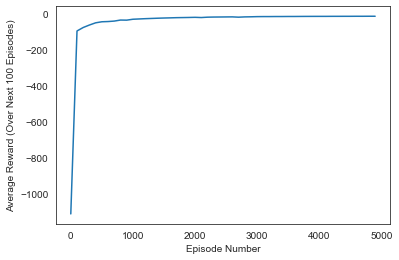

Best Average Reward over 100 Episodes:  -15.36


**<span style="color: red;">PLEASE TRY AGAIN</span>**


Estimated Optimal Policy (UP = 0, RIGHT = 1, DOWN = 2, LEFT = 3, N/A = -1):
[[ 1  3  1  1  3  3  1  2  1  1  2  2]
 [ 1  1  1  1  1  1  1  2  1  2  1  2]
 [ 0  1  1  1  1  1  1  1  1  1  1  2]
 [ 0 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1]]


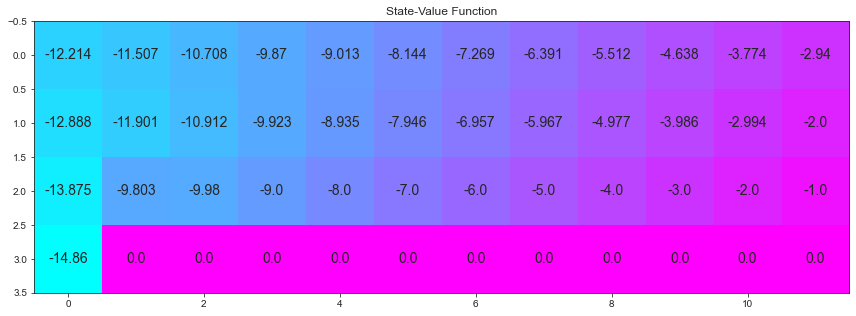

In [8]:
# obtain the estimated optimal policy and corresponding action-value function
Q_sarsa = sarsa(env, 5000, .01)

# print the estimated optimal policy
policy_sarsa = np.array([np.argmax(Q_sarsa[key]) if key in Q_sarsa else -1 for key in np.arange(48)]).reshape(4,12)
check_test.run_check('td_control_check', policy_sarsa)
print("\nEstimated Optimal Policy (UP = 0, RIGHT = 1, DOWN = 2, LEFT = 3, N/A = -1):")
print(policy_sarsa)

# plot the estimated optimal state-value function
V_sarsa = ([np.max(Q_sarsa[key]) if key in Q_sarsa else 0 for key in np.arange(48)])
plot_values(V_sarsa)

### Part 2: TD Control: Q-learning

In this section, you will write your own implementation of the Q-learning control algorithm.

Your algorithm has four arguments:
- `env`: This is an instance of an OpenAI Gym environment.
- `num_episodes`: This is the number of episodes that are generated through agent-environment interaction.
- `alpha`: This is the step-size parameter for the update step.
- `gamma`: This is the discount rate.  It must be a value between 0 and 1, inclusive (default value: `1`).

The algorithm returns as output:
- `Q`: This is a dictionary (of one-dimensional arrays) where `Q[s][a]` is the estimated action value corresponding to state `s` and action `a`.

Please complete the function in the code cell below.

(_Feel free to define additional functions to help you to organize your code._)

In [8]:
def update_Q_sarsamax(alpha, gamma, Q, state, action, reward, next_state=None):
    """Returns updated Q-value for the most recent experience."""
    current = Q[state][action]  # estimate in Q-table (for current state, action pair)
    Qsa_next = np.max(Q[next_state]) if next_state is not None else 0  # value of next state 
    target = reward + (gamma * Qsa_next)               # construct TD target
    new_value = current + (alpha * (target - current)) # get updated value 
    return new_value

In [9]:
def q_learning(env, num_episodes, alpha, gamma=1.0, plot_every=100):
    """Q-Learning - TD Control
    
    Params
    ======
        num_episodes (int): number of episodes to run the algorithm
        alpha (float): learning rate
        gamma (float): discount factor
        plot_every (int): number of episodes to use when calculating average score
    """
    nA = env.action_space.n                # number of actions
    Q = defaultdict(lambda: np.zeros(nA))  # initialize empty dictionary of arrays
    
    # monitor performance
    tmp_scores = deque(maxlen=plot_every)     # deque for keeping track of scores
    avg_scores = deque(maxlen=num_episodes)   # average scores over every plot_every episodes
    
    for i_episode in range(1, num_episodes+1):
        # monitor progress
        if i_episode % 100 == 0:
            print("\rEpisode {}/{}".format(i_episode, num_episodes), end="")
            sys.stdout.flush()
        score = 0                                              # initialize score
        state = env.reset()                                    # start episode
        eps = 1.0 / i_episode                                  # set value of epsilon
        
        while True:
            action = epsilon_greedy(Q, state, nA, eps)         # epsilon-greedy action selection
            next_state, reward, done, info = env.step(action)  # take action A, observe R, S'
            score += reward                                    # add reward to agent's score
            Q[state][action] = update_Q_sarsamax(alpha, gamma, Q, \
                                                 state, action, reward, next_state)        
            state = next_state                                 # S <- S'
            if done:
                tmp_scores.append(score)                       # append score
                break
        if (i_episode % plot_every == 0):
            avg_scores.append(np.mean(tmp_scores))
            
    # plot performance
    plt.plot(np.linspace(0,num_episodes,len(avg_scores),endpoint=False), np.asarray(avg_scores))
    plt.xlabel('Episode Number')
    plt.ylabel('Average Reward (Over Next %d Episodes)' % plot_every)
    plt.show()
    # print best 100-episode performance
    print(('Best Average Reward over %d Episodes: ' % plot_every), np.max(avg_scores))
    return Q

Use the next code cell to visualize the **_estimated_** optimal policy and the corresponding state-value function. 

If the code cell returns **PASSED**, then you have implemented the function correctly!  Feel free to change the `num_episodes` and `alpha` parameters that are supplied to the function.  However, if you'd like to ensure the accuracy of the unit test, please do not change the value of `gamma` from the default.

Episode 5000/5000

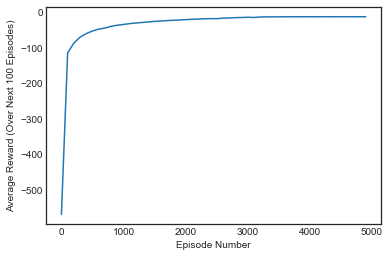

Best Average Reward over 100 Episodes:  -13.0


**<span style="color: green;">PASSED</span>**


Estimated Optimal Policy (UP = 0, RIGHT = 1, DOWN = 2, LEFT = 3, N/A = -1):
[[ 0  3  1  1  1  1  1  1  1  2  2  1]
 [ 1  1  0  3  2  2  1  3  2  2  2  2]
 [ 1  1  1  1  1  1  1  1  1  1  1  2]
 [ 0 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  0]]


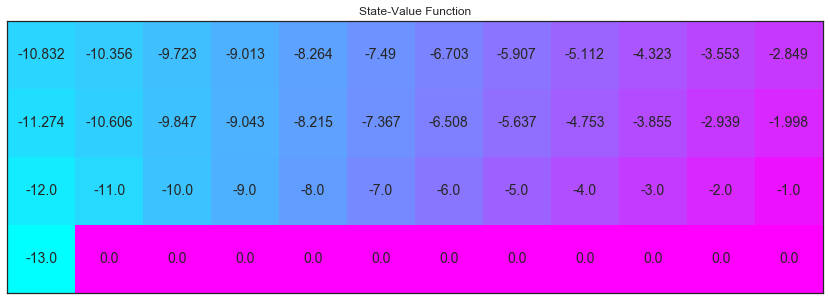

In [10]:
# obtain the estimated optimal policy and corresponding action-value function
Q_sarsamax = q_learning(env, 5000, .01)

# print the estimated optimal policy
policy_sarsamax = np.array([np.argmax(Q_sarsamax[key]) if key in Q_sarsamax else -1 for key in np.arange(48)]).reshape((4,12))
check_test.run_check('td_control_check', policy_sarsamax)
print("\nEstimated Optimal Policy (UP = 0, RIGHT = 1, DOWN = 2, LEFT = 3, N/A = -1):")
print(policy_sarsamax)

# plot the estimated optimal state-value function
plot_values([np.max(Q_sarsamax[key]) if key in Q_sarsamax else 0 for key in np.arange(48)])

### Part 3: TD Control: Expected Sarsa

In this section, you will write your own implementation of the Expected Sarsa control algorithm.

Your algorithm has four arguments:
- `env`: This is an instance of an OpenAI Gym environment.
- `num_episodes`: This is the number of episodes that are generated through agent-environment interaction.
- `alpha`: This is the step-size parameter for the update step.
- `gamma`: This is the discount rate.  It must be a value between 0 and 1, inclusive (default value: `1`).

The algorithm returns as output:
- `Q`: This is a dictionary (of one-dimensional arrays) where `Q[s][a]` is the estimated action value corresponding to state `s` and action `a`.

Please complete the function in the code cell below.

(_Feel free to define additional functions to help you to organize your code._)

In [11]:
def update_Q_expsarsa(alpha, gamma, nA, eps, Q, state, action, reward, next_state=None):
    """Returns updated Q-value for the most recent experience."""
    current = Q[state][action]         # estimate in Q-table (for current state, action pair)
    policy_s = np.ones(nA) * eps / nA  # current policy (for next state S')
    policy_s[np.argmax(Q[next_state])] = 1 - eps + (eps / nA) # greedy action
    Qsa_next = np.dot(Q[next_state], policy_s)         # get value of state at next time step
    target = reward + (gamma * Qsa_next)               # construct target
    new_value = current + (alpha * (target - current)) # get updated value 
    return new_value

In [12]:
def expected_sarsa(env, num_episodes, alpha, gamma=1.0, plot_every=100):
    """Expected SARSA - TD Control
    
    Params
    ======
        num_episodes (int): number of episodes to run the algorithm
        alpha (float): step-size parameters for the update step
        gamma (float): discount factor
        plot_every (int): number of episodes to use when calculating average score
    """
    nA = env.action_space.n                # number of actions
    Q = defaultdict(lambda: np.zeros(nA))  # initialize empty dictionary of arrays
    
    # monitor performance
    tmp_scores = deque(maxlen=plot_every)     # deque for keeping track of scores
    avg_scores = deque(maxlen=num_episodes)   # average scores over every plot_every episodes
    
    for i_episode in range(1, num_episodes+1):
        # monitor progress
        if i_episode % 100 == 0:
            print("\rEpisode {}/{}".format(i_episode, num_episodes), end="")
            sys.stdout.flush()
        
        score = 0             # initialize score
        state = env.reset()   # start episode
        eps = 0.005           # set value of epsilon
        
        while True:
            action = epsilon_greedy(Q, state, nA, eps)         # epsilon-greedy action selection
            next_state, reward, done, info = env.step(action)  # take action A, observe R, S'
            score += reward                                    # add reward to agent's score
            # update Q
            Q[state][action] = update_Q_expsarsa(alpha, gamma, nA, eps, Q, \
                                                 state, action, reward, next_state)        
            state = next_state              # S <- S'
            if done:
                tmp_scores.append(score)    # append score
                break
        if (i_episode % plot_every == 0):
            avg_scores.append(np.mean(tmp_scores))
            
    # plot performance
    plt.plot(np.linspace(0,num_episodes,len(avg_scores),endpoint=False), np.asarray(avg_scores))
    plt.xlabel('Episode Number')
    plt.ylabel('Average Reward (Over Next %d Episodes)' % plot_every)
    plt.show()
    # print best 100-episode performance
    print(('Best Average Reward over %d Episodes: ' % plot_every), np.max(avg_scores))
    return Q

Use the next code cell to visualize the **_estimated_** optimal policy and the corresponding state-value function.  

If the code cell returns **PASSED**, then you have implemented the function correctly!  Feel free to change the `num_episodes` and `alpha` parameters that are supplied to the function.  However, if you'd like to ensure the accuracy of the unit test, please do not change the value of `gamma` from the default.

Episode 5000/5000

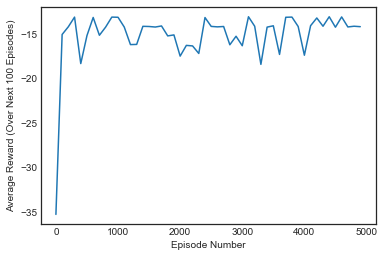

Best Average Reward over 100 Episodes:  -13.02


**<span style="color: green;">PASSED</span>**


Estimated Optimal Policy (UP = 0, RIGHT = 1, DOWN = 2, LEFT = 3, N/A = -1):
[[ 1  1  1  2  1  1  1  2  1  3  1  3]
 [ 1  1  1  1  1  1  1  1  1  1  1  2]
 [ 1  1  1  1  1  1  1  1  1  1  1  2]
 [ 0 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  0]]


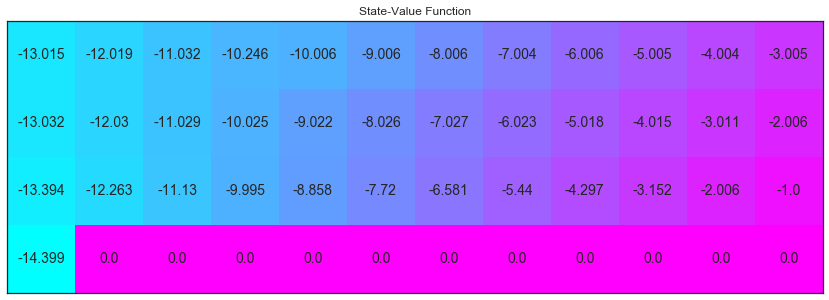

In [13]:
# obtain the estimated optimal policy and corresponding action-value function
Q_expsarsa = expected_sarsa(env, 5000, 1)

# print the estimated optimal policy
policy_expsarsa = np.array([np.argmax(Q_expsarsa[key]) if key in Q_expsarsa else -1 for key in np.arange(48)]).reshape(4,12)
check_test.run_check('td_control_check', policy_expsarsa)
print("\nEstimated Optimal Policy (UP = 0, RIGHT = 1, DOWN = 2, LEFT = 3, N/A = -1):")
print(policy_expsarsa)

# plot the estimated optimal state-value function
plot_values([np.max(Q_expsarsa[key]) if key in Q_expsarsa else 0 for key in np.arange(48)])